# Product Size Recommendation¶
Deepak Dwivedi (11920001) Gauri Yogeish Mayekar (12010052) Aditya R Auradker (11915078) Dhruv Mahan Cairae (11920031)

In [2]:
# importing libraray 

import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns 
import os
import nltk
from nltk.corpus import stopwords
from textblob import TextBlob
from nltk.sentiment import SentimentIntensityAnalyzer
import time
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split

import json   
import pandas as pd
import numpy as np
from sklearn.preprocessing import LabelEncoder
import warnings
warnings.filterwarnings('ignore')




In [2]:
data1 = []
with open('C:/Users/abc/Documents/ISB/ML/Term4/renttherunway_final_data.json') as f:
    for line in f:
        data1.append(json.loads(line))

cloth_df = pd.DataFrame(data1)
cloth_df.to_csv("clothes.csv")


,fit,user_id,bust size,item_id,weight,rating,rented for,review_text,body type,review_summary,category,height,size,age,review_date
0,fit,420272,34d,2260466,137lbs,10,vacation,An adorable romper! Belt and zipper were a lit...,hourglass,So many compliments!,romper,"5' 8""",14,28,"April 20, 2016"
1,fit,273551,34b,153475,132lbs,10,other,I rented this dress for a photo shoot. The the...,straight & narrow,I felt so glamourous!!!,gown,"5' 6""",12,36,"June 18, 2013"
2,fit,360448,NaN,1063761,NaN,10,party,This hugged in all the right places! It was a ...,NaN,It was a great time to celebrate the (almost) ...,sheath,"5' 4""",4,116,"December 14, 2015"
3,fit,909926,34c,126335,135lbs,8,formal affair,I rented this for my company's black tie award...,pear,Dress arrived on time and in perfect condition.,dress,"5' 5""",8,34,"February 12, 2014"
4,fit,151944,34b,616682,145lbs,10,wedding,I have always been petite in my upper body and...,athletic,Was in love with this dress !!!,gown,"5' 9""",12,27,"September 26, 2016"


In [5]:
# reading data 
data=pd.read_csv("clothes.csv")
cloth_df=data.copy()




Shape of the data : (192544, 15)
*******************
Data type :
 fit                object
user_id             int64
bust size          object
item_id             int64
weight             object
rating            float64
rented for         object
review_text        object
body type          object
review_summary     object
category           object
height             object
size                int64
age               float64
review_date        object
dtype: object
*******************
unique user: 105571
unique Item: 5850
*******************
<class 'pandas.core.frame.DataFrame'>
RangeIndex: 192544 entries, 0 to 192543
Data columns (total 15 columns):
 #   Column          Non-Null Count   Dtype  
---  ------          --------------   -----  
 0   fit             192544 non-null  object 
 1   user_id         192544 non-null  int64  
 2   bust size       174133 non-null  object 
 3   item_id         192544 non-null  int64  
 4   weight          162562 non-null  object 
 5   rating        

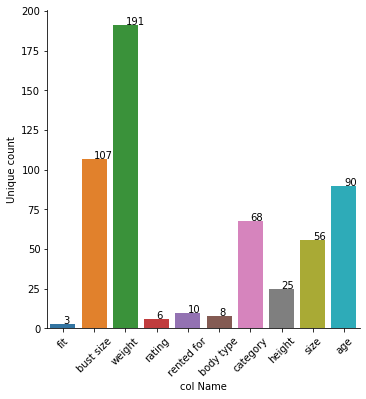

In [8]:
#Descriptive Stats
print("Shape of the data :",data.shape)
print("*******************")
print("Data type :\n", data.dtypes)
print("*******************")
print("unique user:",len(data['user_id'].unique()))
print("unique Item:",len(data['item_id'].unique()))
print("*******************")
print("Data type :\n", data.info())



col=list(data.columns)
rem=['user_id','review_text','review_summary','review_date','item_id']
for i in rem:
    col.remove(i)
col_des={}
des=[]
cnt=[]
for i in col:
    des.append(i)
    col_des["col Name"]=des
    l=(len(data[i].unique()))
    cnt.append(l)
    col_des["Unique count"]=cnt
col_des
    
def addlabels(x,y):
    for i in range(len(x)):
        plt.text(i,y[i],y[i])
        
Unique_data_cnt=pd.DataFrame(col_des)

sns.catplot(data=Unique_data_cnt,x="col Name",y="Unique count",kind="bar",estimator=sum)
plt.xticks(rotation=45)
addlabels(Unique_data_cnt["col Name"],Unique_data_cnt["Unique count"])
plt.show()


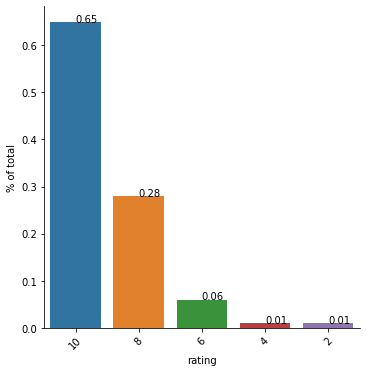

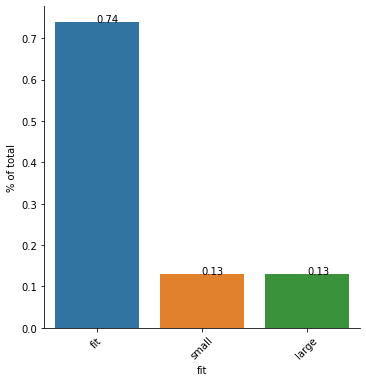

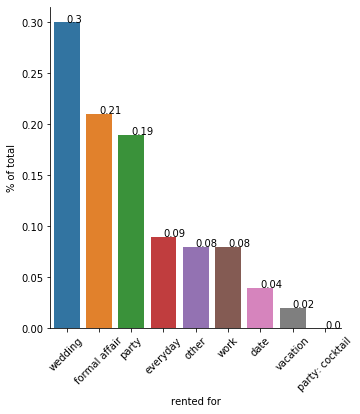

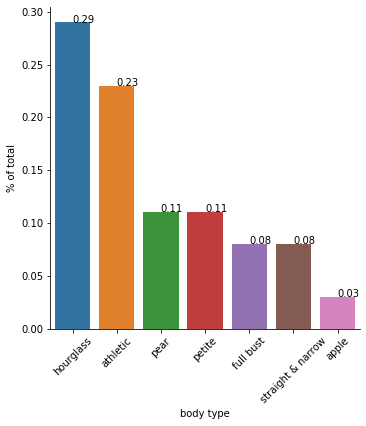

In [7]:
freq=["fit","rating","rented for","body type"]
def freqplot(a):
    df=pd.DataFrame(round(data[a].value_counts()/data.shape[0],2))
    df.reset_index(inplace=True)
    df.columns=[a,"% of total"]
    
    sns.catplot(data=df,x=a,y="% of total",kind="bar",estimator=sum, order=[10,8,6,4,2])
    plt.xticks(rotation=45)
    addlabels(df[a],df["% of total"])
    plt.show()
freqplot("rating")



def freqplot2(a):
    df=pd.DataFrame(round(data[a].value_counts()/data.shape[0],2))
    df.reset_index(inplace=True)
    df.columns=[a,"% of total"]
    
    sns.catplot(data=df,x=a,y="% of total",kind="bar",estimator=sum)
    plt.xticks(rotation=45)
    addlabels(df[a],df["% of total"])
    plt.show()

freqplot2("fit")
#freqplot("rating")
freqplot2("rented for")
freqplot2("body type")



In [9]:
#Remove NaN values from the dataframe
cloth_df.dropna(inplace = True)

In [10]:
cloth_df.rename(columns = {'rented for' : 'rented_for', 'body type': 'body_type', 'bust size': 'bust_size'}, inplace = True)

In [11]:
item_df = cloth_df[["item_id", "user_id", "fit", "rating"]]

In [11]:
item_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 146381 entries, 0 to 192543
Data columns (total 4 columns):
 #   Column   Non-Null Count   Dtype 
---  ------   --------------   ----- 
 0   item_id  146381 non-null  object
 1   user_id  146381 non-null  object
 2   fit      146381 non-null  object
 3   rating   146381 non-null  object
dtypes: object(4)
memory usage: 5.6+ MB


In [12]:
item_df.dtypes

item_id    object
user_id    object
fit        object
rating     object
dtype: object

In [13]:
number = LabelEncoder()

In [14]:
item_df['fit'] = number.fit_transform(item_df['fit'].astype('str'))

In [15]:
item_df.fit.unique()

array([0, 2, 1])

In [16]:
item_df.fit.unique()

array([0, 2, 1])

In [17]:
item_df.loc[item_df.fit == 0, "fit"] = 3
item_df.loc[item_df.fit == 2, "fit"] = 0
item_df.loc[item_df.fit == 1, "fit"] = 0
item_df.loc[item_df.fit == 3, "fit"] = 1

In [18]:
item_df.head()

,item_id,user_id,fit,rating
0,2260466,420272,1,10
1,153475,273551,1,10
3,126335,909926,1,8
4,616682,151944,1,10
5,364092,734848,1,8


In [19]:
user_count = item_df.groupby('item_id')['user_id'].count()
df1 = pd.DataFrame(user_count)
df1.head()

,user_id
item_id,
1000254,32
1000270,82
1000739,59
1001122,68
1001783,1


In [20]:
fit_count = item_df.groupby('item_id')['fit'].sum()
df2 = pd.DataFrame(fit_count)
df2.head()

,fit
item_id,
1000254,18
1000270,61
1000739,49
1001122,22
1001783,1


In [21]:
item_df["rating"] = pd.to_numeric(item_df["rating"])

In [22]:
rating_count = item_df.groupby('item_id')['rating'].mean()
df3 = pd.DataFrame(rating_count)
df3.head()

,rating
item_id,
1000254,9.500000
1000270,9.317073
1000739,9.593220
1001122,9.235294
1001783,10.000000


In [23]:
fit_count.head()

item_id
1000254    18
1000270    61
1000739    49
1001122    22
1001783     1
Name: fit, dtype: int32

In [24]:
df1_merge = df1.merge(df2, on='item_id')
df_merge = df1_merge.merge(df3, on ='item_id')
df_merge.head()

,user_id,fit,rating
item_id,,,
1000254,32,18,9.500000
1000270,82,61,9.317073
1000739,59,49,9.593220
1001122,68,22,9.235294
1001783,1,1,10.000000


In [25]:
df_merge.rename(columns = {'user_id' : 'user_votes', 'fit': 'fit_votes'}, inplace = True)

In [26]:
df_merge.head()

,user_votes,fit_votes,rating
item_id,,,
1000254,32,18,9.500000
1000270,82,61,9.317073
1000739,59,49,9.593220
1001122,68,22,9.235294
1001783,1,1,10.000000


In [27]:
# Calculate all the components based on the above formula
v=df_merge['user_votes']
R=df_merge['rating']
C=df_merge['rating'].mean()
m=df_merge['user_votes'].quantile(0.70)

In [28]:
df_merge['user_votes'].quantile (0.9)
#print(m)

51.0

In [29]:
df_merge['weighted_average']=((R*v)+ (C*m))/(v+m)

In [30]:
sorted_ranking=df_merge.sort_values('weighted_average',ascending=False)

In [31]:
sorted_ranking.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5736 entries, 1064397 to 2468805
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   user_votes        5736 non-null   int64  
 1   fit_votes         5736 non-null   int32  
 2   rating            5736 non-null   float64
 3   weighted_average  5736 non-null   float64
dtypes: float64(2), int32(1), int64(1)
memory usage: 201.7+ KB


In [32]:
weight_average=sorted_ranking.sort_values('weighted_average',ascending=False)
weight_average.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5736 entries, 1064397 to 2468805
Data columns (total 4 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   user_votes        5736 non-null   int64  
 1   fit_votes         5736 non-null   int32  
 2   rating            5736 non-null   float64
 3   weighted_average  5736 non-null   float64
dtypes: float64(2), int32(1), int64(1)
memory usage: 201.7+ KB


In [33]:

#weight_average.reset_index().rename({'index':'prod_id'}, axis = 'columns', inplace=True)
#weight_average.head()

weight_average = weight_average.rename_axis(['index2']).reset_index()
weight_average.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5736 entries, 0 to 5735
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   index2            5736 non-null   object 
 1   user_votes        5736 non-null   int64  
 2   fit_votes         5736 non-null   int32  
 3   rating            5736 non-null   float64
 4   weighted_average  5736 non-null   float64
dtypes: float64(2), int32(1), int64(1), object(1)
memory usage: 201.8+ KB


In [34]:
weight_average = weight_average.rename(columns = {'user_id' : 'user_votes', 'fit': 'fit_votes'}, inplace = False)

In [35]:
weight_average.head()

,index2,user_votes,fit_votes,rating,weighted_average
0,1064397,198,179,9.777778,9.701970
1,709832,144,112,9.805556,9.701402
2,1186923,83,74,9.855422,9.680109
3,903647,105,93,9.790476,9.656598
4,1215281,56,48,9.892857,9.645862


In [36]:
weight_average.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 5736 entries, 0 to 5735
Data columns (total 5 columns):
 #   Column            Non-Null Count  Dtype  
---  ------            --------------  -----  
 0   index2            5736 non-null   object 
 1   user_votes        5736 non-null   int64  
 2   fit_votes         5736 non-null   int32  
 3   rating            5736 non-null   float64
 4   weighted_average  5736 non-null   float64
dtypes: float64(2), int32(1), int64(1), object(1)
memory usage: 201.8+ KB


In [37]:
weight_average.describe()

,user_votes,fit_votes,rating,weighted_average
count,5736.000000,5736.000000,5736.000000,5736.000000
mean,25.519700,18.781904,8.987208,9.006430
std,64.121242,50.218550,0.815325,0.214585
min,1.000000,0.000000,2.000000,7.661954
25%,4.000000,3.000000,8.666667,8.896967
50%,11.000000,8.000000,9.120000,9.030473
75%,25.000000,18.000000,9.500000,9.131427
max,1527.000000,1174.000000,10.000000,9.701970


In [38]:
#Top 10 products with weighted average of rating and user votes
weight_average.head(10)

,index2,user_votes,fit_votes,rating,weighted_average
0,1064397,198,179,9.777778,9.701970
1,709832,144,112,9.805556,9.701402
2,1186923,83,74,9.855422,9.680109
3,903647,105,93,9.790476,9.656598
4,1215281,56,48,9.892857,9.645862
5,1940985,75,64,9.786667,9.611785
6,1010328,96,83,9.729167,9.595995
7,1003076,95,89,9.726316,9.592512
8,371022,45,36,9.866667,9.586839
9,714374,102,83,9.705882,9.583182


In [39]:
import matplotlib.pyplot as plt
import seaborn as sns

weight_average=sorted_ranking.sort_values('weighted_average',ascending=False)
plt.figure(figsize=(12,6))
axis1=sns.barplot(x=weight_average['weighted_average'].head(10), y=weight_average['index2'].head(10), data=weight_average)
plt.xlim(4, 10)
plt.title('Best Products by weighted rating', weight='bold')
plt.xlabel('Weighted Average Score', weight='bold')
plt.ylabel('Product Id', weight='bold')
plt.savefig('best_product.png')

KeyError: 'index2'

<Figure size 864x432 with 0 Axes>

In [40]:
from sklearn.preprocessing import MinMaxScaler

scaling=MinMaxScaler()
scaled_df=scaling.fit_transform(weight_average[['weighted_average','fit_votes']])
normalized_df=pd.DataFrame(scaled_df,columns=['weighted_average','fit_votes'])
normalized_df.head()

,weighted_average,fit_votes
0,1.000000,0.152470
1,0.999722,0.095400
2,0.989284,0.063032
3,0.977759,0.079216
4,0.972496,0.040886


In [41]:
weight_average[['normalized_weight_average','normalized_fitness']]= normalized_df
weight_average.head()

,user_votes,fit_votes,rating,weighted_average,normalized_weight_average,normalized_fitness
item_id,,,,,,
1064397,198,179,9.777778,9.701970,NaN,NaN
709832,144,112,9.805556,9.701402,NaN,NaN
1186923,83,74,9.855422,9.680109,NaN,NaN
903647,105,93,9.790476,9.656598,NaN,NaN
1215281,56,48,9.892857,9.645862,NaN,NaN


In [42]:
weight_average['score'] = weight_average['normalized_weight_average'] * 0.5 + weight_average['normalized_fitness'] * 0.5
scored_df = weight_average.sort_values(['score'], ascending=False)

#Top products with hightest rating according to product fit, weighted average rating and number of user votes
scored_df.head()

,user_votes,fit_votes,rating,weighted_average,normalized_weight_average,normalized_fitness,score
item_id,,,,,,,
1064397,198,179,9.777778,9.701970,NaN,NaN,NaN
709832,144,112,9.805556,9.701402,NaN,NaN,NaN
1186923,83,74,9.855422,9.680109,NaN,NaN,NaN
903647,105,93,9.790476,9.656598,NaN,NaN,NaN
1215281,56,48,9.892857,9.645862,NaN,NaN,NaN


## Create sentiment score using review text in the cloth dataset

In [3]:
cloth_df['review_text'].head()

0    An adorable romper! Belt and zipper were a lit...
1    I rented this dress for a photo shoot. The the...
2    This hugged in all the right places! It was a ...
3    I rented this for my company's black tie award...
4    I have always been petite in my upper body and...
Name: review_text, dtype: object

In [13]:
import nltk
from nltk.corpus import stopwords
#nltk.download('stopwords')


In [14]:
stop_words=set(stopwords.words('english'))

In [15]:
cloth_df['review_text'] = cloth_df['review_text'].str.lower()

In [19]:
cloth_df['review_text'].head(1)

0    an adorable romper! belt and zipper were a lit...
Name: review_text, dtype: object

In [20]:
from textblob import TextBlob
#senti=TextBlob('an adorable romper! belt and zipper were a lit...').correct()
#senti.sentiment

Sentiment(polarity=0.625, subjectivity=1.0)

In [21]:
sentimentspol=[]
sentimentssen=[]
for i in cloth_df['review_text']:
    senti=TextBlob(i).correct()
    score=senti.sentiment
    #print(score)
    word=str(score).split('=')
    polarity=word[1].split(',')[0]
    sensitivity=word[2].split(')')[0]
    sentimentspol.append(polarity)
    sentimentssen.append(sensitivity)

Sentiment(polarity=0.18154761904761904, subjectivity=0.6238095238095239)
Sentiment(polarity=0.38388888888888895, subjectivity=0.7388888888888889)
Sentiment(polarity=0.21305555555555558, subjectivity=0.46155555555555555)
Sentiment(polarity=-0.05402777777777776, subjectivity=0.3204166666666667)
Sentiment(polarity=0.3089285714285714, subjectivity=0.4714285714285714)
Sentiment(polarity=0.47884615384615375, subjectivity=0.5032051282051282)
Sentiment(polarity=0.2084821428571429, subjectivity=0.4839285714285714)
Sentiment(polarity=0.4333333333333334, subjectivity=0.5690476190476191)
Sentiment(polarity=-0.04017857142857143, subjectivity=0.6351190476190476)
Sentiment(polarity=0.20017001114827201, subjectivity=0.41721293199554077)
Sentiment(polarity=0.46875, subjectivity=0.5875)
Sentiment(polarity=0.14785714285714285, subjectivity=0.4957142857142857)
Sentiment(polarity=0.5111111111111112, subjectivity=0.6055555555555555)
Sentiment(polarity=0.37714285714285717, subjectivity=0.6076190476190475)
Se

Sentiment(polarity=0.1896428571428571, subjectivity=0.5647619047619047)
Sentiment(polarity=0.31, subjectivity=0.58)
Sentiment(polarity=0.23958333333333334, subjectivity=0.6202083333333334)
Sentiment(polarity=0.2387254901960784, subjectivity=0.48431372549019613)
Sentiment(polarity=0.08582112332112332, subjectivity=0.5052808302808303)
Sentiment(polarity=0.0163265306122449, subjectivity=0.4040816326530612)
Sentiment(polarity=0.34739583333333335, subjectivity=0.725)
Sentiment(polarity=0.38630952380952377, subjectivity=0.6626984126984128)
Sentiment(polarity=0.2532051282051282, subjectivity=0.4608974358974359)
Sentiment(polarity=0.18653846153846157, subjectivity=0.5948717948717949)
Sentiment(polarity=0.21285714285714286, subjectivity=0.6957142857142856)
Sentiment(polarity=0.10555555555555554, subjectivity=0.2361111111111111)
Sentiment(polarity=0.15669642857142857, subjectivity=0.48214285714285715)
Sentiment(polarity=0.5625, subjectivity=0.875)
Sentiment(polarity=0.2051767676767677, subjectiv

Sentiment(polarity=0.24659090909090906, subjectivity=0.5763636363636363)
Sentiment(polarity=0.16428571428571428, subjectivity=0.5142857142857143)
Sentiment(polarity=0.4025, subjectivity=0.7)
Sentiment(polarity=0.21714285714285717, subjectivity=0.4492063492063492)
Sentiment(polarity=0.1663988095238095, subjectivity=0.49297619047619046)
Sentiment(polarity=0.4642857142857143, subjectivity=0.2571428571428571)
Sentiment(polarity=0.15615548980933597, subjectivity=0.45062458908612757)
Sentiment(polarity=0.06805555555555555, subjectivity=0.4819444444444444)
Sentiment(polarity=0.25000000000000006, subjectivity=0.5232142857142857)
Sentiment(polarity=0.2854166666666667, subjectivity=0.4666666666666667)
Sentiment(polarity=0.5208333333333334, subjectivity=0.5916666666666667)
Sentiment(polarity=0.25625, subjectivity=0.48500000000000004)
Sentiment(polarity=0.3666666666666667, subjectivity=0.39999999999999997)
Sentiment(polarity=0.15042162698412698, subjectivity=0.3905753968253968)
Sentiment(polarity=

Sentiment(polarity=0.3143939393939394, subjectivity=0.3924242424242424)
Sentiment(polarity=0.31416666666666665, subjectivity=0.5866666666666667)
Sentiment(polarity=0.3319444444444445, subjectivity=0.5974358974358975)
Sentiment(polarity=0.047895408163265304, subjectivity=0.4244897959183674)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.12958333333333333, subjectivity=0.6433333333333333)
Sentiment(polarity=0.21711538461538465, subjectivity=0.4690313390313391)
Sentiment(polarity=0.2857142857142857, subjectivity=0.5642857142857143)
Sentiment(polarity=0.5775, subjectivity=0.79)
Sentiment(polarity=0.3416666666666666, subjectivity=0.625)
Sentiment(polarity=0.5390476190476191, subjectivity=0.7130952380952381)
Sentiment(polarity=0.09916666666666668, subjectivity=0.5933333333333333)
Sentiment(polarity=-0.325, subjectivity=0.52)
Sentiment(polarity=0.10916666666666668, subjectivity=0.6)
Sentiment(polarity=0.47222222222222215, subjectivity=0.6444444444444444)
Sentiment(polarity=0.2

Sentiment(polarity=0.2981316137566138, subjectivity=0.599867724867725)
Sentiment(polarity=0.3112698412698413, subjectivity=0.6629365079365079)
Sentiment(polarity=0.21904761904761907, subjectivity=0.5714285714285714)
Sentiment(polarity=0.24681299603174603, subjectivity=0.5238095238095237)
Sentiment(polarity=0.40104166666666674, subjectivity=0.6427083333333333)
Sentiment(polarity=0.2928571428571428, subjectivity=0.5321428571428571)
Sentiment(polarity=0.23000000000000004, subjectivity=0.5066666666666667)
Sentiment(polarity=0.41111111111111115, subjectivity=0.7333333333333334)
Sentiment(polarity=0.5, subjectivity=0.5499999999999999)
Sentiment(polarity=0.4625, subjectivity=0.6)
Sentiment(polarity=0.21931818181818183, subjectivity=0.3)
Sentiment(polarity=0.1159920634920635, subjectivity=0.4091269841269842)
Sentiment(polarity=0.45535714285714285, subjectivity=0.6714285714285714)
Sentiment(polarity=0.24267857142857147, subjectivity=0.8138392857142857)
Sentiment(polarity=0.27692307692307694, su

Sentiment(polarity=0.25833333333333336, subjectivity=0.3166666666666667)
Sentiment(polarity=0.4625, subjectivity=0.5700000000000001)
Sentiment(polarity=0.34791666666666665, subjectivity=0.6416666666666667)
Sentiment(polarity=0.2714285714285714, subjectivity=0.5)
Sentiment(polarity=0.11830357142857142, subjectivity=0.5450892857142857)
Sentiment(polarity=0.08822916666666666, subjectivity=0.5091666666666667)
Sentiment(polarity=0.32499999999999996, subjectivity=0.46249999999999997)
Sentiment(polarity=0.07222222222222223, subjectivity=0.4611111111111111)
Sentiment(polarity=0.049374999999999995, subjectivity=0.40625)
Sentiment(polarity=0.28125, subjectivity=0.684375)
Sentiment(polarity=0.2510714285714286, subjectivity=0.48357142857142854)
Sentiment(polarity=0.2569444444444444, subjectivity=0.6944444444444444)
Sentiment(polarity=0.26249999999999996, subjectivity=0.4267857142857143)
Sentiment(polarity=0.41874999999999996, subjectivity=0.775)
Sentiment(polarity=0.4035714285714286, subjectivity=

Sentiment(polarity=0.3169642857142857, subjectivity=0.5403571428571429)
Sentiment(polarity=0.4680555555555556, subjectivity=0.6155555555555555)
Sentiment(polarity=0.19166666666666665, subjectivity=0.4458333333333333)
Sentiment(polarity=0.30178571428571427, subjectivity=0.5821428571428572)
Sentiment(polarity=0.28080357142857143, subjectivity=0.6093253968253968)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.2777777777777778, subjectivity=0.41111111111111115)
Sentiment(polarity=0.2777777777777778, subjectivity=0.5)
Sentiment(polarity=0.5166666666666667, subjectivity=0.6)
Sentiment(polarity=0.09928075396825395, subjectivity=0.478741224053724)
Sentiment(polarity=0.15967261904761904, subjectivity=0.5214880952380953)
Sentiment(polarity=0.22184065934065936, subjectivity=0.5585164835164835)
Sentiment(polarity=0.11474358974358975, subjectivity=0.5961538461538461)
Sentiment(polarity=0.22925000000000004, subjectivity=0.657)
Sentiment(polarity=-0.08928571428571429, subjectivity=0.3

Sentiment(polarity=0.6000000000000001, subjectivity=0.85)
Sentiment(polarity=0.44375000000000003, subjectivity=0.55625)
Sentiment(polarity=0.06607142857142857, subjectivity=0.4857142857142857)
Sentiment(polarity=0.38962418300653595, subjectivity=0.626797385620915)
Sentiment(polarity=0.15518518518518518, subjectivity=0.6150617283950618)
Sentiment(polarity=0.6799999999999999, subjectivity=0.76)
Sentiment(polarity=0.5, subjectivity=0.7977777777777778)
Sentiment(polarity=0.35, subjectivity=0.30000000000000004)
Sentiment(polarity=0.4, subjectivity=0.4)
Sentiment(polarity=0.17380952380952377, subjectivity=0.4619047619047619)
Sentiment(polarity=0.6583333333333333, subjectivity=0.8041666666666667)
Sentiment(polarity=0.41428571428571426, subjectivity=0.594047619047619)
Sentiment(polarity=0.01990259740259741, subjectivity=0.3618831168831169)
Sentiment(polarity=0.1178054198887532, subjectivity=0.400715642382309)
Sentiment(polarity=0.1625, subjectivity=0.51)
Sentiment(polarity=0.1, subjectivity=0.

Sentiment(polarity=0.26964285714285713, subjectivity=0.4553571428571429)
Sentiment(polarity=0.06468253968253966, subjectivity=0.46436507936507937)
Sentiment(polarity=0.02212301587301587, subjectivity=0.4117460317460317)
Sentiment(polarity=0.2976516439909297, subjectivity=0.4981859410430839)
Sentiment(polarity=0.44319727891156463, subjectivity=0.6479591836734694)
Sentiment(polarity=0.3, subjectivity=0.3666666666666667)
Sentiment(polarity=0.1171153846153846, subjectivity=0.5138461538461538)
Sentiment(polarity=0.321875, subjectivity=0.678125)
Sentiment(polarity=0.25148809523809523, subjectivity=0.4723690476190477)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.38, subjectivity=0.5199999999999999)
Sentiment(polarity=0.373015873015873, subjectivity=0.5896825396825397)
Sentiment(polarity=0.3833333333333333, subjectivity=0.8250000000000001)
Sentiment(polarity=0.4380952380952381, subjectivity=0.4761904761904762)
Sentiment(polarity=0.225, subjectivity=0.7972222222222223)
Sentime

Sentiment(polarity=0.26042735042735043, subjectivity=0.45252136752136757)
Sentiment(polarity=0.2525, subjectivity=0.5791666666666667)
Sentiment(polarity=0.2550865800865801, subjectivity=0.5450216450216451)
Sentiment(polarity=0.27243589743589747, subjectivity=0.4717948717948719)
Sentiment(polarity=0.2305555555555555, subjectivity=0.611904761904762)
Sentiment(polarity=0.3099206349206349, subjectivity=0.7198412698412698)
Sentiment(polarity=0.28125, subjectivity=0.7)
Sentiment(polarity=0.3104166666666667, subjectivity=0.44166666666666665)
Sentiment(polarity=0.21666666666666665, subjectivity=0.44999999999999996)
Sentiment(polarity=0.05667989417989418, subjectivity=0.5315696649029982)
Sentiment(polarity=0.47250000000000003, subjectivity=0.5275000000000001)
Sentiment(polarity=-0.17685185185185184, subjectivity=0.30462962962962964)
Sentiment(polarity=0.6000000000000001, subjectivity=0.9)
Sentiment(polarity=0.19090909090909083, subjectivity=0.47727272727272735)
Sentiment(polarity=0.098148148148

Sentiment(polarity=0.17609649122807017, subjectivity=0.5494987468671679)
Sentiment(polarity=0.28589743589743594, subjectivity=0.5586182336182336)
Sentiment(polarity=0.17639880952380949, subjectivity=0.4430952380952381)
Sentiment(polarity=0.47904761904761906, subjectivity=0.6919047619047619)
Sentiment(polarity=0.2875, subjectivity=0.5833333333333334)
Sentiment(polarity=0.36875, subjectivity=0.575)
Sentiment(polarity=0.385, subjectivity=0.65)
Sentiment(polarity=0.27749999999999997, subjectivity=0.6675)
Sentiment(polarity=0.6666666666666666, subjectivity=0.6833333333333332)
Sentiment(polarity=0.605, subjectivity=0.85)
Sentiment(polarity=0.7, subjectivity=0.6625)
Sentiment(polarity=0.15955882352941178, subjectivity=0.45784313725490194)
Sentiment(polarity=0.13626373626373625, subjectivity=0.4465934065934066)
Sentiment(polarity=0.43, subjectivity=0.6799999999999999)
Sentiment(polarity=0.27499999999999997, subjectivity=0.6437499999999999)
Sentiment(polarity=-0.17857142857142858, subjectivity=

Sentiment(polarity=0.5166666666666667, subjectivity=0.6666666666666666)
Sentiment(polarity=0.3477513227513228, subjectivity=0.5465608465608465)
Sentiment(polarity=0.28541666666666665, subjectivity=0.5208333333333334)
Sentiment(polarity=0.16666666666666666, subjectivity=0.39999999999999997)
Sentiment(polarity=0.31083333333333335, subjectivity=0.6333333333333334)
Sentiment(polarity=0.5207142857142857, subjectivity=0.6)
Sentiment(polarity=0.35, subjectivity=0.55)
Sentiment(polarity=0.0761904761904762, subjectivity=0.475974025974026)
Sentiment(polarity=0.16524358974358974, subjectivity=0.41673076923076924)
Sentiment(polarity=0.65, subjectivity=0.625)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.35, subjectivity=0.55)
Sentiment(polarity=0.1565406162464986, subjectivity=0.5258193277310924)
Sentiment(polarity=0.42083333333333334, subjectivity=0.6041666666666666)
Sentiment(polarity=0.14375000000000002, subjectivity=0.6583333333333333)
Sentiment(polarity=0.14674908424908426, s

Sentiment(polarity=0.26666666666666666, subjectivity=0.72)
Sentiment(polarity=0.1529100529100529, subjectivity=0.3724867724867725)
Sentiment(polarity=0.14375, subjectivity=0.525)
Sentiment(polarity=0.3666666666666667, subjectivity=0.5000000000000001)
Sentiment(polarity=0.017063492063492062, subjectivity=0.4184126984126984)
Sentiment(polarity=0.6292857142857143, subjectivity=0.827857142857143)
Sentiment(polarity=0.48671875, subjectivity=0.725)
Sentiment(polarity=0.14166666666666666, subjectivity=0.55)
Sentiment(polarity=0.1902777777777778, subjectivity=0.47777777777777775)
Sentiment(polarity=0.2916666666666667, subjectivity=0.5333333333333333)
Sentiment(polarity=0.2994047619047619, subjectivity=0.48357142857142854)
Sentiment(polarity=0.32129120879120876, subjectivity=0.5228021978021978)
Sentiment(polarity=0.29166666666666663, subjectivity=0.5476190476190476)
Sentiment(polarity=0.18626373626373624, subjectivity=0.442032967032967)
Sentiment(polarity=0.2976587301587301, subjectivity=0.6567

Sentiment(polarity=0.14125000000000001, subjectivity=0.37958333333333333)
Sentiment(polarity=0.0663095238095238, subjectivity=0.49857142857142855)
Sentiment(polarity=0.5141025641025642, subjectivity=0.6641025641025641)
Sentiment(polarity=-0.053571428571428575, subjectivity=0.4761904761904762)
Sentiment(polarity=0.048333333333333346, subjectivity=0.5144444444444445)
Sentiment(polarity=0.11750000000000002, subjectivity=0.5325)
Sentiment(polarity=0.43333333333333335, subjectivity=0.8333333333333334)
Sentiment(polarity=0.07142857142857142, subjectivity=0.30952380952380953)
Sentiment(polarity=0.35628306878306876, subjectivity=0.6085978835978837)
Sentiment(polarity=0.5471428571428572, subjectivity=0.6971428571428571)
Sentiment(polarity=0.30683379120879123, subjectivity=0.4629120879120878)
Sentiment(polarity=0.85, subjectivity=1.0)
Sentiment(polarity=0.4035714285714286, subjectivity=0.8428571428571429)
Sentiment(polarity=0.14878787878787875, subjectivity=0.5573484848484849)
Sentiment(polarity

Sentiment(polarity=0.35555555555555557, subjectivity=0.6944444444444443)
Sentiment(polarity=0.2688888888888889, subjectivity=0.5111111111111111)
Sentiment(polarity=0.22066770186335405, subjectivity=0.44803312629399594)
Sentiment(polarity=0.22826666666666667, subjectivity=0.4237333333333333)
Sentiment(polarity=0.09999999999999996, subjectivity=0.7916666666666667)
Sentiment(polarity=0.3342261904761905, subjectivity=0.5422123015873016)
Sentiment(polarity=0.2339285714285714, subjectivity=0.49017857142857146)
Sentiment(polarity=0.6194444444444446, subjectivity=0.8194444444444444)
Sentiment(polarity=0.3387987012987013, subjectivity=0.557142857142857)
Sentiment(polarity=0.162037037037037, subjectivity=0.6111111111111112)
Sentiment(polarity=0.2940255731922399, subjectivity=0.6241622574955908)
Sentiment(polarity=0.3833333333333333, subjectivity=0.9333333333333332)
Sentiment(polarity=0.40307539682539684, subjectivity=0.6367063492063492)
Sentiment(polarity=0.2598958333333333, subjectivity=0.6125)

Sentiment(polarity=0.22536907536907538, subjectivity=0.5548174048174048)
Sentiment(polarity=0.19750000000000004, subjectivity=0.4883630952380953)
Sentiment(polarity=0.23303571428571426, subjectivity=0.5809523809523809)
Sentiment(polarity=0.16875, subjectivity=0.375)
Sentiment(polarity=0.29428571428571426, subjectivity=0.7371428571428571)
Sentiment(polarity=0.67, subjectivity=0.71)
Sentiment(polarity=0.3333333333333333, subjectivity=1.0)
Sentiment(polarity=0.13999999999999999, subjectivity=0.5399999999999999)
Sentiment(polarity=0.5017857142857143, subjectivity=0.7660714285714286)
Sentiment(polarity=0.11878472222222224, subjectivity=0.4286111111111111)
Sentiment(polarity=0.19343537414965986, subjectivity=0.4031972789115646)
Sentiment(polarity=0.16999999999999998, subjectivity=0.54)
Sentiment(polarity=0.3294117647058824, subjectivity=0.5508403361344537)
Sentiment(polarity=0.2866666666666667, subjectivity=0.5133333333333333)
Sentiment(polarity=0.35277777777777786, subjectivity=0.4388888888

Sentiment(polarity=0.18293650793650795, subjectivity=0.5183957400624067)
Sentiment(polarity=0.23398962148962152, subjectivity=0.6255799755799755)
Sentiment(polarity=0.0708333333333333, subjectivity=0.5916666666666667)
Sentiment(polarity=0.2592083333333334, subjectivity=0.48109615384615384)
Sentiment(polarity=0.20535714285714285, subjectivity=0.4464285714285714)
Sentiment(polarity=0.35, subjectivity=0.625)
Sentiment(polarity=0.17250267094017094, subjectivity=0.42601495726495725)
Sentiment(polarity=0.17850732600732605, subjectivity=0.5418553113553115)
Sentiment(polarity=0.18, subjectivity=0.43999999999999995)
Sentiment(polarity=0.3111111111111111, subjectivity=0.588888888888889)
Sentiment(polarity=0.31602564102564096, subjectivity=0.5506410256410257)
Sentiment(polarity=0.7244444444444444, subjectivity=0.7833333333333333)
Sentiment(polarity=0.47421875, subjectivity=0.64375)
Sentiment(polarity=0.3293650793650794, subjectivity=0.5226190476190475)
Sentiment(polarity=0.41666666666666663, subj

Sentiment(polarity=0.3225, subjectivity=0.475)
Sentiment(polarity=0.2159090909090909, subjectivity=0.5901515151515151)
Sentiment(polarity=0.11875, subjectivity=0.15625)
Sentiment(polarity=0.3369841269841269, subjectivity=0.5746031746031747)
Sentiment(polarity=0.33154761904761904, subjectivity=0.5619047619047619)
Sentiment(polarity=0.17564102564102563, subjectivity=0.5262820512820513)
Sentiment(polarity=0.4749999999999999, subjectivity=0.5583333333333333)
Sentiment(polarity=-0.15833333333333333, subjectivity=0.6)
Sentiment(polarity=0.23028571428571426, subjectivity=0.6236428571428572)
Sentiment(polarity=0.024201388888888897, subjectivity=0.4644070512820513)
Sentiment(polarity=-0.010277777777777775, subjectivity=0.5453703703703704)
Sentiment(polarity=0.1201388888888889, subjectivity=0.6097222222222222)
Sentiment(polarity=0.1597222222222222, subjectivity=0.48888888888888893)
Sentiment(polarity=0.395, subjectivity=0.665)
Sentiment(polarity=0.21215404965404966, subjectivity=0.52488807488807

Sentiment(polarity=0.22911111111111113, subjectivity=0.4313333333333334)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.20972222222222223, subjectivity=0.5222222222222223)
Sentiment(polarity=-0.12179487179487179, subjectivity=0.2596153846153846)
Sentiment(polarity=0.22367346938775512, subjectivity=0.6551020408163265)
Sentiment(polarity=0.12141203703703701, subjectivity=0.37407407407407406)
Sentiment(polarity=0.05783730158730158, subjectivity=0.49513888888888885)
Sentiment(polarity=0.052500000000000005, subjectivity=0.4625)
Sentiment(polarity=0.024999999999999994, subjectivity=0.65)
Sentiment(polarity=0.14883333333333332, subjectivity=0.5206666666666667)
Sentiment(polarity=0.020833333333333332, subjectivity=0.28750000000000003)
Sentiment(polarity=0.08906249999999999, subjectivity=0.47986111111111107)
Sentiment(polarity=0.43333333333333335, subjectivity=0.3833333333333333)
Sentiment(polarity=0.37916666666666665, subjectivity=0.5083333333333333)
Sentiment(polarity=0.2478

Sentiment(polarity=0.33436363636363636, subjectivity=0.6774545454545454)
Sentiment(polarity=0.13589743589743591, subjectivity=0.5860873694207027)
Sentiment(polarity=0.3229166666666667, subjectivity=0.5708333333333333)
Sentiment(polarity=0.010833333333333339, subjectivity=0.4549999999999999)
Sentiment(polarity=0.5499999999999999, subjectivity=0.5750000000000001)
Sentiment(polarity=0.3825, subjectivity=0.64)
Sentiment(polarity=0.18660714285714286, subjectivity=0.4839285714285714)
Sentiment(polarity=0.2110576923076923, subjectivity=0.5633333333333334)
Sentiment(polarity=0.18, subjectivity=0.638888888888889)
Sentiment(polarity=0.22986111111111115, subjectivity=0.5092592592592592)
Sentiment(polarity=0.4071428571428571, subjectivity=0.5142857142857142)
Sentiment(polarity=0.1541, subjectivity=0.48578461538461537)
Sentiment(polarity=0.09410430839002269, subjectivity=0.4453514739229025)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.42844932844932854, subjectivity=0.571855921855

Sentiment(polarity=0.21825396825396823, subjectivity=0.5174603174603174)
Sentiment(polarity=0.7666666666666666, subjectivity=0.75)
Sentiment(polarity=0.20595238095238097, subjectivity=0.48168498168498164)
Sentiment(polarity=0.24166666666666667, subjectivity=0.5625)
Sentiment(polarity=0.2543154761904762, subjectivity=0.4526785714285715)
Sentiment(polarity=0.3734307359307359, subjectivity=0.6343073593073593)
Sentiment(polarity=0.24380570409982175, subjectivity=0.5612745098039216)
Sentiment(polarity=0.45729166666666665, subjectivity=0.6666666666666666)
Sentiment(polarity=0.478125, subjectivity=0.7375)
Sentiment(polarity=0.3982142857142857, subjectivity=0.711904761904762)
Sentiment(polarity=0.18, subjectivity=0.72)
Sentiment(polarity=0.08555555555555557, subjectivity=0.4011111111111111)
Sentiment(polarity=0.05304556554556554, subjectivity=0.5602980352980352)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.31567460317460316, subjectivity=0.5337301587301587)
Sentiment(polarity

Sentiment(polarity=0.2524107142857143, subjectivity=0.43706101190476193)
Sentiment(polarity=0.4325, subjectivity=0.5125)
Sentiment(polarity=0.221031746031746, subjectivity=0.5787981859410432)
Sentiment(polarity=0.03952380952380953, subjectivity=0.35404761904761906)
Sentiment(polarity=0.5056818181818182, subjectivity=0.7090909090909091)
Sentiment(polarity=0.1625, subjectivity=0.4475)
Sentiment(polarity=0.22499999999999998, subjectivity=0.5793209876543209)
Sentiment(polarity=0.2535796957671958, subjectivity=0.5034391534391535)
Sentiment(polarity=0.1799242424242424, subjectivity=0.5109848484848484)
Sentiment(polarity=0.43555555555555553, subjectivity=0.5611111111111111)
Sentiment(polarity=0.20625, subjectivity=0.5138888888888888)
Sentiment(polarity=0.5666666666666667, subjectivity=0.9333333333333332)
Sentiment(polarity=0.21039377289377292, subjectivity=0.5764652014652014)
Sentiment(polarity=0.1418154761904762, subjectivity=0.5297619047619048)
Sentiment(polarity=0.17857142857142858, subjec

Sentiment(polarity=0.10035714285714287, subjectivity=0.7064285714285714)
Sentiment(polarity=0.16890109890109892, subjectivity=0.33098901098901096)
Sentiment(polarity=0.45999999999999996, subjectivity=0.5)
Sentiment(polarity=0.5, subjectivity=0.5)
Sentiment(polarity=0.85, subjectivity=1.0)
Sentiment(polarity=0.2222222222222222, subjectivity=0.6444444444444445)
Sentiment(polarity=0.34930555555555554, subjectivity=0.6236111111111111)
Sentiment(polarity=0.2698717948717949, subjectivity=0.5256410256410257)
Sentiment(polarity=0.023809523809523798, subjectivity=0.5119047619047619)
Sentiment(polarity=0.27884615384615385, subjectivity=0.4866863905325444)
Sentiment(polarity=0.4426136363636364, subjectivity=0.5886363636363636)
Sentiment(polarity=0.16065972222222222, subjectivity=0.4750106837606838)
Sentiment(polarity=0.2125, subjectivity=0.5666666666666668)
Sentiment(polarity=0.62, subjectivity=0.9099999999999999)
Sentiment(polarity=0.17398809523809527, subjectivity=0.5628571428571428)
Sentiment(

Sentiment(polarity=0.5571428571428572, subjectivity=0.5857142857142856)
Sentiment(polarity=0.10022321428571429, subjectivity=0.4816964285714286)
Sentiment(polarity=0.3116071428571429, subjectivity=0.6220238095238095)
Sentiment(polarity=0.06634615384615383, subjectivity=0.5019230769230769)
Sentiment(polarity=0.3125, subjectivity=0.575)
Sentiment(polarity=0.20918367346938774, subjectivity=0.6183673469387756)
Sentiment(polarity=-0.05952380952380953, subjectivity=0.5952380952380952)
Sentiment(polarity=-0.1830357142857143, subjectivity=0.39285714285714285)
Sentiment(polarity=0.2375, subjectivity=0.8)
Sentiment(polarity=0.25, subjectivity=0.25)
Sentiment(polarity=0.13759348290598292, subjectivity=0.4563568376068377)
Sentiment(polarity=0.5, subjectivity=0.5)
Sentiment(polarity=0.11785714285714285, subjectivity=0.7339285714285714)
Sentiment(polarity=0.015306122448979593, subjectivity=0.30306122448979594)
Sentiment(polarity=0.1846736596736597, subjectivity=0.43508158508158506)
Sentiment(polarit

Sentiment(polarity=0.3888888888888889, subjectivity=0.47962962962962963)
Sentiment(polarity=0.06574074074074075, subjectivity=0.5675925925925926)
Sentiment(polarity=0.15, subjectivity=0.67)
Sentiment(polarity=0.3523809523809524, subjectivity=0.5904761904761905)
Sentiment(polarity=0.4175000000000001, subjectivity=0.615)
Sentiment(polarity=0.4555555555555555, subjectivity=0.6085470085470086)
Sentiment(polarity=0.16845238095238094, subjectivity=0.4285714285714286)
Sentiment(polarity=0.24333333333333332, subjectivity=0.6333333333333333)
Sentiment(polarity=0.568, subjectivity=0.746)
Sentiment(polarity=0.3611111111111111, subjectivity=0.6)
Sentiment(polarity=0.33267857142857143, subjectivity=0.5528571428571428)
Sentiment(polarity=0.043518518518518505, subjectivity=0.5956790123456791)
Sentiment(polarity=0.15641025641025644, subjectivity=0.408974358974359)
Sentiment(polarity=0.3705555555555555, subjectivity=0.5844444444444445)
Sentiment(polarity=0.475, subjectivity=0.475)
Sentiment(polarity=0.

Sentiment(polarity=0.26979166666666665, subjectivity=0.5927083333333334)
Sentiment(polarity=0.375, subjectivity=0.5499999999999999)
Sentiment(polarity=0.525, subjectivity=0.86)
Sentiment(polarity=0.10020562770562767, subjectivity=0.5558730158730159)
Sentiment(polarity=0.17589623917748914, subjectivity=0.5136025432900433)
Sentiment(polarity=0.38603896103896107, subjectivity=0.5459740259740259)
Sentiment(polarity=0.2210891812865497, subjectivity=0.5095029239766081)
Sentiment(polarity=0.3744047619047619, subjectivity=0.6392857142857143)
Sentiment(polarity=0.11857142857142855, subjectivity=0.4367857142857143)
Sentiment(polarity=0.29674023892773893, subjectivity=0.51481351981352)
Sentiment(polarity=-0.05875000000000001, subjectivity=0.4)
Sentiment(polarity=0.10805886243386242, subjectivity=0.5248280423280424)
Sentiment(polarity=0.5940000000000001, subjectivity=0.6900000000000001)
Sentiment(polarity=0.16809943528693527, subjectivity=0.5735691391941392)
Sentiment(polarity=0.775, subjectivity=

Sentiment(polarity=0.24571841557135676, subjectivity=0.5237332112332114)
Sentiment(polarity=0.10524170274170273, subjectivity=0.4768109668109668)
Sentiment(polarity=0.059566326530612224, subjectivity=0.5018367346938775)
Sentiment(polarity=-0.0875, subjectivity=0.29423076923076924)
Sentiment(polarity=0.51, subjectivity=1.0)
Sentiment(polarity=0.32, subjectivity=0.4800000000000001)
Sentiment(polarity=0.12253401360544217, subjectivity=0.5312925170068027)
Sentiment(polarity=0.44000000000000006, subjectivity=0.6599999999999999)
Sentiment(polarity=0.2310185185185185, subjectivity=0.5388888888888889)
Sentiment(polarity=0.3475, subjectivity=0.5308333333333334)
Sentiment(polarity=0.25, subjectivity=0.6975)
Sentiment(polarity=0.14291666666666666, subjectivity=0.5658333333333333)
Sentiment(polarity=0.4238095238095238, subjectivity=0.6238095238095238)
Sentiment(polarity=0.7, subjectivity=0.8)
Sentiment(polarity=0.20954790823211877, subjectivity=0.5392712550607288)
Sentiment(polarity=0.475, subject

Sentiment(polarity=0.30769230769230765, subjectivity=0.4269230769230769)
Sentiment(polarity=0.24962121212121213, subjectivity=0.5694444444444445)
Sentiment(polarity=0.23035714285714284, subjectivity=0.6428571428571429)
Sentiment(polarity=0.23629629629629634, subjectivity=0.512962962962963)
Sentiment(polarity=0.3523809523809524, subjectivity=0.7297619047619047)
Sentiment(polarity=0.63, subjectivity=0.6066666666666667)
Sentiment(polarity=0.3082967032967033, subjectivity=0.6093406593406593)
Sentiment(polarity=0.1607142857142857, subjectivity=0.39285714285714285)
Sentiment(polarity=0.1499966931216931, subjectivity=0.5629420194003527)
Sentiment(polarity=0.76875, subjectivity=0.7375)
Sentiment(polarity=0.10201465201465203, subjectivity=0.452930402930403)
Sentiment(polarity=0.10178571428571428, subjectivity=0.5221428571428571)
Sentiment(polarity=0.6583333333333333, subjectivity=0.7666666666666666)
Sentiment(polarity=0.1625, subjectivity=0.8)
Sentiment(polarity=0.0, subjectivity=0.3)
Sentiment

Sentiment(polarity=0.20519688644688647, subjectivity=0.5394001831501831)
Sentiment(polarity=0.3244047619047619, subjectivity=0.6059523809523809)
Sentiment(polarity=0.4833333333333334, subjectivity=0.48333333333333334)
Sentiment(polarity=0.21666666666666667, subjectivity=0.6854166666666667)
Sentiment(polarity=0.21700793650793654, subjectivity=0.5482301587301587)
Sentiment(polarity=0.3354273504273504, subjectivity=0.5423931623931625)
Sentiment(polarity=0.15145502645502643, subjectivity=0.5410052910052909)
Sentiment(polarity=0.4416266025641026, subjectivity=0.564041514041514)
Sentiment(polarity=0.21562037037037038, subjectivity=0.6150740740740741)
Sentiment(polarity=0.388125, subjectivity=0.7520833333333333)
Sentiment(polarity=0.16168430335097003, subjectivity=0.47376543209876537)
Sentiment(polarity=1.0, subjectivity=0.9)
Sentiment(polarity=0.3306045751633987, subjectivity=0.6062091503267975)
Sentiment(polarity=0.24444444444444446, subjectivity=0.5555555555555556)
Sentiment(polarity=0.118

Sentiment(polarity=0.17708333333333334, subjectivity=0.5333333333333333)
Sentiment(polarity=0.32499999999999996, subjectivity=0.5)
Sentiment(polarity=0.2037087912087912, subjectivity=0.6582417582417582)
Sentiment(polarity=0.23347959183673472, subjectivity=0.5698367346938775)
Sentiment(polarity=0.205, subjectivity=0.5083333333333333)
Sentiment(polarity=0.25, subjectivity=0.3)
Sentiment(polarity=0.45561224489795915, subjectivity=0.7076530612244898)
Sentiment(polarity=0.36130952380952375, subjectivity=0.6071428571428571)
Sentiment(polarity=0.2517045454545455, subjectivity=0.5863636363636363)
Sentiment(polarity=0.04404761904761906, subjectivity=0.565873015873016)
Sentiment(polarity=0.2607142857142857, subjectivity=0.5428571428571429)
Sentiment(polarity=0.23700980392156865, subjectivity=0.5715686274509802)
Sentiment(polarity=0.11563775510204084, subjectivity=0.6220748299319727)
Sentiment(polarity=0.6333333333333333, subjectivity=0.7666666666666666)
Sentiment(polarity=0.0, subjectivity=0.3)


Sentiment(polarity=0.07857142857142858, subjectivity=0.4571428571428572)
Sentiment(polarity=0.5, subjectivity=0.9)
Sentiment(polarity=0.23995310245310242, subjectivity=0.5772366522366522)
Sentiment(polarity=0.625, subjectivity=0.6)
Sentiment(polarity=0.23151041666666666, subjectivity=0.40052083333333327)
Sentiment(polarity=0.21958333333333338, subjectivity=0.488611111111111)
Sentiment(polarity=0.2761904761904762, subjectivity=0.5349206349206349)
Sentiment(polarity=0.21510416666666668, subjectivity=0.5552083333333333)
Sentiment(polarity=0.13114583333333335, subjectivity=0.5958333333333333)
Sentiment(polarity=0.23640127233877234, subjectivity=0.4532221250971252)
Sentiment(polarity=0.25527777777777777, subjectivity=0.4977777777777778)
Sentiment(polarity=0.12696886446886443, subjectivity=0.4690018315018316)
Sentiment(polarity=0.11185897435897435, subjectivity=0.5897435897435898)
Sentiment(polarity=0.3655328798185941, subjectivity=0.4453514739229024)
Sentiment(polarity=0.275, subjectivity=0

Sentiment(polarity=-0.0062500000000000056, subjectivity=0.53125)
Sentiment(polarity=0.2604563492063492, subjectivity=0.48841269841269835)
Sentiment(polarity=0.19548992673992674, subjectivity=0.4655000381562882)
Sentiment(polarity=0.25, subjectivity=0.3)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.19, subjectivity=0.575)
Sentiment(polarity=0.246875, subjectivity=0.53125)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.3, subjectivity=0.4800000000000001)
Sentiment(polarity=0.3128125, subjectivity=0.491875)
Sentiment(polarity=0.0759920634920635, subjectivity=0.4867063492063492)
Sentiment(polarity=0.11197916666666666, subjectivity=0.5843750000000001)
Sentiment(polarity=0.27999999999999997, subjectivity=0.33333333333333337)
Sentiment(polarity=0.65, subjectivity=0.7666666666666666)
Sentiment(polarity=0.15785714285714286, subjectivity=0.5371428571428571)
Sentiment(polarity=0.06916335978835976, subjectivity=0.5266203703703705)
Sentiment(polarity=0.081623931623

Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.253313492063492, subjectivity=0.5667261904761904)
Sentiment(polarity=0.3333333333333333, subjectivity=0.8166666666666668)
Sentiment(polarity=0.24634353741496598, subjectivity=0.5127551020408163)
Sentiment(polarity=0.08163265306122448, subjectivity=0.6301020408163265)
Sentiment(polarity=0.10625000000000001, subjectivity=0.47750000000000004)
Sentiment(polarity=0.37092592592592594, subjectivity=0.5689506172839507)
Sentiment(polarity=0.13170370370370377, subjectivity=0.5327777777777777)
Sentiment(polarity=0.20937500000000003, subjectivity=0.6541666666666668)
Sentiment(polarity=0.17147108843537415, subjectivity=0.5924319727891155)
Sentiment(polarity=0.3189610389610389, subjectivity=0.5133982683982684)
Sentiment(polarity=0.27999999999999997, subjectivity=0.7933333333333332)
Sentiment(polarity=0.25925925925925924, subjectivity=0.4462962962962963)
Sentiment(polarity=0.30787037037037035, subjectivity=0.5675925925925926)
Sentiment(po

Sentiment(polarity=0.26198412698412693, subjectivity=0.5417460317460318)
Sentiment(polarity=0.24214285714285716, subjectivity=0.49857142857142855)
Sentiment(polarity=0.23122549019607844, subjectivity=0.5217156862745098)
Sentiment(polarity=0.5091666666666667, subjectivity=0.8466666666666667)
Sentiment(polarity=0.15297619047619046, subjectivity=0.5160714285714285)
Sentiment(polarity=0.14520502645502645, subjectivity=0.41957671957671955)
Sentiment(polarity=0.36607142857142855, subjectivity=0.5428571428571428)
Sentiment(polarity=0.09904761904761905, subjectivity=0.739047619047619)
Sentiment(polarity=0.24416666666666667, subjectivity=0.6333333333333333)
Sentiment(polarity=0.10000000000000002, subjectivity=0.5958333333333333)
Sentiment(polarity=0.13484848484848486, subjectivity=0.4936868686868687)
Sentiment(polarity=0.2488476800976801, subjectivity=0.4718009768009768)
Sentiment(polarity=0.19861111111111113, subjectivity=0.6222222222222222)
Sentiment(polarity=-0.008333333333333345, subjectivi

Sentiment(polarity=0.08345543345543345, subjectivity=0.4154456654456654)
Sentiment(polarity=0.21428571428571427, subjectivity=0.42857142857142855)
Sentiment(polarity=0.23162301587301587, subjectivity=0.5092460317460318)
Sentiment(polarity=0.125, subjectivity=0.3925)
Sentiment(polarity=0.08154761904761904, subjectivity=0.45952380952380945)
Sentiment(polarity=0.0949404761904762, subjectivity=0.509186507936508)
Sentiment(polarity=0.20833333333333334, subjectivity=0.6666666666666666)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.2836734693877551, subjectivity=0.5525510204081633)
Sentiment(polarity=0.4035714285714286, subjectivity=0.5521164021164021)
Sentiment(polarity=0.65, subjectivity=0.675)
Sentiment(polarity=0.3854166666666667, subjectivity=0.5666666666666668)
Sentiment(polarity=0.4666666666666666, subjectivity=0.6166666666666667)
Sentiment(polarity=0.1444444444444445, subjectivity=0.44074074074074077)
Sentiment(polarity=0.49888888888888894, subjectivity=0.695555555555

Sentiment(polarity=0.5750000000000001, subjectivity=0.6999999999999998)
Sentiment(polarity=0.0625, subjectivity=0.53125)
Sentiment(polarity=0.29523809523809524, subjectivity=0.37857142857142856)
Sentiment(polarity=0.3969047619047619, subjectivity=0.5802380952380953)
Sentiment(polarity=0.29953703703703705, subjectivity=0.6000000000000001)
Sentiment(polarity=0.3872448979591837, subjectivity=0.5408163265306122)
Sentiment(polarity=0.27846320346320347, subjectivity=0.5302669552669552)
Sentiment(polarity=0.03472222222222222, subjectivity=0.5722222222222223)
Sentiment(polarity=0.24914285714285717, subjectivity=0.5785714285714285)
Sentiment(polarity=0.7125, subjectivity=0.875)
Sentiment(polarity=0.18333333333333335, subjectivity=0.3666666666666667)
Sentiment(polarity=0.16764455782312923, subjectivity=0.6021258503401361)
Sentiment(polarity=0.3580357142857143, subjectivity=0.6642857142857143)
Sentiment(polarity=0.36166666666666664, subjectivity=0.5483333333333333)
Sentiment(polarity=0.1805250305

Sentiment(polarity=0.08472222222222224, subjectivity=0.5162037037037036)
Sentiment(polarity=0.20357142857142854, subjectivity=0.48095238095238096)
Sentiment(polarity=0.325, subjectivity=0.325)
Sentiment(polarity=0.33888888888888885, subjectivity=0.41111111111111115)
Sentiment(polarity=0.2160714285714286, subjectivity=0.4714285714285715)
Sentiment(polarity=0.0, subjectivity=0.3)
Sentiment(polarity=0.4777777777777778, subjectivity=0.7777777777777777)
Sentiment(polarity=0.1675925925925926, subjectivity=0.5523148148148148)
Sentiment(polarity=0.33333333333333337, subjectivity=0.5226190476190476)
Sentiment(polarity=-0.12774725274725274, subjectivity=0.2774725274725275)
Sentiment(polarity=0.21190476190476196, subjectivity=0.5095238095238096)
Sentiment(polarity=0.3217522974101922, subjectivity=0.5081662489557227)
Sentiment(polarity=0.3033333333333333, subjectivity=0.5891666666666667)
Sentiment(polarity=0.1595238095238095, subjectivity=0.5126984126984127)
Sentiment(polarity=0.11190476190476191,

Sentiment(polarity=0.16787878787878788, subjectivity=0.510909090909091)
Sentiment(polarity=0.35458333333333336, subjectivity=0.6083333333333333)
Sentiment(polarity=0.5702083333333333, subjectivity=0.8366666666666666)
Sentiment(polarity=0.38, subjectivity=0.6316666666666667)
Sentiment(polarity=0.14583333333333334, subjectivity=0.4083333333333333)
Sentiment(polarity=-0.01891534391534391, subjectivity=0.4076719576719577)
Sentiment(polarity=0.3168367346938776, subjectivity=0.6387755102040816)
Sentiment(polarity=0.24340277777777777, subjectivity=0.5029380341880343)
Sentiment(polarity=0.41500000000000004, subjectivity=0.5866666666666667)
Sentiment(polarity=0.2, subjectivity=0.8)
Sentiment(polarity=0.10425925925925925, subjectivity=0.5846296296296297)
Sentiment(polarity=0.3625, subjectivity=0.625)
Sentiment(polarity=0.05311688311688309, subjectivity=0.46146103896103896)
Sentiment(polarity=0.65, subjectivity=0.625)
Sentiment(polarity=-0.16666666666666666, subjectivity=0.43333333333333335)
Sent

Sentiment(polarity=-0.05416666666666667, subjectivity=0.43333333333333335)
Sentiment(polarity=0.09689285714285714, subjectivity=0.44507142857142845)
Sentiment(polarity=0.8375000000000001, subjectivity=0.9125)
Sentiment(polarity=0.2357142857142857, subjectivity=0.5075714285714286)
Sentiment(polarity=0.3666666666666667, subjectivity=0.6296296296296297)
Sentiment(polarity=0.12217261904761906, subjectivity=0.5433779761904762)
Sentiment(polarity=0.13106060606060607, subjectivity=0.5787878787878787)
Sentiment(polarity=0.18624999999999997, subjectivity=0.5158333333333334)
Sentiment(polarity=0.11983333333333332, subjectivity=0.47600000000000003)
Sentiment(polarity=0.07797619047619046, subjectivity=0.5952380952380952)
Sentiment(polarity=0.10377506265664159, subjectivity=0.5463659147869674)
Sentiment(polarity=0.04136752136752139, subjectivity=0.5496581196581196)
Sentiment(polarity=0.1716346153846154, subjectivity=0.4774038461538461)
Sentiment(polarity=0.15833333333333333, subjectivity=0.39583333

Sentiment(polarity=0.2488955026455027, subjectivity=0.533994708994709)
Sentiment(polarity=0.22999999999999998, subjectivity=0.635)
Sentiment(polarity=0.22499999999999998, subjectivity=0.5805555555555556)
Sentiment(polarity=-0.009027777777777779, subjectivity=0.45555555555555555)
Sentiment(polarity=0.48600000000000004, subjectivity=0.484)
Sentiment(polarity=0.051111111111111114, subjectivity=0.6388888888888888)
Sentiment(polarity=0.31607142857142856, subjectivity=0.5634920634920635)
Sentiment(polarity=0.3680555555555555, subjectivity=0.7333333333333333)
Sentiment(polarity=0.36071428571428577, subjectivity=0.6142857142857142)
Sentiment(polarity=0.2994588744588744, subjectivity=0.6024891774891774)
Sentiment(polarity=0.3645833333333333, subjectivity=0.5958333333333333)
Sentiment(polarity=-0.040000000000000015, subjectivity=0.475)
Sentiment(polarity=0.45714285714285713, subjectivity=0.5142857142857143)
Sentiment(polarity=0.33499999999999996, subjectivity=0.5900000000000001)
Sentiment(polari

Sentiment(polarity=0.22686011904761905, subjectivity=0.5767113095238094)
Sentiment(polarity=0.20353835978835977, subjectivity=0.6195767195767196)
Sentiment(polarity=0.11536458333333333, subjectivity=0.38125000000000003)
Sentiment(polarity=0.27999999999999997, subjectivity=0.35)
Sentiment(polarity=0.55, subjectivity=0.875)
Sentiment(polarity=0.2671428571428572, subjectivity=0.5838095238095239)
Sentiment(polarity=0.04687500000000003, subjectivity=0.4864583333333333)
Sentiment(polarity=0.22711805555555553, subjectivity=0.5286111111111111)
Sentiment(polarity=0.5, subjectivity=0.5666666666666668)
Sentiment(polarity=0.375, subjectivity=0.6291666666666667)
Sentiment(polarity=0.29642857142857143, subjectivity=0.5071428571428572)
Sentiment(polarity=0.15535714285714283, subjectivity=0.46547619047619054)
Sentiment(polarity=0.41666666666666663, subjectivity=0.4866666666666667)
Sentiment(polarity=0.33546875000000004, subjectivity=0.8399999999999999)
Sentiment(polarity=0.38, subjectivity=0.52)
Senti

Sentiment(polarity=0.26666666666666666, subjectivity=0.4666666666666666)
Sentiment(polarity=0.16825396825396824, subjectivity=0.528968253968254)
Sentiment(polarity=0.17540584415584412, subjectivity=0.5204545454545454)
Sentiment(polarity=0.00017857142857144275, subjectivity=0.6173809523809524)
Sentiment(polarity=0.08487103174603176, subjectivity=0.45654761904761904)
Sentiment(polarity=0.1875, subjectivity=0.49027777777777776)
Sentiment(polarity=0.3645238095238095, subjectivity=0.4897619047619048)
Sentiment(polarity=0.29500000000000004, subjectivity=0.8550000000000001)
Sentiment(polarity=0.019640211640211642, subjectivity=0.6344338624338625)
Sentiment(polarity=0.3666666666666667, subjectivity=0.3666666666666667)
Sentiment(polarity=0.4, subjectivity=0.525)
Sentiment(polarity=0.41111111111111115, subjectivity=0.5888888888888889)
Sentiment(polarity=0.27375, subjectivity=0.519)
Sentiment(polarity=0.3833333333333333, subjectivity=0.5666666666666668)
Sentiment(polarity=0.21407407407407408, sub

Sentiment(polarity=0.28683862433862434, subjectivity=0.5333994708994709)
Sentiment(polarity=0.1357142857142857, subjectivity=0.40571428571428575)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.17916666666666664, subjectivity=0.5666666666666667)
Sentiment(polarity=0.026785714285714284, subjectivity=0.6071428571428571)
Sentiment(polarity=0.21458333333333335, subjectivity=0.4958333333333333)
Sentiment(polarity=0.20833333333333334, subjectivity=0.55)
Sentiment(polarity=0.3180555555555556, subjectivity=0.4937500000000001)
Sentiment(polarity=0.25227272727272726, subjectivity=0.5840909090909091)
Sentiment(polarity=0.15625, subjectivity=0.46249999999999997)
Sentiment(polarity=0.18973214285714285, subjectivity=0.6339285714285714)
Sentiment(polarity=0.17976190476190476, subjectivity=0.6579365079365079)
Sentiment(polarity=0.18750000000000003, subjectivity=0.42500000000000004)
Sentiment(polarity=0.4791666666666667, subjectivity=0.6458333333333334)
Sentiment(polarity=0.8, subjecti

Sentiment(polarity=0.1328787878787879, subjectivity=0.5904545454545455)
Sentiment(polarity=0.25344444444444447, subjectivity=0.49644444444444447)
Sentiment(polarity=0.30371031746031746, subjectivity=0.44801587301587303)
Sentiment(polarity=0.5, subjectivity=0.8)
Sentiment(polarity=0.27125, subjectivity=0.4375)
Sentiment(polarity=0.04540816326530612, subjectivity=0.5495748299319728)
Sentiment(polarity=0.4666666666666666, subjectivity=0.75)
Sentiment(polarity=0.1987847222222222, subjectivity=0.6347222222222222)
Sentiment(polarity=-0.07045454545454545, subjectivity=0.575)
Sentiment(polarity=0.1228174603174603, subjectivity=0.669047619047619)
Sentiment(polarity=0.2707407407407407, subjectivity=0.5192592592592592)
Sentiment(polarity=-0.121875, subjectivity=0.3767857142857143)
Sentiment(polarity=0.54, subjectivity=0.6799999999999999)
Sentiment(polarity=0.46343537414965985, subjectivity=0.6896258503401361)
Sentiment(polarity=0.2791666666666666, subjectivity=0.6677083333333333)
Sentiment(polari

Sentiment(polarity=0.11433333333333336, subjectivity=0.5656666666666667)
Sentiment(polarity=0.22999999999999998, subjectivity=0.74)
Sentiment(polarity=0.5833333333333333, subjectivity=0.6791666666666667)
Sentiment(polarity=0.15833333333333333, subjectivity=0.3125)
Sentiment(polarity=0.4025, subjectivity=0.5977777777777777)
Sentiment(polarity=0.5875, subjectivity=0.7333333333333334)
Sentiment(polarity=0.29999999999999993, subjectivity=0.5499999999999999)
Sentiment(polarity=0.06805555555555555, subjectivity=0.7477777777777778)
Sentiment(polarity=0.3611111111111111, subjectivity=0.46388888888888885)
Sentiment(polarity=0.109375, subjectivity=0.4222222222222222)
Sentiment(polarity=0.5444444444444445, subjectivity=0.6611111111111111)
Sentiment(polarity=0.2696428571428572, subjectivity=0.5085714285714285)
Sentiment(polarity=0.370045695045695, subjectivity=0.6581770081770082)
Sentiment(polarity=0.3333333333333333, subjectivity=0.5666666666666667)
Sentiment(polarity=0.21666666666666665, subject

Sentiment(polarity=0.10778061224489797, subjectivity=0.49719387755102046)
Sentiment(polarity=0.4228571428571429, subjectivity=0.6257142857142857)
Sentiment(polarity=0.15535714285714286, subjectivity=0.5759103641456582)
Sentiment(polarity=0.475, subjectivity=0.6875)
Sentiment(polarity=0.14166666666666666, subjectivity=0.44375)
Sentiment(polarity=0.3064814814814815, subjectivity=0.6072530864197532)
Sentiment(polarity=0.4964285714285715, subjectivity=0.7671957671957672)
Sentiment(polarity=0.15595238095238098, subjectivity=0.36303571428571424)
Sentiment(polarity=0.50625, subjectivity=0.5)
Sentiment(polarity=0.28154761904761905, subjectivity=0.4803571428571428)
Sentiment(polarity=0.23650793650793656, subjectivity=0.5113095238095239)
Sentiment(polarity=0.21180555555555558, subjectivity=0.5413888888888889)
Sentiment(polarity=0.08663003663003663, subjectivity=0.497985347985348)
Sentiment(polarity=-0.05952380952380953, subjectivity=0.3619047619047619)
Sentiment(polarity=0.02619047619047618, sub

Sentiment(polarity=0.36662962962962964, subjectivity=0.6085925925925925)
Sentiment(polarity=0.17113095238095236, subjectivity=0.5130952380952382)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.25295454545454543, subjectivity=0.5503787878787878)
Sentiment(polarity=0.11500000000000002, subjectivity=0.3875)
Sentiment(polarity=0.34979338842975205, subjectivity=0.5568870523415979)
Sentiment(polarity=0.17475694444444442, subjectivity=0.44788690476190474)
Sentiment(polarity=0.29125, subjectivity=0.6033333333333334)
Sentiment(polarity=0.09285714285714286, subjectivity=0.6142857142857142)
Sentiment(polarity=0.5708333333333333, subjectivity=0.6833333333333332)
Sentiment(polarity=0.15892857142857142, subjectivity=0.3607142857142857)
Sentiment(polarity=0.2888888888888889, subjectivity=0.5166666666666667)
Sentiment(polarity=0.062142857142857146, subjectivity=0.71)
Sentiment(polarity=0.32078125, subjectivity=0.5675)
Sentiment(polarity=0.19285714285714287, subjectivity=0.7714285714285

Sentiment(polarity=0.217, subjectivity=0.348)
Sentiment(polarity=0.39875, subjectivity=0.485)
Sentiment(polarity=0.01999999999999998, subjectivity=0.4333333333333333)
Sentiment(polarity=0.30357142857142855, subjectivity=0.430952380952381)
Sentiment(polarity=0.18482142857142855, subjectivity=0.6053571428571428)
Sentiment(polarity=0.2353125, subjectivity=0.7425)
Sentiment(polarity=0.425, subjectivity=0.8333333333333334)
Sentiment(polarity=0.18307291666666667, subjectivity=0.45833333333333326)
Sentiment(polarity=0.18499999999999997, subjectivity=0.665)
Sentiment(polarity=0.3616666666666667, subjectivity=0.5233333333333333)
Sentiment(polarity=0.4666666666666666, subjectivity=0.6166666666666667)
Sentiment(polarity=0.024999999999999994, subjectivity=0.4)
Sentiment(polarity=0.85, subjectivity=1.0)
Sentiment(polarity=0.4333333333333334, subjectivity=0.6980000000000001)
Sentiment(polarity=0.30984375000000003, subjectivity=0.5159375)
Sentiment(polarity=0.26136363636363635, subjectivity=0.5568181

Sentiment(polarity=0.062, subjectivity=0.554)
Sentiment(polarity=0.37604166666666666, subjectivity=0.49166666666666664)
Sentiment(polarity=0.3016666666666667, subjectivity=0.5233333333333333)
Sentiment(polarity=0.29583333333333334, subjectivity=0.6166666666666666)
Sentiment(polarity=0.006249999999999992, subjectivity=0.6925)
Sentiment(polarity=0.08333333333333333, subjectivity=0.7180555555555556)
Sentiment(polarity=0.3590277777777778, subjectivity=0.5829166666666666)
Sentiment(polarity=0.1918238095238095, subjectivity=0.5397054945054945)
Sentiment(polarity=0.3111111111111111, subjectivity=0.5784722222222222)
Sentiment(polarity=0.2831216931216931, subjectivity=0.4273015873015873)
Sentiment(polarity=0.3151785714285714, subjectivity=0.6377832044498711)
Sentiment(polarity=0.45249999999999996, subjectivity=0.49000000000000005)
Sentiment(polarity=0.5113636363636364, subjectivity=0.825)
Sentiment(polarity=0.13666666666666666, subjectivity=0.6166666666666667)
Sentiment(polarity=0.2415674603174

Sentiment(polarity=0.014583333333333318, subjectivity=0.6583333333333333)
Sentiment(polarity=0.15691964285714285, subjectivity=0.38370535714285714)
Sentiment(polarity=0.30007352941176474, subjectivity=0.6482352941176469)
Sentiment(polarity=0.34324444444444446, subjectivity=0.5940888888888889)
Sentiment(polarity=0.26566666666666666, subjectivity=0.5066666666666667)
Sentiment(polarity=0.13348214285714285, subjectivity=0.42142857142857143)
Sentiment(polarity=0.36, subjectivity=0.4699999999999999)
Sentiment(polarity=0.2777777777777778, subjectivity=0.6000000000000001)
Sentiment(polarity=-0.016666666666666666, subjectivity=0.3)
Sentiment(polarity=0.18825187969924811, subjectivity=0.44047619047619035)
Sentiment(polarity=0.333125, subjectivity=0.65)
Sentiment(polarity=0.5842857142857143, subjectivity=0.6971428571428571)
Sentiment(polarity=0.3591836734693878, subjectivity=0.6183673469387755)
Sentiment(polarity=0.37692307692307697, subjectivity=0.5597633136094675)
Sentiment(polarity=0.253571428

Sentiment(polarity=0.26499999999999996, subjectivity=0.59)
Sentiment(polarity=0.1750462962962963, subjectivity=0.5958333333333333)
Sentiment(polarity=0.19824561403508772, subjectivity=0.47200292397660826)
Sentiment(polarity=0.11696428571428572, subjectivity=0.6053571428571429)
Sentiment(polarity=0.19814814814814816, subjectivity=0.5185185185185185)
Sentiment(polarity=0.36875, subjectivity=0.6625)
Sentiment(polarity=0.35714285714285715, subjectivity=0.6285714285714287)
Sentiment(polarity=0.2976449275362319, subjectivity=0.4405797101449276)
Sentiment(polarity=-0.012499999999999997, subjectivity=0.675)
Sentiment(polarity=0.575, subjectivity=0.78)
Sentiment(polarity=0.3586111111111111, subjectivity=0.5444444444444445)
Sentiment(polarity=0.24583333333333335, subjectivity=0.4541666666666666)
Sentiment(polarity=0.15, subjectivity=0.4666666666666666)
Sentiment(polarity=0.1824579831932773, subjectivity=0.49285714285714294)
Sentiment(polarity=0.22410714285714284, subjectivity=0.5051587301587301)

Sentiment(polarity=0.30957341269841265, subjectivity=0.5135531135531135)
Sentiment(polarity=0.13392857142857142, subjectivity=0.30357142857142855)
Sentiment(polarity=0.1275, subjectivity=0.5349999999999999)
Sentiment(polarity=0.1420995670995671, subjectivity=0.4820346320346321)
Sentiment(polarity=0.16313131313131313, subjectivity=0.5459595959595959)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.2785714285714286, subjectivity=0.5423280423280423)
Sentiment(polarity=0.39913194444444444, subjectivity=0.6213888888888889)
Sentiment(polarity=0.3811538461538462, subjectivity=0.49630177514792895)
Sentiment(polarity=0.6000000000000001, subjectivity=0.575)
Sentiment(polarity=0.14166666666666666, subjectivity=0.5677083333333333)
Sentiment(polarity=-0.2592032967032967, subjectivity=0.5598901098901099)
Sentiment(polarity=0.7, subjectivity=0.575)
Sentiment(polarity=0.33452380952380956, subjectivity=0.5933333333333334)
Sentiment(polarity=0.23739495798319332, subjectivity=0.51190476190

Sentiment(polarity=0.23720238095238094, subjectivity=0.5244047619047619)
Sentiment(polarity=0.47428571428571437, subjectivity=0.6171428571428571)
Sentiment(polarity=0.3825, subjectivity=0.76)
Sentiment(polarity=0.4836309523809524, subjectivity=0.6482142857142856)
Sentiment(polarity=0.7666666666666666, subjectivity=0.7666666666666666)
Sentiment(polarity=0.09428571428571428, subjectivity=0.3871428571428571)
Sentiment(polarity=0.26999999999999996, subjectivity=0.44000000000000006)
Sentiment(polarity=0.36, subjectivity=0.65)
Sentiment(polarity=0.3408163265306122, subjectivity=0.576530612244898)
Sentiment(polarity=0.3190476190476191, subjectivity=0.5714285714285714)
Sentiment(polarity=0.0, subjectivity=0.3)
Sentiment(polarity=-0.13, subjectivity=0.65)
Sentiment(polarity=0.06091269841269843, subjectivity=0.498015873015873)
Sentiment(polarity=0.16076923076923078, subjectivity=0.5773076923076923)
Sentiment(polarity=0.046666666666666676, subjectivity=0.7104166666666667)
Sentiment(polarity=0.333

Sentiment(polarity=0.13630564182194616, subjectivity=0.5916666666666668)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=-0.07142857142857142, subjectivity=0.48214285714285715)
Sentiment(polarity=0.503125, subjectivity=0.8999999999999999)
Sentiment(polarity=0.11798611111111112, subjectivity=0.46335470085470093)
Sentiment(polarity=0.435, subjectivity=0.6066666666666667)
Sentiment(polarity=0.37301587301587297, subjectivity=0.5341269841269841)
Sentiment(polarity=0.65, subjectivity=0.575)
Sentiment(polarity=0.25, subjectivity=0.42833333333333334)
Sentiment(polarity=0.10000000000000002, subjectivity=0.3500000000000001)
Sentiment(polarity=0.2725, subjectivity=0.61)
Sentiment(polarity=0.18125000000000002, subjectivity=0.66875)
Sentiment(polarity=0.2288095238095238, subjectivity=0.386904761904762)
Sentiment(polarity=0.34452380952380957, subjectivity=0.5538095238095238)
Sentiment(polarity=0.08333333333333334, subjectivity=0.44583333333333336)
Sentiment(polarity=0.24579034391534396,

Sentiment(polarity=0.09944444444444446, subjectivity=0.5055555555555555)
Sentiment(polarity=0.5249999999999999, subjectivity=0.55)
Sentiment(polarity=0.2988095238095238, subjectivity=0.49047619047619045)
Sentiment(polarity=0.16833333333333333, subjectivity=0.42500000000000004)
Sentiment(polarity=0.31666666666666665, subjectivity=0.5875)
Sentiment(polarity=0.48999999999999994, subjectivity=0.5149999999999999)
Sentiment(polarity=0.21125, subjectivity=0.46624999999999994)
Sentiment(polarity=0.04558635808635809, subjectivity=0.5153485403485404)
Sentiment(polarity=0.2608974358974359, subjectivity=0.5192307692307693)
Sentiment(polarity=0.11883597883597881, subjectivity=0.5200661375661375)
Sentiment(polarity=0.2652777777777778, subjectivity=0.43333333333333335)
Sentiment(polarity=0.4081666666666667, subjectivity=0.5599999999999999)
Sentiment(polarity=0.5520833333333333, subjectivity=0.6041666666666667)
Sentiment(polarity=0.35284090909090915, subjectivity=0.6166666666666667)
Sentiment(polarity

Sentiment(polarity=0.3223214285714286, subjectivity=0.5267857142857143)
Sentiment(polarity=0.29845238095238097, subjectivity=0.5069047619047619)
Sentiment(polarity=0.5, subjectivity=0.5)
Sentiment(polarity=0.24814814814814815, subjectivity=0.3962962962962963)
Sentiment(polarity=0.20555555555555557, subjectivity=0.5944444444444446)
Sentiment(polarity=0.39285714285714285, subjectivity=0.5499999999999999)
Sentiment(polarity=0.3253571428571429, subjectivity=0.6428571428571429)
Sentiment(polarity=0.29333333333333333, subjectivity=0.58)
Sentiment(polarity=0.13333333333333333, subjectivity=0.13333333333333333)
Sentiment(polarity=0.6375000000000001, subjectivity=0.7)
Sentiment(polarity=0.18333333333333332, subjectivity=0.5133333333333334)
Sentiment(polarity=0.1321296296296296, subjectivity=0.5933333333333333)
Sentiment(polarity=0.23252314814814815, subjectivity=0.612962962962963)
Sentiment(polarity=0.23827838827838832, subjectivity=0.4783272283272283)
Sentiment(polarity=-0.244140625, subjectiv

Sentiment(polarity=0.15813492063492063, subjectivity=0.503968253968254)
Sentiment(polarity=0.3010714285714286, subjectivity=0.5850892857142858)
Sentiment(polarity=0.11541666666666664, subjectivity=0.6345833333333333)
Sentiment(polarity=0.11999084249084248, subjectivity=0.4660571835571835)
Sentiment(polarity=0.22718253968253968, subjectivity=0.4568452380952381)
Sentiment(polarity=0.3795833333333334, subjectivity=0.6053703703703703)
Sentiment(polarity=0.14555555555555555, subjectivity=0.5466666666666666)
Sentiment(polarity=0.2564285714285714, subjectivity=0.47500000000000003)
Sentiment(polarity=0.137482905982906, subjectivity=0.5427582417582416)
Sentiment(polarity=0.07499999999999998, subjectivity=0.625)
Sentiment(polarity=0.4, subjectivity=0.8)
Sentiment(polarity=0.039880952380952385, subjectivity=0.46245421245421253)
Sentiment(polarity=0.352, subjectivity=0.4579999999999999)
Sentiment(polarity=0.2015873015873016, subjectivity=0.5630511463844797)
Sentiment(polarity=0.5750000000000001, s

Sentiment(polarity=0.3875, subjectivity=0.5)
Sentiment(polarity=0.18142857142857144, subjectivity=0.41428571428571426)
Sentiment(polarity=0.06822916666666667, subjectivity=0.5354166666666667)
Sentiment(polarity=0.26385168650793644, subjectivity=0.573015873015873)
Sentiment(polarity=0.25818278943278944, subjectivity=0.4696872571872572)
Sentiment(polarity=0.262010582010582, subjectivity=0.5299735449735449)
Sentiment(polarity=0.3833333333333333, subjectivity=0.4777777777777778)
Sentiment(polarity=0.42063492063492064, subjectivity=0.5551078551078551)
Sentiment(polarity=-0.014583333333333337, subjectivity=0.5208333333333333)
Sentiment(polarity=0.08416666666666668, subjectivity=0.6266666666666667)
Sentiment(polarity=0.2985714285714286, subjectivity=0.6059523809523809)
Sentiment(polarity=0.19263095238095237, subjectivity=0.46385714285714286)
Sentiment(polarity=0.459375, subjectivity=0.5486111111111112)
Sentiment(polarity=0.25555555555555554, subjectivity=0.40972222222222227)
Sentiment(polarit

Sentiment(polarity=0.12, subjectivity=0.27999999999999997)
Sentiment(polarity=-0.07499999999999998, subjectivity=0.44999999999999996)
Sentiment(polarity=0.2495833333333334, subjectivity=0.5640476190476191)
Sentiment(polarity=0.28178571428571425, subjectivity=0.49714285714285716)
Sentiment(polarity=0.16492673992673992, subjectivity=0.5078754578754578)
Sentiment(polarity=0.39999999999999997, subjectivity=0.6)
Sentiment(polarity=0.05568181818181817, subjectivity=0.4636363636363636)
Sentiment(polarity=0.2348958333333333, subjectivity=0.41875)
Sentiment(polarity=0.26159611992945325, subjectivity=0.5062610229276895)
Sentiment(polarity=0.19047619047619047, subjectivity=0.44523809523809527)
Sentiment(polarity=0.5, subjectivity=0.6)
Sentiment(polarity=0.3464285714285714, subjectivity=0.4089285714285714)
Sentiment(polarity=0.3208333333333333, subjectivity=0.4958333333333334)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.12509920634920635, subjectivity=0.45595238095238094)
Sentim

Sentiment(polarity=0.20962301587301588, subjectivity=0.546031746031746)
Sentiment(polarity=0.12722222222222224, subjectivity=0.42666666666666664)
Sentiment(polarity=0.33125, subjectivity=0.45)
Sentiment(polarity=0.3119047619047619, subjectivity=0.6892857142857144)
Sentiment(polarity=0.32413911845730026, subjectivity=0.52465564738292)
Sentiment(polarity=0.10000000000000002, subjectivity=0.5201388888888888)
Sentiment(polarity=0.3466666666666666, subjectivity=0.6733333333333332)
Sentiment(polarity=0.12736678004535149, subjectivity=0.47692743764172346)
Sentiment(polarity=0.06676587301587301, subjectivity=0.5010912698412698)
Sentiment(polarity=0.5895238095238095, subjectivity=0.6657142857142857)
Sentiment(polarity=0.2535190999476714, subjectivity=0.507070905285191)
Sentiment(polarity=0.29974489795918363, subjectivity=0.5336734693877551)
Sentiment(polarity=0.18333333333333332, subjectivity=0.545)
Sentiment(polarity=0.12, subjectivity=0.76)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(

Sentiment(polarity=0.39226190476190476, subjectivity=0.6482142857142856)
Sentiment(polarity=0.16368347338935574, subjectivity=0.3778512174100409)
Sentiment(polarity=0.06666666666666667, subjectivity=0.5)
Sentiment(polarity=0.2900017806267806, subjectivity=0.5506766381766383)
Sentiment(polarity=0.34687500000000004, subjectivity=0.45625)
Sentiment(polarity=0.23803571428571427, subjectivity=0.5485714285714286)
Sentiment(polarity=0.5833333333333334, subjectivity=0.6333333333333334)
Sentiment(polarity=0.1730006105006105, subjectivity=0.5561050061050061)
Sentiment(polarity=0.495, subjectivity=0.65)
Sentiment(polarity=0.06763125763125763, subjectivity=0.46343101343101334)
Sentiment(polarity=0.10714285714285714, subjectivity=0.4642857142857143)
Sentiment(polarity=0.3541666666666667, subjectivity=0.4666666666666666)
Sentiment(polarity=0.4296428571428571, subjectivity=0.6571428571428571)
Sentiment(polarity=0.6, subjectivity=0.6000000000000001)
Sentiment(polarity=0.38173076923076926, subjectivity

Sentiment(polarity=0.07795138888888886, subjectivity=0.41059027777777773)
Sentiment(polarity=0.65, subjectivity=0.725)
Sentiment(polarity=0.5291666666666667, subjectivity=0.8233333333333334)
Sentiment(polarity=0.3866666666666666, subjectivity=0.5883333333333333)
Sentiment(polarity=0.42857142857142855, subjectivity=0.6785714285714285)
Sentiment(polarity=-0.021472663139329825, subjectivity=0.4057760141093474)
Sentiment(polarity=0.20153061224489796, subjectivity=0.5471938775510204)
Sentiment(polarity=0.43866666666666665, subjectivity=0.7046666666666667)
Sentiment(polarity=0.17857142857142855, subjectivity=0.5710714285714286)
Sentiment(polarity=0.5125, subjectivity=0.6000000000000001)
Sentiment(polarity=0.47612179487179485, subjectivity=0.6237179487179488)
Sentiment(polarity=0.14809027777777778, subjectivity=0.39630074786324776)
Sentiment(polarity=0.4000000000000001, subjectivity=0.5333333333333333)
Sentiment(polarity=0.55, subjectivity=0.65)
Sentiment(polarity=0.18756613756613755, subject

Sentiment(polarity=0.3194444444444445, subjectivity=0.5416666666666666)
Sentiment(polarity=0.1411111111111111, subjectivity=0.5977777777777777)
Sentiment(polarity=0.4, subjectivity=0.8)
Sentiment(polarity=0.5, subjectivity=0.6)
Sentiment(polarity=0.09444444444444444, subjectivity=0.45555555555555555)
Sentiment(polarity=0.196875, subjectivity=0.5942307692307692)
Sentiment(polarity=0.44759259259259254, subjectivity=0.6690740740740742)
Sentiment(polarity=0.35642857142857143, subjectivity=0.6128571428571429)
Sentiment(polarity=0.24685714285714286, subjectivity=0.6188571428571428)
Sentiment(polarity=0.0125, subjectivity=0.48)
Sentiment(polarity=0.37000000000000005, subjectivity=0.5819230769230768)
Sentiment(polarity=0.5291666666666667, subjectivity=0.9166666666666667)
Sentiment(polarity=0.328125, subjectivity=0.5972222222222222)
Sentiment(polarity=0.3888888888888889, subjectivity=0.6333333333333333)
Sentiment(polarity=0.4392307692307693, subjectivity=0.7312163050624588)
Sentiment(polarity=0

Sentiment(polarity=0.09267676767676765, subjectivity=0.5398989898989899)
Sentiment(polarity=-0.04642857142857143, subjectivity=0.4845238095238095)
Sentiment(polarity=0.2264880952380952, subjectivity=0.6601190476190476)
Sentiment(polarity=0.356060606060606, subjectivity=0.5590909090909092)
Sentiment(polarity=0.2660491071428572, subjectivity=0.5596726190476191)
Sentiment(polarity=0.30312500000000003, subjectivity=0.48149038461538457)
Sentiment(polarity=0.3869047619047619, subjectivity=0.6880952380952381)
Sentiment(polarity=0.175, subjectivity=0.475)
Sentiment(polarity=0.16213853276353277, subjectivity=0.4764387464387464)
Sentiment(polarity=0.21537698412698408, subjectivity=0.46825396825396826)
Sentiment(polarity=0.015624999999999993, subjectivity=0.3625)
Sentiment(polarity=0.22025252525252526, subjectivity=0.4791919191919192)
Sentiment(polarity=0.4, subjectivity=0.48)
Sentiment(polarity=0.32916666666666666, subjectivity=0.6083333333333333)
Sentiment(polarity=0.17805973266499586, subjecti

Sentiment(polarity=0.29821428571428577, subjectivity=0.6174107142857143)
Sentiment(polarity=0.07857142857142857, subjectivity=0.5851190476190475)
Sentiment(polarity=0.23648148148148143, subjectivity=0.5925925925925926)
Sentiment(polarity=0.625, subjectivity=0.6333333333333333)
Sentiment(polarity=0.31551781551781555, subjectivity=0.5179820179820179)
Sentiment(polarity=0.2728070175438597, subjectivity=0.42631578947368426)
Sentiment(polarity=0.31366666666666665, subjectivity=0.6316666666666666)
Sentiment(polarity=0.3261257309941521, subjectivity=0.47646198830409364)
Sentiment(polarity=0.26756613756613756, subjectivity=0.6443386243386244)
Sentiment(polarity=0.13333333333333333, subjectivity=0.5666666666666667)
Sentiment(polarity=0.35288461538461535, subjectivity=0.5128205128205128)
Sentiment(polarity=0.01984126984126984, subjectivity=0.4150793650793651)
Sentiment(polarity=-0.06481481481481483, subjectivity=0.2962962962962963)
Sentiment(polarity=0.325, subjectivity=0.47000000000000003)
Sent

Sentiment(polarity=0.07613636363636365, subjectivity=0.5204545454545454)
Sentiment(polarity=0.20919285714285712, subjectivity=0.5412714285714285)
Sentiment(polarity=0.6387369791666667, subjectivity=0.7583333333333333)
Sentiment(polarity=0.65, subjectivity=0.575)
Sentiment(polarity=0.5472222222222222, subjectivity=0.7444444444444445)
Sentiment(polarity=0.08012820512820512, subjectivity=0.5179487179487179)
Sentiment(polarity=0.24637896825396824, subjectivity=0.5064484126984127)
Sentiment(polarity=0.12777777777777777, subjectivity=0.39841269841269844)
Sentiment(polarity=0.16666666666666666, subjectivity=0.5333333333333333)
Sentiment(polarity=0.313974358974359, subjectivity=0.4619230769230769)
Sentiment(polarity=0.21875, subjectivity=0.625)
Sentiment(polarity=0.2603846153846154, subjectivity=0.4646153846153846)
Sentiment(polarity=0.3068498168498169, subjectivity=0.6328937728937729)
Sentiment(polarity=0.18143939393939393, subjectivity=0.6545454545454545)
Sentiment(polarity=0.566927083333333

Sentiment(polarity=0.200625, subjectivity=0.41583333333333333)
Sentiment(polarity=0.3541666666666667, subjectivity=0.5398809523809524)
Sentiment(polarity=0.20952380952380956, subjectivity=0.529004329004329)
Sentiment(polarity=0.40390625, subjectivity=0.51875)
Sentiment(polarity=0.6333333333333334, subjectivity=0.7166666666666667)
Sentiment(polarity=0.3642857142857143, subjectivity=0.568452380952381)
Sentiment(polarity=0.4278769841269841, subjectivity=0.7857142857142857)
Sentiment(polarity=0.10868055555555556, subjectivity=0.5465277777777777)
Sentiment(polarity=-0.014823232323232323, subjectivity=0.498989898989899)
Sentiment(polarity=0.20987394957983188, subjectivity=0.523809523809524)
Sentiment(polarity=0.3, subjectivity=0.6)
Sentiment(polarity=0.3814285714285714, subjectivity=0.65)
Sentiment(polarity=0.39010416666666664, subjectivity=0.49851190476190477)
Sentiment(polarity=0.2811224489795918, subjectivity=0.5481859410430838)
Sentiment(polarity=0.355, subjectivity=0.6266666666666666)
S

Sentiment(polarity=0.03077651515151515, subjectivity=0.5398989898989899)
Sentiment(polarity=0.30138888888888893, subjectivity=0.5166666666666666)
Sentiment(polarity=0.3666666666666667, subjectivity=0.6333333333333334)
Sentiment(polarity=0.13392857142857142, subjectivity=0.5700892857142857)
Sentiment(polarity=0.39999999999999997, subjectivity=0.7166666666666667)
Sentiment(polarity=0.14999098124098123, subjectivity=0.5658910533910534)
Sentiment(polarity=0.22746212121212125, subjectivity=0.5159090909090909)
Sentiment(polarity=0.08124999999999999, subjectivity=0.525)
Sentiment(polarity=0.14285714285714285, subjectivity=0.7107142857142857)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=-0.1351851851851852, subjectivity=0.6962962962962963)
Sentiment(polarity=0.2641145833333334, subjectivity=0.5050160256410257)
Sentiment(polarity=0.85, subjectivity=1.0)
Sentiment(polarity=0.2571428571428572, subjectivity=0.5285714285714286)
Sentiment(polarity=0.1861111111111111, subjectivity=0.4

Sentiment(polarity=0.3111111111111111, subjectivity=0.5222222222222223)
Sentiment(polarity=0.21715976331360945, subjectivity=0.5207100591715977)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.29988888888888887, subjectivity=0.633888888888889)
Sentiment(polarity=0.142, subjectivity=0.608)
Sentiment(polarity=0.3666666666666667, subjectivity=0.4833333333333333)
Sentiment(polarity=0.4666666666666666, subjectivity=0.6)
Sentiment(polarity=0.61, subjectivity=0.75)
Sentiment(polarity=0.20798611111111112, subjectivity=0.5824074074074074)
Sentiment(polarity=0.06666666666666667, subjectivity=0.43333333333333335)
Sentiment(polarity=-0.11666666666666665, subjectivity=0.20000000000000004)
Sentiment(polarity=-0.03571428571428573, subjectivity=0.49523809523809526)
Sentiment(polarity=-0.01669642857142857, subjectivity=0.328547619047619)
Sentiment(polarity=0.27713675213675215, subjectivity=0.5273504273504274)
Sentiment(polarity=0.5800000000000001, subjectivity=0.8)
Sentiment(polarity=0.6

Sentiment(polarity=0.1151360544217687, subjectivity=0.5069727891156462)
Sentiment(polarity=0.14791666666666664, subjectivity=0.5375000000000001)
Sentiment(polarity=0.16705357142857147, subjectivity=0.5879017857142858)
Sentiment(polarity=0.11245421245421244, subjectivity=0.3326007326007326)
Sentiment(polarity=0.2104166666666667, subjectivity=0.39999999999999997)
Sentiment(polarity=0.2574829931972789, subjectivity=0.5170068027210885)
Sentiment(polarity=0.1625, subjectivity=0.875)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.22456730769230765, subjectivity=0.5723076923076923)
Sentiment(polarity=0.3101934523809524, subjectivity=0.5357142857142856)
Sentiment(polarity=0.36250000000000004, subjectivity=0.58)
Sentiment(polarity=0.1378409090909091, subjectivity=0.37863636363636366)
Sentiment(polarity=0.15069444444444444, subjectivity=0.3888888888888889)
Sentiment(polarity=0.22320261437908495, subjectivity=0.5169431875314229)
Sentiment(polarity=0.5733333333333334, subjectivity=

Sentiment(polarity=0.26625, subjectivity=0.49000000000000005)
Sentiment(polarity=0.2609375, subjectivity=0.54375)
Sentiment(polarity=0.20388888888888887, subjectivity=0.5444814814814816)
Sentiment(polarity=0.24285714285714285, subjectivity=0.4178571428571428)
Sentiment(polarity=0.4171875, subjectivity=0.634375)
Sentiment(polarity=0.09428571428571426, subjectivity=0.6471428571428571)
Sentiment(polarity=0.2214285714285714, subjectivity=0.5214285714285715)
Sentiment(polarity=0.30357142857142855, subjectivity=0.5390476190476191)
Sentiment(polarity=0.205625, subjectivity=0.4663839285714285)
Sentiment(polarity=0.5975, subjectivity=0.8)
Sentiment(polarity=0.20668650793650795, subjectivity=0.6123015873015872)
Sentiment(polarity=0.2333333333333333, subjectivity=0.43333333333333335)
Sentiment(polarity=0.12083333333333335, subjectivity=0.6745833333333334)
Sentiment(polarity=0.25817805383022774, subjectivity=0.5043106651802304)
Sentiment(polarity=0.35185185185185186, subjectivity=0.510648148148148

Sentiment(polarity=0.14541071428571428, subjectivity=0.47878571428571426)
Sentiment(polarity=0.10565476190476188, subjectivity=0.4601190476190476)
Sentiment(polarity=0.3703125, subjectivity=0.5354166666666667)
Sentiment(polarity=-0.10863095238095238, subjectivity=0.75)
Sentiment(polarity=0.82, subjectivity=0.9333333333333332)
Sentiment(polarity=0.37857142857142856, subjectivity=0.6207671957671957)
Sentiment(polarity=0.37007575757575756, subjectivity=0.5757575757575757)
Sentiment(polarity=0.21302083333333333, subjectivity=0.24166666666666664)
Sentiment(polarity=0.15446428571428572, subjectivity=0.7053571428571429)
Sentiment(polarity=0.15416666666666667, subjectivity=0.63)
Sentiment(polarity=0.2871794871794872, subjectivity=0.38653846153846155)
Sentiment(polarity=0.38191311612364237, subjectivity=0.6028613199665831)
Sentiment(polarity=0.14714285714285716, subjectivity=0.4228571428571429)
Sentiment(polarity=0.18250000000000002, subjectivity=0.5900000000000001)
Sentiment(polarity=0.2769444

Sentiment(polarity=0.5104166666666666, subjectivity=0.8333333333333333)
Sentiment(polarity=0.65, subjectivity=0.575)
Sentiment(polarity=0.23134920634920633, subjectivity=0.5365079365079365)
Sentiment(polarity=0.85, subjectivity=0.9)
Sentiment(polarity=-0.15000000000000002, subjectivity=0.7333333333333334)
Sentiment(polarity=0.13159722222222223, subjectivity=0.5569444444444445)
Sentiment(polarity=0.24735023041474657, subjectivity=0.5265463389656939)
Sentiment(polarity=0.6166666666666667, subjectivity=0.7916666666666667)
Sentiment(polarity=0.4464285714285714, subjectivity=0.7428571428571429)
Sentiment(polarity=0.4, subjectivity=0.655)
Sentiment(polarity=0.17777777777777778, subjectivity=0.5944444444444444)
Sentiment(polarity=0.23635204081632658, subjectivity=0.5025510204081632)
Sentiment(polarity=-0.5, subjectivity=1.0)
Sentiment(polarity=0.25708333333333333, subjectivity=0.6716666666666666)
Sentiment(polarity=0.35833333333333334, subjectivity=0.6666666666666666)
Sentiment(polarity=0.142

Sentiment(polarity=0.4566666666666667, subjectivity=0.8333333333333334)
Sentiment(polarity=0.16249999999999998, subjectivity=0.465625)
Sentiment(polarity=0.09795918367346937, subjectivity=0.5428571428571428)
Sentiment(polarity=0.1375, subjectivity=0.5434523809523809)
Sentiment(polarity=0.875, subjectivity=0.8)
Sentiment(polarity=0.18278388278388275, subjectivity=0.5163919413919413)
Sentiment(polarity=0.05130952380952381, subjectivity=0.5952380952380952)
Sentiment(polarity=0.35178571428571426, subjectivity=0.6232142857142857)
Sentiment(polarity=0.384, subjectivity=0.5353846153846155)
Sentiment(polarity=0.1291666666666667, subjectivity=0.33999999999999997)
Sentiment(polarity=0.29876373626373626, subjectivity=0.5421703296703296)
Sentiment(polarity=-0.07384259259259258, subjectivity=0.3814814814814815)
Sentiment(polarity=0.16625, subjectivity=0.43)
Sentiment(polarity=0.30512566137566144, subjectivity=0.5158730158730159)
Sentiment(polarity=0.1375, subjectivity=0.30000000000000004)
Sentiment

Sentiment(polarity=0.2340277777777778, subjectivity=0.45902777777777776)
Sentiment(polarity=0.12187500000000001, subjectivity=0.5)
Sentiment(polarity=0.3041666666666667, subjectivity=0.6226190476190476)
Sentiment(polarity=0.3154761904761904, subjectivity=0.6916666666666667)
Sentiment(polarity=0.3916666666666666, subjectivity=0.6166666666666667)
Sentiment(polarity=0.6333333333333334, subjectivity=0.6666666666666666)
Sentiment(polarity=0.26625, subjectivity=0.76)
Sentiment(polarity=0.056944444444444464, subjectivity=0.4527777777777778)
Sentiment(polarity=0.36428571428571427, subjectivity=0.5714285714285714)
Sentiment(polarity=0.49533333333333324, subjectivity=0.588)
Sentiment(polarity=0.3458333333333333, subjectivity=0.5266666666666666)
Sentiment(polarity=0.525, subjectivity=0.7231481481481481)
Sentiment(polarity=-0.07916666666666666, subjectivity=0.6333333333333333)
Sentiment(polarity=0.23015873015873015, subjectivity=0.5464285714285714)
Sentiment(polarity=0.1278846153846154, subjectivi

Sentiment(polarity=0.20962962962962964, subjectivity=0.4725925925925926)
Sentiment(polarity=0.375, subjectivity=0.525)
Sentiment(polarity=0.2876893939393939, subjectivity=0.47424242424242424)
Sentiment(polarity=0.2725641025641025, subjectivity=0.47358974358974354)
Sentiment(polarity=0.10047619047619046, subjectivity=0.4472380952380952)
Sentiment(polarity=0.2017857142857143, subjectivity=0.55)
Sentiment(polarity=0.2708095238095238, subjectivity=0.5877380952380953)
Sentiment(polarity=0.21166666666666667, subjectivity=0.5183333333333333)
Sentiment(polarity=0.3680555555555556, subjectivity=0.8180555555555556)
Sentiment(polarity=0.290625, subjectivity=0.42500000000000004)
Sentiment(polarity=0.40285714285714286, subjectivity=0.6023376623376623)
Sentiment(polarity=0.27070707070707073, subjectivity=0.45959595959595956)
Sentiment(polarity=0.3876543209876544, subjectivity=0.6104938271604938)
Sentiment(polarity=0.2696153846153846, subjectivity=0.5213461538461539)
Sentiment(polarity=0.449999999999

Sentiment(polarity=0.6029513888888888, subjectivity=0.5912037037037037)
Sentiment(polarity=0.17854166666666668, subjectivity=0.6364583333333333)
Sentiment(polarity=0.20819327731092438, subjectivity=0.4796218487394958)
Sentiment(polarity=0.3229166666666667, subjectivity=0.6282451923076924)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.23698412698412702, subjectivity=0.5936507936507937)
Sentiment(polarity=0.2875, subjectivity=0.5125)
Sentiment(polarity=0.3, subjectivity=0.7166666666666668)
Sentiment(polarity=0.2683333333333333, subjectivity=0.5466666666666666)
Sentiment(polarity=0.0, subjectivity=1.0)
Sentiment(polarity=0.05556122448979591, subjectivity=0.5636734693877551)
Sentiment(polarity=0.6833333333333332, subjectivity=0.7166666666666667)
Sentiment(polarity=0.00416666666666668, subjectivity=0.55)
Sentiment(polarity=0.2467837717837718, subjectivity=0.5124986124986125)
Sentiment(polarity=0.10833333333333334, subjectivity=0.37756410256410255)
Sentiment(polarity=0.238

Sentiment(polarity=0.15429761904761904, subjectivity=0.5328571428571428)
Sentiment(polarity=0.3263888888888889, subjectivity=0.6513888888888888)
Sentiment(polarity=0.23029761904761908, subjectivity=0.5532738095238096)
Sentiment(polarity=0.26607142857142857, subjectivity=0.5142857142857142)
Sentiment(polarity=0.6037878787878788, subjectivity=0.6681818181818183)
Sentiment(polarity=0.5208333333333333, subjectivity=0.55)
Sentiment(polarity=0.12166666666666663, subjectivity=0.42666666666666664)
Sentiment(polarity=0.12407407407407406, subjectivity=0.44814814814814813)
Sentiment(polarity=0.06450617283950616, subjectivity=0.4524691358024691)
Sentiment(polarity=0.2732142857142857, subjectivity=0.5095238095238096)
Sentiment(polarity=0.15802123552123548, subjectivity=0.4913473913473913)
Sentiment(polarity=-0.005208333333333336, subjectivity=0.3645833333333333)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.21491910866910868, subjectivity=0.5072242572242572)
Sentiment(polarity=0.35

Sentiment(polarity=0.14985847485847487, subjectivity=0.5769275169275169)
Sentiment(polarity=0.3074074074074074, subjectivity=0.4398148148148147)
Sentiment(polarity=0.10000000000000003, subjectivity=0.48750000000000004)
Sentiment(polarity=0.475, subjectivity=0.6)
Sentiment(polarity=0.48333333333333334, subjectivity=0.6166666666666667)
Sentiment(polarity=0.25855263157894737, subjectivity=0.5558029689608638)
Sentiment(polarity=0.3175740740740741, subjectivity=0.5547407407407409)
Sentiment(polarity=0.35396825396825393, subjectivity=0.5317460317460317)
Sentiment(polarity=0.1077455357142857, subjectivity=0.4522321428571428)
Sentiment(polarity=0.3066666666666667, subjectivity=0.4833333333333334)
Sentiment(polarity=0.40384199134199134, subjectivity=0.6492063492063493)
Sentiment(polarity=0.14907407407407405, subjectivity=0.6259259259259259)
Sentiment(polarity=0.3891483516483517, subjectivity=0.6373626373626374)
Sentiment(polarity=0.12163461538461541, subjectivity=0.47948717948717945)
Sentiment(

Sentiment(polarity=0.20729166666666668, subjectivity=0.4666666666666667)
Sentiment(polarity=0.9375, subjectivity=0.9)
Sentiment(polarity=-0.1984126984126984, subjectivity=0.2841269841269841)
Sentiment(polarity=0.17001221001221, subjectivity=0.5556288156288157)
Sentiment(polarity=0.3833333333333333, subjectivity=0.6166666666666667)
Sentiment(polarity=0.8125, subjectivity=0.75)
Sentiment(polarity=0.6428571428571428, subjectivity=0.7678571428571428)
Sentiment(polarity=0.1535902255639098, subjectivity=0.4379458261037208)
Sentiment(polarity=0.004960317460317461, subjectivity=0.6101190476190476)
Sentiment(polarity=0.31413690476190476, subjectivity=0.5253968253968254)
Sentiment(polarity=-0.09375, subjectivity=0.4)
Sentiment(polarity=0.19166666666666668, subjectivity=0.4880952380952381)
Sentiment(polarity=0.4, subjectivity=0.425)
Sentiment(polarity=0.34714285714285714, subjectivity=0.7221428571428572)
Sentiment(polarity=0.24629629629629632, subjectivity=0.5574074074074074)
Sentiment(polarity=-

Sentiment(polarity=0.09428830227743272, subjectivity=0.5479658385093168)
Sentiment(polarity=0.19464285714285715, subjectivity=0.32857142857142857)
Sentiment(polarity=0.17420875420875423, subjectivity=0.3815993265993265)
Sentiment(polarity=0.3148809523809524, subjectivity=0.5342857142857144)
Sentiment(polarity=0.39107142857142857, subjectivity=0.6446428571428571)
Sentiment(polarity=0.7583333333333333, subjectivity=0.7333333333333334)
Sentiment(polarity=0.5208333333333334, subjectivity=0.6833333333333332)
Sentiment(polarity=0.475, subjectivity=0.6749999999999999)
Sentiment(polarity=0.31708333333333333, subjectivity=0.49333333333333335)
Sentiment(polarity=0.04583333333333334, subjectivity=0.24166666666666667)
Sentiment(polarity=0.2041666666666667, subjectivity=0.5166666666666667)
Sentiment(polarity=0.19444444444444442, subjectivity=0.5277777777777778)
Sentiment(polarity=0.013124999999999998, subjectivity=0.596875)
Sentiment(polarity=0.07074074074074074, subjectivity=0.47481481481481486)
S

Sentiment(polarity=0.24047619047619048, subjectivity=0.49940476190476196)
Sentiment(polarity=0.75, subjectivity=0.775)
Sentiment(polarity=0.725, subjectivity=0.6833333333333332)
Sentiment(polarity=0.30833333333333335, subjectivity=0.5375)
Sentiment(polarity=0.575, subjectivity=0.7)
Sentiment(polarity=0.09589056776556776, subjectivity=0.4339514652014652)
Sentiment(polarity=0.2357142857142857, subjectivity=0.5047619047619047)
Sentiment(polarity=0.4541666666666667, subjectivity=0.725)
Sentiment(polarity=0.31006944444444445, subjectivity=0.5333333333333334)
Sentiment(polarity=0.875, subjectivity=0.8)
Sentiment(polarity=0.36310049019607843, subjectivity=0.6261764705882353)
Sentiment(polarity=0.58, subjectivity=0.77)
Sentiment(polarity=0.3125, subjectivity=0.5750000000000001)
Sentiment(polarity=0.1757440476190476, subjectivity=0.4863095238095238)
Sentiment(polarity=0.31626373626373616, subjectivity=0.5681318681318681)
Sentiment(polarity=0.34925213675213673, subjectivity=0.5333119658119658)
S

Sentiment(polarity=0.4289393939393939, subjectivity=0.6430303030303031)
Sentiment(polarity=0.26666666666666666, subjectivity=0.7)
Sentiment(polarity=0.43392857142857144, subjectivity=0.6535714285714286)
Sentiment(polarity=0.09586466165413535, subjectivity=0.44304511278195485)
Sentiment(polarity=-0.002040816326530613, subjectivity=0.3183673469387755)
Sentiment(polarity=0.2571428571428572, subjectivity=0.6892857142857143)
Sentiment(polarity=0.1712820512820513, subjectivity=0.4551794871794872)
Sentiment(polarity=0.6916666666666668, subjectivity=0.775)
Sentiment(polarity=0.30364583333333334, subjectivity=0.6979166666666666)
Sentiment(polarity=0.03492935635792778, subjectivity=0.32927786499215067)
Sentiment(polarity=-0.188265306122449, subjectivity=0.45663265306122447)
Sentiment(polarity=0.14979056437389773, subjectivity=0.5337081128747795)
Sentiment(polarity=0.12976190476190477, subjectivity=0.6488095238095238)
Sentiment(polarity=0.4805555555555556, subjectivity=0.7027777777777778)
Sentime

Sentiment(polarity=0.41230769230769226, subjectivity=0.5319230769230769)
Sentiment(polarity=0.3028571428571428, subjectivity=0.5457142857142857)
Sentiment(polarity=0.26666666666666666, subjectivity=0.35000000000000003)
Sentiment(polarity=0.6, subjectivity=0.5375)
Sentiment(polarity=0.12777777777777777, subjectivity=0.6027777777777777)
Sentiment(polarity=0.41111111111111115, subjectivity=0.6888888888888888)
Sentiment(polarity=0.5125, subjectivity=0.45)
Sentiment(polarity=0.35643939393939394, subjectivity=0.5984848484848485)
Sentiment(polarity=0.3339285714285714, subjectivity=0.5285714285714286)
Sentiment(polarity=0.06111111111111111, subjectivity=0.19722222222222224)
Sentiment(polarity=0.5754464285714286, subjectivity=0.7457671957671957)
Sentiment(polarity=0.20640756302521007, subjectivity=0.5994864612511671)
Sentiment(polarity=0.24523809523809526, subjectivity=0.4226190476190476)
Sentiment(polarity=0.28966049382716047, subjectivity=0.46286799620132957)
Sentiment(polarity=0.255663780663

Sentiment(polarity=0.15833333333333335, subjectivity=0.5861111111111111)
Sentiment(polarity=-0.225, subjectivity=0.3)
Sentiment(polarity=0.10357142857142856, subjectivity=0.5464285714285715)
Sentiment(polarity=0.262916976686508, subjectivity=0.5595238095238095)
Sentiment(polarity=0.13537649219467396, subjectivity=0.53955463728191)
Sentiment(polarity=0.40017006802721095, subjectivity=0.6013605442176869)
Sentiment(polarity=0.1, subjectivity=0.25)
Sentiment(polarity=0.35, subjectivity=0.6875)
Sentiment(polarity=0.2075892857142857, subjectivity=0.5340029761904761)
Sentiment(polarity=0.20769230769230768, subjectivity=0.5159340659340659)
Sentiment(polarity=0.40499999999999997, subjectivity=0.6314285714285715)
Sentiment(polarity=0.313764880952381, subjectivity=0.6244047619047619)
Sentiment(polarity=0.21050039246467822, subjectivity=0.5253532182103611)
Sentiment(polarity=0.26093750000000004, subjectivity=0.5125)
Sentiment(polarity=0.065625, subjectivity=0.4375)
Sentiment(polarity=0.05138888888

Sentiment(polarity=0.32142857142857145, subjectivity=0.6928571428571428)
Sentiment(polarity=0.5750000000000001, subjectivity=0.7124999999999999)
Sentiment(polarity=0.4351190476190476, subjectivity=0.7126190476190476)
Sentiment(polarity=0.22391941391941392, subjectivity=0.7195889295889297)
Sentiment(polarity=0.08333333333333336, subjectivity=0.3277777777777778)
Sentiment(polarity=0.45, subjectivity=0.65)
Sentiment(polarity=0.4321428571428572, subjectivity=0.6142857142857144)
Sentiment(polarity=0.43842592592592594, subjectivity=0.5712962962962963)
Sentiment(polarity=0.3, subjectivity=0.475)
Sentiment(polarity=0.03541666666666667, subjectivity=0.4833333333333334)
Sentiment(polarity=0.11666666666666664, subjectivity=0.44999999999999996)
Sentiment(polarity=0.21946649029982365, subjectivity=0.46208112874779533)
Sentiment(polarity=0.2994047619047619, subjectivity=0.5753968253968254)
Sentiment(polarity=0.6, subjectivity=0.7333333333333334)
Sentiment(polarity=0.07083333333333333, subjectivity=0

Sentiment(polarity=0.39999999999999997, subjectivity=0.6)
Sentiment(polarity=0.4166666666666667, subjectivity=0.5481481481481482)
Sentiment(polarity=-0.30000000000000004, subjectivity=0.475)
Sentiment(polarity=0.2991071428571429, subjectivity=0.5821428571428572)
Sentiment(polarity=0.19160173160173163, subjectivity=0.5202489177489177)
Sentiment(polarity=-0.3074074074074074, subjectivity=0.4851851851851852)
Sentiment(polarity=0.20654761904761904, subjectivity=0.5227106227106227)
Sentiment(polarity=0.825, subjectivity=0.875)
Sentiment(polarity=0.3022916666666667, subjectivity=0.5085416666666667)
Sentiment(polarity=0.28074252136752137, subjectivity=0.46410256410256406)
Sentiment(polarity=0.31678571428571434, subjectivity=0.6371428571428571)
Sentiment(polarity=0.3111111111111111, subjectivity=0.27972222222222226)
Sentiment(polarity=0.45155122655122654, subjectivity=0.6607864357864357)
Sentiment(polarity=0.41874999999999996, subjectivity=0.5125)
Sentiment(polarity=0.009561965811965828, subje

Sentiment(polarity=0.24375000000000002, subjectivity=0.625)
Sentiment(polarity=0.19109623015873015, subjectivity=0.5908234126984128)
Sentiment(polarity=0.35, subjectivity=0.45)
Sentiment(polarity=0.13095238095238096, subjectivity=0.6426587301587301)
Sentiment(polarity=0.05555555555555555, subjectivity=0.6481481481481481)
Sentiment(polarity=0.25, subjectivity=0.4933333333333333)
Sentiment(polarity=-0.009166666666666665, subjectivity=0.3466666666666667)
Sentiment(polarity=0.1367857142857143, subjectivity=0.5171428571428571)
Sentiment(polarity=0.26268939393939394, subjectivity=0.5222222222222223)
Sentiment(polarity=0.5033333333333334, subjectivity=0.6749999999999999)
Sentiment(polarity=0.29434865900383145, subjectivity=0.590536398467433)
Sentiment(polarity=0.3236363636363636, subjectivity=0.6454545454545455)
Sentiment(polarity=0.13333333333333333, subjectivity=0.3916666666666667)
Sentiment(polarity=0.46875, subjectivity=0.5854166666666666)
Sentiment(polarity=0.36, subjectivity=0.570000000

Sentiment(polarity=0.23019480519480517, subjectivity=0.5728896103896104)
Sentiment(polarity=0.36874999999999997, subjectivity=0.6166666666666666)
Sentiment(polarity=0.11538461538461539, subjectivity=0.5558760683760684)
Sentiment(polarity=0.25999999999999995, subjectivity=0.5)
Sentiment(polarity=0.25833333333333336, subjectivity=0.6630952380952381)
Sentiment(polarity=0.2080357142857143, subjectivity=0.5098214285714285)
Sentiment(polarity=0.75, subjectivity=0.75)
Sentiment(polarity=0.17345238095238097, subjectivity=0.4386904761904762)
Sentiment(polarity=0.27205215419501133, subjectivity=0.5720578231292517)
Sentiment(polarity=0.26212121212121214, subjectivity=0.5628787878787879)
Sentiment(polarity=0.11917162698412699, subjectivity=0.5030753968253968)
Sentiment(polarity=0.05809523809523809, subjectivity=0.5303571428571429)
Sentiment(polarity=0.0, subjectivity=0.35555555555555557)
Sentiment(polarity=0.6, subjectivity=0.6)
Sentiment(polarity=0.525, subjectivity=0.64)
Sentiment(polarity=0.275

Sentiment(polarity=0.21044444444444443, subjectivity=0.520888888888889)
Sentiment(polarity=0.65, subjectivity=0.625)
Sentiment(polarity=-0.037500000000000006, subjectivity=0.47375)
Sentiment(polarity=0.19583333333333333, subjectivity=0.7166666666666667)
Sentiment(polarity=0.06611111111111108, subjectivity=0.4915277777777778)
Sentiment(polarity=0.16749999999999998, subjectivity=0.515)
Sentiment(polarity=0.044196428571428574, subjectivity=0.43214285714285716)
Sentiment(polarity=0.7500000000000001, subjectivity=0.9)
Sentiment(polarity=0.125, subjectivity=0.6000000000000001)
Sentiment(polarity=0.2479861111111111, subjectivity=0.5208888888888888)
Sentiment(polarity=0.15714285714285717, subjectivity=0.5678571428571428)
Sentiment(polarity=0.3666666666666667, subjectivity=0.3541666666666667)
Sentiment(polarity=0.22949999999999998, subjectivity=0.43200000000000005)
Sentiment(polarity=0.85, subjectivity=1.0)
Sentiment(polarity=0.31857142857142856, subjectivity=0.4700000000000001)
Sentiment(polar

Sentiment(polarity=0.052321428571428574, subjectivity=0.5053968253968254)
Sentiment(polarity=0.2838888888888889, subjectivity=0.5127777777777778)
Sentiment(polarity=0.23958333333333334, subjectivity=0.48333333333333334)
Sentiment(polarity=0.1527777777777778, subjectivity=0.5111111111111112)
Sentiment(polarity=0.1040476190476191, subjectivity=0.4404761904761905)
Sentiment(polarity=-0.09285714285714282, subjectivity=0.7285714285714286)
Sentiment(polarity=0.6, subjectivity=1.0)
Sentiment(polarity=0.22535714285714287, subjectivity=0.46571428571428575)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.3351190476190476, subjectivity=0.7047619047619048)
Sentiment(polarity=0.453125, subjectivity=0.725)
Sentiment(polarity=0.035, subjectivity=0.395)
Sentiment(polarity=0.3333333333333333, subjectivity=0.6277777777777778)
Sentiment(polarity=0.79, subjectivity=0.875)
Sentiment(polarity=-0.03452380952380954, subjectivity=0.5869047619047619)
Sentiment(polarity=0.37541208791208797, subjec

Sentiment(polarity=0.29139194139194136, subjectivity=0.48250915750915746)
Sentiment(polarity=0.28452380952380957, subjectivity=0.5008699633699634)
Sentiment(polarity=0.5791666666666667, subjectivity=0.7583333333333334)
Sentiment(polarity=0.2857142857142857, subjectivity=0.5357142857142857)
Sentiment(polarity=0.3522727272727273, subjectivity=0.45454545454545453)
Sentiment(polarity=0.20625, subjectivity=0.4125)
Sentiment(polarity=0.10666666666666669, subjectivity=0.4766666666666667)
Sentiment(polarity=0.14904761904761907, subjectivity=0.47978021978021973)
Sentiment(polarity=0.26727954144620814, subjectivity=0.48844797178130517)
Sentiment(polarity=0.23129444085326437, subjectivity=0.6158371040723982)
Sentiment(polarity=0.20509259259259258, subjectivity=0.662962962962963)
Sentiment(polarity=-0.02075892857142857, subjectivity=0.5732142857142858)
Sentiment(polarity=0.478125, subjectivity=0.6000000000000001)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.23816994833123867, s

Sentiment(polarity=0.38333333333333336, subjectivity=0.6944444444444444)
Sentiment(polarity=0.2834726355820106, subjectivity=0.6980820105820106)
Sentiment(polarity=0.2968253968253969, subjectivity=0.5180708180708181)
Sentiment(polarity=0.3005952380952381, subjectivity=0.6095238095238096)
Sentiment(polarity=0.14305555555555555, subjectivity=0.4722222222222222)
Sentiment(polarity=0.019444444444444438, subjectivity=0.43354700854700856)
Sentiment(polarity=0.17546703296703295, subjectivity=0.571996336996337)
Sentiment(polarity=0.48333333333333334, subjectivity=0.6666666666666667)
Sentiment(polarity=0.5333333333333333, subjectivity=0.6041666666666666)
Sentiment(polarity=0.255787037037037, subjectivity=0.6009259259259259)
Sentiment(polarity=0.25213675213675213, subjectivity=0.5008547008547009)
Sentiment(polarity=0.32669172932330826, subjectivity=0.5415956558061821)
Sentiment(polarity=0.08333333333333333, subjectivity=0.7999999999999999)
Sentiment(polarity=0.16480158730158728, subjectivity=0.4

Sentiment(polarity=0.23776830808080804, subjectivity=0.5273989898989899)
Sentiment(polarity=0.45, subjectivity=0.5166666666666667)
Sentiment(polarity=0.3663690476190476, subjectivity=0.744642857142857)
Sentiment(polarity=0.08285891439909297, subjectivity=0.488874716553288)
Sentiment(polarity=0.4295454545454545, subjectivity=0.759090909090909)
Sentiment(polarity=0.20314814814814816, subjectivity=0.5683862433862433)
Sentiment(polarity=0.03635185185185185, subjectivity=0.3275779405779406)
Sentiment(polarity=0.19895833333333332, subjectivity=0.4291666666666667)
Sentiment(polarity=0.24027777777777784, subjectivity=0.576388888888889)
Sentiment(polarity=0.06825396825396826, subjectivity=0.3309523809523809)
Sentiment(polarity=0.53125, subjectivity=0.7333333333333334)
Sentiment(polarity=0.45555555555555555, subjectivity=0.5972222222222222)
Sentiment(polarity=0.475, subjectivity=0.6749999999999999)
Sentiment(polarity=0.43166666666666664, subjectivity=0.7466666666666668)
Sentiment(polarity=0.2158

Sentiment(polarity=0.2913194444444444, subjectivity=0.5680555555555555)
Sentiment(polarity=0.17083333333333334, subjectivity=0.39583333333333337)
Sentiment(polarity=0.4379166666666667, subjectivity=0.7104166666666667)
Sentiment(polarity=0.2325, subjectivity=0.64)
Sentiment(polarity=0.4749999999999999, subjectivity=0.5)
Sentiment(polarity=0.09744047619047619, subjectivity=0.5175595238095239)
Sentiment(polarity=0.4920454545454545, subjectivity=0.7068181818181818)
Sentiment(polarity=0.3375, subjectivity=0.7)
Sentiment(polarity=0.19335317460317464, subjectivity=0.5122023809523809)
Sentiment(polarity=0.41904761904761906, subjectivity=0.611904761904762)
Sentiment(polarity=0.2425, subjectivity=0.58)
Sentiment(polarity=0.29359788359788364, subjectivity=0.5436507936507937)
Sentiment(polarity=0.11725133840518454, subjectivity=0.5074316708932094)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.4440972222222222, subjectivity=0.6761904761904761)
Sentiment(polarity=0.21393483709273187

Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.1676046176046176, subjectivity=0.5220418470418471)
Sentiment(polarity=0.2828125, subjectivity=0.58125)
Sentiment(polarity=0.3248511904761905, subjectivity=0.7734126984126986)
Sentiment(polarity=0.3259375, subjectivity=0.6)
Sentiment(polarity=0.15333333333333332, subjectivity=0.3466666666666667)
Sentiment(polarity=0.38145604395604393, subjectivity=0.6192857142857142)
Sentiment(polarity=0.5166666666666667, subjectivity=0.7)
Sentiment(polarity=0.04938949938949939, subjectivity=0.32832722832722827)
Sentiment(polarity=0.5952380952380952, subjectivity=0.6285714285714286)
Sentiment(polarity=0.3308006535947713, subjectivity=0.5390522875816994)
Sentiment(polarity=0.18537878787878787, subjectivity=0.5793939393939394)
Sentiment(polarity=0.10416666666666667, subjectivity=0.3333333333333333)
Sentiment(polarity=-0.21666666666666667, subjectivity=0.6)
Sentiment(polarity=0.34375, subjectivity=0.7)
Sentiment(polarity=-0.030908289241622575, 

Sentiment(polarity=0.2910714285714286, subjectivity=0.6571428571428571)
Sentiment(polarity=0.5017857142857143, subjectivity=0.5910714285714287)
Sentiment(polarity=0.31825396825396823, subjectivity=0.6087301587301588)
Sentiment(polarity=0.20106837606837605, subjectivity=0.39764957264957257)
Sentiment(polarity=0.23125, subjectivity=0.703125)
Sentiment(polarity=0.47916666666666663, subjectivity=0.5833333333333333)
Sentiment(polarity=0.3761904761904762, subjectivity=0.6321428571428571)
Sentiment(polarity=0.5285714285714286, subjectivity=0.5821428571428571)
Sentiment(polarity=0.19811076604554867, subjectivity=0.4398378191856453)
Sentiment(polarity=0.5978571428571429, subjectivity=0.6857142857142857)
Sentiment(polarity=0.29500000000000004, subjectivity=0.505)
Sentiment(polarity=0.13511904761904764, subjectivity=0.6952380952380953)
Sentiment(polarity=0.20388298570116756, subjectivity=0.47301587301587306)
Sentiment(polarity=0.2333333333333334, subjectivity=0.7166666666666667)
Sentiment(polarit

Sentiment(polarity=0.14821428571428574, subjectivity=0.5817460317460318)
Sentiment(polarity=0.22803030303030303, subjectivity=0.5959956709956711)
Sentiment(polarity=-0.20000000000000004, subjectivity=0.9)
Sentiment(polarity=0.5828571428571429, subjectivity=0.7928571428571428)
Sentiment(polarity=0.2333333333333333, subjectivity=0.20000000000000004)
Sentiment(polarity=0.85, subjectivity=1.0)
Sentiment(polarity=0.5, subjectivity=0.7666666666666666)
Sentiment(polarity=0.22982954545454548, subjectivity=0.5537878787878788)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.2098389355742297, subjectivity=0.5233193277310924)
Sentiment(polarity=0.020833333333333332, subjectivity=0.3333333333333333)
Sentiment(polarity=0.3375, subjectivity=0.4125)
Sentiment(polarity=0.22624999999999998, subjectivity=0.6541666666666667)
Sentiment(polarity=0.24579545454545454, subjectivity=0.4482808857808857)
Sentiment(polarity=0.18583333333333332, subjectivity=0.45967948717948726)
Sentiment(polarity=0.

Sentiment(polarity=0.41500000000000004, subjectivity=0.6057142857142856)
Sentiment(polarity=0.4375, subjectivity=0.55)
Sentiment(polarity=0.39107142857142857, subjectivity=0.6196428571428572)
Sentiment(polarity=0.259375, subjectivity=0.55)
Sentiment(polarity=0.41493506493506493, subjectivity=0.5551948051948051)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.19053030303030305, subjectivity=0.4939393939393939)
Sentiment(polarity=0.42000000000000004, subjectivity=0.67)
Sentiment(polarity=0.1500173611111111, subjectivity=0.5570138888888889)
Sentiment(polarity=0.17016594516594516, subjectivity=0.45173160173160176)
Sentiment(polarity=0.26785714285714285, subjectivity=0.49940476190476196)
Sentiment(polarity=0.17712418300653598, subjectivity=0.5753267973856209)
Sentiment(polarity=0.3863756613756614, subjectivity=0.575132275132275)
Sentiment(polarity=0.22654320987654325, subjectivity=0.5498456790123457)
Sentiment(polarity=0.22603174603174603, subjectivity=0.4877777777777778)
Sen

Sentiment(polarity=0.38928571428571423, subjectivity=0.5285714285714286)
Sentiment(polarity=0.1952827380952381, subjectivity=0.6051140873015873)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.21250000000000002, subjectivity=0.4721153846153846)
Sentiment(polarity=0.36650641025641023, subjectivity=0.5932692307692308)
Sentiment(polarity=0.5541666666666667, subjectivity=0.6416666666666667)
Sentiment(polarity=0.036557539682539664, subjectivity=0.47123015873015867)
Sentiment(polarity=0.1734375, subjectivity=0.5760416666666668)
Sentiment(polarity=0.37063492063492065, subjectivity=0.6269841269841271)
Sentiment(polarity=0.23214285714285715, subjectivity=0.42142857142857143)
Sentiment(polarity=0.1553030303030303, subjectivity=0.5025252525252526)
Sentiment(polarity=0.2081473214285714, subjectivity=0.5275892857142858)
Sentiment(polarity=0.261875, subjectivity=0.5865740740740741)
Sentiment(polarity=0.3679315476190476, subjectivity=0.5098214285714285)
Sentiment(polarity=0.075, subj

Sentiment(polarity=0.46190476190476193, subjectivity=0.6416666666666667)
Sentiment(polarity=0.5333333333333333, subjectivity=0.5333333333333333)
Sentiment(polarity=0.16020408163265307, subjectivity=0.6979591836734693)
Sentiment(polarity=0.5, subjectivity=0.6)
Sentiment(polarity=0.17951388888888883, subjectivity=0.5210317460317461)
Sentiment(polarity=0.2828125, subjectivity=0.44687499999999997)
Sentiment(polarity=-0.016666666666666666, subjectivity=0.2833333333333333)
Sentiment(polarity=0.08196236559139786, subjectivity=0.4939554531490017)
Sentiment(polarity=0.2805555555555556, subjectivity=0.5666666666666667)
Sentiment(polarity=0.24305555555555555, subjectivity=0.5518518518518518)
Sentiment(polarity=0.15237179487179484, subjectivity=0.4846153846153846)
Sentiment(polarity=0.38833333333333336, subjectivity=0.5522222222222223)
Sentiment(polarity=0.25833333333333336, subjectivity=0.32916666666666666)
Sentiment(polarity=0.335, subjectivity=0.42000000000000004)
Sentiment(polarity=0.348809523

Sentiment(polarity=0.46666666666666673, subjectivity=0.48333333333333334)
Sentiment(polarity=0.43863636363636366, subjectivity=0.5604545454545454)
Sentiment(polarity=0.052562500000000005, subjectivity=0.547125)
Sentiment(polarity=0.8, subjectivity=0.75)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.5, subjectivity=0.4)
Sentiment(polarity=0.2965909090909091, subjectivity=0.625378787878788)
Sentiment(polarity=0.475, subjectivity=0.5375000000000001)
Sentiment(polarity=0.20549450549450546, subjectivity=0.5312087912087912)
Sentiment(polarity=0.2735714285714286, subjectivity=0.5535714285714285)
Sentiment(polarity=0.078125, subjectivity=0.4875)
Sentiment(polarity=0.16680672268907568, subjectivity=0.3932773109243697)
Sentiment(polarity=0.16541666666666668, subjectivity=0.5233333333333333)
Sentiment(polarity=0.2525, subjectivity=0.42000000000000004)
Sentiment(polarity=0.17181372549019608, subjectivity=0.4724089635854341)
Sentiment(polarity=0.15173484848484847, subjectivity=0.54

Sentiment(polarity=0.26979166666666665, subjectivity=0.7416666666666667)
Sentiment(polarity=0.3333333333333333, subjectivity=0.7000000000000001)
Sentiment(polarity=0.26805555555555555, subjectivity=0.6177777777777778)
Sentiment(polarity=-0.5, subjectivity=1.0)
Sentiment(polarity=0.2, subjectivity=0.3)
Sentiment(polarity=0.7083333333333334, subjectivity=0.7666666666666666)
Sentiment(polarity=0.20945054945054947, subjectivity=0.3954945054945055)
Sentiment(polarity=0.26396604938271606, subjectivity=0.4904320987654321)
Sentiment(polarity=0.45714285714285713, subjectivity=0.5571428571428572)
Sentiment(polarity=0.15132688492063492, subjectivity=0.5456225198412699)
Sentiment(polarity=0.4017857142857143, subjectivity=0.5964285714285714)
Sentiment(polarity=0.2875, subjectivity=0.5125)
Sentiment(polarity=0.425, subjectivity=0.575)
Sentiment(polarity=0.3713888888888889, subjectivity=0.47777777777777775)
Sentiment(polarity=0.5, subjectivity=0.55)
Sentiment(polarity=0.1419047619047619, subjectivity

Sentiment(polarity=0.31287878787878787, subjectivity=0.48636363636363633)
Sentiment(polarity=0.38142690642690646, subjectivity=0.5831335331335331)
Sentiment(polarity=0.35000000000000003, subjectivity=0.8000000000000002)
Sentiment(polarity=0.16041666666666668, subjectivity=0.5499999999999999)
Sentiment(polarity=0.8375, subjectivity=0.775)
Sentiment(polarity=0.07282925407925409, subjectivity=0.48155594405594415)
Sentiment(polarity=0.5675, subjectivity=0.61875)
Sentiment(polarity=-0.01825396825396825, subjectivity=0.7809523809523808)
Sentiment(polarity=0.36000000000000004, subjectivity=0.6666666666666666)
Sentiment(polarity=0.18895463510848126, subjectivity=0.47968441814595664)
Sentiment(polarity=0.2733333333333334, subjectivity=0.65)
Sentiment(polarity=0.2944642857142857, subjectivity=0.5919642857142857)
Sentiment(polarity=0.1527777777777778, subjectivity=0.5789173789173789)
Sentiment(polarity=0.21153846153846154, subjectivity=0.3846153846153846)
Sentiment(polarity=0.43333333333333335, s

Sentiment(polarity=0.2079647435897436, subjectivity=0.5820192307692308)
Sentiment(polarity=0.3533068783068783, subjectivity=0.6163756613756614)
Sentiment(polarity=0.23934981684981688, subjectivity=0.45467032967032966)
Sentiment(polarity=0.31166666666666665, subjectivity=0.5529166666666667)
Sentiment(polarity=0.24635416666666665, subjectivity=0.5989583333333333)
Sentiment(polarity=0.05041666666666668, subjectivity=0.48476190476190484)
Sentiment(polarity=0.13213183421516758, subjectivity=0.47276997693664363)
Sentiment(polarity=0.23175039246467818, subjectivity=0.5479722658294086)
Sentiment(polarity=0.5666666666666668, subjectivity=0.7000000000000001)
Sentiment(polarity=0.15297619047619046, subjectivity=0.4035714285714285)
Sentiment(polarity=0.5733333333333334, subjectivity=0.7166666666666667)
Sentiment(polarity=0.6671428571428571, subjectivity=0.7428571428571428)
Sentiment(polarity=0.2, subjectivity=0.3)
Sentiment(polarity=0.21727272727272728, subjectivity=0.5423376623376623)
Sentiment(p

Sentiment(polarity=0.46, subjectivity=0.6066666666666667)
Sentiment(polarity=0.027157738095238082, subjectivity=0.47619047619047616)
Sentiment(polarity=0.27499999999999997, subjectivity=0.3833333333333333)
Sentiment(polarity=0.18586419753086417, subjectivity=0.6239506172839505)
Sentiment(polarity=0.225, subjectivity=0.6)
Sentiment(polarity=0.24761904761904763, subjectivity=0.42857142857142855)
Sentiment(polarity=0.35529761904761903, subjectivity=0.5900595238095238)
Sentiment(polarity=0.5533333333333333, subjectivity=0.775)
Sentiment(polarity=0.18363095238095237, subjectivity=0.688095238095238)
Sentiment(polarity=0.32554945054945056, subjectivity=0.5371146214896215)
Sentiment(polarity=0.5095833333333334, subjectivity=0.7416666666666667)
Sentiment(polarity=0.12802469135802466, subjectivity=0.5243827160493827)
Sentiment(polarity=0.209375, subjectivity=0.6)
Sentiment(polarity=0.2986111111111111, subjectivity=0.7416666666666667)
Sentiment(polarity=0.21374999999999997, subjectivity=0.495)
Se

Sentiment(polarity=0.2748148148148148, subjectivity=0.5866666666666666)
Sentiment(polarity=0.09361111111111112, subjectivity=0.6988888888888889)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.20700757575757575, subjectivity=0.5898601398601399)
Sentiment(polarity=0.42000000000000004, subjectivity=0.62)
Sentiment(polarity=0.34750000000000003, subjectivity=0.6757142857142858)
Sentiment(polarity=0.03401360544217687, subjectivity=0.3836734693877551)
Sentiment(polarity=0.20008707264957265, subjectivity=0.5500598290598291)
Sentiment(polarity=0.2629265873015874, subjectivity=0.5579365079365081)
Sentiment(polarity=0.23392857142857146, subjectivity=0.5412698412698413)
Sentiment(polarity=0.5, subjectivity=0.6)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.22407407407407412, subjectivity=0.4851851851851852)
Sentiment(polarity=0.24642857142857144, subjectivity=0.5107142857142857)
Sentiment(polarity=0.07626488095238095, subjectivity=0.40252976190476186)
Sentiment(pol

Sentiment(polarity=0.284375, subjectivity=0.5291666666666667)
Sentiment(polarity=0.52, subjectivity=1.0)
Sentiment(polarity=0.43611111111111106, subjectivity=0.5333333333333333)
Sentiment(polarity=0.10113636363636364, subjectivity=0.41398601398601403)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.15592105263157896, subjectivity=0.4989035087719299)
Sentiment(polarity=0.26611111111111113, subjectivity=0.5561111111111112)
Sentiment(polarity=0.23583333333333328, subjectivity=0.5365432098765432)
Sentiment(polarity=0.2656009070294784, subjectivity=0.5282766439909297)
Sentiment(polarity=0.1875, subjectivity=0.50625)
Sentiment(polarity=0.46458333333333335, subjectivity=0.7083333333333334)
Sentiment(polarity=0.44999999999999996, subjectivity=0.5)
Sentiment(polarity=0.37750000000000006, subjectivity=0.75)
Sentiment(polarity=0.5958333333333333, subjectivity=0.7833333333333333)
Sentiment(polarity=0.07880982905982908, subjectivity=0.45511965811965804)
Sentiment(polarity=0.249960399

Sentiment(polarity=0.34285714285714286, subjectivity=0.5464285714285715)
Sentiment(polarity=0.37, subjectivity=0.5066666666666667)
Sentiment(polarity=0.4121212121212121, subjectivity=0.5759199134199134)
Sentiment(polarity=0.18404558404558402, subjectivity=0.4373219373219373)
Sentiment(polarity=0.35714285714285715, subjectivity=0.4928571428571429)
Sentiment(polarity=0.4125, subjectivity=0.4375)
Sentiment(polarity=0.47500000000000003, subjectivity=0.6333333333333333)
Sentiment(polarity=0.13333333333333333, subjectivity=0.4666666666666666)
Sentiment(polarity=0.05340136054421768, subjectivity=0.4907312925170068)
Sentiment(polarity=0.4666666666666666, subjectivity=0.49230769230769234)
Sentiment(polarity=0.59375, subjectivity=0.6000000000000001)
Sentiment(polarity=0.2625, subjectivity=0.4999999999999999)
Sentiment(polarity=0.2277777777777778, subjectivity=0.6133333333333333)
Sentiment(polarity=0.016666666666666635, subjectivity=0.5708333333333333)
Sentiment(polarity=0.10833333333333334, subj

Sentiment(polarity=0.4322916666666667, subjectivity=0.625)
Sentiment(polarity=0.1611111111111111, subjectivity=0.48777777777777775)
Sentiment(polarity=0.054380341880341874, subjectivity=0.3645299145299145)
Sentiment(polarity=0.21279761904761904, subjectivity=0.564484126984127)
Sentiment(polarity=0.15576923076923077, subjectivity=0.3423076923076923)
Sentiment(polarity=0.23333333333333334, subjectivity=0.5541666666666666)
Sentiment(polarity=0.13314197530864197, subjectivity=0.6730617283950617)
Sentiment(polarity=0.2140988223246288, subjectivity=0.49325967938871157)
Sentiment(polarity=0.07619047619047618, subjectivity=0.5166666666666666)
Sentiment(polarity=0.28992063492063497, subjectivity=0.44281746031746033)
Sentiment(polarity=0.08281250000000001, subjectivity=0.45)
Sentiment(polarity=0.41428571428571426, subjectivity=0.5371428571428571)
Sentiment(polarity=0.17800000000000002, subjectivity=0.44000000000000006)
Sentiment(polarity=0.48787878787878786, subjectivity=0.6439393939393938)
Sent

Sentiment(polarity=0.27976190476190477, subjectivity=0.589047619047619)
Sentiment(polarity=0.6, subjectivity=0.7375)
Sentiment(polarity=0.37857142857142856, subjectivity=0.6214285714285713)
Sentiment(polarity=0.3125, subjectivity=0.38749999999999996)
Sentiment(polarity=0.22174242424242427, subjectivity=0.5506060606060607)
Sentiment(polarity=0.235062358276644, subjectivity=0.4339002267573696)
Sentiment(polarity=0.22916666666666669, subjectivity=0.5166666666666666)
Sentiment(polarity=0.09972222222222224, subjectivity=0.38222222222222224)
Sentiment(polarity=0.3206388888888889, subjectivity=0.504361111111111)
Sentiment(polarity=0.0794471153846154, subjectivity=0.5024038461538461)
Sentiment(polarity=0.020833333333333336, subjectivity=0.3208333333333333)
Sentiment(polarity=0.5866666666666667, subjectivity=0.67)
Sentiment(polarity=0.19583333333333333, subjectivity=0.7125)
Sentiment(polarity=0.1689342403628118, subjectivity=0.3820861678004535)
Sentiment(polarity=0.19374999999999998, subjectivi

Sentiment(polarity=0.20925925925925926, subjectivity=0.5443121693121693)
Sentiment(polarity=0.55625, subjectivity=0.6749999999999999)
Sentiment(polarity=-0.03549382716049383, subjectivity=0.332312440645774)
Sentiment(polarity=0.5033333333333333, subjectivity=0.8016666666666667)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=-0.04694444444444445, subjectivity=0.4765277777777777)
Sentiment(polarity=0.24503968253968253, subjectivity=0.5634920634920635)
Sentiment(polarity=0.016631393298059953, subjectivity=0.5153924162257495)
Sentiment(polarity=0.24041666666666667, subjectivity=0.5483333333333332)
Sentiment(polarity=0.35750000000000004, subjectivity=0.52)
Sentiment(polarity=0.2579241071428572, subjectivity=0.5773809523809523)
Sentiment(polarity=0.38180357142857146, subjectivity=0.6466785714285714)
Sentiment(polarity=0.1300595238095238, subjectivity=0.6453869047619047)
Sentiment(polarity=0.2926282051282051, subjectivity=0.48589743589743595)
Sentiment(polarity=0.204166666666666

Sentiment(polarity=0.1534663865546219, subjectivity=0.546218487394958)
Sentiment(polarity=0.29004629629629636, subjectivity=0.6040123456790123)
Sentiment(polarity=0.29566326530612247, subjectivity=0.5270408163265307)
Sentiment(polarity=0.34375, subjectivity=0.3888888888888889)
Sentiment(polarity=0.39545454545454545, subjectivity=0.4568181818181818)
Sentiment(polarity=0.2925, subjectivity=0.6642857142857143)
Sentiment(polarity=0.33035714285714285, subjectivity=0.4714285714285714)
Sentiment(polarity=0.162, subjectivity=0.5079999999999999)
Sentiment(polarity=0.15166666666666667, subjectivity=0.4791666666666667)
Sentiment(polarity=0.2794642857142857, subjectivity=0.5357142857142857)
Sentiment(polarity=0.45, subjectivity=0.6)
Sentiment(polarity=0.06783333333333334, subjectivity=0.588)
Sentiment(polarity=0.19722222222222222, subjectivity=0.5277777777777778)
Sentiment(polarity=0.15187074829931974, subjectivity=0.4451530612244897)
Sentiment(polarity=0.1908730158730159, subjectivity=0.466269841

Sentiment(polarity=0.5, subjectivity=0.7071428571428571)
Sentiment(polarity=0.3157142857142857, subjectivity=0.6057142857142858)
Sentiment(polarity=0.20243697478991596, subjectivity=0.6102707749766574)
Sentiment(polarity=0.22277777777777774, subjectivity=0.7055555555555556)
Sentiment(polarity=0.52, subjectivity=1.0)
Sentiment(polarity=0.1880909090909091, subjectivity=0.762909090909091)
Sentiment(polarity=0.13455687830687832, subjectivity=0.526931216931217)
Sentiment(polarity=-0.03472222222222221, subjectivity=0.5351851851851852)
Sentiment(polarity=0.42355769230769236, subjectivity=0.5594230769230769)
Sentiment(polarity=0.2826736111111111, subjectivity=0.47513888888888883)
Sentiment(polarity=0.3446666666666667, subjectivity=0.7304848484848485)
Sentiment(polarity=0.875, subjectivity=0.8)
Sentiment(polarity=0.19767857142857143, subjectivity=0.5778571428571428)
Sentiment(polarity=0.2832070707070707, subjectivity=0.49772727272727274)
Sentiment(polarity=0.09523809523809526, subjectivity=0.44

Sentiment(polarity=0.2082783882783883, subjectivity=0.3994383394383394)
Sentiment(polarity=0.4236111111111111, subjectivity=0.5722222222222222)
Sentiment(polarity=-0.057499999999999996, subjectivity=0.6799999999999999)
Sentiment(polarity=0.15712323390894817, subjectivity=0.5425431711145997)
Sentiment(polarity=0.5, subjectivity=0.8)
Sentiment(polarity=0.11111111111111112, subjectivity=0.4333333333333333)
Sentiment(polarity=0.175, subjectivity=0.7)
Sentiment(polarity=0.3478076923076923, subjectivity=0.49692307692307686)
Sentiment(polarity=0.3943722943722943, subjectivity=0.6956709956709957)
Sentiment(polarity=0.5166666666666666, subjectivity=0.8250000000000001)
Sentiment(polarity=0.08072916666666667, subjectivity=0.5175)
Sentiment(polarity=0.5, subjectivity=0.8)
Sentiment(polarity=-0.006944444444444444, subjectivity=0.6805555555555556)
Sentiment(polarity=0.22416666666666665, subjectivity=0.5983333333333333)
Sentiment(polarity=0.13032738095238094, subjectivity=0.42902014652014653)
Sentime

Sentiment(polarity=0.2116666666666667, subjectivity=0.5361111111111112)
Sentiment(polarity=0.2132478632478632, subjectivity=0.3681623931623932)
Sentiment(polarity=0.17152777777777778, subjectivity=0.6138888888888889)
Sentiment(polarity=0.021394230769230763, subjectivity=0.35480769230769227)
Sentiment(polarity=1.0, subjectivity=0.75)
Sentiment(polarity=0.419047619047619, subjectivity=0.6476190476190476)
Sentiment(polarity=-0.0022959183673469464, subjectivity=0.3193877551020408)
Sentiment(polarity=0.4263392857142857, subjectivity=0.5638392857142858)
Sentiment(polarity=0.2613419913419914, subjectivity=0.6077922077922078)
Sentiment(polarity=0.438265306122449, subjectivity=0.6602040816326531)
Sentiment(polarity=0.4575, subjectivity=0.6188888888888888)
Sentiment(polarity=0.03348214285714285, subjectivity=0.43392857142857144)
Sentiment(polarity=0.3775, subjectivity=0.63)
Sentiment(polarity=0.20575396825396824, subjectivity=0.5496031746031746)
Sentiment(polarity=0.2160714285714286, subjectivit

Sentiment(polarity=0.1792358104858105, subjectivity=0.6151996151996153)
Sentiment(polarity=0.9, subjectivity=0.875)
Sentiment(polarity=0.035, subjectivity=0.485)
Sentiment(polarity=0.2578125, subjectivity=0.5947916666666667)
Sentiment(polarity=0.3291499409681228, subjectivity=0.44391971664698937)
Sentiment(polarity=0.15357142857142855, subjectivity=0.7742857142857142)
Sentiment(polarity=0.525, subjectivity=0.6599999999999999)
Sentiment(polarity=0.3125, subjectivity=0.41250000000000003)
Sentiment(polarity=0.2753968253968254, subjectivity=0.557936507936508)
Sentiment(polarity=0.2517324862637363, subjectivity=0.5894162087912088)
Sentiment(polarity=0.4824074074074074, subjectivity=0.4925925925925925)
Sentiment(polarity=0.45999999999999996, subjectivity=0.7516666666666666)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.45, subjectivity=0.6000000000000001)
Sentiment(polarity=0.2, subjectivity=0.43499999999999994)
Sentiment(polarity=-0.26666666666666666, subjectivity=0.5083333

Sentiment(polarity=0.30925925925925923, subjectivity=0.5789173789173788)
Sentiment(polarity=0.40714285714285714, subjectivity=0.6271428571428571)
Sentiment(polarity=0.4, subjectivity=0.8)
Sentiment(polarity=0.3658730158730159, subjectivity=0.615079365079365)
Sentiment(polarity=0.228125, subjectivity=0.575)
Sentiment(polarity=0.3322751322751323, subjectivity=0.641931216931217)
Sentiment(polarity=0.19791666666666669, subjectivity=0.5375)
Sentiment(polarity=0.25, subjectivity=0.3)
Sentiment(polarity=0.13392857142857142, subjectivity=0.4357142857142857)
Sentiment(polarity=0.17170753629086966, subjectivity=0.5515092931759599)
Sentiment(polarity=0.5375000000000001, subjectivity=0.925)
Sentiment(polarity=0.18871527777777783, subjectivity=0.525)
Sentiment(polarity=0.08576388888888888, subjectivity=0.4847222222222222)
Sentiment(polarity=0.26125, subjectivity=0.6449999999999999)
Sentiment(polarity=0.5208333333333334, subjectivity=0.7265432098765433)
Sentiment(polarity=0.3262987012987013, subject

Sentiment(polarity=0.44166666666666665, subjectivity=0.5666666666666668)
Sentiment(polarity=0.5, subjectivity=0.56875)
Sentiment(polarity=0.20000000000000004, subjectivity=0.5)
Sentiment(polarity=0.2038095238095238, subjectivity=0.570952380952381)
Sentiment(polarity=-0.09375, subjectivity=0.4)
Sentiment(polarity=0.03872354497354496, subjectivity=0.47202380952380957)
Sentiment(polarity=0.20833333333333334, subjectivity=0.4750000000000001)
Sentiment(polarity=0.39999999999999997, subjectivity=0.5299999999999999)
Sentiment(polarity=0.3903061224489796, subjectivity=0.6530612244897959)
Sentiment(polarity=0.4090909090909091, subjectivity=0.5340909090909091)
Sentiment(polarity=0.3354166666666667, subjectivity=0.5895833333333333)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.1793154761904762, subjectivity=0.48154761904761906)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.4628571428571428, subjectivity=0.5657142857142856)
Sentiment(polarity=0.45625, subjectivity

Sentiment(polarity=0.07499999999999998, subjectivity=0.65)
Sentiment(polarity=0.24587912087912092, subjectivity=0.4950549450549451)
Sentiment(polarity=0.25, subjectivity=0.48888888888888893)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.4666666666666666, subjectivity=0.6)
Sentiment(polarity=-0.09583333333333333, subjectivity=0.4291666666666667)
Sentiment(polarity=0.2017857142857143, subjectivity=0.41714285714285715)
Sentiment(polarity=0.30714285714285716, subjectivity=0.4776785714285714)
Sentiment(polarity=0.25740740740740736, subjectivity=0.44814814814814813)
Sentiment(polarity=0.277034632034632, subjectivity=0.6146103896103896)
Sentiment(polarity=-0.005357142857142866, subjectivity=0.4785714285714285)
Sentiment(polarity=0.15476190476190477, subjectivity=0.44285714285714284)
Sentiment(polarity=0.35912698412698413, subjectivity=0.5003968253968254)
Sentiment(polarity=0.3138888888888889, subjectivity=0.6555555555555556)
Sentiment(polarity=0.625, subjectivity=0.79375)
Sen

Sentiment(polarity=0.37152777777777785, subjectivity=0.7194444444444444)
Sentiment(polarity=0.55, subjectivity=0.65)
Sentiment(polarity=0.2340909090909091, subjectivity=0.5431818181818181)
Sentiment(polarity=0.29951923076923076, subjectivity=0.4673076923076923)
Sentiment(polarity=0.2425, subjectivity=0.44000000000000006)
Sentiment(polarity=0.44952380952380955, subjectivity=0.7123809523809523)
Sentiment(polarity=0.875, subjectivity=0.8)
Sentiment(polarity=0.3814814814814815, subjectivity=0.5462962962962964)
Sentiment(polarity=0.0, subjectivity=0.6)
Sentiment(polarity=0.52, subjectivity=1.0)
Sentiment(polarity=0.3238095238095238, subjectivity=0.42857142857142866)
Sentiment(polarity=0.13073308270676692, subjectivity=0.44540196645459806)
Sentiment(polarity=0.5499999999999999, subjectivity=0.7166666666666667)
Sentiment(polarity=0.2125, subjectivity=0.6)
Sentiment(polarity=0.19255952380952382, subjectivity=0.6221891534391534)
Sentiment(polarity=0.11942879651212984, subjectivity=0.50255546922

Sentiment(polarity=0.3116666666666667, subjectivity=0.6333333333333333)
Sentiment(polarity=0.12889499389499387, subjectivity=0.6243833943833944)
Sentiment(polarity=0.013492063492063475, subjectivity=0.5984126984126984)
Sentiment(polarity=0.17807142857142857, subjectivity=0.5285714285714286)
Sentiment(polarity=0.1768514605053067, subjectivity=0.45850004696158536)
Sentiment(polarity=0.17222222222222222, subjectivity=0.3944444444444445)
Sentiment(polarity=0.38571428571428573, subjectivity=0.7357142857142858)
Sentiment(polarity=-0.19285714285714284, subjectivity=0.7142857142857143)
Sentiment(polarity=0.19770408163265304, subjectivity=0.6193877551020408)
Sentiment(polarity=0.17250000000000001, subjectivity=0.285)
Sentiment(polarity=0.2646428571428571, subjectivity=0.5369047619047619)
Sentiment(polarity=0.2732638888888889, subjectivity=0.5397435897435897)
Sentiment(polarity=0.18781843156843162, subjectivity=0.5269924519924521)
Sentiment(polarity=0.35, subjectivity=0.48625)
Sentiment(polarity

Sentiment(polarity=0.39035714285714285, subjectivity=0.6157142857142858)
Sentiment(polarity=0.2104166666666667, subjectivity=0.5083333333333333)
Sentiment(polarity=0.20063492063492064, subjectivity=0.29269841269841274)
Sentiment(polarity=0.19985162180814353, subjectivity=0.47907177363699105)
Sentiment(polarity=0.04666666666666665, subjectivity=0.5566666666666668)
Sentiment(polarity=0.38158730158730164, subjectivity=0.6201984126984127)
Sentiment(polarity=0.24123722956730767, subjectivity=0.576983173076923)
Sentiment(polarity=0.2936349206349206, subjectivity=0.6312698412698412)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.4428571428571428, subjectivity=0.6785714285714286)
Sentiment(polarity=0.09692307692307695, subjectivity=0.48109890109890113)
Sentiment(polarity=0.3675, subjectivity=0.5399999999999999)
Sentiment(polarity=0.2191326530612245, subjectivity=0.44081632653061226)
Sentiment(polarity=0.30874999999999997, subjectivity=0.61)
Sentiment(polarity=0.38379629629629

Sentiment(polarity=0.09829931972789115, subjectivity=0.6181972789115646)
Sentiment(polarity=-0.52, subjectivity=1.0)
Sentiment(polarity=0.475, subjectivity=0.7125)
Sentiment(polarity=-0.17857142857142858, subjectivity=0.2857142857142857)
Sentiment(polarity=0.16665521978021977, subjectivity=0.45791208791208793)
Sentiment(polarity=0.10879629629629631, subjectivity=0.5023148148148148)
Sentiment(polarity=0.30487891737891737, subjectivity=0.6095441595441594)
Sentiment(polarity=0.13599999999999998, subjectivity=0.599)
Sentiment(polarity=0.22267857142857145, subjectivity=0.546565934065934)
Sentiment(polarity=0.2641025641025641, subjectivity=0.5974358974358975)
Sentiment(polarity=0.525, subjectivity=0.8375)
Sentiment(polarity=0.15764652014652014, subjectivity=0.4750915750915751)
Sentiment(polarity=0.17686202686202687, subjectivity=0.5166361416361416)
Sentiment(polarity=0.5, subjectivity=0.7338888888888888)
Sentiment(polarity=0.14958333333333332, subjectivity=0.4691666666666667)
Sentiment(polar

Sentiment(polarity=0.20218749999999996, subjectivity=0.5140401785714285)
Sentiment(polarity=0.30833333333333335, subjectivity=0.4555555555555556)
Sentiment(polarity=0.5833333333333334, subjectivity=0.6333333333333333)
Sentiment(polarity=0.5800000000000001, subjectivity=0.64)
Sentiment(polarity=0.17516233766233766, subjectivity=0.38896103896103895)
Sentiment(polarity=0.11224489795918366, subjectivity=0.3420068027210884)
Sentiment(polarity=0.2777777777777778, subjectivity=0.5555555555555556)
Sentiment(polarity=0.18813131313131312, subjectivity=0.595959595959596)
Sentiment(polarity=0.26861471861471864, subjectivity=0.6487012987012988)
Sentiment(polarity=0.5666666666666668, subjectivity=0.8166666666666668)
Sentiment(polarity=0.16071428571428573, subjectivity=0.5672619047619047)
Sentiment(polarity=0.14729437229437228, subjectivity=0.45038961038961034)
Sentiment(polarity=0.075, subjectivity=0.48333333333333334)
Sentiment(polarity=0.2412698412698413, subjectivity=0.35396825396825393)
Sentimen

Sentiment(polarity=0.05, subjectivity=0.2875)
Sentiment(polarity=0.46222222222222226, subjectivity=0.6400000000000001)
Sentiment(polarity=0.10500000000000001, subjectivity=0.625)
Sentiment(polarity=0.41924603174603176, subjectivity=0.611904761904762)
Sentiment(polarity=0.27999999999999997, subjectivity=0.5)
Sentiment(polarity=0.24722222222222223, subjectivity=0.4375)
Sentiment(polarity=0.32857142857142857, subjectivity=0.7412698412698412)
Sentiment(polarity=-0.0625, subjectivity=0.4)
Sentiment(polarity=0.253125, subjectivity=0.475)
Sentiment(polarity=0.27455357142857145, subjectivity=0.5377976190476191)
Sentiment(polarity=-0.015000000000000013, subjectivity=0.45)
Sentiment(polarity=0.44120370370370376, subjectivity=0.5629629629629629)
Sentiment(polarity=0.24320436507936505, subjectivity=0.5859457671957672)
Sentiment(polarity=0.20532581453634088, subjectivity=0.5474937343358396)
Sentiment(polarity=0.13277777777777777, subjectivity=0.7500000000000001)
Sentiment(polarity=0.204315476190476

Sentiment(polarity=0.4, subjectivity=0.4)
Sentiment(polarity=0.12747252747252746, subjectivity=0.42956043956043954)
Sentiment(polarity=0.5384920634920635, subjectivity=0.6928571428571427)
Sentiment(polarity=0.03888888888888889, subjectivity=0.5801587301587302)
Sentiment(polarity=0.47874999999999995, subjectivity=0.735)
Sentiment(polarity=0.10111607142857143, subjectivity=0.4732142857142857)
Sentiment(polarity=0.3828571428571429, subjectivity=0.4871428571428571)
Sentiment(polarity=0.08645463510848127, subjectivity=0.516543392504931)
Sentiment(polarity=0.2202922077922078, subjectivity=0.540873015873016)
Sentiment(polarity=0.37333333333333335, subjectivity=0.6166666666666667)
Sentiment(polarity=0.5, subjectivity=0.5)
Sentiment(polarity=0.18269230769230768, subjectivity=0.47097069597069596)
Sentiment(polarity=0.3190945512820513, subjectivity=0.6239743589743589)
Sentiment(polarity=0.2923076923076923, subjectivity=0.5219230769230769)
Sentiment(polarity=1.0, subjectivity=0.75)
Sentiment(polar

Sentiment(polarity=0.22738095238095238, subjectivity=0.5366071428571428)
Sentiment(polarity=0.24409999999999998, subjectivity=0.7204)
Sentiment(polarity=0.08825757575757574, subjectivity=0.5287878787878788)
Sentiment(polarity=0.3111111111111111, subjectivity=0.5055555555555555)
Sentiment(polarity=0.4516666666666667, subjectivity=0.6541666666666667)
Sentiment(polarity=0.15424603174603174, subjectivity=0.46349206349206346)
Sentiment(polarity=0.27142857142857146, subjectivity=0.675)
Sentiment(polarity=0.27999999999999997, subjectivity=0.64)
Sentiment(polarity=0.18250000000000002, subjectivity=0.6666666666666667)
Sentiment(polarity=0.41944444444444445, subjectivity=0.673888888888889)
Sentiment(polarity=0.0, subjectivity=0.5)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.24732142857142855, subjectivity=0.5964285714285714)
Sentiment(polarity=0.42000000000000004, subjectivity=0.6799999999999999)
Sentiment(polarity=0.43239795918367346, subjectivity=0.5683673469387754)
Sentimen

Sentiment(polarity=0.22592592592592592, subjectivity=0.4703703703703704)
Sentiment(polarity=0.28055555555555556, subjectivity=0.5194444444444445)
Sentiment(polarity=0.2753968253968254, subjectivity=0.5773809523809522)
Sentiment(polarity=0.12126736111111111, subjectivity=0.4753472222222222)
Sentiment(polarity=0.15633116883116882, subjectivity=0.5185064935064935)
Sentiment(polarity=0.27592592592592596, subjectivity=0.5592592592592593)
Sentiment(polarity=0.32599999999999996, subjectivity=0.521)
Sentiment(polarity=0.27474489795918366, subjectivity=0.532312925170068)
Sentiment(polarity=0.20454545454545453, subjectivity=0.28181818181818186)
Sentiment(polarity=0.2247596153846154, subjectivity=0.41802884615384617)
Sentiment(polarity=0.2771825396825397, subjectivity=0.430952380952381)
Sentiment(polarity=0.02756410256410256, subjectivity=0.3995726495726496)
Sentiment(polarity=0.3130579297245964, subjectivity=0.4731244064577398)
Sentiment(polarity=0.37138888888888894, subjectivity=0.6766666666666

Sentiment(polarity=0.2727564102564103, subjectivity=0.41442307692307695)
Sentiment(polarity=0.011309523809523806, subjectivity=0.5285714285714286)
Sentiment(polarity=0.5333333333333333, subjectivity=0.6118055555555556)
Sentiment(polarity=0.2431547619047619, subjectivity=0.7184523809523808)
Sentiment(polarity=0.16837912087912085, subjectivity=0.5379945054945054)
Sentiment(polarity=0.2199404761904762, subjectivity=0.5333333333333333)
Sentiment(polarity=0.25833333333333336, subjectivity=0.5166666666666666)
Sentiment(polarity=0.4885912698412698, subjectivity=0.6521825396825397)
Sentiment(polarity=0.19999999999999998, subjectivity=0.6138888888888888)
Sentiment(polarity=0.4611111111111111, subjectivity=0.3888888888888889)
Sentiment(polarity=0.27617796092796093, subjectivity=0.5290352055352054)
Sentiment(polarity=0.375, subjectivity=0.8222222222222223)
Sentiment(polarity=0.3218650793650794, subjectivity=0.5670634920634919)
Sentiment(polarity=0.38571428571428573, subjectivity=0.65)
Sentiment(p

Sentiment(polarity=0.11979166666666664, subjectivity=0.3902777777777778)
Sentiment(polarity=0.09999999999999999, subjectivity=0.6142857142857142)
Sentiment(polarity=0.3192307692307692, subjectivity=0.4854700854700855)
Sentiment(polarity=0.31388888888888894, subjectivity=0.6361111111111111)
Sentiment(polarity=0.44999999999999996, subjectivity=0.45000000000000007)
Sentiment(polarity=0.4, subjectivity=0.65)
Sentiment(polarity=0.78, subjectivity=1.0)
Sentiment(polarity=0.26, subjectivity=0.395)
Sentiment(polarity=0.36194444444444446, subjectivity=0.6602777777777777)
Sentiment(polarity=0.4824074074074074, subjectivity=0.6231481481481481)
Sentiment(polarity=0.33499999999999996, subjectivity=0.6966666666666667)
Sentiment(polarity=0.12408333333333334, subjectivity=0.4859791666666667)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.53875, subjectivity=0.9550000000000001)
Sentiment(polarity=0.40625, subjectivity=0.75)
Sentiment(polarity=0.10000000000000002, subjectivity=0.30000000

Sentiment(polarity=0.2831168831168831, subjectivity=0.4753246753246754)
Sentiment(polarity=0.0875, subjectivity=0.5)
Sentiment(polarity=0.4194444444444444, subjectivity=0.5222222222222223)
Sentiment(polarity=0.22230769230769232, subjectivity=0.461923076923077)
Sentiment(polarity=0.3166666666666667, subjectivity=0.5499999999999999)
Sentiment(polarity=0.11832010582010583, subjectivity=0.46942239858906526)
Sentiment(polarity=0.33782051282051284, subjectivity=0.421301775147929)
Sentiment(polarity=0.26225490196078427, subjectivity=0.5083333333333333)
Sentiment(polarity=0.0, subjectivity=0.7)
Sentiment(polarity=0.07037037037037037, subjectivity=0.46296296296296297)
Sentiment(polarity=0.7999999999999999, subjectivity=0.9333333333333332)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.06200000000000001, subjectivity=0.5980000000000001)
Sentiment(polarity=0.5333333333333333, subjectivity=0.65)
Sentiment(polarity=0.44625000000000004, subjectivity=0.5874999999999999)
Sentiment(po

Sentiment(polarity=0.44350000000000006, subjectivity=0.5239999999999999)
Sentiment(polarity=0.0, subjectivity=0.48055555555555546)
Sentiment(polarity=0.09, subjectivity=0.538)
Sentiment(polarity=0.08333333333333334, subjectivity=0.7222222222222222)
Sentiment(polarity=0.14837662337662336, subjectivity=0.46812770562770556)
Sentiment(polarity=0.4583333333333333, subjectivity=0.6462962962962963)
Sentiment(polarity=0.36003605769230773, subjectivity=0.526201923076923)
Sentiment(polarity=0.2783068783068783, subjectivity=0.38359788359788355)
Sentiment(polarity=0.385, subjectivity=0.79)
Sentiment(polarity=0.10722222222222222, subjectivity=0.5052777777777778)
Sentiment(polarity=0.3625, subjectivity=0.5812499999999999)
Sentiment(polarity=0.3102564102564103, subjectivity=0.6102564102564103)
Sentiment(polarity=0.10306122448979592, subjectivity=0.39081632653061227)
Sentiment(polarity=0.3989285714285714, subjectivity=0.6261904761904761)
Sentiment(polarity=0.1075, subjectivity=0.445625)
Sentiment(pola

Sentiment(polarity=0.5892857142857143, subjectivity=0.6678571428571429)
Sentiment(polarity=0.22842261904761907, subjectivity=0.3924603174603174)
Sentiment(polarity=0.5407407407407407, subjectivity=0.7092592592592593)
Sentiment(polarity=0.3651785714285714, subjectivity=0.5971428571428571)
Sentiment(polarity=0.1310897435897436, subjectivity=0.6032051282051283)
Sentiment(polarity=0.39499999999999996, subjectivity=0.66)
Sentiment(polarity=0.325, subjectivity=0.5541666666666667)
Sentiment(polarity=0.08788029100529099, subjectivity=0.4597883597883598)
Sentiment(polarity=0.2, subjectivity=0.3)
Sentiment(polarity=0.08611111111111114, subjectivity=0.5972222222222222)
Sentiment(polarity=0.61, subjectivity=0.6799999999999999)
Sentiment(polarity=0.06523809523809525, subjectivity=0.6392857142857142)
Sentiment(polarity=0.21904761904761902, subjectivity=0.6031746031746031)
Sentiment(polarity=0.19262672811059908, subjectivity=0.5153481822836662)
Sentiment(polarity=-0.09375, subjectivity=0.3)
Sentiment

Sentiment(polarity=0.2034514170040486, subjectivity=0.44180161943319834)
Sentiment(polarity=0.20690836940836943, subjectivity=0.5227092352092352)
Sentiment(polarity=0.2802083333333334, subjectivity=0.4)
Sentiment(polarity=0.3, subjectivity=0.6)
Sentiment(polarity=0.55, subjectivity=0.6000000000000001)
Sentiment(polarity=0.6, subjectivity=0.7333333333333334)
Sentiment(polarity=0.6749999999999999, subjectivity=0.762962962962963)
Sentiment(polarity=0.13329468150896723, subjectivity=0.38442331478045766)
Sentiment(polarity=0.225, subjectivity=0.48333333333333334)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.18822916666666667, subjectivity=0.5216666666666666)
Sentiment(polarity=0.34485653235653235, subjectivity=0.5625763125763125)
Sentiment(polarity=0.16666666666666669, subjectivity=0.31212121212121213)
Sentiment(polarity=0.21043447293447295, subjectivity=0.4595441595441596)
Sentiment(polarity=0.20306122448979588, subjectivity=0.4551020408163265)
Sentiment(polarity=0.324342

Sentiment(polarity=0.22690972222222222, subjectivity=0.5331944444444444)
Sentiment(polarity=0.033333333333333326, subjectivity=0.7833333333333333)
Sentiment(polarity=0.36944444444444446, subjectivity=0.5361111111111111)
Sentiment(polarity=0.1521587301587301, subjectivity=0.43515873015873024)
Sentiment(polarity=0.3546153846153846, subjectivity=0.5638461538461539)
Sentiment(polarity=0.525, subjectivity=0.6)
Sentiment(polarity=0.225, subjectivity=0.3625)
Sentiment(polarity=0.2464026915113872, subjectivity=0.6195479641131815)
Sentiment(polarity=0.28611111111111115, subjectivity=0.362962962962963)
Sentiment(polarity=0.25613425925925926, subjectivity=0.5597222222222222)
Sentiment(polarity=0.2233585858585859, subjectivity=0.5353535353535354)
Sentiment(polarity=0.6, subjectivity=0.725)
Sentiment(polarity=0.21822916666666667, subjectivity=0.44999999999999996)
Sentiment(polarity=0.018333333333333313, subjectivity=0.7445833333333334)
Sentiment(polarity=0.4266666666666666, subjectivity=0.59)
Senti

Sentiment(polarity=0.27123397435897434, subjectivity=0.5126602564102564)
Sentiment(polarity=0.18229166666666666, subjectivity=0.5673611111111111)
Sentiment(polarity=0.1605555555555556, subjectivity=0.5561111111111111)
Sentiment(polarity=0.37478632478632473, subjectivity=0.4799145299145299)
Sentiment(polarity=0.3607142857142857, subjectivity=0.6821428571428572)
Sentiment(polarity=0.24517857142857144, subjectivity=0.7985714285714286)
Sentiment(polarity=0.16998806423611112, subjectivity=0.7030034722222221)
Sentiment(polarity=0.3333333333333333, subjectivity=0.6)
Sentiment(polarity=0.29625, subjectivity=0.625)
Sentiment(polarity=0.362962962962963, subjectivity=0.6601851851851852)
Sentiment(polarity=0.18194444444444446, subjectivity=0.5736111111111112)
Sentiment(polarity=0.36388888888888893, subjectivity=0.37777777777777777)
Sentiment(polarity=0.1792517006802721, subjectivity=0.5074829931972789)
Sentiment(polarity=0.54, subjectivity=0.72)
Sentiment(polarity=0.35523809523809524, subjectivity

Sentiment(polarity=-0.09880952380952383, subjectivity=0.4005952380952381)
Sentiment(polarity=0.2, subjectivity=0.65)
Sentiment(polarity=0.15722222222222224, subjectivity=0.5733333333333333)
Sentiment(polarity=0.421875, subjectivity=0.628125)
Sentiment(polarity=0.375, subjectivity=0.4388888888888889)
Sentiment(polarity=0.10625, subjectivity=0.5)
Sentiment(polarity=0.32222222222222224, subjectivity=0.5646825396825397)
Sentiment(polarity=0.05500000000000001, subjectivity=0.5)
Sentiment(polarity=0.7999999999999999, subjectivity=0.7999999999999999)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.2379960317460317, subjectivity=0.5294642857142856)
Sentiment(polarity=0.4151111111111111, subjectivity=0.7277777777777777)
Sentiment(polarity=-0.0010714285714285843, subjectivity=0.46952380952380957)
Sentiment(polarity=0.24111305361305366, subjectivity=0.5615967365967366)
Sentiment(polarity=0.3235119047619048, subjectivity=0.5571428571428572)
Sentiment(polarity=0.06468253968253967, su

Sentiment(polarity=-0.063125, subjectivity=0.53)
Sentiment(polarity=0.23125, subjectivity=0.5125)
Sentiment(polarity=0.7166666666666667, subjectivity=0.5333333333333333)
Sentiment(polarity=0.19006410256410255, subjectivity=0.45769230769230773)
Sentiment(polarity=0.30519230769230765, subjectivity=0.5521153846153846)
Sentiment(polarity=0.14464285714285713, subjectivity=0.6357142857142858)
Sentiment(polarity=0.24047619047619048, subjectivity=0.6297619047619047)
Sentiment(polarity=0.5599999999999999, subjectivity=0.64)
Sentiment(polarity=0.6142857142857142, subjectivity=0.6071428571428571)
Sentiment(polarity=0.13615384615384615, subjectivity=0.5167948717948717)
Sentiment(polarity=0.6499999999999999, subjectivity=0.7125)
Sentiment(polarity=0.11418650793650793, subjectivity=0.6206349206349207)
Sentiment(polarity=0.3032291666666667, subjectivity=0.4981250000000001)
Sentiment(polarity=0.2, subjectivity=0.6)
Sentiment(polarity=0.32857142857142857, subjectivity=0.5857142857142856)
Sentiment(pola

Sentiment(polarity=0.07673611111111112, subjectivity=0.5222222222222223)
Sentiment(polarity=0.27875, subjectivity=0.6275)
Sentiment(polarity=0.25625, subjectivity=0.6189903846153846)
Sentiment(polarity=0.1961309523809524, subjectivity=0.5961309523809524)
Sentiment(polarity=0.353125, subjectivity=0.5)
Sentiment(polarity=0.3115008503401361, subjectivity=0.6102891156462585)
Sentiment(polarity=0.29000000000000004, subjectivity=0.665625)
Sentiment(polarity=0.275, subjectivity=0.5916666666666667)
Sentiment(polarity=0.32599999999999996, subjectivity=0.39733333333333337)
Sentiment(polarity=0.25, subjectivity=0.5333333333333333)
Sentiment(polarity=0.23420940170940166, subjectivity=0.39487179487179486)
Sentiment(polarity=0.2, subjectivity=0.45)
Sentiment(polarity=0.3638888888888889, subjectivity=0.66820987654321)
Sentiment(polarity=0.25135467980295567, subjectivity=0.5023399014778325)
Sentiment(polarity=0.27749999999999997, subjectivity=0.59)
Sentiment(polarity=0.2354166666666667, subjectivity=0

Sentiment(polarity=0.7125, subjectivity=0.625)
Sentiment(polarity=0.4666666666666666, subjectivity=0.6333333333333333)
Sentiment(polarity=0.7000000000000001, subjectivity=0.8666666666666667)
Sentiment(polarity=0.3701923076923077, subjectivity=0.6076923076923076)
Sentiment(polarity=0.1708333333333333, subjectivity=0.5333333333333333)
Sentiment(polarity=0.26666666666666666, subjectivity=0.6333333333333334)
Sentiment(polarity=0.6333333333333333, subjectivity=0.7999999999999999)
Sentiment(polarity=0.525, subjectivity=0.6333333333333333)
Sentiment(polarity=0.009999999999999986, subjectivity=0.4675000000000001)
Sentiment(polarity=0.3333333333333333, subjectivity=0.5)
Sentiment(polarity=0.21, subjectivity=0.45083333333333336)
Sentiment(polarity=0.43499999999999994, subjectivity=0.8149999999999998)
Sentiment(polarity=0.2706410256410256, subjectivity=0.5769230769230769)
Sentiment(polarity=0.13055555555555556, subjectivity=0.461111111111111)
Sentiment(polarity=0.2147420634920635, subjectivity=0.

Sentiment(polarity=0.22420634920634924, subjectivity=0.40357142857142864)
Sentiment(polarity=0.1856971153846154, subjectivity=0.4211538461538461)
Sentiment(polarity=0.2161666666666667, subjectivity=0.6163333333333333)
Sentiment(polarity=0.14890639838556508, subjectivity=0.43682336182336184)
Sentiment(polarity=0.20625, subjectivity=0.75)
Sentiment(polarity=0.048148148148148155, subjectivity=0.5462962962962962)
Sentiment(polarity=0.25416666666666665, subjectivity=0.5357142857142857)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.15742007992007992, subjectivity=0.4468309468309468)
Sentiment(polarity=0.12113095238095238, subjectivity=0.41517857142857145)
Sentiment(polarity=0.04551282051282052, subjectivity=0.5182051282051282)
Sentiment(polarity=0.3625, subjectivity=0.5333333333333333)
Sentiment(polarity=0.4071428571428572, subjectivity=0.6952380952380953)
Sentiment(polarity=0.2515306122448979, subjectivity=0.5051020408163266)
Sentiment(polarity=0.5266666666666667, subjectiv

Sentiment(polarity=0.37, subjectivity=0.4953846153846154)
Sentiment(polarity=0.2114853896103896, subjectivity=0.6035930735930736)
Sentiment(polarity=0.05449999999999999, subjectivity=0.618)
Sentiment(polarity=0.4567708333333333, subjectivity=0.6489583333333334)
Sentiment(polarity=0.2850274725274725, subjectivity=0.531868131868132)
Sentiment(polarity=0.13958333333333334, subjectivity=0.45208333333333334)
Sentiment(polarity=-0.009375000000000022, subjectivity=0.6260416666666666)
Sentiment(polarity=0.03881944444444444, subjectivity=0.3088888888888889)
Sentiment(polarity=0.19805194805194806, subjectivity=0.7220779220779221)
Sentiment(polarity=0.2625, subjectivity=0.4125)
Sentiment(polarity=0.26433333333333336, subjectivity=0.5898333333333333)
Sentiment(polarity=-0.05, subjectivity=0.4)
Sentiment(polarity=0.10374149659863947, subjectivity=0.4688775510204081)
Sentiment(polarity=0.33392857142857146, subjectivity=0.5833333333333334)
Sentiment(polarity=0.2509090909090909, subjectivity=0.5581818

Sentiment(polarity=0.4684523809523809, subjectivity=0.6541005291005291)
Sentiment(polarity=0.2732142857142857, subjectivity=0.5544642857142857)
Sentiment(polarity=0.14174943646097493, subjectivity=0.38539025077486616)
Sentiment(polarity=0.06910807291666665, subjectivity=0.5527777777777778)
Sentiment(polarity=0.07500000000000001, subjectivity=0.425)
Sentiment(polarity=0.21777777777777776, subjectivity=0.6305555555555556)
Sentiment(polarity=0.2741496598639456, subjectivity=0.6193877551020408)
Sentiment(polarity=0.17727272727272728, subjectivity=0.5765151515151516)
Sentiment(polarity=0.2583333333333333, subjectivity=0.5666666666666667)
Sentiment(polarity=0.46666666666666673, subjectivity=0.6333333333333333)
Sentiment(polarity=0.22125000000000003, subjectivity=0.49749999999999994)
Sentiment(polarity=0.1144230769230769, subjectivity=0.46553254437869823)
Sentiment(polarity=0.8333333333333334, subjectivity=0.9333333333333332)
Sentiment(polarity=0.35, subjectivity=0.5)
Sentiment(polarity=-0.5,

Sentiment(polarity=0.9583333333333334, subjectivity=0.9333333333333332)
Sentiment(polarity=0.007555555555555545, subjectivity=0.5521296296296296)
Sentiment(polarity=0.32653061224489793, subjectivity=0.5372448979591837)
Sentiment(polarity=0.17874920634920638, subjectivity=0.5088428571428572)
Sentiment(polarity=0.4285984848484849, subjectivity=0.5651515151515151)
Sentiment(polarity=0.45999999999999996, subjectivity=0.6799999999999999)
Sentiment(polarity=0.25, subjectivity=0.7125)
Sentiment(polarity=0.11874999999999998, subjectivity=0.496875)
Sentiment(polarity=0.355, subjectivity=0.5875)
Sentiment(polarity=0.12835679945054942, subjectivity=0.6061195054945054)
Sentiment(polarity=0.3611111111111111, subjectivity=0.7277777777777779)
Sentiment(polarity=0.34500000000000003, subjectivity=0.561111111111111)
Sentiment(polarity=0.28080357142857143, subjectivity=0.4714285714285714)
Sentiment(polarity=0.35625, subjectivity=0.61875)
Sentiment(polarity=0.24650793650793648, subjectivity=0.528253968253

Sentiment(polarity=0.18516666666666667, subjectivity=0.549)
Sentiment(polarity=0.6333333333333333, subjectivity=0.6416666666666666)
Sentiment(polarity=0.2681818181818182, subjectivity=0.4454545454545455)
Sentiment(polarity=0.44999999999999996, subjectivity=0.625)
Sentiment(polarity=0.26694444444444443, subjectivity=0.4496031746031746)
Sentiment(polarity=0.5, subjectivity=0.5)
Sentiment(polarity=0.16986111111111113, subjectivity=0.5625)
Sentiment(polarity=-0.16666666666666666, subjectivity=0.43333333333333335)
Sentiment(polarity=0.1636785714285714, subjectivity=0.4811428571428572)
Sentiment(polarity=0.3, subjectivity=0.5)
Sentiment(polarity=0.14791666666666664, subjectivity=0.5)
Sentiment(polarity=0.15625, subjectivity=0.38749999999999996)
Sentiment(polarity=0.1279761904761905, subjectivity=0.39432234432234436)
Sentiment(polarity=0.36, subjectivity=0.65)
Sentiment(polarity=0.5, subjectivity=0.6)
Sentiment(polarity=-0.025, subjectivity=0.45)
Sentiment(polarity=0.21806318681318687, subjec

Sentiment(polarity=0.2808333333333333, subjectivity=0.5275)
Sentiment(polarity=0.22083333333333335, subjectivity=0.5770833333333333)
Sentiment(polarity=0.15501984126984128, subjectivity=0.5216128117913832)
Sentiment(polarity=0.14894085165895063, subjectivity=0.49876543209876545)
Sentiment(polarity=0.3184895833333333, subjectivity=0.5927083333333333)
Sentiment(polarity=0.23333333333333336, subjectivity=0.7166666666666667)
Sentiment(polarity=0.2785714285714286, subjectivity=0.41285714285714287)
Sentiment(polarity=0.19285714285714287, subjectivity=0.45)
Sentiment(polarity=0.016895604395604388, subjectivity=0.46525781910397296)
Sentiment(polarity=0.19375, subjectivity=0.51875)
Sentiment(polarity=0.4648076923076923, subjectivity=0.569423076923077)
Sentiment(polarity=0.3854166666666667, subjectivity=0.8016666666666667)
Sentiment(polarity=0.0581818181818182, subjectivity=0.5404545454545454)
Sentiment(polarity=0.2857291666666667, subjectivity=0.6016666666666668)
Sentiment(polarity=0.0922619047

Sentiment(polarity=0.13657407407407407, subjectivity=0.5462962962962963)
Sentiment(polarity=0.12083333333333332, subjectivity=0.6833333333333333)
Sentiment(polarity=0.15436507936507937, subjectivity=0.44345238095238093)
Sentiment(polarity=0.13263888888888892, subjectivity=0.4138888888888889)
Sentiment(polarity=0.03518518518518518, subjectivity=0.34814814814814815)
Sentiment(polarity=-0.036111111111111094, subjectivity=0.9166666666666667)
Sentiment(polarity=0.28327380952380954, subjectivity=0.33904761904761904)
Sentiment(polarity=0.3394557823129252, subjectivity=0.619642857142857)
Sentiment(polarity=0.29777777777777775, subjectivity=0.7277777777777779)
Sentiment(polarity=0.4888888888888889, subjectivity=0.6527777777777778)
Sentiment(polarity=0.3020833333333333, subjectivity=0.5499999999999999)
Sentiment(polarity=0.20638440860215057, subjectivity=0.5327188940092168)
Sentiment(polarity=0.2495065789473684, subjectivity=0.4969298245614036)
Sentiment(polarity=0.020000000000000018, subjectivi

Sentiment(polarity=0.19007936507936515, subjectivity=0.5119642857142858)
Sentiment(polarity=0.27010233918128657, subjectivity=0.5945029239766082)
Sentiment(polarity=0.33999999999999997, subjectivity=0.45999999999999996)
Sentiment(polarity=0.07428266178266175, subjectivity=0.4607448107448107)
Sentiment(polarity=0.42054398148148153, subjectivity=0.5581481481481482)
Sentiment(polarity=0.0, subjectivity=0.3)
Sentiment(polarity=0.3535714285714286, subjectivity=0.6571428571428571)
Sentiment(polarity=0.17725694444444448, subjectivity=0.4784722222222222)
Sentiment(polarity=0.5733333333333334, subjectivity=0.7166666666666667)
Sentiment(polarity=0.22666666666666666, subjectivity=0.44666666666666666)
Sentiment(polarity=0.2336111111111111, subjectivity=0.6744444444444445)
Sentiment(polarity=0.20399305555555558, subjectivity=0.767361111111111)
Sentiment(polarity=0.0859375, subjectivity=0.65625)
Sentiment(polarity=-0.1, subjectivity=0.4)
Sentiment(polarity=0.25, subjectivity=0.56)
Sentiment(polarity

Sentiment(polarity=0.19487179487179487, subjectivity=0.5435897435897437)
Sentiment(polarity=0.33883730158730163, subjectivity=0.6094603174603175)
Sentiment(polarity=0.44749999999999995, subjectivity=0.62)
Sentiment(polarity=0.12954144620811286, subjectivity=0.3379188712522046)
Sentiment(polarity=0.3142857142857142, subjectivity=0.4857142857142857)
Sentiment(polarity=0.19789377289377288, subjectivity=0.3996336996336996)
Sentiment(polarity=0.45416666666666666, subjectivity=0.5916666666666667)
Sentiment(polarity=0.22988095238095235, subjectivity=0.4247619047619047)
Sentiment(polarity=0.2525, subjectivity=0.7300000000000001)
Sentiment(polarity=0.3386363636363636, subjectivity=0.7113636363636364)
Sentiment(polarity=0.30277777777777776, subjectivity=0.5083333333333333)
Sentiment(polarity=-0.029166666666666636, subjectivity=0.7999999999999999)
Sentiment(polarity=0.10674603174603174, subjectivity=0.3686507936507937)
Sentiment(polarity=0.16775446775446773, subjectivity=0.44500777000777003)
Sent

Sentiment(polarity=0.12237373737373734, subjectivity=0.46800505050505053)
Sentiment(polarity=0.536734693877551, subjectivity=0.6918367346938775)
Sentiment(polarity=0.24583333333333332, subjectivity=0.5958333333333333)
Sentiment(polarity=-0.006944444444444455, subjectivity=0.35873015873015873)
Sentiment(polarity=0.27388888888888896, subjectivity=0.5579059829059828)
Sentiment(polarity=0.22166666666666668, subjectivity=0.6666666666666667)
Sentiment(polarity=0.15372023809523808, subjectivity=0.406547619047619)
Sentiment(polarity=0.2559848484848485, subjectivity=0.46969696969696967)
Sentiment(polarity=-0.07142857142857142, subjectivity=0.5892857142857143)
Sentiment(polarity=0.22572916666666665, subjectivity=0.5975)
Sentiment(polarity=0.3984126984126985, subjectivity=0.5825396825396826)
Sentiment(polarity=-0.09099702380952379, subjectivity=0.5089285714285714)
Sentiment(polarity=0.12333333333333332, subjectivity=0.5516666666666666)
Sentiment(polarity=-0.03142857142857143, subjectivity=0.26428

Sentiment(polarity=0.21696969696969698, subjectivity=0.40699300699300706)
Sentiment(polarity=0.006917317708333315, subjectivity=0.3622195512820513)
Sentiment(polarity=0.1376785714285714, subjectivity=0.4371428571428571)
Sentiment(polarity=0.12199582824582823, subjectivity=0.4849028286528287)
Sentiment(polarity=0.07938186813186812, subjectivity=0.4495879120879121)
Sentiment(polarity=0.2, subjectivity=0.5293650793650794)
Sentiment(polarity=0.05964590964590964, subjectivity=0.32615995115995117)
Sentiment(polarity=0.1, subjectivity=0.7)
Sentiment(polarity=0.31666666666666665, subjectivity=0.3333333333333333)
Sentiment(polarity=0.4222222222222222, subjectivity=0.5611111111111111)
Sentiment(polarity=0.3994871794871795, subjectivity=0.6551923076923075)
Sentiment(polarity=0.5, subjectivity=0.7666666666666666)
Sentiment(polarity=0.4916666666666667, subjectivity=0.5854166666666666)
Sentiment(polarity=0.21190476190476187, subjectivity=0.49789377289377296)
Sentiment(polarity=0.2824074074074074, su

Sentiment(polarity=0.18928571428571428, subjectivity=0.3160714285714285)
Sentiment(polarity=0.007142857142857131, subjectivity=0.5142857142857142)
Sentiment(polarity=0.24642857142857139, subjectivity=0.6450892857142856)
Sentiment(polarity=0.6333333333333334, subjectivity=0.5833333333333334)
Sentiment(polarity=0.290625, subjectivity=0.35)
Sentiment(polarity=0.08803418803418803, subjectivity=0.4714529914529915)
Sentiment(polarity=0.28179487179487184, subjectivity=0.48846153846153845)
Sentiment(polarity=0.425, subjectivity=0.775)
Sentiment(polarity=0.28688034188034184, subjectivity=0.332991452991453)
Sentiment(polarity=0.39964285714285713, subjectivity=0.72)
Sentiment(polarity=0.275, subjectivity=0.525)
Sentiment(polarity=0.3083333333333334, subjectivity=0.51)
Sentiment(polarity=0.43624999999999997, subjectivity=0.48125)
Sentiment(polarity=0.07812500000000001, subjectivity=0.5104166666666667)
Sentiment(polarity=0.218121301775148, subjectivity=0.4839579224194609)
Sentiment(polarity=0.13298

Sentiment(polarity=0.16071428571428573, subjectivity=0.3812271062271062)
Sentiment(polarity=0.26378205128205123, subjectivity=0.6096153846153846)
Sentiment(polarity=0.24755952380952384, subjectivity=0.4783630952380952)
Sentiment(polarity=0.2655612244897959, subjectivity=0.6015306122448979)
Sentiment(polarity=0.06650641025641026, subjectivity=0.46688034188034183)
Sentiment(polarity=0.46741071428571435, subjectivity=0.7723214285714286)
Sentiment(polarity=0.15956349206349205, subjectivity=0.4878968253968254)
Sentiment(polarity=0.7999999999999999, subjectivity=0.7166666666666667)
Sentiment(polarity=0.775, subjectivity=1.0)
Sentiment(polarity=0.22151785714285718, subjectivity=0.6533002645502646)
Sentiment(polarity=0.22345238095238099, subjectivity=0.541904761904762)
Sentiment(polarity=0.24722222222222223, subjectivity=0.5547008547008547)
Sentiment(polarity=0.33082706766917297, subjectivity=0.5637218045112783)
Sentiment(polarity=0.39142857142857146, subjectivity=0.577857142857143)
Sentiment(

Sentiment(polarity=0.14682539682539683, subjectivity=0.3456349206349206)
Sentiment(polarity=0.28493827160493823, subjectivity=0.518423551756885)
Sentiment(polarity=0.16, subjectivity=0.5399999999999999)
Sentiment(polarity=-0.13333333333333333, subjectivity=0.39166666666666666)
Sentiment(polarity=-0.225, subjectivity=0.6861111111111111)
Sentiment(polarity=0.7, subjectivity=0.575)
Sentiment(polarity=0.3125, subjectivity=0.45)
Sentiment(polarity=0.16666666666666666, subjectivity=0.6)
Sentiment(polarity=0.25, subjectivity=0.30000000000000004)
Sentiment(polarity=0.36570312499999996, subjectivity=0.6133333333333334)
Sentiment(polarity=0.2609375, subjectivity=0.559375)
Sentiment(polarity=0.2760416666666667, subjectivity=0.618915343915344)
Sentiment(polarity=0.2648148148148148, subjectivity=0.5481481481481482)
Sentiment(polarity=0.65, subjectivity=0.6)
Sentiment(polarity=0.29125, subjectivity=0.5)
Sentiment(polarity=-0.02083333333333334, subjectivity=0.5499999999999999)
Sentiment(polarity=0.20

Sentiment(polarity=0.1285416666666667, subjectivity=0.4854166666666667)
Sentiment(polarity=0.48775510204081635, subjectivity=0.6540816326530613)
Sentiment(polarity=0.5666666666666668, subjectivity=0.5499999999999999)
Sentiment(polarity=0.24821428571428572, subjectivity=0.6082142857142857)
Sentiment(polarity=0.3604166666666667, subjectivity=0.5333333333333333)
Sentiment(polarity=0.23854166666666665, subjectivity=0.584375)
Sentiment(polarity=0.264360119047619, subjectivity=0.4607142857142857)
Sentiment(polarity=0.35833333333333334, subjectivity=0.6583333333333333)
Sentiment(polarity=0.1420634920634921, subjectivity=0.5841269841269842)
Sentiment(polarity=0.025842151675484995, subjectivity=0.5439925044091711)
Sentiment(polarity=0.11768707482993199, subjectivity=0.3591836734693877)
Sentiment(polarity=0.20312499999999997, subjectivity=0.5906250000000001)
Sentiment(polarity=0.05, subjectivity=0.43999999999999995)
Sentiment(polarity=0.35075757575757577, subjectivity=0.5036363636363638)
Sentime

Sentiment(polarity=0.4783482142857143, subjectivity=0.8598214285714286)
Sentiment(polarity=0.5833333333333334, subjectivity=0.7208333333333333)
Sentiment(polarity=-0.14583333333333334, subjectivity=0.5208333333333334)
Sentiment(polarity=0.55, subjectivity=0.475)
Sentiment(polarity=0.16370192307692305, subjectivity=0.5698717948717948)
Sentiment(polarity=0.4714285714285715, subjectivity=0.7092857142857143)
Sentiment(polarity=0.44999999999999996, subjectivity=0.6625)
Sentiment(polarity=0.16904761904761909, subjectivity=0.5285714285714286)
Sentiment(polarity=0.21964285714285717, subjectivity=0.5755714285714285)
Sentiment(polarity=0.03642653642653643, subjectivity=0.4292531542531543)
Sentiment(polarity=-0.003333333333333327, subjectivity=0.3466666666666667)
Sentiment(polarity=-0.03337500000000001, subjectivity=0.4511428571428571)
Sentiment(polarity=0.2777777777777778, subjectivity=0.6277777777777778)
Sentiment(polarity=0.0323076923076923, subjectivity=0.533423076923077)
Sentiment(polarity=0

Sentiment(polarity=0.10674603174603174, subjectivity=0.3438492063492063)
Sentiment(polarity=0.37584967320261436, subjectivity=0.5919934640522877)
Sentiment(polarity=0.2050339366515837, subjectivity=0.5026018099547511)
Sentiment(polarity=0.3106971153846154, subjectivity=0.6345467032967033)
Sentiment(polarity=0.4, subjectivity=0.6)
Sentiment(polarity=0.18125, subjectivity=0.5215277777777777)
Sentiment(polarity=0.9, subjectivity=1.0)
Sentiment(polarity=0.4583333333333333, subjectivity=0.6)
Sentiment(polarity=0.17777777777777778, subjectivity=0.42654320987654315)
Sentiment(polarity=0.28928571428571426, subjectivity=0.46071428571428574)
Sentiment(polarity=-0.03141534391534392, subjectivity=0.6539682539682539)
Sentiment(polarity=0.4111111111111112, subjectivity=0.5277777777777778)
Sentiment(polarity=0.12250000000000001, subjectivity=0.42538461538461536)
Sentiment(polarity=0.4706944444444445, subjectivity=0.7155982905982906)
Sentiment(polarity=0.1388888888888889, subjectivity=0.40158730158730

Sentiment(polarity=0.12554945054945055, subjectivity=0.5708447802197802)
Sentiment(polarity=0.22879464285714285, subjectivity=0.6348214285714285)
Sentiment(polarity=0.6187499999999999, subjectivity=0.625)
Sentiment(polarity=0.062175324675324675, subjectivity=0.5714285714285714)
Sentiment(polarity=0.6375, subjectivity=0.7)
Sentiment(polarity=0.10493827160493828, subjectivity=0.45432098765432105)
Sentiment(polarity=0.11423992673992674, subjectivity=0.42148962148962155)
Sentiment(polarity=0.4714285714285715, subjectivity=0.6142857142857142)
Sentiment(polarity=0.22444444444444445, subjectivity=0.53)
Sentiment(polarity=0.4714285714285715, subjectivity=0.6609890109890111)
Sentiment(polarity=0.10416666666666669, subjectivity=0.577121212121212)
Sentiment(polarity=0.4708333333333334, subjectivity=0.6416666666666666)
Sentiment(polarity=0.029166666666666674, subjectivity=0.5458333333333333)
Sentiment(polarity=0.24145833333333333, subjectivity=0.46416666666666667)
Sentiment(polarity=0.570000000000

Sentiment(polarity=0.3743181818181819, subjectivity=0.5343939393939394)
Sentiment(polarity=0.16125000000000003, subjectivity=0.4275)
Sentiment(polarity=0.10892857142857142, subjectivity=0.3761904761904762)
Sentiment(polarity=0.2207142857142857, subjectivity=0.5035714285714286)
Sentiment(polarity=0.7035714285714285, subjectivity=0.7321428571428572)
Sentiment(polarity=0.38666666666666666, subjectivity=0.5233333333333332)
Sentiment(polarity=0.09437067562067562, subjectivity=0.4123117623117623)
Sentiment(polarity=0.43333333333333335, subjectivity=0.5)
Sentiment(polarity=0.012053571428571427, subjectivity=0.6089285714285715)
Sentiment(polarity=0.20503472222222224, subjectivity=0.5027777777777778)
Sentiment(polarity=0.4, subjectivity=0.4)
Sentiment(polarity=0.2432440476190476, subjectivity=0.5757142857142858)
Sentiment(polarity=0.23958333333333331, subjectivity=0.5833333333333334)
Sentiment(polarity=0.27222222222222225, subjectivity=0.4490740740740741)
Sentiment(polarity=0.25625000000000003,

Sentiment(polarity=0.0625, subjectivity=0.4666666666666666)
Sentiment(polarity=0.44999999999999996, subjectivity=0.6)
Sentiment(polarity=0.29537037037037034, subjectivity=0.4645502645502646)
Sentiment(polarity=0.4035714285714286, subjectivity=0.6142857142857144)
Sentiment(polarity=0.29074999999999995, subjectivity=0.5433333333333333)
Sentiment(polarity=0.2933333333333334, subjectivity=0.79)
Sentiment(polarity=0.2545454545454546, subjectivity=0.45075757575757575)
Sentiment(polarity=0.6333333333333334, subjectivity=0.7833333333333333)
Sentiment(polarity=0.07113095238095239, subjectivity=0.5476190476190476)
Sentiment(polarity=0.3022727272727273, subjectivity=0.5727272727272728)
Sentiment(polarity=0.21770833333333336, subjectivity=0.6413359788359787)
Sentiment(polarity=0.65, subjectivity=0.625)
Sentiment(polarity=0.2517857142857143, subjectivity=0.5021428571428571)
Sentiment(polarity=0.21726190476190477, subjectivity=0.4761904761904762)
Sentiment(polarity=0.30678571428571433, subjectivity=

Sentiment(polarity=0.15378787878787878, subjectivity=0.5338383838383838)
Sentiment(polarity=0.16481481481481483, subjectivity=0.6462962962962963)
Sentiment(polarity=0.21666666666666667, subjectivity=0.5105555555555557)
Sentiment(polarity=0.08333333333333333, subjectivity=0.4666666666666666)
Sentiment(polarity=0.21833333333333335, subjectivity=0.4566666666666667)
Sentiment(polarity=0.5083333333333333, subjectivity=0.6)
Sentiment(polarity=0.20305555555555557, subjectivity=0.5694444444444445)
Sentiment(polarity=0.1875, subjectivity=0.65)
Sentiment(polarity=0.14107142857142857, subjectivity=0.34285714285714286)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.2938006438006438, subjectivity=0.523032523032523)
Sentiment(polarity=0.3373737373737374, subjectivity=0.6196192696192696)
Sentiment(polarity=0.23888888888888887, subjectivity=0.5944444444444444)
Sentiment(polarity=0.032376775271512094, subjectivity=0.46108813700918966)
Sentiment(polarity=0.04126984126984127, subjectivity

Sentiment(polarity=0.38636363636363635, subjectivity=0.4681818181818182)
Sentiment(polarity=0.23125000000000007, subjectivity=0.5527777777777777)
Sentiment(polarity=0.4827083333333333, subjectivity=0.6637500000000001)
Sentiment(polarity=0.05724206349206349, subjectivity=0.38424908424908427)
Sentiment(polarity=0.2669591543513958, subjectivity=0.6046907498631637)
Sentiment(polarity=0.4111111111111111, subjectivity=0.5666666666666668)
Sentiment(polarity=0.3205952380952381, subjectivity=0.554047619047619)
Sentiment(polarity=0.3466666666666666, subjectivity=0.55)
Sentiment(polarity=0.2808333333333334, subjectivity=0.4766666666666667)
Sentiment(polarity=0.57, subjectivity=0.6599999999999999)
Sentiment(polarity=0.346875, subjectivity=0.55625)
Sentiment(polarity=0.2447619047619048, subjectivity=0.5336904761904763)
Sentiment(polarity=0.09062500000000001, subjectivity=0.4125)
Sentiment(polarity=0.024220779220779223, subjectivity=0.475974025974026)
Sentiment(polarity=0.22988095238095238, subjecti

Sentiment(polarity=0.35370370370370374, subjectivity=0.5074074074074074)
Sentiment(polarity=0.2188333333333333, subjectivity=0.5911666666666666)
Sentiment(polarity=0.2203125, subjectivity=0.50625)
Sentiment(polarity=0.01765873015873016, subjectivity=0.43313492063492065)
Sentiment(polarity=0.4266666666666667, subjectivity=0.5)
Sentiment(polarity=0.06794871794871794, subjectivity=0.4037179487179487)
Sentiment(polarity=0.12638888888888888, subjectivity=0.3902777777777778)
Sentiment(polarity=0.5874999999999999, subjectivity=0.675)
Sentiment(polarity=0.85, subjectivity=0.8625)
Sentiment(polarity=0.43333333333333335, subjectivity=0.5666666666666668)
Sentiment(polarity=0.1413888888888889, subjectivity=0.5755555555555556)
Sentiment(polarity=0.10634226884226883, subjectivity=0.5867035742035741)
Sentiment(polarity=0.498051948051948, subjectivity=0.5935064935064934)
Sentiment(polarity=0.3754679144385027, subjectivity=0.5613784907902555)
Sentiment(polarity=0.26666666666666666, subjectivity=0.56666

Sentiment(polarity=0.225, subjectivity=0.75)
Sentiment(polarity=0.393939393939394, subjectivity=0.6378787878787878)
Sentiment(polarity=0.2989583333333334, subjectivity=0.6039285714285715)
Sentiment(polarity=0.0, subjectivity=0.5)
Sentiment(polarity=0.3568181818181818, subjectivity=0.5515384615384615)
Sentiment(polarity=0.2520833333333333, subjectivity=0.5625)
Sentiment(polarity=0.48958333333333326, subjectivity=0.6916666666666668)
Sentiment(polarity=0.225, subjectivity=0.5741666666666667)
Sentiment(polarity=0.13333333333333336, subjectivity=0.6333333333333333)
Sentiment(polarity=0.43125, subjectivity=0.68125)
Sentiment(polarity=0.32684659090909096, subjectivity=0.5713068181818182)
Sentiment(polarity=0.26304761904761903, subjectivity=0.5372698412698412)
Sentiment(polarity=0.45208333333333334, subjectivity=0.7695833333333334)
Sentiment(polarity=0.3833333333333333, subjectivity=0.5342592592592592)
Sentiment(polarity=0.03427579365079367, subjectivity=0.6718253968253969)
Sentiment(polarity=

Sentiment(polarity=0.14623015873015874, subjectivity=0.4926020408163265)
Sentiment(polarity=0.7, subjectivity=0.575)
Sentiment(polarity=0.21958333333333332, subjectivity=0.5716666666666665)
Sentiment(polarity=0.3511309523809524, subjectivity=0.6023809523809524)
Sentiment(polarity=0.373469387755102, subjectivity=0.5683673469387754)
Sentiment(polarity=-0.10714285714285714, subjectivity=0.17857142857142858)
Sentiment(polarity=0.3023809523809524, subjectivity=0.478968253968254)
Sentiment(polarity=0.4444444444444445, subjectivity=0.763888888888889)
Sentiment(polarity=0.04533333333333332, subjectivity=0.4963333333333334)
Sentiment(polarity=0.3833333333333333, subjectivity=0.5666666666666668)
Sentiment(polarity=0.039833333333333346, subjectivity=0.504)
Sentiment(polarity=0.3201719576719577, subjectivity=0.6558201058201057)
Sentiment(polarity=0.18051883012820513, subjectivity=0.4849358974358975)
Sentiment(polarity=0.6625, subjectivity=0.7)
Sentiment(polarity=0.24045787545787548, subjectivity=0

Sentiment(polarity=0.16747076023391813, subjectivity=0.44574979114452806)
Sentiment(polarity=0.465625, subjectivity=0.56875)
Sentiment(polarity=0.14285714285714285, subjectivity=0.46285714285714286)
Sentiment(polarity=0.7, subjectivity=0.8500000000000001)
Sentiment(polarity=0.1695833333333333, subjectivity=0.5066666666666666)
Sentiment(polarity=-0.05416666666666666, subjectivity=0.6)
Sentiment(polarity=0.3979591836734694, subjectivity=0.5479591836734693)
Sentiment(polarity=0.27, subjectivity=0.39)
Sentiment(polarity=0.6375, subjectivity=0.6000000000000001)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.16770833333333335, subjectivity=0.4833333333333334)
Sentiment(polarity=0.78125, subjectivity=0.6)
Sentiment(polarity=0.18151041666666665, subjectivity=0.6203125)
Sentiment(polarity=0.14125000000000001, subjectivity=0.4483333333333333)
Sentiment(polarity=0.30416666666666664, subjectivity=0.5541666666666667)
Sentiment(polarity=0.5183333333333333, subjectivity=0.681666666666

Sentiment(polarity=0.20446428571428574, subjectivity=0.45476190476190476)
Sentiment(polarity=0.2333694083694084, subjectivity=0.5157287157287157)
Sentiment(polarity=0.45099999999999996, subjectivity=0.579)
Sentiment(polarity=0.3886904761904762, subjectivity=0.5880952380952381)
Sentiment(polarity=0.18928571428571428, subjectivity=0.5000000000000001)
Sentiment(polarity=0.17777777777777784, subjectivity=0.5444444444444444)
Sentiment(polarity=0.15842105263157893, subjectivity=0.5863157894736842)
Sentiment(polarity=0.48750000000000004, subjectivity=0.7446428571428572)
Sentiment(polarity=0.43222222222222223, subjectivity=0.6844444444444444)
Sentiment(polarity=0.30166170634920636, subjectivity=0.6757936507936507)
Sentiment(polarity=0.04583333333333335, subjectivity=0.5220238095238096)
Sentiment(polarity=0.22363945578231292, subjectivity=0.5812925170068027)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.44791666666666674, subjectivity=0.7208333333333333)
Sentiment(polarity=0.

Sentiment(polarity=0.2312770562770563, subjectivity=0.4917748917748918)
Sentiment(polarity=0.15944940476190475, subjectivity=0.4232142857142857)
Sentiment(polarity=0.2547619047619048, subjectivity=0.6690476190476191)
Sentiment(polarity=0.24154040404040406, subjectivity=0.4853535353535353)
Sentiment(polarity=0.32682539682539685, subjectivity=0.6873015873015872)
Sentiment(polarity=0.06691176470588237, subjectivity=0.530392156862745)
Sentiment(polarity=0.43124999999999997, subjectivity=0.66875)
Sentiment(polarity=0.0, subjectivity=0.48)
Sentiment(polarity=0.2766025641025641, subjectivity=0.5269230769230769)
Sentiment(polarity=0.2205, subjectivity=0.543076923076923)
Sentiment(polarity=0.10666666666666666, subjectivity=0.5666666666666667)
Sentiment(polarity=0.11888888888888889, subjectivity=0.5877777777777778)
Sentiment(polarity=0.20625, subjectivity=0.65)
Sentiment(polarity=0.225, subjectivity=0.6375)
Sentiment(polarity=0.2875, subjectivity=0.575)
Sentiment(polarity=0.11571428571428573, su

Sentiment(polarity=0.28683862433862434, subjectivity=0.5424272486772487)
Sentiment(polarity=0.35, subjectivity=0.4)
Sentiment(polarity=0.29427083333333337, subjectivity=0.569047619047619)
Sentiment(polarity=0.4869791666666667, subjectivity=0.7)
Sentiment(polarity=0.2750538677009265, subjectivity=0.47053975436328377)
Sentiment(polarity=0.4041666666666666, subjectivity=0.6333333333333333)
Sentiment(polarity=0.3194444444444445, subjectivity=0.5111111111111112)
Sentiment(polarity=0.4513888888888889, subjectivity=0.7944444444444445)
Sentiment(polarity=0.5366666666666667, subjectivity=0.65)
Sentiment(polarity=0.21908284023668642, subjectivity=0.5149408284023669)
Sentiment(polarity=0.36155753968253973, subjectivity=0.5726190476190476)
Sentiment(polarity=0.4160714285714286, subjectivity=0.5571428571428572)
Sentiment(polarity=0.45, subjectivity=0.45)
Sentiment(polarity=0.519, subjectivity=0.72)
Sentiment(polarity=0.2451830808080808, subjectivity=0.5405176767676767)
Sentiment(polarity=0.18344671

Sentiment(polarity=0.190625, subjectivity=0.4010416666666667)
Sentiment(polarity=0.12450396825396823, subjectivity=0.5099454365079363)
Sentiment(polarity=0.14055555555555557, subjectivity=0.4608730158730159)
Sentiment(polarity=0.26625000000000004, subjectivity=0.5479166666666667)
Sentiment(polarity=0.10694444444444445, subjectivity=0.7944444444444446)
Sentiment(polarity=0.2478996598639456, subjectivity=0.6708843537414965)
Sentiment(polarity=0.25357142857142856, subjectivity=0.6142857142857142)
Sentiment(polarity=0.22694444444444445, subjectivity=0.5707478632478632)
Sentiment(polarity=0.2125, subjectivity=0.42333333333333334)
Sentiment(polarity=0.2338888888888889, subjectivity=0.5275)
Sentiment(polarity=0.14166666666666666, subjectivity=0.41677350427350424)
Sentiment(polarity=0.60625, subjectivity=0.6760416666666667)
Sentiment(polarity=0.20281385281385278, subjectivity=0.6132034632034632)
Sentiment(polarity=0.26681372549019616, subjectivity=0.5973856209150327)
Sentiment(polarity=0.30800

Sentiment(polarity=0.25625, subjectivity=0.5687500000000001)
Sentiment(polarity=0.2965909090909091, subjectivity=0.5681818181818181)
Sentiment(polarity=0.375, subjectivity=0.7250000000000001)
Sentiment(polarity=0.34545454545454546, subjectivity=0.6763636363636364)
Sentiment(polarity=0.2546875, subjectivity=0.5423611111111111)
Sentiment(polarity=0.12184873949579833, subjectivity=0.5628851540616246)
Sentiment(polarity=0.4285714285714286, subjectivity=0.6446428571428571)
Sentiment(polarity=0.265521978021978, subjectivity=0.46681318681318673)
Sentiment(polarity=0.09285714285714287, subjectivity=0.5)
Sentiment(polarity=0.03743333333333334, subjectivity=0.7404)
Sentiment(polarity=0.675, subjectivity=0.725)
Sentiment(polarity=0.16516178266178266, subjectivity=0.5011797924297924)
Sentiment(polarity=0.2642857142857143, subjectivity=0.4904761904761905)
Sentiment(polarity=0.23492063492063497, subjectivity=0.4781746031746032)
Sentiment(polarity=0.3625, subjectivity=0.6750000000000002)
Sentiment(po

Sentiment(polarity=0.61375, subjectivity=0.765)
Sentiment(polarity=-0.25, subjectivity=0.4)
Sentiment(polarity=0.15763888888888888, subjectivity=0.5222222222222223)
Sentiment(polarity=0.6916666666666668, subjectivity=0.8666666666666667)
Sentiment(polarity=0.375, subjectivity=0.6275)
Sentiment(polarity=0.1761904761904762, subjectivity=0.4309523809523809)
Sentiment(polarity=0.21666666666666665, subjectivity=0.4642857142857143)
Sentiment(polarity=0.47714285714285715, subjectivity=0.7721428571428571)
Sentiment(polarity=0.75, subjectivity=1.0)
Sentiment(polarity=0.49489795918367346, subjectivity=0.6540816326530612)
Sentiment(polarity=0.20902777777777776, subjectivity=0.6922222222222222)
Sentiment(polarity=0.17693528693528693, subjectivity=0.40766178266178266)
Sentiment(polarity=0.16354166666666664, subjectivity=0.38020833333333337)
Sentiment(polarity=0.31626984126984126, subjectivity=0.49365079365079356)
Sentiment(polarity=0.313125, subjectivity=0.55)
Sentiment(polarity=0.20192307692307693,

Sentiment(polarity=0.35000000000000003, subjectivity=0.47500000000000003)
Sentiment(polarity=0.26666666666666666, subjectivity=0.3333333333333333)
Sentiment(polarity=0.4866666666666667, subjectivity=0.7133333333333333)
Sentiment(polarity=0.28348214285714285, subjectivity=0.5714285714285714)
Sentiment(polarity=-0.003611111111111115, subjectivity=0.3777777777777778)
Sentiment(polarity=0.3373809523809524, subjectivity=0.5642857142857143)
Sentiment(polarity=0.18333333333333332, subjectivity=0.5666666666666667)
Sentiment(polarity=0.38333333333333336, subjectivity=0.6208333333333333)
Sentiment(polarity=0.29855442176870756, subjectivity=0.5561224489795918)
Sentiment(polarity=0.27982142857142855, subjectivity=0.6985714285714286)
Sentiment(polarity=0.08229166666666667, subjectivity=0.5791666666666667)
Sentiment(polarity=0.066, subjectivity=0.63)
Sentiment(polarity=0.2319397759103642, subjectivity=0.5351820728291315)
Sentiment(polarity=0.5666666666666668, subjectivity=0.5499999999999999)
Sentime

Sentiment(polarity=0.38733333333333336, subjectivity=0.7133333333333335)
Sentiment(polarity=0.2540584415584416, subjectivity=0.7655844155844155)
Sentiment(polarity=0.33003205128205126, subjectivity=0.4581410256410256)
Sentiment(polarity=0.25476190476190474, subjectivity=0.5583333333333333)
Sentiment(polarity=0.4910714285714286, subjectivity=0.6928571428571428)
Sentiment(polarity=0.1553030303030303, subjectivity=0.3446969696969697)
Sentiment(polarity=0.135515873015873, subjectivity=0.479265873015873)
Sentiment(polarity=0.3528333333333333, subjectivity=0.48999999999999994)
Sentiment(polarity=0.29261363636363635, subjectivity=0.5422057109557109)
Sentiment(polarity=0.274047619047619, subjectivity=0.6787142857142857)
Sentiment(polarity=0.4421875, subjectivity=0.6437499999999999)
Sentiment(polarity=0.28622782446311856, subjectivity=0.5473856209150327)
Sentiment(polarity=0.11607142857142858, subjectivity=0.3571428571428571)
Sentiment(polarity=0.3125, subjectivity=0.65)
Sentiment(polarity=0.7,

Sentiment(polarity=0.2, subjectivity=0.3)
Sentiment(polarity=0.2835185185185185, subjectivity=0.6948148148148149)
Sentiment(polarity=0.3204545454545455, subjectivity=0.6672727272727274)
Sentiment(polarity=0.43333333333333335, subjectivity=0.6708333333333334)
Sentiment(polarity=0.3, subjectivity=0.4666666666666666)
Sentiment(polarity=0.11145833333333335, subjectivity=0.47916666666666663)
Sentiment(polarity=0.3090909090909091, subjectivity=0.7045454545454545)
Sentiment(polarity=0.36071428571428565, subjectivity=0.6384920634920634)
Sentiment(polarity=-0.01964285714285714, subjectivity=0.39851190476190473)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=-0.033680555555555554, subjectivity=0.494465811965812)
Sentiment(polarity=0.35000000000000003, subjectivity=0.7000000000000001)
Sentiment(polarity=-0.09375, subjectivity=0.4)
Sentiment(polarity=0.26256944444444447, subjectivity=0.46305555555555555)
Sentiment(polarity=0.5741496598639456, subjectivity=0.6122448979591837)
Sentim

Sentiment(polarity=-0.2108333333333333, subjectivity=0.58)
Sentiment(polarity=0.23458333333333334, subjectivity=0.5625)
Sentiment(polarity=0.15915750915750917, subjectivity=0.6014652014652013)
Sentiment(polarity=0.2322916666666667, subjectivity=0.5180555555555556)
Sentiment(polarity=0.1556878306878307, subjectivity=0.42423280423280424)
Sentiment(polarity=0.38958333333333334, subjectivity=0.9333333333333332)
Sentiment(polarity=0.40208333333333335, subjectivity=0.7333333333333334)
Sentiment(polarity=0.1991319444444445, subjectivity=0.5590277777777778)
Sentiment(polarity=0.4071428571428572, subjectivity=0.611904761904762)
Sentiment(polarity=0.19285714285714287, subjectivity=0.6392857142857142)
Sentiment(polarity=0.075, subjectivity=0.5166666666666666)
Sentiment(polarity=0.18680555555555556, subjectivity=0.4173611111111111)
Sentiment(polarity=0.2757575757575758, subjectivity=0.586969696969697)
Sentiment(polarity=0.39999999999999997, subjectivity=0.5716666666666667)
Sentiment(polarity=0.38,

Sentiment(polarity=0.575, subjectivity=0.65625)
Sentiment(polarity=0.23520408163265302, subjectivity=0.4149005756148613)
Sentiment(polarity=0.4172222222222222, subjectivity=0.798888888888889)
Sentiment(polarity=0.336060606060606, subjectivity=0.6332575757575758)
Sentiment(polarity=0.2996428571428572, subjectivity=0.5975714285714285)
Sentiment(polarity=0.24591836734693878, subjectivity=0.4836734693877552)
Sentiment(polarity=0.11666666666666665, subjectivity=0.37115384615384617)
Sentiment(polarity=0.4425, subjectivity=0.5700000000000001)
Sentiment(polarity=-0.05494047619047619, subjectivity=0.5094047619047619)
Sentiment(polarity=0.024999999999999984, subjectivity=0.6444444444444445)
Sentiment(polarity=0.22141941391941392, subjectivity=0.48556776556776554)
Sentiment(polarity=0.3766666666666667, subjectivity=0.6333333333333333)
Sentiment(polarity=0.1, subjectivity=0.5)
Sentiment(polarity=0.55, subjectivity=0.5)
Sentiment(polarity=0.23425925925925928, subjectivity=0.5277777777777778)
Sentim

Sentiment(polarity=0.3476023391812865, subjectivity=0.6336257309941521)
Sentiment(polarity=0.2542857142857143, subjectivity=0.5271428571428571)
Sentiment(polarity=0.2067460317460318, subjectivity=0.40674603174603174)
Sentiment(polarity=0.06361607142857141, subjectivity=0.6107142857142858)
Sentiment(polarity=0.3537878787878788, subjectivity=0.7681818181818181)
Sentiment(polarity=0.3536989795918367, subjectivity=0.610204081632653)
Sentiment(polarity=0.4875, subjectivity=0.7899999999999999)
Sentiment(polarity=0.05092261904761904, subjectivity=0.6237103174603175)
Sentiment(polarity=0.13837301587301587, subjectivity=0.5617460317460317)
Sentiment(polarity=0.4146825396825397, subjectivity=0.6976190476190475)
Sentiment(polarity=0.06329365079365079, subjectivity=0.49084656084656086)
Sentiment(polarity=0.37976190476190474, subjectivity=0.6523809523809524)
Sentiment(polarity=0.1761904761904762, subjectivity=0.4880952380952381)
Sentiment(polarity=0.2835317460317461, subjectivity=0.5535714285714285

Sentiment(polarity=0.5442708333333334, subjectivity=0.6148148148148148)
Sentiment(polarity=0.205109126984127, subjectivity=0.5405753968253968)
Sentiment(polarity=0.22807539682539682, subjectivity=0.6126443001443002)
Sentiment(polarity=0.3, subjectivity=0.6333333333333333)
Sentiment(polarity=0.20999999999999996, subjectivity=0.705)
Sentiment(polarity=0.43285714285714294, subjectivity=0.6123809523809524)
Sentiment(polarity=0.10138888888888889, subjectivity=0.38935185185185184)
Sentiment(polarity=0.39875, subjectivity=0.6477777777777778)
Sentiment(polarity=-0.13333333333333333, subjectivity=0.39999999999999997)
Sentiment(polarity=0.5145833333333334, subjectivity=0.8266666666666665)
Sentiment(polarity=0.32142857142857145, subjectivity=0.5785714285714285)
Sentiment(polarity=0.43333333333333335, subjectivity=0.6148148148148149)
Sentiment(polarity=0.475, subjectivity=0.8477777777777777)
Sentiment(polarity=0.17214912280701758, subjectivity=0.39473684210526316)
Sentiment(polarity=0.266666666666

Sentiment(polarity=0.2595479082321188, subjectivity=0.5290823211875842)
Sentiment(polarity=0.2833333333333334, subjectivity=0.6)
Sentiment(polarity=0.332962962962963, subjectivity=0.7026851851851852)
Sentiment(polarity=0.11949917898193764, subjectivity=0.3344690749863164)
Sentiment(polarity=0.3345714285714286, subjectivity=0.5859047619047619)
Sentiment(polarity=0.2914880952380952, subjectivity=0.584047619047619)
Sentiment(polarity=0.13831168831168833, subjectivity=0.625974025974026)
Sentiment(polarity=0.4333333333333333, subjectivity=0.65)
Sentiment(polarity=0.3944444444444445, subjectivity=0.6666666666666667)
Sentiment(polarity=0.4777777777777778, subjectivity=0.5388888888888889)
Sentiment(polarity=0.08508928571428571, subjectivity=0.40285714285714286)
Sentiment(polarity=0.18821428571428572, subjectivity=0.45171428571428573)
Sentiment(polarity=0.35555555555555557, subjectivity=0.5363247863247863)
Sentiment(polarity=0.19935064935064933, subjectivity=0.36103896103896105)
Sentiment(polar

Sentiment(polarity=0.5416666666666666, subjectivity=0.5916666666666667)
Sentiment(polarity=0.6208333333333333, subjectivity=0.7166666666666667)
Sentiment(polarity=0.31666666666666665, subjectivity=0.48333333333333334)
Sentiment(polarity=0.34657738095238094, subjectivity=0.6008928571428571)
Sentiment(polarity=-0.04682539682539679, subjectivity=0.5982539682539681)
Sentiment(polarity=0.35531135531135527, subjectivity=0.5741758241758241)
Sentiment(polarity=0.2976190476190476, subjectivity=0.4571428571428572)
Sentiment(polarity=0.2791666666666666, subjectivity=0.5794444444444444)
Sentiment(polarity=-0.03809523809523808, subjectivity=0.5238095238095238)
Sentiment(polarity=0.42833333333333334, subjectivity=0.5866666666666667)
Sentiment(polarity=0.05667989417989418, subjectivity=0.4920634920634921)
Sentiment(polarity=0.32285714285714284, subjectivity=0.6735714285714286)
Sentiment(polarity=0.21539473684210528, subjectivity=0.5831578947368421)
Sentiment(polarity=0.31875, subjectivity=0.6375)
Sen

Sentiment(polarity=0.3204861111111111, subjectivity=0.48194444444444445)
Sentiment(polarity=0.10737833594976452, subjectivity=0.5343799058084772)
Sentiment(polarity=0.11445578231292518, subjectivity=0.4006802721088435)
Sentiment(polarity=0.53, subjectivity=0.54)
Sentiment(polarity=0.30316840277777773, subjectivity=0.58125)
Sentiment(polarity=0.3055555555555556, subjectivity=0.4277777777777778)
Sentiment(polarity=0.35714285714285715, subjectivity=0.5714285714285714)
Sentiment(polarity=0.3875, subjectivity=0.6416666666666667)
Sentiment(polarity=0.31666666666666665, subjectivity=0.6583333333333333)
Sentiment(polarity=0.3116071428571428, subjectivity=0.6214285714285713)
Sentiment(polarity=0.10940058479532161, subjectivity=0.46248538011695917)
Sentiment(polarity=0.16347607419035992, subjectivity=0.4133685097970812)
Sentiment(polarity=0.15208333333333335, subjectivity=0.525)
Sentiment(polarity=0.138015873015873, subjectivity=0.48836507936507934)
Sentiment(polarity=0.0, subjectivity=0.0)
Sent

Sentiment(polarity=0.2602040816326531, subjectivity=0.46609105180533755)
Sentiment(polarity=0.39999999999999997, subjectivity=0.22499999999999998)
Sentiment(polarity=-0.011111111111111108, subjectivity=0.4000000000000001)
Sentiment(polarity=0.5005859375, subjectivity=0.6)
Sentiment(polarity=0.475, subjectivity=0.5)
Sentiment(polarity=0.19305555555555554, subjectivity=0.4027777777777778)
Sentiment(polarity=0.2897727272727273, subjectivity=0.5499999999999999)
Sentiment(polarity=0.205, subjectivity=0.5222222222222223)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.35, subjectivity=0.45000000000000007)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.5, subjectivity=0.5)
Sentiment(polarity=0.32708333333333334, subjectivity=0.4916666666666667)
Sentiment(polarity=0.22348484848484845, subjectivity=0.5901515151515151)
Sentiment(polarity=-0.25, subjectivity=0.6333333333333334)
Sentiment(polarity=0.16825396825396827, subjectivity=0.3865079365079365)
Sentiment(pola

Sentiment(polarity=0.19814213564213565, subjectivity=0.5947691197691198)
Sentiment(polarity=0.525, subjectivity=0.5692307692307692)
Sentiment(polarity=0.14556666666666668, subjectivity=0.4816)
Sentiment(polarity=0.13547619047619047, subjectivity=0.579404761904762)
Sentiment(polarity=0.41500000000000004, subjectivity=0.5650000000000001)
Sentiment(polarity=0.1298412698412698, subjectivity=0.48253968253968255)
Sentiment(polarity=0.3444444444444444, subjectivity=0.6888888888888888)
Sentiment(polarity=0.11666666666666667, subjectivity=0.3888888888888889)
Sentiment(polarity=0.7, subjectivity=0.8)
Sentiment(polarity=0.14555555555555558, subjectivity=0.5135897435897436)
Sentiment(polarity=0.39713541666666663, subjectivity=0.6590277777777778)
Sentiment(polarity=0.2157350172975173, subjectivity=0.47479268416768416)
Sentiment(polarity=0.5755208333333334, subjectivity=0.5166666666666667)
Sentiment(polarity=0.353125, subjectivity=0.375)
Sentiment(polarity=0.22236111111111112, subjectivity=0.5644444

Sentiment(polarity=0.20222386587771204, subjectivity=0.5805818540433925)
Sentiment(polarity=0.6499999999999999, subjectivity=0.9)
Sentiment(polarity=0.26666666666666666, subjectivity=0.6833333333333332)
Sentiment(polarity=0.1375, subjectivity=0.4)
Sentiment(polarity=0.7, subjectivity=0.8)
Sentiment(polarity=0.625, subjectivity=0.7)
Sentiment(polarity=0.26666666666666666, subjectivity=0.26666666666666666)
Sentiment(polarity=0.04632671250318309, subjectivity=0.5427043544690603)
Sentiment(polarity=0.1968996743996744, subjectivity=0.4998745082078416)
Sentiment(polarity=0.31249999999999994, subjectivity=0.5416666666666666)
Sentiment(polarity=0.33796296296296297, subjectivity=0.5701994301994301)
Sentiment(polarity=0.20724969474969474, subjectivity=0.5231379731379733)
Sentiment(polarity=0.1875, subjectivity=0.4527777777777778)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.525, subjectivity=0.77)
Sentiment(polarity=0.39, subjectivity=0.6792592592592592)
Sentiment(polarity=0.

Sentiment(polarity=0.14656084656084656, subjectivity=0.3595238095238095)
Sentiment(polarity=0.19837962962962963, subjectivity=0.47592592592592586)
Sentiment(polarity=0.2942857142857142, subjectivity=0.6342857142857142)
Sentiment(polarity=0.4035590277777778, subjectivity=0.5868055555555556)
Sentiment(polarity=0.6032407407407407, subjectivity=0.6648148148148149)
Sentiment(polarity=0.1052469135802469, subjectivity=0.6026455026455025)
Sentiment(polarity=0.17031362007168455, subjectivity=0.5253584229390682)
Sentiment(polarity=0.6187499999999999, subjectivity=0.625)
Sentiment(polarity=0.22285714285714286, subjectivity=0.4957142857142857)
Sentiment(polarity=0.3442857142857143, subjectivity=0.5795767195767196)
Sentiment(polarity=0.5499999999999999, subjectivity=0.5833333333333334)
Sentiment(polarity=0.09920634920634917, subjectivity=0.6055555555555555)
Sentiment(polarity=0.13749999999999998, subjectivity=0.375)
Sentiment(polarity=0.5916666666666667, subjectivity=0.6666666666666666)
Sentiment(p

Sentiment(polarity=0.3470238095238095, subjectivity=0.5571428571428572)
Sentiment(polarity=0.3196428571428571, subjectivity=0.7142857142857143)
Sentiment(polarity=0.625, subjectivity=0.6)
Sentiment(polarity=0.2944444444444445, subjectivity=0.5391025641025641)
Sentiment(polarity=0.7333333333333334, subjectivity=0.7166666666666667)
Sentiment(polarity=0.7733333333333334, subjectivity=0.9166666666666666)
Sentiment(polarity=-0.04038461538461539, subjectivity=0.25384615384615383)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.027380952380952388, subjectivity=0.5607142857142857)
Sentiment(polarity=0.30082417582417587, subjectivity=0.5263125763125763)
Sentiment(polarity=0.4313235294117647, subjectivity=0.6784313725490196)
Sentiment(polarity=0.2703125, subjectivity=0.46249999999999997)
Sentiment(polarity=0.375, subjectivity=0.41250000000000003)
Sentiment(polarity=0.08680555555555554, subjectivity=0.4298611111111111)
Sentiment(polarity=0.3513965201465202, subjectivity=0.692284798

Sentiment(polarity=-0.09047619047619046, subjectivity=0.5438095238095239)
Sentiment(polarity=0.30000000000000004, subjectivity=0.6124999999999999)
Sentiment(polarity=0.11386243386243386, subjectivity=0.4224867724867725)
Sentiment(polarity=0.7333333333333334, subjectivity=0.7166666666666667)
Sentiment(polarity=0.8125, subjectivity=0.75)
Sentiment(polarity=0.5078125, subjectivity=0.70625)
Sentiment(polarity=0.17100694444444445, subjectivity=0.5236111111111111)
Sentiment(polarity=0.2857142857142857, subjectivity=0.5357142857142857)
Sentiment(polarity=0.5166666666666666, subjectivity=0.7333333333333334)
Sentiment(polarity=0.34049999999999997, subjectivity=0.607)
Sentiment(polarity=0.2163888888888889, subjectivity=0.6533333333333334)
Sentiment(polarity=0.17666666666666667, subjectivity=0.4666666666666667)
Sentiment(polarity=0.2833333333333333, subjectivity=0.5733333333333334)
Sentiment(polarity=0.3177170868347339, subjectivity=0.5686694677871148)
Sentiment(polarity=0.3775, subjectivity=0.68

Sentiment(polarity=0.20811688311688312, subjectivity=0.4980519480519481)
Sentiment(polarity=0.3055555555555556, subjectivity=0.5344444444444444)
Sentiment(polarity=0.44642857142857145, subjectivity=0.5700892857142856)
Sentiment(polarity=0.3097727272727273, subjectivity=0.6136363636363636)
Sentiment(polarity=0.11779645191409895, subjectivity=0.6186041083099907)
Sentiment(polarity=0.2100308641975309, subjectivity=0.5742283950617284)
Sentiment(polarity=0.33076923076923076, subjectivity=0.6769230769230768)
Sentiment(polarity=0.368452380952381, subjectivity=0.5323015873015874)
Sentiment(polarity=0.5, subjectivity=0.5833333333333334)
Sentiment(polarity=0.12812500000000004, subjectivity=0.525)
Sentiment(polarity=0.11125, subjectivity=0.7375)
Sentiment(polarity=0.2222222222222222, subjectivity=0.4694444444444444)
Sentiment(polarity=0.32857142857142857, subjectivity=0.6595238095238096)
Sentiment(polarity=0.24159226190476185, subjectivity=0.5086309523809524)
Sentiment(polarity=-0.021428571428571

Sentiment(polarity=0.2709401709401709, subjectivity=0.4072649572649573)
Sentiment(polarity=1.0, subjectivity=0.7333333333333334)
Sentiment(polarity=0.2785714285714286, subjectivity=0.6043650793650793)
Sentiment(polarity=0.41718750000000004, subjectivity=0.65625)
Sentiment(polarity=0.3288194444444445, subjectivity=0.5680555555555556)
Sentiment(polarity=0.2123015873015873, subjectivity=0.4345238095238095)
Sentiment(polarity=0.6333333333333333, subjectivity=0.6333333333333333)
Sentiment(polarity=0.38942424242424245, subjectivity=0.6485252525252524)
Sentiment(polarity=0.36666666666666664, subjectivity=0.6116666666666667)
Sentiment(polarity=0.4431818181818182, subjectivity=0.6848484848484847)
Sentiment(polarity=0.4000000000000001, subjectivity=0.48333333333333334)
Sentiment(polarity=0.2916666666666667, subjectivity=0.7833333333333332)
Sentiment(polarity=0.2388888888888889, subjectivity=0.5472222222222222)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.35000000000000003, subj

Sentiment(polarity=0.1351388888888889, subjectivity=0.6615277777777778)
Sentiment(polarity=0.25509259259259265, subjectivity=0.5185185185185186)
Sentiment(polarity=0.04032738095238094, subjectivity=0.49523809523809526)
Sentiment(polarity=0.2043333333333333, subjectivity=0.48802564102564105)
Sentiment(polarity=0.1304901960784314, subjectivity=0.613921568627451)
Sentiment(polarity=0.32, subjectivity=0.64)
Sentiment(polarity=0.14583333333333334, subjectivity=0.4375)
Sentiment(polarity=0.21666666666666665, subjectivity=0.4166666666666667)
Sentiment(polarity=-0.038888888888888896, subjectivity=0.41277777777777774)
Sentiment(polarity=0.19839285714285718, subjectivity=0.5185714285714286)
Sentiment(polarity=0.012882653061224483, subjectivity=0.45867346938775505)
Sentiment(polarity=0.492, subjectivity=0.688)
Sentiment(polarity=0.42993827160493825, subjectivity=0.5265432098765432)
Sentiment(polarity=0.02233333333333333, subjectivity=0.5943333333333334)
Sentiment(polarity=0.6333333333333334, subj

Sentiment(polarity=-0.07277336860670194, subjectivity=0.44378306878306883)
Sentiment(polarity=0.32, subjectivity=0.5599999999999999)
Sentiment(polarity=0.45, subjectivity=0.5900000000000001)
Sentiment(polarity=0.1952380952380952, subjectivity=0.4309523809523809)
Sentiment(polarity=0.03611111111111113, subjectivity=0.6333333333333333)
Sentiment(polarity=0.29097222222222224, subjectivity=0.4791666666666667)
Sentiment(polarity=-0.02544642857142857, subjectivity=0.550297619047619)
Sentiment(polarity=0.06094576719576719, subjectivity=0.46309523809523806)
Sentiment(polarity=0.2685515873015873, subjectivity=0.557936507936508)
Sentiment(polarity=0.14107142857142854, subjectivity=0.46428571428571436)
Sentiment(polarity=0.18164335664335662, subjectivity=0.43356643356643354)
Sentiment(polarity=0.2791666666666667, subjectivity=0.6208333333333332)
Sentiment(polarity=0.300925925925926, subjectivity=0.45949074074074076)
Sentiment(polarity=0.2674829931972789, subjectivity=0.5952891156462586)
Sentiment

Sentiment(polarity=0.20055803571428568, subjectivity=0.578968253968254)
Sentiment(polarity=0.65, subjectivity=1.0)
Sentiment(polarity=0.15, subjectivity=0.46)
Sentiment(polarity=0.010069444444444468, subjectivity=0.47152777777777777)
Sentiment(polarity=0.45, subjectivity=0.7)
Sentiment(polarity=-0.09404761904761905, subjectivity=0.5511904761904761)
Sentiment(polarity=0.3154761904761905, subjectivity=0.5488095238095239)
Sentiment(polarity=0.17847222222222223, subjectivity=0.5944444444444444)
Sentiment(polarity=0.24434554334554337, subjectivity=0.6048082349749015)
Sentiment(polarity=0.3611111111111111, subjectivity=0.5097222222222222)
Sentiment(polarity=0.43333333333333335, subjectivity=0.4666666666666666)
Sentiment(polarity=0.17857142857142858, subjectivity=0.4714285714285714)
Sentiment(polarity=0.225, subjectivity=0.5)
Sentiment(polarity=0.25189102564102567, subjectivity=0.5677564102564102)
Sentiment(polarity=0.21749999999999997, subjectivity=0.74)
Sentiment(polarity=0.5916666666666667

Sentiment(polarity=0.4472470238095238, subjectivity=0.7074862637362638)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.5202380952380952, subjectivity=0.738095238095238)
Sentiment(polarity=0.11410256410256411, subjectivity=0.5506410256410257)
Sentiment(polarity=0.18107142857142855, subjectivity=0.5135714285714286)
Sentiment(polarity=0.16, subjectivity=0.43999999999999995)
Sentiment(polarity=0.18125, subjectivity=0.60625)
Sentiment(polarity=0.11462585034013609, subjectivity=0.5501700680272109)
Sentiment(polarity=0.17566666666666667, subjectivity=0.49252777777777784)
Sentiment(polarity=-0.1875, subjectivity=0.5)
Sentiment(polarity=0.2833333333333334, subjectivity=0.4375)
Sentiment(polarity=0.5, subjectivity=0.7399999999999999)
Sentiment(polarity=0.1, subjectivity=0.58)
Sentiment(polarity=0.384375, subjectivity=0.6635416666666667)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.29732142857142857, subjectivity=0.6071428571428571)
Sentiment(polarity=0.239583333

Sentiment(polarity=0.2716581632653061, subjectivity=0.5271938775510205)
Sentiment(polarity=0.5046875, subjectivity=0.8125)
Sentiment(polarity=0.35340892180735933, subjectivity=0.5368443362193364)
Sentiment(polarity=0.55, subjectivity=0.775)
Sentiment(polarity=0.3277777777777778, subjectivity=0.46666666666666656)
Sentiment(polarity=0.38148148148148153, subjectivity=0.6555555555555556)
Sentiment(polarity=0.1482804232804233, subjectivity=0.37460317460317455)
Sentiment(polarity=0.20649305555555558, subjectivity=0.48611111111111116)
Sentiment(polarity=0.3678571428571428, subjectivity=0.48571428571428577)
Sentiment(polarity=0.7, subjectivity=0.9)
Sentiment(polarity=0.23592592592592596, subjectivity=0.4251851851851852)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.1739795918367347, subjectivity=0.5433673469387755)
Sentiment(polarity=0.35613636363636364, subjectivity=0.49945454545454543)
Sentiment(polarity=0.28148148148148144, subjectivity=0.5648148148148149)
Sentiment(polarit

Sentiment(polarity=0.21190476190476193, subjectivity=0.5951058201058201)
Sentiment(polarity=0.2555272108843537, subjectivity=0.596343537414966)
Sentiment(polarity=0.30874999999999997, subjectivity=0.565625)
Sentiment(polarity=0.3392757936507936, subjectivity=0.7066931216931218)
Sentiment(polarity=0.5, subjectivity=0.45)
Sentiment(polarity=-0.275, subjectivity=0.4)
Sentiment(polarity=-0.05771116138763197, subjectivity=0.4294925662572721)
Sentiment(polarity=0.21758333333333332, subjectivity=0.5495000000000001)
Sentiment(polarity=0.16666666666666666, subjectivity=0.4523809523809524)
Sentiment(polarity=0.08506944444444443, subjectivity=0.4126068376068377)
Sentiment(polarity=0.6449999999999999, subjectivity=0.6)
Sentiment(polarity=0.15, subjectivity=0.5396825396825397)
Sentiment(polarity=0.17816666666666672, subjectivity=0.5782393162393161)
Sentiment(polarity=0.20357142857142854, subjectivity=0.4824175824175824)
Sentiment(polarity=0.26172619047619045, subjectivity=0.4824801587301587)
Sentim

Sentiment(polarity=0.44416666666666665, subjectivity=0.6608333333333333)
Sentiment(polarity=0.3666666666666667, subjectivity=0.6999999999999998)
Sentiment(polarity=0.63625, subjectivity=0.725)
Sentiment(polarity=0.21544117647058822, subjectivity=0.5470588235294117)
Sentiment(polarity=0.3548214285714286, subjectivity=0.5714285714285714)
Sentiment(polarity=0.16714285714285712, subjectivity=0.4571428571428572)
Sentiment(polarity=0.1625, subjectivity=0.615)
Sentiment(polarity=0.22424242424242422, subjectivity=0.5416666666666667)
Sentiment(polarity=0.2, subjectivity=0.625)
Sentiment(polarity=0.22589285714285712, subjectivity=0.4813095238095238)
Sentiment(polarity=0.6333333333333334, subjectivity=0.65)
Sentiment(polarity=0.6, subjectivity=0.75)
Sentiment(polarity=0.22952445652173917, subjectivity=0.6053105590062111)
Sentiment(polarity=0.13333333333333333, subjectivity=0.7000000000000001)
Sentiment(polarity=0.5666666666666667, subjectivity=0.7166666666666668)
Sentiment(polarity=0.203296703296

Sentiment(polarity=0.031473214285714285, subjectivity=0.33690476190476193)
Sentiment(polarity=0.13181605975723623, subjectivity=0.4061858076563959)
Sentiment(polarity=0.3735, subjectivity=0.5391923076923077)
Sentiment(polarity=0.3125, subjectivity=0.625)
Sentiment(polarity=-0.022619047619047625, subjectivity=0.5619047619047619)
Sentiment(polarity=0.7000000000000001, subjectivity=0.75)
Sentiment(polarity=0.2543714285714286, subjectivity=0.5637714285714285)
Sentiment(polarity=0.4666666666666667, subjectivity=0.6126543209876544)
Sentiment(polarity=0.423125, subjectivity=0.58625)
Sentiment(polarity=0.15416666666666667, subjectivity=0.39722222222222225)
Sentiment(polarity=0.31651936026936023, subjectivity=0.5397306397306397)
Sentiment(polarity=0.3071428571428571, subjectivity=0.6)
Sentiment(polarity=0.4, subjectivity=0.725)
Sentiment(polarity=0.06071428571428572, subjectivity=0.5755102040816328)
Sentiment(polarity=0.6000000000000001, subjectivity=0.9)
Sentiment(polarity=0.3412698412698413, 

Sentiment(polarity=0.045648148148148146, subjectivity=0.5874074074074074)
Sentiment(polarity=0.5805555555555556, subjectivity=0.6611111111111111)
Sentiment(polarity=0.44265873015873014, subjectivity=0.5198412698412699)
Sentiment(polarity=0.24166666666666667, subjectivity=0.6439814814814815)
Sentiment(polarity=0.3715909090909091, subjectivity=0.5636363636363636)
Sentiment(polarity=0.30000000000000004, subjectivity=0.6)
Sentiment(polarity=0.2625, subjectivity=0.459920634920635)
Sentiment(polarity=0.11249999999999999, subjectivity=0.30000000000000004)
Sentiment(polarity=0.38, subjectivity=0.4633333333333334)
Sentiment(polarity=0.5277777777777778, subjectivity=0.7222222222222222)
Sentiment(polarity=0.12457264957264955, subjectivity=0.3433760683760684)
Sentiment(polarity=0.21666666666666665, subjectivity=0.4208333333333333)
Sentiment(polarity=0.25625000000000003, subjectivity=0.5826388888888889)
Sentiment(polarity=0.08820838252656436, subjectivity=0.5718417945690673)
Sentiment(polarity=0.93

Sentiment(polarity=0.425, subjectivity=0.5255555555555557)
Sentiment(polarity=-0.16666666666666666, subjectivity=0.5)
Sentiment(polarity=0.1516693376068376, subjectivity=0.523931623931624)
Sentiment(polarity=0.13021978021978023, subjectivity=0.4585164835164835)
Sentiment(polarity=0.06499999999999999, subjectivity=0.6799999999999999)
Sentiment(polarity=0.07717261904761905, subjectivity=0.601607142857143)
Sentiment(polarity=0.43, subjectivity=0.6)
Sentiment(polarity=0.15763888888888888, subjectivity=0.454563492063492)
Sentiment(polarity=0.23703703703703705, subjectivity=0.6074074074074074)
Sentiment(polarity=0.2741496598639456, subjectivity=0.6539115646258502)
Sentiment(polarity=0.20498964803312633, subjectivity=0.4652795031055902)
Sentiment(polarity=0.2011111111111111, subjectivity=0.3577777777777778)
Sentiment(polarity=0.2888888888888889, subjectivity=0.6000000000000001)
Sentiment(polarity=0.3167543859649123, subjectivity=0.573697705802969)
Sentiment(polarity=0.335, subjectivity=0.4599

Sentiment(polarity=0.3017857142857143, subjectivity=0.5724025974025974)
Sentiment(polarity=0.05000000000000001, subjectivity=0.6)
Sentiment(polarity=0.328125, subjectivity=0.5875)
Sentiment(polarity=0.3947811447811448, subjectivity=0.5190235690235689)
Sentiment(polarity=-0.03645833333333333, subjectivity=0.5166666666666666)
Sentiment(polarity=-0.07043650793650794, subjectivity=0.546031746031746)
Sentiment(polarity=0.6525, subjectivity=0.9225000000000001)
Sentiment(polarity=0.18102564102564103, subjectivity=0.4179487179487179)
Sentiment(polarity=-0.057499999999999996, subjectivity=0.5)
Sentiment(polarity=0.28583333333333333, subjectivity=0.61)
Sentiment(polarity=0.08333333333333333, subjectivity=0.5041666666666667)
Sentiment(polarity=0.1795469576719577, subjectivity=0.5688161375661376)
Sentiment(polarity=0.6625, subjectivity=0.8250000000000001)
Sentiment(polarity=0.29679487179487185, subjectivity=0.5552761341222879)
Sentiment(polarity=0.32999999999999996, subjectivity=0.63)
Sentiment(po

Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.5361111111111111, subjectivity=0.7555555555555555)
Sentiment(polarity=0.0008333333333333434, subjectivity=0.49333333333333335)
Sentiment(polarity=0.6761904761904761, subjectivity=0.7035714285714286)
Sentiment(polarity=0.55, subjectivity=0.5625)
Sentiment(polarity=0.51, subjectivity=1.0)
Sentiment(polarity=0.1436437908496732, subjectivity=0.4753921568627451)
Sentiment(polarity=0.3155844155844156, subjectivity=0.4956709956709957)
Sentiment(polarity=0.2909722222222222, subjectivity=0.6444444444444444)
Sentiment(polarity=0.298859126984127, subjectivity=0.43941798941798943)
Sentiment(polarity=0.40177322677322674, subjectivity=0.5095404595404596)
Sentiment(polarity=0.3, subjectivity=0.1)
Sentiment(polarity=0.35593749999999996, subjectivity=0.5751201923076924)
Sentiment(polarity=0.297, subjectivity=0.662)
Sentiment(polarity=0.05357142857142856, subjectivity=0.4107142857142857)
Sentiment(polarity=0.24444444444444444, subjectivity=0

Sentiment(polarity=0.3123859126984127, subjectivity=0.5643353174603175)
Sentiment(polarity=0.6108333333333333, subjectivity=0.8166666666666668)
Sentiment(polarity=0.4948412698412698, subjectivity=0.7452380952380951)
Sentiment(polarity=0.2308760683760684, subjectivity=0.48098290598290594)
Sentiment(polarity=0.23750000000000002, subjectivity=0.4666666666666666)
Sentiment(polarity=0.1375, subjectivity=0.65)
Sentiment(polarity=0.2002048546691404, subjectivity=0.5694882498453927)
Sentiment(polarity=0.17614379084967322, subjectivity=0.4528908999497235)
Sentiment(polarity=0.3282051282051282, subjectivity=0.4762820512820513)
Sentiment(polarity=0.4609693877551021, subjectivity=0.6826530612244898)
Sentiment(polarity=0.36173469387755103, subjectivity=0.498469387755102)
Sentiment(polarity=-0.019466490299823638, subjectivity=0.5186067019400353)
Sentiment(polarity=0.41217948717948716, subjectivity=0.63732741617357)
Sentiment(polarity=0.2039285714285714, subjectivity=0.4385714285714286)
Sentiment(pol

Sentiment(polarity=0.32305555555555554, subjectivity=0.6033333333333333)
Sentiment(polarity=0.22888888888888886, subjectivity=0.5177777777777778)
Sentiment(polarity=0.22161458333333336, subjectivity=0.5552083333333335)
Sentiment(polarity=0.27485200179937025, subjectivity=0.5528717948717948)
Sentiment(polarity=0.44000000000000006, subjectivity=0.68)
Sentiment(polarity=0.28796296296296287, subjectivity=0.5781084656084655)
Sentiment(polarity=0.15801282051282053, subjectivity=0.5615384615384615)
Sentiment(polarity=0.20702947845804992, subjectivity=0.5312925170068027)
Sentiment(polarity=0.15805860805860805, subjectivity=0.6912087912087912)
Sentiment(polarity=0.15312151616499445, subjectivity=0.481716833890747)
Sentiment(polarity=0.3107142857142858, subjectivity=0.45)
Sentiment(polarity=-0.075, subjectivity=0.35)
Sentiment(polarity=-1.850371707708594e-17, subjectivity=0.7666666666666666)
Sentiment(polarity=0.22351107226107228, subjectivity=0.5885256410256411)
Sentiment(polarity=0.4325, subje

Sentiment(polarity=0.11796560846560845, subjectivity=0.539084656084656)
Sentiment(polarity=0.32012786596119924, subjectivity=0.4640652557319225)
Sentiment(polarity=0.275, subjectivity=0.5107142857142856)
Sentiment(polarity=0.19328231292517004, subjectivity=0.6472448979591838)
Sentiment(polarity=0.12403846153846153, subjectivity=0.3961538461538462)
Sentiment(polarity=0.5241071428571429, subjectivity=0.6214285714285714)
Sentiment(polarity=0.17129629629629628, subjectivity=0.4675925925925926)
Sentiment(polarity=0.240625, subjectivity=0.5375)
Sentiment(polarity=0.29166666666666663, subjectivity=0.5444444444444444)
Sentiment(polarity=0.65, subjectivity=0.75)
Sentiment(polarity=0.4416666666666666, subjectivity=0.5166666666666666)
Sentiment(polarity=0.2833333333333333, subjectivity=0.5875)
Sentiment(polarity=0.5733333333333334, subjectivity=0.7166666666666667)
Sentiment(polarity=0.23186274509803922, subjectivity=0.5893288084464555)
Sentiment(polarity=-0.04857142857142858, subjectivity=0.53807

Sentiment(polarity=0.13407738095238095, subjectivity=0.6122835497835498)
Sentiment(polarity=0.2554038461538462, subjectivity=0.5911538461538461)
Sentiment(polarity=0.2232142857142857, subjectivity=0.45535714285714285)
Sentiment(polarity=0.7, subjectivity=0.575)
Sentiment(polarity=0.33399999999999996, subjectivity=0.52)
Sentiment(polarity=0.39333333333333337, subjectivity=0.6083333333333333)
Sentiment(polarity=0.027529761904761897, subjectivity=0.4988095238095238)
Sentiment(polarity=0.5777777777777778, subjectivity=0.5333333333333333)
Sentiment(polarity=0.140625, subjectivity=0.275)
Sentiment(polarity=0.12083333333333333, subjectivity=0.6606481481481482)
Sentiment(polarity=0.1539285714285714, subjectivity=0.479047619047619)
Sentiment(polarity=0.55, subjectivity=0.6000000000000001)
Sentiment(polarity=0.32424242424242417, subjectivity=0.39924242424242423)
Sentiment(polarity=0.4066666666666666, subjectivity=0.6366666666666666)
Sentiment(polarity=0.27303571428571427, subjectivity=0.57553571

Sentiment(polarity=0.16874999999999998, subjectivity=0.36250000000000004)
Sentiment(polarity=0.3023148148148148, subjectivity=0.5425925925925926)
Sentiment(polarity=0.42499999999999993, subjectivity=0.625)
Sentiment(polarity=0.39305555555555555, subjectivity=0.5258547008547009)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.412962962962963, subjectivity=0.5)
Sentiment(polarity=0.14273809523809527, subjectivity=0.5364285714285713)
Sentiment(polarity=0.3666666666666667, subjectivity=0.5833333333333334)
Sentiment(polarity=0.34285714285714286, subjectivity=0.5571428571428572)
Sentiment(polarity=0.21428571428571427, subjectivity=0.42857142857142855)
Sentiment(polarity=0.18, subjectivity=0.75625)
Sentiment(polarity=0.2646990740740741, subjectivity=0.6111111111111112)
Sentiment(polarity=0.4714285714285714, subjectivity=0.738095238095238)
Sentiment(polarity=0.2591356107660456, subjectivity=0.607712215320911)
Sentiment(polarity=0.41428571428571426, subjectivity=0.641666666666666

Sentiment(polarity=0.2375, subjectivity=0.5038461538461539)
Sentiment(polarity=0.14955357142857142, subjectivity=0.5138392857142857)
Sentiment(polarity=0.382948717948718, subjectivity=0.6198717948717948)
Sentiment(polarity=0.115, subjectivity=0.4822222222222222)
Sentiment(polarity=0.02217261904761906, subjectivity=0.431547619047619)
Sentiment(polarity=0.10448979591836735, subjectivity=0.47867346938775507)
Sentiment(polarity=0.23569444444444448, subjectivity=0.533888888888889)
Sentiment(polarity=0.44814814814814813, subjectivity=0.7240740740740741)
Sentiment(polarity=0.159375, subjectivity=0.5775000000000001)
Sentiment(polarity=0.3059523809523809, subjectivity=0.6041666666666667)
Sentiment(polarity=0.4028571428571429, subjectivity=0.6392857142857142)
Sentiment(polarity=0.48666666666666675, subjectivity=0.6358333333333334)
Sentiment(polarity=0.0640758547008547, subjectivity=0.490491452991453)
Sentiment(polarity=0.41875, subjectivity=0.525)
Sentiment(polarity=0.7625, subjectivity=0.9)
Sen

Sentiment(polarity=0.7583333333333333, subjectivity=0.7333333333333334)
Sentiment(polarity=0.3509259259259259, subjectivity=0.4326210826210827)
Sentiment(polarity=0.45416666666666666, subjectivity=0.6)
Sentiment(polarity=0.11333333333333333, subjectivity=0.5758333333333333)
Sentiment(polarity=0.2, subjectivity=0.61875)
Sentiment(polarity=0.32556122448979596, subjectivity=0.5908163265306123)
Sentiment(polarity=0.31639455782312925, subjectivity=0.5798639455782313)
Sentiment(polarity=0.32, subjectivity=0.51)
Sentiment(polarity=0.7125, subjectivity=0.875)
Sentiment(polarity=0.2033333333333333, subjectivity=0.4)
Sentiment(polarity=0.5027777777777778, subjectivity=0.6527777777777779)
Sentiment(polarity=0.033134920634920635, subjectivity=0.4198412698412698)
Sentiment(polarity=0.17065476190476192, subjectivity=0.4788095238095238)
Sentiment(polarity=0.3416666666666667, subjectivity=0.525)
Sentiment(polarity=0.30125, subjectivity=0.495)
Sentiment(polarity=0.041666666666666664, subjectivity=0.652

Sentiment(polarity=0.35555555555555557, subjectivity=0.6652777777777777)
Sentiment(polarity=0.5, subjectivity=0.5)
Sentiment(polarity=0.29678683889210206, subjectivity=0.5150263479210847)
Sentiment(polarity=0.3236772486772487, subjectivity=0.5104497354497355)
Sentiment(polarity=-0.036455026455026456, subjectivity=0.35497354497354494)
Sentiment(polarity=0.2207142857142857, subjectivity=0.5471428571428572)
Sentiment(polarity=0.18186680469289165, subjectivity=0.4780856824335085)
Sentiment(polarity=0.2612244897959184, subjectivity=0.6068877551020407)
Sentiment(polarity=0.0959110334110334, subjectivity=0.3401320901320901)
Sentiment(polarity=0.08455026455026454, subjectivity=0.4521825396825397)
Sentiment(polarity=0.48333333333333334, subjectivity=0.6952380952380953)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.3547619047619048, subjectivity=0.6309523809523808)
Sentiment(polarity=0.35428571428571426, subjectivity=0.6371428571428571)
Sentiment(polarity=0.2891666666666667, sub

Sentiment(polarity=0.22222222222222224, subjectivity=0.5540170940170941)
Sentiment(polarity=0.0677777777777778, subjectivity=0.5230555555555556)
Sentiment(polarity=0.37023809523809526, subjectivity=0.7476190476190476)
Sentiment(polarity=0.26135620915032687, subjectivity=0.6094771241830066)
Sentiment(polarity=0.04999999999999999, subjectivity=0.95)
Sentiment(polarity=0.23148148148148148, subjectivity=0.46296296296296297)
Sentiment(polarity=0.3566928571428571, subjectivity=0.6587714285714286)
Sentiment(polarity=0.1863095238095238, subjectivity=0.5892857142857142)
Sentiment(polarity=-0.1, subjectivity=0.1)
Sentiment(polarity=0.6, subjectivity=0.6)
Sentiment(polarity=0.3526515151515151, subjectivity=0.6977272727272728)
Sentiment(polarity=0.0613095238095238, subjectivity=0.3633597883597883)
Sentiment(polarity=0.04062500000000002, subjectivity=0.6125)
Sentiment(polarity=0.56125, subjectivity=0.675)
Sentiment(polarity=0.2347222222222222, subjectivity=0.5666666666666668)
Sentiment(polarity=0.3

Sentiment(polarity=0.3330357142857143, subjectivity=0.6)
Sentiment(polarity=0.08750000000000001, subjectivity=0.5916666666666667)
Sentiment(polarity=0.1435096153846154, subjectivity=0.39302884615384615)
Sentiment(polarity=0.15363851222307107, subjectivity=0.42741723962312195)
Sentiment(polarity=0.3770833333333334, subjectivity=0.6666666666666666)
Sentiment(polarity=0.10454144620811287, subjectivity=0.5138447971781305)
Sentiment(polarity=0.3833333333333333, subjectivity=0.7083333333333334)
Sentiment(polarity=0.5278571428571428, subjectivity=0.8785714285714287)
Sentiment(polarity=0.12716049382716046, subjectivity=0.47098765432098766)
Sentiment(polarity=0.16220238095238093, subjectivity=0.4857142857142857)
Sentiment(polarity=0.23869285714285718, subjectivity=0.6237714285714285)
Sentiment(polarity=0.41388888888888886, subjectivity=0.5222222222222223)
Sentiment(polarity=0.2736640211640212, subjectivity=0.5562797619047618)
Sentiment(polarity=0.35750000000000004, subjectivity=0.55333333333333

Sentiment(polarity=0.24049382716049383, subjectivity=0.6209876543209876)
Sentiment(polarity=0.425, subjectivity=0.70625)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.7020833333333334, subjectivity=0.6583333333333333)
Sentiment(polarity=0.52, subjectivity=0.65)
Sentiment(polarity=0.24760416666666665, subjectivity=0.5299999999999999)
Sentiment(polarity=0.23697916666666663, subjectivity=0.6779166666666666)
Sentiment(polarity=0.15510204081632656, subjectivity=0.6034013605442177)
Sentiment(polarity=0.33981481481481485, subjectivity=0.5470899470899471)
Sentiment(polarity=0.27390109890109887, subjectivity=0.5250549450549451)
Sentiment(polarity=0.475, subjectivity=0.71875)
Sentiment(polarity=0.2791666666666666, subjectivity=0.5356481481481482)
Sentiment(polarity=0.18, subjectivity=0.4703846153846154)
Sentiment(polarity=0.15135204081632653, subjectivity=0.4424716553287982)
Sentiment(polarity=0.17823426573426573, subjectivity=0.5062937062937064)
Sentiment(polarity=0.33197368421

Sentiment(polarity=0.36033333333333334, subjectivity=0.6146666666666667)
Sentiment(polarity=0.6750000000000002, subjectivity=1.0)
Sentiment(polarity=0.22000000000000003, subjectivity=0.5)
Sentiment(polarity=-0.09583333333333331, subjectivity=0.7298611111111111)
Sentiment(polarity=0.3333333333333333, subjectivity=0.71875)
Sentiment(polarity=0.27416666666666667, subjectivity=0.5638888888888889)
Sentiment(polarity=0.8125, subjectivity=0.75)
Sentiment(polarity=0.25, subjectivity=0.4019230769230769)
Sentiment(polarity=0.3004761904761905, subjectivity=0.5452380952380952)
Sentiment(polarity=0.10762987012987013, subjectivity=0.5441558441558442)
Sentiment(polarity=0.4041666666666666, subjectivity=0.75)
Sentiment(polarity=0.25625000000000003, subjectivity=0.69375)
Sentiment(polarity=-0.08898809523809524, subjectivity=0.5354166666666667)
Sentiment(polarity=0.22944444444444448, subjectivity=0.37833333333333335)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.1440018315018315, subjec

Sentiment(polarity=0.33125000000000004, subjectivity=0.5591666666666667)
Sentiment(polarity=0.29087771203155816, subjectivity=0.48481262327416175)
Sentiment(polarity=0.3541666666666667, subjectivity=0.8233333333333334)
Sentiment(polarity=0.31, subjectivity=0.5700000000000001)
Sentiment(polarity=0.5333333333333333, subjectivity=0.575)
Sentiment(polarity=0.81125, subjectivity=0.95)
Sentiment(polarity=0.15833333333333335, subjectivity=0.5197916666666667)
Sentiment(polarity=1.0, subjectivity=0.75)
Sentiment(polarity=0.06461538461538462, subjectivity=0.13384615384615386)
Sentiment(polarity=0.43125, subjectivity=0.7083333333333334)
Sentiment(polarity=0.23520408163265305, subjectivity=0.5872448979591837)
Sentiment(polarity=0.36666666666666664, subjectivity=0.8833333333333333)
Sentiment(polarity=0.3572916666666667, subjectivity=0.5541666666666667)
Sentiment(polarity=0.49583333333333335, subjectivity=0.7583333333333334)
Sentiment(polarity=0.043750000000000004, subjectivity=0.5083333333333333)
S

Sentiment(polarity=0.2541574675324676, subjectivity=0.6154058441558442)
Sentiment(polarity=0.3871212121212121, subjectivity=0.5414141414141415)
Sentiment(polarity=0.3, subjectivity=0.55)
Sentiment(polarity=0.22782738095238095, subjectivity=0.5988095238095238)
Sentiment(polarity=0.18129629629629632, subjectivity=0.4768518518518518)
Sentiment(polarity=0.23560606060606057, subjectivity=0.5628787878787879)
Sentiment(polarity=0.2886666666666667, subjectivity=0.51)
Sentiment(polarity=0.30779532967032963, subjectivity=0.41311813186813184)
Sentiment(polarity=0.4495726495726497, subjectivity=0.6645299145299146)
Sentiment(polarity=0.2333333333333333, subjectivity=0.4186274509803921)
Sentiment(polarity=0.4, subjectivity=0.625)
Sentiment(polarity=0.28437500000000004, subjectivity=0.7312500000000001)
Sentiment(polarity=0.20677083333333332, subjectivity=0.5645833333333333)
Sentiment(polarity=0.036904761904761905, subjectivity=0.3892857142857143)
Sentiment(polarity=0.1587797619047619, subjectivity=0.

Sentiment(polarity=0.23055555555555554, subjectivity=0.4694444444444444)
Sentiment(polarity=0.5, subjectivity=0.5)
Sentiment(polarity=-0.25, subjectivity=0.325)
Sentiment(polarity=0.6875, subjectivity=0.55)
Sentiment(polarity=0.317202380952381, subjectivity=0.630952380952381)
Sentiment(polarity=0.2041666666666667, subjectivity=0.5694444444444445)
Sentiment(polarity=0.11642857142857144, subjectivity=0.43285714285714294)
Sentiment(polarity=0.2084821428571429, subjectivity=0.4839285714285714)
Sentiment(polarity=0.15714285714285717, subjectivity=0.35892857142857143)
Sentiment(polarity=0.10666666666666669, subjectivity=0.2533333333333333)
Sentiment(polarity=-0.026339285714285718, subjectivity=0.5506868131868132)
Sentiment(polarity=0.1875, subjectivity=0.5166666666666666)
Sentiment(polarity=0.3919642857142857, subjectivity=0.600297619047619)
Sentiment(polarity=0.50625, subjectivity=0.65)
Sentiment(polarity=0.11609649122807021, subjectivity=0.6148245614035087)
Sentiment(polarity=0.27938574735

Sentiment(polarity=0.14284188034188033, subjectivity=0.4127428127428127)
Sentiment(polarity=0.375, subjectivity=0.525)
Sentiment(polarity=0.2065, subjectivity=0.53)
Sentiment(polarity=0.08705357142857142, subjectivity=0.4732142857142857)
Sentiment(polarity=0.22749999999999998, subjectivity=0.5338095238095237)
Sentiment(polarity=0.45, subjectivity=0.7)
Sentiment(polarity=0.3, subjectivity=0.5750000000000001)
Sentiment(polarity=0.17037037037037037, subjectivity=0.5814814814814815)
Sentiment(polarity=0.23863553113553115, subjectivity=0.6831746031746031)
Sentiment(polarity=0.5, subjectivity=0.7)
Sentiment(polarity=0.24581168831168831, subjectivity=0.43506493506493515)
Sentiment(polarity=0.45, subjectivity=0.6799999999999999)
Sentiment(polarity=0.5349999999999999, subjectivity=0.76)
Sentiment(polarity=0.10833333333333331, subjectivity=0.625)
Sentiment(polarity=0.5549999999999999, subjectivity=0.7849999999999999)
Sentiment(polarity=-0.05714285714285713, subjectivity=0.5964285714285714)
Senti

Sentiment(polarity=0.28177579365079364, subjectivity=0.5814484126984126)
Sentiment(polarity=0.4169471153846154, subjectivity=0.5774038461538462)
Sentiment(polarity=0.15208333333333332, subjectivity=0.47500000000000003)
Sentiment(polarity=0.3512471655328798, subjectivity=0.5651927437641723)
Sentiment(polarity=0.2835497835497835, subjectivity=0.6214285714285714)
Sentiment(polarity=0.15277777777777782, subjectivity=0.8138888888888888)
Sentiment(polarity=0.24715823706208323, subjectivity=0.5566685451300836)
Sentiment(polarity=0.24, subjectivity=0.39)
Sentiment(polarity=0.13418367346938775, subjectivity=0.37448979591836734)
Sentiment(polarity=0.6000000000000001, subjectivity=0.775)
Sentiment(polarity=0.22142857142857142, subjectivity=0.44285714285714284)
Sentiment(polarity=0.049487179487179504, subjectivity=0.5062820512820513)
Sentiment(polarity=0.18642857142857142, subjectivity=0.5189285714285714)
Sentiment(polarity=0.13142857142857142, subjectivity=0.43112637362637357)
Sentiment(polarity=

Sentiment(polarity=0.05848214285714286, subjectivity=0.6857142857142857)
Sentiment(polarity=0.5, subjectivity=0.725)
Sentiment(polarity=0.29, subjectivity=0.5700000000000001)
Sentiment(polarity=0.30000000000000004, subjectivity=0.5)
Sentiment(polarity=0.25876623376623376, subjectivity=0.5766233766233766)
Sentiment(polarity=0.27613636363636357, subjectivity=0.5792207792207792)
Sentiment(polarity=0.334375, subjectivity=0.7)
Sentiment(polarity=0.16942307692307693, subjectivity=0.5528525641025641)
Sentiment(polarity=0.17377344877344877, subjectivity=0.42431457431457426)
Sentiment(polarity=0.23095238095238096, subjectivity=0.594047619047619)
Sentiment(polarity=0.46194444444444444, subjectivity=0.6584615384615385)
Sentiment(polarity=0.46467223252937534, subjectivity=0.7052566481137911)
Sentiment(polarity=0.20782738095238096, subjectivity=0.4988095238095238)
Sentiment(polarity=0.20054761904761906, subjectivity=0.481047619047619)
Sentiment(polarity=0.3, subjectivity=0.775)
Sentiment(polarity=0

Sentiment(polarity=0.06666666666666667, subjectivity=0.39999999999999997)
Sentiment(polarity=0.125, subjectivity=0.42500000000000004)
Sentiment(polarity=0.2972222222222222, subjectivity=0.4777777777777777)
Sentiment(polarity=0.07806122448979591, subjectivity=0.3979591836734694)
Sentiment(polarity=0.3547222222222222, subjectivity=0.5938888888888889)
Sentiment(polarity=0.24494047619047618, subjectivity=0.5619047619047618)
Sentiment(polarity=0.1697748330101271, subjectivity=0.5002908855850032)
Sentiment(polarity=0.4785714285714286, subjectivity=0.7785714285714286)
Sentiment(polarity=0.31375000000000003, subjectivity=0.6375)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.0375, subjectivity=0.5436274509803922)
Sentiment(polarity=0.10972222222222222, subjectivity=0.42500000000000004)
Sentiment(polarity=0.19273504273504274, subjectivity=0.42264957264957265)
Sentiment(polarity=0.32964285714285707, subjectivity=0.5290873015873016)
Sentiment(polarity=0.18912545787545784, subjecti

Sentiment(polarity=0.23441729323308272, subjectivity=0.43012531328320797)
Sentiment(polarity=0.3282407407407407, subjectivity=0.6112037037037036)
Sentiment(polarity=0.32106481481481475, subjectivity=0.5226851851851851)
Sentiment(polarity=-0.07314814814814816, subjectivity=0.6018518518518519)
Sentiment(polarity=0.2732142857142857, subjectivity=0.5857142857142856)
Sentiment(polarity=0.33749999999999997, subjectivity=0.7166666666666667)
Sentiment(polarity=0.125, subjectivity=0.16666666666666666)
Sentiment(polarity=0.26428571428571435, subjectivity=0.5642857142857143)
Sentiment(polarity=0.3576785714285714, subjectivity=0.5892857142857143)
Sentiment(polarity=0.3922123015873015, subjectivity=0.6099206349206349)
Sentiment(polarity=0.42839285714285713, subjectivity=0.5871428571428571)
Sentiment(polarity=0.26785714285714285, subjectivity=0.4700430941607412)
Sentiment(polarity=0.21414835164835166, subjectivity=0.5108241758241758)
Sentiment(polarity=0.21875, subjectivity=0.4)
Sentiment(polarity=0

Sentiment(polarity=0.1550595238095238, subjectivity=0.5511904761904762)
Sentiment(polarity=0.4333333333333333, subjectivity=0.55)
Sentiment(polarity=0.33571428571428574, subjectivity=0.5642857142857143)
Sentiment(polarity=0.4625, subjectivity=0.8)
Sentiment(polarity=0.19999999999999998, subjectivity=0.3857142857142857)
Sentiment(polarity=-0.2299107142857143, subjectivity=0.4928571428571429)
Sentiment(polarity=0.35, subjectivity=0.5)
Sentiment(polarity=0.45714285714285713, subjectivity=0.7171428571428571)
Sentiment(polarity=0.1375, subjectivity=0.6000000000000001)
Sentiment(polarity=0.10795454545454546, subjectivity=0.5651515151515152)
Sentiment(polarity=0.1607142857142857, subjectivity=0.6428571428571428)
Sentiment(polarity=0.8385416666666667, subjectivity=0.9166666666666667)
Sentiment(polarity=0.2611111111111111, subjectivity=0.5083333333333333)
Sentiment(polarity=-0.003333333333333327, subjectivity=0.48666666666666664)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.23

Sentiment(polarity=0.06543209876543209, subjectivity=0.3115265906932573)
Sentiment(polarity=0.430406746031746, subjectivity=0.7189484126984126)
Sentiment(polarity=0.020833333333333332, subjectivity=0.4666666666666666)
Sentiment(polarity=0.11782407407407407, subjectivity=0.4314814814814815)
Sentiment(polarity=0.23041549953314658, subjectivity=0.5103408029878618)
Sentiment(polarity=0.11666666666666668, subjectivity=0.2833333333333333)
Sentiment(polarity=0.2714285714285714, subjectivity=0.5894230769230769)
Sentiment(polarity=0.3966666666666667, subjectivity=0.7666666666666667)
Sentiment(polarity=0.52, subjectivity=0.7833333333333332)
Sentiment(polarity=0.26213369963369965, subjectivity=0.4536630036630037)
Sentiment(polarity=0.20892356100689433, subjectivity=0.5602392977392978)
Sentiment(polarity=0.011111111111111106, subjectivity=0.5659722222222223)
Sentiment(polarity=0.41, subjectivity=0.55)
Sentiment(polarity=0.23968253968253972, subjectivity=0.5615079365079365)
Sentiment(polarity=0.7, 

Sentiment(polarity=0.3666666666666667, subjectivity=0.5375)
Sentiment(polarity=0.2515527950310559, subjectivity=0.4680124223602484)
Sentiment(polarity=0.48125, subjectivity=0.6361111111111112)
Sentiment(polarity=0.34336538461538463, subjectivity=0.7134615384615385)
Sentiment(polarity=0.5333333333333333, subjectivity=0.7000000000000001)
Sentiment(polarity=0.19485294117647062, subjectivity=0.5073529411764706)
Sentiment(polarity=0.23549382716049383, subjectivity=0.40987654320987654)
Sentiment(polarity=0.30740740740740746, subjectivity=0.5148148148148147)
Sentiment(polarity=0.10416666666666667, subjectivity=0.5416666666666666)
Sentiment(polarity=0.38, subjectivity=0.48)
Sentiment(polarity=0.5458333333333333, subjectivity=0.5388888888888889)
Sentiment(polarity=0.01587301587301586, subjectivity=0.5132086167800455)
Sentiment(polarity=0.0011904761904761943, subjectivity=0.4488095238095238)
Sentiment(polarity=0.20619047619047617, subjectivity=0.5961904761904763)
Sentiment(polarity=0.54910714285

Sentiment(polarity=0.375, subjectivity=0.5125)
Sentiment(polarity=0.2615256410256411, subjectivity=0.5430283119658119)
Sentiment(polarity=0.77, subjectivity=0.73)
Sentiment(polarity=0.22261904761904763, subjectivity=0.4238095238095238)
Sentiment(polarity=0.4, subjectivity=0.41346153846153844)
Sentiment(polarity=0.19375, subjectivity=0.46666666666666673)
Sentiment(polarity=0.5333333333333333, subjectivity=0.6666666666666666)
Sentiment(polarity=0.24010416666666665, subjectivity=0.7)
Sentiment(polarity=0.3333333333333333, subjectivity=0.5166666666666666)
Sentiment(polarity=0.15416666666666667, subjectivity=0.7327777777777778)
Sentiment(polarity=0.2642857142857143, subjectivity=0.5914285714285715)
Sentiment(polarity=0.12023809523809521, subjectivity=0.4309523809523809)
Sentiment(polarity=0.39305555555555555, subjectivity=0.523611111111111)
Sentiment(polarity=0.3597222222222222, subjectivity=0.41944444444444445)
Sentiment(polarity=0.22790404040404041, subjectivity=0.5883838383838383)
Sentim

Sentiment(polarity=0.19166666666666665, subjectivity=0.6333333333333333)
Sentiment(polarity=0.27648809523809526, subjectivity=0.5226190476190476)
Sentiment(polarity=0.30649038461538464, subjectivity=0.48846153846153845)
Sentiment(polarity=0.14543650793650795, subjectivity=0.41507936507936505)
Sentiment(polarity=0.3807291666666667, subjectivity=0.5541666666666667)
Sentiment(polarity=0.55, subjectivity=0.7)
Sentiment(polarity=0.024999999999999988, subjectivity=0.36874999999999997)
Sentiment(polarity=-0.024999999999999994, subjectivity=0.35)
Sentiment(polarity=0.08392857142857144, subjectivity=0.38571428571428573)
Sentiment(polarity=0.35000000000000003, subjectivity=0.7999999999999999)
Sentiment(polarity=0.1458333333333334, subjectivity=0.4767489711934157)
Sentiment(polarity=0.3375, subjectivity=0.5045454545454545)
Sentiment(polarity=0.09069264069264069, subjectivity=0.5751082251082251)
Sentiment(polarity=0.25757575757575757, subjectivity=0.43333333333333324)
Sentiment(polarity=0.06999999

Sentiment(polarity=0.325, subjectivity=0.42500000000000004)
Sentiment(polarity=0.2845633918550585, subjectivity=0.4745470578803912)
Sentiment(polarity=0.27709986772486767, subjectivity=0.4941137566137566)
Sentiment(polarity=0.1325, subjectivity=0.41125)
Sentiment(polarity=0.1328125, subjectivity=0.4354166666666666)
Sentiment(polarity=0.38, subjectivity=0.62)
Sentiment(polarity=0.39285714285714285, subjectivity=0.5178571428571428)
Sentiment(polarity=0.4583333333333333, subjectivity=0.7333333333333334)
Sentiment(polarity=0.13833333333333334, subjectivity=0.5216666666666667)
Sentiment(polarity=-0.03125, subjectivity=0.4666666666666666)
Sentiment(polarity=0.3005952380952381, subjectivity=0.4839285714285715)
Sentiment(polarity=0.2375, subjectivity=0.76875)
Sentiment(polarity=0.22095797720797725, subjectivity=0.5302350427350427)
Sentiment(polarity=0.6475, subjectivity=0.75)
Sentiment(polarity=0.53, subjectivity=0.726)
Sentiment(polarity=0.37166666666666665, subjectivity=0.4333333333333334)
S

Sentiment(polarity=0.30041666666666667, subjectivity=0.4683333333333334)
Sentiment(polarity=0.2375, subjectivity=0.725)
Sentiment(polarity=0.16770833333333332, subjectivity=0.47896443833943825)
Sentiment(polarity=0.0009920634920634885, subjectivity=0.611111111111111)
Sentiment(polarity=0.3575000000000001, subjectivity=0.7062499999999999)
Sentiment(polarity=0.18035714285714285, subjectivity=0.5464285714285714)
Sentiment(polarity=0.18333333333333332, subjectivity=0.5310256410256411)
Sentiment(polarity=0.5361111111111111, subjectivity=0.6111111111111112)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.3165833333333333, subjectivity=0.6783333333333333)
Sentiment(polarity=0.237797619047619, subjectivity=0.6190476190476191)
Sentiment(polarity=-0.1087797619047619, subjectivity=0.5492559523809524)
Sentiment(polarity=0.3625, subjectivity=0.5392857142857143)
Sentiment(polarity=0.2148148148148148, subjectivity=0.4962962962962963)
Sentiment(polarity=0.384, subjectivity=0.48)
Sentime

Sentiment(polarity=0.29133333333333333, subjectivity=0.5383333333333333)
Sentiment(polarity=0.18333333333333332, subjectivity=0.6291666666666667)
Sentiment(polarity=0.5357142857142857, subjectivity=0.8714285714285713)
Sentiment(polarity=0.20844444444444446, subjectivity=0.5559999999999999)
Sentiment(polarity=-0.032925925925925935, subjectivity=0.4707037037037037)
Sentiment(polarity=0.1551851851851852, subjectivity=0.560042735042735)
Sentiment(polarity=0.4375, subjectivity=0.6875)
Sentiment(polarity=0.32999999999999996, subjectivity=0.5780000000000001)
Sentiment(polarity=0.2895, subjectivity=0.6299999999999999)
Sentiment(polarity=0.10875850340136055, subjectivity=0.4578231292517007)
Sentiment(polarity=0.20525210084033613, subjectivity=0.5921428571428572)
Sentiment(polarity=0.12430438842203548, subjectivity=0.6291970121381886)
Sentiment(polarity=0.9333333333333332, subjectivity=0.9166666666666666)
Sentiment(polarity=0.28113553113553114, subjectivity=0.6053113553113554)
Sentiment(polarity

Sentiment(polarity=0.09843750000000001, subjectivity=0.4578125)
Sentiment(polarity=0.35750000000000004, subjectivity=0.635)
Sentiment(polarity=0.2798185941043084, subjectivity=0.5264172335600908)
Sentiment(polarity=0.28229166666666666, subjectivity=0.6916666666666668)
Sentiment(polarity=0.3529017857142857, subjectivity=0.4044642857142857)
Sentiment(polarity=0.0, subjectivity=0.05)
Sentiment(polarity=0.06742424242424244, subjectivity=0.5015151515151515)
Sentiment(polarity=0.25052083333333336, subjectivity=0.5089743589743589)
Sentiment(polarity=-0.015277777777777786, subjectivity=0.5333333333333333)
Sentiment(polarity=0.16666666666666666, subjectivity=0.5083333333333333)
Sentiment(polarity=0.09484126984126984, subjectivity=0.47519841269841273)
Sentiment(polarity=0.300982905982906, subjectivity=0.5662820512820513)
Sentiment(polarity=0.03540816326530612, subjectivity=0.5530612244897959)
Sentiment(polarity=0.23148148148148145, subjectivity=0.512962962962963)
Sentiment(polarity=0.51, subject

Sentiment(polarity=0.2984722222222222, subjectivity=0.5431944444444445)
Sentiment(polarity=0.06430555555555553, subjectivity=0.6652777777777777)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.2146153846153846, subjectivity=0.5338461538461539)
Sentiment(polarity=0.21944444444444447, subjectivity=0.4611111111111111)
Sentiment(polarity=0.0, subjectivity=0.07692307692307693)
Sentiment(polarity=0.37867063492063496, subjectivity=0.5890873015873016)
Sentiment(polarity=0.014500000000000002, subjectivity=0.488)
Sentiment(polarity=0.5625, subjectivity=0.6625)
Sentiment(polarity=0.23011363636363635, subjectivity=0.5060606060606061)
Sentiment(polarity=0.31666666666666665, subjectivity=0.6875)
Sentiment(polarity=0.10142857142857142, subjectivity=0.5128571428571428)
Sentiment(polarity=0.28348214285714285, subjectivity=0.5714285714285714)
Sentiment(polarity=0.675, subjectivity=0.825)
Sentiment(polarity=0.4177350427350428, subjectivity=0.5087606837606837)
Sentiment(polarity=0.45, subje

Sentiment(polarity=0.23273809523809522, subjectivity=0.655952380952381)
Sentiment(polarity=0.19517045454545456, subjectivity=0.6547348484848485)
Sentiment(polarity=0.3929910714285715, subjectivity=0.5169642857142858)
Sentiment(polarity=0.4583333333333333, subjectivity=0.6833333333333333)
Sentiment(polarity=0.5020833333333333, subjectivity=0.7374999999999999)
Sentiment(polarity=0.4166666666666667, subjectivity=0.5499999999999999)
Sentiment(polarity=-0.016666666666666673, subjectivity=0.5566666666666666)
Sentiment(polarity=0.2423611111111111, subjectivity=0.49321581196581193)
Sentiment(polarity=0.27083333333333337, subjectivity=0.5916666666666667)
Sentiment(polarity=0.08333333333333331, subjectivity=0.47777777777777775)
Sentiment(polarity=-0.12527777777777777, subjectivity=0.6785185185185185)
Sentiment(polarity=0.5127403846153846, subjectivity=0.6807692307692308)
Sentiment(polarity=0.65625, subjectivity=0.7000000000000001)
Sentiment(polarity=0.325, subjectivity=0.5)
Sentiment(polarity=0.

Sentiment(polarity=0.3012820512820513, subjectivity=0.5683760683760684)
Sentiment(polarity=0.2993827160493827, subjectivity=0.5254320987654322)
Sentiment(polarity=0.12846320346320345, subjectivity=0.5327922077922078)
Sentiment(polarity=0.2795833333333334, subjectivity=0.5033333333333333)
Sentiment(polarity=0.1357142857142857, subjectivity=0.5595238095238095)
Sentiment(polarity=0.25713141025641023, subjectivity=0.5016025641025642)
Sentiment(polarity=0.16666666666666666, subjectivity=0.5333333333333333)
Sentiment(polarity=-0.05, subjectivity=0.4)
Sentiment(polarity=0.3079861111111111, subjectivity=0.6048611111111111)
Sentiment(polarity=0.31000000000000005, subjectivity=0.47000000000000003)
Sentiment(polarity=0.21212121212121213, subjectivity=0.5848484848484848)
Sentiment(polarity=0.1489583333333333, subjectivity=0.46249999999999997)
Sentiment(polarity=0.4492857142857143, subjectivity=0.6792857142857143)
Sentiment(polarity=0.0, subjectivity=1.0)
Sentiment(polarity=0.16666666666666666, sub

Sentiment(polarity=0.16111111111111112, subjectivity=0.48888888888888893)
Sentiment(polarity=0.4666666666666666, subjectivity=0.5)
Sentiment(polarity=0.15541666666666668, subjectivity=0.5416666666666667)
Sentiment(polarity=0.09791666666666665, subjectivity=0.5364583333333334)
Sentiment(polarity=0.3333333333333333, subjectivity=0.8055555555555557)
Sentiment(polarity=-0.013010204081632646, subjectivity=0.26581632653061227)
Sentiment(polarity=0.39166666666666666, subjectivity=0.6291666666666667)
Sentiment(polarity=0.24000000000000005, subjectivity=0.45999999999999996)
Sentiment(polarity=0.6000000000000001, subjectivity=0.9)
Sentiment(polarity=0.125, subjectivity=0.45048076923076924)
Sentiment(polarity=0.1529671717171717, subjectivity=0.33207070707070707)
Sentiment(polarity=0.29312169312169306, subjectivity=0.6195767195767196)
Sentiment(polarity=0.25625, subjectivity=0.55)
Sentiment(polarity=0.8171875000000001, subjectivity=0.9333333333333332)
Sentiment(polarity=0.3, subjectivity=0.2)
Sent

Sentiment(polarity=0.3814814814814815, subjectivity=0.4962962962962963)
Sentiment(polarity=0.14502551020408164, subjectivity=0.5801020408163264)
Sentiment(polarity=0.24999999999999994, subjectivity=0.9333333333333333)
Sentiment(polarity=0.32108843537414966, subjectivity=0.5540816326530612)
Sentiment(polarity=-0.026785714285714288, subjectivity=0.6428571428571428)
Sentiment(polarity=0.19047619047619044, subjectivity=0.4001322751322751)
Sentiment(polarity=0.22678571428571428, subjectivity=0.46964285714285714)
Sentiment(polarity=0.13499999999999995, subjectivity=0.6733333333333335)
Sentiment(polarity=0.3098484848484848, subjectivity=0.47075757575757576)
Sentiment(polarity=0.55, subjectivity=0.75)
Sentiment(polarity=0.2228021978021978, subjectivity=0.6392857142857142)
Sentiment(polarity=0.38117647058823534, subjectivity=0.6074999999999999)
Sentiment(polarity=0.020982142857142852, subjectivity=0.45267857142857143)
Sentiment(polarity=0.18004850088183427, subjectivity=0.47081128747795414)
Sen

Sentiment(polarity=0.21522222222222223, subjectivity=0.6005555555555555)
Sentiment(polarity=0.19722222222222222, subjectivity=0.6972222222222223)
Sentiment(polarity=0.20962301587301585, subjectivity=0.5517460317460318)
Sentiment(polarity=0.16020408163265304, subjectivity=0.5908163265306122)
Sentiment(polarity=0.27435897435897433, subjectivity=0.38974358974358975)
Sentiment(polarity=0.18357142857142858, subjectivity=0.3157142857142857)
Sentiment(polarity=0.40444444444444444, subjectivity=0.7256944444444443)
Sentiment(polarity=-0.25, subjectivity=0.4)
Sentiment(polarity=0.41805555555555557, subjectivity=0.5944444444444444)
Sentiment(polarity=0.27208333333333334, subjectivity=0.4766666666666667)
Sentiment(polarity=0.14241071428571428, subjectivity=0.5234821428571429)
Sentiment(polarity=0.2196428571428571, subjectivity=0.5107142857142858)
Sentiment(polarity=0.255952380952381, subjectivity=0.4925595238095238)
Sentiment(polarity=0.15083333333333332, subjectivity=0.5916666666666666)
Sentiment

Sentiment(polarity=0.20625, subjectivity=0.4096153846153846)
Sentiment(polarity=0.4598639455782313, subjectivity=0.6812925170068027)
Sentiment(polarity=0.2828282828282828, subjectivity=0.6012626262626263)
Sentiment(polarity=0.4025, subjectivity=0.5800000000000001)
Sentiment(polarity=0.6239583333333334, subjectivity=0.6916666666666667)
Sentiment(polarity=0.24097222222222223, subjectivity=0.6180555555555556)
Sentiment(polarity=0.0625, subjectivity=0.39)
Sentiment(polarity=0.1606292517006803, subjectivity=0.43849206349206343)
Sentiment(polarity=0.19166666666666665, subjectivity=0.6458333333333334)
Sentiment(polarity=0.42638888888888893, subjectivity=0.6593650793650794)
Sentiment(polarity=0.2733723958333333, subjectivity=0.5604166666666667)
Sentiment(polarity=0.43604166666666666, subjectivity=0.7846153846153847)
Sentiment(polarity=0.28775510204081634, subjectivity=0.539795918367347)
Sentiment(polarity=0.575925925925926, subjectivity=0.6518518518518518)
Sentiment(polarity=0.19, subjectivity

Sentiment(polarity=0.25075757575757573, subjectivity=0.5259324009324009)
Sentiment(polarity=0.3, subjectivity=0.5)
Sentiment(polarity=0.33928571428571425, subjectivity=0.48095238095238096)
Sentiment(polarity=0.44722222222222224, subjectivity=0.6055555555555555)
Sentiment(polarity=0.24999999999999994, subjectivity=0.588888888888889)
Sentiment(polarity=0.26346153846153847, subjectivity=0.5199300699300698)
Sentiment(polarity=0.269345238095238, subjectivity=0.6791666666666666)
Sentiment(polarity=0.30624999999999997, subjectivity=0.7031249999999999)
Sentiment(polarity=0.40285714285714286, subjectivity=0.4557142857142857)
Sentiment(polarity=0.5111111111111111, subjectivity=0.6814814814814815)
Sentiment(polarity=0.5, subjectivity=0.67)
Sentiment(polarity=0.36000000000000004, subjectivity=0.585)
Sentiment(polarity=0.37625000000000003, subjectivity=0.5700000000000001)
Sentiment(polarity=0.4259259259259259, subjectivity=0.6185185185185186)
Sentiment(polarity=0.308125, subjectivity=0.6)
Sentiment

Sentiment(polarity=0.36, subjectivity=0.54)
Sentiment(polarity=0.4702380952380953, subjectivity=0.6809523809523809)
Sentiment(polarity=0.1462820512820513, subjectivity=0.48217948717948717)
Sentiment(polarity=0.10753968253968253, subjectivity=0.5607142857142857)
Sentiment(polarity=0.5785714285714285, subjectivity=0.6714285714285714)
Sentiment(polarity=0.20357142857142857, subjectivity=0.49739010989010995)
Sentiment(polarity=0.24645194215506716, subjectivity=0.4961080586080586)
Sentiment(polarity=0.17857142857142858, subjectivity=0.48928571428571427)
Sentiment(polarity=0.46, subjectivity=0.7)
Sentiment(polarity=0.05228174603174603, subjectivity=0.5063492063492063)
Sentiment(polarity=0.3478298611111111, subjectivity=0.6972222222222223)
Sentiment(polarity=0.09848484848484845, subjectivity=0.5675757575757576)
Sentiment(polarity=0.21552706552706552, subjectivity=0.5030626780626781)
Sentiment(polarity=0.5499999999999999, subjectivity=0.7333333333333334)
Sentiment(polarity=0.7, subjectivity=0.

Sentiment(polarity=0.3035633484162896, subjectivity=0.6231900452488688)
Sentiment(polarity=0.05916666666666668, subjectivity=0.3866666666666667)
Sentiment(polarity=0.19376623376623378, subjectivity=0.34476190476190477)
Sentiment(polarity=0.21758597883597883, subjectivity=0.5335714285714286)
Sentiment(polarity=0.3444444444444444, subjectivity=0.6555555555555556)
Sentiment(polarity=0.3419467787114845, subjectivity=0.7084733893557423)
Sentiment(polarity=0.38, subjectivity=0.6900000000000001)
Sentiment(polarity=0.3264705882352941, subjectivity=0.5470588235294118)
Sentiment(polarity=0.49583333333333335, subjectivity=0.8083333333333332)
Sentiment(polarity=0.16826923076923078, subjectivity=0.4273076923076923)
Sentiment(polarity=0.08, subjectivity=0.3)
Sentiment(polarity=0.6999999999999998, subjectivity=0.7666666666666666)
Sentiment(polarity=0.007142857142857131, subjectivity=0.36428571428571427)
Sentiment(polarity=0.6666666666666666, subjectivity=0.6666666666666666)
Sentiment(polarity=0.4575,

Sentiment(polarity=0.22664835164835165, subjectivity=0.5335164835164835)
Sentiment(polarity=0.4064814814814815, subjectivity=0.499074074074074)
Sentiment(polarity=0.11022727272727272, subjectivity=0.42045454545454536)
Sentiment(polarity=0.3666666666666667, subjectivity=0.7083333333333334)
Sentiment(polarity=-0.15555555555555559, subjectivity=0.2888888888888889)
Sentiment(polarity=0.17708333333333331, subjectivity=0.671875)
Sentiment(polarity=0.10376984126984126, subjectivity=0.7261904761904763)
Sentiment(polarity=0.2, subjectivity=0.51)
Sentiment(polarity=0.4010416666666667, subjectivity=0.6166666666666667)
Sentiment(polarity=-0.04406724228152799, subjectivity=0.6568288854003139)
Sentiment(polarity=0.16064814814814815, subjectivity=0.5740740740740741)
Sentiment(polarity=0.31875, subjectivity=0.51)
Sentiment(polarity=0.48, subjectivity=0.4677777777777778)
Sentiment(polarity=0.29603174603174603, subjectivity=0.4976190476190476)
Sentiment(polarity=0.29000000000000004, subjectivity=0.55999

Sentiment(polarity=0.17133876357560568, subjectivity=0.49228905597326644)
Sentiment(polarity=0.6, subjectivity=0.6100000000000001)
Sentiment(polarity=0.44812500000000005, subjectivity=0.6625)
Sentiment(polarity=0.08333333333333333, subjectivity=0.5)
Sentiment(polarity=0.1691468253968254, subjectivity=0.5178571428571428)
Sentiment(polarity=0.45, subjectivity=0.65)
Sentiment(polarity=0.21573380867498515, subjectivity=0.5540255496137848)
Sentiment(polarity=0.16944444444444443, subjectivity=0.49513888888888885)
Sentiment(polarity=0.37, subjectivity=0.6)
Sentiment(polarity=0.0, subjectivity=0.345)
Sentiment(polarity=0.875, subjectivity=0.9)
Sentiment(polarity=0.34888888888888897, subjectivity=0.6344444444444445)
Sentiment(polarity=0.1268333333333333, subjectivity=0.4791666666666667)
Sentiment(polarity=0.2968888888888889, subjectivity=0.5014444444444445)
Sentiment(polarity=0.425, subjectivity=0.75)
Sentiment(polarity=0.3708333333333334, subjectivity=0.6823333333333333)
Sentiment(polarity=0.2

Sentiment(polarity=0.3053571428571429, subjectivity=0.6437301587301588)
Sentiment(polarity=0.17666666666666667, subjectivity=0.6083333333333333)
Sentiment(polarity=0.013624999999999995, subjectivity=0.3621378205128205)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.2891666666666667, subjectivity=0.63125)
Sentiment(polarity=0.2645555555555556, subjectivity=0.5948888888888889)
Sentiment(polarity=0.5, subjectivity=0.525)
Sentiment(polarity=0.3328125, subjectivity=0.7145833333333333)
Sentiment(polarity=0.3179365079365079, subjectivity=0.576547619047619)
Sentiment(polarity=0.5166666666666666, subjectivity=0.6)
Sentiment(polarity=0.20304761904761906, subjectivity=0.40030402930402936)
Sentiment(polarity=0.14177350427350432, subjectivity=0.530399877899878)
Sentiment(polarity=0.4059183673469388, subjectivity=0.5336734693877551)
Sentiment(polarity=0.24702380952380956, subjectivity=0.5158730158730159)
Sentiment(polarity=0.13271825396825396, subjectivity=0.5739087301587301)
Sentime

Sentiment(polarity=0.4066468253968254, subjectivity=0.507936507936508)
Sentiment(polarity=0.06904761904761905, subjectivity=0.588095238095238)
Sentiment(polarity=0.11643772893772891, subjectivity=0.5625457875457875)
Sentiment(polarity=0.2283333333333333, subjectivity=0.5283333333333333)
Sentiment(polarity=0.5354166666666667, subjectivity=0.5888888888888889)
Sentiment(polarity=0.23148148148148148, subjectivity=0.5596296296296296)
Sentiment(polarity=0.07222222222222223, subjectivity=0.42654320987654315)
Sentiment(polarity=0.3130555555555556, subjectivity=0.6598611111111111)
Sentiment(polarity=0.038888888888888876, subjectivity=0.31777777777777777)
Sentiment(polarity=0.328125, subjectivity=0.8125)
Sentiment(polarity=0.31547619047619047, subjectivity=0.6952380952380951)
Sentiment(polarity=0.027435064935064934, subjectivity=0.49577922077922076)
Sentiment(polarity=0.44266666666666665, subjectivity=0.82)
Sentiment(polarity=0.10625, subjectivity=0.3975)
Sentiment(polarity=0.28527777777777774, 

Sentiment(polarity=0.17916666666666667, subjectivity=0.4444444444444445)
Sentiment(polarity=0.20437062937062933, subjectivity=0.5714452214452215)
Sentiment(polarity=0.17124999999999999, subjectivity=0.45499999999999996)
Sentiment(polarity=0.45666666666666667, subjectivity=0.7366666666666666)
Sentiment(polarity=0.3302083333333333, subjectivity=0.484375)
Sentiment(polarity=0.3594459706959707, subjectivity=0.6153021978021977)
Sentiment(polarity=0.27055555555555555, subjectivity=0.578888888888889)
Sentiment(polarity=0.2586538461538461, subjectivity=0.5711538461538461)
Sentiment(polarity=0.253125, subjectivity=0.7374999999999999)
Sentiment(polarity=0.27083333333333337, subjectivity=0.4551282051282052)
Sentiment(polarity=0.25384615384615383, subjectivity=0.5198717948717949)
Sentiment(polarity=0.43600000000000005, subjectivity=0.476)
Sentiment(polarity=0.06996050824175822, subjectivity=0.41713598901098903)
Sentiment(polarity=0.3687500000000001, subjectivity=0.6069444444444444)
Sentiment(polar

Sentiment(polarity=0.4810389610389611, subjectivity=0.7191558441558441)
Sentiment(polarity=0.234375, subjectivity=0.2)
Sentiment(polarity=0.34814102564102567, subjectivity=0.5260897435897436)
Sentiment(polarity=0.4371428571428571, subjectivity=0.5121428571428571)
Sentiment(polarity=0.6940000000000001, subjectivity=0.78)
Sentiment(polarity=0.20214285714285712, subjectivity=0.49642857142857133)
Sentiment(polarity=0.31190476190476185, subjectivity=0.530952380952381)
Sentiment(polarity=0.28950892857142857, subjectivity=0.619047619047619)
Sentiment(polarity=0.875, subjectivity=0.8)
Sentiment(polarity=0.12234848484848483, subjectivity=0.46002331002331)
Sentiment(polarity=-0.08333333333333333, subjectivity=0.3666666666666667)
Sentiment(polarity=0.69375, subjectivity=0.625)
Sentiment(polarity=0.23690476190476192, subjectivity=0.6392857142857143)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.3538265306122449, subjectivity=0.5479591836734693)
Sentiment(polarity=-0.105158730158

Sentiment(polarity=0.27285714285714285, subjectivity=0.5128571428571429)
Sentiment(polarity=0.32678571428571423, subjectivity=0.6785714285714286)
Sentiment(polarity=0.13313492063492063, subjectivity=0.46547619047619054)
Sentiment(polarity=-0.2475, subjectivity=0.504375)
Sentiment(polarity=0.26825396825396824, subjectivity=0.530952380952381)
Sentiment(polarity=0.3439732142857143, subjectivity=0.5660714285714287)
Sentiment(polarity=0.275, subjectivity=0.6625)
Sentiment(polarity=0.20416666666666666, subjectivity=0.5142504930966469)
Sentiment(polarity=0.07666666666666669, subjectivity=0.3333333333333333)
Sentiment(polarity=0.18112244897959182, subjectivity=0.40204081632653066)
Sentiment(polarity=0.1074833286371748, subjectivity=0.5856062740678125)
Sentiment(polarity=0.03958333333333333, subjectivity=0.6354166666666667)
Sentiment(polarity=0.3443333333333333, subjectivity=0.546)
Sentiment(polarity=0.47607142857142865, subjectivity=0.7000000000000001)
Sentiment(polarity=0.20238095238095238, s

Sentiment(polarity=0.21363636363636365, subjectivity=0.5787878787878789)
Sentiment(polarity=0.1361111111111111, subjectivity=0.47222222222222227)
Sentiment(polarity=-0.024999999999999994, subjectivity=0.3608974358974359)
Sentiment(polarity=0.0, subjectivity=0.05)
Sentiment(polarity=0.2288888888888889, subjectivity=0.5577777777777778)
Sentiment(polarity=0.3525, subjectivity=0.7)
Sentiment(polarity=0.20330769230769227, subjectivity=0.6209230769230769)
Sentiment(polarity=0.12061965811965811, subjectivity=0.4965811965811966)
Sentiment(polarity=0.04220238095238095, subjectivity=0.4754761904761904)
Sentiment(polarity=0.21380208333333336, subjectivity=0.5384672619047619)
Sentiment(polarity=0.3317307692307692, subjectivity=0.38461538461538464)
Sentiment(polarity=0.29374999999999996, subjectivity=0.6208333333333333)
Sentiment(polarity=0.11349431818181815, subjectivity=0.5172077922077922)
Sentiment(polarity=0.2625, subjectivity=0.5238888888888888)
Sentiment(polarity=0.24000000000000002, subjecti

Sentiment(polarity=0.4372835497835498, subjectivity=0.6365800865800866)
Sentiment(polarity=0.12886141636141638, subjectivity=0.4751424501424501)
Sentiment(polarity=0.5944444444444444, subjectivity=0.9333333333333332)
Sentiment(polarity=0.8, subjectivity=0.95)
Sentiment(polarity=1.0, subjectivity=0.3)
Sentiment(polarity=0.20816326530612247, subjectivity=0.5943877551020408)
Sentiment(polarity=0.675, subjectivity=0.6625)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.1225, subjectivity=0.5344444444444444)
Sentiment(polarity=0.3589285714285714, subjectivity=0.6142857142857142)
Sentiment(polarity=-0.0335042735042735, subjectivity=0.4722222222222222)
Sentiment(polarity=0.4833333333333334, subjectivity=0.5666666666666667)
Sentiment(polarity=0.22000000000000003, subjectivity=0.47000000000000003)
Sentiment(polarity=0.3516666666666667, subjectivity=0.7)
Sentiment(polarity=0.13, subjectivity=0.28777777777777774)
Sentiment(polarity=0.5599999999999999, subjectivity=0.708333333333333

Sentiment(polarity=0.10492424242424243, subjectivity=0.4287878787878788)
Sentiment(polarity=0.09571428571428572, subjectivity=0.21142857142857144)
Sentiment(polarity=0.40625, subjectivity=0.4166666666666667)
Sentiment(polarity=0.2464160839160839, subjectivity=0.4562937062937063)
Sentiment(polarity=0.2748015873015873, subjectivity=0.4482142857142857)
Sentiment(polarity=0.21670168067226891, subjectivity=0.5241596638655461)
Sentiment(polarity=0.033333333333333305, subjectivity=0.6361111111111112)
Sentiment(polarity=-0.014444444444444444, subjectivity=0.3244444444444445)
Sentiment(polarity=0.3145454545454545, subjectivity=0.474090909090909)
Sentiment(polarity=0.1388888888888889, subjectivity=0.6685185185185186)
Sentiment(polarity=0.21583694083694083, subjectivity=0.6014790764790764)
Sentiment(polarity=0.14154761904761903, subjectivity=0.5438095238095239)
Sentiment(polarity=0.4208333333333334, subjectivity=0.5166666666666667)
Sentiment(polarity=0.34835164835164834, subjectivity=0.6082417582

Sentiment(polarity=0.011197916666666669, subjectivity=0.5109375)
Sentiment(polarity=0.11908284023668637, subjectivity=0.6668639053254437)
Sentiment(polarity=0.3195, subjectivity=0.758888888888889)
Sentiment(polarity=0.34249999999999997, subjectivity=0.6475)
Sentiment(polarity=0.5839285714285715, subjectivity=0.6714285714285714)
Sentiment(polarity=0.23862433862433863, subjectivity=0.4402116402116402)
Sentiment(polarity=0.5025000000000001, subjectivity=0.75)
Sentiment(polarity=0.3608333333333334, subjectivity=0.47000000000000003)
Sentiment(polarity=0.459375, subjectivity=0.809375)
Sentiment(polarity=0.3401442307692308, subjectivity=0.6423076923076922)
Sentiment(polarity=0.3164663461538461, subjectivity=0.6615384615384616)
Sentiment(polarity=0.21319444444444444, subjectivity=0.5194444444444444)
Sentiment(polarity=0.28425324675324676, subjectivity=0.4935064935064935)
Sentiment(polarity=0.645, subjectivity=0.84)
Sentiment(polarity=0.4278846153846155, subjectivity=0.6576923076923078)
Sentime

Sentiment(polarity=0.4428571428571429, subjectivity=0.6484126984126986)
Sentiment(polarity=0.44625000000000004, subjectivity=0.5874999999999999)
Sentiment(polarity=0.7749999999999999, subjectivity=0.8)
Sentiment(polarity=0.253525641025641, subjectivity=0.43910256410256415)
Sentiment(polarity=0.3541666666666667, subjectivity=0.7250000000000001)
Sentiment(polarity=0.2436111111111111, subjectivity=0.5933333333333333)
Sentiment(polarity=0.1949074074074074, subjectivity=0.40231481481481485)
Sentiment(polarity=0.09472222222222222, subjectivity=0.5311111111111111)
Sentiment(polarity=-0.275, subjectivity=0.4)
Sentiment(polarity=0.13276643990929707, subjectivity=0.40924036281179144)
Sentiment(polarity=0.39666666666666667, subjectivity=0.5499999999999999)
Sentiment(polarity=0.4, subjectivity=0.8)
Sentiment(polarity=0.2716666666666667, subjectivity=0.6740740740740742)
Sentiment(polarity=0.42500000000000004, subjectivity=0.5187499999999999)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polar

Sentiment(polarity=0.07083333333333333, subjectivity=0.4)
Sentiment(polarity=0.20833333333333334, subjectivity=0.46666666666666673)
Sentiment(polarity=0.3028571428571428, subjectivity=0.4557142857142857)
Sentiment(polarity=0.44166666666666665, subjectivity=0.7666666666666666)
Sentiment(polarity=0.2608095238095237, subjectivity=0.5618095238095238)
Sentiment(polarity=0.65, subjectivity=0.625)
Sentiment(polarity=0.1375, subjectivity=0.525)
Sentiment(polarity=0.5, subjectivity=0.638888888888889)
Sentiment(polarity=0.08374999999999999, subjectivity=0.5525)
Sentiment(polarity=0.12125000000000001, subjectivity=0.5425000000000001)
Sentiment(polarity=0.06735588972431077, subjectivity=0.6040726817042607)
Sentiment(polarity=0.41590909090909095, subjectivity=0.4772727272727273)
Sentiment(polarity=0.19982142857142854, subjectivity=0.7035714285714285)
Sentiment(polarity=0.690625, subjectivity=0.7475)
Sentiment(polarity=0.25785714285714284, subjectivity=0.5182142857142856)
Sentiment(polarity=0.206500

Sentiment(polarity=0.22876190476190478, subjectivity=0.4230238095238096)
Sentiment(polarity=0.23749999999999996, subjectivity=0.5358796296296295)
Sentiment(polarity=0.4566666666666667, subjectivity=0.7333333333333334)
Sentiment(polarity=0.36999999999999994, subjectivity=0.55)
Sentiment(polarity=0.0, subjectivity=0.65)
Sentiment(polarity=0.3583333333333333, subjectivity=0.8125000000000001)
Sentiment(polarity=0.40499999999999997, subjectivity=0.5189285714285715)
Sentiment(polarity=0.09548611111111112, subjectivity=0.6200396825396826)
Sentiment(polarity=0.3615384615384616, subjectivity=0.5096153846153846)
Sentiment(polarity=0.2721590909090909, subjectivity=0.5159090909090909)
Sentiment(polarity=0.0, subjectivity=0.5)
Sentiment(polarity=0.19947916666666665, subjectivity=0.5937499999999999)
Sentiment(polarity=0.27874999999999994, subjectivity=0.615)
Sentiment(polarity=0.1890625, subjectivity=0.45625)
Sentiment(polarity=0.23351648351648358, subjectivity=0.6788461538461538)
Sentiment(polarity

Sentiment(polarity=0.32472222222222225, subjectivity=0.5606481481481482)
Sentiment(polarity=0.28928571428571426, subjectivity=0.5750000000000001)
Sentiment(polarity=0.4517142857142858, subjectivity=0.6011428571428571)
Sentiment(polarity=0.19999999999999998, subjectivity=0.3333333333333333)
Sentiment(polarity=0.36555555555555563, subjectivity=0.5877777777777778)
Sentiment(polarity=0.10017094017094016, subjectivity=0.324957264957265)
Sentiment(polarity=0.2419642857142857, subjectivity=0.48640873015873015)
Sentiment(polarity=-0.0325, subjectivity=0.31)
Sentiment(polarity=0.3675, subjectivity=0.6666666666666666)
Sentiment(polarity=0.2833333333333334, subjectivity=0.43333333333333335)
Sentiment(polarity=0.46749999999999997, subjectivity=0.67)
Sentiment(polarity=0.1331845238095238, subjectivity=0.4919312169312169)
Sentiment(polarity=0.15493827160493823, subjectivity=0.5487654320987654)
Sentiment(polarity=0.4514285714285714, subjectivity=0.6042857142857143)
Sentiment(polarity=0.29110413396127

Sentiment(polarity=0.2508333333333333, subjectivity=0.5141666666666667)
Sentiment(polarity=0.2753472222222222, subjectivity=0.6115277777777778)
Sentiment(polarity=0.5, subjectivity=0.4)
Sentiment(polarity=0.5821428571428571, subjectivity=0.7485714285714286)
Sentiment(polarity=0.350974025974026, subjectivity=0.5191558441558441)
Sentiment(polarity=0.1579120879120879, subjectivity=0.4501098901098901)
Sentiment(polarity=0.42666666666666664, subjectivity=0.7883333333333333)
Sentiment(polarity=0.2519191687091503, subjectivity=0.6366339869281046)
Sentiment(polarity=0.28828571428571426, subjectivity=0.5771428571428572)
Sentiment(polarity=0.38083333333333336, subjectivity=0.6233333333333334)
Sentiment(polarity=0.1685714285714286, subjectivity=0.33404761904761904)
Sentiment(polarity=0.3754166666666666, subjectivity=0.6699999999999999)
Sentiment(polarity=0.14143707482993198, subjectivity=0.45918367346938777)
Sentiment(polarity=0.40297619047619054, subjectivity=0.819047619047619)
Sentiment(polarit

Sentiment(polarity=0.19360119047619043, subjectivity=0.5178571428571428)
Sentiment(polarity=0.21481481481481482, subjectivity=0.5296296296296297)
Sentiment(polarity=0.20944940476190477, subjectivity=0.5909226190476191)
Sentiment(polarity=0.37, subjectivity=0.45666666666666667)
Sentiment(polarity=0.775, subjectivity=0.75)
Sentiment(polarity=0.27948717948717944, subjectivity=0.5807692307692308)
Sentiment(polarity=0.08537326388888891, subjectivity=0.4016666666666666)
Sentiment(polarity=0.2, subjectivity=0.3)
Sentiment(polarity=0.43166666666666664, subjectivity=0.6599999999999999)
Sentiment(polarity=0.1121311858076564, subjectivity=0.5064343173166703)
Sentiment(polarity=0.45, subjectivity=0.625)
Sentiment(polarity=0.015873015873015872, subjectivity=0.4761904761904762)
Sentiment(polarity=0.66, subjectivity=1.0)
Sentiment(polarity=0.275, subjectivity=0.6078571428571428)
Sentiment(polarity=0.31981818181818183, subjectivity=0.5730303030303029)
Sentiment(polarity=0.31, subjectivity=0.4600000000

Sentiment(polarity=0.3678571428571429, subjectivity=0.6571428571428571)
Sentiment(polarity=0.2836734693877551, subjectivity=0.5620748299319728)
Sentiment(polarity=0.175, subjectivity=0.375)
Sentiment(polarity=0.13466021825396826, subjectivity=0.5323412698412698)
Sentiment(polarity=0.20446428571428574, subjectivity=0.5533653846153845)
Sentiment(polarity=0.19921874999999997, subjectivity=0.524826388888889)
Sentiment(polarity=0.7, subjectivity=0.82)
Sentiment(polarity=0.06944444444444443, subjectivity=0.3694444444444444)
Sentiment(polarity=0.17601686507936504, subjectivity=0.5117063492063492)
Sentiment(polarity=0.3150277777777778, subjectivity=0.6277345679012345)
Sentiment(polarity=0.55625, subjectivity=0.5833333333333333)
Sentiment(polarity=0.32402597402597405, subjectivity=0.48441558441558447)
Sentiment(polarity=0.42000000000000004, subjectivity=0.5066666666666666)
Sentiment(polarity=0.08333333333333333, subjectivity=0.5166666666666667)
Sentiment(polarity=0.37916666666666665, subjectivi

Sentiment(polarity=-0.03906250000000002, subjectivity=0.634375)
Sentiment(polarity=0.10843253968253967, subjectivity=0.6253968253968253)
Sentiment(polarity=0.4, subjectivity=0.4)
Sentiment(polarity=0.31862745098039214, subjectivity=0.540686274509804)
Sentiment(polarity=0.2541666666666667, subjectivity=0.44166666666666665)
Sentiment(polarity=0.029572213500784924, subjectivity=0.43284929356357926)
Sentiment(polarity=-0.018367346938775512, subjectivity=0.4122448979591837)
Sentiment(polarity=0.35763888888888884, subjectivity=0.6331944444444444)
Sentiment(polarity=0.2678571428571429, subjectivity=0.41785714285714287)
Sentiment(polarity=0.1678095238095238, subjectivity=0.6013846153846154)
Sentiment(polarity=0.0, subjectivity=0.39999999999999997)
Sentiment(polarity=0.5666666666666668, subjectivity=0.65)
Sentiment(polarity=0.5666666666666667, subjectivity=0.7000000000000001)
Sentiment(polarity=0.28703869047619046, subjectivity=0.5767857142857142)
Sentiment(polarity=0.26535714285714285, subject

Sentiment(polarity=0.18386243386243384, subjectivity=0.38439153439153434)
Sentiment(polarity=0.024358974358974366, subjectivity=0.30641025641025643)
Sentiment(polarity=0.5551020408163264, subjectivity=0.733673469387755)
Sentiment(polarity=0.5416666666666666, subjectivity=0.8333333333333334)
Sentiment(polarity=0.17946428571428572, subjectivity=0.5652857142857143)
Sentiment(polarity=0.34249999999999997, subjectivity=0.54)
Sentiment(polarity=0.6, subjectivity=0.72)
Sentiment(polarity=0.1682857142857143, subjectivity=0.5771428571428572)
Sentiment(polarity=0.11541666666666665, subjectivity=0.4182142857142857)
Sentiment(polarity=0.1478125, subjectivity=0.55625)
Sentiment(polarity=0.17421717171717171, subjectivity=0.4616161616161617)
Sentiment(polarity=0.2942708333333333, subjectivity=0.7374999999999999)
Sentiment(polarity=0.18382936507936506, subjectivity=0.4968253968253968)
Sentiment(polarity=0.1409027777777778, subjectivity=0.6202546296296295)
Sentiment(polarity=0.046875, subjectivity=0.37

Sentiment(polarity=0.25934065934065936, subjectivity=0.4961233211233211)
Sentiment(polarity=0.05911588411588412, subjectivity=0.5618881118881119)
Sentiment(polarity=0.3250425170068027, subjectivity=0.5096938775510205)
Sentiment(polarity=0.4333333333333333, subjectivity=0.7000000000000001)
Sentiment(polarity=0.21718177655677653, subjectivity=0.511945461945462)
Sentiment(polarity=0.07977430555555556, subjectivity=0.6284722222222222)
Sentiment(polarity=-0.009374999999999994, subjectivity=0.35000000000000003)
Sentiment(polarity=0.13207070707070706, subjectivity=0.5247474747474747)
Sentiment(polarity=0.30416666666666664, subjectivity=0.4428062678062678)
Sentiment(polarity=0.7250000000000001, subjectivity=0.875)
Sentiment(polarity=0.3767857142857143, subjectivity=0.6371428571428571)
Sentiment(polarity=0.2629629629629629, subjectivity=0.5685185185185185)
Sentiment(polarity=0.12988095238095237, subjectivity=0.564345238095238)
Sentiment(polarity=0.05083333333333334, subjectivity=0.5616666666666

Sentiment(polarity=0.30333333333333334, subjectivity=0.574375)
Sentiment(polarity=0.44642857142857145, subjectivity=0.6571428571428571)
Sentiment(polarity=0.16113612836438923, subjectivity=0.44904761904761903)
Sentiment(polarity=0.05425824175824176, subjectivity=0.5247252747252747)
Sentiment(polarity=0.44166666666666665, subjectivity=0.6888888888888888)
Sentiment(polarity=-0.09416666666666668, subjectivity=0.43)
Sentiment(polarity=0.2595959595959596, subjectivity=0.4005050505050505)
Sentiment(polarity=-0.10416666666666667, subjectivity=0.425)
Sentiment(polarity=0.395, subjectivity=0.67)
Sentiment(polarity=0.375, subjectivity=0.5714285714285714)
Sentiment(polarity=0.3027777777777778, subjectivity=0.49166666666666664)
Sentiment(polarity=0.2678030303030303, subjectivity=0.48863636363636365)
Sentiment(polarity=0.3295238095238096, subjectivity=0.6898809523809524)
Sentiment(polarity=0.25451127819548874, subjectivity=0.4938345864661654)
Sentiment(polarity=0.20634057971014494, subjectivity=0.5

Sentiment(polarity=0.10333333333333335, subjectivity=0.4800000000000001)
Sentiment(polarity=0.07997619047619046, subjectivity=0.5010714285714286)
Sentiment(polarity=0.274937343358396, subjectivity=0.568671679197995)
Sentiment(polarity=0.284804324028462, subjectivity=0.5555418719211823)
Sentiment(polarity=0.24252136752136752, subjectivity=0.5702991452991454)
Sentiment(polarity=0.41461038961038965, subjectivity=0.6487012987012987)
Sentiment(polarity=0.6083333333333333, subjectivity=0.7166666666666667)
Sentiment(polarity=0.345, subjectivity=0.5891666666666666)
Sentiment(polarity=0.0875, subjectivity=0.49399038461538464)
Sentiment(polarity=0.0931547619047619, subjectivity=0.4976190476190476)
Sentiment(polarity=0.14583333333333334, subjectivity=0.36547619047619045)
Sentiment(polarity=0.1553968253968254, subjectivity=0.5946031746031746)
Sentiment(polarity=0.22998511904761904, subjectivity=0.4277529761904762)
Sentiment(polarity=0.18479853479853484, subjectivity=0.46776556776556777)
Sentiment(

Sentiment(polarity=-0.1369047619047619, subjectivity=0.42857142857142855)
Sentiment(polarity=0.3410714285714286, subjectivity=0.5196428571428572)
Sentiment(polarity=0.33645833333333336, subjectivity=0.4447916666666667)
Sentiment(polarity=0.31838235294117645, subjectivity=0.5220588235294118)
Sentiment(polarity=0.4510416666666667, subjectivity=0.7354166666666666)
Sentiment(polarity=0.1333333333333333, subjectivity=0.5888888888888889)
Sentiment(polarity=0.14791666666666667, subjectivity=0.4739583333333333)
Sentiment(polarity=0.3098484848484849, subjectivity=0.6318181818181817)
Sentiment(polarity=0.3781481481481481, subjectivity=0.7481481481481481)
Sentiment(polarity=0.4642857142857143, subjectivity=0.6500000000000001)
Sentiment(polarity=0.55, subjectivity=0.75)
Sentiment(polarity=0.37250000000000005, subjectivity=0.62)
Sentiment(polarity=0.2, subjectivity=0.5785714285714285)
Sentiment(polarity=0.2330891330891331, subjectivity=0.46150793650793653)
Sentiment(polarity=0.35, subjectivity=0.61

Sentiment(polarity=0.08750000000000001, subjectivity=0.3925)
Sentiment(polarity=0.08999999999999997, subjectivity=0.5933333333333334)
Sentiment(polarity=0.18047194351542176, subjectivity=0.6373931623931625)
Sentiment(polarity=0.1875, subjectivity=0.6)
Sentiment(polarity=0.15045238095238095, subjectivity=0.5244047619047619)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.28888888888888886, subjectivity=0.6477777777777778)
Sentiment(polarity=0.15000000000000002, subjectivity=0.30000000000000004)
Sentiment(polarity=0.2281339031339031, subjectivity=0.6140313390313392)
Sentiment(polarity=0.060148809523809535, subjectivity=0.43660714285714286)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.48958333333333326, subjectivity=0.6046875)
Sentiment(polarity=0.4294871794871795, subjectivity=0.5854212454212455)
Sentiment(polarity=0.5166666666666667, subjectivity=0.5916666666666667)
Sentiment(polarity=0.4000000000000001, subjectivity=0.48333333333333334)
Sentiment(polari

Sentiment(polarity=0.34933333333333333, subjectivity=0.5256666666666667)
Sentiment(polarity=0.23750000000000002, subjectivity=0.6)
Sentiment(polarity=0.2636752136752137, subjectivity=0.5418192918192919)
Sentiment(polarity=0.45, subjectivity=0.8333333333333334)
Sentiment(polarity=0.3833333333333333, subjectivity=0.7166666666666667)
Sentiment(polarity=0.43409090909090914, subjectivity=0.5672727272727273)
Sentiment(polarity=0.12049319727891154, subjectivity=0.5183673469387755)
Sentiment(polarity=0.43333333333333335, subjectivity=0.5666666666666668)
Sentiment(polarity=0.21538938492063492, subjectivity=0.48234126984126985)
Sentiment(polarity=0.29768518518518516, subjectivity=0.6462962962962964)
Sentiment(polarity=-0.125, subjectivity=0.375)
Sentiment(polarity=0.07678571428571428, subjectivity=0.39813186813186807)
Sentiment(polarity=0.36979166666666663, subjectivity=0.6277777777777778)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.2041666666666667, subjectivity=0.52569444444

Sentiment(polarity=0.03625356125356125, subjectivity=0.31385327635327637)
Sentiment(polarity=0.10737179487179487, subjectivity=0.5455128205128206)
Sentiment(polarity=0.6433333333333333, subjectivity=0.8266666666666665)
Sentiment(polarity=0.09814814814814815, subjectivity=0.4135185185185185)
Sentiment(polarity=0.26228174603174603, subjectivity=0.5821957671957672)
Sentiment(polarity=0.26403508771929823, subjectivity=0.606140350877193)
Sentiment(polarity=0.3333333333333333, subjectivity=0.6666666666666666)
Sentiment(polarity=0.25978732638888885, subjectivity=0.5944444444444444)
Sentiment(polarity=0.1766666666666667, subjectivity=0.6511111111111111)
Sentiment(polarity=0.18939952904238622, subjectivity=0.6044348508634224)
Sentiment(polarity=0.12857142857142856, subjectivity=0.4310714285714286)
Sentiment(polarity=0.425, subjectivity=0.4000000000000001)
Sentiment(polarity=0.30507812500000003, subjectivity=0.55)
Sentiment(polarity=0.34027777777777773, subjectivity=0.4925213675213675)
Sentiment

Sentiment(polarity=0.028645833333333315, subjectivity=0.5984375)
Sentiment(polarity=0.20833333333333331, subjectivity=0.23333333333333334)
Sentiment(polarity=0.2, subjectivity=0.7)
Sentiment(polarity=0.103125, subjectivity=0.45)
Sentiment(polarity=0.44187499999999996, subjectivity=0.6196875)
Sentiment(polarity=0.0062500000000000056, subjectivity=0.525)
Sentiment(polarity=0.13700854700854698, subjectivity=0.5010256410256411)
Sentiment(polarity=0.37, subjectivity=0.64)
Sentiment(polarity=0.10333333333333335, subjectivity=0.5499999999999999)
Sentiment(polarity=0.37079951298701297, subjectivity=0.553037067099567)
Sentiment(polarity=0.2368998015873016, subjectivity=0.6196535409035409)
Sentiment(polarity=0.33636363636363636, subjectivity=0.5787878787878789)
Sentiment(polarity=0.2893939393939394, subjectivity=0.5225757575757576)
Sentiment(polarity=0.3791666666666667, subjectivity=0.5)
Sentiment(polarity=0.403125, subjectivity=0.6875)
Sentiment(polarity=-0.10761904761904759, subjectivity=0.347

Sentiment(polarity=0.3253571428571429, subjectivity=0.5657142857142856)
Sentiment(polarity=0.08898809523809524, subjectivity=0.498015873015873)
Sentiment(polarity=0.2581349206349206, subjectivity=0.5266865079365078)
Sentiment(polarity=0.39203296703296703, subjectivity=0.4851537351537351)
Sentiment(polarity=0.3665178571428571, subjectivity=0.5904761904761904)
Sentiment(polarity=-0.1875, subjectivity=0.5)
Sentiment(polarity=0.3019607843137255, subjectivity=0.5318627450980393)
Sentiment(polarity=0.6875, subjectivity=0.7999999999999999)
Sentiment(polarity=0.2702380952380952, subjectivity=0.5452380952380953)
Sentiment(polarity=0.38941798941798944, subjectivity=0.6935978835978837)
Sentiment(polarity=0.375, subjectivity=0.525)
Sentiment(polarity=0.39375, subjectivity=0.6166666666666667)
Sentiment(polarity=0.50625, subjectivity=0.6208333333333333)
Sentiment(polarity=0.4440476190476191, subjectivity=0.6345238095238095)
Sentiment(polarity=0.3335459183673469, subjectivity=0.5122448979591836)
Sent

Sentiment(polarity=0.13343253968253968, subjectivity=0.5698412698412698)
Sentiment(polarity=-0.0875, subjectivity=0.325)
Sentiment(polarity=0.1340029761904762, subjectivity=0.5704613095238097)
Sentiment(polarity=0.157473544973545, subjectivity=0.4558201058201058)
Sentiment(polarity=0.2523809523809524, subjectivity=0.7785714285714285)
Sentiment(polarity=0.175, subjectivity=0.325)
Sentiment(polarity=0.4044444444444445, subjectivity=0.6038888888888889)
Sentiment(polarity=0.3198412698412698, subjectivity=0.6146825396825396)
Sentiment(polarity=0.7, subjectivity=0.9)
Sentiment(polarity=0.7619047619047619, subjectivity=0.8452380952380952)
Sentiment(polarity=0.28464285714285714, subjectivity=0.5248809523809523)
Sentiment(polarity=0.44375, subjectivity=0.7392857142857143)
Sentiment(polarity=0.2777777777777778, subjectivity=0.7111111111111111)
Sentiment(polarity=0.33981481481481485, subjectivity=0.4891025641025641)
Sentiment(polarity=0.5270833333333333, subjectivity=0.7666666666666666)
Sentiment

Sentiment(polarity=0.32437142857142853, subjectivity=0.5737714285714286)
Sentiment(polarity=0.5552083333333333, subjectivity=0.7229166666666667)
Sentiment(polarity=0.24, subjectivity=0.52)
Sentiment(polarity=0.2667857142857143, subjectivity=0.548531746031746)
Sentiment(polarity=0.32375, subjectivity=0.465)
Sentiment(polarity=0.4428571428571429, subjectivity=0.4757142857142857)
Sentiment(polarity=0.7, subjectivity=0.575)
Sentiment(polarity=0.38611111111111107, subjectivity=0.43472222222222223)
Sentiment(polarity=0.21825396825396826, subjectivity=0.6396825396825397)
Sentiment(polarity=0.45, subjectivity=0.775)
Sentiment(polarity=0.3, subjectivity=0.4916666666666667)
Sentiment(polarity=0.24729532163742696, subjectivity=0.4566801619433198)
Sentiment(polarity=0.26666666666666666, subjectivity=0.6333333333333333)
Sentiment(polarity=0.19642857142857142, subjectivity=0.6535714285714286)
Sentiment(polarity=0.30000000000000004, subjectivity=0.55)
Sentiment(polarity=0.2605555555555556, subjectivi

Sentiment(polarity=0.19166666666666665, subjectivity=0.38666666666666666)
Sentiment(polarity=0.6916666666666668, subjectivity=0.7333333333333334)
Sentiment(polarity=0.0, subjectivity=0.3)
Sentiment(polarity=0.3611111111111111, subjectivity=0.611111111111111)
Sentiment(polarity=0.2125, subjectivity=0.6799999999999999)
Sentiment(polarity=0.3055555555555556, subjectivity=0.9166666666666667)
Sentiment(polarity=0.5, subjectivity=1.0)
Sentiment(polarity=0.21674107142857144, subjectivity=0.36279761904761904)
Sentiment(polarity=0.12874149659863948, subjectivity=0.6816326530612244)
Sentiment(polarity=0.2592261904761905, subjectivity=0.5053571428571428)
Sentiment(polarity=0.31537414965986393, subjectivity=0.6288435374149659)
Sentiment(polarity=0.21269841269841266, subjectivity=0.6539682539682541)
Sentiment(polarity=0.30520833333333336, subjectivity=0.5916666666666668)
Sentiment(polarity=0.525, subjectivity=0.6333333333333334)
Sentiment(polarity=0.2557692307692308, subjectivity=0.5461538461538461

Sentiment(polarity=0.23494891073838442, subjectivity=0.5458492384808175)
Sentiment(polarity=0.1615, subjectivity=0.64)
Sentiment(polarity=0.25625, subjectivity=0.45563492063492067)
Sentiment(polarity=0.1887728937728938, subjectivity=0.5775533013994553)
Sentiment(polarity=0.2326388888888889, subjectivity=0.5)
Sentiment(polarity=0.20535714285714285, subjectivity=0.520970695970696)
Sentiment(polarity=0.44017857142857136, subjectivity=0.5839285714285715)
Sentiment(polarity=-0.04732142857142857, subjectivity=0.4794642857142857)
Sentiment(polarity=0.53, subjectivity=0.47000000000000003)
Sentiment(polarity=0.2304421768707483, subjectivity=0.5217687074829932)
Sentiment(polarity=0.3385714285714286, subjectivity=0.6485714285714286)
Sentiment(polarity=0.3233333333333333, subjectivity=0.6141666666666666)
Sentiment(polarity=0.151875, subjectivity=0.3701041666666667)
Sentiment(polarity=0.6599999999999999, subjectivity=0.7100000000000001)
Sentiment(polarity=0.3423611111111111, subjectivity=0.51944444

Sentiment(polarity=0.2431006493506494, subjectivity=0.5740259740259741)
Sentiment(polarity=0.41000000000000003, subjectivity=0.52)
Sentiment(polarity=0.38333333333333336, subjectivity=0.6516666666666666)
Sentiment(polarity=0.1625, subjectivity=0.38125000000000003)
Sentiment(polarity=0.21145833333333333, subjectivity=0.6604166666666667)
Sentiment(polarity=0.6, subjectivity=0.825)
Sentiment(polarity=0.4666666666666667, subjectivity=0.6333333333333333)
Sentiment(polarity=0.15056122448979595, subjectivity=0.5443877551020407)
Sentiment(polarity=0.39999999999999997, subjectivity=0.3833333333333333)
Sentiment(polarity=0.3678571428571429, subjectivity=0.5869047619047619)
Sentiment(polarity=0.303125, subjectivity=0.6625000000000001)
Sentiment(polarity=0.41938775510204085, subjectivity=0.6908163265306123)
Sentiment(polarity=0.11111111111111109, subjectivity=0.7999999999999999)
Sentiment(polarity=0.34047619047619054, subjectivity=0.4785714285714285)
Sentiment(polarity=0.2604166666666667, subjecti

Sentiment(polarity=0.590625, subjectivity=0.7)
Sentiment(polarity=0.3279265873015873, subjectivity=0.5428571428571429)
Sentiment(polarity=0.2899305555555555, subjectivity=0.5704861111111111)
Sentiment(polarity=0.44240259740259735, subjectivity=0.675974025974026)
Sentiment(polarity=0.15404040404040403, subjectivity=0.48156565656565653)
Sentiment(polarity=0.10208333333333335, subjectivity=0.5833333333333334)
Sentiment(polarity=0.39999999999999997, subjectivity=0.7000000000000001)
Sentiment(polarity=0.30333333333333334, subjectivity=0.6266666666666667)
Sentiment(polarity=0.6208333333333333, subjectivity=0.65)
Sentiment(polarity=0.5499999999999999, subjectivity=0.6375000000000001)
Sentiment(polarity=0.1900510204081632, subjectivity=0.49540816326530607)
Sentiment(polarity=0.49007936507936506, subjectivity=0.6095238095238096)
Sentiment(polarity=0.19102564102564104, subjectivity=0.6772435897435897)
Sentiment(polarity=0.12361111111111107, subjectivity=0.6672222222222222)
Sentiment(polarity=0.4

Sentiment(polarity=0.36354166666666665, subjectivity=0.7229166666666667)
Sentiment(polarity=0.11999999999999997, subjectivity=0.30999999999999994)
Sentiment(polarity=0.20694444444444446, subjectivity=0.5148148148148147)
Sentiment(polarity=-0.07493810202143536, subjectivity=0.30629900963234297)
Sentiment(polarity=-0.0031250000000000167, subjectivity=0.5541666666666667)
Sentiment(polarity=0.14166666666666666, subjectivity=0.3333333333333333)
Sentiment(polarity=0.18295454545454548, subjectivity=0.6181818181818182)
Sentiment(polarity=0.23940476190476193, subjectivity=0.5961904761904763)
Sentiment(polarity=-0.08333333333333333, subjectivity=0.2833333333333333)
Sentiment(polarity=0.5111111111111112, subjectivity=0.7166666666666667)
Sentiment(polarity=0.22666666666666666, subjectivity=0.44666666666666666)
Sentiment(polarity=0.34750000000000003, subjectivity=0.5786904761904761)
Sentiment(polarity=0.1448268398268398, subjectivity=0.569004329004329)
Sentiment(polarity=0.3234848484848485, subject

Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.23750000000000002, subjectivity=0.3958333333333333)
Sentiment(polarity=0.3313131313131313, subjectivity=0.6217171717171718)
Sentiment(polarity=0.3285714285714285, subjectivity=0.6482142857142856)
Sentiment(polarity=-0.12202380952380953, subjectivity=0.29523809523809524)
Sentiment(polarity=0.2851785714285714, subjectivity=0.4451785714285714)
Sentiment(polarity=0.0, subjectivity=0.3)
Sentiment(polarity=0.2101232101232101, subjectivity=0.4996170496170497)
Sentiment(polarity=0.6, subjectivity=0.6833333333333332)
Sentiment(polarity=0.26781135531135536, subjectivity=0.49377289377289374)
Sentiment(polarity=0.3166666666666667, subjectivity=0.4083333333333333)
Sentiment(polarity=0.2213203463203463, subjectivity=0.4953463203463203)
Sentiment(polarity=0.332, subjectivity=0.748)
Sentiment(polarity=0.1884920634920635, subjectivity=0.40912698412698406)
Sentiment(polarity=0.2976719576719577, subjectivity=0.6066137566137567)
Sentiment(pola

Sentiment(polarity=0.15144557823129248, subjectivity=0.4993197278911564)
Sentiment(polarity=0.53, subjectivity=0.8)
Sentiment(polarity=0.2611805555555555, subjectivity=0.6423611111111112)
Sentiment(polarity=0.4680555555555556, subjectivity=0.6194444444444445)
Sentiment(polarity=0.08877551020408163, subjectivity=0.6193877551020408)
Sentiment(polarity=0.43809523809523815, subjectivity=0.7000000000000001)
Sentiment(polarity=0.13292410714285713, subjectivity=0.5293898809523809)
Sentiment(polarity=0.2, subjectivity=0.3)
Sentiment(polarity=0.2512152777777778, subjectivity=0.5833333333333334)
Sentiment(polarity=0.29791666666666666, subjectivity=0.5729166666666667)
Sentiment(polarity=0.325, subjectivity=0.46875)
Sentiment(polarity=0.19185185185185183, subjectivity=0.5720370370370369)
Sentiment(polarity=0.09489795918367347, subjectivity=0.4612244897959183)
Sentiment(polarity=0.2233333333333333, subjectivity=0.5566666666666666)
Sentiment(polarity=0.323828125, subjectivity=0.6000000000000001)
Sen

Sentiment(polarity=0.20535714285714285, subjectivity=0.5535714285714286)
Sentiment(polarity=0.11559523809523811, subjectivity=0.4923809523809524)
Sentiment(polarity=0.018055555555555557, subjectivity=0.5902777777777778)
Sentiment(polarity=0.2704861111111111, subjectivity=0.6027777777777777)
Sentiment(polarity=0.6766666666666666, subjectivity=0.78)
Sentiment(polarity=0.24657738095238094, subjectivity=0.6224206349206349)
Sentiment(polarity=-0.002678571428571424, subjectivity=0.4503968253968254)
Sentiment(polarity=0.24801587301587302, subjectivity=0.5531746031746031)
Sentiment(polarity=0.343125, subjectivity=0.7048611111111112)
Sentiment(polarity=0.1550103305785124, subjectivity=0.599504132231405)
Sentiment(polarity=0.13030753968253966, subjectivity=0.4299603174603175)
Sentiment(polarity=0.3508928571428571, subjectivity=0.5642857142857143)
Sentiment(polarity=0.5589285714285716, subjectivity=0.6714285714285715)
Sentiment(polarity=-0.16666666666666666, subjectivity=0.3833333333333333)
Senti

Sentiment(polarity=0.20648498168498164, subjectivity=0.47920732600732596)
Sentiment(polarity=0.49375, subjectivity=0.6937500000000001)
Sentiment(polarity=0.21875, subjectivity=0.5666666666666668)
Sentiment(polarity=0.3194642857142857, subjectivity=0.6378571428571429)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=-0.027976190476190474, subjectivity=0.4547619047619047)
Sentiment(polarity=0.04866071428571428, subjectivity=0.4008928571428571)
Sentiment(polarity=0.10005102040816327, subjectivity=0.457704081632653)
Sentiment(polarity=0.3148809523809524, subjectivity=0.6464285714285714)
Sentiment(polarity=0.2, subjectivity=0.9)
Sentiment(polarity=0.21428571428571427, subjectivity=0.42857142857142855)
Sentiment(polarity=0.3833333333333333, subjectivity=0.7833333333333333)
Sentiment(polarity=0.3571428571428572, subjectivity=0.5371428571428571)
Sentiment(polarity=0.11180555555555553, subjectivity=0.5875)
Sentiment(polarity=0.19847069597069597, subjectivity=0.44908424908424904)
Sen

Sentiment(polarity=0.07822595704948646, subjectivity=0.4610597572362279)
Sentiment(polarity=0.023809523809523808, subjectivity=0.5892857142857142)
Sentiment(polarity=0.1442693744164332, subjectivity=0.41493930905695603)
Sentiment(polarity=0.23531746031746034, subjectivity=0.6384920634920634)
Sentiment(polarity=0.3501602564102564, subjectivity=0.5317307692307692)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.10811965811965812, subjectivity=0.3632478632478632)
Sentiment(polarity=0.3416666666666667, subjectivity=0.5125)
Sentiment(polarity=0.43000000000000005, subjectivity=0.58)
Sentiment(polarity=0.2841666666666667, subjectivity=0.5666666666666667)
Sentiment(polarity=0.08321428571428571, subjectivity=0.5601298701298701)
Sentiment(polarity=0.4666666666666667, subjectivity=0.7388888888888888)
Sentiment(polarity=0.2385978835978836, subjectivity=0.5265608465608466)
Sentiment(polarity=0.25590773809523815, subjectivity=0.6448809523809524)
Sentiment(polarity=0.18914835164835164,

Sentiment(polarity=0.34563636363636363, subjectivity=0.6254545454545456)
Sentiment(polarity=0.15160173160173157, subjectivity=0.3773809523809524)
Sentiment(polarity=0.20350000000000001, subjectivity=0.5015000000000001)
Sentiment(polarity=0.43583333333333335, subjectivity=0.58)
Sentiment(polarity=0.6200000000000001, subjectivity=0.65)
Sentiment(polarity=-0.05937500000000001, subjectivity=0.53125)
Sentiment(polarity=0.2, subjectivity=0.6125)
Sentiment(polarity=0.07509375545089829, subjectivity=0.4779740101168673)
Sentiment(polarity=0.22268445839874415, subjectivity=0.47077446363160647)
Sentiment(polarity=-0.044642857142857144, subjectivity=0.7000000000000001)
Sentiment(polarity=0.20332380952380952, subjectivity=0.5242285714285715)
Sentiment(polarity=0.16444444444444445, subjectivity=0.4538888888888889)
Sentiment(polarity=0.0, subjectivity=0.3)
Sentiment(polarity=0.212748845357541, subjectivity=0.5302357063226629)
Sentiment(polarity=0.30714285714285716, subjectivity=0.41428571428571426)
S

Sentiment(polarity=0.2972222222222222, subjectivity=0.6111111111111112)
Sentiment(polarity=0.28846153846153844, subjectivity=0.5562937062937062)
Sentiment(polarity=0.575, subjectivity=0.7749999999999999)
Sentiment(polarity=0.2714285714285714, subjectivity=0.6571428571428571)
Sentiment(polarity=0.2135042735042735, subjectivity=0.41162393162393157)
Sentiment(polarity=0.25, subjectivity=1.0)
Sentiment(polarity=0.07464285714285714, subjectivity=0.5510714285714287)
Sentiment(polarity=0.2991666666666667, subjectivity=0.5611111111111111)
Sentiment(polarity=0.12100591715976333, subjectivity=0.45532544378698225)
Sentiment(polarity=0.3708333333333333, subjectivity=0.5)
Sentiment(polarity=0.33333333333333337, subjectivity=0.662878787878788)
Sentiment(polarity=0.3442307692307693, subjectivity=0.5230769230769231)
Sentiment(polarity=0.34249999999999997, subjectivity=0.5)
Sentiment(polarity=0.13958333333333336, subjectivity=0.6315972222222224)
Sentiment(polarity=0.6799999999999999, subjectivity=0.76)

Sentiment(polarity=0.6000000000000001, subjectivity=0.575)
Sentiment(polarity=0.20833333333333334, subjectivity=0.6833333333333332)
Sentiment(polarity=-0.0625, subjectivity=0.5499999999999999)
Sentiment(polarity=0.23939393939393944, subjectivity=0.5757575757575757)
Sentiment(polarity=0.3499999999999999, subjectivity=0.7041666666666666)
Sentiment(polarity=0.33035714285714285, subjectivity=0.5634920634920635)
Sentiment(polarity=0.26343434343434347, subjectivity=0.5838383838383838)
Sentiment(polarity=-0.09333333333333332, subjectivity=0.8666666666666667)
Sentiment(polarity=0.30053819444444446, subjectivity=0.5005902777777778)
Sentiment(polarity=0.24102564102564106, subjectivity=0.40641025641025647)
Sentiment(polarity=0.28888888888888886, subjectivity=0.4777777777777778)
Sentiment(polarity=0.425, subjectivity=0.47500000000000003)
Sentiment(polarity=0.2015833333333333, subjectivity=0.5655555555555555)
Sentiment(polarity=0.09652777777777781, subjectivity=0.44277777777777777)
Sentiment(polari

Sentiment(polarity=0.19404761904761902, subjectivity=0.550595238095238)
Sentiment(polarity=0.09285714285714285, subjectivity=0.4842857142857143)
Sentiment(polarity=0.2628968253968254, subjectivity=0.4501984126984127)
Sentiment(polarity=0.3, subjectivity=0.7)
Sentiment(polarity=0.4708333333333334, subjectivity=0.9166666666666667)
Sentiment(polarity=0.2, subjectivity=0.2)
Sentiment(polarity=0.19398148148148145, subjectivity=0.562962962962963)
Sentiment(polarity=0.22514880952380953, subjectivity=0.6202876984126985)
Sentiment(polarity=0.27765873015873016, subjectivity=0.4743650793650794)
Sentiment(polarity=0.3125, subjectivity=0.3875)
Sentiment(polarity=0.3546875, subjectivity=0.5125)
Sentiment(polarity=0.32840909090909093, subjectivity=0.5662337662337663)
Sentiment(polarity=0.20520833333333333, subjectivity=0.39270833333333327)
Sentiment(polarity=0.3625, subjectivity=0.4875)
Sentiment(polarity=0.7142857142857143, subjectivity=0.7357142857142858)
Sentiment(polarity=0.22083333333333333, sub

Sentiment(polarity=0.43333333333333335, subjectivity=0.6000000000000001)
Sentiment(polarity=0.3425, subjectivity=0.575)
Sentiment(polarity=0.22624999999999998, subjectivity=0.43)
Sentiment(polarity=0.2148809523809524, subjectivity=0.6650793650793649)
Sentiment(polarity=0.34249999999999997, subjectivity=0.67)
Sentiment(polarity=0.20400000000000001, subjectivity=0.48)
Sentiment(polarity=0.525, subjectivity=0.65)
Sentiment(polarity=0.21797924297924298, subjectivity=0.5340354090354091)
Sentiment(polarity=0.7, subjectivity=0.8)
Sentiment(polarity=0.12202380952380953, subjectivity=0.587797619047619)
Sentiment(polarity=0.275, subjectivity=0.485)
Sentiment(polarity=0.2592857142857143, subjectivity=0.45214285714285724)
Sentiment(polarity=0.10397619047619049, subjectivity=0.5874444444444443)
Sentiment(polarity=0.22285714285714286, subjectivity=0.5339285714285714)
Sentiment(polarity=0.3842592592592593, subjectivity=0.6296296296296295)
Sentiment(polarity=0.08402777777777777, subjectivity=0.5222222

Sentiment(polarity=0.23425925925925928, subjectivity=0.5601851851851851)
Sentiment(polarity=1.0, subjectivity=0.75)
Sentiment(polarity=0.12447916666666667, subjectivity=0.4296875)
Sentiment(polarity=-0.011538461538461537, subjectivity=0.4135531135531135)
Sentiment(polarity=0.2548076923076923, subjectivity=0.5905325443786983)
Sentiment(polarity=0.2113095238095238, subjectivity=0.55)
Sentiment(polarity=0.6, subjectivity=1.0)
Sentiment(polarity=0.5, subjectivity=0.575)
Sentiment(polarity=0.48333333333333334, subjectivity=0.7333333333333333)
Sentiment(polarity=0.36964285714285705, subjectivity=0.48000000000000004)
Sentiment(polarity=0.5725, subjectivity=0.705)
Sentiment(polarity=0.5666666666666667, subjectivity=0.75)
Sentiment(polarity=0.5406666666666667, subjectivity=0.7666666666666667)
Sentiment(polarity=0.125, subjectivity=0.35000000000000003)
Sentiment(polarity=0.5453125, subjectivity=0.5)
Sentiment(polarity=0.45312499999999994, subjectivity=0.6156249999999999)
Sentiment(polarity=0.149

Sentiment(polarity=0.26785714285714285, subjectivity=0.4035714285714285)
Sentiment(polarity=0.64, subjectivity=0.7999999999999999)
Sentiment(polarity=0.19444444444444445, subjectivity=0.37777777777777777)
Sentiment(polarity=0.1984848484848485, subjectivity=0.43815937149270484)
Sentiment(polarity=0.1991341991341991, subjectivity=0.5827561327561327)
Sentiment(polarity=0.33549382716049386, subjectivity=0.5561728395061728)
Sentiment(polarity=0.5, subjectivity=0.5333333333333333)
Sentiment(polarity=0.42333333333333334, subjectivity=0.6833333333333332)
Sentiment(polarity=0.45, subjectivity=0.45)
Sentiment(polarity=0.07619047619047618, subjectivity=0.5605442176870749)
Sentiment(polarity=0.45540816326530614, subjectivity=0.6089795918367348)
Sentiment(polarity=0.3, subjectivity=0.6000000000000001)
Sentiment(polarity=0.5562499999999999, subjectivity=0.675)
Sentiment(polarity=0.15857968828557062, subjectivity=0.575722724987431)
Sentiment(polarity=0.35957142857142854, subjectivity=0.61257142857142

Sentiment(polarity=0.33714285714285713, subjectivity=0.5485714285714286)
Sentiment(polarity=0.44375, subjectivity=0.5607142857142857)
Sentiment(polarity=0.4597916666666667, subjectivity=0.6291666666666667)
Sentiment(polarity=0.09102564102564101, subjectivity=0.46538461538461545)
Sentiment(polarity=-0.029029304029304037, subjectivity=0.4175824175824176)
Sentiment(polarity=0.38571428571428573, subjectivity=0.49714285714285716)
Sentiment(polarity=0.42083333333333334, subjectivity=0.5791666666666666)
Sentiment(polarity=0.4444444444444444, subjectivity=0.7444444444444445)
Sentiment(polarity=0.4642857142857143, subjectivity=0.6285714285714287)
Sentiment(polarity=-0.0026785714285714308, subjectivity=0.3971611721611722)
Sentiment(polarity=0.375, subjectivity=0.6375)
Sentiment(polarity=0.4135416666666666, subjectivity=0.6260416666666667)
Sentiment(polarity=0.2809375, subjectivity=0.5271874999999999)
Sentiment(polarity=0.21035714285714288, subjectivity=0.5785714285714285)
Sentiment(polarity=0.11

Sentiment(polarity=0.75, subjectivity=0.775)
Sentiment(polarity=0.0765909090909091, subjectivity=0.5086363636363637)
Sentiment(polarity=0.02180886243386243, subjectivity=0.35820105820105824)
Sentiment(polarity=0.26634615384615384, subjectivity=0.4976648351648351)
Sentiment(polarity=0.12386363636363637, subjectivity=0.515909090909091)
Sentiment(polarity=0.4083333333333333, subjectivity=0.7229166666666667)
Sentiment(polarity=0.17769567597153804, subjectivity=0.4955254515599344)
Sentiment(polarity=0.32499999999999996, subjectivity=0.42500000000000004)
Sentiment(polarity=0.28250000000000003, subjectivity=0.53)
Sentiment(polarity=0.20984848484848487, subjectivity=0.563053613053613)
Sentiment(polarity=0.36249999999999993, subjectivity=0.58125)
Sentiment(polarity=0.5, subjectivity=0.7000000000000001)
Sentiment(polarity=0.09887667887667889, subjectivity=0.5307020757020757)
Sentiment(polarity=0.30600000000000005, subjectivity=0.639)
Sentiment(polarity=0.24330357142857142, subjectivity=0.5285714

Sentiment(polarity=0.17636718749999997, subjectivity=0.55)
Sentiment(polarity=0.0, subjectivity=0.8)
Sentiment(polarity=0.21416666666666664, subjectivity=0.5195833333333334)
Sentiment(polarity=0.2, subjectivity=0.7875)
Sentiment(polarity=0.32066251056635675, subjectivity=0.5575232459847844)
Sentiment(polarity=0.18650362318840583, subjectivity=0.5965579710144927)
Sentiment(polarity=0.2854938271604938, subjectivity=0.6682098765432098)
Sentiment(polarity=0.1357142857142857, subjectivity=0.34285714285714286)
Sentiment(polarity=-0.08472222222222223, subjectivity=0.38412698412698415)
Sentiment(polarity=0.595, subjectivity=0.735)
Sentiment(polarity=0.24, subjectivity=0.6)
Sentiment(polarity=-0.041666666666666664, subjectivity=0.41666666666666663)
Sentiment(polarity=0.39999999999999997, subjectivity=0.7166666666666667)
Sentiment(polarity=0.29455128205128206, subjectivity=0.5582051282051282)
Sentiment(polarity=0.435, subjectivity=0.825)
Sentiment(polarity=0.3, subjectivity=0.585)
Sentiment(pola

Sentiment(polarity=0.3325, subjectivity=0.62)
Sentiment(polarity=0.12478632478632479, subjectivity=0.5465811965811965)
Sentiment(polarity=0.24301587301587305, subjectivity=0.6424603174603175)
Sentiment(polarity=0.10625, subjectivity=0.43141025641025643)
Sentiment(polarity=0.2080065359477124, subjectivity=0.48954248366013065)
Sentiment(polarity=0.1364285714285714, subjectivity=0.5578571428571429)
Sentiment(polarity=0.45583333333333337, subjectivity=0.5399999999999999)
Sentiment(polarity=0.2555555555555556, subjectivity=0.5284722222222222)
Sentiment(polarity=0.26904761904761904, subjectivity=0.42142857142857143)
Sentiment(polarity=0.4916666666666667, subjectivity=0.7166666666666667)
Sentiment(polarity=0.2083333333333333, subjectivity=0.5496031746031746)
Sentiment(polarity=0.39682539682539686, subjectivity=0.6301587301587301)
Sentiment(polarity=0.6, subjectivity=0.6)
Sentiment(polarity=-0.09999999999999999, subjectivity=0.7916666666666666)
Sentiment(polarity=0.31285714285714283, subjectiv

Sentiment(polarity=0.55, subjectivity=0.65)
Sentiment(polarity=0.14285714285714285, subjectivity=0.3464285714285714)
Sentiment(polarity=0.1625, subjectivity=0.3375)
Sentiment(polarity=0.26166666666666666, subjectivity=0.6)
Sentiment(polarity=0.2349206349206349, subjectivity=0.3439484126984127)
Sentiment(polarity=0.08792546583850931, subjectivity=0.6427888198757765)
Sentiment(polarity=0.5499999999999999, subjectivity=0.7000000000000001)
Sentiment(polarity=0.2688888888888889, subjectivity=0.4888888888888888)
Sentiment(polarity=0.48, subjectivity=0.6199999999999999)
Sentiment(polarity=0.22857142857142856, subjectivity=0.4428571428571429)
Sentiment(polarity=0.625, subjectivity=0.6)
Sentiment(polarity=0.2835531135531136, subjectivity=0.5962545787545787)
Sentiment(polarity=0.2230820105820106, subjectivity=0.5204232804232805)
Sentiment(polarity=0.3663265306122449, subjectivity=0.5290816326530612)
Sentiment(polarity=0.31625000000000003, subjectivity=0.665)
Sentiment(polarity=0.175, subjectivit

Sentiment(polarity=0.19926739926739925, subjectivity=0.5777014652014653)
Sentiment(polarity=0.19895833333333335, subjectivity=0.775)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.2851190476190476, subjectivity=0.711904761904762)
Sentiment(polarity=0.41875, subjectivity=0.525)
Sentiment(polarity=0.41964285714285715, subjectivity=0.5142857142857142)
Sentiment(polarity=0.225, subjectivity=0.4846153846153846)
Sentiment(polarity=0.4875, subjectivity=0.65625)
Sentiment(polarity=0.5375, subjectivity=0.7666666666666667)
Sentiment(polarity=0.44999999999999996, subjectivity=0.6)
Sentiment(polarity=0.0, subjectivity=0.575)
Sentiment(polarity=0.6375, subjectivity=0.7)
Sentiment(polarity=0.24523809523809523, subjectivity=0.588095238095238)
Sentiment(polarity=0.3811688311688312, subjectivity=0.5828571428571429)
Sentiment(polarity=0.1125, subjectivity=0.4455555555555556)
Sentiment(polarity=0.365, subjectivity=0.5375)
Sentiment(polarity=0.39999999999999997, subjectivity=0.5916666666

Sentiment(polarity=0.2497722925222925, subjectivity=0.5347222407222407)
Sentiment(polarity=0.0, subjectivity=0.5)
Sentiment(polarity=0.019178440607012025, subjectivity=0.47277603349031916)
Sentiment(polarity=0.39999999999999997, subjectivity=0.6)
Sentiment(polarity=0.41875, subjectivity=0.64625)
Sentiment(polarity=0.048984126984126984, subjectivity=0.4288624338624339)
Sentiment(polarity=0.3333333333333333, subjectivity=0.35000000000000003)
Sentiment(polarity=0.16611111111111113, subjectivity=0.45396825396825397)
Sentiment(polarity=0.2473095238095238, subjectivity=0.5419761904761904)
Sentiment(polarity=0.5, subjectivity=0.55)
Sentiment(polarity=0.34687500000000004, subjectivity=0.6083333333333333)
Sentiment(polarity=-0.125, subjectivity=0.375)
Sentiment(polarity=0.375, subjectivity=0.2)
Sentiment(polarity=-0.09375, subjectivity=0.4)
Sentiment(polarity=0.19464285714285715, subjectivity=0.41428571428571426)
Sentiment(polarity=0.5, subjectivity=0.5552083333333333)
Sentiment(polarity=0.3949

Sentiment(polarity=0.09821428571428571, subjectivity=0.4024107142857142)
Sentiment(polarity=0.3491758241758242, subjectivity=0.5163225663225662)
Sentiment(polarity=0.03375, subjectivity=0.31625)
Sentiment(polarity=0.24777280011655012, subjectivity=0.4871867715617716)
Sentiment(polarity=0.375, subjectivity=0.7250000000000001)
Sentiment(polarity=0.17500000000000002, subjectivity=0.484375)
Sentiment(polarity=0.37727272727272726, subjectivity=0.5309090909090909)
Sentiment(polarity=0.2428030303030303, subjectivity=0.5348484848484849)
Sentiment(polarity=0.3045887445887446, subjectivity=0.5583982683982683)
Sentiment(polarity=0.3312500000000001, subjectivity=0.7041666666666666)
Sentiment(polarity=0.154040404040404, subjectivity=0.6130050505050506)
Sentiment(polarity=0.05392857142857143, subjectivity=0.3573809523809524)
Sentiment(polarity=0.2663600288600288, subjectivity=0.5178427128427128)
Sentiment(polarity=0.595, subjectivity=0.6799999999999999)
Sentiment(polarity=0.2708333333333333, subject

Sentiment(polarity=0.1056547619047619, subjectivity=0.5455357142857143)
Sentiment(polarity=0.08333333333333333, subjectivity=0.41111111111111115)
Sentiment(polarity=0.25833333333333336, subjectivity=0.6055555555555555)
Sentiment(polarity=0.4178375196232339, subjectivity=0.606828885400314)
Sentiment(polarity=0.24850000000000003, subjectivity=0.5359999999999999)
Sentiment(polarity=0.20357142857142857, subjectivity=0.48769230769230776)
Sentiment(polarity=0.09270124716553288, subjectivity=0.5366780045351474)
Sentiment(polarity=0.265625, subjectivity=0.5175)
Sentiment(polarity=0.3, subjectivity=0.7083333333333334)
Sentiment(polarity=0.07946724823997552, subjectivity=0.5417303336394246)
Sentiment(polarity=0.27, subjectivity=0.5514285714285714)
Sentiment(polarity=0.13402777777777777, subjectivity=0.6013888888888889)
Sentiment(polarity=0.6, subjectivity=0.7999999999999999)
Sentiment(polarity=0.0556547619047619, subjectivity=0.4365079365079365)
Sentiment(polarity=0.35833333333333334, subjectivi

Sentiment(polarity=0.7250000000000001, subjectivity=0.775)
Sentiment(polarity=0.4666666666666666, subjectivity=0.7333333333333334)
Sentiment(polarity=0.30999999999999994, subjectivity=0.5277777777777778)
Sentiment(polarity=0.08645833333333333, subjectivity=0.5055555555555555)
Sentiment(polarity=0.1386904761904762, subjectivity=0.3630952380952381)
Sentiment(polarity=0.11462406015037595, subjectivity=0.4954699248120301)
Sentiment(polarity=0.31406249999999997, subjectivity=0.7560515873015873)
Sentiment(polarity=0.3853846153846154, subjectivity=0.6225080128205128)
Sentiment(polarity=-0.16666666666666666, subjectivity=0.3333333333333333)
Sentiment(polarity=0.17424242424242425, subjectivity=0.47500000000000003)
Sentiment(polarity=0.11330952380952379, subjectivity=0.47190476190476194)
Sentiment(polarity=0.14947916666666666, subjectivity=0.4300595238095238)
Sentiment(polarity=0.22407407407407406, subjectivity=0.48148148148148145)
Sentiment(polarity=0.14690170940170943, subjectivity=0.567094017

Sentiment(polarity=0.1, subjectivity=0.2125)
Sentiment(polarity=1.0, subjectivity=0.75)
Sentiment(polarity=0.3259259259259259, subjectivity=0.5685185185185185)
Sentiment(polarity=0.5333333333333333, subjectivity=0.5666666666666667)
Sentiment(polarity=0.21225961538461538, subjectivity=0.4461538461538461)
Sentiment(polarity=0.36904761904761907, subjectivity=0.5333333333333334)
Sentiment(polarity=0.2291666666666667, subjectivity=0.5814856711915536)
Sentiment(polarity=0.3545, subjectivity=0.5526923076923077)
Sentiment(polarity=0.6999999999999998, subjectivity=0.5833333333333334)
Sentiment(polarity=0.2087517806267806, subjectivity=0.5027599715099714)
Sentiment(polarity=0.25797619047619047, subjectivity=0.5417086834733894)
Sentiment(polarity=0.2222222222222222, subjectivity=0.6319444444444444)
Sentiment(polarity=0.18333333333333332, subjectivity=0.45166666666666666)
Sentiment(polarity=0.37023809523809526, subjectivity=0.4785714285714285)
Sentiment(polarity=0.278125, subjectivity=0.5708333333

Sentiment(polarity=0.41, subjectivity=0.8300000000000001)
Sentiment(polarity=0.13125, subjectivity=0.5437500000000001)
Sentiment(polarity=0.5583333333333333, subjectivity=0.7166666666666666)
Sentiment(polarity=0.07083333333333335, subjectivity=0.3333333333333333)
Sentiment(polarity=0.6375, subjectivity=0.73125)
Sentiment(polarity=0.21250000000000002, subjectivity=0.55625)
Sentiment(polarity=0.325, subjectivity=0.5425925925925926)
Sentiment(polarity=0.27739583333333334, subjectivity=0.6191666666666666)
Sentiment(polarity=0.3535714285714286, subjectivity=0.75)
Sentiment(polarity=-0.007936507936507957, subjectivity=0.5619047619047619)
Sentiment(polarity=0.3325, subjectivity=0.6250000000000001)
Sentiment(polarity=0.46666666666666673, subjectivity=0.44999999999999996)
Sentiment(polarity=0.34, subjectivity=0.47000000000000003)
Sentiment(polarity=0.27437500000000004, subjectivity=0.5933333333333334)
Sentiment(polarity=0.1915816326530612, subjectivity=0.5605442176870749)
Sentiment(polarity=0.0

Sentiment(polarity=0.22983193277310926, subjectivity=0.6257703081232493)
Sentiment(polarity=0.5599999999999999, subjectivity=0.6625)
Sentiment(polarity=0.2763333333333334, subjectivity=0.6669999999999999)
Sentiment(polarity=0.09064814814814816, subjectivity=0.48407407407407405)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.20203703703703704, subjectivity=0.46592592592592585)
Sentiment(polarity=0.6749999999999999, subjectivity=0.6333333333333333)
Sentiment(polarity=0.36388888888888893, subjectivity=0.5027777777777778)
Sentiment(polarity=0.3678571428571429, subjectivity=0.4857142857142857)
Sentiment(polarity=0.5066666666666666, subjectivity=0.6566666666666667)
Sentiment(polarity=0.21428571428571427, subjectivity=0.42857142857142855)
Sentiment(polarity=0.07907688716512246, subjectivity=0.5139230050994756)
Sentiment(polarity=0.4583333333333333, subjectivity=0.5833333333333333)
Sentiment(polarity=0.06833333333333332, subjectivity=0.5016666666666667)
Sentiment(polarity=0.249

Sentiment(polarity=0.21371527777777777, subjectivity=0.5914930555555555)
Sentiment(polarity=0.5, subjectivity=0.7541666666666667)
Sentiment(polarity=0.10833333333333334, subjectivity=0.32916666666666666)
Sentiment(polarity=0.0763888888888889, subjectivity=0.5083333333333333)
Sentiment(polarity=0.4416666666666666, subjectivity=0.5333333333333334)
Sentiment(polarity=0.5870039682539683, subjectivity=0.7347374847374847)
Sentiment(polarity=0.2572222222222222, subjectivity=0.6977777777777778)
Sentiment(polarity=0.278125, subjectivity=0.54375)
Sentiment(polarity=0.425, subjectivity=0.5)
Sentiment(polarity=0.08188775510204081, subjectivity=0.5336734693877551)
Sentiment(polarity=0.3339285714285714, subjectivity=0.6419642857142858)
Sentiment(polarity=0.4020833333333333, subjectivity=0.65625)
Sentiment(polarity=0.6166666666666667, subjectivity=0.6833333333333332)
Sentiment(polarity=-0.025396825396825393, subjectivity=0.42063492063492064)
Sentiment(polarity=0.421875, subjectivity=0.5125)
Sentiment

Sentiment(polarity=0.09428571428571424, subjectivity=0.6004761904761905)
Sentiment(polarity=0.3166666666666667, subjectivity=0.5916666666666667)
Sentiment(polarity=0.18666666666666668, subjectivity=0.4766666666666667)
Sentiment(polarity=0.124, subjectivity=0.585)
Sentiment(polarity=0.24194444444444446, subjectivity=0.5933333333333333)
Sentiment(polarity=0.21753246753246755, subjectivity=0.5128066378066377)
Sentiment(polarity=0.234375, subjectivity=0.525)
Sentiment(polarity=0.0, subjectivity=1.0)
Sentiment(polarity=0.259375, subjectivity=0.6708333333333334)
Sentiment(polarity=0.5321428571428571, subjectivity=0.5921428571428571)
Sentiment(polarity=0.4333333333333333, subjectivity=0.5)
Sentiment(polarity=0.475, subjectivity=0.825)
Sentiment(polarity=0.2191760651629073, subjectivity=0.5283844225949489)
Sentiment(polarity=0.40625, subjectivity=0.75)
Sentiment(polarity=0.47557142857142853, subjectivity=0.6560952380952381)
Sentiment(polarity=0.16835753532182102, subjectivity=0.553924646781789

Sentiment(polarity=0.27222222222222225, subjectivity=0.5266666666666667)
Sentiment(polarity=0.2127777777777778, subjectivity=0.6172222222222222)
Sentiment(polarity=0.85, subjectivity=1.0)
Sentiment(polarity=0.31642857142857145, subjectivity=0.49071428571428566)
Sentiment(polarity=0.1875, subjectivity=0.675)
Sentiment(polarity=0.8250000000000001, subjectivity=0.7666666666666666)
Sentiment(polarity=0.20333333333333337, subjectivity=0.7266666666666666)
Sentiment(polarity=0.6499999999999999, subjectivity=0.875)
Sentiment(polarity=0.2759259259259259, subjectivity=0.5074074074074074)
Sentiment(polarity=0.08472222222222221, subjectivity=0.3944444444444444)
Sentiment(polarity=0.39166666666666666, subjectivity=0.6654320987654321)
Sentiment(polarity=0.535, subjectivity=0.78)
Sentiment(polarity=0.14234962406015036, subjectivity=0.48437343358395984)
Sentiment(polarity=0.44999999999999996, subjectivity=0.45000000000000007)
Sentiment(polarity=0.4047619047619047, subjectivity=0.6976190476190477)
Sent

Sentiment(polarity=0.1424702380952381, subjectivity=0.4590476190476191)
Sentiment(polarity=0.7, subjectivity=0.9)
Sentiment(polarity=0.2755952380952381, subjectivity=0.6211309523809524)
Sentiment(polarity=0.2181175595238095, subjectivity=0.5558035714285714)
Sentiment(polarity=0.28201754385964917, subjectivity=0.5161403508771931)
Sentiment(polarity=0.5380952380952381, subjectivity=0.6095238095238095)
Sentiment(polarity=0.2013888888888889, subjectivity=0.5)
Sentiment(polarity=0.1169642857142857, subjectivity=0.5005952380952382)
Sentiment(polarity=0.21732142857142858, subjectivity=0.562142857142857)
Sentiment(polarity=0.22789855072463774, subjectivity=0.5445652173913044)
Sentiment(polarity=0.08148148148148149, subjectivity=0.4678062678062677)
Sentiment(polarity=0.6124999999999999, subjectivity=0.6833333333333332)
Sentiment(polarity=0.13289919956586624, subjectivity=0.4628069461402795)
Sentiment(polarity=0.45000000000000007, subjectivity=0.7)
Sentiment(polarity=0.4125, subjectivity=0.60625

Sentiment(polarity=0.4818181818181818, subjectivity=0.6227272727272727)
Sentiment(polarity=0.3402777777777778, subjectivity=0.5055555555555555)
Sentiment(polarity=0.15592948717948718, subjectivity=0.4615384615384616)
Sentiment(polarity=0.625, subjectivity=0.85)
Sentiment(polarity=0.7083333333333334, subjectivity=0.6666666666666666)
Sentiment(polarity=0.34027777777777785, subjectivity=0.638888888888889)
Sentiment(polarity=0.35, subjectivity=0.4)
Sentiment(polarity=0.305, subjectivity=0.615)
Sentiment(polarity=0.19924242424242422, subjectivity=0.35833333333333334)
Sentiment(polarity=0.444949494949495, subjectivity=0.8090909090909091)
Sentiment(polarity=0.2883116883116883, subjectivity=0.6350649350649351)
Sentiment(polarity=0.23750000000000002, subjectivity=0.5375000000000001)
Sentiment(polarity=0.125, subjectivity=0.9)
Sentiment(polarity=0.386904761904762, subjectivity=0.5761904761904761)
Sentiment(polarity=0.35568181818181815, subjectivity=0.5909090909090909)
Sentiment(polarity=0.5, sub

Sentiment(polarity=0.28732018849206353, subjectivity=0.4500953907203907)
Sentiment(polarity=0.14779411764705883, subjectivity=0.45098039215686275)
Sentiment(polarity=0.17689075630252102, subjectivity=0.5294117647058824)
Sentiment(polarity=0.3532142857142857, subjectivity=0.6346428571428572)
Sentiment(polarity=0.22708333333333336, subjectivity=0.5479166666666666)
Sentiment(polarity=0.5476190476190476, subjectivity=0.6976190476190476)
Sentiment(polarity=0.21688988095238093, subjectivity=0.5962797619047618)
Sentiment(polarity=0.14728174603174604, subjectivity=0.3858730158730158)
Sentiment(polarity=0.49000000000000005, subjectivity=0.5800000000000001)
Sentiment(polarity=0.3269642857142857, subjectivity=0.7491071428571429)
Sentiment(polarity=0.08750000000000002, subjectivity=0.575)
Sentiment(polarity=0.5099404761904761, subjectivity=0.4445238095238095)
Sentiment(polarity=0.4375, subjectivity=0.7375)
Sentiment(polarity=0.28750000000000003, subjectivity=0.55)
Sentiment(polarity=0.182386363636

Sentiment(polarity=0.1421619047619048, subjectivity=0.5010285714285714)
Sentiment(polarity=0.10645833333333336, subjectivity=0.53375)
Sentiment(polarity=0.09166666666666663, subjectivity=0.4527777777777778)
Sentiment(polarity=-0.04999999999999999, subjectivity=0.75)
Sentiment(polarity=0.2285714285714286, subjectivity=0.43928571428571433)
Sentiment(polarity=0.08472222222222221, subjectivity=0.40370370370370373)
Sentiment(polarity=0.21582142857142855, subjectivity=0.5952637362637362)
Sentiment(polarity=0.3520833333333333, subjectivity=0.6)
Sentiment(polarity=0.1987847222222222, subjectivity=0.5652777777777778)
Sentiment(polarity=0.1967261904761905, subjectivity=0.4482142857142857)
Sentiment(polarity=0.3292857142857143, subjectivity=0.6171428571428571)
Sentiment(polarity=0.1982142857142857, subjectivity=0.4857142857142857)
Sentiment(polarity=-0.16666666666666666, subjectivity=0.16666666666666666)
Sentiment(polarity=0.0857142857142857, subjectivity=0.5484126984126985)
Sentiment(polarity=0.

Sentiment(polarity=0.20125, subjectivity=0.4325)
Sentiment(polarity=0.24166666666666664, subjectivity=0.5047619047619047)
Sentiment(polarity=0.3770833333333334, subjectivity=0.7000000000000001)
Sentiment(polarity=0.3464285714285714, subjectivity=0.47619047619047616)
Sentiment(polarity=-0.055952380952380955, subjectivity=0.4238095238095238)
Sentiment(polarity=0.2027777777777778, subjectivity=0.5032407407407407)
Sentiment(polarity=0.15833333333333335, subjectivity=0.5333333333333333)
Sentiment(polarity=-0.008333333333333331, subjectivity=0.3770833333333333)
Sentiment(polarity=0.20714285714285713, subjectivity=0.5999999999999999)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.19835164835164834, subjectivity=0.5659340659340659)
Sentiment(polarity=0.2571428571428572, subjectivity=0.5428571428571429)
Sentiment(polarity=-0.1, subjectivity=0.4)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.3179945054945055, subjectivity=0.495054945054945)
Sentiment(polarity=0.4

Sentiment(polarity=0.33367346938775505, subjectivity=0.5765306122448981)
Sentiment(polarity=0.4133333333333333, subjectivity=0.5233333333333333)
Sentiment(polarity=0.03673469387755102, subjectivity=0.2959183673469388)
Sentiment(polarity=0.21139455782312924, subjectivity=0.5360544217687074)
Sentiment(polarity=0.4166666666666667, subjectivity=0.6749999999999999)
Sentiment(polarity=0.06354166666666666, subjectivity=0.41180555555555554)
Sentiment(polarity=0.6111111111111112, subjectivity=0.8111111111111112)
Sentiment(polarity=0.4035714285714286, subjectivity=0.6071428571428571)
Sentiment(polarity=0.2767857142857143, subjectivity=0.6285714285714287)
Sentiment(polarity=-0.039999999999999966, subjectivity=0.49333333333333335)
Sentiment(polarity=0.29683333333333334, subjectivity=0.5681666666666667)
Sentiment(polarity=0.22299382716049385, subjectivity=0.5432098765432098)
Sentiment(polarity=0.12128314393939396, subjectivity=0.5153882575757576)
Sentiment(polarity=0.2991071428571429, subjectivity=

Sentiment(polarity=0.5380952380952381, subjectivity=0.6095238095238096)
Sentiment(polarity=0.3, subjectivity=0.45)
Sentiment(polarity=0.45999999999999996, subjectivity=0.5599999999999999)
Sentiment(polarity=0.31366666666666665, subjectivity=0.5026666666666667)
Sentiment(polarity=0.09409722222222222, subjectivity=0.4673611111111111)
Sentiment(polarity=0.3547991071428572, subjectivity=0.6794642857142857)
Sentiment(polarity=0.0975, subjectivity=0.295)
Sentiment(polarity=0.2492063492063492, subjectivity=0.5367460317460317)
Sentiment(polarity=0.4033333333333333, subjectivity=0.7)
Sentiment(polarity=0.33, subjectivity=0.484)
Sentiment(polarity=0.3164285714285714, subjectivity=0.6428571428571429)
Sentiment(polarity=0.18333333333333335, subjectivity=0.3499999999999999)
Sentiment(polarity=0.332979242979243, subjectivity=0.5398046398046399)
Sentiment(polarity=0.3333333333333333, subjectivity=0.5000000000000001)
Sentiment(polarity=0.145989010989011, subjectivity=0.5144505494505495)
Sentiment(pola

Sentiment(polarity=0.2743253968253968, subjectivity=0.5676388888888888)
Sentiment(polarity=0.5566666666666666, subjectivity=0.7999999999999999)
Sentiment(polarity=0.24523809523809526, subjectivity=0.5071428571428571)
Sentiment(polarity=0.38364197530864197, subjectivity=0.49135802469135803)
Sentiment(polarity=0.2875, subjectivity=0.475)
Sentiment(polarity=0.23333333333333334, subjectivity=0.4333333333333333)
Sentiment(polarity=0.288888888888889, subjectivity=0.43777777777777777)
Sentiment(polarity=0.3590277777777777, subjectivity=0.4611111111111111)
Sentiment(polarity=0.32678571428571423, subjectivity=0.5482142857142857)
Sentiment(polarity=0.22083333333333333, subjectivity=0.33333333333333337)
Sentiment(polarity=0.28750000000000003, subjectivity=0.40673076923076923)
Sentiment(polarity=0.033333333333333326, subjectivity=0.5458333333333333)
Sentiment(polarity=0.39553571428571427, subjectivity=0.6004464285714286)
Sentiment(polarity=0.6, subjectivity=0.9)
Sentiment(polarity=0.24183006535947

Sentiment(polarity=0.01844444444444443, subjectivity=0.5611111111111111)
Sentiment(polarity=0.29, subjectivity=0.585)
Sentiment(polarity=0.2540633608815427, subjectivity=0.6049586776859504)
Sentiment(polarity=0.35714285714285715, subjectivity=0.4031746031746032)
Sentiment(polarity=0.23341836734693874, subjectivity=0.48724489795918363)
Sentiment(polarity=0.36808035714285714, subjectivity=0.5285714285714286)
Sentiment(polarity=0.26124292374292374, subjectivity=0.5777222777222777)
Sentiment(polarity=0.13236263736263737, subjectivity=0.5205677655677655)
Sentiment(polarity=0.07440476190476195, subjectivity=0.4534523809523809)
Sentiment(polarity=0.17500000000000002, subjectivity=0.46249999999999997)
Sentiment(polarity=0.3022222222222222, subjectivity=0.5888888888888889)
Sentiment(polarity=0.4583333333333333, subjectivity=0.65)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.19166666666666665, subjectivity=0.5166666666666666)
Sentiment(polarity=0.18214285714285713, subjectivity

Sentiment(polarity=0.021999999999999995, subjectivity=0.6333333333333333)
Sentiment(polarity=0.4429545454545455, subjectivity=0.6172727272727273)
Sentiment(polarity=-0.13945578231292519, subjectivity=0.5908163265306123)
Sentiment(polarity=0.1659090909090909, subjectivity=0.4092657342657343)
Sentiment(polarity=0.35384615384615387, subjectivity=0.48846153846153845)
Sentiment(polarity=0.875, subjectivity=0.9)
Sentiment(polarity=0.3875, subjectivity=0.28750000000000003)
Sentiment(polarity=0.15, subjectivity=0.39166666666666666)
Sentiment(polarity=0.35000000000000003, subjectivity=0.5499999999999999)
Sentiment(polarity=0.3812925170068028, subjectivity=0.49557823129251705)
Sentiment(polarity=0.2630109126984127, subjectivity=0.3974603174603174)
Sentiment(polarity=0.3333333333333333, subjectivity=0.425)
Sentiment(polarity=0.4375, subjectivity=0.7125)
Sentiment(polarity=0.40040922619047614, subjectivity=0.6681547619047619)
Sentiment(polarity=0.58125, subjectivity=0.625)
Sentiment(polarity=0.695

Sentiment(polarity=0.28726343101343105, subjectivity=0.534416971916972)
Sentiment(polarity=0.24814814814814815, subjectivity=0.5268518518518518)
Sentiment(polarity=0.55, subjectivity=0.6125)
Sentiment(polarity=0.26060744810744807, subjectivity=0.5682234432234432)
Sentiment(polarity=0.8, subjectivity=0.75)
Sentiment(polarity=0.5666666666666667, subjectivity=0.3666666666666667)
Sentiment(polarity=0.39666666666666667, subjectivity=0.8733333333333334)
Sentiment(polarity=0.16052188552188554, subjectivity=0.6106902356902357)
Sentiment(polarity=0.2729166666666667, subjectivity=0.6166666666666667)
Sentiment(polarity=0.4759259259259259, subjectivity=0.6592592592592592)
Sentiment(polarity=0.2160714285714286, subjectivity=0.35000000000000003)
Sentiment(polarity=0.4312499999999999, subjectivity=0.6499999999999999)
Sentiment(polarity=0.07125000000000001, subjectivity=0.5275000000000001)
Sentiment(polarity=0.08489583333333332, subjectivity=0.5858333333333334)
Sentiment(polarity=0.4361111111111111, s

Sentiment(polarity=0.10958333333333332, subjectivity=0.27602564102564103)
Sentiment(polarity=0.33125000000000004, subjectivity=0.625)
Sentiment(polarity=0.23293650793650797, subjectivity=0.6682539682539683)
Sentiment(polarity=0.3147619047619048, subjectivity=0.5945238095238097)
Sentiment(polarity=0.21170634920634918, subjectivity=0.4341269841269841)
Sentiment(polarity=0.11078571428571429, subjectivity=0.5371428571428571)
Sentiment(polarity=0.3583333333333334, subjectivity=0.6833333333333332)
Sentiment(polarity=0.51875, subjectivity=0.6625)
Sentiment(polarity=0.26240740740740737, subjectivity=0.5764814814814816)
Sentiment(polarity=0.10770833333333334, subjectivity=0.43392857142857133)
Sentiment(polarity=0.1693027210884354, subjectivity=0.3741496598639456)
Sentiment(polarity=0.4347985347985349, subjectivity=0.615995115995116)
Sentiment(polarity=0.27346938775510204, subjectivity=0.6173469387755102)
Sentiment(polarity=0.25941633597883595, subjectivity=0.5782705026455027)
Sentiment(polarity

Sentiment(polarity=0.13923992673992674, subjectivity=0.5163003663003664)
Sentiment(polarity=0.3055338891877353, subjectivity=0.48259817105970954)
Sentiment(polarity=0.29659863945578235, subjectivity=0.6076530612244897)
Sentiment(polarity=0.37625000000000003, subjectivity=0.6925000000000001)
Sentiment(polarity=0.6, subjectivity=0.65)
Sentiment(polarity=0.30669642857142854, subjectivity=0.44642857142857145)
Sentiment(polarity=-0.05, subjectivity=0.4)
Sentiment(polarity=0.1321969696969697, subjectivity=0.4803030303030303)
Sentiment(polarity=0.65, subjectivity=0.875)
Sentiment(polarity=0.55, subjectivity=0.7824175824175824)
Sentiment(polarity=0.3738095238095238, subjectivity=0.4785714285714285)
Sentiment(polarity=0.2006616563513115, subjectivity=0.5692290850911541)
Sentiment(polarity=0.5833333333333334, subjectivity=0.8166666666666668)
Sentiment(polarity=0.2911111111111111, subjectivity=0.6833333333333332)
Sentiment(polarity=0.24136904761904762, subjectivity=0.6337301587301587)
Sentiment(p

Sentiment(polarity=0.42347222222222225, subjectivity=0.6274999999999998)
Sentiment(polarity=0.2966346153846154, subjectivity=0.5274038461538462)
Sentiment(polarity=0.36666666666666664, subjectivity=0.6133333333333334)
Sentiment(polarity=0.03880952380952381, subjectivity=0.30047619047619045)
Sentiment(polarity=0.05357142857142854, subjectivity=0.5214285714285715)
Sentiment(polarity=0.17232142857142854, subjectivity=0.5892857142857143)
Sentiment(polarity=0.09895833333333331, subjectivity=0.6041666666666666)
Sentiment(polarity=0.5, subjectivity=0.5)
Sentiment(polarity=0.19732142857142856, subjectivity=0.47261904761904755)
Sentiment(polarity=-0.01964285714285713, subjectivity=0.5214285714285714)
Sentiment(polarity=-0.004761904761904782, subjectivity=0.5035714285714286)
Sentiment(polarity=0.2626275510204082, subjectivity=0.49469954648526077)
Sentiment(polarity=0.08352564102564103, subjectivity=0.4931593406593407)
Sentiment(polarity=0.2640625, subjectivity=0.6158653846153845)
Sentiment(polar

Sentiment(polarity=-0.0542676899819757, subjectivity=0.43156578870864576)
Sentiment(polarity=0.4388888888888889, subjectivity=0.537037037037037)
Sentiment(polarity=0.2022675736961451, subjectivity=0.5392290249433106)
Sentiment(polarity=0.278125, subjectivity=0.553125)
Sentiment(polarity=0.2841666666666667, subjectivity=0.48916666666666664)
Sentiment(polarity=0.17422619047619048, subjectivity=0.46690476190476193)
Sentiment(polarity=-0.04948979591836735, subjectivity=0.4158163265306122)
Sentiment(polarity=0.09679563492063493, subjectivity=0.5854662698412699)
Sentiment(polarity=0.465, subjectivity=0.63)
Sentiment(polarity=-0.0325, subjectivity=0.31)
Sentiment(polarity=0.08750000000000001, subjectivity=0.3666666666666667)
Sentiment(polarity=0.6083333333333334, subjectivity=0.5499999999999999)
Sentiment(polarity=0.27268518518518514, subjectivity=0.525)
Sentiment(polarity=0.5193749999999999, subjectivity=0.630625)
Sentiment(polarity=-0.01588541666666667, subjectivity=0.48488247863247863)
Sen

Sentiment(polarity=0.246875, subjectivity=0.55)
Sentiment(polarity=0.25914321789321787, subjectivity=0.5322366522366523)
Sentiment(polarity=0.27186403508771934, subjectivity=0.4696491228070175)
Sentiment(polarity=0.3079861111111111, subjectivity=0.5402777777777777)
Sentiment(polarity=0.341025641025641, subjectivity=0.47564102564102567)
Sentiment(polarity=0.3333333333333333, subjectivity=0.43333333333333335)
Sentiment(polarity=0.4025, subjectivity=0.5)
Sentiment(polarity=0.2492063492063492, subjectivity=0.553968253968254)
Sentiment(polarity=0.18518018018018018, subjectivity=0.42565315315315316)
Sentiment(polarity=0.33437500000000003, subjectivity=0.7)
Sentiment(polarity=0.33749999999999997, subjectivity=0.3166666666666667)
Sentiment(polarity=0.17120535714285712, subjectivity=0.4924107142857142)
Sentiment(polarity=0.3325, subjectivity=0.5475)
Sentiment(polarity=0.11830357142857141, subjectivity=0.39354395604395603)
Sentiment(polarity=0.028181818181818162, subjectivity=0.583939393939394)


Sentiment(polarity=0.32912037037037045, subjectivity=0.6483333333333333)
Sentiment(polarity=0.24276785714285715, subjectivity=0.5139285714285714)
Sentiment(polarity=0.6, subjectivity=1.0)
Sentiment(polarity=0.14487179487179486, subjectivity=0.4871794871794872)
Sentiment(polarity=0.4619047619047619, subjectivity=0.5119047619047619)
Sentiment(polarity=0.3375, subjectivity=0.6)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.29583333333333334, subjectivity=0.6124999999999999)
Sentiment(polarity=-0.1830357142857143, subjectivity=0.39285714285714285)
Sentiment(polarity=0.35642857142857143, subjectivity=0.5467032967032968)
Sentiment(polarity=0.21458333333333335, subjectivity=0.625)
Sentiment(polarity=0.09522727272727272, subjectivity=0.5263636363636364)
Sentiment(polarity=0.10904344193817876, subjectivity=0.40543024227234753)
Sentiment(polarity=0.175, subjectivity=0.325)
Sentiment(polarity=0.3392708333333333, subjectivity=0.7643353174603175)
Sentiment(polarity=0.43526785714285

Sentiment(polarity=0.21428571428571427, subjectivity=0.45000000000000007)
Sentiment(polarity=0.265625, subjectivity=0.375)
Sentiment(polarity=0.017499999999999998, subjectivity=0.480625)
Sentiment(polarity=0.1271153846153846, subjectivity=0.33384615384615385)
Sentiment(polarity=0.2789351851851852, subjectivity=0.5530092592592593)
Sentiment(polarity=0.375, subjectivity=0.525)
Sentiment(polarity=0.09144475772765247, subjectivity=0.5241019214703425)
Sentiment(polarity=0.3847222222222222, subjectivity=0.5051587301587301)
Sentiment(polarity=0.29920634920634925, subjectivity=0.545408017908018)
Sentiment(polarity=0.39351851851851855, subjectivity=0.6025925925925927)
Sentiment(polarity=0.25801282051282054, subjectivity=0.4948717948717949)
Sentiment(polarity=0.525, subjectivity=0.7375)
Sentiment(polarity=0.34285714285714286, subjectivity=0.7178571428571429)
Sentiment(polarity=0.2230555555555556, subjectivity=0.432063492063492)
Sentiment(polarity=0.4464285714285714, subjectivity=0.48392857142857

Sentiment(polarity=0.16283772374197908, subjectivity=0.5031273218507262)
Sentiment(polarity=0.13897959183673467, subjectivity=0.6225510204081631)
Sentiment(polarity=0.115625, subjectivity=0.7)
Sentiment(polarity=0.51875, subjectivity=0.6000000000000001)
Sentiment(polarity=0.24021919879062734, subjectivity=0.5524943310657596)
Sentiment(polarity=-0.008984374999999992, subjectivity=0.5479166666666666)
Sentiment(polarity=0.11833333333333333, subjectivity=0.4154166666666666)
Sentiment(polarity=0.1623251748251748, subjectivity=0.44720279720279715)
Sentiment(polarity=0.2007142857142857, subjectivity=0.5493650793650795)
Sentiment(polarity=0.17723214285714284, subjectivity=0.5995535714285714)
Sentiment(polarity=0.26111111111111107, subjectivity=0.6138888888888888)
Sentiment(polarity=-0.38518518518518524, subjectivity=0.42962962962962964)
Sentiment(polarity=0.4166666666666667, subjectivity=0.8166666666666667)
Sentiment(polarity=0.4517857142857143, subjectivity=0.830952380952381)
Sentiment(polari

Sentiment(polarity=0.4003224206349206, subjectivity=0.5787698412698413)
Sentiment(polarity=0.5101562500000001, subjectivity=0.6486111111111111)
Sentiment(polarity=0.31000000000000005, subjectivity=0.48875)
Sentiment(polarity=0.34652777777777777, subjectivity=0.525)
Sentiment(polarity=0.20520833333333333, subjectivity=0.48333333333333334)
Sentiment(polarity=0.49444444444444446, subjectivity=0.6749999999999999)
Sentiment(polarity=0.525, subjectivity=0.6749999999999999)
Sentiment(polarity=0.359981684981685, subjectivity=0.621978021978022)
Sentiment(polarity=0.2617307692307692, subjectivity=0.5965811965811967)
Sentiment(polarity=0.5116666666666667, subjectivity=0.7583333333333334)
Sentiment(polarity=0.3875, subjectivity=0.5229166666666667)
Sentiment(polarity=0.43333333333333335, subjectivity=0.6)
Sentiment(polarity=-0.028009259259259258, subjectivity=0.5414814814814815)
Sentiment(polarity=0.42857142857142855, subjectivity=0.6928571428571428)
Sentiment(polarity=0.44375, subjectivity=0.75)
S

Sentiment(polarity=0.44375, subjectivity=0.55)
Sentiment(polarity=0.1630952380952381, subjectivity=0.5059523809523808)
Sentiment(polarity=0.3205555555555556, subjectivity=0.49666666666666665)
Sentiment(polarity=0.26329365079365086, subjectivity=0.5426587301587302)
Sentiment(polarity=0.31875000000000003, subjectivity=0.39375)
Sentiment(polarity=0.2203479853479854, subjectivity=0.4315201465201464)
Sentiment(polarity=0.4611111111111111, subjectivity=0.6749999999999999)
Sentiment(polarity=0.2263095238095238, subjectivity=0.5410897435897436)
Sentiment(polarity=0.42500000000000004, subjectivity=0.5625)
Sentiment(polarity=0.3625, subjectivity=0.475)
Sentiment(polarity=0.4666666666666666, subjectivity=0.5857142857142857)
Sentiment(polarity=0.15634920634920638, subjectivity=0.5876984126984127)
Sentiment(polarity=0.11249999999999998, subjectivity=0.6611111111111111)
Sentiment(polarity=0.5833333333333334, subjectivity=0.8333333333333334)
Sentiment(polarity=0.1605, subjectivity=0.5399999999999999)

Sentiment(polarity=0.21941763191763194, subjectivity=0.5683917433917434)
Sentiment(polarity=0.1569940476190476, subjectivity=0.48839285714285713)
Sentiment(polarity=0.4144557823129252, subjectivity=0.692108843537415)
Sentiment(polarity=0.2903174603174603, subjectivity=0.49999999999999994)
Sentiment(polarity=0.13392857142857142, subjectivity=0.5273809523809524)
Sentiment(polarity=-0.25, subjectivity=0.4)
Sentiment(polarity=0.03748855311355312, subjectivity=0.39426129426129425)
Sentiment(polarity=0.29000000000000004, subjectivity=0.65)
Sentiment(polarity=0.125, subjectivity=0.15000000000000002)
Sentiment(polarity=0.08611111111111108, subjectivity=0.570138888888889)
Sentiment(polarity=0.4666666666666666, subjectivity=0.38333333333333336)
Sentiment(polarity=0.2, subjectivity=0.5503846153846154)
Sentiment(polarity=0.27999999999999997, subjectivity=0.76)
Sentiment(polarity=0.13846153846153844, subjectivity=0.5049450549450548)
Sentiment(polarity=0.890625, subjectivity=0.7)
Sentiment(polarity=

Sentiment(polarity=0.19172867063492063, subjectivity=0.4764335317460317)
Sentiment(polarity=0.06296296296296297, subjectivity=0.5449074074074074)
Sentiment(polarity=0.30401234567901236, subjectivity=0.6098765432098765)
Sentiment(polarity=0.4273809523809523, subjectivity=0.4961309523809524)
Sentiment(polarity=0.43599999999999994, subjectivity=0.6399999999999999)
Sentiment(polarity=0.34090909090909094, subjectivity=0.6797979797979798)
Sentiment(polarity=0.6333333333333333, subjectivity=0.638888888888889)
Sentiment(polarity=0.0875, subjectivity=0.3927083333333333)
Sentiment(polarity=0.48125, subjectivity=0.8625)
Sentiment(polarity=0.18406084656084656, subjectivity=0.5345238095238095)
Sentiment(polarity=0.09791666666666665, subjectivity=0.5041666666666667)
Sentiment(polarity=0.23865079365079367, subjectivity=0.41055555555555556)
Sentiment(polarity=0.11800144300144298, subjectivity=0.5146392496392496)
Sentiment(polarity=0.5633333333333332, subjectivity=0.6966666666666667)
Sentiment(polarity

Sentiment(polarity=0.6416666666666666, subjectivity=0.6)
Sentiment(polarity=0.6928571428571428, subjectivity=0.8714285714285716)
Sentiment(polarity=0.307473544973545, subjectivity=0.5687830687830687)
Sentiment(polarity=0.6000000000000001, subjectivity=0.575)
Sentiment(polarity=0.30854700854700856, subjectivity=0.5799145299145299)
Sentiment(polarity=0.11642857142857141, subjectivity=0.45285714285714296)
Sentiment(polarity=0.2520408163265306, subjectivity=0.39693877551020407)
Sentiment(polarity=0.16117216117216118, subjectivity=0.47174908424908424)
Sentiment(polarity=0.27274305555555556, subjectivity=0.6204861111111111)
Sentiment(polarity=0.075, subjectivity=0.46875)
Sentiment(polarity=0.07, subjectivity=0.5483333333333332)
Sentiment(polarity=0.2314285714285714, subjectivity=0.4542857142857143)
Sentiment(polarity=0.1437944408532644, subjectivity=0.44440853264382674)
Sentiment(polarity=0.15571428571428572, subjectivity=0.5871428571428572)
Sentiment(polarity=0.30784313725490203, subjectivi

Sentiment(polarity=0.38337662337662337, subjectivity=0.6614285714285715)
Sentiment(polarity=0.13956043956043954, subjectivity=0.5291208791208791)
Sentiment(polarity=-0.4320436507936508, subjectivity=0.6857142857142857)
Sentiment(polarity=0.385, subjectivity=0.59)
Sentiment(polarity=-0.023749999999999997, subjectivity=0.6518750000000001)
Sentiment(polarity=0.11172077922077922, subjectivity=0.529004329004329)
Sentiment(polarity=0.19482142857142856, subjectivity=0.41769230769230764)
Sentiment(polarity=0.16973684210526313, subjectivity=0.6223684210526316)
Sentiment(polarity=0.28099489795918364, subjectivity=0.4346938775510204)
Sentiment(polarity=0.10148809523809525, subjectivity=0.5226190476190476)
Sentiment(polarity=0.12708333333333333, subjectivity=0.5166666666666667)
Sentiment(polarity=0.3729166666666666, subjectivity=0.46249999999999997)
Sentiment(polarity=0.44999999999999996, subjectivity=0.75)
Sentiment(polarity=0.1483184523809524, subjectivity=0.5291071428571429)
Sentiment(polarity=

Sentiment(polarity=0.39999999999999997, subjectivity=0.6481481481481483)
Sentiment(polarity=-0.5, subjectivity=1.0)
Sentiment(polarity=0.31935606060606053, subjectivity=0.5252680652680654)
Sentiment(polarity=0.2392759026687598, subjectivity=0.5444858712715855)
Sentiment(polarity=0.19375000000000003, subjectivity=0.5515873015873016)
Sentiment(polarity=0.3541666666666667, subjectivity=0.6333333333333333)
Sentiment(polarity=0.2222222222222222, subjectivity=0.3654320987654321)
Sentiment(polarity=0.28484848484848485, subjectivity=0.7189393939393939)
Sentiment(polarity=0.2791666666666667, subjectivity=0.5666666666666667)
Sentiment(polarity=-0.001098901098901095, subjectivity=0.31098901098901105)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.2288633241758242, subjectivity=0.5478746947496947)
Sentiment(polarity=0.24668650793650793, subjectivity=0.4649007936507936)
Sentiment(polarity=0.39683411826268966, subjectivity=0.6411826268969126)
Sentiment(polarity=0.25357142857142856, s

Sentiment(polarity=0.13881172839506173, subjectivity=0.4547067901234569)
Sentiment(polarity=0.4625, subjectivity=0.6000000000000001)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.32575000000000004, subjectivity=0.5309999999999999)
Sentiment(polarity=0.145625, subjectivity=0.625)
Sentiment(polarity=0.36445312500000004, subjectivity=0.5175000000000001)
Sentiment(polarity=-0.002380952380952391, subjectivity=0.368452380952381)
Sentiment(polarity=0.07083333333333335, subjectivity=0.39999999999999997)
Sentiment(polarity=0.4621428571428572, subjectivity=0.5571428571428572)
Sentiment(polarity=0.38055555555555554, subjectivity=0.5499999999999999)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.4288888888888889, subjectivity=0.5927777777777777)
Sentiment(polarity=0.37051282051282053, subjectivity=0.44487179487179485)
Sentiment(polarity=0.39375, subjectivity=0.628125)
Sentiment(polarity=0.24424603174603174, subjectivity=0.5835978835978836)
Sentiment(polarity=-0.105

Sentiment(polarity=0.12123015873015873, subjectivity=0.5226190476190475)
Sentiment(polarity=0.5625, subjectivity=0.60625)
Sentiment(polarity=0.2515406162464986, subjectivity=0.4934173669467788)
Sentiment(polarity=0.39537037037037037, subjectivity=0.5222222222222221)
Sentiment(polarity=0.024603174603174603, subjectivity=0.4539682539682539)
Sentiment(polarity=0.6999999999999998, subjectivity=0.65)
Sentiment(polarity=0.2687074829931973, subjectivity=0.5034013605442177)
Sentiment(polarity=0.014382716049382717, subjectivity=0.4275308641975309)
Sentiment(polarity=0.290625, subjectivity=0.428125)
Sentiment(polarity=0.09553968253968254, subjectivity=0.4523809523809524)
Sentiment(polarity=0.2839646464646465, subjectivity=0.6016414141414141)
Sentiment(polarity=0.75625, subjectivity=0.75625)
Sentiment(polarity=0.44541666666666674, subjectivity=0.5283333333333333)
Sentiment(polarity=0.14375, subjectivity=0.39375)
Sentiment(polarity=0.54, subjectivity=0.78)
Sentiment(polarity=0.2888818027210885, su

Sentiment(polarity=0.28030303030303033, subjectivity=0.6075757575757575)
Sentiment(polarity=0.2390208006279435, subjectivity=0.5270198848770277)
Sentiment(polarity=0.2009920634920635, subjectivity=0.5650793650793651)
Sentiment(polarity=0.4666666666666666, subjectivity=0.5666666666666667)
Sentiment(polarity=0.17837890625, subjectivity=0.6463888888888889)
Sentiment(polarity=0.43500000000000005, subjectivity=0.58)
Sentiment(polarity=0.1761904761904762, subjectivity=0.3785714285714286)
Sentiment(polarity=0.13105820105820104, subjectivity=0.4627513227513227)
Sentiment(polarity=0.20114285714285715, subjectivity=0.5574285714285714)
Sentiment(polarity=0.3725, subjectivity=0.6041666666666667)
Sentiment(polarity=0.23750000000000002, subjectivity=0.6475)
Sentiment(polarity=0.17758333333333334, subjectivity=0.5475)
Sentiment(polarity=0.0929090354090354, subjectivity=0.4523911273911274)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.25, subjectivity=0.39285714285714285)
Sentiment(

Sentiment(polarity=0.27159090909090905, subjectivity=0.525)
Sentiment(polarity=0.08035714285714285, subjectivity=0.3964285714285714)
Sentiment(polarity=0.3, subjectivity=0.5666666666666668)
Sentiment(polarity=0.19372023809523808, subjectivity=0.6909226190476191)
Sentiment(polarity=0.049999999999999996, subjectivity=0.425)
Sentiment(polarity=0.153125, subjectivity=0.45)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.17838827838827837, subjectivity=0.6065934065934067)
Sentiment(polarity=0.12539682539682537, subjectivity=0.4471535409035408)
Sentiment(polarity=0.2448717948717949, subjectivity=0.6064102564102564)
Sentiment(polarity=0.75, subjectivity=0.675)
Sentiment(polarity=0.2567460317460318, subjectivity=0.5721164021164022)
Sentiment(polarity=0.3451428571428571, subjectivity=0.6611428571428573)
Sentiment(polarity=-0.25, subjectivity=0.25)
Sentiment(polarity=0.25400432900432895, subjectivity=0.5185064935064935)
Sentiment(polarity=0.23722222222222222, subjectivity=0.571111

Sentiment(polarity=0.14933333333333335, subjectivity=0.6697777777777778)
Sentiment(polarity=-0.08303571428571428, subjectivity=0.5178571428571428)
Sentiment(polarity=0.22321428571428573, subjectivity=0.5857142857142856)
Sentiment(polarity=0.33214285714285713, subjectivity=0.5821428571428571)
Sentiment(polarity=0.20000000000000004, subjectivity=0.48333333333333334)
Sentiment(polarity=0.11941391941391943, subjectivity=0.4716117216117216)
Sentiment(polarity=0.031071428571428566, subjectivity=0.4942857142857142)
Sentiment(polarity=0.09246031746031746, subjectivity=0.46706349206349196)
Sentiment(polarity=0.4416666666666667, subjectivity=0.5666666666666667)
Sentiment(polarity=0.3875, subjectivity=0.525)
Sentiment(polarity=0.375, subjectivity=0.525)
Sentiment(polarity=0.24250000000000002, subjectivity=0.58)
Sentiment(polarity=0.26197089947089947, subjectivity=0.4437830687830687)
Sentiment(polarity=0.44000000000000006, subjectivity=0.49000000000000005)
Sentiment(polarity=0.4875, subjectivity=0

Sentiment(polarity=0.2897235576923077, subjectivity=0.488076923076923)
Sentiment(polarity=0.3104166666666667, subjectivity=0.49583333333333335)
Sentiment(polarity=0.1558694083694084, subjectivity=0.4838085525585525)
Sentiment(polarity=0.18058862433862435, subjectivity=0.4660383597883597)
Sentiment(polarity=0.42126984126984135, subjectivity=0.6068253968253968)
Sentiment(polarity=0.23593750000000002, subjectivity=0.725)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.26862745098039215, subjectivity=0.486764705882353)
Sentiment(polarity=0.1579232804232804, subjectivity=0.44902116402116393)
Sentiment(polarity=0.23333333333333336, subjectivity=0.48333333333333334)
Sentiment(polarity=0.3178571428571429, subjectivity=0.40892857142857136)
Sentiment(polarity=0.05125, subjectivity=0.5063888888888888)
Sentiment(polarity=0.25512820512820517, subjectivity=0.6166666666666667)
Sentiment(polarity=0.52, subjectivity=0.73)
Sentiment(polarity=0.20025641025641028, subjectivity=0.595)
Sentim

Sentiment(polarity=0.4, subjectivity=0.6)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.725, subjectivity=0.95)
Sentiment(polarity=0.23515873015873018, subjectivity=0.4123015873015873)
Sentiment(polarity=0.23240740740740742, subjectivity=0.4981481481481482)
Sentiment(polarity=0.5625, subjectivity=0.7250000000000001)
Sentiment(polarity=0.17599206349206348, subjectivity=0.2412698412698413)
Sentiment(polarity=0.16875, subjectivity=0.38798076923076924)
Sentiment(polarity=0.1075, subjectivity=0.3733333333333333)
Sentiment(polarity=0.2925, subjectivity=0.585)
Sentiment(polarity=0.2875, subjectivity=0.7)
Sentiment(polarity=0.12672918645140868, subjectivity=0.4565447926559038)
Sentiment(polarity=0.14565361721611725, subjectivity=0.587809065934066)
Sentiment(polarity=0.40720486111111115, subjectivity=0.7722222222222223)
Sentiment(polarity=0.17711805555555554, subjectivity=0.3973611111111111)
Sentiment(polarity=0.3611904761904762, subjectivity=0.6523809523809524)
Sentiment(polar

Sentiment(polarity=0.17525252525252522, subjectivity=0.5065656565656566)
Sentiment(polarity=0.25961538461538464, subjectivity=0.55)
Sentiment(polarity=0.18708333333333335, subjectivity=0.4966666666666667)
Sentiment(polarity=0.4, subjectivity=0.65)
Sentiment(polarity=0.6587500000000001, subjectivity=0.8)
Sentiment(polarity=0.2785714285714286, subjectivity=0.6047619047619046)
Sentiment(polarity=0.05000000000000002, subjectivity=0.5)
Sentiment(polarity=0.21736111111111112, subjectivity=0.6159722222222223)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.10714285714285714, subjectivity=0.36428571428571427)
Sentiment(polarity=0.38142857142857145, subjectivity=0.6426031746031745)
Sentiment(polarity=0.31084656084656087, subjectivity=0.5253968253968253)
Sentiment(polarity=0.23961640211640214, subjectivity=0.5042328042328043)
Sentiment(polarity=0.29166666666666663, subjectivity=0.575)
Sentiment(polarity=0.1547619047619047, subjectivity=0.5349489795918368)
Sentiment(polarity=0.38, 

Sentiment(polarity=0.31428571428571433, subjectivity=0.5)
Sentiment(polarity=0.13179894179894178, subjectivity=0.4067684167684168)
Sentiment(polarity=0.17508928571428573, subjectivity=0.5317460317460317)
Sentiment(polarity=0.35, subjectivity=0.5785714285714286)
Sentiment(polarity=0.60625, subjectivity=0.6833333333333333)
Sentiment(polarity=0.00416666666666667, subjectivity=0.3666666666666667)
Sentiment(polarity=0.32, subjectivity=0.42000000000000004)
Sentiment(polarity=0.19374999999999998, subjectivity=0.5333333333333333)
Sentiment(polarity=-0.04999999999999999, subjectivity=0.8500000000000001)
Sentiment(polarity=0.11458333333333334, subjectivity=0.5895833333333333)
Sentiment(polarity=0.4444444444444445, subjectivity=0.6888888888888888)
Sentiment(polarity=0.0642857142857143, subjectivity=0.6059523809523809)
Sentiment(polarity=0.271969696969697, subjectivity=0.4638111888111887)
Sentiment(polarity=0.325, subjectivity=0.569642857142857)
Sentiment(polarity=0.42454545454545456, subjectivity

Sentiment(polarity=0.1590909090909091, subjectivity=0.4013636363636364)
Sentiment(polarity=0.32142857142857145, subjectivity=0.6428571428571429)
Sentiment(polarity=0.225, subjectivity=0.6642857142857144)
Sentiment(polarity=0.25230867346938773, subjectivity=0.5506632653061224)
Sentiment(polarity=0.41527777777777775, subjectivity=0.5324074074074074)
Sentiment(polarity=0.35, subjectivity=0.55)
Sentiment(polarity=0.52, subjectivity=0.56)
Sentiment(polarity=0.43333333333333335, subjectivity=0.8333333333333334)
Sentiment(polarity=0.3696428571428571, subjectivity=0.6285714285714287)
Sentiment(polarity=0.25, subjectivity=0.4214285714285714)
Sentiment(polarity=0.28750000000000003, subjectivity=0.4083333333333334)
Sentiment(polarity=0.2818181818181818, subjectivity=0.5363636363636363)
Sentiment(polarity=0.28519736842105264, subjectivity=0.581077694235589)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.3133333333333333, subjectivity=0.64)
Sentiment(polarity=0.12982026143790848, su

Sentiment(polarity=0.43015873015873013, subjectivity=0.7222222222222222)
Sentiment(polarity=0.1097069597069597, subjectivity=0.34777167277167276)
Sentiment(polarity=0.34375, subjectivity=0.40625)
Sentiment(polarity=0.07222222222222224, subjectivity=0.7305555555555556)
Sentiment(polarity=0.35319264069264067, subjectivity=0.5882034632034633)
Sentiment(polarity=0.24476190476190476, subjectivity=0.6428571428571429)
Sentiment(polarity=0.39249999999999996, subjectivity=0.7546031746031746)
Sentiment(polarity=0.3571428571428571, subjectivity=0.5357142857142857)
Sentiment(polarity=0.29208333333333336, subjectivity=0.49375)
Sentiment(polarity=0.31444444444444447, subjectivity=0.3638888888888889)
Sentiment(polarity=0.24888888888888888, subjectivity=0.5177777777777778)
Sentiment(polarity=0.17653846153846153, subjectivity=0.5134615384615385)
Sentiment(polarity=0.2045321637426901, subjectivity=0.5507309941520467)
Sentiment(polarity=0.15064484126984126, subjectivity=0.405515873015873)
Sentiment(polar

Sentiment(polarity=0.23699494949494948, subjectivity=0.5967171717171716)
Sentiment(polarity=0.15848214285714285, subjectivity=0.4464285714285714)
Sentiment(polarity=0.5300781250000001, subjectivity=0.6406249999999999)
Sentiment(polarity=0.4, subjectivity=0.5)
Sentiment(polarity=0.2736111111111111, subjectivity=0.575925925925926)
Sentiment(polarity=0.45, subjectivity=0.65)
Sentiment(polarity=0.2975, subjectivity=0.5888888888888889)
Sentiment(polarity=0.4100000000000001, subjectivity=0.8233333333333333)
Sentiment(polarity=0.15833333333333335, subjectivity=0.39999999999999997)
Sentiment(polarity=0.4805555555555556, subjectivity=0.7111111111111111)
Sentiment(polarity=0.2667777777777778, subjectivity=0.5085555555555555)
Sentiment(polarity=0.0164574062301335, subjectivity=0.5157978385251112)
Sentiment(polarity=0.0769230769230769, subjectivity=0.5903846153846154)
Sentiment(polarity=0.66875, subjectivity=0.6875)
Sentiment(polarity=0.0006313131313131266, subjectivity=0.43989898989898996)
Sentim

Sentiment(polarity=0.30625, subjectivity=0.34500000000000003)
Sentiment(polarity=0.5729166666666667, subjectivity=0.6833333333333333)
Sentiment(polarity=0.13333333333333333, subjectivity=0.3833333333333333)
Sentiment(polarity=0.38101851851851853, subjectivity=0.6069444444444445)
Sentiment(polarity=0.21583333333333332, subjectivity=0.5136956521739131)
Sentiment(polarity=0.30833333333333335, subjectivity=0.5333333333333333)
Sentiment(polarity=0.26428571428571435, subjectivity=0.4973214285714285)
Sentiment(polarity=0.12222222222222223, subjectivity=0.49111111111111105)
Sentiment(polarity=0.21897435897435896, subjectivity=0.5635897435897437)
Sentiment(polarity=0.375, subjectivity=0.6166666666666666)
Sentiment(polarity=0.08888888888888889, subjectivity=0.3555555555555555)
Sentiment(polarity=0.26666666666666666, subjectivity=0.26666666666666666)
Sentiment(polarity=0.07888888888888888, subjectivity=0.4377777777777778)
Sentiment(polarity=0.18219387755102037, subjectivity=0.5438775510204081)
Se

Sentiment(polarity=0.34118303571428577, subjectivity=0.6241071428571429)
Sentiment(polarity=0.2479166666666667, subjectivity=0.58)
Sentiment(polarity=0.22488839285714285, subjectivity=0.47514880952380956)
Sentiment(polarity=0.22185185185185186, subjectivity=0.5762962962962964)
Sentiment(polarity=0.11064814814814812, subjectivity=0.5508101851851852)
Sentiment(polarity=0.14999999999999997, subjectivity=0.75)
Sentiment(polarity=0.29780303030303035, subjectivity=0.49212121212121207)
Sentiment(polarity=0.36375, subjectivity=0.5488888888888889)
Sentiment(polarity=0.2925925925925926, subjectivity=0.4314814814814814)
Sentiment(polarity=0.41666666666666663, subjectivity=0.6666666666666666)
Sentiment(polarity=0.15437062937062937, subjectivity=0.2944755244755245)
Sentiment(polarity=0.3248397435897436, subjectivity=0.44882478632478634)
Sentiment(polarity=0.13333333333333333, subjectivity=0.3666666666666667)
Sentiment(polarity=0.6166666666666667, subjectivity=0.7133333333333333)
Sentiment(polarity=

Sentiment(polarity=0.2524107142857143, subjectivity=0.43706101190476193)
Sentiment(polarity=0.16282467532467534, subjectivity=0.42337662337662335)
Sentiment(polarity=-0.0003571428571428559, subjectivity=0.5271428571428571)
Sentiment(polarity=0.2041666666666667, subjectivity=0.6666666666666666)
Sentiment(polarity=0.19136904761904766, subjectivity=0.4499999999999999)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.4583333333333333, subjectivity=0.7833333333333333)
Sentiment(polarity=-0.046875, subjectivity=0.30625)
Sentiment(polarity=0.26875, subjectivity=0.4708333333333334)
Sentiment(polarity=0.08308531746031746, subjectivity=0.4606150793650794)
Sentiment(polarity=0.454, subjectivity=0.74)
Sentiment(polarity=0.3, subjectivity=0.5375)
Sentiment(polarity=0.4138888888888889, subjectivity=0.6819444444444445)
Sentiment(polarity=0.08229166666666667, subjectivity=0.4833333333333334)
Sentiment(polarity=0.5071428571428571, subjectivity=0.7214285714285715)
Sentiment(polarity=0.40

Sentiment(polarity=0.5, subjectivity=1.0)
Sentiment(polarity=0.30833333333333335, subjectivity=0.6444444444444445)
Sentiment(polarity=0.1488095238095238, subjectivity=0.4619047619047619)
Sentiment(polarity=0.11083333333333334, subjectivity=0.3675)
Sentiment(polarity=0.18541666666666665, subjectivity=0.4000000000000001)
Sentiment(polarity=0.31666666666666665, subjectivity=0.5263888888888889)
Sentiment(polarity=0.21015625, subjectivity=0.496875)
Sentiment(polarity=0.33169642857142856, subjectivity=0.5446428571428572)
Sentiment(polarity=0.3480027548209367, subjectivity=0.562534435261708)
Sentiment(polarity=0.7166666666666668, subjectivity=0.75)
Sentiment(polarity=0.2022073412698413, subjectivity=0.5632936507936508)
Sentiment(polarity=0.1359375, subjectivity=0.5162499999999999)
Sentiment(polarity=0.22142857142857145, subjectivity=0.5321428571428571)
Sentiment(polarity=-1.0, subjectivity=1.0)
Sentiment(polarity=0.40714285714285714, subjectivity=0.5228571428571428)
Sentiment(polarity=0.27619

Sentiment(polarity=0.3511904761904762, subjectivity=0.6952380952380952)
Sentiment(polarity=0.2708333333333333, subjectivity=0.5833333333333334)
Sentiment(polarity=0.12500267094017095, subjectivity=0.5072649572649572)
Sentiment(polarity=0.3038461538461538, subjectivity=0.6282051282051282)
Sentiment(polarity=0.12753968253968254, subjectivity=0.4324546485260771)
Sentiment(polarity=0.14339285714285716, subjectivity=0.40982142857142856)
Sentiment(polarity=0.1361111111111111, subjectivity=0.27777777777777773)
Sentiment(polarity=0.43461538461538457, subjectivity=0.5786324786324786)
Sentiment(polarity=-0.029761904761904778, subjectivity=0.4851190476190476)
Sentiment(polarity=0.13671296296296295, subjectivity=0.6579398148148149)
Sentiment(polarity=0.3144444444444444, subjectivity=0.3988888888888889)
Sentiment(polarity=0.2925, subjectivity=0.51)
Sentiment(polarity=0.7, subjectivity=0.8)
Sentiment(polarity=0.23124999999999998, subjectivity=0.6958333333333333)
Sentiment(polarity=0.2142857142857142

Sentiment(polarity=0.13489583333333333, subjectivity=0.5285714285714286)
Sentiment(polarity=0.2722222222222222, subjectivity=0.5583333333333333)
Sentiment(polarity=0.2783128078817734, subjectivity=0.491527093596059)
Sentiment(polarity=0.164, subjectivity=0.5)
Sentiment(polarity=0.18189484126984126, subjectivity=0.5517361111111111)
Sentiment(polarity=0.21863553113553116, subjectivity=0.5282051282051282)
Sentiment(polarity=0.25, subjectivity=0.6547619047619048)
Sentiment(polarity=0.20350196678321678, subjectivity=0.631173513986014)
Sentiment(polarity=-0.06726190476190476, subjectivity=0.593452380952381)
Sentiment(polarity=0.22916666666666666, subjectivity=0.4979166666666667)
Sentiment(polarity=0.061388888888888896, subjectivity=0.5011111111111111)
Sentiment(polarity=-0.04142857142857141, subjectivity=0.5785714285714286)
Sentiment(polarity=0.25, subjectivity=0.75)
Sentiment(polarity=0.14172077922077925, subjectivity=0.5373376623376623)
Sentiment(polarity=0.2833333333333334, subjectivity=0

Sentiment(polarity=0.278921568627451, subjectivity=0.6236274509803922)
Sentiment(polarity=0.7166666666666667, subjectivity=0.8000000000000002)
Sentiment(polarity=0.23430769230769233, subjectivity=0.6760897435897437)
Sentiment(polarity=0.11845238095238096, subjectivity=0.6476190476190476)
Sentiment(polarity=0.39952976190476186, subjectivity=0.6364285714285713)
Sentiment(polarity=0.15416666666666667, subjectivity=0.44166666666666665)
Sentiment(polarity=0.16527777777777775, subjectivity=0.5791666666666667)
Sentiment(polarity=0.3166666666666667, subjectivity=0.5166666666666667)
Sentiment(polarity=0.6857142857142857, subjectivity=0.7785714285714285)
Sentiment(polarity=0.15092592592592594, subjectivity=0.5518518518518518)
Sentiment(polarity=0.178968253968254, subjectivity=0.556845238095238)
Sentiment(polarity=0.39292800453514737, subjectivity=0.5714002267573696)
Sentiment(polarity=0.19047619047619047, subjectivity=0.5952380952380952)
Sentiment(polarity=0.6666666666666666, subjectivity=0.5875

Sentiment(polarity=0.04573717948717948, subjectivity=0.493974358974359)
Sentiment(polarity=0.09, subjectivity=0.5199999999999999)
Sentiment(polarity=0.6249999999999999, subjectivity=0.75)
Sentiment(polarity=0.05900000000000001, subjectivity=0.5599999999999999)
Sentiment(polarity=0.4068181818181818, subjectivity=0.647902097902098)
Sentiment(polarity=0.2863636363636364, subjectivity=0.6324675324675325)
Sentiment(polarity=-0.001785714285714284, subjectivity=0.37142857142857144)
Sentiment(polarity=0.19413265306122446, subjectivity=0.5693877551020409)
Sentiment(polarity=0.10182670864489048, subjectivity=0.4716974944247671)
Sentiment(polarity=0.2, subjectivity=0.3)
Sentiment(polarity=0.11493055555555556, subjectivity=0.45822649572649576)
Sentiment(polarity=0.012500000000000002, subjectivity=0.625)
Sentiment(polarity=0.3642857142857143, subjectivity=0.7142857142857143)
Sentiment(polarity=0.32292609351432877, subjectivity=0.517420814479638)
Sentiment(polarity=0.5625, subjectivity=0.7375)
Senti

Sentiment(polarity=0.037053571428571415, subjectivity=0.4669642857142857)
Sentiment(polarity=0.32535714285714284, subjectivity=0.5851785714285714)
Sentiment(polarity=0.0, subjectivity=0.3)
Sentiment(polarity=0.4166666666666667, subjectivity=0.8166666666666667)
Sentiment(polarity=0.0, subjectivity=0.19999999999999998)
Sentiment(polarity=-0.1875, subjectivity=0.7)
Sentiment(polarity=0.355, subjectivity=0.55)
Sentiment(polarity=0.2376316391941392, subjectivity=0.45314789377289383)
Sentiment(polarity=0.16458333333333333, subjectivity=0.5125000000000001)
Sentiment(polarity=0.3737535612535612, subjectivity=0.5096866096866096)
Sentiment(polarity=0.41666666666666663, subjectivity=0.5833333333333333)
Sentiment(polarity=0.74, subjectivity=0.8)
Sentiment(polarity=0.20238095238095236, subjectivity=0.5011904761904762)
Sentiment(polarity=0.365, subjectivity=0.535)
Sentiment(polarity=0.23750000000000002, subjectivity=0.5416666666666666)
Sentiment(polarity=0.062248677248677234, subjectivity=0.44283068

Sentiment(polarity=0.3925, subjectivity=0.5366666666666666)
Sentiment(polarity=0.12191043083900226, subjectivity=0.38208616780045357)
Sentiment(polarity=0.31124999999999997, subjectivity=0.5285714285714286)
Sentiment(polarity=0.10925925925925928, subjectivity=0.45566239316239315)
Sentiment(polarity=0.3231481481481482, subjectivity=0.5896296296296296)
Sentiment(polarity=0.171875, subjectivity=0.43124999999999997)
Sentiment(polarity=0.22222222222222218, subjectivity=0.5902777777777778)
Sentiment(polarity=0.45119047619047625, subjectivity=0.5976190476190476)
Sentiment(polarity=0.12716666666666665, subjectivity=0.6195)
Sentiment(polarity=0.009027777777777773, subjectivity=0.3972222222222222)
Sentiment(polarity=0.16264991181657848, subjectivity=0.4525668159001492)
Sentiment(polarity=0.27987689393939397, subjectivity=0.4445549242424242)
Sentiment(polarity=0.11666666666666665, subjectivity=0.5)
Sentiment(polarity=0.6, subjectivity=0.45)
Sentiment(polarity=0.37857142857142856, subjectivity=0.5

Sentiment(polarity=0.08961038961038961, subjectivity=0.566883116883117)
Sentiment(polarity=0.15806878306878305, subjectivity=0.5555933484504914)
Sentiment(polarity=0.42346938775510207, subjectivity=0.6612244897959184)
Sentiment(polarity=0.25, subjectivity=0.35)
Sentiment(polarity=0.1357142857142857, subjectivity=0.5821428571428572)
Sentiment(polarity=0.019047619047619025, subjectivity=0.44920634920634916)
Sentiment(polarity=0.35484126984126985, subjectivity=0.5796825396825398)
Sentiment(polarity=0.3361904761904762, subjectivity=0.7147619047619048)
Sentiment(polarity=0.48293650793650794, subjectivity=0.5761904761904763)
Sentiment(polarity=0.23593750000000002, subjectivity=0.7375)
Sentiment(polarity=0.21000000000000002, subjectivity=0.51)
Sentiment(polarity=0.2843253968253968, subjectivity=0.6039682539682539)
Sentiment(polarity=0.41999999999999993, subjectivity=0.5599999999999999)
Sentiment(polarity=0.45729166666666665, subjectivity=0.7066666666666667)
Sentiment(polarity=0.4, subjectivit

Sentiment(polarity=0.3836111111111111, subjectivity=0.592361111111111)
Sentiment(polarity=0.3775132275132276, subjectivity=0.5124338624338624)
Sentiment(polarity=0.3512471655328798, subjectivity=0.5453514739229025)
Sentiment(polarity=0.18175324675324675, subjectivity=0.49714285714285716)
Sentiment(polarity=0.3467548076923077, subjectivity=0.5850961538461539)
Sentiment(polarity=0.18333333333333332, subjectivity=0.44722222222222224)
Sentiment(polarity=0.2771929824561403, subjectivity=0.5430836707152497)
Sentiment(polarity=0.05486111111111112, subjectivity=0.30317460317460315)
Sentiment(polarity=0.34280303030303033, subjectivity=0.5916666666666667)
Sentiment(polarity=0.35000000000000003, subjectivity=0.6125)
Sentiment(polarity=0.18169642857142856, subjectivity=0.6196428571428572)
Sentiment(polarity=0.3194871794871795, subjectivity=0.5052564102564102)
Sentiment(polarity=-0.375, subjectivity=0.4)
Sentiment(polarity=0.22095238095238096, subjectivity=0.6942857142857143)
Sentiment(polarity=-0.

Sentiment(polarity=0.18828124999999996, subjectivity=0.4546875)
Sentiment(polarity=0.24471371882086168, subjectivity=0.5758219954648526)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.25812500000000005, subjectivity=0.47208333333333335)
Sentiment(polarity=0.15, subjectivity=0.3238095238095238)
Sentiment(polarity=0.26875, subjectivity=0.675)
Sentiment(polarity=0.19948979591836732, subjectivity=0.5283163265306122)
Sentiment(polarity=0.5166666666666667, subjectivity=0.6333333333333333)
Sentiment(polarity=0.04913076341647767, subjectivity=0.4487981859410431)
Sentiment(polarity=0.17546957671957675, subjectivity=0.495760582010582)
Sentiment(polarity=0.3425925925925926, subjectivity=0.6722222222222222)
Sentiment(polarity=0.14522283272283273, subjectivity=0.494993894993895)
Sentiment(polarity=0.3791666666666667, subjectivity=0.5)
Sentiment(polarity=0.3933333333333333, subjectivity=0.7133333333333334)
Sentiment(polarity=0.38095238095238093, subjectivity=0.6224489795918368)
Sen

Sentiment(polarity=0.11249999999999999, subjectivity=0.775)
Sentiment(polarity=0.46666666666666673, subjectivity=0.48333333333333334)
Sentiment(polarity=0.4388888888888889, subjectivity=0.7585470085470085)
Sentiment(polarity=0.37592592592592594, subjectivity=0.48796296296296293)
Sentiment(polarity=0.22466931216931219, subjectivity=0.5053571428571428)
Sentiment(polarity=0.5035714285714286, subjectivity=0.6749999999999999)
Sentiment(polarity=0.05892857142857143, subjectivity=0.6205357142857143)
Sentiment(polarity=0.07041666666666668, subjectivity=0.5118055555555555)
Sentiment(polarity=0.27910830999066294, subjectivity=0.5314192343604108)
Sentiment(polarity=0.5, subjectivity=0.5)
Sentiment(polarity=0.2844444444444444, subjectivity=0.6611111111111111)
Sentiment(polarity=0.27265625, subjectivity=0.546875)
Sentiment(polarity=0.09834656084656085, subjectivity=0.4891534391534392)
Sentiment(polarity=0.43333333333333335, subjectivity=0.6)
Sentiment(polarity=0.39, subjectivity=0.46662087912087913

Sentiment(polarity=0.29056122448979593, subjectivity=0.5622448979591836)
Sentiment(polarity=0.23555555555555557, subjectivity=0.5120370370370371)
Sentiment(polarity=0.12342261904761906, subjectivity=0.5173015873015873)
Sentiment(polarity=-0.12777777777777774, subjectivity=0.5833333333333334)
Sentiment(polarity=0.30000000000000004, subjectivity=0.43)
Sentiment(polarity=0.3714285714285714, subjectivity=0.5071428571428571)
Sentiment(polarity=0.48, subjectivity=0.53)
Sentiment(polarity=0.23333333333333334, subjectivity=0.6733333333333333)
Sentiment(polarity=0.10829670329670331, subjectivity=0.47274725274725277)
Sentiment(polarity=0.4, subjectivity=0.425)
Sentiment(polarity=0.6325000000000001, subjectivity=0.74)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.08333333333333333, subjectivity=0.39999999999999997)
Sentiment(polarity=-0.0438888888888889, subjectivity=0.6355555555555555)
Sentiment(polarity=0.12431318681318682, subjectivity=0.49297924297924295)
Sentiment(polarity=0

Sentiment(polarity=0.18, subjectivity=0.51)
Sentiment(polarity=0.4833333333333334, subjectivity=0.5916666666666667)
Sentiment(polarity=0.325, subjectivity=0.5986111111111112)
Sentiment(polarity=0.1357142857142857, subjectivity=0.5571428571428572)
Sentiment(polarity=0.1591579861111111, subjectivity=0.5404513888888889)
Sentiment(polarity=0.11414682539682539, subjectivity=0.3754497354497355)
Sentiment(polarity=0.22370099036765698, subjectivity=0.48120929995930006)
Sentiment(polarity=0.11446428571428571, subjectivity=0.5714285714285714)
Sentiment(polarity=0.2519345238095238, subjectivity=0.5025049603174603)
Sentiment(polarity=0.04563492063492063, subjectivity=0.39285714285714285)
Sentiment(polarity=0.43333333333333335, subjectivity=0.5)
Sentiment(polarity=0.26474358974358975, subjectivity=0.5647435897435897)
Sentiment(polarity=-0.07500000000000001, subjectivity=0.325)
Sentiment(polarity=-0.0125, subjectivity=0.175)
Sentiment(polarity=0.15, subjectivity=0.15)
Sentiment(polarity=0.2025641025

Sentiment(polarity=0.24357747395833332, subjectivity=0.46590099715099714)
Sentiment(polarity=0.20833333333333334, subjectivity=0.6208333333333333)
Sentiment(polarity=0.33165584415584415, subjectivity=0.5830447330447331)
Sentiment(polarity=0.46875, subjectivity=0.5475)
Sentiment(polarity=0.1932359307359307, subjectivity=0.5926406926406926)
Sentiment(polarity=0.3444444444444444, subjectivity=0.4777777777777778)
Sentiment(polarity=0.4875, subjectivity=0.725)
Sentiment(polarity=0.25, subjectivity=0.3)
Sentiment(polarity=0.4132440476190476, subjectivity=0.6608630952380952)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.6, subjectivity=1.0)
Sentiment(polarity=0.1861611456176674, subjectivity=0.5259247757073845)
Sentiment(polarity=0.24722222222222223, subjectivity=0.4976851851851851)
Sentiment(polarity=0.2123456790123457, subjectivity=0.4749050332383665)
Sentiment(polarity=0.20659340659340658, subjectivity=0.5347802197802197)
Sentiment(polarity=0.5833333333333334, subjectivity

Sentiment(polarity=0.1487698412698413, subjectivity=0.4973809523809524)
Sentiment(polarity=0.45, subjectivity=0.7)
Sentiment(polarity=0.05272108843537414, subjectivity=0.43197278911564624)
Sentiment(polarity=0.16579365079365077, subjectivity=0.5351984126984127)
Sentiment(polarity=0.61, subjectivity=0.9)
Sentiment(polarity=0.32414965986394556, subjectivity=0.5717687074829932)
Sentiment(polarity=0.29537037037037034, subjectivity=0.6055555555555556)
Sentiment(polarity=0.16965211640211636, subjectivity=0.5308306878306879)
Sentiment(polarity=0.22641025641025636, subjectivity=0.5369391025641026)
Sentiment(polarity=0.2755952380952381, subjectivity=0.5595238095238095)
Sentiment(polarity=0.6999999999999998, subjectivity=0.7666666666666666)
Sentiment(polarity=0.7125, subjectivity=0.7625)
Sentiment(polarity=0.32866666666666666, subjectivity=0.5513333333333332)
Sentiment(polarity=0.3523809523809524, subjectivity=0.42142857142857143)
Sentiment(polarity=0.48, subjectivity=0.55)
Sentiment(polarity=0.

Sentiment(polarity=0.3588528138528138, subjectivity=0.6052164502164502)
Sentiment(polarity=0.7703125, subjectivity=0.825)
Sentiment(polarity=0.3318181818181818, subjectivity=0.6671717171717171)
Sentiment(polarity=-0.017857142857142856, subjectivity=0.6071428571428571)
Sentiment(polarity=0.26666666666666666, subjectivity=0.4491452991452991)
Sentiment(polarity=0.1425595238095238, subjectivity=0.5413690476190476)
Sentiment(polarity=0.04999999999999993, subjectivity=0.9333333333333333)
Sentiment(polarity=0.925, subjectivity=1.0)
Sentiment(polarity=0.20906249999999998, subjectivity=0.47375)
Sentiment(polarity=0.33958333333333335, subjectivity=0.575)
Sentiment(polarity=0.23963553113553115, subjectivity=0.4938351648351649)
Sentiment(polarity=0.1722222222222222, subjectivity=0.5361111111111111)
Sentiment(polarity=0.16666666666666666, subjectivity=0.3416666666666666)
Sentiment(polarity=0.43333333333333335, subjectivity=0.7166666666666668)
Sentiment(polarity=0.032142857142857154, subjectivity=0.

Sentiment(polarity=0.2342948717948718, subjectivity=0.5122668997668999)
Sentiment(polarity=0.63125, subjectivity=0.825)
Sentiment(polarity=0.75, subjectivity=0.775)
Sentiment(polarity=0.4666666666666666, subjectivity=0.5)
Sentiment(polarity=0.35092592592592586, subjectivity=0.44814814814814813)
Sentiment(polarity=0.09392857142857143, subjectivity=0.35119047619047616)
Sentiment(polarity=0.461875, subjectivity=0.50625)
Sentiment(polarity=0.42857142857142855, subjectivity=0.5119047619047619)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.5805555555555556, subjectivity=0.7111111111111111)
Sentiment(polarity=0.2625, subjectivity=0.39285714285714285)
Sentiment(polarity=0.25277777777777777, subjectivity=0.44814814814814813)
Sentiment(polarity=0.08062169312169311, subjectivity=0.5437830687830689)
Sentiment(polarity=0.20625, subjectivity=0.3892857142857143)
Sentiment(polarity=0.18035714285714285, subjectivity=0.4928571428571429)
Sentiment(polarity=0.11481481481481481, subjectivi

Sentiment(polarity=0.22857142857142856, subjectivity=0.4428571428571428)
Sentiment(polarity=0.31105263157894736, subjectivity=0.6183333333333333)
Sentiment(polarity=0.24097222222222223, subjectivity=0.6444444444444445)
Sentiment(polarity=0.1447738095238095, subjectivity=0.47517216117216116)
Sentiment(polarity=0.355, subjectivity=0.4699999999999999)
Sentiment(polarity=0.043055555555555555, subjectivity=0.4173611111111111)
Sentiment(polarity=0.7333333333333334, subjectivity=0.7166666666666667)
Sentiment(polarity=0.41714285714285715, subjectivity=0.6351428571428571)
Sentiment(polarity=0.16250000000000003, subjectivity=0.62)
Sentiment(polarity=0.419047619047619, subjectivity=0.7261904761904762)
Sentiment(polarity=0.10750000000000001, subjectivity=0.49499999999999994)
Sentiment(polarity=0.26805555555555555, subjectivity=0.5652777777777778)
Sentiment(polarity=0.3175, subjectivity=0.545)
Sentiment(polarity=0.2738888888888889, subjectivity=0.5577777777777778)
Sentiment(polarity=0.2016666666666

Sentiment(polarity=0.25735294117647056, subjectivity=0.6447209653092006)
Sentiment(polarity=0.35625, subjectivity=0.5874999999999999)
Sentiment(polarity=0.33749999999999997, subjectivity=0.575)
Sentiment(polarity=0.103125, subjectivity=0.375)
Sentiment(polarity=0.01055555555555556, subjectivity=0.5125)
Sentiment(polarity=0.3260416666666667, subjectivity=0.475)
Sentiment(polarity=0.515, subjectivity=0.5599999999999999)
Sentiment(polarity=0.4, subjectivity=0.8)
Sentiment(polarity=0.33404761904761904, subjectivity=0.7107142857142856)
Sentiment(polarity=0.14902597402597403, subjectivity=0.5499999999999999)
Sentiment(polarity=0.28968253968253965, subjectivity=0.5222222222222223)
Sentiment(polarity=0.205078125, subjectivity=0.49776785714285715)
Sentiment(polarity=0.33530020703933744, subjectivity=0.6473602484472051)
Sentiment(polarity=0.43750000000000006, subjectivity=0.6387820512820512)
Sentiment(polarity=0.375, subjectivity=0.4)
Sentiment(polarity=0.26904761904761904, subjectivity=0.653571

Sentiment(polarity=0.3409090909090909, subjectivity=0.4779220779220779)
Sentiment(polarity=0.40763888888888894, subjectivity=0.775)
Sentiment(polarity=0.675, subjectivity=0.9)
Sentiment(polarity=0.65, subjectivity=0.6)
Sentiment(polarity=0.2687145748987854, subjectivity=0.5457489878542511)
Sentiment(polarity=0.20325396825396827, subjectivity=0.47492063492063497)
Sentiment(polarity=0.2603896103896104, subjectivity=0.5775974025974026)
Sentiment(polarity=0.04464285714285715, subjectivity=0.5142857142857143)
Sentiment(polarity=0.3375, subjectivity=0.475)
Sentiment(polarity=-0.04458333333333333, subjectivity=0.4749999999999999)
Sentiment(polarity=0.7, subjectivity=0.9)
Sentiment(polarity=0.6428571428571428, subjectivity=0.7678571428571428)
Sentiment(polarity=0.41874999999999996, subjectivity=0.54375)
Sentiment(polarity=0.10468336640211641, subjectivity=0.412228835978836)
Sentiment(polarity=0.15328171828171827, subjectivity=0.5152347652347652)
Sentiment(polarity=0.12434807256235827, subjecti

Sentiment(polarity=0.3458791208791209, subjectivity=0.5027472527472527)
Sentiment(polarity=0.34097222222222223, subjectivity=0.5616666666666666)
Sentiment(polarity=0.029642857142857137, subjectivity=0.49080357142857145)
Sentiment(polarity=0.4625, subjectivity=0.625)
Sentiment(polarity=0.43, subjectivity=0.5700000000000001)
Sentiment(polarity=0.25, subjectivity=1.0)
Sentiment(polarity=0.17919799498746863, subjectivity=0.5369674185463659)
Sentiment(polarity=0.1404761904761905, subjectivity=0.3976190476190476)
Sentiment(polarity=0.3085714285714286, subjectivity=0.5382142857142858)
Sentiment(polarity=0.09850000000000003, subjectivity=0.51)
Sentiment(polarity=0.3025132275132275, subjectivity=0.5124338624338624)
Sentiment(polarity=0.7000000000000001, subjectivity=0.95)
Sentiment(polarity=0.05833333333333333, subjectivity=0.5983333333333334)
Sentiment(polarity=0.225, subjectivity=0.43999999999999995)
Sentiment(polarity=0.12812500000000002, subjectivity=0.375)
Sentiment(polarity=0.345535714285

Sentiment(polarity=0.1448148148148148, subjectivity=0.4918518518518519)
Sentiment(polarity=0.2994375, subjectivity=0.6099722222222221)
Sentiment(polarity=0.31, subjectivity=0.55)
Sentiment(polarity=0.16224489795918368, subjectivity=0.4479591836734694)
Sentiment(polarity=0.046875, subjectivity=0.603125)
Sentiment(polarity=0.20752696377696375, subjectivity=0.52234940984941)
Sentiment(polarity=0.4192156862745098, subjectivity=0.6660084033613446)
Sentiment(polarity=0.875, subjectivity=0.8)
Sentiment(polarity=0.1399436090225564, subjectivity=0.6800229741019215)
Sentiment(polarity=0.2515625000000001, subjectivity=0.49598214285714287)
Sentiment(polarity=0.1195589133089133, subjectivity=0.4714346764346763)
Sentiment(polarity=0.0, subjectivity=0.3)
Sentiment(polarity=0.3916666666666666, subjectivity=0.8722222222222222)
Sentiment(polarity=0.48333333333333334, subjectivity=0.7999999999999999)
Sentiment(polarity=0.37678571428571433, subjectivity=0.5571428571428572)
Sentiment(polarity=0.40422077922

Sentiment(polarity=-0.023177083333333334, subjectivity=0.48489583333333336)
Sentiment(polarity=0.29083333333333333, subjectivity=0.45)
Sentiment(polarity=0.5333333333333333, subjectivity=0.7333333333333334)
Sentiment(polarity=0.23125, subjectivity=0.5375)
Sentiment(polarity=0.578125, subjectivity=0.7125)
Sentiment(polarity=0.128125, subjectivity=0.7)
Sentiment(polarity=-0.17152777777777778, subjectivity=0.3944444444444445)
Sentiment(polarity=0.03750000000000001, subjectivity=0.5166666666666667)
Sentiment(polarity=0.44081632653061226, subjectivity=0.7051020408163264)
Sentiment(polarity=0.09396825396825398, subjectivity=0.49730158730158736)
Sentiment(polarity=-0.09583333333333333, subjectivity=0.5166666666666666)
Sentiment(polarity=0.23968253968253966, subjectivity=0.3968253968253968)
Sentiment(polarity=0.37051282051282053, subjectivity=0.6907051282051282)
Sentiment(polarity=0.10008629191321498, subjectivity=0.4824704142011835)
Sentiment(polarity=0.13148148148148148, subjectivity=0.46296

Sentiment(polarity=0.3203125, subjectivity=0.61875)
Sentiment(polarity=0.6900000000000001, subjectivity=0.6499999999999999)
Sentiment(polarity=0.017142857142857144, subjectivity=0.29)
Sentiment(polarity=0.1645535714285714, subjectivity=0.5757142857142856)
Sentiment(polarity=-0.03333333333333333, subjectivity=0.39666666666666667)
Sentiment(polarity=0.20575396825396824, subjectivity=0.4976190476190476)
Sentiment(polarity=0.3145833333333333, subjectivity=0.45208333333333334)
Sentiment(polarity=0.36354166666666665, subjectivity=0.6416666666666667)
Sentiment(polarity=0.26666666666666666, subjectivity=0.4)
Sentiment(polarity=0.24125000000000002, subjectivity=0.63)
Sentiment(polarity=0.1930555555555556, subjectivity=0.55)
Sentiment(polarity=0.3202797202797203, subjectivity=0.6426573426573426)
Sentiment(polarity=0.29625, subjectivity=0.525)
Sentiment(polarity=0.26592592592592595, subjectivity=0.7074074074074074)
Sentiment(polarity=0.4, subjectivity=0.8)
Sentiment(polarity=-0.024999999999999984

Sentiment(polarity=0.10555555555555556, subjectivity=0.4246031746031746)
Sentiment(polarity=0.25488095238095243, subjectivity=0.4319413919413919)
Sentiment(polarity=0.16666666666666666, subjectivity=0.638888888888889)
Sentiment(polarity=0.37183333333333335, subjectivity=0.6715)
Sentiment(polarity=0.875, subjectivity=0.9)
Sentiment(polarity=0.39333333333333337, subjectivity=0.67)
Sentiment(polarity=0.27440476190476193, subjectivity=0.4063492063492064)
Sentiment(polarity=0.37083333333333335, subjectivity=0.6866666666666666)
Sentiment(polarity=0.26170634920634916, subjectivity=0.49126984126984125)
Sentiment(polarity=0.48166666666666674, subjectivity=0.4733333333333333)
Sentiment(polarity=0.4976190476190477, subjectivity=0.761904761904762)
Sentiment(polarity=0.09842948717948719, subjectivity=0.5023717948717948)
Sentiment(polarity=0.3833333333333333, subjectivity=0.5486538461538462)
Sentiment(polarity=0.35000000000000003, subjectivity=0.5166666666666667)
Sentiment(polarity=0.13125, subjecti

Sentiment(polarity=0.3211779448621554, subjectivity=0.5904761904761905)
Sentiment(polarity=0.37, subjectivity=0.49000000000000005)
Sentiment(polarity=0.2846153846153846, subjectivity=0.5638461538461538)
Sentiment(polarity=0.1666666666666666, subjectivity=0.78)
Sentiment(polarity=0.8, subjectivity=0.75)
Sentiment(polarity=-0.09375, subjectivity=0.4)
Sentiment(polarity=0.19889102564102565, subjectivity=0.5335897435897435)
Sentiment(polarity=0.12777777777777777, subjectivity=0.5305555555555556)
Sentiment(polarity=0.4625, subjectivity=0.53125)
Sentiment(polarity=0.5333333333333333, subjectivity=0.48333333333333334)
Sentiment(polarity=0.28535714285714286, subjectivity=0.4807142857142857)
Sentiment(polarity=0.3333333333333333, subjectivity=0.6666666666666666)
Sentiment(polarity=0.041666666666666664, subjectivity=0.6583333333333334)
Sentiment(polarity=0.7500000000000001, subjectivity=0.9)
Sentiment(polarity=0.30153061224489797, subjectivity=0.4801020408163265)
Sentiment(polarity=0.20416666666

Sentiment(polarity=0.2192307692307692, subjectivity=0.5420940170940172)
Sentiment(polarity=0.23616071428571428, subjectivity=0.5598214285714286)
Sentiment(polarity=0.35000000000000003, subjectivity=0.5208333333333334)
Sentiment(polarity=0.14750000000000002, subjectivity=0.5051282051282052)
Sentiment(polarity=0.17916666666666667, subjectivity=0.5222222222222223)
Sentiment(polarity=0.1867857142857143, subjectivity=0.4857142857142857)
Sentiment(polarity=0.2697916666666667, subjectivity=0.628968253968254)
Sentiment(polarity=0.09083333333333332, subjectivity=0.41333333333333333)
Sentiment(polarity=0.12591991341991343, subjectivity=0.4692640692640693)
Sentiment(polarity=0.32482142857142854, subjectivity=0.5742857142857142)
Sentiment(polarity=0.029166666666666667, subjectivity=0.5166666666666666)
Sentiment(polarity=0.43014069264069266, subjectivity=0.5911255411255412)
Sentiment(polarity=0.25887362637362643, subjectivity=0.45531135531135525)
Sentiment(polarity=0.35, subjectivity=0.75)
Sentimen

Sentiment(polarity=0.42666666666666664, subjectivity=0.5533333333333333)
Sentiment(polarity=0.12571428571428572, subjectivity=0.5249999999999999)
Sentiment(polarity=0.19055555555555556, subjectivity=0.7594444444444443)
Sentiment(polarity=0.41250000000000003, subjectivity=0.5833333333333334)
Sentiment(polarity=0.2727941176470588, subjectivity=0.6372549019607843)
Sentiment(polarity=0.5, subjectivity=0.525)
Sentiment(polarity=0.48125, subjectivity=0.5375)
Sentiment(polarity=0.11041666666666666, subjectivity=0.5333333333333333)
Sentiment(polarity=0.48258928571428567, subjectivity=0.6047619047619047)
Sentiment(polarity=0.09999999999999999, subjectivity=0.5875)
Sentiment(polarity=0.19112554112554114, subjectivity=0.5502164502164503)
Sentiment(polarity=0.7, subjectivity=0.875)
Sentiment(polarity=0.75, subjectivity=0.8125)
Sentiment(polarity=0.22833333333333336, subjectivity=0.5233333333333333)
Sentiment(polarity=0.32666666666666666, subjectivity=0.5966666666666667)
Sentiment(polarity=0.081510

Sentiment(polarity=0.19503968253968254, subjectivity=0.3684523809523809)
Sentiment(polarity=0.16968253968253966, subjectivity=0.5890079365079366)
Sentiment(polarity=0.24999999999999997, subjectivity=0.55)
Sentiment(polarity=0.5, subjectivity=0.5)
Sentiment(polarity=0.3343033509700176, subjectivity=0.4408289241622575)
Sentiment(polarity=0.16875, subjectivity=0.5176923076923077)
Sentiment(polarity=0.3888888888888889, subjectivity=0.6222222222222222)
Sentiment(polarity=0.37572916666666667, subjectivity=0.6666666666666666)
Sentiment(polarity=0.17784391534391533, subjectivity=0.5373015873015873)
Sentiment(polarity=0.30892857142857144, subjectivity=0.5714285714285714)
Sentiment(polarity=0.5, subjectivity=0.6875)
Sentiment(polarity=0.32343750000000004, subjectivity=0.5687500000000001)
Sentiment(polarity=0.2929010989010989, subjectivity=0.55613431013431)
Sentiment(polarity=0.4635416666666667, subjectivity=0.6666666666666666)
Sentiment(polarity=0.10238095238095239, subjectivity=0.49285714285714

Sentiment(polarity=0.08177083333333335, subjectivity=0.47604166666666664)
Sentiment(polarity=0.21874999999999997, subjectivity=0.3499999999999999)
Sentiment(polarity=0.35, subjectivity=0.58)
Sentiment(polarity=0.010570987654320994, subjectivity=0.4239197530864198)
Sentiment(polarity=0.17261904761904762, subjectivity=0.4773809523809524)
Sentiment(polarity=0.2632936507936508, subjectivity=0.5599206349206349)
Sentiment(polarity=0.1630681818181818, subjectivity=0.38636363636363635)
Sentiment(polarity=0.24666666666666665, subjectivity=0.6033333333333333)
Sentiment(polarity=0.07531328320802004, subjectivity=0.468671679197995)
Sentiment(polarity=0.35000000000000003, subjectivity=0.6333333333333333)
Sentiment(polarity=-0.1830357142857143, subjectivity=0.39285714285714285)
Sentiment(polarity=0.2611111111111111, subjectivity=0.4463980463980463)
Sentiment(polarity=0.2357142857142857, subjectivity=0.2785714285714286)
Sentiment(polarity=0.11931818181818182, subjectivity=0.5036363636363635)
Sentimen

Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.3170329670329671, subjectivity=0.4373626373626373)
Sentiment(polarity=0.3889285714285714, subjectivity=0.5871428571428571)
Sentiment(polarity=0.20963541666666669, subjectivity=0.56875)
Sentiment(polarity=0.3619047619047619, subjectivity=0.7476190476190476)
Sentiment(polarity=0.4166666666666667, subjectivity=0.5416666666666666)
Sentiment(polarity=0.23304093567251463, subjectivity=0.5511695906432749)
Sentiment(polarity=0.5, subjectivity=0.8)
Sentiment(polarity=0.2706349206349207, subjectivity=0.5724867724867724)
Sentiment(polarity=-0.0325, subjectivity=0.31)
Sentiment(polarity=0.4222222222222222, subjectivity=0.6655555555555556)
Sentiment(polarity=0.1009920634920635, subjectivity=0.4126984126984127)
Sentiment(polarity=0.3545918367346939, subjectivity=0.5275510204081633)
Sentiment(polarity=0.27400362318840576, subjectivity=0.5673913043478261)
Sentiment(polarity=0.18525641025641024, subjectivity=0.45705128205128204)
Sentiment(p

Sentiment(polarity=0.29230769230769227, subjectivity=0.5551282051282052)
Sentiment(polarity=0.14675000000000005, subjectivity=0.5093333333333334)
Sentiment(polarity=0.32866666666666666, subjectivity=0.5713333333333332)
Sentiment(polarity=0.4711309523809524, subjectivity=0.6380952380952382)
Sentiment(polarity=0.3875, subjectivity=0.68125)
Sentiment(polarity=0.4107142857142857, subjectivity=0.6428571428571428)
Sentiment(polarity=0.7999999999999999, subjectivity=0.6958333333333333)
Sentiment(polarity=0.49625, subjectivity=0.5725)
Sentiment(polarity=0.20714285714285713, subjectivity=0.3142857142857143)
Sentiment(polarity=0.1734920634920635, subjectivity=0.5885638699924416)
Sentiment(polarity=0.18611111111111114, subjectivity=0.5138888888888888)
Sentiment(polarity=0.10013888888888889, subjectivity=0.49861111111111106)
Sentiment(polarity=0.29967948717948717, subjectivity=0.5615384615384615)
Sentiment(polarity=0.16666666666666666, subjectivity=0.5811965811965811)
Sentiment(polarity=0.18, subj

Sentiment(polarity=0.25625, subjectivity=0.4096153846153846)
Sentiment(polarity=0.27924107142857146, subjectivity=0.5344642857142857)
Sentiment(polarity=0.5833333333333334, subjectivity=0.6833333333333332)
Sentiment(polarity=0.3401041666666667, subjectivity=0.6854166666666667)
Sentiment(polarity=0.3161538461538462, subjectivity=0.6399112426035501)
Sentiment(polarity=0.21666666666666667, subjectivity=0.4916666666666667)
Sentiment(polarity=0.3111111111111111, subjectivity=0.5888888888888889)
Sentiment(polarity=0.261952380952381, subjectivity=0.680095238095238)
Sentiment(polarity=0.078125, subjectivity=0.41875)
Sentiment(polarity=0.3322222222222222, subjectivity=0.6266666666666667)
Sentiment(polarity=0.3369047619047619, subjectivity=0.5059523809523809)
Sentiment(polarity=-0.16666666666666666, subjectivity=0.43333333333333335)
Sentiment(polarity=-0.2, subjectivity=0.45)
Sentiment(polarity=0.28125000000000006, subjectivity=0.5800000000000001)
Sentiment(polarity=0.1357142857142857, subjectiv

Sentiment(polarity=0.3, subjectivity=0.4666666666666666)
Sentiment(polarity=0.13035714285714287, subjectivity=0.5285714285714286)
Sentiment(polarity=0.5111111111111112, subjectivity=0.6777777777777779)
Sentiment(polarity=0.75, subjectivity=0.7)
Sentiment(polarity=0.16666666666666666, subjectivity=0.375)
Sentiment(polarity=0.19999999999999998, subjectivity=0.64375)
Sentiment(polarity=0.04999999999999999, subjectivity=0.525)
Sentiment(polarity=0.134375, subjectivity=0.440625)
Sentiment(polarity=0.45, subjectivity=0.6849999999999999)
Sentiment(polarity=0.5066666666666667, subjectivity=0.7000000000000001)
Sentiment(polarity=0.23470695970695976, subjectivity=0.5978021978021978)
Sentiment(polarity=0.1416666666666667, subjectivity=0.5644736842105263)
Sentiment(polarity=0.425, subjectivity=0.4)
Sentiment(polarity=0.37435897435897436, subjectivity=0.4730769230769231)
Sentiment(polarity=0.18333333333333335, subjectivity=0.3666666666666667)
Sentiment(polarity=0.29816666666666664, subjectivity=0.8

Sentiment(polarity=0.31666666666666665, subjectivity=0.4708333333333334)
Sentiment(polarity=0.46708333333333335, subjectivity=0.7004166666666667)
Sentiment(polarity=0.3475, subjectivity=0.7424999999999999)
Sentiment(polarity=0.012244897959183662, subjectivity=0.876530612244898)
Sentiment(polarity=0.42380952380952375, subjectivity=0.6095238095238095)
Sentiment(polarity=0.305952380952381, subjectivity=0.5556547619047619)
Sentiment(polarity=0.3907986111111111, subjectivity=0.6722222222222222)
Sentiment(polarity=0.38, subjectivity=0.41)
Sentiment(polarity=0.32649999999999996, subjectivity=0.71)
Sentiment(polarity=0.37724358974358974, subjectivity=0.6094871794871796)
Sentiment(polarity=0.0, subjectivity=0.1)
Sentiment(polarity=0.13166666666666665, subjectivity=0.4716666666666667)
Sentiment(polarity=0.425, subjectivity=0.7250000000000001)
Sentiment(polarity=0.165, subjectivity=0.345)
Sentiment(polarity=0.37756410256410255, subjectivity=0.6916666666666667)
Sentiment(polarity=1.0, subjectivity

Sentiment(polarity=0.1527777777777778, subjectivity=0.45370370370370366)
Sentiment(polarity=0.3464285714285714, subjectivity=0.5571428571428572)
Sentiment(polarity=0.28750000000000003, subjectivity=0.5433333333333333)
Sentiment(polarity=0.4630952380952381, subjectivity=0.6473015873015873)
Sentiment(polarity=0.3490714285714286, subjectivity=0.7015714285714287)
Sentiment(polarity=0.27297619047619043, subjectivity=0.5035714285714286)
Sentiment(polarity=0.061401098901098905, subjectivity=0.44432234432234424)
Sentiment(polarity=0.1523809523809524, subjectivity=0.5377425044091712)
Sentiment(polarity=0.2945833333333333, subjectivity=0.505)
Sentiment(polarity=0.3004761904761905, subjectivity=0.603452380952381)
Sentiment(polarity=0.13979591836734692, subjectivity=0.5033163265306122)
Sentiment(polarity=0.19999999999999998, subjectivity=0.7000000000000001)
Sentiment(polarity=0.34591836734693876, subjectivity=0.5836734693877551)
Sentiment(polarity=0.4, subjectivity=0.725)
Sentiment(polarity=0.4333

Sentiment(polarity=0.24081632653061222, subjectivity=0.4479591836734694)
Sentiment(polarity=0.16383219954648526, subjectivity=0.5395931449502879)
Sentiment(polarity=0.2299382716049383, subjectivity=0.3848765432098766)
Sentiment(polarity=0.2537087912087912, subjectivity=0.501892551892552)
Sentiment(polarity=0.425, subjectivity=0.625)
Sentiment(polarity=0.18499999999999997, subjectivity=0.5275)
Sentiment(polarity=0.26999999999999996, subjectivity=0.43000000000000005)
Sentiment(polarity=0.27535714285714286, subjectivity=0.7157142857142856)
Sentiment(polarity=0.4166666666666667, subjectivity=0.5)
Sentiment(polarity=0.2833333333333333, subjectivity=0.44333333333333325)
Sentiment(polarity=0.32249999999999995, subjectivity=0.6548611111111112)
Sentiment(polarity=-0.02875, subjectivity=0.2742307692307692)
Sentiment(polarity=0.2338541666666667, subjectivity=0.49513888888888896)
Sentiment(polarity=0.6714285714285715, subjectivity=0.826984126984127)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentim

Sentiment(polarity=-0.08333333333333333, subjectivity=0.2966666666666667)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.23230519480519482, subjectivity=0.4771228771228771)
Sentiment(polarity=0.3375, subjectivity=0.56875)
Sentiment(polarity=0.0, subjectivity=1.0)
Sentiment(polarity=0.48333333333333334, subjectivity=0.5333333333333333)
Sentiment(polarity=0.18964285714285714, subjectivity=0.5571428571428572)
Sentiment(polarity=0.3482142857142857, subjectivity=0.7)
Sentiment(polarity=0.15625, subjectivity=0.5499999999999999)
Sentiment(polarity=0.19236111111111112, subjectivity=0.5578703703703703)
Sentiment(polarity=0.28, subjectivity=0.5875)
Sentiment(polarity=-0.01666666666666668, subjectivity=0.7666666666666666)
Sentiment(polarity=0.5018518518518519, subjectivity=0.5689814814814814)
Sentiment(polarity=0.17723352405170587, subjectivity=0.5247721974994702)
Sentiment(polarity=0.20687499999999998, subjectivity=0.635)
Sentiment(polarity=0.25372023809523814, subjectivity=0.4

Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.375, subjectivity=0.625)
Sentiment(polarity=0.45416666666666666, subjectivity=0.5481481481481482)
Sentiment(polarity=-0.07222222222222222, subjectivity=0.4000000000000001)
Sentiment(polarity=0.21214285714285713, subjectivity=0.5035714285714286)
Sentiment(polarity=0.12457671957671958, subjectivity=0.45089947089947097)
Sentiment(polarity=0.2918915343915344, subjectivity=0.6579100529100529)
Sentiment(polarity=0.3488095238095238, subjectivity=0.480952380952381)
Sentiment(polarity=0.5902777777777778, subjectivity=0.6092592592592593)
Sentiment(polarity=0.1691666666666667, subjectivity=0.6966666666666667)
Sentiment(polarity=0.2234375, subjectivity=0.4091666666666667)
Sentiment(polarity=0.341875, subjectivity=0.5507986111111111)
Sentiment(polarity=0.21309523809523812, subjectivity=0.6089285714285714)
Sentiment(polarity=0.45, subjectivity=0.5333333333333333)
Sentiment(polarity=0.32916666666666666, subjectivity=0.5916666666666667)
Se

Sentiment(polarity=0.14184523809523808, subjectivity=0.5645238095238094)
Sentiment(polarity=0.044791666666666674, subjectivity=0.65)
Sentiment(polarity=0.2378787878787879, subjectivity=0.5977272727272727)
Sentiment(polarity=0.5392857142857143, subjectivity=0.7821428571428571)
Sentiment(polarity=0.08333333333333333, subjectivity=0.3958333333333333)
Sentiment(polarity=0.505, subjectivity=0.675)
Sentiment(polarity=0.29000000000000004, subjectivity=0.5)
Sentiment(polarity=0.7, subjectivity=0.575)
Sentiment(polarity=0.30833333333333335, subjectivity=0.5166666666666666)
Sentiment(polarity=0.35277777777777775, subjectivity=0.479320987654321)
Sentiment(polarity=0.17777777777777778, subjectivity=0.5055555555555556)
Sentiment(polarity=0.2125, subjectivity=0.7)
Sentiment(polarity=0.7333333333333334, subjectivity=0.7999999999999999)
Sentiment(polarity=0.4020833333333333, subjectivity=0.6729166666666666)
Sentiment(polarity=0.5, subjectivity=0.4)
Sentiment(polarity=0.07500000000000001, subjectivity=

Sentiment(polarity=0.2353571428571429, subjectivity=0.6339550264550264)
Sentiment(polarity=0.025585317460317468, subjectivity=0.44589285714285715)
Sentiment(polarity=0.16600877192982458, subjectivity=0.4757894736842106)
Sentiment(polarity=0.52, subjectivity=1.0)
Sentiment(polarity=0.3511904761904762, subjectivity=0.5214285714285715)
Sentiment(polarity=0.014583333333333337, subjectivity=0.5625)
Sentiment(polarity=0.151984126984127, subjectivity=0.47724867724867726)
Sentiment(polarity=0.13406862745098036, subjectivity=0.4774509803921569)
Sentiment(polarity=0.07650000000000001, subjectivity=0.5660000000000001)
Sentiment(polarity=0.49222222222222217, subjectivity=0.7722222222222221)
Sentiment(polarity=0.43333333333333335, subjectivity=0.6712962962962963)
Sentiment(polarity=0.3458333333333333, subjectivity=0.50625)
Sentiment(polarity=0.1479312354312354, subjectivity=0.5972027972027971)
Sentiment(polarity=0.3859270833333333, subjectivity=0.7639166666666667)
Sentiment(polarity=0.2528273809523

Sentiment(polarity=0.10308441558441558, subjectivity=0.27370129870129867)
Sentiment(polarity=0.55, subjectivity=0.675)
Sentiment(polarity=0.3041666666666667, subjectivity=0.5875)
Sentiment(polarity=0.0722222222222222, subjectivity=0.5666666666666668)
Sentiment(polarity=0.1730769230769231, subjectivity=0.40183150183150185)
Sentiment(polarity=0.17444852941176472, subjectivity=0.6441176470588235)
Sentiment(polarity=0.39999999999999997, subjectivity=0.5666666666666668)
Sentiment(polarity=0.2810052910052911, subjectivity=0.5787830687830687)
Sentiment(polarity=0.18831569664902997, subjectivity=0.441384479717813)
Sentiment(polarity=0.3583333333333334, subjectivity=0.5416666666666666)
Sentiment(polarity=0.23240740740740742, subjectivity=0.6099999999999999)
Sentiment(polarity=0.6666666666666666, subjectivity=0.9333333333333332)
Sentiment(polarity=-0.1875, subjectivity=0.5)
Sentiment(polarity=0.15208333333333335, subjectivity=0.43333333333333335)
Sentiment(polarity=0.08055555555555556, subjectiv

Sentiment(polarity=0.18761904761904763, subjectivity=0.456904761904762)
Sentiment(polarity=0.1699931318681319, subjectivity=0.5302472527472528)
Sentiment(polarity=0.169, subjectivity=0.44433333333333336)
Sentiment(polarity=0.14285714285714285, subjectivity=0.5928571428571429)
Sentiment(polarity=0.21111111111111114, subjectivity=0.5666666666666668)
Sentiment(polarity=0.21980158730158733, subjectivity=0.5015873015873015)
Sentiment(polarity=0.29055555555555557, subjectivity=0.5805555555555555)
Sentiment(polarity=0.2772619047619048, subjectivity=0.6020238095238095)
Sentiment(polarity=0.37291666666666673, subjectivity=0.6625000000000001)
Sentiment(polarity=-0.021759259259259256, subjectivity=0.5523148148148148)
Sentiment(polarity=-0.0150793650793651, subjectivity=0.35793650793650794)
Sentiment(polarity=0.23270833333333335, subjectivity=0.51375)
Sentiment(polarity=0.35, subjectivity=0.5)
Sentiment(polarity=0.2777777777777778, subjectivity=0.4777777777777778)
Sentiment(polarity=0.210000000000

Sentiment(polarity=0.5231481481481483, subjectivity=0.6074074074074074)
Sentiment(polarity=0.31555555555555553, subjectivity=0.6511111111111111)
Sentiment(polarity=0.4, subjectivity=0.4)
Sentiment(polarity=0.45, subjectivity=0.5333333333333333)
Sentiment(polarity=0.2, subjectivity=0.61875)
Sentiment(polarity=0.37466283716283716, subjectivity=0.6085303585303585)
Sentiment(polarity=0.25, subjectivity=0.36)
Sentiment(polarity=0.55, subjectivity=0.65)
Sentiment(polarity=0.7, subjectivity=0.8)
Sentiment(polarity=0.3038271604938272, subjectivity=0.554320987654321)
Sentiment(polarity=0.026686507936507935, subjectivity=0.2837301587301587)
Sentiment(polarity=0.02378472222222222, subjectivity=0.3902777777777778)
Sentiment(polarity=0.42582417582417587, subjectivity=0.5905677655677656)
Sentiment(polarity=-0.0676190476190476, subjectivity=0.4457142857142856)
Sentiment(polarity=0.13072916666666667, subjectivity=0.428125)
Sentiment(polarity=0.3775, subjectivity=0.885)
Sentiment(polarity=0.27727272727

Sentiment(polarity=0.4270408163265306, subjectivity=0.7040816326530612)
Sentiment(polarity=0.226009361009361, subjectivity=0.46979649979649984)
Sentiment(polarity=0.2320512820512821, subjectivity=0.4948717948717949)
Sentiment(polarity=0.226996336996337, subjectivity=0.41989010989010994)
Sentiment(polarity=0.20270833333333332, subjectivity=0.5558333333333333)
Sentiment(polarity=0.3347470238095238, subjectivity=0.5960565476190477)
Sentiment(polarity=0.26607142857142857, subjectivity=0.4428571428571429)
Sentiment(polarity=0.7, subjectivity=0.575)
Sentiment(polarity=0.2869047619047619, subjectivity=0.48800366300366294)
Sentiment(polarity=0.75, subjectivity=0.675)
Sentiment(polarity=0.18916666666666665, subjectivity=0.51)
Sentiment(polarity=0.03370535714285715, subjectivity=0.4589285714285714)
Sentiment(polarity=0.04428571428571428, subjectivity=0.28714285714285714)
Sentiment(polarity=0.11825396825396824, subjectivity=0.5396825396825397)
Sentiment(polarity=0.46000000000000013, subjectivity=

Sentiment(polarity=0.24406746031746032, subjectivity=0.5432722832722833)
Sentiment(polarity=0.23696052878745186, subjectivity=0.5061120503428195)
Sentiment(polarity=0.3416666666666666, subjectivity=0.7166666666666667)
Sentiment(polarity=0.2684371184371185, subjectivity=0.3934065934065934)
Sentiment(polarity=0.2875, subjectivity=0.49519230769230765)
Sentiment(polarity=0.42939814814814814, subjectivity=0.6074074074074074)
Sentiment(polarity=0.2473214285714286, subjectivity=0.5883928571428572)
Sentiment(polarity=0.2076923076923077, subjectivity=0.5452991452991454)
Sentiment(polarity=0.3397727272727273, subjectivity=0.6454545454545454)
Sentiment(polarity=0.6500000000000001, subjectivity=0.7214285714285714)
Sentiment(polarity=0.011309523809523806, subjectivity=0.3952380952380952)
Sentiment(polarity=0.40166666666666667, subjectivity=0.5233333333333333)
Sentiment(polarity=0.3283333333333333, subjectivity=0.6683333333333333)
Sentiment(polarity=0.10904761904761903, subjectivity=0.49464285714285

Sentiment(polarity=0.37477678571428574, subjectivity=0.5919642857142857)
Sentiment(polarity=0.17277777777777778, subjectivity=0.49555555555555547)
Sentiment(polarity=0.32083333333333336, subjectivity=0.5612499999999999)
Sentiment(polarity=0.18166666666666667, subjectivity=0.5349999999999999)
Sentiment(polarity=0.21666666666666667, subjectivity=0.5666666666666667)
Sentiment(polarity=0.3662698412698413, subjectivity=0.6016865079365079)
Sentiment(polarity=0.5499999999999999, subjectivity=0.6)
Sentiment(polarity=0.22361111111111112, subjectivity=0.4)
Sentiment(polarity=0.22901785714285716, subjectivity=0.4507440476190477)
Sentiment(polarity=0.2515625, subjectivity=0.6375)
Sentiment(polarity=0.78125, subjectivity=1.0)
Sentiment(polarity=0.35714285714285715, subjectivity=0.55)
Sentiment(polarity=0.3, subjectivity=0.575)
Sentiment(polarity=0.21042899408284027, subjectivity=0.404043392504931)
Sentiment(polarity=0.2733333333333334, subjectivity=0.7833333333333333)
Sentiment(polarity=0.258125, s

Sentiment(polarity=0.26203703703703707, subjectivity=0.47777777777777775)
Sentiment(polarity=0.2946944444444445, subjectivity=0.6973888888888888)
Sentiment(polarity=0.29375, subjectivity=0.4625)
Sentiment(polarity=0.43892857142857145, subjectivity=0.7339285714285714)
Sentiment(polarity=0.21726190476190474, subjectivity=0.42698412698412697)
Sentiment(polarity=0.2714285714285714, subjectivity=0.5857142857142856)
Sentiment(polarity=0.5323660714285715, subjectivity=0.6776785714285714)
Sentiment(polarity=0.425, subjectivity=0.725)
Sentiment(polarity=0.1934183673469388, subjectivity=0.47978545264259553)
Sentiment(polarity=0.3820512820512821, subjectivity=0.5025641025641026)
Sentiment(polarity=0.3791666666666667, subjectivity=0.5166666666666666)
Sentiment(polarity=0.52, subjectivity=1.0)
Sentiment(polarity=0.03677197802197801, subjectivity=0.41763736263736256)
Sentiment(polarity=0.28735119047619045, subjectivity=0.5910714285714286)
Sentiment(polarity=0.5, subjectivity=0.5)
Sentiment(polarity=

Sentiment(polarity=0.3387037037037037, subjectivity=0.42407407407407405)
Sentiment(polarity=0.2336309523809524, subjectivity=0.5567460317460318)
Sentiment(polarity=0.1851201722254354, subjectivity=0.46020178651757604)
Sentiment(polarity=0.17496549344375428, subjectivity=0.4607798481711526)
Sentiment(polarity=0.19391534391534393, subjectivity=0.5538359788359789)
Sentiment(polarity=0.15178571428571427, subjectivity=0.4857142857142857)
Sentiment(polarity=0.023392857142857142, subjectivity=0.43440476190476185)
Sentiment(polarity=0.3107142857142857, subjectivity=0.5178571428571428)
Sentiment(polarity=-0.008184523809523808, subjectivity=0.4297619047619048)
Sentiment(polarity=0.5833333333333334, subjectivity=0.8166666666666667)
Sentiment(polarity=0.36625, subjectivity=0.6516666666666666)
Sentiment(polarity=0.66875, subjectivity=0.6499999999999999)
Sentiment(polarity=0.24588744588744585, subjectivity=0.5855699855699856)
Sentiment(polarity=0.27045454545454545, subjectivity=0.5750000000000001)
S

Sentiment(polarity=0.03968253968253968, subjectivity=0.5094246031746031)
Sentiment(polarity=0.06777777777777778, subjectivity=0.6018803418803418)
Sentiment(polarity=0.3223558897243108, subjectivity=0.6031954887218045)
Sentiment(polarity=0.4, subjectivity=0.7)
Sentiment(polarity=0.16388888888888886, subjectivity=0.41111111111111115)
Sentiment(polarity=0.14464285714285713, subjectivity=0.47500000000000003)
Sentiment(polarity=0.11149122807017543, subjectivity=0.5338157894736841)
Sentiment(polarity=0.2841666666666667, subjectivity=0.5783333333333334)
Sentiment(polarity=0.20555555555555557, subjectivity=0.5194444444444444)
Sentiment(polarity=0.005357142857142854, subjectivity=0.49404761904761907)
Sentiment(polarity=0.18139880952380957, subjectivity=0.4704365079365079)
Sentiment(polarity=0.36666666666666664, subjectivity=0.7466666666666667)
Sentiment(polarity=0.3138888888888889, subjectivity=0.4777777777777778)
Sentiment(polarity=0.1625, subjectivity=0.44611111111111107)
Sentiment(polarity=0

Sentiment(polarity=0.16499999999999998, subjectivity=0.44142857142857145)
Sentiment(polarity=-0.0029166666666666785, subjectivity=0.5916666666666667)
Sentiment(polarity=0.22666666666666666, subjectivity=0.7133333333333333)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.37, subjectivity=0.65)
Sentiment(polarity=0.17656249999999998, subjectivity=0.45)
Sentiment(polarity=0.2970833333333333, subjectivity=0.65)
Sentiment(polarity=0.24206349206349204, subjectivity=0.461111111111111)
Sentiment(polarity=0.1375, subjectivity=0.425)
Sentiment(polarity=0.04436507936507936, subjectivity=0.4734920634920635)
Sentiment(polarity=0.25979853479853476, subjectivity=0.6841575091575093)
Sentiment(polarity=0.019999999999999997, subjectivity=0.6733333333333332)
Sentiment(polarity=0.3607291666666667, subjectivity=0.6555555555555554)
Sentiment(polarity=0.21672619047619043, subjectivity=0.6084859584859584)
Sentiment(polarity=0.13085748792270532, subjectivity=0.42826086956521736)
Sentiment(polari

Sentiment(polarity=0.39017857142857143, subjectivity=0.6169642857142856)
Sentiment(polarity=0.21145833333333333, subjectivity=0.4743055555555556)
Sentiment(polarity=0.3081111111111111, subjectivity=0.5766666666666668)
Sentiment(polarity=0.40166666666666667, subjectivity=0.5783333333333334)
Sentiment(polarity=0.16521291208791208, subjectivity=0.37554945054945055)
Sentiment(polarity=0.16, subjectivity=0.38)
Sentiment(polarity=0.85, subjectivity=1.0)
Sentiment(polarity=0.1770979020979021, subjectivity=0.5812937062937064)
Sentiment(polarity=0.625, subjectivity=0.825)
Sentiment(polarity=0.008333333333333331, subjectivity=0.55)
Sentiment(polarity=0.2098717948717949, subjectivity=0.6115384615384616)
Sentiment(polarity=0.19999999999999998, subjectivity=0.5)
Sentiment(polarity=0.525, subjectivity=0.75)
Sentiment(polarity=0.2833333333333334, subjectivity=0.5066666666666666)
Sentiment(polarity=0.6, subjectivity=0.6)
Sentiment(polarity=0.24784834306318682, subjectivity=0.5506181318681318)
Sentimen

Sentiment(polarity=0.45848214285714284, subjectivity=0.6293154761904762)
Sentiment(polarity=0.21468253968253967, subjectivity=0.5918650793650794)
Sentiment(polarity=0.20509259259259263, subjectivity=0.4541666666666667)
Sentiment(polarity=0.37760416666666663, subjectivity=0.7291666666666667)
Sentiment(polarity=0.09059523809523808, subjectivity=0.5076190476190476)
Sentiment(polarity=-0.1, subjectivity=0.4)
Sentiment(polarity=-0.1830357142857143, subjectivity=0.39285714285714285)
Sentiment(polarity=0.35000000000000003, subjectivity=0.5555555555555556)
Sentiment(polarity=0.0017857142857142887, subjectivity=0.4573412698412698)
Sentiment(polarity=0.3308928571428572, subjectivity=0.5185714285714286)
Sentiment(polarity=0.575, subjectivity=0.67)
Sentiment(polarity=0.2333333333333333, subjectivity=0.26666666666666666)
Sentiment(polarity=0.31594387755102044, subjectivity=0.6239795918367348)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.31, subjectivity=0.643)
Sentiment(polarity=0

Sentiment(polarity=0.2646875, subjectivity=0.3760576923076923)
Sentiment(polarity=0.85, subjectivity=0.95)
Sentiment(polarity=0.23306878306878304, subjectivity=0.6642857142857141)
Sentiment(polarity=0.32933673469387753, subjectivity=0.5036224489795919)
Sentiment(polarity=0.175, subjectivity=0.375)
Sentiment(polarity=0.07341269841269843, subjectivity=0.7277777777777777)
Sentiment(polarity=0.290625, subjectivity=0.6375000000000001)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.41714285714285715, subjectivity=0.6625714285714286)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.24333333333333332, subjectivity=0.54)
Sentiment(polarity=0.14084821428571428, subjectivity=0.5051587301587301)
Sentiment(polarity=-0.25, subjectivity=0.4)
Sentiment(polarity=0.40674603174603174, subjectivity=0.5761904761904763)
Sentiment(polarity=0.2825, subjectivity=0.6361111111111111)
Sentiment(polarity=0.1557936507936508, subjectivity=0.6283068783068783)
Sentiment(polarity=0.378125,

Sentiment(polarity=0.030729166666666665, subjectivity=0.45208333333333334)
Sentiment(polarity=0.0261904761904762, subjectivity=0.3735714285714286)
Sentiment(polarity=0.27546768707482994, subjectivity=0.5430272108843538)
Sentiment(polarity=0.3333333333333333, subjectivity=0.6666666666666666)
Sentiment(polarity=-0.005595238095238092, subjectivity=0.4419047619047619)
Sentiment(polarity=0.31367521367521367, subjectivity=0.4799145299145299)
Sentiment(polarity=0.36730769230769234, subjectivity=0.5428205128205128)
Sentiment(polarity=0.275, subjectivity=0.675)
Sentiment(polarity=0.1633730158730159, subjectivity=0.4846031746031746)
Sentiment(polarity=0.44206349206349205, subjectivity=0.642063492063492)
Sentiment(polarity=0.3901515151515151, subjectivity=0.5636363636363636)
Sentiment(polarity=0.34056122448979587, subjectivity=0.5693877551020409)
Sentiment(polarity=0.11000000000000004, subjectivity=0.5977777777777777)
Sentiment(polarity=0.5742857142857142, subjectivity=0.7071428571428571)
Sentime

Sentiment(polarity=0.5, subjectivity=0.6)
Sentiment(polarity=0.18611111111111114, subjectivity=0.6222222222222222)
Sentiment(polarity=0.35465277777777776, subjectivity=0.5991666666666667)
Sentiment(polarity=0.07021604938271606, subjectivity=0.4348765432098765)
Sentiment(polarity=-0.030050505050505053, subjectivity=0.4580808080808081)
Sentiment(polarity=0.17939814814814814, subjectivity=0.5115740740740741)
Sentiment(polarity=0.012499999999999999, subjectivity=0.459375)
Sentiment(polarity=0.47962962962962963, subjectivity=0.7175925925925926)
Sentiment(polarity=0.5349999999999999, subjectivity=0.62)
Sentiment(polarity=0.46, subjectivity=0.7)
Sentiment(polarity=0.3, subjectivity=0.61875)
Sentiment(polarity=0.23825757575757575, subjectivity=0.5036363636363635)
Sentiment(polarity=0.09682539682539681, subjectivity=0.47281746031746036)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.41111111111111115, subjectivity=0.6472222222222223)
Sentiment(polarity=0.0523809523809524, subjec

Sentiment(polarity=0.3875, subjectivity=0.6666666666666666)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.24666666666666667, subjectivity=0.4566666666666667)
Sentiment(polarity=0.2453125, subjectivity=0.6923611111111111)
Sentiment(polarity=0.6816666666666666, subjectivity=0.7999999999999999)
Sentiment(polarity=0.34270833333333334, subjectivity=0.5499999999999999)
Sentiment(polarity=0.4142857142857143, subjectivity=0.6857142857142858)
Sentiment(polarity=0.3090909090909091, subjectivity=0.4522727272727272)
Sentiment(polarity=0.3282407407407407, subjectivity=0.5675925925925925)
Sentiment(polarity=0.17777777777777778, subjectivity=0.4222222222222222)
Sentiment(polarity=0.30642857142857144, subjectivity=0.4957142857142858)
Sentiment(polarity=0.26833333333333337, subjectivity=0.6338888888888888)
Sentiment(polarity=0.23020833333333332, subjectivity=0.5020833333333333)
Sentiment(polarity=0.16169444444444445, subjectivity=0.47038888888888886)
Sentiment(polarity=0.0, subjectivit

Sentiment(polarity=0.375, subjectivity=0.7)
Sentiment(polarity=0.2869791666666667, subjectivity=0.6333333333333333)
Sentiment(polarity=0.21071428571428572, subjectivity=0.5984126984126984)
Sentiment(polarity=0.20511684303350972, subjectivity=0.5504717813051146)
Sentiment(polarity=0.1330555555555556, subjectivity=0.628611111111111)
Sentiment(polarity=0.21625, subjectivity=0.41874999999999996)
Sentiment(polarity=0.09166666666666665, subjectivity=0.4291666666666667)
Sentiment(polarity=-0.15277777777777776, subjectivity=0.6222222222222222)
Sentiment(polarity=0.20416666666666666, subjectivity=0.7466666666666667)
Sentiment(polarity=0.125, subjectivity=0.6950000000000001)
Sentiment(polarity=0.27870370370370373, subjectivity=0.7090740740740741)
Sentiment(polarity=0.25576923076923075, subjectivity=0.31730769230769235)
Sentiment(polarity=0.4166666666666667, subjectivity=0.6166666666666667)
Sentiment(polarity=0.1815126050420168, subjectivity=0.44054621848739495)
Sentiment(polarity=0.31, subjectiv

Sentiment(polarity=0.15690476190476194, subjectivity=0.4832936507936507)
Sentiment(polarity=0.08641107823800133, subjectivity=0.5051199868507561)
Sentiment(polarity=0.2490740740740741, subjectivity=0.4148148148148148)
Sentiment(polarity=0.10293367346938775, subjectivity=0.6561734693877551)
Sentiment(polarity=0.40857142857142853, subjectivity=0.5628571428571428)
Sentiment(polarity=0.32361111111111107, subjectivity=0.4611111111111111)
Sentiment(polarity=0.1941684472934473, subjectivity=0.5548433048433048)
Sentiment(polarity=0.35568181818181815, subjectivity=0.5742424242424242)
Sentiment(polarity=0.20208333333333334, subjectivity=0.63875)
Sentiment(polarity=0.33333333333333337, subjectivity=0.9083333333333333)
Sentiment(polarity=0.4166666666666667, subjectivity=0.7333333333333334)
Sentiment(polarity=0.4, subjectivity=0.6583333333333333)
Sentiment(polarity=0.2169230769230769, subjectivity=0.47564102564102567)
Sentiment(polarity=0.39875000000000005, subjectivity=0.63125)
Sentiment(polarity=

Sentiment(polarity=0.335, subjectivity=0.45499999999999996)
Sentiment(polarity=0.3489583333333333, subjectivity=0.5847222222222223)
Sentiment(polarity=0.18570526695526693, subjectivity=0.4817099567099567)
Sentiment(polarity=-0.0031250000000000028, subjectivity=0.325)
Sentiment(polarity=0.46597222222222223, subjectivity=0.7527777777777778)
Sentiment(polarity=0.2296245421245421, subjectivity=0.5976037851037851)
Sentiment(polarity=0.371875, subjectivity=0.4375)
Sentiment(polarity=0.22602554563492067, subjectivity=0.5668501984126983)
Sentiment(polarity=0.2642857142857143, subjectivity=0.6071428571428571)
Sentiment(polarity=0.03028846153846153, subjectivity=0.4019230769230769)
Sentiment(polarity=0.1359567901234568, subjectivity=0.4353395061728395)
Sentiment(polarity=0.1375, subjectivity=0.4833333333333333)
Sentiment(polarity=0.030000000000000006, subjectivity=0.31777777777777777)
Sentiment(polarity=0.29062499999999997, subjectivity=0.5333333333333333)
Sentiment(polarity=0.10416666666666667,

Sentiment(polarity=0.40886363636363643, subjectivity=0.593030303030303)
Sentiment(polarity=0.11083333333333334, subjectivity=0.5333333333333333)
Sentiment(polarity=0.325, subjectivity=0.775)
Sentiment(polarity=0.3839285714285714, subjectivity=0.6464285714285715)
Sentiment(polarity=0.37222222222222223, subjectivity=0.6002136752136753)
Sentiment(polarity=0.43333333333333335, subjectivity=0.8333333333333334)
Sentiment(polarity=0.22767857142857142, subjectivity=0.6089285714285715)
Sentiment(polarity=0.20694444444444446, subjectivity=0.6027777777777779)
Sentiment(polarity=0.75, subjectivity=0.7999999999999999)
Sentiment(polarity=0.10057548660489836, subjectivity=0.378068663362781)
Sentiment(polarity=0.01666666666666667, subjectivity=0.7152777777777778)
Sentiment(polarity=0.2765625, subjectivity=0.4125)
Sentiment(polarity=0.25608974358974357, subjectivity=0.528076923076923)
Sentiment(polarity=0.25826118326118325, subjectivity=0.6976911976911977)
Sentiment(polarity=0.605, subjectivity=0.67999

Sentiment(polarity=0.3354166666666667, subjectivity=0.6604166666666667)
Sentiment(polarity=0.33181051587301585, subjectivity=0.5225793650793651)
Sentiment(polarity=0.3, subjectivity=0.2)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.4222222222222223, subjectivity=0.5166666666666667)
Sentiment(polarity=0.5733333333333334, subjectivity=0.7166666666666667)
Sentiment(polarity=0.22676767676767676, subjectivity=0.4823232323232323)
Sentiment(polarity=0.003571428571428547, subjectivity=0.48142857142857143)
Sentiment(polarity=0.17777777777777778, subjectivity=0.4572649572649572)
Sentiment(polarity=0.42333333333333334, subjectivity=0.6833333333333332)
Sentiment(polarity=0.6249999999999999, subjectivity=0.7416666666666667)
Sentiment(polarity=0.5672727272727273, subjectivity=0.7209090909090909)
Sentiment(polarity=0.12751831501831504, subjectivity=0.4605311355311356)
Sentiment(polarity=0.18333333333333332, subjectivity=0.40476190476190477)
Sentiment(polarity=0.27, subjectivity=0.66

Sentiment(polarity=0.08039236404621021, subjectivity=0.48838405184559025)
Sentiment(polarity=0.41312499999999996, subjectivity=0.6583333333333333)
Sentiment(polarity=0.24326923076923077, subjectivity=0.5076923076923077)
Sentiment(polarity=0.09472619047619045, subjectivity=0.5542380952380952)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.1506628787878788, subjectivity=0.43636363636363634)
Sentiment(polarity=0.06429247835497837, subjectivity=0.5534902597402597)
Sentiment(polarity=0.10833333333333334, subjectivity=0.4666666666666666)
Sentiment(polarity=0.2041666666666667, subjectivity=0.5166666666666667)
Sentiment(polarity=0.5140625, subjectivity=0.6721153846153847)
Sentiment(polarity=0.14285714285714285, subjectivity=0.45952380952380956)
Sentiment(polarity=0.08276785714285713, subjectivity=0.6299627976190476)
Sentiment(polarity=0.1696428571428572, subjectivity=0.5531746031746032)
Sentiment(polarity=0.014500000000000002, subjectivity=0.328)
Sentiment(polarity=0.29375, sub

Sentiment(polarity=0.28290404040404044, subjectivity=0.6317866161616162)
Sentiment(polarity=0.46875000000000006, subjectivity=0.56875)
Sentiment(polarity=0.2425, subjectivity=0.45999999999999996)
Sentiment(polarity=0.15389285714285714, subjectivity=0.6677380952380952)
Sentiment(polarity=0.1907967032967033, subjectivity=0.517032967032967)
Sentiment(polarity=0.3501893939393939, subjectivity=0.7121212121212123)
Sentiment(polarity=0.30125, subjectivity=0.5238888888888888)
Sentiment(polarity=0.3304761904761905, subjectivity=0.5604761904761905)
Sentiment(polarity=0.16218749999999998, subjectivity=0.6582589285714286)
Sentiment(polarity=0.0759920634920635, subjectivity=0.4812698412698413)
Sentiment(polarity=0.26840277777777777, subjectivity=0.6513888888888889)
Sentiment(polarity=0.6732142857142858, subjectivity=0.7785714285714286)
Sentiment(polarity=0.30634920634920637, subjectivity=0.49960317460317455)
Sentiment(polarity=0.07831632653061225, subjectivity=0.4210884353741497)
Sentiment(polarity

Sentiment(polarity=0.1257936507936508, subjectivity=0.4712842712842713)
Sentiment(polarity=0.4888888888888889, subjectivity=0.6805555555555557)
Sentiment(polarity=0.37, subjectivity=0.53)
Sentiment(polarity=0.435, subjectivity=0.825)
Sentiment(polarity=0.18413461538461542, subjectivity=0.4524038461538461)
Sentiment(polarity=0.49621212121212127, subjectivity=0.593939393939394)
Sentiment(polarity=0.36916666666666664, subjectivity=0.7666666666666666)
Sentiment(polarity=0.31666666666666665, subjectivity=0.5666666666666667)
Sentiment(polarity=0.39858418367346937, subjectivity=0.733673469387755)
Sentiment(polarity=0.451017316017316, subjectivity=0.5843722943722943)
Sentiment(polarity=-0.4, subjectivity=0.5)
Sentiment(polarity=0.17959401709401712, subjectivity=0.44739316239316246)
Sentiment(polarity=0.1625, subjectivity=0.5)
Sentiment(polarity=0.3211538461538461, subjectivity=0.6544871794871796)
Sentiment(polarity=0.4363030303030303, subjectivity=0.7219545454545455)
Sentiment(polarity=0.05083

Sentiment(polarity=0.28397435897435896, subjectivity=0.49230769230769234)
Sentiment(polarity=0.06686507936507936, subjectivity=0.310515873015873)
Sentiment(polarity=0.15192640692640694, subjectivity=0.5905844155844157)
Sentiment(polarity=0.5041666666666667, subjectivity=0.6166666666666667)
Sentiment(polarity=0.2641069000444001, subjectivity=0.54780028998779)
Sentiment(polarity=0.3286734693877551, subjectivity=0.6250510204081632)
Sentiment(polarity=0.5604166666666666, subjectivity=0.8333333333333333)
Sentiment(polarity=0.37635714285714283, subjectivity=0.5807857142857143)
Sentiment(polarity=0.23115646258503403, subjectivity=0.5089481946624803)
Sentiment(polarity=0.06828571428571428, subjectivity=0.3771428571428571)
Sentiment(polarity=0.25, subjectivity=0.6125)
Sentiment(polarity=0.35708333333333336, subjectivity=0.5575)
Sentiment(polarity=0.26638755980861245, subjectivity=0.46905389931705715)
Sentiment(polarity=0.11309523809523808, subjectivity=0.46436011904761904)
Sentiment(polarity=-0

Sentiment(polarity=0.22884259259259263, subjectivity=0.5698015873015874)
Sentiment(polarity=0.21845238095238095, subjectivity=0.5987789987789988)
Sentiment(polarity=0.325, subjectivity=0.35)
Sentiment(polarity=0.18733766233766236, subjectivity=0.6237012987012988)
Sentiment(polarity=0.32, subjectivity=0.6749999999999999)
Sentiment(polarity=0.40857142857142853, subjectivity=0.5628571428571428)
Sentiment(polarity=0.44166666666666665, subjectivity=0.5833333333333334)
Sentiment(polarity=0.25227272727272726, subjectivity=0.4818181818181818)
Sentiment(polarity=0.31666666666666665, subjectivity=0.43333333333333335)
Sentiment(polarity=0.0, subjectivity=0.5)
Sentiment(polarity=0.155, subjectivity=0.41500000000000004)
Sentiment(polarity=0.45982142857142855, subjectivity=0.6755357142857142)
Sentiment(polarity=0.1638888888888889, subjectivity=0.40499999999999997)
Sentiment(polarity=0.09, subjectivity=0.29000000000000004)
Sentiment(polarity=0.24285714285714288, subjectivity=0.5071428571428571)
Senti

Sentiment(polarity=0.3463888888888889, subjectivity=0.5894444444444444)
Sentiment(polarity=0.19464285714285712, subjectivity=0.47857142857142854)
Sentiment(polarity=0.5, subjectivity=0.8888888888888888)
Sentiment(polarity=0.5011904761904762, subjectivity=0.6952380952380953)
Sentiment(polarity=0.17857142857142858, subjectivity=0.5476190476190476)
Sentiment(polarity=0.2833333333333333, subjectivity=0.6666666666666666)
Sentiment(polarity=0.4471428571428572, subjectivity=0.5871428571428571)
Sentiment(polarity=0.4666666666666666, subjectivity=0.7999999999999999)
Sentiment(polarity=0.5589285714285714, subjectivity=0.6982142857142857)
Sentiment(polarity=0.03401360544217688, subjectivity=0.37176870748299323)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.3010416666666667, subjectivity=0.5228174603174602)
Sentiment(polarity=0.2888888888888889, subjectivity=0.5222222222222223)
Sentiment(polarity=0.43846153846153846, subjectivity=0.6799145299145299)
Sentiment(polarity=0.1682291666

Sentiment(polarity=0.07083333333333335, subjectivity=0.39999999999999997)
Sentiment(polarity=0.16798469387755102, subjectivity=0.5770408163265307)
Sentiment(polarity=0.08779761904761905, subjectivity=0.5297619047619048)
Sentiment(polarity=0.675, subjectivity=0.75)
Sentiment(polarity=0.44074074074074066, subjectivity=0.5407407407407407)
Sentiment(polarity=0.40190476190476193, subjectivity=0.6452380952380952)
Sentiment(polarity=0.2714285714285714, subjectivity=0.6928571428571427)
Sentiment(polarity=0.2119295634920635, subjectivity=0.5216765873015873)
Sentiment(polarity=0.18075757575757576, subjectivity=0.4763636363636364)
Sentiment(polarity=0.5875, subjectivity=0.85)
Sentiment(polarity=0.3846611721611722, subjectivity=0.6775335775335775)
Sentiment(polarity=-0.11099206349206345, subjectivity=0.6171428571428571)
Sentiment(polarity=0.4069444444444444, subjectivity=0.6972222222222221)
Sentiment(polarity=0.14916666666666664, subjectivity=0.5233333333333333)
Sentiment(polarity=0.21428571428571

Sentiment(polarity=0.3067619047619048, subjectivity=0.5195238095238095)
Sentiment(polarity=0.3321428571428572, subjectivity=0.5107142857142857)
Sentiment(polarity=0.41406250000000006, subjectivity=0.5696428571428572)
Sentiment(polarity=0.08281250000000002, subjectivity=0.375)
Sentiment(polarity=0.37, subjectivity=0.9199999999999999)
Sentiment(polarity=0.13419312169312167, subjectivity=0.4712922262922263)
Sentiment(polarity=0.465, subjectivity=0.5)
Sentiment(polarity=0.21000000000000002, subjectivity=0.69)
Sentiment(polarity=0.2209183673469388, subjectivity=0.3979591836734694)
Sentiment(polarity=0.07829670329670331, subjectivity=0.5065934065934066)
Sentiment(polarity=0.14373655913978495, subjectivity=0.3924193548387097)
Sentiment(polarity=0.37916666666666665, subjectivity=0.625)
Sentiment(polarity=0.3333333333333333, subjectivity=0.5333333333333333)
Sentiment(polarity=0.36, subjectivity=0.54)
Sentiment(polarity=0.2517857142857143, subjectivity=0.4303571428571429)
Sentiment(polarity=0.41

Sentiment(polarity=0.6, subjectivity=0.65)
Sentiment(polarity=0.28194444444444444, subjectivity=0.47361111111111115)
Sentiment(polarity=0.34950396825396823, subjectivity=0.614781746031746)
Sentiment(polarity=0.078125, subjectivity=0.49722222222222223)
Sentiment(polarity=0.6699999999999999, subjectivity=0.6900000000000001)
Sentiment(polarity=0.4166666666666667, subjectivity=0.4833333333333334)
Sentiment(polarity=0.22041666666666665, subjectivity=0.7474999999999999)
Sentiment(polarity=0.38888888888888884, subjectivity=0.7666666666666666)
Sentiment(polarity=0.2625, subjectivity=0.4437500000000001)
Sentiment(polarity=0.2020833333333333, subjectivity=0.575)
Sentiment(polarity=0.47916666666666663, subjectivity=0.5833333333333333)
Sentiment(polarity=0.16666666666666666, subjectivity=0.63)
Sentiment(polarity=0.28304421768707483, subjectivity=0.533097854526426)
Sentiment(polarity=0.465625, subjectivity=0.43888888888888894)
Sentiment(polarity=0.4815000000000001, subjectivity=0.7460000000000001)


Sentiment(polarity=0.07754437869822485, subjectivity=0.5449408284023668)
Sentiment(polarity=-0.07291666666666667, subjectivity=0.4416666666666667)
Sentiment(polarity=0.15488095238095237, subjectivity=0.41238095238095246)
Sentiment(polarity=0.3366666666666667, subjectivity=0.6016666666666666)
Sentiment(polarity=0.24833333333333335, subjectivity=0.5973333333333334)
Sentiment(polarity=0.3333333333333333, subjectivity=0.6)
Sentiment(polarity=0.03742784992784992, subjectivity=0.5855699855699856)
Sentiment(polarity=0.3071428571428571, subjectivity=0.7214285714285714)
Sentiment(polarity=0.4666666666666666, subjectivity=0.4666666666666666)
Sentiment(polarity=0.25819444444444445, subjectivity=0.4794444444444444)
Sentiment(polarity=0.3825, subjectivity=0.6427083333333333)
Sentiment(polarity=0.48, subjectivity=0.51)
Sentiment(polarity=0.271604938271605, subjectivity=0.42953466286799613)
Sentiment(polarity=0.36041666666666666, subjectivity=0.5499999999999999)
Sentiment(polarity=0.2571428571428571,

Sentiment(polarity=0.38001700680272105, subjectivity=0.6278911564625851)
Sentiment(polarity=0.292, subjectivity=0.6479999999999999)
Sentiment(polarity=0.44999999999999996, subjectivity=0.55)
Sentiment(polarity=0.15868055555555555, subjectivity=0.39012896825396826)
Sentiment(polarity=0.02678571428571429, subjectivity=0.5494761904761905)
Sentiment(polarity=0.23645833333333333, subjectivity=0.5354166666666667)
Sentiment(polarity=0.11597222222222221, subjectivity=0.32777777777777783)
Sentiment(polarity=0.39861111111111114, subjectivity=0.6472222222222223)
Sentiment(polarity=0.054761904761904776, subjectivity=0.4689720332577475)
Sentiment(polarity=0.14292328042328042, subjectivity=0.52581569664903)
Sentiment(polarity=0.20978796844181458, subjectivity=0.49378698224852074)
Sentiment(polarity=0.3568181818181818, subjectivity=0.4774475524475525)
Sentiment(polarity=0.2333333333333333, subjectivity=0.46666666666666673)
Sentiment(polarity=0.038461538461538464, subjectivity=0.3994755244755245)
Sent

Sentiment(polarity=-0.016666666666666666, subjectivity=0.258974358974359)
Sentiment(polarity=0.03598484848484849, subjectivity=0.3515151515151515)
Sentiment(polarity=0.31250000000000006, subjectivity=0.655)
Sentiment(polarity=0.5375, subjectivity=0.7124999999999999)
Sentiment(polarity=0.4828571428571428, subjectivity=0.5361904761904762)
Sentiment(polarity=0.4, subjectivity=0.525)
Sentiment(polarity=0.25821428571428573, subjectivity=0.4747619047619048)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.4590561224489796, subjectivity=0.6698979591836735)
Sentiment(polarity=0.35071428571428576, subjectivity=0.5489682539682541)
Sentiment(polarity=0.18055555555555555, subjectivity=0.49976190476190485)
Sentiment(polarity=0.208125, subjectivity=0.7)
Sentiment(polarity=0.3520833333333333, subjectivity=0.6125)
Sentiment(polarity=0.225, subjectivity=0.7222222222222222)
Sentiment(polarity=0.41714285714285715, subjectivity=0.5821428571428571)
Sentiment(polarity=0.17458333333333334, subj

Sentiment(polarity=0.375, subjectivity=0.425)
Sentiment(polarity=0.37976190476190474, subjectivity=0.7202380952380952)
Sentiment(polarity=0.312012987012987, subjectivity=0.5087662337662338)
Sentiment(polarity=0.20910714285714285, subjectivity=0.5157142857142858)
Sentiment(polarity=0.35643939393939394, subjectivity=0.6356060606060606)
Sentiment(polarity=0.3359375, subjectivity=0.5333333333333333)
Sentiment(polarity=0.275, subjectivity=0.5221153846153846)
Sentiment(polarity=0.39999999999999997, subjectivity=0.6499999999999999)
Sentiment(polarity=0.2452248677248677, subjectivity=0.4971957671957672)
Sentiment(polarity=0.36875, subjectivity=0.48125)
Sentiment(polarity=0.1724047619047619, subjectivity=0.5004304029304029)
Sentiment(polarity=0.48, subjectivity=0.48)
Sentiment(polarity=0.29766737891737893, subjectivity=0.5217236467236467)
Sentiment(polarity=0.17530092592592592, subjectivity=0.725462962962963)
Sentiment(polarity=0.5, subjectivity=0.5)
Sentiment(polarity=-0.12698412698412698, sub

Sentiment(polarity=0.18, subjectivity=0.6333333333333334)
Sentiment(polarity=-0.1, subjectivity=0.4)
Sentiment(polarity=0.34742063492063496, subjectivity=0.5298412698412699)
Sentiment(polarity=0.31157407407407406, subjectivity=0.537962962962963)
Sentiment(polarity=0.053968253968253964, subjectivity=0.5777777777777778)
Sentiment(polarity=0.22034188034188035, subjectivity=0.4738888888888889)
Sentiment(polarity=0.32083333333333336, subjectivity=0.6944444444444444)
Sentiment(polarity=-0.025, subjectivity=0.45)
Sentiment(polarity=0.10625, subjectivity=0.46875)
Sentiment(polarity=0.3169642857142857, subjectivity=0.6214285714285714)
Sentiment(polarity=0.23396825396825394, subjectivity=0.5358730158730158)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.8125, subjectivity=0.85)
Sentiment(polarity=0.3832857142857143, subjectivity=0.7542857142857142)
Sentiment(polarity=0.29945054945054944, subjectivity=0.6450549450549451)
Sentiment(polarity=0.24285714285714285, subjectivity=0.417

Sentiment(polarity=-0.11875, subjectivity=0.45)
Sentiment(polarity=0.475, subjectivity=0.7)
Sentiment(polarity=0.13949074074074075, subjectivity=0.5862962962962962)
Sentiment(polarity=0.17145299145299145, subjectivity=0.5743589743589743)
Sentiment(polarity=0.15295138888888893, subjectivity=0.4838194444444444)
Sentiment(polarity=0.3425, subjectivity=0.5696666666666665)
Sentiment(polarity=0.10922619047619048, subjectivity=0.3779761904761905)
Sentiment(polarity=0.11720779220779219, subjectivity=0.6133116883116884)
Sentiment(polarity=0.4116666666666667, subjectivity=0.7083333333333334)
Sentiment(polarity=0.22879629629629628, subjectivity=0.5133333333333333)
Sentiment(polarity=0.1193080357142857, subjectivity=0.4147321428571429)
Sentiment(polarity=0.3408163265306123, subjectivity=0.5122448979591836)
Sentiment(polarity=0.34964285714285714, subjectivity=0.6960714285714286)
Sentiment(polarity=0.2706349206349206, subjectivity=0.3329365079365079)
Sentiment(polarity=0.3303333333333333, subjectivi

Sentiment(polarity=0.23440476190476192, subjectivity=0.559702380952381)
Sentiment(polarity=0.029629629629629634, subjectivity=0.4759259259259259)
Sentiment(polarity=0.3833333333333333, subjectivity=0.4416666666666667)
Sentiment(polarity=0.44358974358974357, subjectivity=0.6685897435897435)
Sentiment(polarity=0.3095238095238096, subjectivity=0.5785714285714285)
Sentiment(polarity=0.27954545454545454, subjectivity=0.45681818181818185)
Sentiment(polarity=0.2575, subjectivity=0.7)
Sentiment(polarity=0.2529761904761905, subjectivity=0.42857142857142855)
Sentiment(polarity=0.47486263736263734, subjectivity=0.7249694749694751)
Sentiment(polarity=0.3310119047619048, subjectivity=0.6761904761904762)
Sentiment(polarity=0.04999999999999999, subjectivity=0.9)
Sentiment(polarity=0.2692307692307692, subjectivity=0.5975071225071226)
Sentiment(polarity=-0.25, subjectivity=0.4)
Sentiment(polarity=0.325, subjectivity=0.5)
Sentiment(polarity=0.4871428571428572, subjectivity=0.6271428571428571)
Sentiment(

Sentiment(polarity=0.76, subjectivity=0.76)
Sentiment(polarity=0.7333333333333334, subjectivity=0.7166666666666667)
Sentiment(polarity=0.8333333333333334, subjectivity=0.6)
Sentiment(polarity=0.026785714285714288, subjectivity=0.4035714285714285)
Sentiment(polarity=0.2, subjectivity=0.3)
Sentiment(polarity=0.30714285714285716, subjectivity=0.6185714285714285)
Sentiment(polarity=0.75, subjectivity=0.75)
Sentiment(polarity=0.35000000000000003, subjectivity=0.6166666666666667)
Sentiment(polarity=0.1349206349206349, subjectivity=0.31269841269841275)
Sentiment(polarity=0.21079059829059832, subjectivity=0.5247863247863248)
Sentiment(polarity=0.22899999999999995, subjectivity=0.6115)
Sentiment(polarity=0.2337673611111111, subjectivity=0.44722222222222224)
Sentiment(polarity=0.41250000000000003, subjectivity=0.5437500000000001)
Sentiment(polarity=0.10833333333333334, subjectivity=0.5)
Sentiment(polarity=0.1791666666666667, subjectivity=0.6851190476190476)
Sentiment(polarity=0.7, subjectivity=0

Sentiment(polarity=0.3350925925925926, subjectivity=0.6498721340388007)
Sentiment(polarity=0.32, subjectivity=0.82)
Sentiment(polarity=0.41074675324675325, subjectivity=0.685064935064935)
Sentiment(polarity=0.16816061253561254, subjectivity=0.46519943019943016)
Sentiment(polarity=0.12135854341736696, subjectivity=0.5504341736694679)
Sentiment(polarity=-0.06668320105820107, subjectivity=0.3966931216931217)
Sentiment(polarity=0.25, subjectivity=0.6666666666666667)
Sentiment(polarity=0.328125, subjectivity=0.8125)
Sentiment(polarity=0.16537698412698412, subjectivity=0.542063492063492)
Sentiment(polarity=0.41666666666666663, subjectivity=0.6666666666666666)
Sentiment(polarity=0.4066666666666667, subjectivity=0.7666666666666666)
Sentiment(polarity=0.39999999999999997, subjectivity=0.75)
Sentiment(polarity=0.5214285714285715, subjectivity=0.5607142857142857)
Sentiment(polarity=0.16180555555555556, subjectivity=0.4861111111111111)
Sentiment(polarity=0.19060846560846562, subjectivity=0.5710317

Sentiment(polarity=0.191921768707483, subjectivity=0.521343537414966)
Sentiment(polarity=0.0057291666666666515, subjectivity=0.49083333333333334)
Sentiment(polarity=0.12660256410256412, subjectivity=0.5924145299145299)
Sentiment(polarity=0.07837301587301587, subjectivity=0.34861111111111115)
Sentiment(polarity=0.4083333333333334, subjectivity=0.5)
Sentiment(polarity=0.22855902777777778, subjectivity=0.48144841269841265)
Sentiment(polarity=0.1841242283950617, subjectivity=0.5151234567901235)
Sentiment(polarity=0.10314285714285712, subjectivity=0.5625714285714285)
Sentiment(polarity=0.5045454545454545, subjectivity=0.6840909090909091)
Sentiment(polarity=0.75, subjectivity=0.7)
Sentiment(polarity=0.4955128205128205, subjectivity=0.6397435897435897)
Sentiment(polarity=0.05166666666666666, subjectivity=0.5816666666666667)
Sentiment(polarity=0.55, subjectivity=0.6599999999999999)
Sentiment(polarity=0.31688034188034186, subjectivity=0.48327991452991453)
Sentiment(polarity=0.4928571428571429, 

Sentiment(polarity=0.21559829059829058, subjectivity=0.5420940170940172)
Sentiment(polarity=0.3560606060606061, subjectivity=0.5909090909090908)
Sentiment(polarity=0.375, subjectivity=0.525)
Sentiment(polarity=0.1888914326414326, subjectivity=0.5254375254375255)
Sentiment(polarity=0.07063492063492063, subjectivity=0.3626984126984127)
Sentiment(polarity=0.2725694444444444, subjectivity=0.47361111111111104)
Sentiment(polarity=0.14325000000000002, subjectivity=0.472)
Sentiment(polarity=0.03835978835978835, subjectivity=0.26521164021164023)
Sentiment(polarity=0.4166666666666667, subjectivity=0.6666666666666666)
Sentiment(polarity=0.21217948717948718, subjectivity=0.4775641025641025)
Sentiment(polarity=0.49642857142857144, subjectivity=0.6545918367346939)
Sentiment(polarity=0.4015625, subjectivity=0.6499999999999999)
Sentiment(polarity=0.15999999999999998, subjectivity=0.5599999999999999)
Sentiment(polarity=0.3374845679012346, subjectivity=0.5526197259530592)
Sentiment(polarity=0.2107142857

Sentiment(polarity=0.25, subjectivity=0.6372222222222222)
Sentiment(polarity=0.27956349206349207, subjectivity=0.5912698412698413)
Sentiment(polarity=0.1025, subjectivity=0.4753846153846154)
Sentiment(polarity=-0.075, subjectivity=0.39166666666666666)
Sentiment(polarity=0.26767399267399267, subjectivity=0.4916361416361416)
Sentiment(polarity=0.22261904761904763, subjectivity=0.4071428571428572)
Sentiment(polarity=0.1, subjectivity=0.26)
Sentiment(polarity=0.21321428571428575, subjectivity=0.6175892857142857)
Sentiment(polarity=0.85, subjectivity=1.0)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=-0.02616758241758241, subjectivity=0.6241758241758243)
Sentiment(polarity=0.04646825396825397, subjectivity=0.43133882783882777)
Sentiment(polarity=0.3910493827160494, subjectivity=0.6641975308641975)
Sentiment(polarity=-0.32222222222222224, subjectivity=0.775)
Sentiment(polarity=-0.10952380952380954, subjectivity=0.32857142857142857)
Sen

Sentiment(polarity=0.15091269841269842, subjectivity=0.4530364774114774)
Sentiment(polarity=0.29583333333333334, subjectivity=0.3833333333333333)
Sentiment(polarity=0.4385, subjectivity=0.609)
Sentiment(polarity=0.08750000000000001, subjectivity=0.35)
Sentiment(polarity=0.0918154761904762, subjectivity=0.5464285714285714)
Sentiment(polarity=0.6438775510204083, subjectivity=0.7285714285714285)
Sentiment(polarity=0.25036630036630036, subjectivity=0.5091575091575092)
Sentiment(polarity=0.23699633699633704, subjectivity=0.5804029304029305)
Sentiment(polarity=0.09523809523809523, subjectivity=0.4928571428571429)
Sentiment(polarity=0.3457142857142857, subjectivity=0.5857142857142856)
Sentiment(polarity=0.29285714285714287, subjectivity=0.5571428571428572)
Sentiment(polarity=0.20714285714285716, subjectivity=0.49523809523809526)
Sentiment(polarity=0.26, subjectivity=0.6785714285714286)
Sentiment(polarity=0.1480902777777778, subjectivity=0.5196180555555555)
Sentiment(polarity=0.224489795918367

Sentiment(polarity=0.1446428571428571, subjectivity=0.4139285714285714)
Sentiment(polarity=0.22980952380952382, subjectivity=0.4709047619047618)
Sentiment(polarity=0.50625, subjectivity=0.9)
Sentiment(polarity=0.14044117647058826, subjectivity=0.5977941176470589)
Sentiment(polarity=0.3875, subjectivity=0.5854166666666667)
Sentiment(polarity=0.24851190476190477, subjectivity=0.5193452380952381)
Sentiment(polarity=0.04, subjectivity=0.5)
Sentiment(polarity=0.25285714285714284, subjectivity=0.429047619047619)
Sentiment(polarity=0.013381834215167551, subjectivity=0.40626102292768956)
Sentiment(polarity=0.11145833333333335, subjectivity=0.49583333333333335)
Sentiment(polarity=0.15000000000000002, subjectivity=0.4)
Sentiment(polarity=0.7, subjectivity=0.85)
Sentiment(polarity=0.17038690476190477, subjectivity=0.48571428571428565)
Sentiment(polarity=0.23303779553779555, subjectivity=0.6412420912420912)
Sentiment(polarity=0.18042717086834734, subjectivity=0.47343604108309983)
Sentiment(polarit

Sentiment(polarity=0.06904761904761907, subjectivity=0.4666666666666667)
Sentiment(polarity=0.29134199134199135, subjectivity=0.4371861471861472)
Sentiment(polarity=-0.009500000000000005, subjectivity=0.5966666666666668)
Sentiment(polarity=0.17499999999999996, subjectivity=0.5694444444444444)
Sentiment(polarity=0.014285714285714282, subjectivity=0.3190476190476191)
Sentiment(polarity=0.11428571428571425, subjectivity=0.6107142857142858)
Sentiment(polarity=0.275, subjectivity=0.4)
Sentiment(polarity=0.55, subjectivity=0.75)
Sentiment(polarity=0.19692443919716646, subjectivity=0.42353010625737897)
Sentiment(polarity=0.13958333333333336, subjectivity=0.5534722222222223)
Sentiment(polarity=0.6, subjectivity=0.65)
Sentiment(polarity=0.3107142857142857, subjectivity=0.5178571428571428)
Sentiment(polarity=0.22380952380952382, subjectivity=0.5934523809523808)
Sentiment(polarity=0.19466783216783218, subjectivity=0.4744755244755245)
Sentiment(polarity=0.2556818181818182, subjectivity=0.521818181

Sentiment(polarity=0.35541666666666666, subjectivity=0.6531481481481481)
Sentiment(polarity=0.6020833333333333, subjectivity=0.7166666666666668)
Sentiment(polarity=0.27499999999999997, subjectivity=0.80625)
Sentiment(polarity=0.8500000000000001, subjectivity=0.75)
Sentiment(polarity=0.21805555555555559, subjectivity=0.6111111111111112)
Sentiment(polarity=0.12857142857142856, subjectivity=0.5821428571428571)
Sentiment(polarity=0.21111111111111114, subjectivity=0.39444444444444443)
Sentiment(polarity=0.22956349206349205, subjectivity=0.5126984126984127)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.2779761904761905, subjectivity=0.6204761904761905)
Sentiment(polarity=0.2913419913419913, subjectivity=0.5896103896103896)
Sentiment(polarity=0.23730158730158732, subjectivity=0.5253968253968254)
Sentiment(polarity=0.29924242424242425, subjectivity=0.5666666666666665)
Sentiment(polarity=0.1371794871794872, subjectivity=0.4570512820512821)
Sentiment(polarity=0.30319264069264074

Sentiment(polarity=0.2041666666666667, subjectivity=0.44111111111111106)
Sentiment(polarity=0.85, subjectivity=1.0)
Sentiment(polarity=0.16994949494949496, subjectivity=0.29217171717171714)
Sentiment(polarity=0.13593750000000002, subjectivity=0.4083333333333334)
Sentiment(polarity=0.244047619047619, subjectivity=0.38473748473748476)
Sentiment(polarity=0.30408163265306126, subjectivity=0.4770408163265306)
Sentiment(polarity=0.21117460317460318, subjectivity=0.49079365079365084)
Sentiment(polarity=0.2972222222222222, subjectivity=0.5472222222222222)
Sentiment(polarity=0.16944444444444448, subjectivity=0.4305555555555555)
Sentiment(polarity=0.25, subjectivity=0.5666666666666667)
Sentiment(polarity=0.2416666666666667, subjectivity=0.562962962962963)
Sentiment(polarity=0.2113888888888889, subjectivity=0.45944444444444443)
Sentiment(polarity=0.6, subjectivity=0.8)
Sentiment(polarity=0.4171006944444444, subjectivity=0.5388888888888889)
Sentiment(polarity=0.020178571428571424, subjectivity=0.4

Sentiment(polarity=0.1, subjectivity=0.325)
Sentiment(polarity=0.3366758241758242, subjectivity=0.572069597069597)
Sentiment(polarity=0.32791666666666663, subjectivity=0.44083333333333335)
Sentiment(polarity=0.24062499999999998, subjectivity=0.6000000000000001)
Sentiment(polarity=0.24204545454545456, subjectivity=0.5848484848484848)
Sentiment(polarity=0.425, subjectivity=0.6416666666666667)
Sentiment(polarity=0.1338888888888889, subjectivity=0.3537037037037037)
Sentiment(polarity=0.45559964726631397, subjectivity=0.6852733686067018)
Sentiment(polarity=0.18917233560090704, subjectivity=0.5160430839002267)
Sentiment(polarity=0.4333333333333333, subjectivity=0.6333333333333334)
Sentiment(polarity=0.1238095238095238, subjectivity=0.30476190476190473)
Sentiment(polarity=0.42500000000000004, subjectivity=0.6916666666666668)
Sentiment(polarity=0.26876984126984127, subjectivity=0.6268253968253968)
Sentiment(polarity=0.05294444444444444, subjectivity=0.49288888888888893)
Sentiment(polarity=0.05

Sentiment(polarity=0.2559635416666667, subjectivity=0.5863541666666666)
Sentiment(polarity=0.08241758241758242, subjectivity=0.5117216117216117)
Sentiment(polarity=0.18549382716049384, subjectivity=0.5219753086419752)
Sentiment(polarity=0.4, subjectivity=0.625)
Sentiment(polarity=0.5208333333333334, subjectivity=0.6166666666666666)
Sentiment(polarity=0.5750000000000001, subjectivity=0.7999999999999999)
Sentiment(polarity=0.4714285714285714, subjectivity=0.5839285714285714)
Sentiment(polarity=0.48, subjectivity=0.6)
Sentiment(polarity=0.169375, subjectivity=0.495625)
Sentiment(polarity=0.1946969696969697, subjectivity=0.5761072261072262)
Sentiment(polarity=0.35, subjectivity=0.61)
Sentiment(polarity=0.302, subjectivity=0.488)
Sentiment(polarity=0.19611111111111112, subjectivity=0.5788888888888889)
Sentiment(polarity=0.24761904761904763, subjectivity=0.5142857142857142)
Sentiment(polarity=0.29535296574770264, subjectivity=0.6476190476190476)
Sentiment(polarity=0.23048469387755102, subjec

Sentiment(polarity=0.37179487179487186, subjectivity=0.47066074950690334)
Sentiment(polarity=0.45, subjectivity=0.7333333333333334)
Sentiment(polarity=0.19523809523809524, subjectivity=0.5337301587301587)
Sentiment(polarity=0.2875, subjectivity=0.5875)
Sentiment(polarity=0.27299783549783546, subjectivity=0.4958874458874459)
Sentiment(polarity=0.4, subjectivity=0.8)
Sentiment(polarity=0.45729166666666665, subjectivity=0.6583333333333333)
Sentiment(polarity=1.0, subjectivity=0.75)
Sentiment(polarity=0.4833333333333334, subjectivity=0.45999999999999996)
Sentiment(polarity=0.06234882842025697, subjectivity=0.43223733938019654)
Sentiment(polarity=0.4178333333333333, subjectivity=0.5616666666666668)
Sentiment(polarity=0.2632552083333333, subjectivity=0.6691666666666667)
Sentiment(polarity=0.20685592185592183, subjectivity=0.5058852258852259)
Sentiment(polarity=0.331784188034188, subjectivity=0.5601343101343101)
Sentiment(polarity=0.19285714285714284, subjectivity=0.5392857142857143)
Sentimen

Sentiment(polarity=0.4410576923076923, subjectivity=0.551923076923077)
Sentiment(polarity=0.07500000000000001, subjectivity=0.40625)
Sentiment(polarity=0.24421487603305786, subjectivity=0.40950413223140497)
Sentiment(polarity=0.15595238095238098, subjectivity=0.4321428571428571)
Sentiment(polarity=0.0625, subjectivity=0.35)
Sentiment(polarity=0.19791666666666666, subjectivity=0.6833333333333332)
Sentiment(polarity=0.1425925925925926, subjectivity=0.4555555555555555)
Sentiment(polarity=0.18263888888888888, subjectivity=0.451025641025641)
Sentiment(polarity=0.23679012345679012, subjectivity=0.6084567901234568)
Sentiment(polarity=0.1285714285714286, subjectivity=0.4571428571428572)
Sentiment(polarity=0.4330952380952381, subjectivity=0.6646428571428572)
Sentiment(polarity=0.3055555555555556, subjectivity=0.7444444444444445)
Sentiment(polarity=0.3237460317460318, subjectivity=0.5984920634920634)
Sentiment(polarity=0.3576388888888889, subjectivity=0.6819444444444445)
Sentiment(polarity=0.246

Sentiment(polarity=0.2665584415584416, subjectivity=0.48149350649350653)
Sentiment(polarity=0.04642857142857142, subjectivity=0.47500000000000003)
Sentiment(polarity=0.4597619047619048, subjectivity=0.6214285714285713)
Sentiment(polarity=0.05714285714285714, subjectivity=0.5671428571428572)
Sentiment(polarity=0.21666666666666667, subjectivity=0.3499999999999999)
Sentiment(polarity=0.3393939393939394, subjectivity=0.47575757575757577)
Sentiment(polarity=0.16428571428571428, subjectivity=0.40714285714285714)
Sentiment(polarity=0.4296296296296297, subjectivity=0.5638888888888889)
Sentiment(polarity=0.1085858585858586, subjectivity=0.5262626262626262)
Sentiment(polarity=0.18009259259259258, subjectivity=0.5592592592592593)
Sentiment(polarity=0.02727272727272728, subjectivity=0.4681818181818182)
Sentiment(polarity=0.20800000000000002, subjectivity=0.702)
Sentiment(polarity=0.1708333333333333, subjectivity=0.45416666666666666)
Sentiment(polarity=0.055208333333333325, subjectivity=0.540833333

Sentiment(polarity=0.39252232142857146, subjectivity=0.5294642857142857)
Sentiment(polarity=-0.09749999999999996, subjectivity=0.4133333333333334)
Sentiment(polarity=0.28072916666666664, subjectivity=0.5114583333333333)
Sentiment(polarity=0.0658459595959596, subjectivity=0.5517676767676767)
Sentiment(polarity=0.3130952380952381, subjectivity=0.4154761904761904)
Sentiment(polarity=0.23750000000000002, subjectivity=0.5)
Sentiment(polarity=0.3770562770562771, subjectivity=0.7167388167388167)
Sentiment(polarity=0.23035714285714287, subjectivity=0.5035714285714287)
Sentiment(polarity=0.64, subjectivity=0.9166666666666666)
Sentiment(polarity=0.23124999999999998, subjectivity=0.638888888888889)
Sentiment(polarity=0.75, subjectivity=0.7)
Sentiment(polarity=0.2425925925925926, subjectivity=0.44166666666666665)
Sentiment(polarity=0.3826298701298701, subjectivity=0.6441558441558441)
Sentiment(polarity=0.5535714285714286, subjectivity=0.5821428571428571)
Sentiment(polarity=0.4166666666666667, subj

Sentiment(polarity=0.20306122448979588, subjectivity=0.401530612244898)
Sentiment(polarity=-0.03571428571428571, subjectivity=0.3571428571428571)
Sentiment(polarity=0.375, subjectivity=0.5159722222222222)
Sentiment(polarity=0.28024553571428573, subjectivity=0.4555133928571428)
Sentiment(polarity=0.28125, subjectivity=0.45)
Sentiment(polarity=0.061224489795918366, subjectivity=0.5428571428571429)
Sentiment(polarity=0.04831111111111111, subjectivity=0.4112444444444444)
Sentiment(polarity=0.18365384615384617, subjectivity=0.5416666666666666)
Sentiment(polarity=0.25, subjectivity=0.6627403846153845)
Sentiment(polarity=-0.16666666666666666, subjectivity=0.43333333333333335)
Sentiment(polarity=0.3444444444444445, subjectivity=0.6611111111111111)
Sentiment(polarity=0.41944444444444445, subjectivity=0.7148148148148148)
Sentiment(polarity=0.47833333333333333, subjectivity=0.75)
Sentiment(polarity=0.27118055555555554, subjectivity=0.39236111111111116)
Sentiment(polarity=0.08328571428571428, subj

Sentiment(polarity=0.16875, subjectivity=0.6000000000000001)
Sentiment(polarity=0.9, subjectivity=0.875)
Sentiment(polarity=0.27801383801383805, subjectivity=0.4864753764753764)
Sentiment(polarity=0.5333333333333333, subjectivity=0.6666666666666666)
Sentiment(polarity=0.08263888888888889, subjectivity=0.5111111111111111)
Sentiment(polarity=0.5, subjectivity=0.8500000000000001)
Sentiment(polarity=0.38472222222222224, subjectivity=0.6527777777777778)
Sentiment(polarity=0.1089285714285714, subjectivity=0.4232142857142857)
Sentiment(polarity=0.12430555555555556, subjectivity=0.45555555555555555)
Sentiment(polarity=0.4444444444444445, subjectivity=0.7944444444444444)
Sentiment(polarity=0.24722222222222223, subjectivity=0.5197222222222223)
Sentiment(polarity=0.4644444444444445, subjectivity=0.5988888888888889)
Sentiment(polarity=0.4205128205128205, subjectivity=0.5365384615384615)
Sentiment(polarity=0.34300595238095233, subjectivity=0.555746336996337)
Sentiment(polarity=0.06607142857142857, 

Sentiment(polarity=0.26607142857142857, subjectivity=0.5619047619047619)
Sentiment(polarity=-0.17857142857142858, subjectivity=0.2857142857142857)
Sentiment(polarity=0.3, subjectivity=0.5236111111111111)
Sentiment(polarity=-0.08472222222222221, subjectivity=0.5333333333333333)
Sentiment(polarity=0.14778311965811966, subjectivity=0.6072649572649573)
Sentiment(polarity=0.29642857142857143, subjectivity=0.5428571428571428)
Sentiment(polarity=0.0, subjectivity=0.1)
Sentiment(polarity=0.06492063492063492, subjectivity=0.33579365079365076)
Sentiment(polarity=0.1142857142857143, subjectivity=0.45241758241758234)
Sentiment(polarity=0.27529761904761907, subjectivity=0.46309523809523806)
Sentiment(polarity=0.1513888888888889, subjectivity=0.46965811965811965)
Sentiment(polarity=0.61875, subjectivity=0.8083333333333332)
Sentiment(polarity=0.246875, subjectivity=0.5370000000000001)
Sentiment(polarity=0.24866071428571432, subjectivity=0.46547619047619043)
Sentiment(polarity=0.2611111111111111, subj

Sentiment(polarity=0.11197916666666666, subjectivity=0.5291666666666668)
Sentiment(polarity=0.1806818181818182, subjectivity=0.3388111888111888)
Sentiment(polarity=0.25343962585034013, subjectivity=0.5262257980115123)
Sentiment(polarity=0.18459896584896585, subjectivity=0.46957671957671954)
Sentiment(polarity=0.6, subjectivity=0.6666666666666666)
Sentiment(polarity=0.18733333333333332, subjectivity=0.5848888888888889)
Sentiment(polarity=0.7083333333333334, subjectivity=0.7888888888888889)
Sentiment(polarity=0.2885714285714286, subjectivity=0.4742857142857143)
Sentiment(polarity=0.2434659090909091, subjectivity=0.6272727272727273)
Sentiment(polarity=0.11130952380952379, subjectivity=0.4619047619047619)
Sentiment(polarity=0.324, subjectivity=0.6399999999999999)
Sentiment(polarity=0.22692307692307695, subjectivity=0.5307692307692308)
Sentiment(polarity=0.06249999999999997, subjectivity=0.54375)
Sentiment(polarity=0.2075793650793651, subjectivity=0.514047619047619)
Sentiment(polarity=0.377

Sentiment(polarity=0.20345833333333335, subjectivity=0.5068461538461538)
Sentiment(polarity=0.5875, subjectivity=0.76)
Sentiment(polarity=0.302744708994709, subjectivity=0.4747354497354497)
Sentiment(polarity=0.4392857142857143, subjectivity=0.5226190476190475)
Sentiment(polarity=0.34023809523809523, subjectivity=0.6476190476190476)
Sentiment(polarity=0.44999999999999996, subjectivity=0.55)
Sentiment(polarity=0.2587619047619048, subjectivity=0.46385714285714286)
Sentiment(polarity=0.16409774436090227, subjectivity=0.6015037593984962)
Sentiment(polarity=0.3527777777777777, subjectivity=0.7222222222222222)
Sentiment(polarity=0.20669642857142856, subjectivity=0.5974702380952381)
Sentiment(polarity=0.26363636363636367, subjectivity=0.5068181818181818)
Sentiment(polarity=0.40714285714285714, subjectivity=0.6571428571428571)
Sentiment(polarity=0.06527777777777777, subjectivity=0.38518518518518513)
Sentiment(polarity=0.22916666666666669, subjectivity=0.5208333333333334)
Sentiment(polarity=0.2

Sentiment(polarity=0.41717032967032963, subjectivity=0.6252747252747254)
Sentiment(polarity=0.206737012987013, subjectivity=0.5164835164835165)
Sentiment(polarity=0.15804673721340384, subjectivity=0.4205908289241622)
Sentiment(polarity=0.4527777777777778, subjectivity=0.8222222222222223)
Sentiment(polarity=0.06666666666666665, subjectivity=0.4916666666666667)
Sentiment(polarity=0.6166666666666666, subjectivity=0.9333333333333332)
Sentiment(polarity=0.24499999999999997, subjectivity=0.4600000000000001)
Sentiment(polarity=0.4285714285714285, subjectivity=0.5)
Sentiment(polarity=0.16499999999999998, subjectivity=0.72)
Sentiment(polarity=0.08485119047619046, subjectivity=0.5757266865079366)
Sentiment(polarity=0.3678571428571429, subjectivity=0.5142857142857143)
Sentiment(polarity=0.2550925925925926, subjectivity=0.5822222222222222)
Sentiment(polarity=0.2333333333333333, subjectivity=0.6083333333333333)
Sentiment(polarity=0.1528061224489796, subjectivity=0.5226757369614512)
Sentiment(polari

Sentiment(polarity=0.35717592592592595, subjectivity=0.5717923280423279)
Sentiment(polarity=0.5190476190476191, subjectivity=0.7285714285714285)
Sentiment(polarity=0.18479166666666666, subjectivity=0.47702380952380957)
Sentiment(polarity=0.3937179487179487, subjectivity=0.5664102564102564)
Sentiment(polarity=0.14583333333333334, subjectivity=0.6527777777777778)
Sentiment(polarity=0.4, subjectivity=0.8)
Sentiment(polarity=0.06706349206349206, subjectivity=0.44484126984126987)
Sentiment(polarity=0.3, subjectivity=0.4458333333333333)
Sentiment(polarity=0.4375, subjectivity=0.6375)
Sentiment(polarity=0.22687074829931975, subjectivity=0.6646258503401361)
Sentiment(polarity=0.1932407407407407, subjectivity=0.5711111111111111)
Sentiment(polarity=0.6190476190476192, subjectivity=0.588095238095238)
Sentiment(polarity=0.2887179487179487, subjectivity=0.6384615384615385)
Sentiment(polarity=0.4571428571428572, subjectivity=0.7428571428571429)
Sentiment(polarity=0.17708333333333334, subjectivity=0.

Sentiment(polarity=0.18764957264957266, subjectivity=0.4862820512820514)
Sentiment(polarity=0.49523809523809526, subjectivity=0.655952380952381)
Sentiment(polarity=0.42857142857142855, subjectivity=0.6452380952380952)
Sentiment(polarity=0.3485347985347985, subjectivity=0.5278388278388279)
Sentiment(polarity=0.26, subjectivity=0.65)
Sentiment(polarity=0.5, subjectivity=0.5249999999999999)
Sentiment(polarity=0.07361111111111111, subjectivity=0.4666666666666666)
Sentiment(polarity=0.3480615234375, subjectivity=0.6500000000000001)
Sentiment(polarity=0.6000000000000001, subjectivity=0.575)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.03038194444444444, subjectivity=0.31961805555555556)
Sentiment(polarity=0.29703703703703704, subjectivity=0.4640740740740741)
Sentiment(polarity=0.3333333333333334, subjectivity=0.7305555555555556)
Sentiment(polarity=0.17565476190476192, subjectivity=0.5142857142857143)
Sentiment(polarity=0.25569727891

Sentiment(polarity=0.48611111111111116, subjectivity=0.6027777777777777)
Sentiment(polarity=0.5, subjectivity=0.825)
Sentiment(polarity=0.1849206349206349, subjectivity=0.36984126984126986)
Sentiment(polarity=0.5, subjectivity=0.5875)
Sentiment(polarity=0.15580357142857143, subjectivity=0.49821428571428567)
Sentiment(polarity=0.07500000000000001, subjectivity=0.35)
Sentiment(polarity=0.3670538720538721, subjectivity=0.5862289562289561)
Sentiment(polarity=0.6799999999999999, subjectivity=0.68)
Sentiment(polarity=-0.07395833333333333, subjectivity=0.5041666666666667)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.48333333333333334, subjectivity=0.6583333333333333)
Sentiment(polarity=0.5228571428571428, subjectivity=0.5657142857142857)
Sentiment(polarity=0.20216326530612247, subjectivity=0.5288571428571428)
Sentiment(polarity=0.3164285714285714, subjectivity=0.5728571428571427)
Sentiment(polarity=0.16532738095238095, subjectivity=0.5836309523809524)
Sentiment(polarity=0.35

Sentiment(polarity=0.28584873949579837, subjectivity=0.5847114845938375)
Sentiment(polarity=0.2, subjectivity=0.3)
Sentiment(polarity=0.5571428571428572, subjectivity=0.6142857142857142)
Sentiment(polarity=0.4791666666666667, subjectivity=0.6458333333333334)
Sentiment(polarity=0.1664141414141414, subjectivity=0.47373737373737373)
Sentiment(polarity=0.49333333333333346, subjectivity=0.7566666666666667)
Sentiment(polarity=0.7125, subjectivity=0.7333333333333334)
Sentiment(polarity=0.465625, subjectivity=0.7875)
Sentiment(polarity=0.24841269841269842, subjectivity=0.4845238095238095)
Sentiment(polarity=0.44930555555555557, subjectivity=0.6361111111111111)
Sentiment(polarity=0.2398391812865497, subjectivity=0.4837269455690508)
Sentiment(polarity=-0.07343749999999999, subjectivity=0.50625)
Sentiment(polarity=0.3048214285714286, subjectivity=0.6517857142857143)
Sentiment(polarity=0.17023809523809524, subjectivity=0.4312271062271062)
Sentiment(polarity=0.28, subjectivity=0.40954545454545455)


Sentiment(polarity=0.07403846153846153, subjectivity=0.48315018315018315)
Sentiment(polarity=0.2066878434065934, subjectivity=0.456559065934066)
Sentiment(polarity=0.16428571428571428, subjectivity=0.32857142857142857)
Sentiment(polarity=0.26499999999999996, subjectivity=0.4800000000000001)
Sentiment(polarity=0.45714285714285713, subjectivity=0.5142857142857143)
Sentiment(polarity=0.3333333333333333, subjectivity=0.6666666666666666)
Sentiment(polarity=0.30624999999999997, subjectivity=0.6291666666666667)
Sentiment(polarity=0.24770408163265306, subjectivity=0.4437925170068027)
Sentiment(polarity=0.17960526315789477, subjectivity=0.46491228070175444)
Sentiment(polarity=0.16822222222222222, subjectivity=0.48969444444444443)
Sentiment(polarity=0.2607142857142857, subjectivity=0.5292207792207791)
Sentiment(polarity=0.24967261904761903, subjectivity=0.6269312169312169)
Sentiment(polarity=0.16666666666666666, subjectivity=0.2583333333333333)
Sentiment(polarity=0.140625, subjectivity=0.315625)

Sentiment(polarity=0.2580644841269842, subjectivity=0.5575634920634922)
Sentiment(polarity=0.31875, subjectivity=0.5750000000000001)
Sentiment(polarity=0.33888888888888885, subjectivity=0.6333333333333333)
Sentiment(polarity=0.175, subjectivity=0.35)
Sentiment(polarity=0.2625, subjectivity=0.43653846153846154)
Sentiment(polarity=0.2027777777777778, subjectivity=0.3222222222222222)
Sentiment(polarity=0.36026785714285714, subjectivity=0.5412202380952381)
Sentiment(polarity=0.24523809523809523, subjectivity=0.46130952380952384)
Sentiment(polarity=0.23035714285714287, subjectivity=0.49642857142857144)
Sentiment(polarity=0.2559065934065934, subjectivity=0.5789010989010989)
Sentiment(polarity=0.59875, subjectivity=0.8433333333333334)
Sentiment(polarity=0.3583333333333333, subjectivity=0.6333333333333333)
Sentiment(polarity=0.34821428571428564, subjectivity=0.5375)
Sentiment(polarity=0.2738095238095238, subjectivity=0.4619047619047619)
Sentiment(polarity=0.0503720238095238, subjectivity=0.548

Sentiment(polarity=0.2916666666666667, subjectivity=0.5569444444444444)
Sentiment(polarity=0.1705128205128205, subjectivity=0.5442307692307693)
Sentiment(polarity=0.044, subjectivity=0.485)
Sentiment(polarity=0.39765625000000004, subjectivity=0.5625)
Sentiment(polarity=0.37941176470588234, subjectivity=0.4411764705882352)
Sentiment(polarity=0.3514285714285714, subjectivity=0.5318452380952381)
Sentiment(polarity=0.053125000000000006, subjectivity=0.49166666666666664)
Sentiment(polarity=0.14400000000000002, subjectivity=0.356)
Sentiment(polarity=0.5027777777777778, subjectivity=0.7666666666666667)
Sentiment(polarity=0.1887987012987013, subjectivity=0.5768398268398268)
Sentiment(polarity=0.2866666666666667, subjectivity=0.5733333333333334)
Sentiment(polarity=0.13754578754578753, subjectivity=0.421978021978022)
Sentiment(polarity=0.0020833333333333073, subjectivity=0.6472222222222223)
Sentiment(polarity=0.0065476190476190564, subjectivity=0.6761904761904762)
Sentiment(polarity=0.2777777777

Sentiment(polarity=0.24444444444444446, subjectivity=0.6777777777777777)
Sentiment(polarity=0.3738095238095238, subjectivity=0.5119047619047619)
Sentiment(polarity=0.365, subjectivity=0.65)
Sentiment(polarity=0.4327380952380952, subjectivity=0.7285714285714285)
Sentiment(polarity=0.11477272727272725, subjectivity=0.5022727272727273)
Sentiment(polarity=0.27999999999999997, subjectivity=0.5066666666666666)
Sentiment(polarity=0.06666666666666667, subjectivity=0.5666666666666667)
Sentiment(polarity=0.05714285714285713, subjectivity=0.5619047619047619)
Sentiment(polarity=0.2769345238095238, subjectivity=0.5025793650793651)
Sentiment(polarity=0.0967948717948718, subjectivity=0.5147435897435897)
Sentiment(polarity=0.23619047619047617, subjectivity=0.4498941798941799)
Sentiment(polarity=0.20312499999999997, subjectivity=0.5703571428571429)
Sentiment(polarity=0.2538359788359788, subjectivity=0.6224867724867724)
Sentiment(polarity=0.1245136345136345, subjectivity=0.5168905168905169)
Sentiment(po

Sentiment(polarity=0.19047619047619044, subjectivity=0.43775510204081636)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.575, subjectivity=0.6)
Sentiment(polarity=0.3376275510204082, subjectivity=0.7020408163265307)
Sentiment(polarity=0.13703703703703704, subjectivity=0.6537037037037038)
Sentiment(polarity=0.21782407407407411, subjectivity=0.6907407407407409)
Sentiment(polarity=0.3655555555555556, subjectivity=0.6788888888888889)
Sentiment(polarity=0.11642424242424242, subjectivity=0.38463636363636355)
Sentiment(polarity=0.40103896103896103, subjectivity=0.5596103896103896)
Sentiment(polarity=0.04583333333333334, subjectivity=0.5583333333333333)
Sentiment(polarity=0.3571703296703297, subjectivity=0.5434752747252747)
Sentiment(polarity=0.15156250000000002, subjectivity=0.4875)
Sentiment(polarity=0.28308823529411764, subjectivity=0.6308823529411764)
Sentiment(polarity=0.24461805555555555, subjectivity=0.4361111111111111)
Sentiment(polarity=0.25, subjectivity=0.61666666666

Sentiment(polarity=0.19583333333333333, subjectivity=0.5499999999999999)
Sentiment(polarity=0.2517857142857143, subjectivity=0.6107142857142858)
Sentiment(polarity=0.5, subjectivity=0.6)
Sentiment(polarity=0.1910493827160494, subjectivity=0.5439814814814815)
Sentiment(polarity=0.23739316239316238, subjectivity=0.5710683760683761)
Sentiment(polarity=0.59375, subjectivity=0.5875)
Sentiment(polarity=0.13240740740740742, subjectivity=0.5027777777777778)
Sentiment(polarity=0.3625, subjectivity=0.5075320512820513)
Sentiment(polarity=0.15634920634920638, subjectivity=0.48269841269841274)
Sentiment(polarity=0.3248520710059172, subjectivity=0.6155818540433925)
Sentiment(polarity=0.2714285714285714, subjectivity=0.5214285714285715)
Sentiment(polarity=0.2543650793650794, subjectivity=0.41428571428571426)
Sentiment(polarity=0.2546825396825397, subjectivity=0.5488095238095239)
Sentiment(polarity=0.18379629629629632, subjectivity=0.49351851851851847)
Sentiment(polarity=0.275, subjectivity=0.58928571

Sentiment(polarity=-0.005605158730158731, subjectivity=0.46557539682539684)
Sentiment(polarity=0.20360243055555557, subjectivity=0.5805555555555556)
Sentiment(polarity=0.22627551020408163, subjectivity=0.5265306122448979)
Sentiment(polarity=0.36250000000000004, subjectivity=0.7444444444444445)
Sentiment(polarity=0.2891666666666667, subjectivity=0.7395833333333333)
Sentiment(polarity=0.19598214285714285, subjectivity=0.6335813492063491)
Sentiment(polarity=0.3416666666666666, subjectivity=0.5333333333333333)
Sentiment(polarity=0.4, subjectivity=0.6000000000000001)
Sentiment(polarity=0.1922222222222222, subjectivity=0.43666666666666665)
Sentiment(polarity=0.07202380952380956, subjectivity=0.4333333333333333)
Sentiment(polarity=0.3755, subjectivity=0.5846923076923077)
Sentiment(polarity=0.3629251700680272, subjectivity=0.5384353741496598)
Sentiment(polarity=0.20502232142857144, subjectivity=0.4830026455026455)
Sentiment(polarity=0.38333333333333336, subjectivity=0.52)
Sentiment(polarity=-0

Sentiment(polarity=-0.05416666666666667, subjectivity=0.195)
Sentiment(polarity=0.026275510204081635, subjectivity=0.36224489795918363)
Sentiment(polarity=0.25178571428571433, subjectivity=0.6500000000000001)
Sentiment(polarity=0.24212962962962964, subjectivity=0.5185185185185186)
Sentiment(polarity=0.2358585858585859, subjectivity=0.548989898989899)
Sentiment(polarity=0.2069940476190476, subjectivity=0.5238095238095238)
Sentiment(polarity=0.08190476190476191, subjectivity=0.5142857142857142)
Sentiment(polarity=0.275, subjectivity=0.585)
Sentiment(polarity=0.2899305555555556, subjectivity=0.4486111111111111)
Sentiment(polarity=0.07537878787878788, subjectivity=0.4674242424242424)
Sentiment(polarity=0.3499999999999999, subjectivity=0.5499999999999999)
Sentiment(polarity=0.21425925925925926, subjectivity=0.5481481481481482)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.23692307692307693, subjectivity=0.4592307692307693)
Sentiment(polarity=0.3370039682539683, subjectivity

Sentiment(polarity=0.29002716033966036, subjectivity=0.4805049117549118)
Sentiment(polarity=0.15712759462759462, subjectivity=0.40958485958485963)
Sentiment(polarity=0.109375, subjectivity=0.475)
Sentiment(polarity=0.20059113300492612, subjectivity=0.4866009852216749)
Sentiment(polarity=0.14, subjectivity=0.5329629629629629)
Sentiment(polarity=0.30181159420289855, subjectivity=0.5381270903010033)
Sentiment(polarity=0.09345238095238094, subjectivity=0.6726190476190476)
Sentiment(polarity=0.12000000000000002, subjectivity=0.58)
Sentiment(polarity=0.17250000000000001, subjectivity=0.72)
Sentiment(polarity=0.2894444444444445, subjectivity=0.5972222222222222)
Sentiment(polarity=0.3011243386243387, subjectivity=0.5080179080179081)
Sentiment(polarity=0.125, subjectivity=0.36250000000000004)
Sentiment(polarity=0.35473684210526324, subjectivity=0.5433333333333333)
Sentiment(polarity=0.41, subjectivity=0.64)
Sentiment(polarity=0.25999999999999995, subjectivity=0.5050000000000001)
Sentiment(polar

Sentiment(polarity=0.10811965811965811, subjectivity=0.49380341880341877)
Sentiment(polarity=0.1304761904761905, subjectivity=0.5304761904761905)
Sentiment(polarity=0.3, subjectivity=0.7523148148148149)
Sentiment(polarity=0.50625, subjectivity=0.7250000000000001)
Sentiment(polarity=0.13056318681318682, subjectivity=0.36936813186813183)
Sentiment(polarity=0.2, subjectivity=0.3)
Sentiment(polarity=0.09481837606837606, subjectivity=0.38931623931623927)
Sentiment(polarity=0.2791666666666667, subjectivity=0.6694444444444445)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=-0.019047619047619042, subjectivity=0.6726190476190476)
Sentiment(polarity=0.1924707602339181, subjectivity=0.502798663324979)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.675, subjectivity=0.675)
Sentiment(polarity=0.1390625, subjectivity=0.41874999999999996)
Sentiment(polarity=0.30250000000000005, subjectivity=0.6)
Sentiment(polarity=0.505, subjectivity=0.6566666666666666)
Sentiment(polarit

Sentiment(polarity=0.4, subjectivity=0.5599999999999999)
Sentiment(polarity=0.10314153439153438, subjectivity=0.5191402116402117)
Sentiment(polarity=0.38266666666666665, subjectivity=0.504)
Sentiment(polarity=0.26887755102040817, subjectivity=0.5770975056689343)
Sentiment(polarity=0.34479166666666666, subjectivity=0.5791666666666667)
Sentiment(polarity=0.3229166666666667, subjectivity=0.6666666666666666)
Sentiment(polarity=0.27187500000000003, subjectivity=0.6)
Sentiment(polarity=0.425, subjectivity=0.5)
Sentiment(polarity=-0.1875, subjectivity=0.5)
Sentiment(polarity=0.5, subjectivity=0.665)
Sentiment(polarity=0.15, subjectivity=0.6875)
Sentiment(polarity=0.29872422380486896, subjectivity=0.5783826746729973)
Sentiment(polarity=0.3642857142857143, subjectivity=0.4142857142857143)
Sentiment(polarity=0.64, subjectivity=0.7999999999999999)
Sentiment(polarity=0.3035515873015873, subjectivity=0.5184247757073844)
Sentiment(polarity=0.15416666666666665, subjectivity=0.6416666666666667)
Sentim

Sentiment(polarity=0.3057539682539683, subjectivity=0.580952380952381)
Sentiment(polarity=0.3, subjectivity=0.35)
Sentiment(polarity=-0.09375, subjectivity=0.5883333333333334)
Sentiment(polarity=0.25, subjectivity=0.5)
Sentiment(polarity=-0.19523809523809524, subjectivity=0.5761904761904763)
Sentiment(polarity=0.23995098039215687, subjectivity=0.5254901960784314)
Sentiment(polarity=0.2571428571428572, subjectivity=0.5837301587301588)
Sentiment(polarity=0.2753434065934066, subjectivity=0.44763736263736265)
Sentiment(polarity=0.20999999999999996, subjectivity=0.62)
Sentiment(polarity=0.4166666666666667, subjectivity=0.525)
Sentiment(polarity=0.38169642857142855, subjectivity=0.5821428571428571)
Sentiment(polarity=0.4636574074074074, subjectivity=0.7814814814814816)
Sentiment(polarity=0.2688271604938272, subjectivity=0.6765432098765432)
Sentiment(polarity=0.15345238095238095, subjectivity=0.5339285714285714)
Sentiment(polarity=0.4821428571428571, subjectivity=0.5771428571428572)
Sentiment

Sentiment(polarity=0.40803571428571433, subjectivity=0.7285714285714286)
Sentiment(polarity=0.5064285714285715, subjectivity=0.7071428571428571)
Sentiment(polarity=0.23703703703703707, subjectivity=0.5726851851851852)
Sentiment(polarity=0.175, subjectivity=0.475)
Sentiment(polarity=0.2779591836734694, subjectivity=0.5020861678004536)
Sentiment(polarity=-0.0832010582010582, subjectivity=0.4533068783068783)
Sentiment(polarity=0.4666666666666666, subjectivity=0.6749999999999999)
Sentiment(polarity=0.2625, subjectivity=0.63)
Sentiment(polarity=0.3175, subjectivity=0.4971428571428572)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.22661064425770308, subjectivity=0.5394688644688644)
Sentiment(polarity=0.2033333333333333, subjectivity=0.45999999999999996)
Sentiment(polarity=0.2088888888888889, subjectivity=0.4877777777777778)
Sentiment(polarity=0.24761904761904763, subjectivity=0.5657539682539683)
Sentiment(polarity=0.2333333333333333, subjectivity=0.6791666666666667)
Sentimen

Sentiment(polarity=0.1537037037037037, subjectivity=0.6462962962962965)
Sentiment(polarity=0.5527777777777777, subjectivity=0.6333333333333333)
Sentiment(polarity=0.19020408163265307, subjectivity=0.4584353741496599)
Sentiment(polarity=0.044642857142857144, subjectivity=0.5714285714285714)
Sentiment(polarity=0.38116883116883116, subjectivity=0.6611763236763235)
Sentiment(polarity=0.5020833333333334, subjectivity=0.7166666666666667)
Sentiment(polarity=-0.08705357142857142, subjectivity=0.40625)
Sentiment(polarity=0.31185515873015873, subjectivity=0.6043650793650793)
Sentiment(polarity=0.19253472222222223, subjectivity=0.5100694444444445)
Sentiment(polarity=0.19763993316624898, subjectivity=0.6199039264828738)
Sentiment(polarity=0.32831632653061227, subjectivity=0.7336734693877551)
Sentiment(polarity=0.4954545454545454, subjectivity=0.7515151515151516)
Sentiment(polarity=0.25460317460317466, subjectivity=0.503968253968254)
Sentiment(polarity=0.23095238095238094, subjectivity=0.5440476190

Sentiment(polarity=0.3214285714285715, subjectivity=0.6071428571428571)
Sentiment(polarity=0.28088235294117647, subjectivity=0.4736425339366517)
Sentiment(polarity=0.3142857142857142, subjectivity=0.5029761904761905)
Sentiment(polarity=0.34, subjectivity=0.6366666666666666)
Sentiment(polarity=0.4666666666666666, subjectivity=0.6166666666666667)
Sentiment(polarity=0.625, subjectivity=0.5)
Sentiment(polarity=0.9375, subjectivity=0.775)
Sentiment(polarity=0.31708333333333333, subjectivity=0.5654166666666667)
Sentiment(polarity=0.37249999999999994, subjectivity=0.74)
Sentiment(polarity=0.24017857142857146, subjectivity=0.4669642857142857)
Sentiment(polarity=0.3499999999999999, subjectivity=0.6833333333333332)
Sentiment(polarity=0.02526041666666667, subjectivity=0.45364583333333336)
Sentiment(polarity=0.43, subjectivity=0.5599999999999999)
Sentiment(polarity=0.5333333333333333, subjectivity=0.5666666666666667)
Sentiment(polarity=0.33672619047619046, subjectivity=0.49857142857142855)
Sentime

Sentiment(polarity=0.32857142857142857, subjectivity=0.5452380952380953)
Sentiment(polarity=0.4884353741496598, subjectivity=0.6598639455782312)
Sentiment(polarity=0.3731481481481482, subjectivity=0.537037037037037)
Sentiment(polarity=0.2601934523809524, subjectivity=0.4523809523809524)
Sentiment(polarity=0.12168803418803419, subjectivity=0.5927350427350426)
Sentiment(polarity=0.0829861111111111, subjectivity=0.5583333333333335)
Sentiment(polarity=0.5731481481481482, subjectivity=0.7796296296296297)
Sentiment(polarity=0.3356349206349207, subjectivity=0.45563492063492056)
Sentiment(polarity=0.20249999999999999, subjectivity=0.5666666666666668)
Sentiment(polarity=0.2475, subjectivity=0.44000000000000006)
Sentiment(polarity=0.31, subjectivity=0.5133333333333333)
Sentiment(polarity=0.5406746031746031, subjectivity=0.6587301587301587)
Sentiment(polarity=0.17666666666666667, subjectivity=0.6333333333333333)
Sentiment(polarity=0.3738095238095238, subjectivity=0.6142857142857142)
Sentiment(pol

Sentiment(polarity=0.16958333333333334, subjectivity=0.53)
Sentiment(polarity=0.22374999999999998, subjectivity=0.6316666666666666)
Sentiment(polarity=0.3806818181818182, subjectivity=0.6454545454545454)
Sentiment(polarity=0.3981481481481481, subjectivity=0.6453703703703704)
Sentiment(polarity=0.68125, subjectivity=0.7750000000000001)
Sentiment(polarity=0.41875, subjectivity=0.665)
Sentiment(polarity=0.15686507936507937, subjectivity=0.5433333333333334)
Sentiment(polarity=0.3138888888888889, subjectivity=0.5342592592592593)
Sentiment(polarity=-0.026289682539682557, subjectivity=0.3712301587301587)
Sentiment(polarity=0.8, subjectivity=0.75)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.4371428571428571, subjectivity=0.687142857142857)
Sentiment(polarity=0.2274767230124373, subjectivity=0.47013845942417376)
Sentiment(polarity=0.2161764705882353, subjectivity=0.5058823529411764)
Sentiment(polarity=0.4375, subjectivity=0.6166666666666667)
Sentiment(polarity=0.3, subjectivi

Sentiment(polarity=0.22037037037037036, subjectivity=0.650925925925926)
Sentiment(polarity=0.30949074074074073, subjectivity=0.5606481481481481)
Sentiment(polarity=0.27404761904761904, subjectivity=0.4567857142857143)
Sentiment(polarity=0.13819444444444445, subjectivity=0.4938888888888888)
Sentiment(polarity=0.18333333333333335, subjectivity=0.375)
Sentiment(polarity=0.3375000000000001, subjectivity=0.5499999999999999)
Sentiment(polarity=0.28437500000000004, subjectivity=0.5104166666666666)
Sentiment(polarity=0.16469780219780217, subjectivity=0.39677197802197794)
Sentiment(polarity=0.5735714285714285, subjectivity=0.7157142857142856)
Sentiment(polarity=0.4107142857142857, subjectivity=0.6428571428571428)
Sentiment(polarity=0.43125, subjectivity=0.4375)
Sentiment(polarity=0.31898148148148153, subjectivity=0.5074074074074074)
Sentiment(polarity=0.18877551020408162, subjectivity=0.5122448979591836)
Sentiment(polarity=0.2714285714285714, subjectivity=0.4811050061050062)
Sentiment(polarity=

Sentiment(polarity=0.05925925925925924, subjectivity=0.48518518518518516)
Sentiment(polarity=0.3046296296296296, subjectivity=0.6384259259259258)
Sentiment(polarity=0.3902777777777778, subjectivity=0.6669444444444446)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.44166666666666665, subjectivity=0.6333333333333334)
Sentiment(polarity=0.17857142857142858, subjectivity=0.3)
Sentiment(polarity=0.32386173767752713, subjectivity=0.551858813700919)
Sentiment(polarity=0.12678571428571425, subjectivity=0.3702380952380952)
Sentiment(polarity=0.5333333333333333, subjectivity=0.3833333333333333)
Sentiment(polarity=0.44666666666666666, subjectivity=0.6533333333333333)
Sentiment(polarity=0.4180555555555555, subjectivity=0.5986111111111111)
Sentiment(polarity=0.14261111111111113, subjectivity=0.5063703703703705)
Sentiment(polarity=0.46153846153846156, subjectivity=0.2846153846153846)
Sentiment(polarity=-0.06666666666666667, subjectivity=0.3333333333333333)
Sentiment(polarity=0.2299

Sentiment(polarity=0.03966049382716049, subjectivity=0.6876543209876542)
Sentiment(polarity=0.1723474801061008, subjectivity=0.5486899498968465)
Sentiment(polarity=0.466, subjectivity=0.709)
Sentiment(polarity=0.3481654135338346, subjectivity=0.6301804511278197)
Sentiment(polarity=0.1738095238095238, subjectivity=0.5)
Sentiment(polarity=0.1842777777777778, subjectivity=0.521888888888889)
Sentiment(polarity=0.32142857142857145, subjectivity=0.7857142857142857)
Sentiment(polarity=0.13333333333333333, subjectivity=0.37745098039215685)
Sentiment(polarity=0.03333333333333333, subjectivity=0.18333333333333335)
Sentiment(polarity=0.3962962962962963, subjectivity=0.6981481481481482)
Sentiment(polarity=0.04361471861471861, subjectivity=0.5380952380952381)
Sentiment(polarity=0.21388888888888888, subjectivity=0.3872222222222222)
Sentiment(polarity=0.33844696969696964, subjectivity=0.5599621212121212)
Sentiment(polarity=0.0498076923076923, subjectivity=0.445)
Sentiment(polarity=0.13654761904761903

Sentiment(polarity=0.1056818181818182, subjectivity=0.43863636363636355)
Sentiment(polarity=0.50625, subjectivity=0.5942307692307692)
Sentiment(polarity=-0.021031746031746037, subjectivity=0.5702380952380953)
Sentiment(polarity=0.1875, subjectivity=0.36363636363636365)
Sentiment(polarity=0.049999999999999996, subjectivity=0.4816666666666667)
Sentiment(polarity=0.24333333333333335, subjectivity=0.473068783068783)
Sentiment(polarity=0.19984567901234568, subjectivity=0.5473765432098766)
Sentiment(polarity=-0.01204351204351204, subjectivity=0.4621017871017871)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.6457142857142857, subjectivity=0.6571428571428571)
Sentiment(polarity=0.37916666666666665, subjectivity=0.4666666666666666)
Sentiment(polarity=0.35703125, subjectivity=0.5296875)
Sentiment(polarity=0.325, subjectivity=0.35)
Sentiment(polarity=0.43138888888888893, subjectivity=0.7577777777777778)
Sentiment(polarity=0.596875, subjectivity=0.798611111111111)
Sentiment(polari

Sentiment(polarity=0.5607142857142857, subjectivity=0.6428571428571429)
Sentiment(polarity=0.2606666666666667, subjectivity=0.5526666666666666)
Sentiment(polarity=0.4103703703703704, subjectivity=0.6687407407407409)
Sentiment(polarity=0.2728715728715728, subjectivity=0.6145743145743146)
Sentiment(polarity=0.3352272727272727, subjectivity=0.5318181818181817)
Sentiment(polarity=0.32055555555555554, subjectivity=0.459537037037037)
Sentiment(polarity=0.25416666666666665, subjectivity=0.6833333333333335)
Sentiment(polarity=0.32142857142857145, subjectivity=0.5571428571428572)
Sentiment(polarity=0.0, subjectivity=0.75)
Sentiment(polarity=0.6124999999999999, subjectivity=0.7)
Sentiment(polarity=0.5, subjectivity=0.6)
Sentiment(polarity=0.38190476190476197, subjectivity=0.5252380952380953)
Sentiment(polarity=0.18452380952380953, subjectivity=0.3976190476190476)
Sentiment(polarity=0.3, subjectivity=0.675)
Sentiment(polarity=0.6000000000000001, subjectivity=0.575)
Sentiment(polarity=0.1579861111

Sentiment(polarity=0.2083333333333333, subjectivity=0.575)
Sentiment(polarity=0.2109375, subjectivity=0.5499999999999999)
Sentiment(polarity=0.19336419753086417, subjectivity=0.5283950617283951)
Sentiment(polarity=0.29500000000000004, subjectivity=0.55)
Sentiment(polarity=0.4, subjectivity=0.6124999999999999)
Sentiment(polarity=0.47361111111111115, subjectivity=0.5291666666666667)
Sentiment(polarity=0.26656162464985994, subjectivity=0.5452380952380953)
Sentiment(polarity=0.7, subjectivity=0.8)
Sentiment(polarity=0.30591931216931223, subjectivity=0.5445767195767197)
Sentiment(polarity=0.39999999999999997, subjectivity=0.46666666666666673)
Sentiment(polarity=0.4825396825396825, subjectivity=0.6468253968253967)
Sentiment(polarity=0.3964285714285714, subjectivity=0.7234693877551022)
Sentiment(polarity=0.26785714285714285, subjectivity=0.5571428571428572)
Sentiment(polarity=0.21999999999999997, subjectivity=0.6)
Sentiment(polarity=0.08409090909090908, subjectivity=0.5763636363636363)
Sentim

Sentiment(polarity=0.3253968253968254, subjectivity=0.6015873015873017)
Sentiment(polarity=0.22678571428571428, subjectivity=0.45714285714285713)
Sentiment(polarity=0.2609375, subjectivity=0.471875)
Sentiment(polarity=0.34095238095238095, subjectivity=0.5626190476190476)
Sentiment(polarity=0.34285714285714286, subjectivity=0.4089285714285714)
Sentiment(polarity=0.75, subjectivity=0.75)
Sentiment(polarity=0.2285714285714286, subjectivity=0.5571428571428572)
Sentiment(polarity=-0.1625, subjectivity=0.6583333333333333)
Sentiment(polarity=0.17591820987654322, subjectivity=0.5058641975308641)
Sentiment(polarity=0.39831168831168834, subjectivity=0.6796103896103896)
Sentiment(polarity=0.180026455026455, subjectivity=0.5957671957671958)
Sentiment(polarity=0.14569597069597068, subjectivity=0.5243284493284492)
Sentiment(polarity=0.6375, subjectivity=0.8)
Sentiment(polarity=0.3847222222222222, subjectivity=0.6557692307692308)
Sentiment(polarity=0.2375, subjectivity=0.49374999999999997)
Sentiment(

Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.19958333333333328, subjectivity=0.48250000000000004)
Sentiment(polarity=0.1685168997668998, subjectivity=0.537004662004662)
Sentiment(polarity=0.2282738095238095, subjectivity=0.5354828042328043)
Sentiment(polarity=0.16964285714285712, subjectivity=0.5285714285714286)
Sentiment(polarity=0.23038461538461538, subjectivity=0.5307692307692308)
Sentiment(polarity=0.3402777777777778, subjectivity=0.5777777777777777)
Sentiment(polarity=0.2833333333333333, subjectivity=0.3666666666666667)
Sentiment(polarity=-0.09633089133089133, subjectivity=0.47208669108669116)
Sentiment(polarity=0.33287545787545786, subjectivity=0.5212454212454213)
Sentiment(polarity=0.16785714285714284, subjectivity=0.5464285714285714)
Sentiment(polarity=0.48666666666666664, subjectivity=0.7733333333333332)
Sentiment(polarity=0.27797619047619043, subjectivity=0.5781746031746031)
Sentiment(polarity=0.3357142857142857, subjectivity=0.6428571428571428)
Sentiment(po

Sentiment(polarity=0.14166666666666666, subjectivity=0.4125)
Sentiment(polarity=0.2892857142857143, subjectivity=0.6171428571428572)
Sentiment(polarity=0.40625, subjectivity=0.75)
Sentiment(polarity=0.31110615079365084, subjectivity=0.5393650793650794)
Sentiment(polarity=0.15322916666666667, subjectivity=0.45041666666666663)
Sentiment(polarity=0.3233974358974359, subjectivity=0.5762108262108261)
Sentiment(polarity=0.29218750000000004, subjectivity=0.590625)
Sentiment(polarity=0.505357142857143, subjectivity=0.6452380952380953)
Sentiment(polarity=-0.0625, subjectivity=0.6)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=-0.15555555555555559, subjectivity=0.2888888888888889)
Sentiment(polarity=0.30937499999999996, subjectivity=0.575)
Sentiment(polarity=0.2458333333333333, subjectivity=0.5282051282051282)
Sentiment(polarity=0.12241666666666666, subjectivity=0.6325)
Sentiment(polarity=0.3266666666666666, subjectivity=0.6033333333333333)
Sentiment(polarity=0.09166666666666667, 

Sentiment(polarity=0.35892857142857143, subjectivity=0.7223809523809525)
Sentiment(polarity=0.26470238095238097, subjectivity=0.488003663003663)
Sentiment(polarity=0.4825, subjectivity=0.6502083333333333)
Sentiment(polarity=0.2380952380952381, subjectivity=0.5342857142857143)
Sentiment(polarity=0.5791666666666667, subjectivity=0.7583333333333333)
Sentiment(polarity=0.40312499999999996, subjectivity=0.675)
Sentiment(polarity=0.6000000000000001, subjectivity=0.9)
Sentiment(polarity=0.2869791666666667, subjectivity=0.5416666666666666)
Sentiment(polarity=0.12076923076923077, subjectivity=0.6307692307692309)
Sentiment(polarity=0.24446428571428572, subjectivity=0.5399999999999999)
Sentiment(polarity=0.4583333333333333, subjectivity=0.6333333333333333)
Sentiment(polarity=0.15138888888888888, subjectivity=0.4651785714285714)
Sentiment(polarity=0.35109890109890113, subjectivity=0.5681013431013431)
Sentiment(polarity=0.13999999999999999, subjectivity=0.27076923076923076)
Sentiment(polarity=0.295

Sentiment(polarity=0.21332417582417582, subjectivity=0.47485347985347987)
Sentiment(polarity=-0.016666666666666666, subjectivity=0.16666666666666666)
Sentiment(polarity=0.25, subjectivity=0.9)
Sentiment(polarity=0.37439935064935065, subjectivity=0.5483549783549784)
Sentiment(polarity=0.215, subjectivity=0.485)
Sentiment(polarity=0.3737179487179487, subjectivity=0.6820512820512821)
Sentiment(polarity=0.484375, subjectivity=0.5)
Sentiment(polarity=0.4666666666666666, subjectivity=0.7666666666666666)
Sentiment(polarity=0.2082070707070707, subjectivity=0.4777777777777778)
Sentiment(polarity=0.290047619047619, subjectivity=0.4861428571428571)
Sentiment(polarity=0.4125, subjectivity=0.6875)
Sentiment(polarity=0.24666666666666667, subjectivity=0.5183333333333333)
Sentiment(polarity=0.5026666666666667, subjectivity=0.7266666666666667)
Sentiment(polarity=0.2942307692307692, subjectivity=0.5480769230769231)
Sentiment(polarity=0.334375, subjectivity=0.525)
Sentiment(polarity=0.22121212121212122, 

Sentiment(polarity=0.12324561403508773, subjectivity=0.5509502923976608)
Sentiment(polarity=0.2676190476190476, subjectivity=0.537142857142857)
Sentiment(polarity=0.16666666666666666, subjectivity=0.16666666666666666)
Sentiment(polarity=0.1388131313131313, subjectivity=0.4618270618270619)
Sentiment(polarity=0.1391666666666667, subjectivity=0.6816666666666666)
Sentiment(polarity=0.535, subjectivity=0.6399999999999999)
Sentiment(polarity=0.22321428571428573, subjectivity=0.5035714285714287)
Sentiment(polarity=0.1078125, subjectivity=0.42625)
Sentiment(polarity=0.49000000000000005, subjectivity=0.6900000000000001)
Sentiment(polarity=0.10879629629629631, subjectivity=0.46740740740740744)
Sentiment(polarity=0.14664772727272726, subjectivity=0.5518181818181818)
Sentiment(polarity=0.22400793650793652, subjectivity=0.6129761904761905)
Sentiment(polarity=0.20218253968253969, subjectivity=0.4731150793650794)
Sentiment(polarity=0.4520833333333334, subjectivity=0.6583333333333333)
Sentiment(polari

Sentiment(polarity=0.28750000000000003, subjectivity=0.5553571428571428)
Sentiment(polarity=0.23498677248677252, subjectivity=0.4232804232804233)
Sentiment(polarity=0.13697916666666668, subjectivity=0.4229166666666667)
Sentiment(polarity=1.0, subjectivity=0.9166666666666666)
Sentiment(polarity=-0.08960459183673468, subjectivity=0.5882653061224489)
Sentiment(polarity=0.06666666666666667, subjectivity=0.39999999999999997)
Sentiment(polarity=0.3074074074074074, subjectivity=0.4214814814814814)
Sentiment(polarity=0.2, subjectivity=0.2)
Sentiment(polarity=0.43, subjectivity=0.61)
Sentiment(polarity=-0.003124999999999996, subjectivity=0.53125)
Sentiment(polarity=0.007142857142857145, subjectivity=0.19523809523809524)
Sentiment(polarity=0.28650793650793654, subjectivity=0.6212301587301587)
Sentiment(polarity=0.3533333333333334, subjectivity=0.6369597069597069)
Sentiment(polarity=0.3265, subjectivity=0.7277777777777777)
Sentiment(polarity=0.18763888888888894, subjectivity=0.5886837606837607)
S

Sentiment(polarity=0.11909722222222224, subjectivity=0.4138888888888889)
Sentiment(polarity=0.13581002331002331, subjectivity=0.4547785547785548)
Sentiment(polarity=0.49000000000000005, subjectivity=0.6399999999999999)
Sentiment(polarity=0.2761363636363637, subjectivity=0.5636363636363636)
Sentiment(polarity=0.2833333333333333, subjectivity=0.4333333333333334)
Sentiment(polarity=0.3379761904761905, subjectivity=0.5519047619047619)
Sentiment(polarity=0.40499999999999997, subjectivity=0.68)
Sentiment(polarity=0.21250000000000002, subjectivity=0.5454545454545454)
Sentiment(polarity=0.15848214285714285, subjectivity=0.5089285714285714)
Sentiment(polarity=0.15, subjectivity=0.1)
Sentiment(polarity=0.10676767676767676, subjectivity=0.48989898989898983)
Sentiment(polarity=-0.08333333333333333, subjectivity=0.4000000000000001)
Sentiment(polarity=0.8458333333333333, subjectivity=0.85)
Sentiment(polarity=0.3567142857142857, subjectivity=0.6462063492063492)
Sentiment(polarity=0.3793333333333334, 

Sentiment(polarity=0.21875000000000003, subjectivity=0.5916666666666667)
Sentiment(polarity=0.25552380952380954, subjectivity=0.5910952380952381)
Sentiment(polarity=0.19444444444444445, subjectivity=0.5611111111111111)
Sentiment(polarity=0.3738095238095238, subjectivity=0.5642857142857143)
Sentiment(polarity=0.19791666666666666, subjectivity=0.34)
Sentiment(polarity=0.23749999999999996, subjectivity=0.5)
Sentiment(polarity=0.07575757575757575, subjectivity=0.4824242424242424)
Sentiment(polarity=0.390625, subjectivity=0.49375)
Sentiment(polarity=0.12962962962962962, subjectivity=0.5839189616967395)
Sentiment(polarity=0.23154761904761903, subjectivity=0.37619047619047624)
Sentiment(polarity=0.5625, subjectivity=0.625)
Sentiment(polarity=0.3, subjectivity=0.4714285714285714)
Sentiment(polarity=0.6097222222222222, subjectivity=0.6277777777777778)
Sentiment(polarity=0.11250000000000002, subjectivity=0.378125)
Sentiment(polarity=0.26150560224089636, subjectivity=0.5558543417366946)
Sentiment

Sentiment(polarity=-0.047376543209876554, subjectivity=0.3848765432098766)
Sentiment(polarity=0.2515625, subjectivity=0.4937500000000001)
Sentiment(polarity=0.1725, subjectivity=0.40750000000000003)
Sentiment(polarity=0.35, subjectivity=0.95)
Sentiment(polarity=0.09534970238095236, subjectivity=0.2777529761904762)
Sentiment(polarity=0.24051282051282052, subjectivity=0.5517948717948719)
Sentiment(polarity=0.2325892857142857, subjectivity=0.5537946428571427)
Sentiment(polarity=0.10625, subjectivity=0.3408653846153846)
Sentiment(polarity=0.2794642857142857, subjectivity=0.4208333333333334)
Sentiment(polarity=0.08148148148148147, subjectivity=0.22962962962962963)
Sentiment(polarity=0.22785714285714284, subjectivity=0.6571428571428571)
Sentiment(polarity=0.3651666666666667, subjectivity=0.6473333333333333)
Sentiment(polarity=0.15357142857142855, subjectivity=0.39357142857142857)
Sentiment(polarity=0.2625925925925926, subjectivity=0.5596296296296296)
Sentiment(polarity=0.25, subjectivity=0.2

Sentiment(polarity=0.17786458333333333, subjectivity=0.47752976190476193)
Sentiment(polarity=0.26666666666666666, subjectivity=0.26666666666666666)
Sentiment(polarity=0.4333333333333334, subjectivity=0.52)
Sentiment(polarity=0.05555555555555556, subjectivity=0.6166666666666667)
Sentiment(polarity=0.39084821428571426, subjectivity=0.5910714285714286)
Sentiment(polarity=0.3262987012987013, subjectivity=0.6253246753246754)
Sentiment(polarity=0.34500000000000003, subjectivity=0.42000000000000004)
Sentiment(polarity=0.3, subjectivity=0.48999999999999994)
Sentiment(polarity=0.35000000000000003, subjectivity=0.4166666666666667)
Sentiment(polarity=0.16025641025641027, subjectivity=0.6381766381766382)
Sentiment(polarity=-0.03333333333333335, subjectivity=0.5583333333333333)
Sentiment(polarity=0.07267195767195767, subjectivity=0.5547089947089947)
Sentiment(polarity=0.17120535714285712, subjectivity=0.3955357142857143)
Sentiment(polarity=0.70625, subjectivity=0.725)
Sentiment(polarity=0.145833333

Sentiment(polarity=0.5366666666666667, subjectivity=0.7266666666666668)
Sentiment(polarity=0.3188888888888889, subjectivity=0.5177777777777777)
Sentiment(polarity=0.3666666666666667, subjectivity=0.4000000000000001)
Sentiment(polarity=-0.10416666666666667, subjectivity=0.325)
Sentiment(polarity=0.19999999999999998, subjectivity=0.5142857142857143)
Sentiment(polarity=0.5, subjectivity=0.5)
Sentiment(polarity=0.25925925925925924, subjectivity=0.6785714285714286)
Sentiment(polarity=0.03958333333333331, subjectivity=0.5708333333333333)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.26, subjectivity=0.39)
Sentiment(polarity=0.6000000000000001, subjectivity=0.575)
Sentiment(polarity=0.2066666666666667, subjectivity=0.582037037037037)
Sentiment(polarity=0.25462962962962954, subjectivity=0.6453703703703704)
Sentiment(polarity=0.2666666666666667, subjectivity=0.6833333333333333)
Sentiment(polarity=0.61875, subjectivity=0.6625)
Sentiment(polarity=0.10750000000000001, subjectivity

Sentiment(polarity=0.595, subjectivity=0.75)
Sentiment(polarity=0.18999433106575964, subjectivity=0.6015873015873016)
Sentiment(polarity=0.43333333333333335, subjectivity=0.46666666666666673)
Sentiment(polarity=0.24443277310924372, subjectivity=0.5457703081232493)
Sentiment(polarity=0.4875, subjectivity=0.5125)
Sentiment(polarity=0.25, subjectivity=0.5)
Sentiment(polarity=-0.014682539682539693, subjectivity=0.4246031746031746)
Sentiment(polarity=0.21312169312169313, subjectivity=0.5862433862433863)
Sentiment(polarity=0.18464285714285716, subjectivity=0.36043040293040296)
Sentiment(polarity=0.3410714285714286, subjectivity=0.5857142857142856)
Sentiment(polarity=0.2784160997732426, subjectivity=0.47484632827489964)
Sentiment(polarity=0.34375, subjectivity=0.8333333333333334)
Sentiment(polarity=0.8, subjectivity=1.0)
Sentiment(polarity=0.2516468253968254, subjectivity=0.4775885225885226)
Sentiment(polarity=0.3802083333333333, subjectivity=0.5291666666666667)
Sentiment(polarity=0.246320346

Sentiment(polarity=0.33407738095238093, subjectivity=0.5363095238095238)
Sentiment(polarity=0.2, subjectivity=0.3)
Sentiment(polarity=0.12474489795918368, subjectivity=0.5068367346938776)
Sentiment(polarity=0.38409090909090904, subjectivity=0.5617424242424243)
Sentiment(polarity=0.51, subjectivity=0.75)
Sentiment(polarity=0.39999999999999997, subjectivity=0.7666666666666666)
Sentiment(polarity=-0.14749999999999996, subjectivity=0.47666666666666657)
Sentiment(polarity=0.7125, subjectivity=0.725)
Sentiment(polarity=0.004282407407407411, subjectivity=0.3598148148148148)
Sentiment(polarity=0.19499999999999998, subjectivity=0.6066666666666667)
Sentiment(polarity=0.2525641025641025, subjectivity=0.4371442659904199)
Sentiment(polarity=0.1744047619047619, subjectivity=0.47662698412698407)
Sentiment(polarity=0.21653061224489795, subjectivity=0.5315986394557822)
Sentiment(polarity=0.19462962962962965, subjectivity=0.5807407407407408)
Sentiment(polarity=0.24115646258503398, subjectivity=0.5205782

Sentiment(polarity=0.15101540616246498, subjectivity=0.33332255979314807)
Sentiment(polarity=0.3875, subjectivity=0.5537037037037036)
Sentiment(polarity=0.1955128205128205, subjectivity=0.41987179487179477)
Sentiment(polarity=0.13035714285714287, subjectivity=0.35714285714285715)
Sentiment(polarity=0.76, subjectivity=0.875)
Sentiment(polarity=0.15208333333333335, subjectivity=0.525)
Sentiment(polarity=0.47727272727272724, subjectivity=0.5509090909090909)
Sentiment(polarity=-0.2, subjectivity=0.4)
Sentiment(polarity=0.3288888888888889, subjectivity=0.49777777777777776)
Sentiment(polarity=-0.2, subjectivity=0.0)
Sentiment(polarity=0.5, subjectivity=1.0)
Sentiment(polarity=0.5249999999999999, subjectivity=0.625)
Sentiment(polarity=0.2688988095238095, subjectivity=0.531547619047619)
Sentiment(polarity=0.45357142857142857, subjectivity=0.5916666666666667)
Sentiment(polarity=0.3958333333333333, subjectivity=0.5375)
Sentiment(polarity=0.43499999999999994, subjectivity=0.72)
Sentiment(polarity

Sentiment(polarity=-0.2571428571428572, subjectivity=0.5428571428571428)
Sentiment(polarity=0.2310096153846154, subjectivity=0.5149038461538461)
Sentiment(polarity=0.27447916666666666, subjectivity=0.5958333333333333)
Sentiment(polarity=0.2225, subjectivity=0.65)
Sentiment(polarity=-0.012499999999999985, subjectivity=0.37833333333333335)
Sentiment(polarity=0.12250000000000001, subjectivity=0.32)
Sentiment(polarity=0.18283492822966507, subjectivity=0.443859649122807)
Sentiment(polarity=0.48333333333333334, subjectivity=0.4583333333333333)
Sentiment(polarity=0.22828282828282823, subjectivity=0.5080808080808081)
Sentiment(polarity=0.15555555555555556, subjectivity=0.43100358422939067)
Sentiment(polarity=0.14801587301587305, subjectivity=0.5011904761904762)
Sentiment(polarity=0.2212121212121212, subjectivity=0.5606060606060606)
Sentiment(polarity=0.06630952380952382, subjectivity=0.4404761904761905)
Sentiment(polarity=0.5333333333333333, subjectivity=0.48333333333333334)
Sentiment(polarity

Sentiment(polarity=0.18571428571428572, subjectivity=0.37946428571428575)
Sentiment(polarity=0.5625, subjectivity=0.8)
Sentiment(polarity=0.27018849206349205, subjectivity=0.5607753357753357)
Sentiment(polarity=0.09814814814814814, subjectivity=0.3074074074074074)
Sentiment(polarity=-0.2833333333333333, subjectivity=0.5499999999999999)
Sentiment(polarity=0.3464285714285714, subjectivity=0.6049851190476191)
Sentiment(polarity=0.37425925925925924, subjectivity=0.4633333333333333)
Sentiment(polarity=0.039540816326530615, subjectivity=0.5612244897959184)
Sentiment(polarity=0.1630328798185941, subjectivity=0.5632086167800454)
Sentiment(polarity=0.5666666666666668, subjectivity=0.7000000000000001)
Sentiment(polarity=0.3488888888888889, subjectivity=0.5907936507936509)
Sentiment(polarity=0.4875, subjectivity=0.5874999999999999)
Sentiment(polarity=0.31359126984126984, subjectivity=0.5521825396825397)
Sentiment(polarity=0.10102339181286552, subjectivity=0.46399010346378766)
Sentiment(polarity=0

Sentiment(polarity=0.19336734693877547, subjectivity=0.5163038548752834)
Sentiment(polarity=0.42187500000000006, subjectivity=0.5625)
Sentiment(polarity=0.38125000000000003, subjectivity=0.6375000000000001)
Sentiment(polarity=0.546875, subjectivity=0.6625)
Sentiment(polarity=0.24375, subjectivity=0.5833333333333333)
Sentiment(polarity=0.29355769230769235, subjectivity=0.5819230769230769)
Sentiment(polarity=0.16225198412698408, subjectivity=0.610515873015873)
Sentiment(polarity=0.275, subjectivity=0.475)
Sentiment(polarity=0.2214285714285714, subjectivity=0.5357142857142857)
Sentiment(polarity=0.4443452380952381, subjectivity=0.6190476190476191)
Sentiment(polarity=0.0, subjectivity=0.3)
Sentiment(polarity=0.2847222222222222, subjectivity=0.48888888888888893)
Sentiment(polarity=0.14070512820512818, subjectivity=0.4982905982905983)
Sentiment(polarity=0.375, subjectivity=0.4)
Sentiment(polarity=0.34285714285714286, subjectivity=0.5857142857142857)
Sentiment(polarity=0.30237142857142857, su

Sentiment(polarity=0.2314814814814815, subjectivity=0.4694444444444444)
Sentiment(polarity=0.26666666666666666, subjectivity=0.46666666666666673)
Sentiment(polarity=0.30416666666666664, subjectivity=0.5208333333333334)
Sentiment(polarity=-0.013284929356357928, subjectivity=0.37689691261119823)
Sentiment(polarity=0.15285714285714286, subjectivity=0.41571428571428576)
Sentiment(polarity=0.39577777777777784, subjectivity=0.645)
Sentiment(polarity=0.14635416666666665, subjectivity=0.5302083333333333)
Sentiment(polarity=0.2, subjectivity=0.9)
Sentiment(polarity=-0.025, subjectivity=0.5)
Sentiment(polarity=-0.02833333333333332, subjectivity=0.37333333333333335)
Sentiment(polarity=0.275, subjectivity=0.5249999999999999)
Sentiment(polarity=0.06888888888888889, subjectivity=0.49777777777777776)
Sentiment(polarity=0.55, subjectivity=0.6200000000000001)
Sentiment(polarity=-0.07777777777777779, subjectivity=0.14444444444444446)
Sentiment(polarity=0.31833333333333336, subjectivity=0.473333333333333

Sentiment(polarity=0.3026666666666667, subjectivity=0.5700512820512821)
Sentiment(polarity=0.0, subjectivity=0.3)
Sentiment(polarity=-0.023445767195767204, subjectivity=0.41097883597883594)
Sentiment(polarity=0.2188888888888889, subjectivity=0.5252136752136752)
Sentiment(polarity=0.6000000000000001, subjectivity=0.575)
Sentiment(polarity=0.23188271604938274, subjectivity=0.5676543209876543)
Sentiment(polarity=0.03178571428571427, subjectivity=0.4239285714285715)
Sentiment(polarity=0.40442176870748303, subjectivity=0.6231292517006803)
Sentiment(polarity=0.275, subjectivity=0.7375)
Sentiment(polarity=0.22812500000000002, subjectivity=0.528125)
Sentiment(polarity=0.0, subjectivity=0.65)
Sentiment(polarity=0.01666666666666667, subjectivity=0.4809523809523809)
Sentiment(polarity=0.3937373737373738, subjectivity=0.6088383838383838)
Sentiment(polarity=0.5333333333333333, subjectivity=0.7333333333333334)
Sentiment(polarity=0.06763668430335097, subjectivity=0.42971781305114637)
Sentiment(polari

Sentiment(polarity=0.01866246498599438, subjectivity=0.44719887955182075)
Sentiment(polarity=0.30642857142857144, subjectivity=0.505)
Sentiment(polarity=0.2592318881381382, subjectivity=0.5202471702471702)
Sentiment(polarity=0.1731150793650794, subjectivity=0.5105442176870748)
Sentiment(polarity=0.1520266439909297, subjectivity=0.43747165532879817)
Sentiment(polarity=0.22380952380952382, subjectivity=0.5879131652661064)
Sentiment(polarity=0.21703125, subjectivity=0.4441666666666667)
Sentiment(polarity=0.11666666666666668, subjectivity=0.38240740740740736)
Sentiment(polarity=0.18000000000000002, subjectivity=0.5952910052910053)
Sentiment(polarity=0.2756666666666667, subjectivity=0.5745)
Sentiment(polarity=-0.09365079365079364, subjectivity=0.43769841269841275)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.46666666666666673, subjectivity=0.7666666666666666)
Sentiment(polarity=0.010623015873015867, subjectivity=0.4407460317460317)
Sentiment(polarity=0.13717948717948716, s

Sentiment(polarity=0.33148148148148154, subjectivity=0.7314814814814814)
Sentiment(polarity=0.925, subjectivity=1.0)
Sentiment(polarity=0.1723028273809524, subjectivity=0.5086309523809524)
Sentiment(polarity=0.20359848484848483, subjectivity=0.575)
Sentiment(polarity=0.20000000000000004, subjectivity=0.59375)
Sentiment(polarity=0.8625, subjectivity=0.9375)
Sentiment(polarity=0.19342105263157894, subjectivity=0.524812030075188)
Sentiment(polarity=0.7333333333333334, subjectivity=0.6833333333333332)
Sentiment(polarity=0.13046296296296295, subjectivity=0.5464021164021163)
Sentiment(polarity=0.2333333333333333, subjectivity=0.5583333333333333)
Sentiment(polarity=-0.09375, subjectivity=0.4)
Sentiment(polarity=0.03095238095238095, subjectivity=0.2392857142857143)
Sentiment(polarity=0.40464285714285714, subjectivity=0.5992261904761905)
Sentiment(polarity=0.20189393939393938, subjectivity=0.36515151515151517)
Sentiment(polarity=0.675, subjectivity=0.75)
Sentiment(polarity=0.23032142857142857, 

Sentiment(polarity=0.27289377289377287, subjectivity=0.5611721611721612)
Sentiment(polarity=0.3088775510204082, subjectivity=0.5037755102040816)
Sentiment(polarity=-0.02407407407407407, subjectivity=0.36481481481481476)
Sentiment(polarity=0.09249999999999999, subjectivity=0.6599999999999999)
Sentiment(polarity=0.23690476190476187, subjectivity=0.3937728937728937)
Sentiment(polarity=0.37537202380952384, subjectivity=0.6194940476190477)
Sentiment(polarity=0.42083333333333334, subjectivity=0.4583333333333333)
Sentiment(polarity=0.5, subjectivity=0.8)
Sentiment(polarity=0.03392857142857143, subjectivity=0.6)
Sentiment(polarity=0.4270833333333333, subjectivity=0.5979166666666667)
Sentiment(polarity=0.23095238095238096, subjectivity=0.48749999999999993)
Sentiment(polarity=0.23722527472527474, subjectivity=0.5758241758241758)
Sentiment(polarity=0.4, subjectivity=0.8)
Sentiment(polarity=0.3405128205128205, subjectivity=0.5082051282051282)
Sentiment(polarity=0.07719494047619048, subjectivity=0.

Sentiment(polarity=0.14906926406926407, subjectivity=0.6174891774891775)
Sentiment(polarity=0.20685763888888886, subjectivity=0.50546875)
Sentiment(polarity=0.32, subjectivity=0.6200000000000001)
Sentiment(polarity=0.2535606060606061, subjectivity=0.5278787878787878)
Sentiment(polarity=0.22083333333333333, subjectivity=0.5666666666666667)
Sentiment(polarity=0.17619047619047618, subjectivity=0.4666666666666667)
Sentiment(polarity=0.4066666666666666, subjectivity=0.6433333333333333)
Sentiment(polarity=0.37767676767676767, subjectivity=0.5935353535353535)
Sentiment(polarity=0.4916666666666667, subjectivity=0.7533333333333333)
Sentiment(polarity=0.31666666666666665, subjectivity=0.5272727272727272)
Sentiment(polarity=0.1266233766233766, subjectivity=0.5233766233766234)
Sentiment(polarity=-0.07857142857142858, subjectivity=0.6114285714285714)
Sentiment(polarity=0.3517857142857143, subjectivity=0.6107142857142858)
Sentiment(polarity=0.5388888888888889, subjectivity=0.5388888888888889)
Sentim

Sentiment(polarity=0.2363912630579297, subjectivity=0.38312440645773976)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.7, subjectivity=0.575)
Sentiment(polarity=0.31482007575757576, subjectivity=0.4628787878787879)
Sentiment(polarity=0.12305555555555557, subjectivity=0.38055555555555554)
Sentiment(polarity=0.2968253968253968, subjectivity=0.6539682539682539)
Sentiment(polarity=0.16547193877551022, subjectivity=0.44427154195011337)
Sentiment(polarity=-0.013787878787878804, subjectivity=0.4437878787878788)
Sentiment(polarity=0.8111111111111112, subjectivity=0.8611111111111112)
Sentiment(polarity=0.43928571428571433, subjectivity=0.6914285714285714)
Sentiment(polarity=0.5159090909090909, subjectivity=0.7181818181818183)
Sentiment(polarity=0.6875, subjectivity=0.65)
Sentiment(polarity=0.268796992481203, subjectivity=0.45745614035087717)
Sentiment(polarity=0.004285714285714287, subjectivity=0.5821428571428571)
Sentiment(polarity=0.225765306122449, subjectivity=0.57176870748

Sentiment(polarity=0.46730769230769237, subjectivity=0.7164529914529916)
Sentiment(polarity=0.5583333333333333, subjectivity=0.55)
Sentiment(polarity=0.37976190476190474, subjectivity=0.5255952380952381)
Sentiment(polarity=0.4669270833333334, subjectivity=0.4375)
Sentiment(polarity=0.45666666666666667, subjectivity=0.6033333333333333)
Sentiment(polarity=0.211, subjectivity=0.509)
Sentiment(polarity=0.10198412698412695, subjectivity=0.4087301587301588)
Sentiment(polarity=0.66, subjectivity=0.875)
Sentiment(polarity=0.42500000000000004, subjectivity=0.6375)
Sentiment(polarity=0.23348214285714286, subjectivity=0.4339285714285714)
Sentiment(polarity=0.5, subjectivity=0.8125)
Sentiment(polarity=-0.01140873015873016, subjectivity=0.6238095238095239)
Sentiment(polarity=0.41111111111111115, subjectivity=0.8222222222222223)
Sentiment(polarity=0.13496392496392495, subjectivity=0.47379509379509394)
Sentiment(polarity=0.659, subjectivity=0.74)
Sentiment(polarity=0.5833333333333334, subjectivity=0.

Sentiment(polarity=0.26015625, subjectivity=0.6250000000000001)
Sentiment(polarity=0.55, subjectivity=0.63)
Sentiment(polarity=0.4067857142857143, subjectivity=0.49714285714285716)
Sentiment(polarity=0.05625, subjectivity=0.5425)
Sentiment(polarity=0.31875000000000003, subjectivity=0.5416666666666666)
Sentiment(polarity=0.09999999999999999, subjectivity=0.5499999999999999)
Sentiment(polarity=0.2733333333333333, subjectivity=0.425)
Sentiment(polarity=0.22333333333333333, subjectivity=0.6345833333333334)
Sentiment(polarity=0.4071428571428571, subjectivity=0.5619047619047618)
Sentiment(polarity=0.18117167919799498, subjectivity=0.5181077694235589)
Sentiment(polarity=0.58, subjectivity=0.44000000000000006)
Sentiment(polarity=-0.011666666666666672, subjectivity=0.4433333333333334)
Sentiment(polarity=0.18472222222222223, subjectivity=0.30669515669515673)
Sentiment(polarity=0.2541666666666667, subjectivity=0.5725427350427351)
Sentiment(polarity=-0.01339285714285715, subjectivity=0.63392857142

Sentiment(polarity=0.1638452380952381, subjectivity=0.6490476190476191)
Sentiment(polarity=0.153125, subjectivity=0.35000000000000003)
Sentiment(polarity=0.35714285714285715, subjectivity=0.4732142857142857)
Sentiment(polarity=0.22559027777777776, subjectivity=0.5774074074074075)
Sentiment(polarity=0.24821428571428572, subjectivity=0.4142857142857143)
Sentiment(polarity=0.530952380952381, subjectivity=0.6642857142857144)
Sentiment(polarity=0.2718076923076923, subjectivity=0.504423076923077)
Sentiment(polarity=0.375, subjectivity=0.43787878787878787)
Sentiment(polarity=0.04722222222222222, subjectivity=0.39861111111111114)
Sentiment(polarity=0.23000000000000004, subjectivity=0.395)
Sentiment(polarity=0.09348958333333332, subjectivity=0.42876602564102567)
Sentiment(polarity=0.24661172161172162, subjectivity=0.532030932030932)
Sentiment(polarity=0.1625, subjectivity=0.6375)
Sentiment(polarity=0.4175, subjectivity=0.7)
Sentiment(polarity=0.3, subjectivity=0.5166666666666667)
Sentiment(pola

Sentiment(polarity=0.06005291005291005, subjectivity=0.43266534391534384)
Sentiment(polarity=0.21759259259259262, subjectivity=0.39537037037037037)
Sentiment(polarity=0.44666666666666666, subjectivity=0.6933333333333334)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.24166666666666667, subjectivity=0.5416666666666666)
Sentiment(polarity=0.27499999999999997, subjectivity=0.4833333333333334)
Sentiment(polarity=0.57, subjectivity=0.6599999999999999)
Sentiment(polarity=0.013392857142857137, subjectivity=0.4642857142857143)
Sentiment(polarity=0.25882352941176473, subjectivity=0.7057189542483661)
Sentiment(polarity=0.3746683673469388, subjectivity=0.6590816326530613)
Sentiment(polarity=0.2809210526315789, subjectivity=0.6)
Sentiment(polarity=0.14992063492063493, subjectivity=0.4349603174603174)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.3222222222222222, subjectivity=0.6421717171717171)
Sentiment(polarity=0.23854166666666668, subjectivity=0.544791666666666

Sentiment(polarity=0.34426190476190477, subjectivity=0.704882783882784)
Sentiment(polarity=0.09487179487179488, subjectivity=0.3743589743589744)
Sentiment(polarity=0.36990740740740735, subjectivity=0.5148148148148147)
Sentiment(polarity=0.17410714285714288, subjectivity=0.5743716931216931)
Sentiment(polarity=0.20197368421052636, subjectivity=0.49868421052631584)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.3633333333333333, subjectivity=0.6883333333333332)
Sentiment(polarity=0.3777777777777778, subjectivity=0.5462962962962963)
Sentiment(polarity=0.17142857142857143, subjectivity=0.4089285714285714)
Sentiment(polarity=0.24166666666666667, subjectivity=0.5499999999999999)
Sentiment(polarity=0.23928571428571432, subjectivity=0.5142857142857142)
Sentiment(polarity=0.08541666666666665, subjectivity=0.5666666666666667)
Sentiment(polarity=0.32, subjectivity=0.5200000000000001)
Sentiment(polarity=0.14468750000000002, subjectivity=0.5137037037037039)
Sentiment(polarity=0.105

Sentiment(polarity=0.2828703703703704, subjectivity=0.5537037037037037)
Sentiment(polarity=0.1428917378917379, subjectivity=0.441576448243115)
Sentiment(polarity=0.11562499999999998, subjectivity=0.55625)
Sentiment(polarity=0.2794390331890332, subjectivity=0.6281367243867243)
Sentiment(polarity=0.3741071428571429, subjectivity=0.5499999999999999)
Sentiment(polarity=0.2807291666666667, subjectivity=0.5604166666666667)
Sentiment(polarity=0.3996428571428572, subjectivity=0.7235714285714286)
Sentiment(polarity=0.44666666666666666, subjectivity=0.671111111111111)
Sentiment(polarity=0.263939393939394, subjectivity=0.4875757575757576)
Sentiment(polarity=0.20256696428571427, subjectivity=0.5754464285714286)
Sentiment(polarity=0.4666666666666666, subjectivity=0.6333333333333333)
Sentiment(polarity=0.28928571428571426, subjectivity=0.5850000000000001)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.22000000000000003, subjectivity=0.6933333333333332)
Sentiment(polarity=-0.008611111

Sentiment(polarity=0.3488095238095238, subjectivity=0.6688095238095239)
Sentiment(polarity=0.2651785714285714, subjectivity=0.5982142857142857)
Sentiment(polarity=0.7125, subjectivity=0.8194444444444444)
Sentiment(polarity=0.20833333333333334, subjectivity=0.3625)
Sentiment(polarity=-0.325, subjectivity=0.52)
Sentiment(polarity=0.5750000000000001, subjectivity=0.85)
Sentiment(polarity=0.9375, subjectivity=0.9)
Sentiment(polarity=0.405, subjectivity=0.675)
Sentiment(polarity=0.231, subjectivity=0.47744444444444456)
Sentiment(polarity=0.1780982905982906, subjectivity=0.5824786324786324)
Sentiment(polarity=0.3040187376725838, subjectivity=0.49561848408002257)
Sentiment(polarity=0.1984375, subjectivity=0.69375)
Sentiment(polarity=0.31934523809523807, subjectivity=0.5440476190476191)
Sentiment(polarity=0.19886363636363635, subjectivity=0.6939393939393939)
Sentiment(polarity=0.11765873015873016, subjectivity=0.4748015873015873)
Sentiment(polarity=0.36111111111111116, subjectivity=0.658333333

Sentiment(polarity=0.2875, subjectivity=0.5583333333333333)
Sentiment(polarity=0.15590277777777775, subjectivity=0.5739930555555556)
Sentiment(polarity=0.296984126984127, subjectivity=0.6532539682539682)
Sentiment(polarity=0.18392857142857144, subjectivity=0.4660714285714285)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.1717948717948718, subjectivity=0.5647435897435897)
Sentiment(polarity=0.3619047619047619, subjectivity=0.5186507936507937)
Sentiment(polarity=0.3071428571428572, subjectivity=0.43571428571428567)
Sentiment(polarity=0.3055555555555556, subjectivity=0.4888888888888889)
Sentiment(polarity=0.4583333333333333, subjectivity=0.5833333333333333)
Sentiment(polarity=0.22194444444444444, subjectivity=0.5984722222222223)
Sentiment(polarity=0.30969387755102046, subjectivity=0.610204081632653)
Sentiment(polarity=0.4428571428571429, subjectivity=0.5928571428571429)
Sentiment(polarity=0.24567901234567902, subjectivity=0.5469135802469135)
Sentiment(polarity=0.196296296

Sentiment(polarity=0.26, subjectivity=0.41)
Sentiment(polarity=0.13, subjectivity=0.6733333333333333)
Sentiment(polarity=0.2088541666666667, subjectivity=0.575)
Sentiment(polarity=0.325, subjectivity=0.5)
Sentiment(polarity=0.3410714285714286, subjectivity=0.5196428571428572)
Sentiment(polarity=0.4174242424242424, subjectivity=0.6643939393939393)
Sentiment(polarity=0.35, subjectivity=0.44000000000000006)
Sentiment(polarity=0.17261904761904762, subjectivity=0.49523809523809526)
Sentiment(polarity=0.215, subjectivity=0.7)
Sentiment(polarity=0.4, subjectivity=0.4)
Sentiment(polarity=0.34375, subjectivity=0.47500000000000003)
Sentiment(polarity=0.2117857142857143, subjectivity=0.47714285714285715)
Sentiment(polarity=0.29888888888888887, subjectivity=0.6599999999999999)
Sentiment(polarity=0.15891025641025644, subjectivity=0.5193589743589744)
Sentiment(polarity=0.21406250000000002, subjectivity=0.5674999999999999)
Sentiment(polarity=0.29318181818181815, subjectivity=0.4477272727272727)
Senti

Sentiment(polarity=0.33975, subjectivity=0.5756666666666667)
Sentiment(polarity=0.01374834656084657, subjectivity=0.5928571428571429)
Sentiment(polarity=0.5697619047619048, subjectivity=0.8283333333333333)
Sentiment(polarity=0.10416666666666667, subjectivity=0.7000000000000001)
Sentiment(polarity=0.32916666666666666, subjectivity=0.5625)
Sentiment(polarity=0.5833333333333334, subjectivity=0.7000000000000001)
Sentiment(polarity=0.26958333333333334, subjectivity=0.6533333333333333)
Sentiment(polarity=0.38333333333333336, subjectivity=0.6083333333333334)
Sentiment(polarity=0.15256565656565657, subjectivity=0.5514040404040405)
Sentiment(polarity=0.24136904761904762, subjectivity=0.5660714285714286)
Sentiment(polarity=0.4175, subjectivity=0.675)
Sentiment(polarity=0.2845982142857143, subjectivity=0.5160714285714286)
Sentiment(polarity=0.23518518518518516, subjectivity=0.3962962962962963)
Sentiment(polarity=0.20816326530612247, subjectivity=0.389625850340136)
Sentiment(polarity=0.325, subjec

Sentiment(polarity=0.10937500000000001, subjectivity=0.515)
Sentiment(polarity=0.106875, subjectivity=0.496875)
Sentiment(polarity=0.325, subjectivity=0.5535714285714286)
Sentiment(polarity=0.36722027972027976, subjectivity=0.5465034965034965)
Sentiment(polarity=0.5625, subjectivity=0.8125)
Sentiment(polarity=0.0981122448979592, subjectivity=0.37510204081632653)
Sentiment(polarity=0.16999999999999998, subjectivity=0.4116666666666666)
Sentiment(polarity=0.3613425925925926, subjectivity=0.6444444444444445)
Sentiment(polarity=0.32323232323232326, subjectivity=0.695959595959596)
Sentiment(polarity=0.4637777777777778, subjectivity=0.6112222222222223)
Sentiment(polarity=0.22222222222222224, subjectivity=0.688888888888889)
Sentiment(polarity=0.41696428571428573, subjectivity=0.6732142857142857)
Sentiment(polarity=0.6833333333333335, subjectivity=0.7333333333333334)
Sentiment(polarity=0.10590909090909091, subjectivity=0.4313636363636363)
Sentiment(polarity=0.02270408163265306, subjectivity=0.3

Sentiment(polarity=0.19879971219256937, subjectivity=0.5462715855572998)
Sentiment(polarity=0.5333333333333333, subjectivity=0.5333333333333333)
Sentiment(polarity=0.12856086221470836, subjectivity=0.4683291067906453)
Sentiment(polarity=0.4166666666666667, subjectivity=0.7166666666666667)
Sentiment(polarity=0.3625, subjectivity=0.4125)
Sentiment(polarity=0.36444444444444446, subjectivity=0.7016666666666667)
Sentiment(polarity=-0.10000000000000002, subjectivity=0.72)
Sentiment(polarity=0.8, subjectivity=0.75)
Sentiment(polarity=0.14587301587301585, subjectivity=0.5463980463980465)
Sentiment(polarity=0.7, subjectivity=0.95)
Sentiment(polarity=0.3116666666666667, subjectivity=0.5008333333333334)
Sentiment(polarity=0.19365079365079366, subjectivity=0.6246031746031746)
Sentiment(polarity=0.2948051948051948, subjectivity=0.6830086580086581)
Sentiment(polarity=0.25952380952380955, subjectivity=0.7369047619047618)
Sentiment(polarity=0.1861359126984127, subjectivity=0.5612103174603175)
Sentimen

Sentiment(polarity=0.20913461538461536, subjectivity=0.5261538461538462)
Sentiment(polarity=0.34074074074074073, subjectivity=0.5851851851851851)
Sentiment(polarity=0.56875, subjectivity=0.65625)
Sentiment(polarity=0.20833333333333331, subjectivity=0.49804421768707474)
Sentiment(polarity=0.2383241758241758, subjectivity=0.5142857142857143)
Sentiment(polarity=0.19125, subjectivity=0.32999999999999996)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.21632653061224486, subjectivity=0.539795918367347)
Sentiment(polarity=0.20901442307692306, subjectivity=0.528040293040293)
Sentiment(polarity=0.48999999999999994, subjectivity=0.56)
Sentiment(polarity=-0.04218559218559219, subjectivity=0.36086691086691086)
Sentiment(polarity=0.3888392857142857, subjectivity=0.4898809523809524)
Sentiment(polarity=0.15902777777777777, subjectivity=0.5647222222222222)
Sentiment(polarity=0.1655952380952381, subjectivity=0.48428571428571426)
Sentiment(polarity=0.20805555555555555, subjectivity=0.476

Sentiment(polarity=0.15207304772522165, subjectivity=0.4352736635345331)
Sentiment(polarity=0.36875, subjectivity=0.51875)
Sentiment(polarity=0.4833333333333334, subjectivity=0.6166666666666666)
Sentiment(polarity=0.175, subjectivity=0.62)
Sentiment(polarity=0.08748282967032968, subjectivity=0.47472527472527476)
Sentiment(polarity=0.0, subjectivity=0.5)
Sentiment(polarity=0.3064814814814815, subjectivity=0.6568287037037037)
Sentiment(polarity=0.3952380952380952, subjectivity=0.5857142857142857)
Sentiment(polarity=0.40222222222222226, subjectivity=0.6055555555555556)
Sentiment(polarity=0.3547619047619048, subjectivity=0.5726190476190476)
Sentiment(polarity=0.09, subjectivity=0.26)
Sentiment(polarity=0.2213472222222223, subjectivity=0.5421944444444444)
Sentiment(polarity=0.4138888888888889, subjectivity=0.5027777777777778)
Sentiment(polarity=0.2857142857142857, subjectivity=0.5357142857142857)
Sentiment(polarity=0.35333333333333333, subjectivity=0.5900000000000001)
Sentiment(polarity=0.1

Sentiment(polarity=0.2278846153846154, subjectivity=0.41346153846153844)
Sentiment(polarity=0.7583333333333333, subjectivity=0.7333333333333334)
Sentiment(polarity=0.23779761904761906, subjectivity=0.5414285714285715)
Sentiment(polarity=0.4571428571428572, subjectivity=0.6071428571428571)
Sentiment(polarity=0.24916666666666668, subjectivity=0.49703703703703705)
Sentiment(polarity=0.20425170068027212, subjectivity=0.39302721088435383)
Sentiment(polarity=0.37878787878787873, subjectivity=0.48333333333333334)
Sentiment(polarity=0.3666666666666667, subjectivity=0.525)
Sentiment(polarity=0.6458333333333334, subjectivity=0.7999999999999999)
Sentiment(polarity=0.5166666666666666, subjectivity=0.6916666666666668)
Sentiment(polarity=0.15999999999999998, subjectivity=0.67)
Sentiment(polarity=0.2333333333333333, subjectivity=0.26666666666666666)
Sentiment(polarity=0.42952380952380953, subjectivity=0.6417460317460317)
Sentiment(polarity=0.3833333333333333, subjectivity=0.5833333333333334)
Sentimen

Sentiment(polarity=0.05111111111111109, subjectivity=0.6455555555555555)
Sentiment(polarity=0.4033163265306122, subjectivity=0.676530612244898)
Sentiment(polarity=0.17500000000000002, subjectivity=0.4749999999999999)
Sentiment(polarity=0.2583333333333333, subjectivity=0.4083333333333334)
Sentiment(polarity=0.33061224489795915, subjectivity=0.40408163265306124)
Sentiment(polarity=0.45, subjectivity=0.6333333333333333)
Sentiment(polarity=0.4174107142857143, subjectivity=0.7089285714285715)
Sentiment(polarity=0.3639652014652015, subjectivity=0.7351190476190477)
Sentiment(polarity=0.27031249999999996, subjectivity=0.5718749999999999)
Sentiment(polarity=0.5425, subjectivity=0.7875)
Sentiment(polarity=1.0, subjectivity=0.875)
Sentiment(polarity=0.2274285714285714, subjectivity=0.5318571428571428)
Sentiment(polarity=0.4571428571428572, subjectivity=0.7538461538461538)
Sentiment(polarity=0.205533988957902, subjectivity=0.5120427881297447)
Sentiment(polarity=0.5666666666666668, subjectivity=0.6

Sentiment(polarity=0.2588888888888889, subjectivity=0.4977777777777777)
Sentiment(polarity=0.625, subjectivity=0.7)
Sentiment(polarity=0.07166666666666668, subjectivity=0.33999999999999997)
Sentiment(polarity=-0.05736494408369408, subjectivity=0.43307178932178936)
Sentiment(polarity=0.225, subjectivity=0.7)
Sentiment(polarity=0.22200980392156863, subjectivity=0.5196078431372548)
Sentiment(polarity=0.2559606481481481, subjectivity=0.5104938271604939)
Sentiment(polarity=0.13246031746031747, subjectivity=0.484920634920635)
Sentiment(polarity=0.19059665532879813, subjectivity=0.5008786848072563)
Sentiment(polarity=0.17535714285714288, subjectivity=0.7589285714285714)
Sentiment(polarity=0.20833333333333331, subjectivity=0.41250000000000003)
Sentiment(polarity=0.1, subjectivity=0.15000000000000002)
Sentiment(polarity=0.33749999999999997, subjectivity=0.675)
Sentiment(polarity=0.1661111111111111, subjectivity=0.4272222222222222)
Sentiment(polarity=0.36120490620490625, subjectivity=0.499002664

Sentiment(polarity=0.38461538461538464, subjectivity=0.5320512820512822)
Sentiment(polarity=0.27818181818181825, subjectivity=0.630909090909091)
Sentiment(polarity=0.5333333333333333, subjectivity=0.65)
Sentiment(polarity=0.4166666666666667, subjectivity=0.5955840455840457)
Sentiment(polarity=0.24375000000000002, subjectivity=0.46353383458646613)
Sentiment(polarity=0.3372448979591836, subjectivity=0.4918367346938775)
Sentiment(polarity=0.30652777777777784, subjectivity=0.5396031746031746)
Sentiment(polarity=0.22817460317460317, subjectivity=0.5026927437641723)
Sentiment(polarity=0.14232142857142857, subjectivity=0.43636904761904766)
Sentiment(polarity=-0.006944444444444443, subjectivity=0.2777777777777778)
Sentiment(polarity=0.2160714285714286, subjectivity=0.36632653061224485)
Sentiment(polarity=0.2506410256410257, subjectivity=0.4820512820512821)
Sentiment(polarity=0.3419312169312169, subjectivity=0.5433862433862434)
Sentiment(polarity=0.09339285714285714, subjectivity=0.353571428571

Sentiment(polarity=0.23305555555555557, subjectivity=0.6866666666666666)
Sentiment(polarity=0.35178571428571426, subjectivity=0.6752100840336135)
Sentiment(polarity=0.5473214285714285, subjectivity=0.5321428571428571)
Sentiment(polarity=0.19448051948051948, subjectivity=0.49642857142857133)
Sentiment(polarity=0.2777777777777778, subjectivity=0.6444444444444445)
Sentiment(polarity=0.2761038961038961, subjectivity=0.407012987012987)
Sentiment(polarity=0.34375, subjectivity=0.425)
Sentiment(polarity=0.14097222222222222, subjectivity=0.4006944444444444)
Sentiment(polarity=0.075, subjectivity=0.4291666666666667)
Sentiment(polarity=0.35476190476190467, subjectivity=0.4761904761904762)
Sentiment(polarity=0.3444444444444444, subjectivity=0.7138888888888889)
Sentiment(polarity=0.4077314814814815, subjectivity=0.7540740740740741)
Sentiment(polarity=0.2184027777777778, subjectivity=0.4839896214896215)
Sentiment(polarity=0.1625, subjectivity=0.3916666666666666)
Sentiment(polarity=0.475, subjectivi

Sentiment(polarity=0.375, subjectivity=0.4625)
Sentiment(polarity=0.3870476190476191, subjectivity=0.689047619047619)
Sentiment(polarity=0.3441666666666667, subjectivity=0.5575320512820513)
Sentiment(polarity=0.5291666666666667, subjectivity=0.5499999999999999)
Sentiment(polarity=0.41111111111111115, subjectivity=0.6222222222222222)
Sentiment(polarity=0.30221088435374144, subjectivity=0.5413265306122449)
Sentiment(polarity=0.5958333333333333, subjectivity=0.7083333333333334)
Sentiment(polarity=0.09791666666666665, subjectivity=0.40833333333333327)
Sentiment(polarity=0.6416666666666667, subjectivity=0.6833333333333333)
Sentiment(polarity=0.42000000000000004, subjectivity=0.7649999999999999)
Sentiment(polarity=0.13350340136054423, subjectivity=0.529251700680272)
Sentiment(polarity=0.1189935064935065, subjectivity=0.41461038961038954)
Sentiment(polarity=0.4, subjectivity=0.625)
Sentiment(polarity=0.21666666666666667, subjectivity=0.4833333333333334)
Sentiment(polarity=0.7999999999999999, 

Sentiment(polarity=0.3252529761904762, subjectivity=0.5318154761904762)
Sentiment(polarity=0.225, subjectivity=0.4324175824175824)
Sentiment(polarity=0.187037037037037, subjectivity=0.47037037037037027)
Sentiment(polarity=0.19848484848484846, subjectivity=0.6621212121212122)
Sentiment(polarity=0.4309374999999999, subjectivity=0.7983333333333333)
Sentiment(polarity=0.19626554001554, subjectivity=0.4625339937839938)
Sentiment(polarity=0.062045454545454556, subjectivity=0.5295454545454545)
Sentiment(polarity=0.26855158730158724, subjectivity=0.5546626984126983)
Sentiment(polarity=0.3709126984126984, subjectivity=0.6440476190476191)
Sentiment(polarity=0.2635950854700855, subjectivity=0.47446581196581195)
Sentiment(polarity=0.31066666666666665, subjectivity=0.5333333333333334)
Sentiment(polarity=0.30375, subjectivity=0.4716666666666667)
Sentiment(polarity=0.38333333333333336, subjectivity=0.7208333333333334)
Sentiment(polarity=0.355, subjectivity=0.5)
Sentiment(polarity=0.37427248677248676,

Sentiment(polarity=0.19839285714285715, subjectivity=0.5835714285714285)
Sentiment(polarity=0.2433333333333334, subjectivity=0.45416666666666666)
Sentiment(polarity=0.4142857142857143, subjectivity=0.6714285714285715)
Sentiment(polarity=0.3055886243386243, subjectivity=0.6660383597883598)
Sentiment(polarity=0.21000000000000002, subjectivity=0.45999999999999996)
Sentiment(polarity=0.07999999999999999, subjectivity=0.45499999999999996)
Sentiment(polarity=0.11946248196248196, subjectivity=0.4386002886002886)
Sentiment(polarity=0.1407051282051282, subjectivity=0.5788461538461538)
Sentiment(polarity=0.6216666666666667, subjectivity=0.7033333333333334)
Sentiment(polarity=0.58625, subjectivity=0.63)
Sentiment(polarity=0.2111111111111111, subjectivity=0.3444444444444445)
Sentiment(polarity=-0.016666666666666646, subjectivity=0.7166666666666667)
Sentiment(polarity=0.5, subjectivity=0.6333333333333333)
Sentiment(polarity=0.23043209876543214, subjectivity=0.5205246913580247)
Sentiment(polarity=0.

Sentiment(polarity=0.26999999999999996, subjectivity=0.595)
Sentiment(polarity=0.1611111111111111, subjectivity=0.6444444444444445)
Sentiment(polarity=-0.20138888888888887, subjectivity=0.4666666666666666)
Sentiment(polarity=0.4407407407407407, subjectivity=0.5981481481481481)
Sentiment(polarity=0.375, subjectivity=0.588888888888889)
Sentiment(polarity=0.6242857142857143, subjectivity=0.8357142857142856)
Sentiment(polarity=0.2544444444444445, subjectivity=0.43888888888888883)
Sentiment(polarity=-0.15333333333333335, subjectivity=0.5733333333333333)
Sentiment(polarity=0.11904761904761905, subjectivity=0.33809523809523806)
Sentiment(polarity=0.28295454545454546, subjectivity=0.5)
Sentiment(polarity=0.0298941798941799, subjectivity=0.4514550264550264)
Sentiment(polarity=0.6084821428571429, subjectivity=0.75)
Sentiment(polarity=0.19555555555555554, subjectivity=0.6666666666666667)
Sentiment(polarity=0.2663265306122448, subjectivity=0.4540816326530613)
Sentiment(polarity=0.24027777777777778

Sentiment(polarity=0.32708333333333334, subjectivity=0.6)
Sentiment(polarity=0.13947890559732667, subjectivity=0.4825605680868839)
Sentiment(polarity=0.5499999999999999, subjectivity=0.6125)
Sentiment(polarity=0.3692857142857143, subjectivity=0.5381318681318682)
Sentiment(polarity=0.38879166666666665, subjectivity=0.6783333333333333)
Sentiment(polarity=0.21230158730158732, subjectivity=0.5473015873015874)
Sentiment(polarity=0.1875, subjectivity=0.6333333333333333)
Sentiment(polarity=0.03927514792899408, subjectivity=0.4027613412228797)
Sentiment(polarity=0.38, subjectivity=0.43)
Sentiment(polarity=0.3124587912087912, subjectivity=0.5912087912087911)
Sentiment(polarity=0.20095864661654136, subjectivity=0.531265664160401)
Sentiment(polarity=0.18333333333333335, subjectivity=0.7333333333333334)
Sentiment(polarity=0.02410714285714286, subjectivity=0.49017857142857146)
Sentiment(polarity=0.0872643849206349, subjectivity=0.4590239621489622)
Sentiment(polarity=0.28869047619047616, subjectivit

Sentiment(polarity=-0.05064935064935063, subjectivity=0.38300865800865797)
Sentiment(polarity=0.28857142857142853, subjectivity=0.6214285714285713)
Sentiment(polarity=0.36000000000000004, subjectivity=0.6454545454545454)
Sentiment(polarity=-0.1378787878787879, subjectivity=0.506060606060606)
Sentiment(polarity=0.6375, subjectivity=0.7)
Sentiment(polarity=0.3489697802197802, subjectivity=0.5585164835164835)
Sentiment(polarity=0.048755886970172684, subjectivity=0.4292778649921507)
Sentiment(polarity=0.18240740740740743, subjectivity=0.3814814814814815)
Sentiment(polarity=0.2274801587301587, subjectivity=0.47728174603174606)
Sentiment(polarity=0.2892250233426704, subjectivity=0.6357609710550888)
Sentiment(polarity=0.23762755102040817, subjectivity=0.6073979591836735)
Sentiment(polarity=0.30000000000000004, subjectivity=0.55)
Sentiment(polarity=0.5142857142857143, subjectivity=0.7484126984126984)
Sentiment(polarity=0.4355555555555556, subjectivity=0.6544444444444445)
Sentiment(polarity=0.2

Sentiment(polarity=-1.1102230246251566e-17, subjectivity=0.5199999999999999)
Sentiment(polarity=0.39126984126984127, subjectivity=0.5218253968253967)
Sentiment(polarity=0.26666666666666666, subjectivity=0.5833333333333334)
Sentiment(polarity=0.23124999999999998, subjectivity=0.5673611111111111)
Sentiment(polarity=-0.1875, subjectivity=0.35625)
Sentiment(polarity=0.62, subjectivity=0.635)
Sentiment(polarity=0.30078125, subjectivity=0.46015625000000004)
Sentiment(polarity=0.4, subjectivity=0.525)
Sentiment(polarity=0.18370535714285713, subjectivity=0.3755952380952381)
Sentiment(polarity=0.43500000000000005, subjectivity=0.6142857142857142)
Sentiment(polarity=0.10462962962962961, subjectivity=0.525925925925926)
Sentiment(polarity=0.06851851851851852, subjectivity=0.2962962962962963)
Sentiment(polarity=0.3178571428571429, subjectivity=0.5642857142857143)
Sentiment(polarity=0.291005291005291, subjectivity=0.5335978835978836)
Sentiment(polarity=0.6666666666666666, subjectivity=0.625)
Sentime

Sentiment(polarity=0.2760281385281385, subjectivity=0.5808441558441559)
Sentiment(polarity=0.5154761904761904, subjectivity=0.58)
Sentiment(polarity=0.10651041666666668, subjectivity=0.4822916666666667)
Sentiment(polarity=0.504, subjectivity=0.85)
Sentiment(polarity=0.1691975308641975, subjectivity=0.5867283950617284)
Sentiment(polarity=0.075, subjectivity=0.61875)
Sentiment(polarity=0.31680555555555556, subjectivity=0.5483333333333333)
Sentiment(polarity=0.1640625, subjectivity=0.5000520833333333)
Sentiment(polarity=0.16874999999999998, subjectivity=0.4833333333333333)
Sentiment(polarity=0.22850649350649352, subjectivity=0.5065584415584415)
Sentiment(polarity=0.12860119047619048, subjectivity=0.36678571428571427)
Sentiment(polarity=0.17448979591836736, subjectivity=0.3979591836734694)
Sentiment(polarity=0.5388888888888889, subjectivity=0.6877777777777777)
Sentiment(polarity=0.36124999999999996, subjectivity=0.4926923076923077)
Sentiment(polarity=0.6333333333333333, subjectivity=0.6333

Sentiment(polarity=0.144747150997151, subjectivity=0.5518340455840456)
Sentiment(polarity=0.4024350649350649, subjectivity=0.6298701298701299)
Sentiment(polarity=0.08816137566137566, subjectivity=0.46031746031746024)
Sentiment(polarity=0.08035714285714286, subjectivity=0.4589285714285714)
Sentiment(polarity=0.3194444444444445, subjectivity=0.598888888888889)
Sentiment(polarity=0.23420329670329668, subjectivity=0.513919413919414)
Sentiment(polarity=0.044973544973544964, subjectivity=0.48730158730158735)
Sentiment(polarity=0.37333333333333335, subjectivity=0.5991666666666665)
Sentiment(polarity=0.125, subjectivity=0.48750000000000004)
Sentiment(polarity=0.15714285714285714, subjectivity=0.2615079365079365)
Sentiment(polarity=0.32142857142857145, subjectivity=0.5071428571428571)
Sentiment(polarity=0.44166666666666665, subjectivity=0.7916666666666666)
Sentiment(polarity=0.29583333333333334, subjectivity=0.6833333333333332)
Sentiment(polarity=0.15185185185185182, subjectivity=0.672222222222

Sentiment(polarity=0.54, subjectivity=0.7699999999999999)
Sentiment(polarity=0.19897619047619047, subjectivity=0.5392380952380952)
Sentiment(polarity=0.2225, subjectivity=0.49000000000000005)
Sentiment(polarity=0.26623015873015876, subjectivity=0.5257936507936507)
Sentiment(polarity=0.1653846153846154, subjectivity=0.48052884615384617)
Sentiment(polarity=0.07500000000000002, subjectivity=0.6888888888888888)
Sentiment(polarity=0.5, subjectivity=0.6666666666666666)
Sentiment(polarity=0.27129629629629626, subjectivity=0.661111111111111)
Sentiment(polarity=0.046113445378151235, subjectivity=0.67906162464986)
Sentiment(polarity=0.1999621212121212, subjectivity=0.4922348484848485)
Sentiment(polarity=0.3716666666666667, subjectivity=0.4666666666666666)
Sentiment(polarity=0.2924019607843138, subjectivity=0.515686274509804)
Sentiment(polarity=0.37777777777777777, subjectivity=0.6444444444444445)
Sentiment(polarity=0.3446666666666667, subjectivity=0.539)
Sentiment(polarity=0.3717532467532468, su

Sentiment(polarity=0.15810071154898744, subjectivity=0.44797482211275325)
Sentiment(polarity=0.36296474358974357, subjectivity=0.6923433048433049)
Sentiment(polarity=0.9375, subjectivity=0.8)
Sentiment(polarity=0.2573717948717949, subjectivity=0.6256410256410256)
Sentiment(polarity=0.42688095238095236, subjectivity=0.734642857142857)
Sentiment(polarity=0.17455357142857142, subjectivity=0.39821428571428574)
Sentiment(polarity=0.24829931972789115, subjectivity=0.47176870748299315)
Sentiment(polarity=0.2532467532467533, subjectivity=0.6214285714285714)
Sentiment(polarity=0.35000000000000003, subjectivity=0.5142857142857143)
Sentiment(polarity=0.2672727272727273, subjectivity=0.520909090909091)
Sentiment(polarity=0.6638888888888889, subjectivity=0.611111111111111)
Sentiment(polarity=0.30926020408163263, subjectivity=0.6358163265306123)
Sentiment(polarity=0.44333333333333336, subjectivity=0.7999999999999999)
Sentiment(polarity=0.46666666666666673, subjectivity=0.48333333333333334)
Sentiment

Sentiment(polarity=0.14772727272727273, subjectivity=0.4628787878787879)
Sentiment(polarity=0.16249999999999998, subjectivity=0.325)
Sentiment(polarity=0.2365625, subjectivity=0.7)
Sentiment(polarity=0.12222222222222223, subjectivity=0.36666666666666664)
Sentiment(polarity=0.30357142857142855, subjectivity=0.6714285714285715)
Sentiment(polarity=0.3958333333333333, subjectivity=0.6476190476190476)
Sentiment(polarity=0.7, subjectivity=0.55)
Sentiment(polarity=0.28304232804232804, subjectivity=0.616005291005291)
Sentiment(polarity=0.16743589743589743, subjectivity=0.4438461538461539)
Sentiment(polarity=0.16499999999999998, subjectivity=0.58)
Sentiment(polarity=0.33809523809523806, subjectivity=0.5428571428571429)
Sentiment(polarity=0.2280952380952381, subjectivity=0.7233333333333334)
Sentiment(polarity=0.39345238095238094, subjectivity=0.5642857142857143)
Sentiment(polarity=0.15333223539745283, subjectivity=0.5131203337725078)
Sentiment(polarity=0.49375, subjectivity=0.69375)
Sentiment(po

Sentiment(polarity=0.32392857142857145, subjectivity=0.6306349206349207)
Sentiment(polarity=0.22499999999999998, subjectivity=0.375)
Sentiment(polarity=0.2332264957264957, subjectivity=0.5683760683760684)
Sentiment(polarity=0.07196969696969699, subjectivity=0.5772727272727273)
Sentiment(polarity=0.690625, subjectivity=0.725)
Sentiment(polarity=0.17216338259441713, subjectivity=0.4283087027914613)
Sentiment(polarity=0.11856060606060606, subjectivity=0.5863636363636364)
Sentiment(polarity=0.28357142857142864, subjectivity=0.36357142857142855)
Sentiment(polarity=0.5134523809523809, subjectivity=0.6851190476190476)
Sentiment(polarity=0.10556110556110557, subjectivity=0.3746919746919746)
Sentiment(polarity=0.09714285714285716, subjectivity=0.4269047619047619)
Sentiment(polarity=0.10000000000000003, subjectivity=0.875)
Sentiment(polarity=0.259375, subjectivity=0.7125)
Sentiment(polarity=0.20172619047619045, subjectivity=0.4852380952380952)
Sentiment(polarity=0.1642361111111111, subjectivity=

Sentiment(polarity=0.20037878787878788, subjectivity=0.4977272727272728)
Sentiment(polarity=0.2, subjectivity=0.2)
Sentiment(polarity=0.19162946428571428, subjectivity=0.49419642857142854)
Sentiment(polarity=0.22666666666666668, subjectivity=0.6566666666666666)
Sentiment(polarity=0.17142857142857143, subjectivity=0.7357142857142858)
Sentiment(polarity=0.25626984126984126, subjectivity=0.5861904761904762)
Sentiment(polarity=0.10786564625850341, subjectivity=0.5431122448979592)
Sentiment(polarity=0.30178571428571427, subjectivity=0.42857142857142855)
Sentiment(polarity=0.24791666666666665, subjectivity=0.5197916666666667)
Sentiment(polarity=0.1800114468864469, subjectivity=0.4887694597069596)
Sentiment(polarity=0.17975000000000002, subjectivity=0.5177083333333333)
Sentiment(polarity=0.20530303030303027, subjectivity=0.47121212121212114)
Sentiment(polarity=0.30333333333333334, subjectivity=0.7553030303030304)
Sentiment(polarity=0.16666666666666666, subjectivity=0.3333333333333333)
Sentime

Sentiment(polarity=0.12177083333333333, subjectivity=0.5133333333333333)
Sentiment(polarity=-0.021111111111111105, subjectivity=0.7022222222222222)
Sentiment(polarity=0.3, subjectivity=0.2)
Sentiment(polarity=0.1611904761904762, subjectivity=0.6447619047619048)
Sentiment(polarity=0.5199999999999999, subjectivity=0.6466666666666666)
Sentiment(polarity=0.25, subjectivity=0.25)
Sentiment(polarity=0.3872863247863248, subjectivity=0.6299145299145299)
Sentiment(polarity=0.18639455782312922, subjectivity=0.48605442176870745)
Sentiment(polarity=0.13573232323232326, subjectivity=0.5650252525252525)
Sentiment(polarity=-0.06699999999999999, subjectivity=0.5733333333333335)
Sentiment(polarity=-0.19999999999999998, subjectivity=0.5333333333333333)
Sentiment(polarity=0.23749999999999996, subjectivity=0.5833333333333334)
Sentiment(polarity=0.29464285714285715, subjectivity=0.5006493506493507)
Sentiment(polarity=-0.24305555555555558, subjectivity=0.4305555555555555)
Sentiment(polarity=0.36101190476190

Sentiment(polarity=0.36874999999999997, subjectivity=0.7166666666666667)
Sentiment(polarity=0.57375, subjectivity=0.75125)
Sentiment(polarity=0.24874999999999997, subjectivity=0.5791666666666666)
Sentiment(polarity=0.1652777777777778, subjectivity=0.3626984126984127)
Sentiment(polarity=0.1880952380952381, subjectivity=0.5033333333333333)
Sentiment(polarity=0.4000000000000001, subjectivity=0.5499999999999999)
Sentiment(polarity=0.19188311688311688, subjectivity=0.5642857142857143)
Sentiment(polarity=0.35333333333333333, subjectivity=0.6933333333333332)
Sentiment(polarity=0.17500000000000002, subjectivity=0.4666666666666668)
Sentiment(polarity=0.33611111111111114, subjectivity=0.7722222222222223)
Sentiment(polarity=0.23875000000000002, subjectivity=0.5475)
Sentiment(polarity=0.3125, subjectivity=0.5375)
Sentiment(polarity=0.17285714285714288, subjectivity=0.5257142857142857)
Sentiment(polarity=0.2101410934744268, subjectivity=0.6331040564373898)
Sentiment(polarity=0.3275, subjectivity=0.

Sentiment(polarity=0.38138888888888894, subjectivity=0.6227777777777778)
Sentiment(polarity=0.21145833333333336, subjectivity=0.4904761904761905)
Sentiment(polarity=0.32916666666666666, subjectivity=0.4875)
Sentiment(polarity=0.18928571428571428, subjectivity=0.4434523809523809)
Sentiment(polarity=0.3127777777777778, subjectivity=0.5777777777777776)
Sentiment(polarity=0.2796875, subjectivity=0.475)
Sentiment(polarity=-0.13221153846153846, subjectivity=0.3846153846153846)
Sentiment(polarity=0.1603125, subjectivity=0.534375)
Sentiment(polarity=0.256547619047619, subjectivity=0.5404761904761906)
Sentiment(polarity=0.353125, subjectivity=0.75)
Sentiment(polarity=0.4416666666666666, subjectivity=0.6416666666666666)
Sentiment(polarity=0.2440313852813853, subjectivity=0.5148601398601399)
Sentiment(polarity=0.4215277777777778, subjectivity=0.6326388888888889)
Sentiment(polarity=0.25, subjectivity=1.0)
Sentiment(polarity=0.2525, subjectivity=0.54375)
Sentiment(polarity=0.19220779220779222, subj

Sentiment(polarity=0.675, subjectivity=0.825)
Sentiment(polarity=0.0875, subjectivity=0.4125)
Sentiment(polarity=0.06875, subjectivity=0.43333333333333335)
Sentiment(polarity=0.16133116883116883, subjectivity=0.519935064935065)
Sentiment(polarity=0.3551020408163265, subjectivity=0.5485544217687075)
Sentiment(polarity=0.23668206793206792, subjectivity=0.5559065934065935)
Sentiment(polarity=0.42625, subjectivity=0.5583333333333333)
Sentiment(polarity=0.3325, subjectivity=0.72)
Sentiment(polarity=0.54375, subjectivity=0.755)
Sentiment(polarity=0.3281746031746032, subjectivity=0.6365079365079365)
Sentiment(polarity=0.33999999999999997, subjectivity=0.52)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.25749999999999995, subjectivity=0.6380357142857143)
Sentiment(polarity=0.013808283730158724, subjectivity=0.47311507936507935)
Sentiment(polarity=0.5499999999999999, subjectivity=0.9333333333333332)
Sentiment(polarity=0.5125, subjectivity=0.8875)
Sentiment(polarity=0.2671428571

Sentiment(polarity=0.75, subjectivity=0.75)
Sentiment(polarity=0.12997835497835497, subjectivity=0.6835497835497836)
Sentiment(polarity=0.2548469387755102, subjectivity=0.6018053375196232)
Sentiment(polarity=0.4666666666666666, subjectivity=0.7166666666666668)
Sentiment(polarity=0.0896103896103896, subjectivity=0.5396103896103897)
Sentiment(polarity=0.2027777777777778, subjectivity=0.5789351851851853)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.424375, subjectivity=0.6312499999999999)
Sentiment(polarity=0.1774553571428571, subjectivity=0.6616071428571428)
Sentiment(polarity=0.375, subjectivity=0.2)
Sentiment(polarity=0.2748214285714286, subjectivity=0.5164285714285715)
Sentiment(polarity=0.3598214285714286, subjectivity=0.5303803684238468)
Sentiment(polarity=0.4321428571428572, subjectivity=0.7142857142857143)
Sentiment(polarity=0.3428306878306879, subjectivity=0.687442680776014)
Sentiment(polarity=0.3080681818181818, subjectivity=0.6281818181818182)
Sentiment(polari

Sentiment(polarity=0.05222222222222222, subjectivity=0.5194444444444445)
Sentiment(polarity=0.3833333333333333, subjectivity=0.6249999999999999)
Sentiment(polarity=0.17484375, subjectivity=0.4595833333333334)
Sentiment(polarity=0.12521367521367519, subjectivity=0.561965811965812)
Sentiment(polarity=0.29444444444444445, subjectivity=0.5555555555555556)
Sentiment(polarity=0.540625, subjectivity=0.625)
Sentiment(polarity=0.39464285714285713, subjectivity=0.6142857142857142)
Sentiment(polarity=0.33293650793650803, subjectivity=0.6365079365079365)
Sentiment(polarity=0.10564102564102565, subjectivity=0.5294230769230769)
Sentiment(polarity=0.2, subjectivity=0.55)
Sentiment(polarity=0.19629166666666667, subjectivity=0.5216666666666667)
Sentiment(polarity=0.15714285714285717, subjectivity=0.6)
Sentiment(polarity=-0.043750000000000025, subjectivity=0.7236607142857143)
Sentiment(polarity=0.09423076923076922, subjectivity=0.3807692307692308)
Sentiment(polarity=0.08333333333333334, subjectivity=0.6

Sentiment(polarity=0.4555555555555555, subjectivity=0.6888888888888888)
Sentiment(polarity=0.49206349206349204, subjectivity=0.601984126984127)
Sentiment(polarity=0.18, subjectivity=0.46411111111111114)
Sentiment(polarity=0.04453125, subjectivity=0.39577991452991446)
Sentiment(polarity=0.19645502645502647, subjectivity=0.390079365079365)
Sentiment(polarity=0.18154761904761907, subjectivity=0.5059523809523809)
Sentiment(polarity=0.38888888888888884, subjectivity=0.49444444444444446)
Sentiment(polarity=0.313668582375479, subjectivity=0.5096448570586503)
Sentiment(polarity=-0.08333333333333333, subjectivity=0.4666666666666667)
Sentiment(polarity=0.23333333333333336, subjectivity=0.3416666666666666)
Sentiment(polarity=0.2916666666666667, subjectivity=0.5986111111111111)
Sentiment(polarity=0.14804067460317458, subjectivity=0.6336309523809525)
Sentiment(polarity=0.275, subjectivity=0.44000000000000006)
Sentiment(polarity=0.28281249999999997, subjectivity=0.4673611111111111)
Sentiment(polarit

Sentiment(polarity=0.55, subjectivity=0.55)
Sentiment(polarity=0.07777777777777777, subjectivity=0.39126984126984127)
Sentiment(polarity=0.0, subjectivity=0.65)
Sentiment(polarity=0.4, subjectivity=0.4)
Sentiment(polarity=0.4166666666666667, subjectivity=0.5833333333333334)
Sentiment(polarity=0.13166666666666668, subjectivity=0.4794444444444444)
Sentiment(polarity=0.21607142857142858, subjectivity=0.6309523809523809)
Sentiment(polarity=0.16688775510204082, subjectivity=0.7051020408163264)
Sentiment(polarity=0.45499999999999996, subjectivity=0.8450000000000001)
Sentiment(polarity=0.5333333333333333, subjectivity=0.6916666666666668)
Sentiment(polarity=0.06916666666666667, subjectivity=0.5599999999999999)
Sentiment(polarity=0.36043956043956044, subjectivity=0.5241758241758242)
Sentiment(polarity=0.195, subjectivity=0.5599999999999999)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.14300824175824176, subjectivity=0.47141758241758236)
Sentiment(polarity=0.1698809523809524, s

Sentiment(polarity=0.29, subjectivity=0.49000000000000005)
Sentiment(polarity=0.5700000000000001, subjectivity=0.58)
Sentiment(polarity=0.434375, subjectivity=0.6)
Sentiment(polarity=0.2162511870845204, subjectivity=0.5276336318002985)
Sentiment(polarity=-0.2, subjectivity=0.3)
Sentiment(polarity=0.14573412698412697, subjectivity=0.3845657814407814)
Sentiment(polarity=0.5866666666666667, subjectivity=0.7533333333333333)
Sentiment(polarity=-0.03214285714285712, subjectivity=0.6095238095238095)
Sentiment(polarity=0.12881944444444443, subjectivity=0.3694444444444444)
Sentiment(polarity=0.17305555555555555, subjectivity=0.5082763532763532)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.3333333333333333, subjectivity=0.6666666666666666)
Sentiment(polarity=0.3, subjectivity=0.5416666666666666)
Sentiment(polarity=0.4017857142857143, subjectivity=0.5142857142857143)
Sentiment(polarity=0.525, subjectivity=0.475)
Sentiment(polarity=0.12980769230769232, subjectivity=0.3813186813

Sentiment(polarity=0.3653846153846155, subjectivity=0.5564102564102564)
Sentiment(polarity=0.21859410430839002, subjectivity=0.5320861678004535)
Sentiment(polarity=0.34920634920634924, subjectivity=0.6898412698412698)
Sentiment(polarity=0.52, subjectivity=1.0)
Sentiment(polarity=0.18541666666666667, subjectivity=0.5583333333333333)
Sentiment(polarity=0.38125, subjectivity=0.8125)
Sentiment(polarity=0.3825, subjectivity=0.63)
Sentiment(polarity=0.13244949494949496, subjectivity=0.44217171717171716)
Sentiment(polarity=0.10922619047619048, subjectivity=0.46369047619047626)
Sentiment(polarity=0.375, subjectivity=0.6833333333333332)
Sentiment(polarity=-0.14583333333333334, subjectivity=0.3)
Sentiment(polarity=0.19194444444444442, subjectivity=0.37888888888888894)
Sentiment(polarity=0.4916666666666667, subjectivity=0.5166666666666667)
Sentiment(polarity=0.29720238095238094, subjectivity=0.5492857142857144)
Sentiment(polarity=0.12142857142857143, subjectivity=0.6)
Sentiment(polarity=0.2456790

Sentiment(polarity=0.39387755102040817, subjectivity=0.6137755102040815)
Sentiment(polarity=0.5090909090909091, subjectivity=0.7090909090909091)
Sentiment(polarity=0.3916666666666666, subjectivity=0.6625)
Sentiment(polarity=0.1869747899159664, subjectivity=0.48865546218487393)
Sentiment(polarity=0.13825757575757577, subjectivity=0.5356060606060606)
Sentiment(polarity=0.43333333333333335, subjectivity=0.39999999999999997)
Sentiment(polarity=0.3004761904761905, subjectivity=0.5335714285714286)
Sentiment(polarity=0.2649659863945578, subjectivity=0.48605442176870745)
Sentiment(polarity=0.2833333333333333, subjectivity=0.4708333333333333)
Sentiment(polarity=0.0213888888888889, subjectivity=0.47777777777777786)
Sentiment(polarity=0.5766666666666668, subjectivity=0.6933333333333334)
Sentiment(polarity=0.11249999999999999, subjectivity=0.5625)
Sentiment(polarity=0.046785714285714264, subjectivity=0.44125000000000003)
Sentiment(polarity=0.3255555555555556, subjectivity=0.6055555555555556)
Senti

Sentiment(polarity=0.29836167800453517, subjectivity=0.6642233560090702)
Sentiment(polarity=0.21333333333333332, subjectivity=0.5811111111111111)
Sentiment(polarity=0.3615384615384616, subjectivity=0.5096153846153846)
Sentiment(polarity=0.2753439153439154, subjectivity=0.4818783068783069)
Sentiment(polarity=0.22295918367346937, subjectivity=0.657482993197279)
Sentiment(polarity=0.3676400759734093, subjectivity=0.5476733143399809)
Sentiment(polarity=0.175, subjectivity=0.625)
Sentiment(polarity=0.2504444444444444, subjectivity=0.5678888888888889)
Sentiment(polarity=0.27227182539682543, subjectivity=0.6411706349206349)
Sentiment(polarity=0.0, subjectivity=0.05)
Sentiment(polarity=0.2858333333333334, subjectivity=0.4883333333333333)
Sentiment(polarity=0.2601058201058201, subjectivity=0.624973544973545)
Sentiment(polarity=0.10761904761904763, subjectivity=0.3857142857142857)
Sentiment(polarity=0.09831349206349206, subjectivity=0.5687169312169311)
Sentiment(polarity=0.16643105158730157, sub

Sentiment(polarity=0.10082142857142858, subjectivity=0.5625714285714286)
Sentiment(polarity=0.56875, subjectivity=0.6625000000000001)
Sentiment(polarity=0.25857142857142856, subjectivity=0.5742857142857142)
Sentiment(polarity=0.1125, subjectivity=0.493)
Sentiment(polarity=0.24305555555555555, subjectivity=0.4777777777777778)
Sentiment(polarity=0.33174603174603173, subjectivity=0.5434920634920635)
Sentiment(polarity=0.6333333333333333, subjectivity=0.7999999999999999)
Sentiment(polarity=0.26275510204081637, subjectivity=0.4719387755102041)
Sentiment(polarity=0.3833333333333333, subjectivity=0.7166666666666667)
Sentiment(polarity=0.2333333333333333, subjectivity=0.7433333333333333)
Sentiment(polarity=0.33429705215419503, subjectivity=0.6589002267573696)
Sentiment(polarity=0.08697916666666665, subjectivity=0.4458333333333333)
Sentiment(polarity=0.08449999999999999, subjectivity=0.588)
Sentiment(polarity=0.1331845238095238, subjectivity=0.572420634920635)
Sentiment(polarity=0.6900000000000

Sentiment(polarity=0.09375000000000001, subjectivity=0.4425)
Sentiment(polarity=-0.065, subjectivity=0.52)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.6, subjectivity=0.6)
Sentiment(polarity=0.3073717948717949, subjectivity=0.5344322344322344)
Sentiment(polarity=0.15009157509157509, subjectivity=0.5721611721611721)
Sentiment(polarity=0.6749999999999999, subjectivity=0.7749999999999999)
Sentiment(polarity=0.0715625, subjectivity=0.6771875)
Sentiment(polarity=0.23425925925925928, subjectivity=0.574074074074074)
Sentiment(polarity=0.5166666666666667, subjectivity=0.6)
Sentiment(polarity=0.26666666666666666, subjectivity=0.43333333333333335)
Sentiment(polarity=0.15258730158730158, subjectivity=0.4814603174603175)
Sentiment(polarity=0.166235632183908, subjectivity=0.4919540229885059)
Sentiment(polarity=0.34998626373626374, subjectivity=0.6548199023199023)
Sentiment(polarity=0.23985890652557323, subjectivity=0.39638447971781304)
Sentiment(polarity=0.19572649572649573, subj

Sentiment(polarity=0.1395833333333333, subjectivity=0.611574074074074)
Sentiment(polarity=0.3140625, subjectivity=0.44375000000000003)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.10699999999999998, subjectivity=0.3833333333333333)
Sentiment(polarity=0.38630952380952377, subjectivity=0.6571428571428571)
Sentiment(polarity=0.3, subjectivity=0.46249999999999997)
Sentiment(polarity=0.0796875, subjectivity=0.47125)
Sentiment(polarity=0.35068681318681316, subjectivity=0.4901098901098901)
Sentiment(polarity=0.07440476190476189, subjectivity=0.44523809523809516)
Sentiment(polarity=0.30357142857142855, subjectivity=0.49023809523809525)
Sentiment(polarity=0.21457142857142858, subjectivity=0.6372142857142856)
Sentiment(polarity=0.15301339285714285, subjectivity=0.5673859126984127)
Sentiment(polarity=0.44000000000000006, subjectivity=0.43)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.13412698412698412, subjectivity=0.41150793650793654)
Sentiment(polarity=0.3843

Sentiment(polarity=0.16041666666666668, subjectivity=0.41488095238095235)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.42777777777777776, subjectivity=0.5555555555555556)
Sentiment(polarity=0.1725, subjectivity=0.74)
Sentiment(polarity=-0.17916666666666667, subjectivity=0.5166666666666667)
Sentiment(polarity=0.6375000000000001, subjectivity=0.8500000000000001)
Sentiment(polarity=0.4291666666666667, subjectivity=0.5791666666666667)
Sentiment(polarity=-0.175, subjectivity=0.28750000000000003)
Sentiment(polarity=0.4125, subjectivity=0.55)
Sentiment(polarity=0.45, subjectivity=0.6333333333333333)
Sentiment(polarity=0.37666666666666665, subjectivity=0.65625)
Sentiment(polarity=0.4994444444444446, subjectivity=0.6166666666666667)
Sentiment(polarity=0.38636363636363635, subjectivity=0.6363636363636364)
Sentiment(polarity=0.130982905982906, subjectivity=0.4651709401709402)
Sentiment(polarity=0.20535714285714285, subjectivity=0.41785714285714287)
Sentiment(polarity=0.217016941

Sentiment(polarity=0.18627450980392157, subjectivity=0.5759103641456582)
Sentiment(polarity=0.38484848484848483, subjectivity=0.5916666666666667)
Sentiment(polarity=0.5886752136752137, subjectivity=0.57991452991453)
Sentiment(polarity=0.3729166666666667, subjectivity=0.6041666666666667)
Sentiment(polarity=0.3306547619047619, subjectivity=0.655952380952381)
Sentiment(polarity=0.25892857142857145, subjectivity=0.37142857142857144)
Sentiment(polarity=0.05000000000000002, subjectivity=0.44999999999999996)
Sentiment(polarity=-0.7, subjectivity=0.9)
Sentiment(polarity=0.3606060606060606, subjectivity=0.6575757575757576)
Sentiment(polarity=0.38333333333333336, subjectivity=0.9499999999999998)
Sentiment(polarity=0.35, subjectivity=0.675)
Sentiment(polarity=0.6325000000000001, subjectivity=0.725)
Sentiment(polarity=0.34285714285714286, subjectivity=0.4523809523809524)
Sentiment(polarity=0.5869047619047618, subjectivity=0.7272108843537415)
Sentiment(polarity=0.25648148148148153, subjectivity=0.5

Sentiment(polarity=0.24624999999999994, subjectivity=0.63)
Sentiment(polarity=0.4, subjectivity=0.55)
Sentiment(polarity=0.2122448979591837, subjectivity=0.6908163265306122)
Sentiment(polarity=-0.04384920634920635, subjectivity=0.45515873015873015)
Sentiment(polarity=0.1976190476190476, subjectivity=0.32261904761904764)
Sentiment(polarity=0.2535714285714285, subjectivity=0.6464285714285715)
Sentiment(polarity=0.3162878787878788, subjectivity=0.5170454545454545)
Sentiment(polarity=-0.04047619047619046, subjectivity=0.43928571428571433)
Sentiment(polarity=0.05277777777777776, subjectivity=0.5138888888888888)
Sentiment(polarity=0.06818181818181818, subjectivity=0.5818181818181819)
Sentiment(polarity=0.09448474702380952, subjectivity=0.494047619047619)
Sentiment(polarity=0.48095238095238096, subjectivity=0.6309523809523809)
Sentiment(polarity=0.33555555555555555, subjectivity=0.5842592592592593)
Sentiment(polarity=0.2507142857142857, subjectivity=0.3314285714285714)
Sentiment(polarity=0.62

Sentiment(polarity=0.12743055555555555, subjectivity=0.4832264957264957)
Sentiment(polarity=0.3041666666666667, subjectivity=0.7000000000000001)
Sentiment(polarity=0.3891774891774892, subjectivity=0.5631257631257631)
Sentiment(polarity=0.2625, subjectivity=0.5958333333333333)
Sentiment(polarity=-0.018000000000000006, subjectivity=0.633)
Sentiment(polarity=0.41666666666666663, subjectivity=0.8333333333333333)
Sentiment(polarity=0.15416666666666667, subjectivity=0.6666666666666666)
Sentiment(polarity=-0.0038194444444444448, subjectivity=0.3402777777777778)
Sentiment(polarity=0.7999999999999999, subjectivity=0.7999999999999999)
Sentiment(polarity=0.4666666666666666, subjectivity=0.6333333333333333)
Sentiment(polarity=0.16428571428571428, subjectivity=0.4642857142857143)
Sentiment(polarity=0.4915178571428572, subjectivity=0.5794642857142857)
Sentiment(polarity=0.07714285714285714, subjectivity=0.6085714285714285)
Sentiment(polarity=0.3625, subjectivity=0.5261904761904762)
Sentiment(polarit

Sentiment(polarity=0.13095238095238096, subjectivity=0.4690476190476191)
Sentiment(polarity=0.35238095238095235, subjectivity=0.663095238095238)
Sentiment(polarity=0.41083333333333344, subjectivity=0.6275000000000001)
Sentiment(polarity=0.15156250000000002, subjectivity=0.55)
Sentiment(polarity=0.27542857142857147, subjectivity=0.42314285714285715)
Sentiment(polarity=0.32800453514739225, subjectivity=0.6733749055177627)
Sentiment(polarity=0.1996527777777778, subjectivity=0.45472222222222225)
Sentiment(polarity=0.21901041666666668, subjectivity=0.534375)
Sentiment(polarity=0.09375, subjectivity=0.26666666666666666)
Sentiment(polarity=0.2494791666666667, subjectivity=0.45722222222222214)
Sentiment(polarity=0.6071428571428571, subjectivity=0.7999999999999999)
Sentiment(polarity=0.7000000000000001, subjectivity=0.6666666666666666)
Sentiment(polarity=0.056632653061224496, subjectivity=0.39994331065759636)
Sentiment(polarity=0.5086309523809524, subjectivity=0.6419642857142857)
Sentiment(pola

Sentiment(polarity=0.5392857142857144, subjectivity=0.7471428571428571)
Sentiment(polarity=0.42000000000000004, subjectivity=0.5599999999999999)
Sentiment(polarity=0.20635416666666664, subjectivity=0.55875)
Sentiment(polarity=0.1972222222222222, subjectivity=0.47222222222222215)
Sentiment(polarity=0.26666666666666666, subjectivity=0.7333333333333334)
Sentiment(polarity=0.21000000000000002, subjectivity=0.6366666666666667)
Sentiment(polarity=0.19246031746031747, subjectivity=0.6948412698412699)
Sentiment(polarity=0.2471916971916972, subjectivity=0.42048229548229543)
Sentiment(polarity=0.11833333333333329, subjectivity=0.7483333333333334)
Sentiment(polarity=0.24000000000000005, subjectivity=0.4800000000000001)
Sentiment(polarity=0.30476190476190473, subjectivity=0.44285714285714284)
Sentiment(polarity=0.31388888888888894, subjectivity=0.7111111111111111)
Sentiment(polarity=0.3667857142857143, subjectivity=0.5696428571428571)
Sentiment(polarity=0.26875, subjectivity=0.6000000000000001)
Se

Sentiment(polarity=0.321875, subjectivity=0.646875)
Sentiment(polarity=0.2421875, subjectivity=0.615625)
Sentiment(polarity=0.1604910714285714, subjectivity=0.4997767857142857)
Sentiment(polarity=0.35000000000000003, subjectivity=0.4221153846153846)
Sentiment(polarity=0.6708333333333334, subjectivity=0.7916666666666667)
Sentiment(polarity=0.14185606060606062, subjectivity=0.6036458333333333)
Sentiment(polarity=0.1796792328042328, subjectivity=0.5108465608465609)
Sentiment(polarity=0.2967592592592593, subjectivity=0.5351851851851852)
Sentiment(polarity=0.4270833333333333, subjectivity=0.65625)
Sentiment(polarity=0.5, subjectivity=0.75)
Sentiment(polarity=0.6125, subjectivity=0.6666666666666666)
Sentiment(polarity=-0.10499999999999998, subjectivity=0.6966666666666667)
Sentiment(polarity=0.10611111111111111, subjectivity=0.5564814814814816)
Sentiment(polarity=0.54375, subjectivity=0.6875)
Sentiment(polarity=0.39772727272727276, subjectivity=0.5396464646464646)
Sentiment(polarity=0.0981481

Sentiment(polarity=0.36875, subjectivity=0.65)
Sentiment(polarity=0.40238095238095234, subjectivity=0.6589285714285714)
Sentiment(polarity=0.1834110334110334, subjectivity=0.3825563325563326)
Sentiment(polarity=0.2638888888888889, subjectivity=0.4888888888888888)
Sentiment(polarity=0.38705357142857144, subjectivity=0.47232142857142856)
Sentiment(polarity=0.18611111111111112, subjectivity=0.4305555555555556)
Sentiment(polarity=-1.1102230246251566e-17, subjectivity=0.445)
Sentiment(polarity=0.0046604938271604885, subjectivity=0.5340432098765432)
Sentiment(polarity=0.6, subjectivity=0.525)
Sentiment(polarity=0.3746794871794872, subjectivity=0.6628205128205129)
Sentiment(polarity=0.30043650793650795, subjectivity=0.5517460317460317)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.34375, subjectivity=0.5758333333333333)
Sentiment(polarity=0.04153846153846154, subjectivity=0.4046153846153846)
Sentiment(polarity=0.32037037037037036, subjectivity=0.4398148148148148)
Sentiment(

Sentiment(polarity=0.275, subjectivity=0.4489583333333333)
Sentiment(polarity=-0.0031250000000000028, subjectivity=0.48124999999999996)
Sentiment(polarity=0.58, subjectivity=0.66)
Sentiment(polarity=0.10503968253968256, subjectivity=0.4394179894179894)
Sentiment(polarity=0.5, subjectivity=0.66875)
Sentiment(polarity=0.18459821428571432, subjectivity=0.5879464285714285)
Sentiment(polarity=0.21333333333333337, subjectivity=0.42666666666666664)
Sentiment(polarity=0.1642628205128205, subjectivity=0.40320512820512816)
Sentiment(polarity=0.37010489510489514, subjectivity=0.6195804195804198)
Sentiment(polarity=0.644, subjectivity=0.73)
Sentiment(polarity=0.5714285714285714, subjectivity=0.6464285714285714)
Sentiment(polarity=0.22627705627705633, subjectivity=0.4665800865800866)
Sentiment(polarity=-0.34375, subjectivity=0.75)
Sentiment(polarity=0.14999999999999997, subjectivity=0.7375)
Sentiment(polarity=0.33749999999999997, subjectivity=0.4444444444444445)
Sentiment(polarity=0.347500000000000

Sentiment(polarity=0.05, subjectivity=0.4083333333333333)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.1963888888888889, subjectivity=0.4872592592592594)
Sentiment(polarity=0.215, subjectivity=0.7299999999999999)
Sentiment(polarity=0.32346938775510203, subjectivity=0.5540816326530612)
Sentiment(polarity=0.4361111111111111, subjectivity=0.5722222222222222)
Sentiment(polarity=0.43, subjectivity=0.7133333333333334)
Sentiment(polarity=0.17854938271604937, subjectivity=0.5598765432098765)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.25, subjectivity=0.35000000000000003)
Sentiment(polarity=0.34111111111111114, subjectivity=0.7186111111111111)
Sentiment(polarity=0.03875000000000001, subjectivity=0.41769230769230764)
Sentiment(polarity=0.32452256944444446, subjectivity=0.4618055555555556)
Sentiment(polarity=0.3275, subjectivity=0.4299999999999999)
Sentiment(polarity=0.1744047619047619, subjectivity=0.5404761904761906)
Sentiment(polarity=0.3625, subjectivit

Sentiment(polarity=0.25297619047619047, subjectivity=0.4785714285714286)
Sentiment(polarity=0.3330042016806723, subjectivity=0.5674369747899161)
Sentiment(polarity=0.5875, subjectivity=0.8375)
Sentiment(polarity=0.17193877551020406, subjectivity=0.6530612244897959)
Sentiment(polarity=0.1006439393939394, subjectivity=0.4650757575757576)
Sentiment(polarity=0.11920928865373312, subjectivity=0.4977219282774839)
Sentiment(polarity=0.04267857142857142, subjectivity=0.48619047619047623)
Sentiment(polarity=-0.052777777777777785, subjectivity=0.41027777777777774)
Sentiment(polarity=0.21999999999999997, subjectivity=0.6)
Sentiment(polarity=0.35833333333333334, subjectivity=0.4916666666666667)
Sentiment(polarity=0.6750000000000002, subjectivity=0.9166666666666666)
Sentiment(polarity=0.23333333333333336, subjectivity=0.5416666666666666)
Sentiment(polarity=0.3357142857142857, subjectivity=0.5928571428571429)
Sentiment(polarity=0.11489463601532568, subjectivity=0.530430297671677)
Sentiment(polarity=

Sentiment(polarity=0.3847542735042736, subjectivity=0.5416239316239317)
Sentiment(polarity=0.3666666666666667, subjectivity=0.8000000000000002)
Sentiment(polarity=0.22604166666666667, subjectivity=0.5333333333333333)
Sentiment(polarity=0.22531565656565655, subjectivity=0.4309343434343435)
Sentiment(polarity=0.19166666666666665, subjectivity=0.525)
Sentiment(polarity=0.14481240981240984, subjectivity=0.5239538239538241)
Sentiment(polarity=0.22870370370370374, subjectivity=0.6037037037037036)
Sentiment(polarity=0.465, subjectivity=0.8458333333333333)
Sentiment(polarity=0.2380952380952381, subjectivity=0.4797619047619048)
Sentiment(polarity=0.3805555555555556, subjectivity=0.5674074074074074)
Sentiment(polarity=0.2392857142857143, subjectivity=0.48809523809523814)
Sentiment(polarity=0.3791666666666667, subjectivity=0.6145833333333333)
Sentiment(polarity=0.47777777777777786, subjectivity=0.7888888888888889)
Sentiment(polarity=0.275, subjectivity=0.575)
Sentiment(polarity=0.2537662337662337

Sentiment(polarity=0.3428571428571429, subjectivity=0.5785714285714285)
Sentiment(polarity=0.16666666666666666, subjectivity=0.4666666666666666)
Sentiment(polarity=0.24461152882205517, subjectivity=0.4729949874686717)
Sentiment(polarity=0.6625000000000001, subjectivity=0.5125)
Sentiment(polarity=0.2958333333333334, subjectivity=0.5625000000000001)
Sentiment(polarity=0.8, subjectivity=0.75)
Sentiment(polarity=0.19738095238095235, subjectivity=0.4747619047619048)
Sentiment(polarity=0.125, subjectivity=0.375)
Sentiment(polarity=0.1875, subjectivity=0.6333333333333333)
Sentiment(polarity=0.4458333333333333, subjectivity=0.4604166666666667)
Sentiment(polarity=0.09388888888888888, subjectivity=0.43277777777777776)
Sentiment(polarity=0.38333333333333336, subjectivity=0.5166666666666666)
Sentiment(polarity=0.2806818181818182, subjectivity=0.5818181818181819)
Sentiment(polarity=0.36769688644688653, subjectivity=0.5352335164835166)
Sentiment(polarity=0.4125, subjectivity=0.65)
Sentiment(polarity

Sentiment(polarity=0.6, subjectivity=0.48333333333333334)
Sentiment(polarity=0.33999999999999997, subjectivity=0.638)
Sentiment(polarity=0.18942279942279946, subjectivity=0.5704689754689755)
Sentiment(polarity=0.18891025641025644, subjectivity=0.43641025641025644)
Sentiment(polarity=0.29619984567901236, subjectivity=0.6453703703703704)
Sentiment(polarity=0.43437499999999996, subjectivity=0.740625)
Sentiment(polarity=0.5111111111111111, subjectivity=0.6555555555555556)
Sentiment(polarity=0.46062500000000006, subjectivity=0.62375)
Sentiment(polarity=0.24, subjectivity=0.42000000000000004)
Sentiment(polarity=0.0, subjectivity=0.5)
Sentiment(polarity=0.775, subjectivity=0.7875)
Sentiment(polarity=0.13333333333333333, subjectivity=0.6479166666666666)
Sentiment(polarity=0.2204545454545455, subjectivity=0.6511363636363636)
Sentiment(polarity=0.6333333333333334, subjectivity=0.65)
Sentiment(polarity=0.30000000000000004, subjectivity=0.65)
Sentiment(polarity=-0.11875, subjectivity=0.45)
Sentime

Sentiment(polarity=0.4822916666666667, subjectivity=0.6479166666666666)
Sentiment(polarity=0.32155760905760905, subjectivity=0.6318015318015319)
Sentiment(polarity=0.05555555555555556, subjectivity=0.32564102564102565)
Sentiment(polarity=0.2654970760233918, subjectivity=0.5086257309941521)
Sentiment(polarity=0.17890211640211642, subjectivity=0.41243386243386243)
Sentiment(polarity=0.14354166666666665, subjectivity=0.4950000000000001)
Sentiment(polarity=0.49944444444444447, subjectivity=0.75)
Sentiment(polarity=0.1328125, subjectivity=0.45)
Sentiment(polarity=0.4128571428571429, subjectivity=0.5057142857142857)
Sentiment(polarity=0.3294642857142857, subjectivity=0.40342261904761906)
Sentiment(polarity=0.09047619047619047, subjectivity=0.5253968253968254)
Sentiment(polarity=0.36760912698412695, subjectivity=0.5589285714285714)
Sentiment(polarity=0.09652777777777777, subjectivity=0.6823412698412699)
Sentiment(polarity=0.18898809523809526, subjectivity=0.5642857142857143)
Sentiment(polarit

Sentiment(polarity=0.10479910714285715, subjectivity=0.5010912698412698)
Sentiment(polarity=0.0, subjectivity=1.0)
Sentiment(polarity=0.35000000000000003, subjectivity=0.5333333333333333)
Sentiment(polarity=0.6, subjectivity=0.6)
Sentiment(polarity=0.19352678571428572, subjectivity=0.6169642857142856)
Sentiment(polarity=0.3952380952380952, subjectivity=0.7226190476190476)
Sentiment(polarity=0.35722510822510817, subjectivity=0.6024296536796536)
Sentiment(polarity=0.15873015873015878, subjectivity=0.5152167277167278)
Sentiment(polarity=0.35, subjectivity=0.6687500000000001)
Sentiment(polarity=0.23636363636363633, subjectivity=0.6348484848484849)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.10753968253968256, subjectivity=0.421031746031746)
Sentiment(polarity=0.37916666666666665, subjectivity=0.5035714285714286)
Sentiment(polarity=0.23425925925925928, subjectivity=0.5851851851851851)
Sentiment(polarity=0.2396331738437002, subjectivity=0.5735860630597474)
Sentiment(polari

Sentiment(polarity=0.18392148526077096, subjectivity=0.5679280045351474)
Sentiment(polarity=0.31395833333333334, subjectivity=0.6620833333333334)
Sentiment(polarity=0.041836734693877546, subjectivity=0.3454081632653061)
Sentiment(polarity=0.30886243386243384, subjectivity=0.5792328042328042)
Sentiment(polarity=0.21348958333333334, subjectivity=0.5916666666666667)
Sentiment(polarity=0.6111111111111112, subjectivity=0.7944444444444444)
Sentiment(polarity=0.43571428571428567, subjectivity=0.5392857142857144)
Sentiment(polarity=0.3828125, subjectivity=0.75)
Sentiment(polarity=0.30597222222222226, subjectivity=0.5205555555555555)
Sentiment(polarity=0.16149691358024695, subjectivity=0.480599647266314)
Sentiment(polarity=0.1033068783068783, subjectivity=0.5224867724867726)
Sentiment(polarity=0.30714285714285716, subjectivity=0.6035714285714285)
Sentiment(polarity=0.389, subjectivity=0.581)
Sentiment(polarity=0.16141534391534393, subjectivity=0.5174867724867724)
Sentiment(polarity=0.3467328042

Sentiment(polarity=0.02557259098925765, subjectivity=0.5056707952541286)
Sentiment(polarity=-0.03952896062271063, subjectivity=0.3478537087912088)
Sentiment(polarity=0.3, subjectivity=0.4205952380952381)
Sentiment(polarity=0.3660714285714286, subjectivity=0.5446428571428572)
Sentiment(polarity=0.38944940476190476, subjectivity=0.4714285714285714)
Sentiment(polarity=0.21666666666666667, subjectivity=0.6)
Sentiment(polarity=0.4107142857142857, subjectivity=0.6428571428571428)
Sentiment(polarity=0.2155187074829932, subjectivity=0.47636054421768703)
Sentiment(polarity=0.2525, subjectivity=0.53)
Sentiment(polarity=0.4857142857142857, subjectivity=0.7166666666666667)
Sentiment(polarity=0.12063492063492065, subjectivity=0.547093253968254)
Sentiment(polarity=-0.023214285714285722, subjectivity=0.40714285714285714)
Sentiment(polarity=0.0964285714285714, subjectivity=0.5107142857142858)
Sentiment(polarity=0.1837594268476621, subjectivity=0.5376018099547512)
Sentiment(polarity=0.24464285714285713

Sentiment(polarity=0.3032142857142857, subjectivity=0.5632234432234432)
Sentiment(polarity=0.30777777777777776, subjectivity=0.3726068376068376)
Sentiment(polarity=0.19479166666666664, subjectivity=0.38958333333333334)
Sentiment(polarity=0.5375000000000001, subjectivity=0.7)
Sentiment(polarity=0.13867085295656725, subjectivity=0.28301936159079016)
Sentiment(polarity=0.14722222222222223, subjectivity=0.5833333333333334)
Sentiment(polarity=0.3266666666666667, subjectivity=0.7266666666666667)
Sentiment(polarity=0.49333333333333335, subjectivity=0.6900000000000001)
Sentiment(polarity=0.11041666666666668, subjectivity=0.43333333333333335)
Sentiment(polarity=0.4157828282828282, subjectivity=0.7090909090909091)
Sentiment(polarity=0.18333333333333332, subjectivity=0.5761904761904761)
Sentiment(polarity=0.16444444444444445, subjectivity=0.5963888888888889)
Sentiment(polarity=0.4375, subjectivity=0.6361111111111111)
Sentiment(polarity=0.27397435897435896, subjectivity=0.5177564102564103)
Sentime

Sentiment(polarity=0.22515432098765434, subjectivity=0.5243827160493827)
Sentiment(polarity=0.1, subjectivity=0.55)
Sentiment(polarity=0.43, subjectivity=0.6)
Sentiment(polarity=0.1443877551020408, subjectivity=0.4346938775510204)
Sentiment(polarity=0.0912008281573499, subjectivity=0.5139233954451347)
Sentiment(polarity=0.09069444444444444, subjectivity=0.448888888888889)
Sentiment(polarity=0.12222222222222223, subjectivity=0.39999999999999997)
Sentiment(polarity=-0.008333333333333328, subjectivity=0.49166666666666675)
Sentiment(polarity=0.2642857142857143, subjectivity=0.43571428571428567)
Sentiment(polarity=0.2511160714285714, subjectivity=0.5341517857142857)
Sentiment(polarity=0.18, subjectivity=0.5199999999999999)
Sentiment(polarity=0.3889223871366729, subjectivity=0.6139146567717996)
Sentiment(polarity=0.11914098972922502, subjectivity=0.5186741363211952)
Sentiment(polarity=0.39666666666666667, subjectivity=0.6761904761904761)
Sentiment(polarity=0.3, subjectivity=0.5)
Sentiment(po

Sentiment(polarity=0.23704117063492064, subjectivity=0.4938453907203907)
Sentiment(polarity=0.11681186868686869, subjectivity=0.43997474747474746)
Sentiment(polarity=0.45, subjectivity=0.7166666666666667)
Sentiment(polarity=1.0, subjectivity=0.75)
Sentiment(polarity=0.35714285714285715, subjectivity=0.4428571428571429)
Sentiment(polarity=0.2855133928571429, subjectivity=0.654017857142857)
Sentiment(polarity=0.7, subjectivity=0.6000000000000001)
Sentiment(polarity=0.34375, subjectivity=0.325)
Sentiment(polarity=0.5168750000000001, subjectivity=0.7124999999999999)
Sentiment(polarity=0.03910052910052908, subjectivity=0.5637566137566138)
Sentiment(polarity=0.3638888888888889, subjectivity=0.6372222222222222)
Sentiment(polarity=0.2813888888888889, subjectivity=0.5027777777777778)
Sentiment(polarity=0.74375, subjectivity=0.875)
Sentiment(polarity=0.4539682539682539, subjectivity=0.6873015873015873)
Sentiment(polarity=0.2652777777777777, subjectivity=0.5913580246913581)
Sentiment(polarity=0.2

Sentiment(polarity=0.16976190476190478, subjectivity=0.43321428571428566)
Sentiment(polarity=0.39178571428571435, subjectivity=0.5485714285714286)
Sentiment(polarity=0.38492063492063494, subjectivity=0.5920634920634921)
Sentiment(polarity=0.325, subjectivity=0.55)
Sentiment(polarity=0.2533882783882784, subjectivity=0.5768315018315018)
Sentiment(polarity=-0.06845238095238095, subjectivity=0.33730158730158727)
Sentiment(polarity=0.425, subjectivity=0.6083333333333333)
Sentiment(polarity=0.3166666666666667, subjectivity=0.5222222222222223)
Sentiment(polarity=0.29295504385964916, subjectivity=0.47904858299595143)
Sentiment(polarity=0.24875000000000003, subjectivity=0.6900000000000001)
Sentiment(polarity=0.4583333333333333, subjectivity=0.8166666666666668)
Sentiment(polarity=0.346031746031746, subjectivity=0.4615079365079365)
Sentiment(polarity=0.36500000000000005, subjectivity=0.615)
Sentiment(polarity=0.5, subjectivity=0.75)
Sentiment(polarity=0.19732142857142856, subjectivity=0.514285714

Sentiment(polarity=0.18, subjectivity=0.37)
Sentiment(polarity=0.32254464285714285, subjectivity=0.5145833333333333)
Sentiment(polarity=0.2215689865689866, subjectivity=0.499035409035409)
Sentiment(polarity=0.29020833333333335, subjectivity=0.49927083333333333)
Sentiment(polarity=0.2555555555555556, subjectivity=0.5486111111111112)
Sentiment(polarity=0.15000000000000002, subjectivity=0.4)
Sentiment(polarity=0.5991666666666666, subjectivity=0.68)
Sentiment(polarity=0.4, subjectivity=0.5625)
Sentiment(polarity=0.26666666666666666, subjectivity=0.5587500000000001)
Sentiment(polarity=-0.09309523809523812, subjectivity=0.5087301587301587)
Sentiment(polarity=0.25, subjectivity=0.7)
Sentiment(polarity=0.21022486772486773, subjectivity=0.5733068783068783)
Sentiment(polarity=0.25023809523809526, subjectivity=0.6809523809523809)
Sentiment(polarity=0.2649659863945578, subjectivity=0.5158163265306122)
Sentiment(polarity=0.08066893424036281, subjectivity=0.5613378684807256)
Sentiment(polarity=0.317

Sentiment(polarity=0.25853174603174606, subjectivity=0.6277777777777777)
Sentiment(polarity=-0.1875, subjectivity=0.875)
Sentiment(polarity=0.33888888888888885, subjectivity=0.42777777777777776)
Sentiment(polarity=0.25583333333333336, subjectivity=0.5583333333333333)
Sentiment(polarity=0.33249999999999996, subjectivity=0.4789285714285715)
Sentiment(polarity=0.2316666666666667, subjectivity=0.5366666666666667)
Sentiment(polarity=0.5078869047619048, subjectivity=0.6107142857142858)
Sentiment(polarity=0.36533333333333334, subjectivity=0.6466666666666667)
Sentiment(polarity=0.19444444444444445, subjectivity=0.42777777777777776)
Sentiment(polarity=0.1643939393939394, subjectivity=0.45075757575757575)
Sentiment(polarity=0.5, subjectivity=0.5)
Sentiment(polarity=0.09126923076923077, subjectivity=0.5838461538461538)
Sentiment(polarity=0.23035714285714284, subjectivity=0.7339285714285714)
Sentiment(polarity=0.24962121212121213, subjectivity=0.47121212121212125)
Sentiment(polarity=0.160833333333

Sentiment(polarity=0.125, subjectivity=0.4)
Sentiment(polarity=0.3088169642857143, subjectivity=0.5258928571428572)
Sentiment(polarity=0.05384615384615384, subjectivity=0.455982905982906)
Sentiment(polarity=0.17386363636363636, subjectivity=0.5809090909090909)
Sentiment(polarity=0.275, subjectivity=0.5461538461538461)
Sentiment(polarity=0.16874999999999998, subjectivity=0.6)
Sentiment(polarity=0.38492063492063494, subjectivity=0.6269841269841269)
Sentiment(polarity=0.358125, subjectivity=0.4971794871794872)
Sentiment(polarity=0.09440476190476191, subjectivity=0.488095238095238)
Sentiment(polarity=0.24375000000000002, subjectivity=0.46875)
Sentiment(polarity=0.35000000000000003, subjectivity=0.6416666666666667)
Sentiment(polarity=0.3628571428571429, subjectivity=0.48571428571428565)
Sentiment(polarity=0.5163888888888889, subjectivity=0.6711111111111111)
Sentiment(polarity=0.39999999999999997, subjectivity=0.4666666666666666)
Sentiment(polarity=0.09561011904761907, subjectivity=0.5532738

Sentiment(polarity=0.3729166666666667, subjectivity=0.67)
Sentiment(polarity=0.25869565217391305, subjectivity=0.5531884057971014)
Sentiment(polarity=0.3541666666666667, subjectivity=0.6520833333333333)
Sentiment(polarity=0.15940594898928234, subjectivity=0.47445902862569533)
Sentiment(polarity=0.3283333333333333, subjectivity=0.5)
Sentiment(polarity=0.1443877551020408, subjectivity=0.49489795918367335)
Sentiment(polarity=0.2275132275132275, subjectivity=0.5486772486772488)
Sentiment(polarity=0.30000000000000004, subjectivity=0.45)
Sentiment(polarity=0.24305555555555555, subjectivity=0.5085470085470085)
Sentiment(polarity=0.2986607142857142, subjectivity=0.5642857142857143)
Sentiment(polarity=0.11648380355276905, subjectivity=0.5892850923023336)
Sentiment(polarity=0.09285714285714286, subjectivity=0.5269841269841269)
Sentiment(polarity=0.13325892857142857, subjectivity=0.5017857142857143)
Sentiment(polarity=0.435625, subjectivity=0.5925)
Sentiment(polarity=0.29041666666666666, subjecti

Sentiment(polarity=0.675, subjectivity=0.8708333333333333)
Sentiment(polarity=0.2518694885361552, subjectivity=0.4960670194003527)
Sentiment(polarity=0.04389880952380952, subjectivity=0.37023809523809526)
Sentiment(polarity=0.14010416666666664, subjectivity=0.480849358974359)
Sentiment(polarity=0.21855158730158733, subjectivity=0.6037698412698412)
Sentiment(polarity=0.22738095238095235, subjectivity=0.6206349206349207)
Sentiment(polarity=0.1861904761904762, subjectivity=0.5272108843537415)
Sentiment(polarity=0.2866666666666667, subjectivity=0.49474358974358973)
Sentiment(polarity=0.19492559523809522, subjectivity=0.6461309523809523)
Sentiment(polarity=0.43333333333333335, subjectivity=0.7083333333333333)
Sentiment(polarity=0.31041666666666673, subjectivity=0.6105952380952381)
Sentiment(polarity=0.23566232048374902, subjectivity=0.5940287226001512)
Sentiment(polarity=0.23027777777777775, subjectivity=0.6377777777777777)
Sentiment(polarity=0.18779761904761902, subjectivity=0.470238095238

Sentiment(polarity=0.36, subjectivity=0.6151923076923077)
Sentiment(polarity=0.16666666666666666, subjectivity=0.30000000000000004)
Sentiment(polarity=0.47500000000000003, subjectivity=0.5375)
Sentiment(polarity=0.41038961038961036, subjectivity=0.6571428571428571)
Sentiment(polarity=0.1035576923076923, subjectivity=0.501923076923077)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.34682539682539687, subjectivity=0.5095238095238096)
Sentiment(polarity=0.1587797619047619, subjectivity=0.684126984126984)
Sentiment(polarity=0.24750000000000005, subjectivity=0.705)
Sentiment(polarity=0.3082251082251082, subjectivity=0.6034632034632035)
Sentiment(polarity=0.23750000000000002, subjectivity=0.5532407407407408)
Sentiment(polarity=0.33749999999999997, subjectivity=0.5249999999999999)
Sentiment(polarity=0.2922247023809524, subjectivity=0.5827876984126984)
Sentiment(polarity=0.4875, subjectivity=0.5666666666666668)
Sentiment(polarity=0.255, subjectivity=0.545)
Sentiment(polarity=-0

Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.28028273809523807, subjectivity=0.624047619047619)
Sentiment(polarity=0.1651268484601818, subjectivity=0.4089167005833672)
Sentiment(polarity=0.2881221064814815, subjectivity=0.6166666666666667)
Sentiment(polarity=0.5, subjectivity=0.64)
Sentiment(polarity=-0.05952380952380953, subjectivity=0.29523809523809524)
Sentiment(polarity=0.08437499999999998, subjectivity=0.43750000000000006)
Sentiment(polarity=0.23472222222222225, subjectivity=0.44999999999999996)
Sentiment(polarity=0.1839083139083139, subjectivity=0.5648290598290598)
Sentiment(polarity=-0.19821428571428573, subjectivity=0.5467032967032968)
Sentiment(polarity=-0.11875, subjectivity=0.45)
Sentiment(polarity=0.23837301587301585, subjectivity=0.5186507936507936)
Sentiment(polarity=0.30000000000000004, subjectivity=0.45)
Sentiment(polarity=0.2505731922398589, subjectivity=0.48328924162257497)
Sentiment(polarity=0.3093333333333333, subjectivity=0.3395555555555555)
Senti

Sentiment(polarity=0.15015325670498086, subjectivity=0.5115873015873016)
Sentiment(polarity=0.05000000000000001, subjectivity=0.4583333333333333)
Sentiment(polarity=0.2630952380952381, subjectivity=0.5426406926406927)
Sentiment(polarity=0.33717948717948715, subjectivity=0.4115384615384616)
Sentiment(polarity=0.6599999999999999, subjectivity=0.75)
Sentiment(polarity=0.26686507936507936, subjectivity=0.6055555555555555)
Sentiment(polarity=0.875, subjectivity=0.8)
Sentiment(polarity=0.19393939393939397, subjectivity=0.5621212121212121)
Sentiment(polarity=0.19999999999999998, subjectivity=0.7333333333333334)
Sentiment(polarity=0.2606388888888889, subjectivity=0.6752222222222222)
Sentiment(polarity=0.27, subjectivity=0.6599999999999999)
Sentiment(polarity=0.23518518518518516, subjectivity=0.6962962962962963)
Sentiment(polarity=0.026495726495726478, subjectivity=0.6735042735042734)
Sentiment(polarity=0.09940476190476188, subjectivity=0.5523809523809524)
Sentiment(polarity=0.1961160714285714,

Sentiment(polarity=-0.07125000000000002, subjectivity=0.63625)
Sentiment(polarity=0.32023809523809527, subjectivity=0.4392857142857143)
Sentiment(polarity=0.27397486772486773, subjectivity=0.459498371998372)
Sentiment(polarity=0.6749999999999999, subjectivity=0.6833333333333332)
Sentiment(polarity=0.26666666666666666, subjectivity=0.5041666666666667)
Sentiment(polarity=0.75, subjectivity=0.9)
Sentiment(polarity=0.24583333333333332, subjectivity=0.6166666666666667)
Sentiment(polarity=0.50625, subjectivity=0.525)
Sentiment(polarity=0.3621428571428572, subjectivity=0.5935714285714286)
Sentiment(polarity=0.1820436507936508, subjectivity=0.5766865079365079)
Sentiment(polarity=0.3642857142857143, subjectivity=0.5642857142857143)
Sentiment(polarity=0.21428571428571427, subjectivity=0.5785714285714285)
Sentiment(polarity=0.2007716049382716, subjectivity=0.49876543209876556)
Sentiment(polarity=0.7250000000000001, subjectivity=0.6875)
Sentiment(polarity=0.5833333333333334, subjectivity=0.6)
Sent

Sentiment(polarity=0.24669915298821551, subjectivity=0.539678354053354)
Sentiment(polarity=0.23697916666666666, subjectivity=0.5666666666666667)
Sentiment(polarity=0.29500000000000004, subjectivity=0.6599999999999999)
Sentiment(polarity=0.32234848484848483, subjectivity=0.5848484848484848)
Sentiment(polarity=0.3319642857142857, subjectivity=0.6942857142857143)
Sentiment(polarity=0.2260416666666667, subjectivity=0.6054166666666667)
Sentiment(polarity=0.5333333333333333, subjectivity=0.8333333333333334)
Sentiment(polarity=0.1971938775510204, subjectivity=0.6170918367346939)
Sentiment(polarity=0.17450980392156867, subjectivity=0.6068627450980393)
Sentiment(polarity=0.21602564102564104, subjectivity=0.4419625246548324)
Sentiment(polarity=0.5, subjectivity=0.75)
Sentiment(polarity=-0.017857142857142863, subjectivity=0.41428571428571426)
Sentiment(polarity=0.625, subjectivity=0.6)
Sentiment(polarity=0.13333333333333333, subjectivity=0.6333333333333333)
Sentiment(polarity=0.3, subjectivity=0.

Sentiment(polarity=0.36, subjectivity=0.42000000000000004)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.15111607142857142, subjectivity=0.5982142857142857)
Sentiment(polarity=0.2733333333333333, subjectivity=0.7566666666666666)
Sentiment(polarity=0.2759615384615384, subjectivity=0.6004807692307692)
Sentiment(polarity=0.21666666666666665, subjectivity=0.7166666666666668)
Sentiment(polarity=0.27642045454545455, subjectivity=0.640625)
Sentiment(polarity=0.2962962962962963, subjectivity=0.536111111111111)
Sentiment(polarity=0.19375, subjectivity=0.4666666666666666)
Sentiment(polarity=0.3592857142857143, subjectivity=0.5221428571428571)
Sentiment(polarity=0.15458688446969696, subjectivity=0.5075757575757576)
Sentiment(polarity=-0.029365079365079354, subjectivity=0.4912698412698413)
Sentiment(polarity=0.2571428571428571, subjectivity=0.6952380952380953)
Sentiment(polarity=0.1875, subjectivity=0.875)
Sentiment(polarity=0.48600000000000004, subjectivity=0.7699999999999999)


Sentiment(polarity=-0.02190476190476191, subjectivity=0.4573809523809524)
Sentiment(polarity=0.33658234126984127, subjectivity=0.4932539682539682)
Sentiment(polarity=0.2794471153846154, subjectivity=0.45865384615384613)
Sentiment(polarity=0.425, subjectivity=0.625)
Sentiment(polarity=0.33999999999999997, subjectivity=0.5549999999999999)
Sentiment(polarity=0.20625000000000002, subjectivity=0.3666666666666667)
Sentiment(polarity=0.3680555555555556, subjectivity=0.6166666666666667)
Sentiment(polarity=0.12698412698412698, subjectivity=0.44841269841269843)
Sentiment(polarity=0.5, subjectivity=0.7833333333333333)
Sentiment(polarity=0.02500000000000001, subjectivity=0.775)
Sentiment(polarity=0.1820970695970696, subjectivity=0.5774908424908426)
Sentiment(polarity=0.5066666666666666, subjectivity=0.7633333333333333)
Sentiment(polarity=0.3081896890987801, subjectivity=0.5983830184966549)
Sentiment(polarity=0.1645, subjectivity=0.5635)
Sentiment(polarity=0.08750000000000002, subjectivity=0.648214

Sentiment(polarity=0.1361111111111111, subjectivity=0.7805555555555556)
Sentiment(polarity=0.2, subjectivity=0.4)
Sentiment(polarity=0.2119047619047619, subjectivity=0.49523809523809526)
Sentiment(polarity=0.39999999999999997, subjectivity=0.5)
Sentiment(polarity=0.27082451499118165, subjectivity=0.5244268077601412)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.2333333333333333, subjectivity=0.6166666666666667)
Sentiment(polarity=0.3333333333333334, subjectivity=0.6833333333333332)
Sentiment(polarity=0.38333333333333336, subjectivity=0.6083333333333334)
Sentiment(polarity=0.09967532467532467, subjectivity=0.4737012987012987)
Sentiment(polarity=0.27600694444444446, subjectivity=0.4894444444444444)
Sentiment(polarity=0.42540816326530617, subjectivity=0.6255442176870749)
Sentiment(polarity=0.6666666666666666, subjectivity=0.9)
Sentiment(polarity=0.2333333333333333, subjectivity=0.3666666666666667)
Sentiment(polarity=0.0632051282051282, subjectivity=0.48628205128205126)
Se

Sentiment(polarity=0.39583333333333337, subjectivity=0.5833333333333334)
Sentiment(polarity=0.39999999999999997, subjectivity=0.6958333333333333)
Sentiment(polarity=-0.2333333333333333, subjectivity=0.4000000000000001)
Sentiment(polarity=0.3111111111111111, subjectivity=0.5666666666666668)
Sentiment(polarity=0.11944444444444446, subjectivity=0.48611111111111116)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.44839285714285715, subjectivity=0.7471428571428571)
Sentiment(polarity=0.2871428571428571, subjectivity=0.5414285714285714)
Sentiment(polarity=0.59, subjectivity=0.6799999999999999)
Sentiment(polarity=0.27866666666666673, subjectivity=0.5583333333333333)
Sentiment(polarity=0.32996031746031745, subjectivity=0.5920634920634921)
Sentiment(polarity=0.39351851851851855, subjectivity=0.49888888888888894)
Sentiment(polarity=0.01874999999999999, subjectivity=0.6312500000000001)
Sentiment(polarity=0.2992063492063492, subjectivity=0.5972222222222223)
Sentiment(polarity=0.2666

Sentiment(polarity=0.18333333333333332, subjectivity=0.5962962962962962)
Sentiment(polarity=0.2930555555555555, subjectivity=0.5166666666666667)
Sentiment(polarity=0.0732142857142857, subjectivity=0.5642857142857143)
Sentiment(polarity=0.18819820919820918, subjectivity=0.543049247049247)
Sentiment(polarity=0.1, subjectivity=0.15000000000000002)
Sentiment(polarity=0.24577067669172936, subjectivity=0.48864549193496565)
Sentiment(polarity=0.42727272727272736, subjectivity=0.6681818181818182)
Sentiment(polarity=0.6158163265306121, subjectivity=0.660657596371882)
Sentiment(polarity=0.35480769230769227, subjectivity=0.6173076923076923)
Sentiment(polarity=0.221, subjectivity=0.515)
Sentiment(polarity=0.4607142857142857, subjectivity=0.7404761904761905)
Sentiment(polarity=0.3294871794871795, subjectivity=0.5336996336996338)
Sentiment(polarity=0.45666666666666667, subjectivity=0.7033333333333334)
Sentiment(polarity=0.1423941798941799, subjectivity=0.5110229276895943)
Sentiment(polarity=0.278333

Sentiment(polarity=0.30399305555555556, subjectivity=0.6236111111111111)
Sentiment(polarity=0.3958333333333333, subjectivity=0.8270833333333334)
Sentiment(polarity=0.5, subjectivity=0.65)
Sentiment(polarity=0.152, subjectivity=0.5353333333333333)
Sentiment(polarity=0.31249999999999994, subjectivity=0.62)
Sentiment(polarity=0.37083333333333335, subjectivity=0.5041666666666667)
Sentiment(polarity=0.7777777777777777, subjectivity=0.8055555555555555)
Sentiment(polarity=-0.1830357142857143, subjectivity=0.39285714285714285)
Sentiment(polarity=0.8, subjectivity=0.75)
Sentiment(polarity=0.05357142857142857, subjectivity=0.14285714285714285)
Sentiment(polarity=0.2224025974025974, subjectivity=0.5744588744588743)
Sentiment(polarity=0.3785256410256411, subjectivity=0.6871794871794872)
Sentiment(polarity=0.2523809523809524, subjectivity=0.3238095238095238)
Sentiment(polarity=0.7333333333333334, subjectivity=0.5333333333333333)
Sentiment(polarity=0.17357142857142854, subjectivity=0.540714285714285

Sentiment(polarity=0.25424242424242427, subjectivity=0.5272727272727273)
Sentiment(polarity=0.2618827160493827, subjectivity=0.4061728395061729)
Sentiment(polarity=0.32857142857142857, subjectivity=0.44523809523809527)
Sentiment(polarity=0.32874779541446214, subjectivity=0.6324955908289243)
Sentiment(polarity=0.75, subjectivity=0.8125)
Sentiment(polarity=0.4270833333333334, subjectivity=0.5740196078431371)
Sentiment(polarity=0.18273809523809526, subjectivity=0.5357142857142857)
Sentiment(polarity=0.46875, subjectivity=0.5187499999999999)
Sentiment(polarity=0.3716333333333333, subjectivity=0.5613333333333334)
Sentiment(polarity=0.37435038919413915, subjectivity=0.6416895604395605)
Sentiment(polarity=0.0760576923076923, subjectivity=0.5694230769230769)
Sentiment(polarity=0.10970695970695969, subjectivity=0.5174908424908425)
Sentiment(polarity=0.1825, subjectivity=0.4458333333333333)
Sentiment(polarity=0.20236742424242424, subjectivity=0.6160984848484848)
Sentiment(polarity=0.159375000000

Sentiment(polarity=-0.002777777777777782, subjectivity=0.5305555555555556)
Sentiment(polarity=0.53, subjectivity=0.73)
Sentiment(polarity=0.17469135802469135, subjectivity=0.4799382716049383)
Sentiment(polarity=0.6833333333333332, subjectivity=0.7999999999999999)
Sentiment(polarity=0.365546218487395, subjectivity=0.5859943977591037)
Sentiment(polarity=0.53125, subjectivity=0.6875)
Sentiment(polarity=0.307324016563147, subjectivity=0.5874741200828157)
Sentiment(polarity=0.2, subjectivity=0.6625)
Sentiment(polarity=0.388, subjectivity=0.75)
Sentiment(polarity=0.3875, subjectivity=0.6938888888888888)
Sentiment(polarity=-0.06875, subjectivity=0.46875)
Sentiment(polarity=0.44583333333333336, subjectivity=0.725)
Sentiment(polarity=0.11964285714285712, subjectivity=0.643154761904762)
Sentiment(polarity=0.45499999999999996, subjectivity=0.8450000000000001)
Sentiment(polarity=0.4375, subjectivity=0.5375)
Sentiment(polarity=0.47222222222222227, subjectivity=0.638888888888889)
Sentiment(polarity=

Sentiment(polarity=0.3104166666666666, subjectivity=0.49500000000000005)
Sentiment(polarity=0.07658333333333334, subjectivity=0.51)
Sentiment(polarity=0.9, subjectivity=0.875)
Sentiment(polarity=0.20647759103641458, subjectivity=0.5477591036414565)
Sentiment(polarity=0.11888888888888889, subjectivity=0.4377777777777777)
Sentiment(polarity=0.20960526315789477, subjectivity=0.4837719298245614)
Sentiment(polarity=0.1578754578754579, subjectivity=0.4545787545787546)
Sentiment(polarity=0.20915750915750916, subjectivity=0.354029304029304)
Sentiment(polarity=0.1038690476190476, subjectivity=0.7392857142857142)
Sentiment(polarity=0.378125, subjectivity=0.575)
Sentiment(polarity=0.187682379349046, subjectivity=0.5285297418630752)
Sentiment(polarity=0.5270833333333333, subjectivity=0.5800000000000001)
Sentiment(polarity=0.24191729323308273, subjectivity=0.5689849624060151)
Sentiment(polarity=0.4950892857142857, subjectivity=0.5857142857142859)
Sentiment(polarity=0.3222222222222222, subjectivity=

Sentiment(polarity=0.16068825910931175, subjectivity=0.402327935222672)
Sentiment(polarity=0.002499999999999991, subjectivity=0.58)
Sentiment(polarity=0.6333333333333333, subjectivity=0.65)
Sentiment(polarity=0.5106428571428572, subjectivity=0.7611428571428571)
Sentiment(polarity=0.32738095238095244, subjectivity=0.6596611721611723)
Sentiment(polarity=-0.125, subjectivity=0.4)
Sentiment(polarity=0.21960656627323297, subjectivity=0.5277791344458012)
Sentiment(polarity=0.2585714285714285, subjectivity=0.6914285714285714)
Sentiment(polarity=0.4085978835978836, subjectivity=0.665079365079365)
Sentiment(polarity=0.09090909090909091, subjectivity=0.38333333333333336)
Sentiment(polarity=0.4749999999999999, subjectivity=0.65)
Sentiment(polarity=0.11095238095238096, subjectivity=0.3704761904761905)
Sentiment(polarity=0.1547754329004329, subjectivity=0.43795093795093804)
Sentiment(polarity=0.18125, subjectivity=0.6333333333333333)
Sentiment(polarity=0.17293650793650792, subjectivity=0.6531349206

Sentiment(polarity=0.16250000000000003, subjectivity=0.7166666666666667)
Sentiment(polarity=-0.071875, subjectivity=0.65)
Sentiment(polarity=0.14473684210526314, subjectivity=0.48120300751879697)
Sentiment(polarity=0.575, subjectivity=0.6555555555555556)
Sentiment(polarity=0.19952380952380952, subjectivity=0.4557142857142857)
Sentiment(polarity=0.12390579505964122, subjectivity=0.38731567577721415)
Sentiment(polarity=0.2708333333333333, subjectivity=0.571969696969697)
Sentiment(polarity=0.2962053571428571, subjectivity=0.5294642857142857)
Sentiment(polarity=0.23392857142857143, subjectivity=0.45684523809523814)
Sentiment(polarity=0.2573979591836734, subjectivity=0.4505102040816326)
Sentiment(polarity=0.25, subjectivity=0.55)
Sentiment(polarity=0.33571428571428574, subjectivity=0.5892857142857143)
Sentiment(polarity=0.24166666666666667, subjectivity=0.6375)
Sentiment(polarity=0.38461538461538464, subjectivity=0.5138461538461538)
Sentiment(polarity=0.21272893772893772, subjectivity=0.549

Sentiment(polarity=0.285, subjectivity=0.605)
Sentiment(polarity=0.4246666666666667, subjectivity=0.5773333333333334)
Sentiment(polarity=0.47500000000000003, subjectivity=0.6124999999999999)
Sentiment(polarity=0.2827380952380952, subjectivity=0.5976190476190476)
Sentiment(polarity=0.31666666666666665, subjectivity=0.5333333333333333)
Sentiment(polarity=0.3767751479289941, subjectivity=0.6227810650887574)
Sentiment(polarity=0.3160714285714286, subjectivity=0.4928571428571429)
Sentiment(polarity=0.15321428571428572, subjectivity=0.5592857142857143)
Sentiment(polarity=0.37569444444444444, subjectivity=0.6017948717948719)
Sentiment(polarity=0.08473214285714285, subjectivity=0.4545535714285714)
Sentiment(polarity=0.28055555555555556, subjectivity=0.4513888888888889)
Sentiment(polarity=0.09930555555555558, subjectivity=0.4840277777777778)
Sentiment(polarity=0.31843434343434346, subjectivity=0.5467171717171717)
Sentiment(polarity=0.05, subjectivity=0.35)
Sentiment(polarity=0.55, subjectivity=

Sentiment(polarity=0.27525252525252525, subjectivity=0.5017676767676768)
Sentiment(polarity=0.034722222222222224, subjectivity=0.4805555555555556)
Sentiment(polarity=0.24000000000000005, subjectivity=0.32999999999999996)
Sentiment(polarity=0.19999999999999996, subjectivity=0.4892857142857142)
Sentiment(polarity=0.2238905325443787, subjectivity=0.5009664694280078)
Sentiment(polarity=0.13819444444444445, subjectivity=0.44097222222222215)
Sentiment(polarity=0.15333333333333332, subjectivity=0.41333333333333333)
Sentiment(polarity=0.10277777777777779, subjectivity=0.5027777777777778)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.22553418803418804, subjectivity=0.5738247863247863)
Sentiment(polarity=0.5850000000000001, subjectivity=0.67)
Sentiment(polarity=0.20000000000000004, subjectivity=0.6444444444444445)
Sentiment(polarity=0.3644053315105947, subjectivity=0.6017657780815676)
Sentiment(polarity=0.65, subjectivity=0.7999999999999999)
Sentiment(polarity=0.2, subjectivity=

Sentiment(polarity=0.06758241758241758, subjectivity=0.5527472527472528)
Sentiment(polarity=0.2798611111111111, subjectivity=0.6722222222222222)
Sentiment(polarity=0.20040476190476192, subjectivity=0.5533650793650794)
Sentiment(polarity=0.327281746031746, subjectivity=0.513968253968254)
Sentiment(polarity=0.5462962962962963, subjectivity=0.7425925925925925)
Sentiment(polarity=0.1998015873015873, subjectivity=0.5345238095238095)
Sentiment(polarity=0.3354166666666667, subjectivity=0.5625)
Sentiment(polarity=0.05916666666666668, subjectivity=0.33999999999999997)
Sentiment(polarity=0.18964438339438341, subjectivity=0.504151404151404)
Sentiment(polarity=0.25740740740740736, subjectivity=0.5814814814814815)
Sentiment(polarity=0.27675967261904766, subjectivity=0.6213435374149661)
Sentiment(polarity=0.31299450549450547, subjectivity=0.5981318681318681)
Sentiment(polarity=0.875, subjectivity=0.8)
Sentiment(polarity=0.4322751322751323, subjectivity=0.6343386243386243)
Sentiment(polarity=0.5, sub

Sentiment(polarity=0.05285547785547787, subjectivity=0.5689199689199689)
Sentiment(polarity=-0.04166666666666667, subjectivity=0.3666666666666667)
Sentiment(polarity=0.21616071428571432, subjectivity=0.47678571428571426)
Sentiment(polarity=0.17391712454212457, subjectivity=0.5620787545787546)
Sentiment(polarity=0.42000000000000004, subjectivity=0.7)
Sentiment(polarity=0.23229166666666667, subjectivity=0.5908333333333333)
Sentiment(polarity=0.010416666666666666, subjectivity=0.5222222222222223)
Sentiment(polarity=0.17916666666666667, subjectivity=0.7708333333333333)
Sentiment(polarity=0.3125, subjectivity=0.5031249999999999)
Sentiment(polarity=0.029365079365079344, subjectivity=0.35873015873015873)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.11477272727272726, subjectivity=0.40454545454545454)
Sentiment(polarity=0.6416666666666666, subjectivity=0.9166666666666667)
Sentiment(polarity=0.375, subjectivity=0.635)
Sentiment(polarity=0.3666666666666667, subjectivity=0.51666

Sentiment(polarity=0.06748866213151927, subjectivity=0.43110064538635967)
Sentiment(polarity=0.23333333333333336, subjectivity=0.4083333333333334)
Sentiment(polarity=0.2767045454545455, subjectivity=0.5308080808080808)
Sentiment(polarity=0.20374999999999996, subjectivity=0.583449074074074)
Sentiment(polarity=1.0, subjectivity=0.3)
Sentiment(polarity=0.4075892857142857, subjectivity=0.46071428571428574)
Sentiment(polarity=0.24834656084656082, subjectivity=0.5402116402116401)
Sentiment(polarity=0.31071428571428567, subjectivity=0.5285714285714286)
Sentiment(polarity=0.25, subjectivity=0.575)
Sentiment(polarity=0.2996866096866097, subjectivity=0.5556552706552706)
Sentiment(polarity=0.20208333333333334, subjectivity=0.6104166666666666)
Sentiment(polarity=0.325, subjectivity=0.7)
Sentiment(polarity=0.2489795918367347, subjectivity=0.5744897959183672)
Sentiment(polarity=0.4216666666666667, subjectivity=0.8883333333333333)
Sentiment(polarity=0.03333333333333333, subjectivity=0.380484330484330

Sentiment(polarity=0.3128472222222222, subjectivity=0.5388888888888889)
Sentiment(polarity=0.40912698412698406, subjectivity=0.5670634920634922)
Sentiment(polarity=0.49444444444444446, subjectivity=0.6377777777777778)
Sentiment(polarity=0.14192708333333334, subjectivity=0.4823076923076924)
Sentiment(polarity=-0.20000000000000004, subjectivity=0.5583333333333333)
Sentiment(polarity=0.25952380952380955, subjectivity=0.5128571428571428)
Sentiment(polarity=0.40312499999999996, subjectivity=0.50625)
Sentiment(polarity=0.5, subjectivity=0.8888888888888888)
Sentiment(polarity=0.2657407407407407, subjectivity=0.5148148148148148)
Sentiment(polarity=-0.020833333333333343, subjectivity=0.6458333333333333)
Sentiment(polarity=0.35000000000000003, subjectivity=0.5499999999999999)
Sentiment(polarity=0.25346153846153846, subjectivity=0.5807692307692307)
Sentiment(polarity=0.2959183673469387, subjectivity=0.5357142857142857)
Sentiment(polarity=0.6125, subjectivity=0.77)
Sentiment(polarity=0.31370129870

Sentiment(polarity=0.33194444444444443, subjectivity=0.5736111111111112)
Sentiment(polarity=0.055555555555555546, subjectivity=0.37777777777777777)
Sentiment(polarity=0.2271153846153846, subjectivity=0.4338461538461538)
Sentiment(polarity=0.18714285714285714, subjectivity=0.4471428571428572)
Sentiment(polarity=0.375, subjectivity=0.45)
Sentiment(polarity=0.4461734693877551, subjectivity=0.5438775510204081)
Sentiment(polarity=0.05979186272664533, subjectivity=0.4871472488863794)
Sentiment(polarity=0.0, subjectivity=0.1)
Sentiment(polarity=0.29322916666666665, subjectivity=0.525)
Sentiment(polarity=0.2604695767195767, subjectivity=0.4818253968253969)
Sentiment(polarity=0.39583333333333337, subjectivity=0.6541666666666667)
Sentiment(polarity=0.3729166666666667, subjectivity=0.5041666666666667)
Sentiment(polarity=0.29368854829381147, subjectivity=0.5973250433776752)
Sentiment(polarity=-0.2916666666666666, subjectivity=0.6888888888888888)
Sentiment(polarity=0.228125, subjectivity=0.575)
Sen

Sentiment(polarity=0.5, subjectivity=0.6333333333333333)
Sentiment(polarity=0.49250000000000005, subjectivity=0.7125)
Sentiment(polarity=0.21345136345136342, subjectivity=0.5478055894722562)
Sentiment(polarity=0.24035714285714285, subjectivity=0.6178571428571428)
Sentiment(polarity=0.1653663003663004, subjectivity=0.5495421245421246)
Sentiment(polarity=0.0671875, subjectivity=0.5125)
Sentiment(polarity=0.09999999999999998, subjectivity=0.4875)
Sentiment(polarity=0.090625, subjectivity=0.3567307692307692)
Sentiment(polarity=0.022619047619047615, subjectivity=0.619047619047619)
Sentiment(polarity=0.28906249999999994, subjectivity=0.625)
Sentiment(polarity=0.22499999999999998, subjectivity=0.65)
Sentiment(polarity=0.5, subjectivity=0.6416666666666667)
Sentiment(polarity=0.3666666666666667, subjectivity=0.39999999999999997)
Sentiment(polarity=0.21474358974358976, subjectivity=0.41666666666666663)
Sentiment(polarity=0.07523148148148148, subjectivity=0.48268518518518516)
Sentiment(polarity=0

Sentiment(polarity=0.19694940476190476, subjectivity=0.5507142857142857)
Sentiment(polarity=0.22935592185592185, subjectivity=0.6114407814407813)
Sentiment(polarity=-0.05, subjectivity=0.4)
Sentiment(polarity=0.47745535714285714, subjectivity=0.6357142857142858)
Sentiment(polarity=0.23425213675213677, subjectivity=0.41803418803418796)
Sentiment(polarity=0.1333201058201058, subjectivity=0.5352645502645504)
Sentiment(polarity=0.3954545454545455, subjectivity=0.6977272727272728)
Sentiment(polarity=0.13336385836385836, subjectivity=0.6224969474969474)
Sentiment(polarity=0.2875, subjectivity=0.5727272727272728)
Sentiment(polarity=0.36480769230769233, subjectivity=0.556923076923077)
Sentiment(polarity=0.6000000000000001, subjectivity=0.575)
Sentiment(polarity=0.2125, subjectivity=0.5638888888888888)
Sentiment(polarity=0.17732142857142857, subjectivity=0.5144047619047619)
Sentiment(polarity=0.2675, subjectivity=0.5625)
Sentiment(polarity=0.43999999999999995, subjectivity=0.52)
Sentiment(polar

Sentiment(polarity=0.4229166666666667, subjectivity=0.6854166666666667)
Sentiment(polarity=0.4221754807692308, subjectivity=0.6173076923076923)
Sentiment(polarity=0.5166666666666668, subjectivity=0.7766666666666666)
Sentiment(polarity=0.4, subjectivity=0.8)
Sentiment(polarity=0.2443452380952381, subjectivity=0.481547619047619)
Sentiment(polarity=0.12142857142857143, subjectivity=0.6339285714285715)
Sentiment(polarity=0.5700000000000001, subjectivity=0.8033333333333333)
Sentiment(polarity=0.1865740740740741, subjectivity=0.34444444444444444)
Sentiment(polarity=0.2305555555555555, subjectivity=0.6222222222222222)
Sentiment(polarity=0.3142857142857142, subjectivity=0.5285714285714286)
Sentiment(polarity=0.26037712287712284, subjectivity=0.531943056943057)
Sentiment(polarity=0.3549107142857143, subjectivity=0.7678571428571428)
Sentiment(polarity=0.29444444444444445, subjectivity=0.5083333333333333)
Sentiment(polarity=0.27896270396270395, subjectivity=0.5682517482517483)
Sentiment(polarity=

Sentiment(polarity=0.24833333333333332, subjectivity=0.6642857142857144)
Sentiment(polarity=0.190625, subjectivity=0.475)
Sentiment(polarity=0.3066137566137566, subjectivity=0.5841137566137566)
Sentiment(polarity=0.5333333333333333, subjectivity=0.7333333333333333)
Sentiment(polarity=0.3444444444444444, subjectivity=0.9111111111111111)
Sentiment(polarity=0.4125, subjectivity=0.7017857142857143)
Sentiment(polarity=0.6, subjectivity=0.65)
Sentiment(polarity=0.2556465919701214, subjectivity=0.5181139122315593)
Sentiment(polarity=0.14937499999999998, subjectivity=0.5163392857142857)
Sentiment(polarity=0.030357142857142864, subjectivity=0.46190476190476193)
Sentiment(polarity=0.2361111111111111, subjectivity=0.5044444444444444)
Sentiment(polarity=0.09266666666666666, subjectivity=0.4831666666666667)
Sentiment(polarity=0.23607142857142857, subjectivity=0.6342857142857142)
Sentiment(polarity=0.07142857142857142, subjectivity=0.30952380952380953)
Sentiment(polarity=-0.0017857142857142837, subj

Sentiment(polarity=0.2635416666666667, subjectivity=0.7)
Sentiment(polarity=0.24083333333333334, subjectivity=0.5195833333333333)
Sentiment(polarity=0.25, subjectivity=0.6333333333333333)
Sentiment(polarity=0.1, subjectivity=0.5)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.35555555555555557, subjectivity=0.6000000000000001)
Sentiment(polarity=0.1309343434343434, subjectivity=0.5262626262626262)
Sentiment(polarity=0.566875, subjectivity=0.7583333333333333)
Sentiment(polarity=0.32999999999999996, subjectivity=0.5900000000000001)
Sentiment(polarity=0.25416666666666665, subjectivity=0.8694444444444445)
Sentiment(polarity=0.5333333333333333, subjectivity=0.7166666666666667)
Sentiment(polarity=0.10138888888888886, subjectivity=0.30694444444444446)
Sentiment(polarity=-0.25, subjectivity=0.4)
Sentiment(polarity=0.4866666666666667, subjectivity=0.7333333333333334)
Sentiment(polarity=0.4484848484848485, subjectivity=0.703030303030303)
Sentiment(polarity=0.27, subjectivity=0.46

Sentiment(polarity=0.10416666666666666, subjectivity=0.40347222222222223)
Sentiment(polarity=0.24188311688311687, subjectivity=0.5373376623376623)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.0, subjectivity=0.5)
Sentiment(polarity=0.10206043956043956, subjectivity=0.46181318681318684)
Sentiment(polarity=0.44722222222222224, subjectivity=0.6444444444444444)
Sentiment(polarity=0.2387740384615385, subjectivity=0.5249999999999999)
Sentiment(polarity=0.13, subjectivity=0.54)
Sentiment(polarity=0.14692708333333335, subjectivity=0.37864583333333335)
Sentiment(polarity=0.1726073762838469, subjectivity=0.5570494864612512)
Sentiment(polarity=0.3666666666666667, subjectivity=0.7333333333333334)
Sentiment(polarity=0.4444444444444444, subjectivity=0.6666666666666666)
Sentiment(polarity=0.0733974358974359, subjectivity=0.516025641025641)
Sentiment(polarity=0.5013888888888888, subjectivity=0.6666666666666667)
Sentiment(polarity=0.45, subjectivity=0.6000000000000001)
Sentiment(polar

Sentiment(polarity=0.12152014652014652, subjectivity=0.49761904761904757)
Sentiment(polarity=0.39166666666666666, subjectivity=0.6791666666666667)
Sentiment(polarity=0.14460227272727272, subjectivity=0.5545454545454546)
Sentiment(polarity=0.1757440476190476, subjectivity=0.5782738095238096)
Sentiment(polarity=0.359375, subjectivity=0.5166666666666667)
Sentiment(polarity=0.1775, subjectivity=0.4774999999999999)
Sentiment(polarity=0.09017857142857143, subjectivity=0.5607142857142856)
Sentiment(polarity=0.5607142857142857, subjectivity=0.7214285714285714)
Sentiment(polarity=0.26979166666666665, subjectivity=0.475)
Sentiment(polarity=0.3514285714285714, subjectivity=0.7242857142857142)
Sentiment(polarity=0.125, subjectivity=0.45)
Sentiment(polarity=-0.2041666666666667, subjectivity=0.6)
Sentiment(polarity=0.2520833333333334, subjectivity=0.5666666666666667)
Sentiment(polarity=0.11906250000000002, subjectivity=0.46062500000000006)
Sentiment(polarity=0.13025641025641024, subjectivity=0.59474

Sentiment(polarity=0.4857142857142857, subjectivity=0.588095238095238)
Sentiment(polarity=0.505, subjectivity=0.48)
Sentiment(polarity=0.2971428571428571, subjectivity=0.5851428571428572)
Sentiment(polarity=0.3075, subjectivity=0.642)
Sentiment(polarity=0.205, subjectivity=0.5)
Sentiment(polarity=0.24349206349206345, subjectivity=0.5396031746031746)
Sentiment(polarity=0.10486111111111111, subjectivity=0.5388888888888889)
Sentiment(polarity=0.2727272727272727, subjectivity=0.45)
Sentiment(polarity=0.1534090909090909, subjectivity=0.5977272727272728)
Sentiment(polarity=0.21666666666666665, subjectivity=0.5333333333333333)
Sentiment(polarity=0.36250000000000004, subjectivity=0.5)
Sentiment(polarity=0.7250000000000001, subjectivity=0.7725)
Sentiment(polarity=0.1976190476190476, subjectivity=0.6297619047619047)
Sentiment(polarity=0.3920918367346939, subjectivity=0.6270408163265306)
Sentiment(polarity=-0.006730769230769231, subjectivity=0.39230769230769236)
Sentiment(polarity=0.0958333333333

Sentiment(polarity=0.24583333333333335, subjectivity=0.375)
Sentiment(polarity=0.24839285714285714, subjectivity=0.5885714285714285)
Sentiment(polarity=0.5, subjectivity=0.5)
Sentiment(polarity=0.19784722222222226, subjectivity=0.42978327228327234)
Sentiment(polarity=0.08903061224489796, subjectivity=0.4953798185941043)
Sentiment(polarity=0.15015589569160995, subjectivity=0.40736961451247167)
Sentiment(polarity=0.3, subjectivity=0.375)
Sentiment(polarity=0.40714285714285714, subjectivity=0.5071428571428571)
Sentiment(polarity=0.1640625, subjectivity=0.49999999999999994)
Sentiment(polarity=0.5025000000000001, subjectivity=0.68)
Sentiment(polarity=0.24479166666666666, subjectivity=0.43124999999999997)
Sentiment(polarity=-0.029166666666666674, subjectivity=0.4666666666666666)
Sentiment(polarity=0.05357142857142858, subjectivity=0.6517857142857143)
Sentiment(polarity=0.13449074074074072, subjectivity=0.36481481481481487)
Sentiment(polarity=0.2158322353974528, subjectivity=0.517830478700044

Sentiment(polarity=0.22574074074074074, subjectivity=0.5718055555555556)
Sentiment(polarity=0.625, subjectivity=1.0)
Sentiment(polarity=-0.225, subjectivity=0.325)
Sentiment(polarity=0.035253122945430634, subjectivity=0.2929322813938198)
Sentiment(polarity=0.14479166666666665, subjectivity=0.5375)
Sentiment(polarity=0.6446428571428572, subjectivity=0.7232142857142857)
Sentiment(polarity=0.5375, subjectivity=0.525)
Sentiment(polarity=0.5493076923076924, subjectivity=0.7269230769230769)
Sentiment(polarity=0.22499999999999998, subjectivity=0.5499999999999999)
Sentiment(polarity=0.09583333333333334, subjectivity=0.3499999999999999)
Sentiment(polarity=0.41714285714285715, subjectivity=0.5271428571428571)
Sentiment(polarity=0.08392857142857144, subjectivity=0.38571428571428573)
Sentiment(polarity=0.3525, subjectivity=0.57)
Sentiment(polarity=0.37857142857142856, subjectivity=0.48571428571428577)
Sentiment(polarity=0.5952380952380952, subjectivity=0.6452380952380952)
Sentiment(polarity=0.4612

Sentiment(polarity=0.121474358974359, subjectivity=0.4805494505494506)
Sentiment(polarity=0.2079464285714286, subjectivity=0.5567857142857143)
Sentiment(polarity=0.19562500000000002, subjectivity=0.690625)
Sentiment(polarity=0.7999999999999999, subjectivity=0.7999999999999999)
Sentiment(polarity=0.1880952380952381, subjectivity=0.4428571428571429)
Sentiment(polarity=0.6, subjectivity=0.6000000000000001)
Sentiment(polarity=0.2541666666666667, subjectivity=0.6625)
Sentiment(polarity=0.5375, subjectivity=0.75625)
Sentiment(polarity=0.3625, subjectivity=0.48750000000000004)
Sentiment(polarity=0.7, subjectivity=0.875)
Sentiment(polarity=0.3833333333333333, subjectivity=0.5395833333333333)
Sentiment(polarity=0.23, subjectivity=0.525)
Sentiment(polarity=0.425, subjectivity=0.7250000000000001)
Sentiment(polarity=0.2191326530612245, subjectivity=0.5122448979591837)
Sentiment(polarity=0.584, subjectivity=0.86)
Sentiment(polarity=0.5240740740740741, subjectivity=0.6)
Sentiment(polarity=0.35291005

Sentiment(polarity=0.44375, subjectivity=0.66875)
Sentiment(polarity=0.2777020202020202, subjectivity=0.508080808080808)
Sentiment(polarity=0.18717532467532463, subjectivity=0.43733766233766236)
Sentiment(polarity=0.20972222222222223, subjectivity=0.6666666666666667)
Sentiment(polarity=0.55, subjectivity=0.725)
Sentiment(polarity=0.34684065934065933, subjectivity=0.5196703296703297)
Sentiment(polarity=0.44895833333333335, subjectivity=0.5779761904761905)
Sentiment(polarity=0.5125, subjectivity=0.9)
Sentiment(polarity=0.20833333333333334, subjectivity=0.5983333333333333)
Sentiment(polarity=0.39375, subjectivity=0.64375)
Sentiment(polarity=0.2913605442176871, subjectivity=0.46717687074829933)
Sentiment(polarity=0.2564393939393939, subjectivity=0.6787878787878788)
Sentiment(polarity=0.22870879120879123, subjectivity=0.5903540903540903)
Sentiment(polarity=0.03035714285714286, subjectivity=0.2994047619047619)
Sentiment(polarity=0.43198051948051946, subjectivity=0.6220779220779221)
Sentiment

Sentiment(polarity=0.34404761904761905, subjectivity=0.6583333333333333)
Sentiment(polarity=0.2580357142857143, subjectivity=0.509920634920635)
Sentiment(polarity=0.1361344537815126, subjectivity=0.4560924369747899)
Sentiment(polarity=0.16675170068027212, subjectivity=0.5634353741496599)
Sentiment(polarity=0.17653061224489797, subjectivity=0.3979591836734694)
Sentiment(polarity=0.44070312500000003, subjectivity=0.6933333333333332)
Sentiment(polarity=0.21384920634920634, subjectivity=0.41079365079365077)
Sentiment(polarity=0.2637254901960785, subjectivity=0.5475490196078433)
Sentiment(polarity=0.41666666666666663, subjectivity=0.6666666666666666)
Sentiment(polarity=0.33437500000000003, subjectivity=0.8500000000000001)
Sentiment(polarity=0.34131944444444445, subjectivity=0.6333333333333333)
Sentiment(polarity=0.4959183673469388, subjectivity=0.7122448979591837)
Sentiment(polarity=0.00014172335600905393, subjectivity=0.6178004535147392)
Sentiment(polarity=0.12500000000000003, subjectivity

Sentiment(polarity=0.273264705882353, subjectivity=0.631)
Sentiment(polarity=0.3901041666666667, subjectivity=0.5666666666666667)
Sentiment(polarity=0.314949494949495, subjectivity=0.6491647241647241)
Sentiment(polarity=0.3693362193362193, subjectivity=0.5115023865023866)
Sentiment(polarity=0.7375, subjectivity=0.75)
Sentiment(polarity=0.07500000000000001, subjectivity=0.4)
Sentiment(polarity=0.29215976331360943, subjectivity=0.5937869822485207)
Sentiment(polarity=-0.22916666666666666, subjectivity=0.6666666666666666)
Sentiment(polarity=0.65625, subjectivity=0.9)
Sentiment(polarity=0.30000000000000004, subjectivity=0.65)
Sentiment(polarity=0.02999999999999999, subjectivity=0.63)
Sentiment(polarity=0.7749999999999999, subjectivity=0.95)
Sentiment(polarity=0.0, subjectivity=0.5)
Sentiment(polarity=0.3988888888888889, subjectivity=0.5977777777777777)
Sentiment(polarity=0.15333333333333332, subjectivity=0.5666666666666667)
Sentiment(polarity=0.29444444444444445, subjectivity=0.515277777777

Sentiment(polarity=0.3874761904761905, subjectivity=0.6127380952380952)
Sentiment(polarity=0.46369047619047615, subjectivity=0.6440476190476191)
Sentiment(polarity=0.29333333333333333, subjectivity=0.5511111111111111)
Sentiment(polarity=0.09545454545454544, subjectivity=0.7318181818181817)
Sentiment(polarity=0.6291666666666668, subjectivity=0.7999999999999999)
Sentiment(polarity=0.34169312169312166, subjectivity=0.5441666666666666)
Sentiment(polarity=0.10401785714285715, subjectivity=0.47174272486772484)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.39999999999999997, subjectivity=0.5535714285714286)
Sentiment(polarity=0.04521604938271605, subjectivity=0.40987654320987654)
Sentiment(polarity=0.6, subjectivity=1.0)
Sentiment(polarity=-0.05821428571428573, subjectivity=0.49214285714285716)
Sentiment(polarity=0.5499999999999999, subjectivity=0.65)
Sentiment(polarity=0.40925925925925927, subjectivity=0.6507407407407407)
Sentiment(polarity=1.0, subjectivity=0.75)
Sentiment(

Sentiment(polarity=0.19535714285714287, subjectivity=0.64)
Sentiment(polarity=0.19479166666666667, subjectivity=0.5189102564102563)
Sentiment(polarity=0.525, subjectivity=0.5904761904761904)
Sentiment(polarity=0.2005839002267574, subjectivity=0.4642403628117914)
Sentiment(polarity=0.3958333333333333, subjectivity=0.5916666666666667)
Sentiment(polarity=0.3403846153846154, subjectivity=0.4179487179487179)
Sentiment(polarity=0.10460317460317459, subjectivity=0.4492063492063492)
Sentiment(polarity=0.14583333333333334, subjectivity=0.625)
Sentiment(polarity=0.20429687499999996, subjectivity=0.5796875)
Sentiment(polarity=-0.2881944444444444, subjectivity=0.6666666666666667)
Sentiment(polarity=0.23623511904761904, subjectivity=0.5103174603174604)
Sentiment(polarity=0.43333333333333346, subjectivity=0.5476190476190476)
Sentiment(polarity=0.5333333333333333, subjectivity=0.8458333333333333)
Sentiment(polarity=0.08602843915343916, subjectivity=0.6556878306878308)
Sentiment(polarity=0.01874999999

Sentiment(polarity=0.45444444444444443, subjectivity=0.5775)
Sentiment(polarity=0.2785714285714286, subjectivity=0.39065934065934066)
Sentiment(polarity=0.21174603174603174, subjectivity=0.6434920634920636)
Sentiment(polarity=0.19177170868347337, subjectivity=0.5295518207282912)
Sentiment(polarity=0.39, subjectivity=0.73)
Sentiment(polarity=0.24999999999999997, subjectivity=0.7)
Sentiment(polarity=0.4114583333333333, subjectivity=0.8541666666666666)
Sentiment(polarity=0.28055555555555556, subjectivity=0.39444444444444443)
Sentiment(polarity=0.49541666666666667, subjectivity=0.64)
Sentiment(polarity=-0.04375, subjectivity=0.75)
Sentiment(polarity=0.42000000000000004, subjectivity=0.5599999999999999)
Sentiment(polarity=0.24073565323565324, subjectivity=0.5128815628815628)
Sentiment(polarity=0.32875, subjectivity=0.53)
Sentiment(polarity=0.1830362645017817, subjectivity=0.48271642150952504)
Sentiment(polarity=0.298125, subjectivity=0.49000000000000005)
Sentiment(polarity=0.075563186813186

Sentiment(polarity=0.09722222222222222, subjectivity=0.4085470085470086)
Sentiment(polarity=0.19041666666666668, subjectivity=0.5463888888888889)
Sentiment(polarity=0.36875, subjectivity=0.725)
Sentiment(polarity=0.3117592592592593, subjectivity=0.6451851851851852)
Sentiment(polarity=0.21982142857142856, subjectivity=0.5576190476190477)
Sentiment(polarity=0.36888888888888893, subjectivity=0.45777777777777773)
Sentiment(polarity=0.020932539682539678, subjectivity=0.49811507936507937)
Sentiment(polarity=0.4630952380952381, subjectivity=0.5523809523809523)
Sentiment(polarity=0.06666666666666667, subjectivity=0.25564102564102564)
Sentiment(polarity=0.2669642857142857, subjectivity=0.5678571428571428)
Sentiment(polarity=0.17847222222222225, subjectivity=0.5453703703703704)
Sentiment(polarity=0.25113636363636366, subjectivity=0.5227272727272727)
Sentiment(polarity=0.24010416666666665, subjectivity=0.5364583333333333)
Sentiment(polarity=0.2032967032967033, subjectivity=0.47417582417582416)
Se

Sentiment(polarity=0.44761904761904764, subjectivity=0.8761904761904763)
Sentiment(polarity=0.09999999999999999, subjectivity=0.35833333333333334)
Sentiment(polarity=0.16973214285714286, subjectivity=0.5106547619047619)
Sentiment(polarity=0.30791666666666667, subjectivity=0.6799999999999999)
Sentiment(polarity=0.34, subjectivity=0.635)
Sentiment(polarity=0.0, subjectivity=0.05)
Sentiment(polarity=0.2955128205128206, subjectivity=0.6107692307692308)
Sentiment(polarity=0.006845238095238099, subjectivity=0.41785714285714287)
Sentiment(polarity=-0.15571428571428575, subjectivity=0.6071428571428571)
Sentiment(polarity=-0.02604166666666666, subjectivity=0.4534722222222222)
Sentiment(polarity=0.625, subjectivity=0.8333333333333334)
Sentiment(polarity=0.31339285714285714, subjectivity=0.6860714285714286)
Sentiment(polarity=0.5572916666666666, subjectivity=0.5291666666666667)
Sentiment(polarity=0.7, subjectivity=0.9)
Sentiment(polarity=0.0875, subjectivity=0.9125)
Sentiment(polarity=0.470000000

Sentiment(polarity=0.31979166666666664, subjectivity=0.5583333333333332)
Sentiment(polarity=0.25064102564102564, subjectivity=0.5534188034188035)
Sentiment(polarity=0.5125, subjectivity=0.79375)
Sentiment(polarity=0.215625, subjectivity=0.6375)
Sentiment(polarity=0.1394345238095238, subjectivity=0.48214285714285704)
Sentiment(polarity=0.22529629629629627, subjectivity=0.5081904761904762)
Sentiment(polarity=0.1625, subjectivity=0.625)
Sentiment(polarity=0.8, subjectivity=0.75)
Sentiment(polarity=0.26000000000000006, subjectivity=0.34)
Sentiment(polarity=0.38571428571428573, subjectivity=0.8285714285714285)
Sentiment(polarity=0.5333333333333333, subjectivity=0.6666666666666666)
Sentiment(polarity=0.29642857142857143, subjectivity=0.5401785714285714)
Sentiment(polarity=0.25150793650793646, subjectivity=0.4935714285714286)
Sentiment(polarity=0.32857142857142857, subjectivity=0.5857142857142857)
Sentiment(polarity=0.42169312169312173, subjectivity=0.5582671957671957)
Sentiment(polarity=0.30

Sentiment(polarity=0.27113095238095236, subjectivity=0.4949404761904762)
Sentiment(polarity=0.3125, subjectivity=0.6986111111111111)
Sentiment(polarity=0.12575757575757573, subjectivity=0.3333333333333333)
Sentiment(polarity=0.18486111111111111, subjectivity=0.4798824786324786)
Sentiment(polarity=0.23239795918367342, subjectivity=0.5040816326530612)
Sentiment(polarity=0.6, subjectivity=0.775)
Sentiment(polarity=0.04665343915343915, subjectivity=0.29497354497354494)
Sentiment(polarity=0.0625, subjectivity=0.1)
Sentiment(polarity=0.3178240740740741, subjectivity=0.5523148148148148)
Sentiment(polarity=0.175, subjectivity=0.43899999999999995)
Sentiment(polarity=0.11666666666666665, subjectivity=0.49230769230769234)
Sentiment(polarity=0.2697420634920635, subjectivity=0.701984126984127)
Sentiment(polarity=0.18044871794871795, subjectivity=0.4487179487179487)
Sentiment(polarity=0.0830191798941799, subjectivity=0.48478835978835977)
Sentiment(polarity=0.35288961038961036, subjectivity=0.5630303

Sentiment(polarity=0.27232142857142855, subjectivity=0.6976190476190475)
Sentiment(polarity=0.34125000000000005, subjectivity=0.55)
Sentiment(polarity=0.16562500000000002, subjectivity=0.4)
Sentiment(polarity=0.121875, subjectivity=0.440625)
Sentiment(polarity=0.15484693877551023, subjectivity=0.5836734693877551)
Sentiment(polarity=0.525, subjectivity=0.5991025641025641)
Sentiment(polarity=0.375, subjectivity=0.5833333333333334)
Sentiment(polarity=0.3075555555555555, subjectivity=0.5527777777777777)
Sentiment(polarity=0.31666666666666665, subjectivity=0.5666666666666667)
Sentiment(polarity=0.51, subjectivity=0.85)
Sentiment(polarity=0.3902380952380953, subjectivity=0.6809523809523809)
Sentiment(polarity=0.2733333333333334, subjectivity=0.5)
Sentiment(polarity=0.15627551020408162, subjectivity=0.4536734693877551)
Sentiment(polarity=0.10982142857142858, subjectivity=0.3162637362637363)
Sentiment(polarity=0.2642857142857143, subjectivity=0.5571428571428572)
Sentiment(polarity=0.1771885521

Sentiment(polarity=0.3464285714285714, subjectivity=0.5134920634920636)
Sentiment(polarity=0.02857142857142856, subjectivity=0.32589285714285715)
Sentiment(polarity=0.3517857142857143, subjectivity=0.5160714285714285)
Sentiment(polarity=0.24365079365079365, subjectivity=0.5742063492063493)
Sentiment(polarity=0.5183333333333333, subjectivity=0.6066666666666667)
Sentiment(polarity=0.15029629629629634, subjectivity=0.6285925925925926)
Sentiment(polarity=0.2497222222222222, subjectivity=0.5722222222222223)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.09999999999999998, subjectivity=0.95)
Sentiment(polarity=0.16461805555555556, subjectivity=0.37861111111111106)
Sentiment(polarity=0.3771428571428571, subjectivity=0.5335714285714286)
Sentiment(polarity=0.425, subjectivity=0.5285714285714286)
Sentiment(polarity=0.4616666666666666, subjectivity=0.6466666666666666)
Sentiment(polarity=0.1214209401709402, subjectivity=0.3575498575498575)
Sentiment(polarity=0.25583333333333336, su

Sentiment(polarity=0.2994047619047619, subjectivity=0.6041125541125542)
Sentiment(polarity=0.39980158730158727, subjectivity=0.5505570818070818)
Sentiment(polarity=0.47187500000000004, subjectivity=0.703125)
Sentiment(polarity=0.2611111111111111, subjectivity=0.7916666666666667)
Sentiment(polarity=0.15, subjectivity=0.3833333333333333)
Sentiment(polarity=0.3846428571428571, subjectivity=0.5552380952380952)
Sentiment(polarity=0.2392676767676768, subjectivity=0.5876262626262626)
Sentiment(polarity=0.22881944444444446, subjectivity=0.5232638888888889)
Sentiment(polarity=0.65, subjectivity=0.825)
Sentiment(polarity=0.5, subjectivity=0.9)
Sentiment(polarity=0.2028772385022385, subjectivity=0.46483872608872606)
Sentiment(polarity=0.2569444444444445, subjectivity=0.5166666666666667)
Sentiment(polarity=0.13281250000000003, subjectivity=0.45401785714285714)
Sentiment(polarity=0.475, subjectivity=0.5725)
Sentiment(polarity=0.41651785714285716, subjectivity=0.6363095238095238)
Sentiment(polarity=

Sentiment(polarity=0.04344135802469137, subjectivity=0.49475308641975313)
Sentiment(polarity=0.2571428571428571, subjectivity=0.5857142857142857)
Sentiment(polarity=0.15, subjectivity=0.3666666666666667)
Sentiment(polarity=0.3563333333333333, subjectivity=0.5766666666666668)
Sentiment(polarity=0.18541666666666667, subjectivity=0.367948717948718)
Sentiment(polarity=0.4980263157894737, subjectivity=0.6526315789473686)
Sentiment(polarity=0.43571428571428567, subjectivity=0.6628571428571428)
Sentiment(polarity=0.315625, subjectivity=0.6)
Sentiment(polarity=0.4147767857142857, subjectivity=0.5982142857142857)
Sentiment(polarity=-0.037460317460317465, subjectivity=0.5707936507936507)
Sentiment(polarity=-0.096875, subjectivity=0.6375)
Sentiment(polarity=0.3935096153846154, subjectivity=0.5769230769230769)
Sentiment(polarity=0.24444444444444446, subjectivity=0.5888888888888889)
Sentiment(polarity=0.5800000000000001, subjectivity=0.61)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarit

Sentiment(polarity=0.440625, subjectivity=0.586111111111111)
Sentiment(polarity=0.19272435897435897, subjectivity=0.6710897435897436)
Sentiment(polarity=0.12627777777777777, subjectivity=0.5439722222222223)
Sentiment(polarity=0.24636904761904763, subjectivity=0.5845502645502645)
Sentiment(polarity=0.5763888888888888, subjectivity=0.6666666666666666)
Sentiment(polarity=0.03225308641975308, subjectivity=0.5367283950617284)
Sentiment(polarity=0.27794708994708994, subjectivity=0.5358624338624339)
Sentiment(polarity=0.38166666666666665, subjectivity=0.5126923076923077)
Sentiment(polarity=0.2875, subjectivity=0.5472222222222223)
Sentiment(polarity=0.26875, subjectivity=0.5740740740740741)
Sentiment(polarity=0.6, subjectivity=0.6000000000000001)
Sentiment(polarity=0.004166666666666666, subjectivity=0.36666666666666664)
Sentiment(polarity=0.28271825396825406, subjectivity=0.4639087301587302)
Sentiment(polarity=0.4148809523809523, subjectivity=0.5476190476190477)
Sentiment(polarity=0.1340277777

Sentiment(polarity=0.38571428571428573, subjectivity=0.62)
Sentiment(polarity=0.24136904761904762, subjectivity=0.5166666666666667)
Sentiment(polarity=0.037500000000000006, subjectivity=0.7)
Sentiment(polarity=0.08717948717948716, subjectivity=0.391025641025641)
Sentiment(polarity=0.14400000000000002, subjectivity=0.42081481481481475)
Sentiment(polarity=0.3, subjectivity=0.6)
Sentiment(polarity=0.16666666666666666, subjectivity=0.4666666666666666)
Sentiment(polarity=0.28254437869822485, subjectivity=0.5822485207100592)
Sentiment(polarity=0.2335714285714286, subjectivity=0.5730357142857142)
Sentiment(polarity=0.6999999999999998, subjectivity=0.6333333333333334)
Sentiment(polarity=0.008333333333333331, subjectivity=0.559375)
Sentiment(polarity=0.22950396825396824, subjectivity=0.478531746031746)
Sentiment(polarity=0.3825892857142857, subjectivity=0.6232142857142857)
Sentiment(polarity=0.11818181818181818, subjectivity=0.41666666666666663)
Sentiment(polarity=0.24687500000000004, subjectiv

Sentiment(polarity=0.2510185185185186, subjectivity=0.4588319088319088)
Sentiment(polarity=0.08809523809523807, subjectivity=0.5476190476190476)
Sentiment(polarity=0.24261904761904768, subjectivity=0.5063839285714287)
Sentiment(polarity=0.031481481481481485, subjectivity=0.5703703703703704)
Sentiment(polarity=0.5, subjectivity=0.4)
Sentiment(polarity=0.08712121212121211, subjectivity=0.5587301587301586)
Sentiment(polarity=0.28510251322751323, subjectivity=0.48728835978835977)
Sentiment(polarity=0.6, subjectivity=1.0)
Sentiment(polarity=0.5599999999999999, subjectivity=0.6900000000000001)
Sentiment(polarity=0.23044871794871793, subjectivity=0.4974358974358974)
Sentiment(polarity=-0.022321428571428572, subjectivity=0.6285714285714284)
Sentiment(polarity=-0.011388888888888893, subjectivity=0.6785185185185185)
Sentiment(polarity=0.39999999999999997, subjectivity=0.6071428571428571)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.3952380952380952, subjectivity=0.4785714285714

Sentiment(polarity=0.319675925925926, subjectivity=0.5634259259259259)
Sentiment(polarity=0.28099999999999997, subjectivity=0.7)
Sentiment(polarity=0.17960241512873093, subjectivity=0.5186147186147185)
Sentiment(polarity=-0.021944444444444447, subjectivity=0.5471006944444444)
Sentiment(polarity=0.190625, subjectivity=0.5499999999999999)
Sentiment(polarity=0.2516483516483517, subjectivity=0.48928571428571427)
Sentiment(polarity=0.22108843537414966, subjectivity=0.4464625850340136)
Sentiment(polarity=0.5833333333333334, subjectivity=0.6833333333333332)
Sentiment(polarity=-0.09375, subjectivity=0.43333333333333335)
Sentiment(polarity=0.29500000000000004, subjectivity=0.425)
Sentiment(polarity=0.3650641025641026, subjectivity=0.6243589743589744)
Sentiment(polarity=0.17916666666666667, subjectivity=0.5291666666666667)
Sentiment(polarity=-0.07824074074074074, subjectivity=0.4291666666666667)
Sentiment(polarity=0.2988636363636364, subjectivity=0.5045454545454545)
Sentiment(polarity=0.12428571

Sentiment(polarity=0.1525703463203463, subjectivity=0.5457792207792208)
Sentiment(polarity=0.1392857142857143, subjectivity=0.39999999999999997)
Sentiment(polarity=-0.07656249999999999, subjectivity=0.55)
Sentiment(polarity=0.4102272727272727, subjectivity=0.6409090909090909)
Sentiment(polarity=0.14166666666666666, subjectivity=0.5333333333333333)
Sentiment(polarity=0.290625, subjectivity=0.45625)
Sentiment(polarity=0.3333333333333333, subjectivity=0.4000000000000001)
Sentiment(polarity=-0.020833333333333332, subjectivity=0.775)
Sentiment(polarity=0.4292729591836735, subjectivity=0.5326530612244899)
Sentiment(polarity=0.06666666666666665, subjectivity=0.5833333333333333)
Sentiment(polarity=0.22916666666666666, subjectivity=0.48333333333333334)
Sentiment(polarity=0.002777777777777768, subjectivity=0.7083333333333334)
Sentiment(polarity=0.43333333333333335, subjectivity=0.5166666666666667)
Sentiment(polarity=0.06666666666666667, subjectivity=0.5333333333333333)
Sentiment(polarity=0.52, s

Sentiment(polarity=0.53625, subjectivity=0.65)
Sentiment(polarity=0.31500000000000006, subjectivity=0.6883333333333332)
Sentiment(polarity=0.362, subjectivity=0.65)
Sentiment(polarity=0.23534722222222224, subjectivity=0.5611111111111111)
Sentiment(polarity=0.4375, subjectivity=0.55)
Sentiment(polarity=0.21141774891774895, subjectivity=0.5464285714285715)
Sentiment(polarity=0.7416666666666667, subjectivity=0.7666666666666666)
Sentiment(polarity=0.31, subjectivity=0.51)
Sentiment(polarity=0.055654761904761874, subjectivity=0.5337301587301587)
Sentiment(polarity=0.2791666666666667, subjectivity=0.5645833333333333)
Sentiment(polarity=0.3647058823529412, subjectivity=0.5274660633484163)
Sentiment(polarity=0.19440665154950873, subjectivity=0.4918934240362812)
Sentiment(polarity=0.7166666666666667, subjectivity=0.9166666666666666)
Sentiment(polarity=0.41590909090909084, subjectivity=0.55)
Sentiment(polarity=0.10220238095238095, subjectivity=0.549047619047619)
Sentiment(polarity=0.053240740740

Sentiment(polarity=0.6, subjectivity=0.65)
Sentiment(polarity=0.4163461538461538, subjectivity=0.5923076923076923)
Sentiment(polarity=0.24997432306255832, subjectivity=0.5048015873015873)
Sentiment(polarity=0.19956538170823887, subjectivity=0.4811035525321241)
Sentiment(polarity=0.259375, subjectivity=0.53125)
Sentiment(polarity=0.2247727272727273, subjectivity=0.4581818181818182)
Sentiment(polarity=0.625, subjectivity=0.63125)
Sentiment(polarity=0.04833333333333334, subjectivity=0.5083333333333334)
Sentiment(polarity=-0.06830357142857144, subjectivity=0.3214285714285714)
Sentiment(polarity=0.25, subjectivity=0.575)
Sentiment(polarity=0.16799107142857142, subjectivity=0.4628571428571428)
Sentiment(polarity=0.2687731481481482, subjectivity=0.5107407407407406)
Sentiment(polarity=0.628125, subjectivity=0.6000000000000001)
Sentiment(polarity=0.25, subjectivity=0.75)
Sentiment(polarity=0.13690476190476192, subjectivity=0.3)
Sentiment(polarity=0.3625, subjectivity=0.51)
Sentiment(polarity=0.

Sentiment(polarity=0.1348214285714286, subjectivity=0.4607142857142857)
Sentiment(polarity=0.6090097402597402, subjectivity=0.6077922077922077)
Sentiment(polarity=-0.071875, subjectivity=0.5499999999999999)
Sentiment(polarity=0.2412037037037037, subjectivity=0.6074074074074074)
Sentiment(polarity=0.025476190476190475, subjectivity=0.3544047619047619)
Sentiment(polarity=-0.07291666666666667, subjectivity=0.2416666666666667)
Sentiment(polarity=0.36041666666666666, subjectivity=0.6416666666666666)
Sentiment(polarity=-0.018750000000000006, subjectivity=0.4625000000000001)
Sentiment(polarity=0.7583333333333333, subjectivity=0.7666666666666666)
Sentiment(polarity=-0.033333333333333326, subjectivity=0.35000000000000003)
Sentiment(polarity=0.20773809523809525, subjectivity=0.499702380952381)
Sentiment(polarity=0.2839836860670194, subjectivity=0.4731040564373898)
Sentiment(polarity=0.25625000000000003, subjectivity=0.56875)
Sentiment(polarity=0.29212962962962963, subjectivity=0.5585925925925926

Sentiment(polarity=0.21333333333333332, subjectivity=0.7033333333333334)
Sentiment(polarity=0.12371031746031748, subjectivity=0.3904761904761904)
Sentiment(polarity=0.0, subjectivity=0.5833333333333334)
Sentiment(polarity=0.4609375, subjectivity=0.65625)
Sentiment(polarity=0.12142857142857141, subjectivity=0.5392857142857143)
Sentiment(polarity=0.022767857142857135, subjectivity=0.48214285714285715)
Sentiment(polarity=0.2929497354497354, subjectivity=0.655132275132275)
Sentiment(polarity=0.2401190476190476, subjectivity=0.6162698412698412)
Sentiment(polarity=0.33016745159602306, subjectivity=0.6221350078492935)
Sentiment(polarity=0.1990079365079365, subjectivity=0.4795634920634921)
Sentiment(polarity=0.33482142857142855, subjectivity=0.5188311688311689)
Sentiment(polarity=0.34166666666666673, subjectivity=0.5924242424242425)
Sentiment(polarity=0.05066964285714285, subjectivity=0.4776785714285714)
Sentiment(polarity=0.2333333333333333, subjectivity=0.43333333333333335)
Sentiment(polarit

Sentiment(polarity=0.32, subjectivity=0.6649999999999999)
Sentiment(polarity=0.575, subjectivity=0.7)
Sentiment(polarity=0.12315051020408162, subjectivity=0.6178004535147392)
Sentiment(polarity=0.534375, subjectivity=0.7625)
Sentiment(polarity=0.675, subjectivity=0.7375)
Sentiment(polarity=0.27744810744810744, subjectivity=0.5076617826617827)
Sentiment(polarity=0.06235042735042735, subjectivity=0.3452836052836053)
Sentiment(polarity=-0.008182539682539687, subjectivity=0.580047619047619)
Sentiment(polarity=0.18101851851851852, subjectivity=0.6000000000000001)
Sentiment(polarity=0.236, subjectivity=0.703138888888889)
Sentiment(polarity=0.6666666666666666, subjectivity=0.75)
Sentiment(polarity=0.15833333333333333, subjectivity=0.6)
Sentiment(polarity=0.28583333333333333, subjectivity=0.5800000000000001)
Sentiment(polarity=0.22699999999999998, subjectivity=0.838)
Sentiment(polarity=0.2687037037037037, subjectivity=0.5651851851851851)
Sentiment(polarity=0.36740196078431375, subjectivity=0.7

Sentiment(polarity=0.2962454212454212, subjectivity=0.5144688644688644)
Sentiment(polarity=0.16666666666666663, subjectivity=0.5916666666666667)
Sentiment(polarity=0.25520833333333337, subjectivity=0.4447916666666667)
Sentiment(polarity=0.2171428571428571, subjectivity=0.5471428571428572)
Sentiment(polarity=0.10208333333333335, subjectivity=0.45)
Sentiment(polarity=0.14999999999999997, subjectivity=0.8083333333333333)
Sentiment(polarity=0.20982142857142858, subjectivity=0.30714285714285716)
Sentiment(polarity=0.2967032967032967, subjectivity=0.5865971635202404)
Sentiment(polarity=0.3221726190476191, subjectivity=0.6346230158730158)
Sentiment(polarity=0.6796666666666666, subjectivity=0.8333333333333334)
Sentiment(polarity=0.4291666666666667, subjectivity=0.7999999999999999)
Sentiment(polarity=0.625, subjectivity=1.0)
Sentiment(polarity=0.5833333333333334, subjectivity=0.6166666666666667)
Sentiment(polarity=0.02250000000000001, subjectivity=0.585)
Sentiment(polarity=0.16367880485527547, 

Sentiment(polarity=0.23680555555555555, subjectivity=0.46597222222222223)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.12896825396825398, subjectivity=0.5188161375661376)
Sentiment(polarity=0.25130208333333337, subjectivity=0.5541666666666667)
Sentiment(polarity=0.44285714285714284, subjectivity=0.5601190476190476)
Sentiment(polarity=0.38, subjectivity=0.5173504273504274)
Sentiment(polarity=0.25, subjectivity=0.6666666666666666)
Sentiment(polarity=0.02777777777777778, subjectivity=0.6777777777777777)
Sentiment(polarity=0.21319444444444446, subjectivity=0.5189102564102565)
Sentiment(polarity=0.21691849816849818, subjectivity=0.5068131868131869)
Sentiment(polarity=0.6875, subjectivity=0.7875)
Sentiment(polarity=0.1634004884004884, subjectivity=0.530245609091763)
Sentiment(polarity=0.22666666666666666, subjectivity=0.45666666666666667)
Sentiment(polarity=0.8125, subjectivity=0.7)
Sentiment(polarity=0.08703703703703702, subjectivity=0.6777777777777777)
Sentiment(polarity=

Sentiment(polarity=0.06979166666666667, subjectivity=0.4083333333333334)
Sentiment(polarity=0.33416666666666667, subjectivity=0.5841666666666666)
Sentiment(polarity=0.3419047619047619, subjectivity=0.5627380952380953)
Sentiment(polarity=0.3541666666666667, subjectivity=0.545)
Sentiment(polarity=0.2609375, subjectivity=0.590625)
Sentiment(polarity=0.3857070707070707, subjectivity=0.6382828282828283)
Sentiment(polarity=0.2630476190476191, subjectivity=0.6193333333333333)
Sentiment(polarity=0.4225, subjectivity=1.0)
Sentiment(polarity=0.30916666666666665, subjectivity=0.6116666666666667)
Sentiment(polarity=0.34833333333333333, subjectivity=0.5253333333333334)
Sentiment(polarity=0.23734567901234568, subjectivity=0.516358024691358)
Sentiment(polarity=0.07130102040816326, subjectivity=0.4311224489795918)
Sentiment(polarity=0.13694444444444445, subjectivity=0.517888888888889)
Sentiment(polarity=0.17807539682539686, subjectivity=0.43174603174603177)
Sentiment(polarity=0.6875, subjectivity=0.87

Sentiment(polarity=0.30848484848484853, subjectivity=0.48184149184149183)
Sentiment(polarity=-0.10825892857142858, subjectivity=0.34689217032967035)
Sentiment(polarity=0.5694444444444444, subjectivity=0.8472222222222222)
Sentiment(polarity=0.5888888888888889, subjectivity=0.6333333333333333)
Sentiment(polarity=0.2913888888888889, subjectivity=0.5077083333333333)
Sentiment(polarity=0.28291666666666665, subjectivity=0.5324074074074073)
Sentiment(polarity=0.21297916666666664, subjectivity=0.49191666666666667)
Sentiment(polarity=0.27083333333333337, subjectivity=0.6375)
Sentiment(polarity=0.22824074074074072, subjectivity=0.5731481481481481)
Sentiment(polarity=0.14539682539682544, subjectivity=0.4681562881562881)
Sentiment(polarity=0.2353794642857143, subjectivity=0.5678323412698412)
Sentiment(polarity=0.2198469387755102, subjectivity=0.5543877551020409)
Sentiment(polarity=0.7, subjectivity=0.575)
Sentiment(polarity=0.375, subjectivity=0.75)
Sentiment(polarity=0.1324404761904762, subjectiv

Sentiment(polarity=0.2586538461538461, subjectivity=0.47307692307692306)
Sentiment(polarity=0.376530612244898, subjectivity=0.7336734693877551)
Sentiment(polarity=0.3660714285714286, subjectivity=0.43214285714285716)
Sentiment(polarity=0.29097222222222224, subjectivity=0.5277777777777778)
Sentiment(polarity=0.26184523809523813, subjectivity=0.609563492063492)
Sentiment(polarity=0.2968333333333334, subjectivity=0.45724786324786326)
Sentiment(polarity=0.1394008954008954, subjectivity=0.4761603581603582)
Sentiment(polarity=0.15227272727272728, subjectivity=0.45909090909090905)
Sentiment(polarity=0.2093489843489843, subjectivity=0.43151015651015645)
Sentiment(polarity=0.24464285714285716, subjectivity=0.6335714285714286)
Sentiment(polarity=0.20833333333333334, subjectivity=0.5669871794871796)
Sentiment(polarity=0.35875, subjectivity=0.6)
Sentiment(polarity=0.5900714285714286, subjectivity=0.8485714285714285)
Sentiment(polarity=0.3625, subjectivity=0.6729166666666666)
Sentiment(polarity=-0.

Sentiment(polarity=0.06333581349206349, subjectivity=0.5110119047619047)
Sentiment(polarity=0.21666666666666667, subjectivity=0.5854166666666667)
Sentiment(polarity=0.029901960784313723, subjectivity=0.42892156862745096)
Sentiment(polarity=0.41250000000000003, subjectivity=0.725)
Sentiment(polarity=0.1612857142857143, subjectivity=0.5811428571428571)
Sentiment(polarity=0.2072916666666667, subjectivity=0.49615384615384617)
Sentiment(polarity=0.23739316239316235, subjectivity=0.5640527065527066)
Sentiment(polarity=0.26990740740740743, subjectivity=0.4666666666666667)
Sentiment(polarity=0.2769444444444445, subjectivity=0.5163888888888889)
Sentiment(polarity=0.13749999999999998, subjectivity=0.625)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.1692307692307692, subjectivity=0.45769230769230773)
Sentiment(polarity=0.7, subjectivity=0.6000000000000001)
Sentiment(polarity=0.2557692307692308, subjectivity=0.49230769230769234)
Sentiment(polarity=0.5, subjectivity=0.65)
Sentimen

Sentiment(polarity=0.5071428571428572, subjectivity=0.8142857142857142)
Sentiment(polarity=0.575, subjectivity=0.7)
Sentiment(polarity=0.4800000000000001, subjectivity=0.7699999999999999)
Sentiment(polarity=0.23560606060606062, subjectivity=0.5272727272727273)
Sentiment(polarity=0.3104166666666667, subjectivity=0.6583333333333333)
Sentiment(polarity=0.5871428571428572, subjectivity=0.7171428571428571)
Sentiment(polarity=0.3204861111111111, subjectivity=0.5111111111111112)
Sentiment(polarity=0.19464285714285715, subjectivity=0.4395604395604396)
Sentiment(polarity=0.4125, subjectivity=0.4)
Sentiment(polarity=0.21354166666666669, subjectivity=0.53125)
Sentiment(polarity=0.10944444444444446, subjectivity=0.4938888888888888)
Sentiment(polarity=0.24573002754820938, subjectivity=0.4776859504132231)
Sentiment(polarity=0.31333333333333335, subjectivity=0.4683333333333334)
Sentiment(polarity=0.328125, subjectivity=0.6)
Sentiment(polarity=0.65, subjectivity=0.7250000000000001)
Sentiment(polarity=

Sentiment(polarity=0.02142857142857144, subjectivity=0.6214285714285713)
Sentiment(polarity=0.22916666666666669, subjectivity=0.3916666666666667)
Sentiment(polarity=0.4746153846153846, subjectivity=0.7038461538461538)
Sentiment(polarity=-0.39999999999999997, subjectivity=0.6333333333333334)
Sentiment(polarity=0.375, subjectivity=0.6)
Sentiment(polarity=0.9069010416666665, subjectivity=0.8333333333333333)
Sentiment(polarity=0.32500000000000007, subjectivity=0.43690476190476196)
Sentiment(polarity=0.5599999999999999, subjectivity=0.7)
Sentiment(polarity=0.08132716049382714, subjectivity=0.5587654320987654)
Sentiment(polarity=0.36857142857142855, subjectivity=0.5437637362637362)
Sentiment(polarity=0.15, subjectivity=0.55)
Sentiment(polarity=0.26666666666666666, subjectivity=0.3)
Sentiment(polarity=0.10160493827160494, subjectivity=0.34098765432098765)
Sentiment(polarity=0.4947916666666667, subjectivity=0.6270833333333332)
Sentiment(polarity=0.22000000000000003, subjectivity=0.440000000000

Sentiment(polarity=0.09563492063492063, subjectivity=0.3581094831094831)
Sentiment(polarity=0.29923076923076924, subjectivity=0.5220769230769231)
Sentiment(polarity=0.2555555555555556, subjectivity=0.5444444444444444)
Sentiment(polarity=0.2991666666666667, subjectivity=0.6233333333333333)
Sentiment(polarity=0.4, subjectivity=0.4)
Sentiment(polarity=0.46950549450549456, subjectivity=0.765934065934066)
Sentiment(polarity=0.20404040404040408, subjectivity=0.4785353535353535)
Sentiment(polarity=0.3227513227513228, subjectivity=0.47619047619047616)
Sentiment(polarity=0.4, subjectivity=0.45)
Sentiment(polarity=0.3666666666666667, subjectivity=0.6666666666666666)
Sentiment(polarity=0.385952380952381, subjectivity=0.6767857142857143)
Sentiment(polarity=0.39770833333333333, subjectivity=0.5216666666666667)
Sentiment(polarity=0.4010416666666667, subjectivity=0.5114583333333333)
Sentiment(polarity=0.5708333333333333, subjectivity=0.6833333333333335)
Sentiment(polarity=0.5703125, subjectivity=0.57

Sentiment(polarity=0.16716269841269843, subjectivity=0.4127777777777778)
Sentiment(polarity=-0.1625, subjectivity=0.44000000000000006)
Sentiment(polarity=0.35, subjectivity=0.55)
Sentiment(polarity=0.038690476190476206, subjectivity=0.4642857142857143)
Sentiment(polarity=0.19576719576719576, subjectivity=0.4970899470899471)
Sentiment(polarity=0.1609848484848485, subjectivity=0.6174242424242423)
Sentiment(polarity=0.17222222222222222, subjectivity=0.5333333333333333)
Sentiment(polarity=0.15292386185243328, subjectivity=0.5225470957613815)
Sentiment(polarity=0.11155202821869488, subjectivity=0.41940035273368603)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.2904761904761905, subjectivity=0.6615079365079366)
Sentiment(polarity=0.33303571428571427, subjectivity=0.5626373626373626)
Sentiment(polarity=0.31408730158730164, subjectivity=0.578968253968254)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.35555555555555557, subjectivity=0.5777777777777777)
Sentimen

Sentiment(polarity=0.20288461538461539, subjectivity=0.5019230769230769)
Sentiment(polarity=0.3395833333333333, subjectivity=0.6395833333333334)
Sentiment(polarity=0.375, subjectivity=0.6199999999999999)
Sentiment(polarity=0.2402777777777778, subjectivity=0.5305555555555556)
Sentiment(polarity=0.12147435897435897, subjectivity=0.5046351084812624)
Sentiment(polarity=-0.05000000000000001, subjectivity=0.475)
Sentiment(polarity=0.12125, subjectivity=0.37875)
Sentiment(polarity=0.2675, subjectivity=0.5549999999999999)
Sentiment(polarity=-0.0625, subjectivity=0.4)
Sentiment(polarity=0.39428571428571424, subjectivity=0.6628571428571428)
Sentiment(polarity=0.6174999999999999, subjectivity=0.7350000000000001)
Sentiment(polarity=0.24375, subjectivity=0.43)
Sentiment(polarity=0.58125, subjectivity=0.7875000000000001)
Sentiment(polarity=0.1733044733044733, subjectivity=0.3972582972582972)
Sentiment(polarity=0.015873015873015872, subjectivity=0.5468253968253968)
Sentiment(polarity=0.14246031746031

Sentiment(polarity=0.24583333333333332, subjectivity=0.413888888888889)
Sentiment(polarity=0.35, subjectivity=0.55)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.29056122448979593, subjectivity=0.6479591836734694)
Sentiment(polarity=0.0633116883116883, subjectivity=0.48603896103896105)
Sentiment(polarity=-0.009523809523809526, subjectivity=0.3119047619047619)
Sentiment(polarity=0.4, subjectivity=0.6699999999999999)
Sentiment(polarity=0.2, subjectivity=1.0)
Sentiment(polarity=0.2521464646464647, subjectivity=0.5121212121212121)
Sentiment(polarity=0.2866666666666666, subjectivity=0.6533333333333333)
Sentiment(polarity=0.20011904761904764, subjectivity=0.500952380952381)
Sentiment(polarity=0.18865740740740744, subjectivity=0.42731481481481487)
Sentiment(polarity=0.17225023342670398, subjectivity=0.4761531279178339)
Sentiment(polarity=-0.01021367521367521, subjectivity=0.4637240537240537)
Sentiment(polarity=0.2767857142857143, subjectivity=0.5921428571428571)
Sentiment(p

Sentiment(polarity=0.2218287037037037, subjectivity=0.4919444444444445)
Sentiment(polarity=0.2333333333333333, subjectivity=0.425)
Sentiment(polarity=0.20324675324675326, subjectivity=0.6467532467532467)
Sentiment(polarity=0.5, subjectivity=0.68)
Sentiment(polarity=0.32099999999999995, subjectivity=0.7578888888888888)
Sentiment(polarity=0.4908333333333334, subjectivity=0.56)
Sentiment(polarity=0.5, subjectivity=0.5714285714285714)
Sentiment(polarity=0.1630952380952381, subjectivity=0.4880952380952381)
Sentiment(polarity=0.3261904761904762, subjectivity=0.7047619047619047)
Sentiment(polarity=0.7152777777777778, subjectivity=0.8138888888888888)
Sentiment(polarity=0.11393518518518517, subjectivity=0.4487037037037037)
Sentiment(polarity=0.0, subjectivity=0.1)
Sentiment(polarity=0.0, subjectivity=0.195)
Sentiment(polarity=0.13999999999999999, subjectivity=0.7)
Sentiment(polarity=-0.04027777777777778, subjectivity=0.36388888888888893)
Sentiment(polarity=0.14035714285714285, subjectivity=0.59

Sentiment(polarity=0.45384615384615384, subjectivity=0.5532051282051282)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.22390873015873014, subjectivity=0.49126984126984125)
Sentiment(polarity=0.11499999999999999, subjectivity=0.52)
Sentiment(polarity=0.5, subjectivity=0.7000000000000001)
Sentiment(polarity=0.3335470085470086, subjectivity=0.6286324786324786)
Sentiment(polarity=0.1899114774114774, subjectivity=0.4514407814407814)
Sentiment(polarity=0.19861538461538464, subjectivity=0.4838461538461539)
Sentiment(polarity=0.19635416666666664, subjectivity=0.4920833333333333)
Sentiment(polarity=0.3286243386243386, subjectivity=0.5773412698412699)
Sentiment(polarity=0.3264766483516483, subjectivity=0.5545787545787545)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.23952380952380953, subjectivity=0.6202380952380951)
Sentiment(polarity=0.18849206349206352, subjectivity=0.4341269841269841)
Sentiment(polarity=0.2792857142857143, subjectivity=0.7305555555555555)
S

Sentiment(polarity=0.3072261904761905, subjectivity=0.503904761904762)
Sentiment(polarity=0.2885119047619048, subjectivity=0.5302380952380952)
Sentiment(polarity=0.10625000000000001, subjectivity=0.5416666666666666)
Sentiment(polarity=0.22500000000000003, subjectivity=0.7166666666666667)
Sentiment(polarity=0.24380952380952384, subjectivity=0.34857142857142864)
Sentiment(polarity=0.18154761904761904, subjectivity=0.5095238095238096)
Sentiment(polarity=0.23315972222222223, subjectivity=0.6020833333333333)
Sentiment(polarity=0.6366666666666667, subjectivity=0.7416666666666667)
Sentiment(polarity=0.495, subjectivity=0.54)
Sentiment(polarity=0.15670787545787546, subjectivity=0.4880494505494506)
Sentiment(polarity=0.3234848484848485, subjectivity=0.6151515151515152)
Sentiment(polarity=0.11089743589743592, subjectivity=0.5172161172161172)
Sentiment(polarity=0.4241300366300366, subjectivity=0.5908424908424907)
Sentiment(polarity=0.34782451923076924, subjectivity=0.5782248520710059)
Sentiment(p

Sentiment(polarity=0.5, subjectivity=0.6666666666666666)
Sentiment(polarity=-0.025412087912087915, subjectivity=0.4758241758241758)
Sentiment(polarity=0.1961316908897554, subjectivity=0.49916696207018785)
Sentiment(polarity=0.31145833333333334, subjectivity=0.6333333333333334)
Sentiment(polarity=0.13308080808080808, subjectivity=0.41684343434343435)
Sentiment(polarity=0.3833333333333333, subjectivity=0.6)
Sentiment(polarity=0.3, subjectivity=0.3333333333333333)
Sentiment(polarity=0.22414021164021167, subjectivity=0.50489417989418)
Sentiment(polarity=1.0, subjectivity=0.75)
Sentiment(polarity=0.45, subjectivity=0.47272727272727266)
Sentiment(polarity=0.2849666666666667, subjectivity=0.6318666666666667)
Sentiment(polarity=0.2237878787878788, subjectivity=0.6151515151515151)
Sentiment(polarity=0.28750000000000003, subjectivity=0.6)
Sentiment(polarity=0.24074675324675326, subjectivity=0.48145188145188145)
Sentiment(polarity=0.01666666666666668, subjectivity=0.65)
Sentiment(polarity=0.28875

Sentiment(polarity=0.08339285714285713, subjectivity=0.43357142857142855)
Sentiment(polarity=-0.02037037037037038, subjectivity=0.5722222222222222)
Sentiment(polarity=0.23392857142857143, subjectivity=0.5068223443223443)
Sentiment(polarity=-0.23798076923076925, subjectivity=0.4807692307692308)
Sentiment(polarity=0.4, subjectivity=0.4)
Sentiment(polarity=0.17812500000000003, subjectivity=0.5083333333333333)
Sentiment(polarity=0.0396031746031746, subjectivity=0.34420634920634924)
Sentiment(polarity=0.33906250000000004, subjectivity=0.6203125)
Sentiment(polarity=0.4270370370370371, subjectivity=0.6674074074074074)
Sentiment(polarity=0.3793706293706294, subjectivity=0.529020979020979)
Sentiment(polarity=0.4277777777777778, subjectivity=0.8)
Sentiment(polarity=0.2976190476190476, subjectivity=0.7726190476190475)
Sentiment(polarity=0.38, subjectivity=0.52)
Sentiment(polarity=0.3386363636363636, subjectivity=0.6136363636363636)
Sentiment(polarity=0.4083333333333333, subjectivity=0.48750000000

Sentiment(polarity=0.2772649572649572, subjectivity=0.6506837606837608)
Sentiment(polarity=0.1896103896103896, subjectivity=0.6229437229437229)
Sentiment(polarity=0.2391025641025641, subjectivity=0.55)
Sentiment(polarity=0.12874149659863945, subjectivity=0.47585034013605443)
Sentiment(polarity=0.3104166666666667, subjectivity=0.45)
Sentiment(polarity=0.34710884353741495, subjectivity=0.6098639455782313)
Sentiment(polarity=0.35416666666666663, subjectivity=0.43333333333333335)
Sentiment(polarity=0.6583333333333333, subjectivity=0.8333333333333334)
Sentiment(polarity=0.30104166666666665, subjectivity=0.4552083333333333)
Sentiment(polarity=0.3, subjectivity=0.7333333333333334)
Sentiment(polarity=0.0646638655462185, subjectivity=0.526827731092437)
Sentiment(polarity=-0.007175925925925942, subjectivity=0.6759259259259259)
Sentiment(polarity=0.10412087912087913, subjectivity=0.5026373626373626)
Sentiment(polarity=0.35000000000000003, subjectivity=0.7333333333333334)
Sentiment(polarity=0.2, s

Sentiment(polarity=0.4555555555555555, subjectivity=0.7194444444444444)
Sentiment(polarity=0.19620535714285717, subjectivity=0.5502232142857143)
Sentiment(polarity=0.35100623582766444, subjectivity=0.5476757369614512)
Sentiment(polarity=0.2060185185185185, subjectivity=0.598478835978836)
Sentiment(polarity=0.21428571428571425, subjectivity=0.5785714285714284)
Sentiment(polarity=0.1111111111111111, subjectivity=0.4222222222222222)
Sentiment(polarity=0.2506666666666667, subjectivity=0.3998888888888888)
Sentiment(polarity=0.1557916666666667, subjectivity=0.6782628205128205)
Sentiment(polarity=0.1285714285714286, subjectivity=0.4428571428571428)
Sentiment(polarity=0.375, subjectivity=0.525)
Sentiment(polarity=0.5484848484848485, subjectivity=0.6530303030303031)
Sentiment(polarity=0.25595238095238093, subjectivity=0.4857142857142857)
Sentiment(polarity=0.32252747252747255, subjectivity=0.5120879120879122)
Sentiment(polarity=0.18839285714285714, subjectivity=0.4019047619047619)
Sentiment(pol

Sentiment(polarity=0.3310799319727891, subjectivity=0.5794217687074831)
Sentiment(polarity=0.153125, subjectivity=0.42500000000000004)
Sentiment(polarity=0.2833333333333333, subjectivity=0.6166666666666667)
Sentiment(polarity=0.36888888888888893, subjectivity=0.46388888888888885)
Sentiment(polarity=0.3416666666666666, subjectivity=0.4666666666666666)
Sentiment(polarity=0.437037037037037, subjectivity=0.6259259259259259)
Sentiment(polarity=0.06689814814814814, subjectivity=0.4146604938271605)
Sentiment(polarity=0.09185185185185187, subjectivity=0.3970370370370371)
Sentiment(polarity=0.37857142857142856, subjectivity=0.3946428571428572)
Sentiment(polarity=0.35000000000000003, subjectivity=0.4964285714285714)
Sentiment(polarity=0.3675, subjectivity=0.4822619047619048)
Sentiment(polarity=0.434, subjectivity=0.68)
Sentiment(polarity=0.21028138528138526, subjectivity=0.6130952380952381)
Sentiment(polarity=0.42083333333333334, subjectivity=0.5875)
Sentiment(polarity=0.55, subjectivity=0.7)
Se

Sentiment(polarity=0.04962301587301586, subjectivity=0.5392460317460318)
Sentiment(polarity=0.18194444444444444, subjectivity=0.4444444444444444)
Sentiment(polarity=0.1892806267806268, subjectivity=0.46760276760276753)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.9, subjectivity=0.9)
Sentiment(polarity=0.2482142857142857, subjectivity=0.594047619047619)
Sentiment(polarity=0.3440476190476191, subjectivity=0.6226190476190476)
Sentiment(polarity=-0.05000000000000001, subjectivity=0.3333333333333333)
Sentiment(polarity=0.2833333333333334, subjectivity=0.611111111111111)
Sentiment(polarity=0.3126428571428571, subjectivity=0.6289047619047619)
Sentiment(polarity=0.22395833333333337, subjectivity=0.5)
Sentiment(polarity=0.5, subjectivity=0.7)
Sentiment(polarity=-0.10714285714285714, subjectivity=0.5107142857142858)
Sentiment(polarity=0.14328703703703705, subjectivity=0.38032407407407404)
Sentiment(polarity=0.14242424242424237, subjectivity=0.5795454545454545)
Sentiment(polari

Sentiment(polarity=0.17333333333333334, subjectivity=0.5873076923076923)
Sentiment(polarity=0.375, subjectivity=0.7250000000000001)
Sentiment(polarity=0.17785714285714288, subjectivity=0.5324175824175824)
Sentiment(polarity=0.16670274170274169, subjectivity=0.40158730158730155)
Sentiment(polarity=0.9, subjectivity=0.9)
Sentiment(polarity=0.08761904761904762, subjectivity=0.611080586080586)
Sentiment(polarity=0.3125, subjectivity=0.5506410256410257)
Sentiment(polarity=0.5, subjectivity=0.675)
Sentiment(polarity=0.39999999999999997, subjectivity=0.5625)
Sentiment(polarity=0.4666666666666666, subjectivity=0.6333333333333333)
Sentiment(polarity=0.12824675324675325, subjectivity=0.4077922077922078)
Sentiment(polarity=0.2616666666666666, subjectivity=0.5083333333333334)
Sentiment(polarity=0.06666666666666667, subjectivity=0.24500000000000002)
Sentiment(polarity=0.12389455782312926, subjectivity=0.4217687074829932)
Sentiment(polarity=0.35149184149184154, subjectivity=0.6447785547785547)
Senti

Sentiment(polarity=0.23958333333333334, subjectivity=0.7875000000000001)
Sentiment(polarity=0.21428571428571427, subjectivity=0.42857142857142855)
Sentiment(polarity=0.48660714285714285, subjectivity=0.5928571428571429)
Sentiment(polarity=0.4003333333333333, subjectivity=0.6768589743589742)
Sentiment(polarity=0.3333333333333333, subjectivity=0.41666666666666663)
Sentiment(polarity=0.3660493827160494, subjectivity=0.6820987654320988)
Sentiment(polarity=0.006283068783068779, subjectivity=0.3906415343915344)
Sentiment(polarity=0.4566666666666667, subjectivity=0.8833333333333333)
Sentiment(polarity=-0.05892857142857144, subjectivity=0.6321428571428571)
Sentiment(polarity=0.2227272727272727, subjectivity=0.49335664335664337)
Sentiment(polarity=0.53, subjectivity=0.8833333333333334)
Sentiment(polarity=0.50625, subjectivity=1.0)
Sentiment(polarity=0.16770833333333335, subjectivity=0.5125)
Sentiment(polarity=0.30583333333333335, subjectivity=0.58)
Sentiment(polarity=0.875, subjectivity=0.8)
Se

Sentiment(polarity=0.5114285714285715, subjectivity=0.6442857142857144)
Sentiment(polarity=0.38819444444444445, subjectivity=0.5499999999999999)
Sentiment(polarity=0.4293877551020408, subjectivity=0.676530612244898)
Sentiment(polarity=0.0, subjectivity=0.1)
Sentiment(polarity=-0.10523809523809527, subjectivity=0.4628571428571428)
Sentiment(polarity=0.24383394383394386, subjectivity=0.44499389499389497)
Sentiment(polarity=0.02809523809523809, subjectivity=0.2776190476190476)
Sentiment(polarity=0.45000000000000007, subjectivity=0.6875)
Sentiment(polarity=0.38908655002405007, subjectivity=0.5835978835978836)
Sentiment(polarity=0.23458333333333337, subjectivity=0.5691666666666667)
Sentiment(polarity=0.1957142857142857, subjectivity=0.3202380952380952)
Sentiment(polarity=0.328125, subjectivity=0.6375)
Sentiment(polarity=0.1011574074074074, subjectivity=0.47314814814814815)
Sentiment(polarity=0.5, subjectivity=0.8)
Sentiment(polarity=0.016666666666666663, subjectivity=0.4625000000000001)
Sen

Sentiment(polarity=0.3132119514472455, subjectivity=0.5406629318394025)
Sentiment(polarity=0.3075757575757576, subjectivity=0.6612121212121213)
Sentiment(polarity=0.09074074074074072, subjectivity=0.46096866096866096)
Sentiment(polarity=-0.06009615384615385, subjectivity=0.18461538461538463)
Sentiment(polarity=0.24373626373626373, subjectivity=0.5014407814407814)
Sentiment(polarity=0.0, subjectivity=0.39)
Sentiment(polarity=0.19672619047619047, subjectivity=0.42519841269841274)
Sentiment(polarity=0.32321428571428573, subjectivity=0.5952380952380952)
Sentiment(polarity=0.85, subjectivity=1.0)
Sentiment(polarity=0.29369047619047617, subjectivity=0.49321428571428577)
Sentiment(polarity=-0.01020833333333333, subjectivity=0.43375)
Sentiment(polarity=0.35072731755424064, subjectivity=0.5659319526627219)
Sentiment(polarity=0.3234375, subjectivity=0.5562499999999999)
Sentiment(polarity=0.24553571428571427, subjectivity=0.4410714285714285)
Sentiment(polarity=-0.11385281385281386, subjectivity=0

Sentiment(polarity=0.1952380952380952, subjectivity=0.5047619047619047)
Sentiment(polarity=-0.06861111111111111, subjectivity=0.2777777777777778)
Sentiment(polarity=0.1960978835978836, subjectivity=0.5324074074074074)
Sentiment(polarity=0.23530219780219783, subjectivity=0.573046398046398)
Sentiment(polarity=0.32857142857142857, subjectivity=0.5214285714285715)
Sentiment(polarity=0.036585576259489286, subjectivity=0.5027674258109042)
Sentiment(polarity=0.3416666666666667, subjectivity=0.635)
Sentiment(polarity=0.377, subjectivity=0.608)
Sentiment(polarity=0.26875000000000004, subjectivity=0.63125)
Sentiment(polarity=0.1707142857142857, subjectivity=0.6428571428571428)
Sentiment(polarity=0.05166666666666666, subjectivity=0.5183333333333333)
Sentiment(polarity=0.05937500000000001, subjectivity=0.35544871794871796)
Sentiment(polarity=0.10096801346801347, subjectivity=0.3183501683501683)
Sentiment(polarity=0.4555555555555555, subjectivity=0.5888888888888888)
Sentiment(polarity=0.25, subject

Sentiment(polarity=0.5067708333333334, subjectivity=0.6125)
Sentiment(polarity=-0.004166666666666693, subjectivity=0.6196969696969697)
Sentiment(polarity=0.3702380952380952, subjectivity=0.5488095238095237)
Sentiment(polarity=0.0425, subjectivity=0.22000000000000003)
Sentiment(polarity=0.21302083333333333, subjectivity=0.24166666666666664)
Sentiment(polarity=0.25151455026455033, subjectivity=0.5616137566137567)
Sentiment(polarity=0.20925925925925923, subjectivity=0.550925925925926)
Sentiment(polarity=0.2988888888888889, subjectivity=0.5651282051282053)
Sentiment(polarity=0.73, subjectivity=0.8150000000000001)
Sentiment(polarity=0.23333333333333336, subjectivity=0.5125)
Sentiment(polarity=0.5438095238095237, subjectivity=0.6804761904761905)
Sentiment(polarity=0.375, subjectivity=0.525)
Sentiment(polarity=0.42777777777777776, subjectivity=0.6611111111111111)
Sentiment(polarity=0.20698051948051946, subjectivity=0.4577922077922078)
Sentiment(polarity=0.6395833333333334, subjectivity=0.915)

Sentiment(polarity=0.18571428571428575, subjectivity=0.5873015873015873)
Sentiment(polarity=0.14809523809523814, subjectivity=0.4378571428571428)
Sentiment(polarity=0.234375, subjectivity=0.75)
Sentiment(polarity=0.395, subjectivity=0.6514285714285715)
Sentiment(polarity=0.24908424908424912, subjectivity=0.4681318681318682)
Sentiment(polarity=0.20982142857142858, subjectivity=0.39642857142857146)
Sentiment(polarity=0.1733796296296296, subjectivity=0.35873015873015873)
Sentiment(polarity=0.5666666666666667, subjectivity=0.7666666666666666)
Sentiment(polarity=0.390625, subjectivity=0.6)
Sentiment(polarity=0.045370370370370366, subjectivity=0.45185185185185184)
Sentiment(polarity=0.1119047619047619, subjectivity=0.5642857142857142)
Sentiment(polarity=0.4375, subjectivity=0.65)
Sentiment(polarity=0.21944444444444444, subjectivity=0.42441520467836263)
Sentiment(polarity=0.3353787878787879, subjectivity=0.5354797979797982)
Sentiment(polarity=0.24038461538461536, subjectivity=0.52115384615384

Sentiment(polarity=0.19069444444444444, subjectivity=0.6888888888888889)
Sentiment(polarity=0.2948717948717948, subjectivity=0.5337912087912088)
Sentiment(polarity=0.4666666666666666, subjectivity=0.5666666666666667)
Sentiment(polarity=0.5833333333333334, subjectivity=0.65)
Sentiment(polarity=-0.22916666666666666, subjectivity=0.3833333333333333)
Sentiment(polarity=0.2848484848484848, subjectivity=0.646969696969697)
Sentiment(polarity=0.5105208333333333, subjectivity=0.6479166666666667)
Sentiment(polarity=0.3143386243386243, subjectivity=0.5547089947089946)
Sentiment(polarity=0.2083874458874459, subjectivity=0.49264069264069277)
Sentiment(polarity=0.022500000000000003, subjectivity=0.5599999999999999)
Sentiment(polarity=0.210625, subjectivity=0.5381944444444444)
Sentiment(polarity=0.4277777777777778, subjectivity=0.5277777777777778)
Sentiment(polarity=0.7333333333333334, subjectivity=0.9)
Sentiment(polarity=-0.0125, subjectivity=0.0625)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentime

Sentiment(polarity=0.3794871794871795, subjectivity=0.5269230769230769)
Sentiment(polarity=0.85, subjectivity=0.95)
Sentiment(polarity=0.43333333333333335, subjectivity=0.6749999999999999)
Sentiment(polarity=0.20904558404558407, subjectivity=0.6706552706552706)
Sentiment(polarity=0.2533333333333333, subjectivity=0.6112500000000001)
Sentiment(polarity=0.2208333333333333, subjectivity=0.5791666666666666)
Sentiment(polarity=0.39083333333333337, subjectivity=0.625)
Sentiment(polarity=0.35714285714285715, subjectivity=0.7357142857142857)
Sentiment(polarity=0.4369047619047619, subjectivity=0.6404761904761904)
Sentiment(polarity=0.3240740740740741, subjectivity=0.48148148148148157)
Sentiment(polarity=0.4, subjectivity=0.7)
Sentiment(polarity=0.1177450980392157, subjectivity=0.5654248366013073)
Sentiment(polarity=0.22708333333333333, subjectivity=0.6041666666666666)
Sentiment(polarity=0.13333333333333333, subjectivity=0.3625)
Sentiment(polarity=0.2816964285714286, subjectivity=0.51964285714285

Sentiment(polarity=0.3645833333333333, subjectivity=0.5865740740740741)
Sentiment(polarity=0.18585144927536235, subjectivity=0.491304347826087)
Sentiment(polarity=0.3069444444444444, subjectivity=0.6338888888888888)
Sentiment(polarity=0.47916666666666674, subjectivity=0.5729166666666666)
Sentiment(polarity=0.3288888888888889, subjectivity=0.5077777777777779)
Sentiment(polarity=0.15333333333333335, subjectivity=0.43916666666666665)
Sentiment(polarity=0.2265277777777778, subjectivity=0.5578888888888889)
Sentiment(polarity=0.3541666666666667, subjectivity=0.7129629629629629)
Sentiment(polarity=0.5000000000000001, subjectivity=0.638)
Sentiment(polarity=0.5652777777777779, subjectivity=0.8222222222222223)
Sentiment(polarity=0.355625, subjectivity=0.5462499999999999)
Sentiment(polarity=0.28333333333333327, subjectivity=0.6833333333333332)
Sentiment(polarity=-0.009375000000000003, subjectivity=0.46249999999999997)
Sentiment(polarity=0.325, subjectivity=1.0)
Sentiment(polarity=0.26306390977443

Sentiment(polarity=0.33458333333333334, subjectivity=0.5555555555555556)
Sentiment(polarity=0.3066666666666667, subjectivity=0.5966666666666667)
Sentiment(polarity=0.5083333333333333, subjectivity=0.8083333333333333)
Sentiment(polarity=0.11212121212121212, subjectivity=0.49393939393939396)
Sentiment(polarity=0.30000000000000004, subjectivity=0.7875)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.22083333333333335, subjectivity=0.47500000000000003)
Sentiment(polarity=0.39761904761904765, subjectivity=0.7488095238095239)
Sentiment(polarity=0.1657142857142857, subjectivity=0.812857142857143)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.24285714285714285, subjectivity=0.5214285714285715)
Sentiment(polarity=0.22812500000000002, subjectivity=0.775)
Sentiment(polarity=0.13, subjectivity=0.5325)
Sentiment(polarity=0.23446969696969697, subjectivity=0.3901515151515152)
Sentiment(polarity=0.11174603174603175, subjectivity=0.3034920634920635)
Sentiment(polarity=0.

Sentiment(polarity=0.2358974358974359, subjectivity=0.5916666666666667)
Sentiment(polarity=0.0, subjectivity=0.5)
Sentiment(polarity=0.18611111111111112, subjectivity=0.4329509671614934)
Sentiment(polarity=0.08625, subjectivity=0.42625)
Sentiment(polarity=0.3021825396825397, subjectivity=0.5820105820105819)
Sentiment(polarity=0.17222222222222225, subjectivity=0.35277777777777786)
Sentiment(polarity=0.2, subjectivity=0.3)
Sentiment(polarity=0.14423076923076925, subjectivity=0.5854700854700855)
Sentiment(polarity=0.44444444444444436, subjectivity=0.7338888888888888)
Sentiment(polarity=0.30475, subjectivity=0.522)
Sentiment(polarity=0.21444597069597068, subjectivity=0.49720695970695966)
Sentiment(polarity=0.20666666666666667, subjectivity=0.9166666666666666)
Sentiment(polarity=0.44166666666666665, subjectivity=0.6)
Sentiment(polarity=0.4, subjectivity=0.8)
Sentiment(polarity=0.18, subjectivity=0.32999999999999996)
Sentiment(polarity=0.22777777777777775, subjectivity=0.4666666666666667)
Se

Sentiment(polarity=0.32142857142857145, subjectivity=0.6285714285714284)
Sentiment(polarity=0.3958333333333333, subjectivity=0.4958333333333333)
Sentiment(polarity=0.07399842581660762, subjectivity=0.6783549783549784)
Sentiment(polarity=0.14583333333333334, subjectivity=0.4780982905982906)
Sentiment(polarity=0.1835034013605442, subjectivity=0.5049319727891157)
Sentiment(polarity=0.5255208333333334, subjectivity=0.7111111111111112)
Sentiment(polarity=0.42857142857142855, subjectivity=0.7142857142857143)
Sentiment(polarity=0.64, subjectivity=0.68)
Sentiment(polarity=0.16271081349206348, subjectivity=0.43901289682539674)
Sentiment(polarity=0.20999999999999996, subjectivity=0.5757142857142856)
Sentiment(polarity=0.5, subjectivity=0.6)
Sentiment(polarity=0.10501322751322752, subjectivity=0.47970899470899464)
Sentiment(polarity=0.23620181405895688, subjectivity=0.40379796790511074)
Sentiment(polarity=0.43886054421768705, subjectivity=0.6287414965986393)
Sentiment(polarity=0.7333333333333334,

Sentiment(polarity=0.32499999999999996, subjectivity=0.35)
Sentiment(polarity=-0.033333333333333305, subjectivity=0.6)
Sentiment(polarity=0.3815972222222222, subjectivity=0.5145833333333334)
Sentiment(polarity=0.5, subjectivity=0.6)
Sentiment(polarity=0.5555555555555555, subjectivity=0.7777777777777777)
Sentiment(polarity=0.5871428571428571, subjectivity=0.837142857142857)
Sentiment(polarity=0.09528497296354439, subjectivity=0.34774550845979413)
Sentiment(polarity=0.34600340136054414, subjectivity=0.5863095238095238)
Sentiment(polarity=0.125, subjectivity=0.625)
Sentiment(polarity=0.32222222222222224, subjectivity=0.7347222222222222)
Sentiment(polarity=0.17777777777777778, subjectivity=0.36984126984126986)
Sentiment(polarity=0.24553571428571427, subjectivity=0.6082142857142856)
Sentiment(polarity=0.15, subjectivity=0.35)
Sentiment(polarity=0.09999999999999998, subjectivity=0.52)
Sentiment(polarity=0.19583333333333336, subjectivity=0.5777777777777777)
Sentiment(polarity=0.17445887445887

Sentiment(polarity=0.22499999999999998, subjectivity=0.48333333333333334)
Sentiment(polarity=0.18407738095238096, subjectivity=0.4598214285714286)
Sentiment(polarity=0.13181818181818183, subjectivity=0.4535353535353535)
Sentiment(polarity=0.475, subjectivity=0.65)
Sentiment(polarity=0.21592261904761903, subjectivity=0.7863095238095238)
Sentiment(polarity=0.19595864661654136, subjectivity=0.4159147869674186)
Sentiment(polarity=0.30000000000000004, subjectivity=0.55)
Sentiment(polarity=0.3188492063492063, subjectivity=0.651984126984127)
Sentiment(polarity=0.3883333333333333, subjectivity=0.74)
Sentiment(polarity=0.28537414965986396, subjectivity=0.5884353741496599)
Sentiment(polarity=0.16633333333333333, subjectivity=0.5550555555555556)
Sentiment(polarity=0.6599999999999999, subjectivity=0.8400000000000001)
Sentiment(polarity=0.3736111111111111, subjectivity=0.7076388888888888)
Sentiment(polarity=0.2, subjectivity=0.45)
Sentiment(polarity=0.7375, subjectivity=0.7999999999999999)
Sentimen

Sentiment(polarity=0.20202380952380952, subjectivity=0.5117460317460317)
Sentiment(polarity=0.634090909090909, subjectivity=0.6511363636363636)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.28055555555555556, subjectivity=0.5017094017094017)
Sentiment(polarity=0.19328703703703706, subjectivity=0.5949074074074073)
Sentiment(polarity=0.28750000000000003, subjectivity=0.5249999999999999)
Sentiment(polarity=0.6222222222222222, subjectivity=0.7333333333333333)
Sentiment(polarity=0.1625, subjectivity=0.6875)
Sentiment(polarity=0.25476190476190474, subjectivity=0.4404761904761905)
Sentiment(polarity=0.2611111111111111, subjectivity=0.5777777777777777)
Sentiment(polarity=0.3887755102040816, subjectivity=0.5122448979591836)
Sentiment(polarity=0.32857142857142857, subjectivity=0.6571428571428571)
Sentiment(polarity=0.13047619047619047, subjectivity=0.5082142857142857)
Sentiment(polarity=0.2162698412698413, subjectivity=0.5103174603174603)
Sentiment(polarity=0.2869047619047619, s

Sentiment(polarity=0.27291666666666664, subjectivity=0.6305555555555555)
Sentiment(polarity=0.32936507936507936, subjectivity=0.45873015873015865)
Sentiment(polarity=0.31, subjectivity=0.645)
Sentiment(polarity=0.1369047619047619, subjectivity=0.513095238095238)
Sentiment(polarity=0.1046875, subjectivity=0.45624999999999993)
Sentiment(polarity=-0.20833333333333331, subjectivity=0.16666666666666666)
Sentiment(polarity=0.24872448979591838, subjectivity=0.45816326530612245)
Sentiment(polarity=0.25625, subjectivity=0.3)
Sentiment(polarity=0.175, subjectivity=0.625)
Sentiment(polarity=0.1511904761904762, subjectivity=0.44571428571428573)
Sentiment(polarity=0.21860119047619048, subjectivity=0.5330357142857143)
Sentiment(polarity=0.225, subjectivity=0.4083333333333334)
Sentiment(polarity=0.43333333333333335, subjectivity=0.6833333333333332)
Sentiment(polarity=0.5979166666666667, subjectivity=0.7458333333333333)
Sentiment(polarity=0.21027777777777779, subjectivity=0.6366666666666666)
Sentiment

Sentiment(polarity=0.14013888888888887, subjectivity=0.5454166666666667)
Sentiment(polarity=0.4529166666666667, subjectivity=0.5620833333333334)
Sentiment(polarity=0.3333333333333333, subjectivity=0.5333333333333333)
Sentiment(polarity=-0.16666666666666666, subjectivity=0.3666666666666667)
Sentiment(polarity=0.365625, subjectivity=0.6083333333333334)
Sentiment(polarity=0.475, subjectivity=0.7354166666666666)
Sentiment(polarity=0.27269536019536017, subjectivity=0.5319436411541675)
Sentiment(polarity=0.4375, subjectivity=0.5750000000000001)
Sentiment(polarity=0.4, subjectivity=0.75)
Sentiment(polarity=0.3966575091575091, subjectivity=0.5997069597069598)
Sentiment(polarity=0.12276785714285714, subjectivity=0.46428571428571425)
Sentiment(polarity=0.17369047619047617, subjectivity=0.47333333333333333)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.07409855769230769, subjectivity=0.5355769230769232)
Sentiment(polarity=0.21666666666666667, subjectivity=0.5)
Sentiment(polarity=

Sentiment(polarity=0.3217592592592593, subjectivity=0.5666666666666668)
Sentiment(polarity=0.11728395061728396, subjectivity=0.5876543209876544)
Sentiment(polarity=0.375, subjectivity=0.2)
Sentiment(polarity=0.15, subjectivity=0.48928571428571427)
Sentiment(polarity=0.2722222222222222, subjectivity=0.5444444444444445)
Sentiment(polarity=0.13961038961038963, subjectivity=0.5259740259740261)
Sentiment(polarity=0.21156250000000001, subjectivity=0.653125)
Sentiment(polarity=0.4625, subjectivity=0.7875)
Sentiment(polarity=0.08766156462585031, subjectivity=0.48755102040816317)
Sentiment(polarity=0.640625, subjectivity=0.7)
Sentiment(polarity=0.3829545454545455, subjectivity=0.49)
Sentiment(polarity=0.23411458333333335, subjectivity=0.6697916666666667)
Sentiment(polarity=0.30822916666666667, subjectivity=0.525)
Sentiment(polarity=0.3, subjectivity=0.5)
Sentiment(polarity=0.23273809523809522, subjectivity=0.46309523809523806)
Sentiment(polarity=0.6749999999999999, subjectivity=0.63333333333333

Sentiment(polarity=0.36500000000000005, subjectivity=0.49000000000000005)
Sentiment(polarity=0.3208333333333333, subjectivity=0.5458333333333333)
Sentiment(polarity=0.3416666666666667, subjectivity=0.6)
Sentiment(polarity=0.395, subjectivity=0.6166666666666667)
Sentiment(polarity=0.171875, subjectivity=0.559375)
Sentiment(polarity=0.32314814814814813, subjectivity=0.46759259259259256)
Sentiment(polarity=0.18114827092099817, subjectivity=0.513202454111545)
Sentiment(polarity=0.5015873015873016, subjectivity=0.7281746031746033)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.3136363636363636, subjectivity=0.5326423576423577)
Sentiment(polarity=0.5, subjectivity=0.6)
Sentiment(polarity=0.47000000000000003, subjectivity=0.5)
Sentiment(polarity=0.4151388888888889, subjectivity=0.6527777777777778)
Sentiment(polarity=0.44399999999999995, subjectivity=0.5599999999999999)
Sentiment(polarity=0.1688888888888889, subjectivity=0.4555555555555556)
Sentiment(polarity=0.3119642857142857

Sentiment(polarity=-0.0031250000000000028, subjectivity=0.41041666666666665)
Sentiment(polarity=0.7, subjectivity=0.575)
Sentiment(polarity=0.2717884615384615, subjectivity=0.5916695156695156)
Sentiment(polarity=0.3833333333333333, subjectivity=0.5916666666666666)
Sentiment(polarity=0.7983333333333333, subjectivity=0.9333333333333332)
Sentiment(polarity=0.38240259740259747, subjectivity=0.5828571428571429)
Sentiment(polarity=0.14666666666666667, subjectivity=0.5533333333333333)
Sentiment(polarity=0.325, subjectivity=0.55)
Sentiment(polarity=0.4353125, subjectivity=0.6875)
Sentiment(polarity=-0.011249999999999993, subjectivity=0.36)
Sentiment(polarity=0.45492122395833334, subjectivity=0.6399999999999999)
Sentiment(polarity=-0.10625, subjectivity=0.5166666666666667)
Sentiment(polarity=0.38333333333333336, subjectivity=0.5023809523809524)
Sentiment(polarity=0.2547619047619048, subjectivity=0.38333333333333336)
Sentiment(polarity=0.7000000000000001, subjectivity=0.7333333333333334)
Sentime

Sentiment(polarity=0.18520408163265303, subjectivity=0.6193877551020408)
Sentiment(polarity=0.16206349206349205, subjectivity=0.4355555555555556)
Sentiment(polarity=0.5666666666666668, subjectivity=0.5499999999999999)
Sentiment(polarity=0.345, subjectivity=0.7711111111111111)
Sentiment(polarity=0.05833333333333333, subjectivity=0.75)
Sentiment(polarity=0.26666666666666666, subjectivity=0.6416666666666666)
Sentiment(polarity=0.38055555555555554, subjectivity=0.7018518518518518)
Sentiment(polarity=0.3166666666666667, subjectivity=0.5363636363636364)
Sentiment(polarity=0.33749999999999997, subjectivity=0.5666666666666668)
Sentiment(polarity=0.25952380952380955, subjectivity=0.4904761904761904)
Sentiment(polarity=0.12839285714285714, subjectivity=0.5952380952380952)
Sentiment(polarity=0.5385416666666667, subjectivity=0.6416666666666667)
Sentiment(polarity=0.2879884004884005, subjectivity=0.5794413919413919)
Sentiment(polarity=0.3277777777777778, subjectivity=0.5484126984126985)
Sentiment(p

Sentiment(polarity=0.11666666666666665, subjectivity=0.3833333333333333)
Sentiment(polarity=0.2424908424908425, subjectivity=0.5694139194139194)
Sentiment(polarity=0.18313899868247696, subjectivity=0.46958168642951253)
Sentiment(polarity=0.1, subjectivity=0.4225)
Sentiment(polarity=0.38619791666666664, subjectivity=0.5739583333333333)
Sentiment(polarity=0.55625, subjectivity=0.8125)
Sentiment(polarity=0.22300556586270873, subjectivity=0.3600185528756958)
Sentiment(polarity=0.4017857142857143, subjectivity=0.48035714285714287)
Sentiment(polarity=0.45583333333333337, subjectivity=0.54)
Sentiment(polarity=0.3066326530612245, subjectivity=0.626530612244898)
Sentiment(polarity=0.15625, subjectivity=0.5708333333333334)
Sentiment(polarity=0.1757936507936508, subjectivity=0.45595238095238094)
Sentiment(polarity=-0.005982905982905986, subjectivity=0.28760683760683764)
Sentiment(polarity=0.22812499999999997, subjectivity=0.5611111111111111)
Sentiment(polarity=0.23944805194805194, subjectivity=0.

Sentiment(polarity=0.2807589830804117, subjectivity=0.6141906506192221)
Sentiment(polarity=0.30916666666666665, subjectivity=0.5033333333333334)
Sentiment(polarity=0.30874999999999997, subjectivity=0.6466666666666667)
Sentiment(polarity=0.55, subjectivity=0.675)
Sentiment(polarity=0.30204081632653057, subjectivity=0.5265306122448979)
Sentiment(polarity=0.17875, subjectivity=0.6381481481481481)
Sentiment(polarity=0.12159090909090911, subjectivity=0.5536363636363636)
Sentiment(polarity=0.2505580357142857, subjectivity=0.4850892857142857)
Sentiment(polarity=0.2918803418803419, subjectivity=0.4895299145299145)
Sentiment(polarity=0.16785714285714284, subjectivity=0.6464285714285714)
Sentiment(polarity=0.065625, subjectivity=0.375)
Sentiment(polarity=0.3742857142857144, subjectivity=0.6928571428571428)
Sentiment(polarity=0.325, subjectivity=0.525)
Sentiment(polarity=0.42777777777777776, subjectivity=0.7111111111111111)
Sentiment(polarity=0.176875, subjectivity=0.4783333333333333)
Sentiment(p

Sentiment(polarity=0.38130570409982173, subjectivity=0.6198752228163993)
Sentiment(polarity=0.15221708116444957, subjectivity=0.3502265278581068)
Sentiment(polarity=0.3068452380952381, subjectivity=0.5821428571428572)
Sentiment(polarity=0.3080357142857143, subjectivity=0.6107142857142857)
Sentiment(polarity=0.1890625, subjectivity=0.6916666666666667)
Sentiment(polarity=0.30853313353313355, subjectivity=0.6364302364302363)
Sentiment(polarity=0.33798185941043085, subjectivity=0.5320861678004535)
Sentiment(polarity=0.22041666666666662, subjectivity=0.6995833333333333)
Sentiment(polarity=0.21972789115646257, subjectivity=0.5122448979591836)
Sentiment(polarity=0.1875, subjectivity=0.5343749999999999)
Sentiment(polarity=0.3202797202797203, subjectivity=0.679020979020979)
Sentiment(polarity=0.012222222222222221, subjectivity=0.43777777777777777)
Sentiment(polarity=0.0959375, subjectivity=0.46828124999999987)
Sentiment(polarity=0.1840277777777778, subjectivity=0.5958333333333333)
Sentiment(pol

Sentiment(polarity=0.10227272727272728, subjectivity=0.46348484848484844)
Sentiment(polarity=0.32895299145299145, subjectivity=0.5088034188034187)
Sentiment(polarity=0.20961376858435682, subjectivity=0.5116074121956473)
Sentiment(polarity=0.85, subjectivity=0.85)
Sentiment(polarity=0.285, subjectivity=0.5101282051282051)
Sentiment(polarity=0.5, subjectivity=0.7666666666666666)
Sentiment(polarity=0.3675, subjectivity=0.5374999999999999)
Sentiment(polarity=0.42500000000000004, subjectivity=0.5233333333333333)
Sentiment(polarity=0.03366666666666669, subjectivity=0.748)
Sentiment(polarity=0.184375, subjectivity=0.5923076923076923)
Sentiment(polarity=0.08281250000000001, subjectivity=0.61875)
Sentiment(polarity=0.08283730158730158, subjectivity=0.42470238095238094)
Sentiment(polarity=0.18557422969187676, subjectivity=0.45014005602240903)
Sentiment(polarity=0.6, subjectivity=0.6000000000000001)
Sentiment(polarity=0.41574074074074074, subjectivity=0.6648148148148147)
Sentiment(polarity=0.4093

Sentiment(polarity=-0.065625, subjectivity=0.5153846153846154)
Sentiment(polarity=0.2721726190476191, subjectivity=0.49279761904761904)
Sentiment(polarity=0.30000000000000004, subjectivity=0.30000000000000004)
Sentiment(polarity=0.4425, subjectivity=0.7)
Sentiment(polarity=0.10923076923076926, subjectivity=0.5621367521367522)
Sentiment(polarity=0.334469696969697, subjectivity=0.5704545454545455)
Sentiment(polarity=0.40499999999999997, subjectivity=0.5377777777777778)
Sentiment(polarity=0.18449074074074076, subjectivity=0.5064814814814814)
Sentiment(polarity=0.31854166666666667, subjectivity=0.54625)
Sentiment(polarity=0.12039102564102563, subjectivity=0.4942564102564102)
Sentiment(polarity=0.06791666666666665, subjectivity=0.6291666666666667)
Sentiment(polarity=0.75, subjectivity=0.625)
Sentiment(polarity=0.17916666666666667, subjectivity=0.5083333333333333)
Sentiment(polarity=0.1590729783037475, subjectivity=0.5396449704142012)
Sentiment(polarity=0.19226190476190474, subjectivity=0.61

Sentiment(polarity=0.21119791666666668, subjectivity=0.42604166666666665)
Sentiment(polarity=0.12723214285714285, subjectivity=0.5214285714285714)
Sentiment(polarity=0.0, subjectivity=0.8125)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.1056547619047619, subjectivity=0.41150793650793643)
Sentiment(polarity=0.1846153846153846, subjectivity=0.44053254437869815)
Sentiment(polarity=0.17305555555555557, subjectivity=0.48055555555555557)
Sentiment(polarity=0.3275, subjectivity=0.56)
Sentiment(polarity=0.2082560668498169, subjectivity=0.5005494505494504)
Sentiment(polarity=0.12833333333333333, subjectivity=0.6366666666666667)
Sentiment(polarity=0.10042899408284023, subjectivity=0.42177843523997366)
Sentiment(polarity=0.3892857142857143, subjectivity=0.6191964285714286)
Sentiment(polarity=0.2391254578754579, subjectivity=0.4620787545787546)
Sentiment(polarity=0.2618326118326118, subjectivity=0.43407287157287155)
Sentiment(polarity=0.22625, subjectivity=0.48)
Sentiment(polarit

Sentiment(polarity=0.09982142857142859, subjectivity=0.40293040293040294)
Sentiment(polarity=0.36874999999999997, subjectivity=0.6)
Sentiment(polarity=0.5120370370370372, subjectivity=0.7509259259259259)
Sentiment(polarity=0.18906249999999997, subjectivity=0.7124999999999999)
Sentiment(polarity=0.3125, subjectivity=0.44999999999999996)
Sentiment(polarity=0.30303287981859406, subjectivity=0.4953514739229025)
Sentiment(polarity=0.2333333333333333, subjectivity=0.6291666666666667)
Sentiment(polarity=0.375952380952381, subjectivity=0.6416666666666666)
Sentiment(polarity=0.48, subjectivity=0.61)
Sentiment(polarity=1.0, subjectivity=0.8)
Sentiment(polarity=0.42083333333333334, subjectivity=0.7583333333333333)
Sentiment(polarity=0.4425, subjectivity=0.51)
Sentiment(polarity=0.06161616161616162, subjectivity=0.5202020202020202)
Sentiment(polarity=0.34281746031746035, subjectivity=0.5448544973544973)
Sentiment(polarity=0.16388888888888886, subjectivity=0.6333333333333333)
Sentiment(polarity=0.0

Sentiment(polarity=-0.08416666666666665, subjectivity=0.30533333333333335)
Sentiment(polarity=-0.25, subjectivity=0.75)
Sentiment(polarity=0.17750000000000002, subjectivity=0.541875)
Sentiment(polarity=0.32, subjectivity=0.45)
Sentiment(polarity=0.14974053724053726, subjectivity=0.4388265116525986)
Sentiment(polarity=0.0407142857142857, subjectivity=0.43785714285714283)
Sentiment(polarity=0.6, subjectivity=0.65)
Sentiment(polarity=0.14027777777777778, subjectivity=0.5822222222222222)
Sentiment(polarity=0.12232142857142854, subjectivity=0.4726190476190477)
Sentiment(polarity=0.3234027777777778, subjectivity=0.48555555555555563)
Sentiment(polarity=0.2612619047619048, subjectivity=0.6017142857142856)
Sentiment(polarity=0.17544086865515438, subjectivity=0.5527341705913134)
Sentiment(polarity=0.3015277777777778, subjectivity=0.5969444444444445)
Sentiment(polarity=0.5458333333333333, subjectivity=0.513888888888889)
Sentiment(polarity=0.40767857142857145, subjectivity=0.7257460317460318)
Sent

Sentiment(polarity=0.14916666666666667, subjectivity=0.5266666666666667)
Sentiment(polarity=0.24555860805860805, subjectivity=0.5813186813186813)
Sentiment(polarity=0.2344122807017544, subjectivity=0.5854039264828739)
Sentiment(polarity=0.625, subjectivity=0.6)
Sentiment(polarity=0.3110576923076923, subjectivity=0.4769230769230769)
Sentiment(polarity=0.2935672514619883, subjectivity=0.5692532613585246)
Sentiment(polarity=0.29190476190476194, subjectivity=0.509047619047619)
Sentiment(polarity=0.17777777777777778, subjectivity=0.48487654320987655)
Sentiment(polarity=0.45, subjectivity=0.65)
Sentiment(polarity=0.14444444444444446, subjectivity=0.3388888888888889)
Sentiment(polarity=0.21433333333333335, subjectivity=0.7273333333333334)
Sentiment(polarity=0.135, subjectivity=0.49333333333333335)
Sentiment(polarity=0.11866526124338628, subjectivity=0.47642195767195766)
Sentiment(polarity=0.33499999999999996, subjectivity=0.5720238095238096)
Sentiment(polarity=0.3906060606060606, subjectivity

Sentiment(polarity=0.19999999999999998, subjectivity=0.5681818181818182)
Sentiment(polarity=0.625, subjectivity=0.7)
Sentiment(polarity=0.17142857142857143, subjectivity=0.5910714285714286)
Sentiment(polarity=-0.125, subjectivity=0.615)
Sentiment(polarity=0.35000000000000003, subjectivity=0.5666666666666668)
Sentiment(polarity=0.27999999999999997, subjectivity=0.4023809523809524)
Sentiment(polarity=0.10806712962962961, subjectivity=0.5523148148148149)
Sentiment(polarity=0.26180555555555557, subjectivity=0.5736111111111111)
Sentiment(polarity=0.3458333333333334, subjectivity=0.7861111111111111)
Sentiment(polarity=0.24444444444444444, subjectivity=0.5055555555555555)
Sentiment(polarity=0.03273809523809523, subjectivity=0.5476190476190476)
Sentiment(polarity=0.34142857142857147, subjectivity=0.5671428571428571)
Sentiment(polarity=0.325, subjectivity=0.66875)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.3818181818181818, subjectivity=0.6318181818181817)
Sentiment(polarity

Sentiment(polarity=0.3194444444444445, subjectivity=0.6513888888888889)
Sentiment(polarity=0.8, subjectivity=0.75)
Sentiment(polarity=0.46190476190476193, subjectivity=0.5414285714285715)
Sentiment(polarity=0.22404761904761905, subjectivity=0.6023809523809524)
Sentiment(polarity=0.125, subjectivity=0.6426666666666667)
Sentiment(polarity=0.12430555555555553, subjectivity=0.564236111111111)
Sentiment(polarity=0.24090909090909093, subjectivity=0.5187812187812187)
Sentiment(polarity=0.49749999999999994, subjectivity=0.7649999999999999)
Sentiment(polarity=0.42857142857142855, subjectivity=0.6135970695970696)
Sentiment(polarity=0.19250000000000003, subjectivity=0.5175000000000001)
Sentiment(polarity=0.11718050468050466, subjectivity=0.49361823361823365)
Sentiment(polarity=0.2704761904761905, subjectivity=0.45293650793650786)
Sentiment(polarity=0.22738095238095235, subjectivity=0.5666666666666668)
Sentiment(polarity=0.30074999999999996, subjectivity=0.6275000000000001)
Sentiment(polarity=0.05

Sentiment(polarity=0.27611111111111114, subjectivity=0.6944444444444445)
Sentiment(polarity=0.2, subjectivity=0.5)
Sentiment(polarity=0.15714285714285714, subjectivity=0.5071428571428571)
Sentiment(polarity=0.014285714285714266, subjectivity=0.4035714285714286)
Sentiment(polarity=0.2469047619047619, subjectivity=0.6645970695970695)
Sentiment(polarity=0.18888888888888886, subjectivity=0.5666666666666667)
Sentiment(polarity=0.2791666666666667, subjectivity=0.7708333333333333)
Sentiment(polarity=0.30645833333333333, subjectivity=0.7404166666666667)
Sentiment(polarity=0.39416666666666667, subjectivity=0.5266666666666666)
Sentiment(polarity=0.27285714285714285, subjectivity=0.49857142857142855)
Sentiment(polarity=0.23095238095238096, subjectivity=0.5133333333333334)
Sentiment(polarity=0.3879166666666667, subjectivity=0.41555555555555557)
Sentiment(polarity=0.35750000000000004, subjectivity=0.5599999999999999)
Sentiment(polarity=0.10100595238095236, subjectivity=0.5005119047619048)
Sentiment

Sentiment(polarity=0.2026785714285714, subjectivity=0.5107142857142857)
Sentiment(polarity=0.3125, subjectivity=0.4361111111111111)
Sentiment(polarity=0.06626984126984127, subjectivity=0.5706349206349207)
Sentiment(polarity=0.26375000000000004, subjectivity=0.5)
Sentiment(polarity=0.20000000000000004, subjectivity=0.5666666666666667)
Sentiment(polarity=0.21599511599511598, subjectivity=0.4561660561660562)
Sentiment(polarity=0.12272727272727274, subjectivity=0.5194444444444445)
Sentiment(polarity=0.23937499999999998, subjectivity=0.47333333333333333)
Sentiment(polarity=0.054285714285714284, subjectivity=0.5021428571428571)
Sentiment(polarity=0.25814102564102565, subjectivity=0.47608974358974354)
Sentiment(polarity=0.22244897959183677, subjectivity=0.576530612244898)
Sentiment(polarity=0.18363095238095237, subjectivity=0.7172619047619048)
Sentiment(polarity=0.36634920634920637, subjectivity=0.4947619047619048)
Sentiment(polarity=0.37726785714285715, subjectivity=0.6360714285714286)
Senti

Sentiment(polarity=0.3354166666666667, subjectivity=0.65)
Sentiment(polarity=0.3892857142857143, subjectivity=0.4821428571428571)
Sentiment(polarity=0.12136243386243385, subjectivity=0.553042328042328)
Sentiment(polarity=0.3625, subjectivity=0.6333333333333333)
Sentiment(polarity=-0.03750000000000005, subjectivity=0.7166666666666667)
Sentiment(polarity=0.05416666666666667, subjectivity=0.6708333333333334)
Sentiment(polarity=0.5073717948717948, subjectivity=0.6628205128205127)
Sentiment(polarity=0.2466346153846154, subjectivity=0.6086538461538461)
Sentiment(polarity=0.3028893288084465, subjectivity=0.5931246857717446)
Sentiment(polarity=0.15486111111111112, subjectivity=0.4159722222222223)
Sentiment(polarity=0.36, subjectivity=0.5)
Sentiment(polarity=0.7333333333333334, subjectivity=0.8333333333333334)
Sentiment(polarity=0.20506493506493506, subjectivity=0.4259740259740259)
Sentiment(polarity=0.2860256410256411, subjectivity=0.47950690335305723)
Sentiment(polarity=0.39, subjectivity=0.4

Sentiment(polarity=0.0, subjectivity=0.5)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.21505138380138378, subjectivity=0.42448616198616196)
Sentiment(polarity=0.3092307692307692, subjectivity=0.41213675213675216)
Sentiment(polarity=0.4550925925925926, subjectivity=0.6018518518518519)
Sentiment(polarity=0.4731249999999999, subjectivity=0.54)
Sentiment(polarity=0.37671957671957673, subjectivity=0.5727513227513229)
Sentiment(polarity=-0.07976190476190474, subjectivity=0.4003968253968255)
Sentiment(polarity=-0.125, subjectivity=0.375)
Sentiment(polarity=0.19427083333333334, subjectivity=0.46406249999999993)
Sentiment(polarity=0.43333333333333335, subjectivity=0.5333333333333333)
Sentiment(polarity=0.49143939393939406, subjectivity=0.686969696969697)
Sentiment(polarity=0.18958333333333333, subjectivity=0.5150641025641026)
Sentiment(polarity=0.55, subjectivity=0.6583333333333333)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.1599206349206349, subjectivity=0

Sentiment(polarity=0.1857727153361345, subjectivity=0.535252100840336)
Sentiment(polarity=0.16666666666666666, subjectivity=0.24166666666666667)
Sentiment(polarity=0.4142857142857143, subjectivity=0.6071428571428571)
Sentiment(polarity=0.23148148148148148, subjectivity=0.462962962962963)
Sentiment(polarity=0.2266025641025641, subjectivity=0.5173076923076924)
Sentiment(polarity=0.2425, subjectivity=0.69)
Sentiment(polarity=0.5333333333333333, subjectivity=0.5333333333333333)
Sentiment(polarity=0.32410714285714287, subjectivity=0.48571428571428577)
Sentiment(polarity=0.35, subjectivity=0.49038461538461536)
Sentiment(polarity=0.11749999999999998, subjectivity=0.41500000000000004)
Sentiment(polarity=0.34166666666666673, subjectivity=0.5)
Sentiment(polarity=0.1197530864197531, subjectivity=0.5690408357075023)
Sentiment(polarity=0.38750000000000007, subjectivity=0.4375)
Sentiment(polarity=0.4077777777777778, subjectivity=0.6592592592592592)
Sentiment(polarity=0.10874999999999999, subjectivit

Sentiment(polarity=0.16999999999999998, subjectivity=0.37499999999999994)
Sentiment(polarity=0.43854166666666666, subjectivity=0.6833333333333333)
Sentiment(polarity=0.1453125, subjectivity=0.5666666666666668)
Sentiment(polarity=0.3173245614035088, subjectivity=0.5854010025062657)
Sentiment(polarity=0.5005555555555555, subjectivity=0.596111111111111)
Sentiment(polarity=0.18636363636363634, subjectivity=0.5479020979020979)
Sentiment(polarity=0.11084967320261438, subjectivity=0.544640522875817)
Sentiment(polarity=-0.37777777777777777, subjectivity=0.6444444444444445)
Sentiment(polarity=0.18126984126984128, subjectivity=0.5084126984126985)
Sentiment(polarity=0.25138888888888883, subjectivity=0.4847222222222223)
Sentiment(polarity=0.03996527777777779, subjectivity=0.4288888888888888)
Sentiment(polarity=0.25795454545454544, subjectivity=0.5863636363636364)
Sentiment(polarity=0.11465201465201463, subjectivity=0.6185151268484601)
Sentiment(polarity=0.375, subjectivity=0.625)
Sentiment(polarit

Sentiment(polarity=0.2806122448979592, subjectivity=0.6766817838246411)
Sentiment(polarity=0.17404995331465917, subjectivity=0.5085901027077497)
Sentiment(polarity=0.31126373626373627, subjectivity=0.5774267399267399)
Sentiment(polarity=0.48035714285714287, subjectivity=0.7142857142857143)
Sentiment(polarity=0.27749999999999997, subjectivity=0.6437499999999999)
Sentiment(polarity=0.13333333333333333, subjectivity=0.39999999999999997)
Sentiment(polarity=0.18296703296703296, subjectivity=0.6052409129332207)
Sentiment(polarity=0.24682870370370372, subjectivity=0.5149074074074075)
Sentiment(polarity=0.1668181818181818, subjectivity=0.4790909090909091)
Sentiment(polarity=0.035491071428571414, subjectivity=0.5857142857142856)
Sentiment(polarity=0.2635119047619047, subjectivity=0.5246349206349207)
Sentiment(polarity=0.42000000000000004, subjectivity=0.48)
Sentiment(polarity=0.22585851648351649, subjectivity=0.46452991452991454)
Sentiment(polarity=0.19999999999999998, subjectivity=0.2875)
Sent

Sentiment(polarity=0.04259259259259259, subjectivity=0.5837962962962963)
Sentiment(polarity=0.14560606060606054, subjectivity=0.4506060606060606)
Sentiment(polarity=0.08571428571428572, subjectivity=0.5428571428571429)
Sentiment(polarity=0.3280952380952381, subjectivity=0.5328571428571429)
Sentiment(polarity=0.64375, subjectivity=0.675)
Sentiment(polarity=0.2152777777777778, subjectivity=0.5601851851851852)
Sentiment(polarity=0.14006410256410257, subjectivity=0.47243589743589737)
Sentiment(polarity=0.278125, subjectivity=0.38125)
Sentiment(polarity=0.33900226757369617, subjectivity=0.6912698412698413)
Sentiment(polarity=0.41152343750000003, subjectivity=0.5909722222222223)
Sentiment(polarity=0.20243055555555553, subjectivity=0.5267361111111111)
Sentiment(polarity=0.08545386904761905, subjectivity=0.5527529761904761)
Sentiment(polarity=0.2532967032967033, subjectivity=0.4027472527472527)
Sentiment(polarity=0.13635531135531134, subjectivity=0.48324175824175825)
Sentiment(polarity=0.34741

Sentiment(polarity=0.17673809523809525, subjectivity=0.4361428571428573)
Sentiment(polarity=0.30858843537414965, subjectivity=0.5540816326530612)
Sentiment(polarity=0.48984374999999997, subjectivity=0.6625)
Sentiment(polarity=0.525, subjectivity=0.675)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=-0.125, subjectivity=0.175)
Sentiment(polarity=0.038571428571428576, subjectivity=0.45428571428571424)
Sentiment(polarity=0.23499999999999996, subjectivity=0.62)
Sentiment(polarity=0.39204545454545453, subjectivity=0.6227272727272728)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.4482142857142857, subjectivity=0.6218253968253968)
Sentiment(polarity=0.34839285714285717, subjectivity=0.5885714285714286)
Sentiment(polarity=0.2205467372134039, subjectivity=0.4480158730158731)
Sentiment(polarity=0.3111111111111111, subjectivity=0.3876543209876544)
Sentiment(polarity=0.2875, subjectivity=0.8)
Sentiment(polarity=0.20490196078431372, subjectivity=0.3892156862745098)
Se

Sentiment(polarity=0.1201748971193416, subjectivity=0.47236625514403296)
Sentiment(polarity=0.7150000000000001, subjectivity=0.73)
Sentiment(polarity=0.184593837535014, subjectivity=0.5724929971988795)
Sentiment(polarity=0.5263392857142857, subjectivity=0.6211309523809524)
Sentiment(polarity=0.25999999999999995, subjectivity=0.5233333333333333)
Sentiment(polarity=0.10333333333333335, subjectivity=0.36333333333333334)
Sentiment(polarity=-0.06999999999999999, subjectivity=0.42000000000000004)
Sentiment(polarity=0.22678571428571428, subjectivity=0.6703869047619048)
Sentiment(polarity=0.2604166666666667, subjectivity=0.5011904761904762)
Sentiment(polarity=0.21525573192239855, subjectivity=0.3936067019400352)
Sentiment(polarity=0.26509740259740255, subjectivity=0.42532467532467527)
Sentiment(polarity=0.36428571428571427, subjectivity=0.6357142857142858)
Sentiment(polarity=0.20833333333333331, subjectivity=0.6666666666666667)
Sentiment(polarity=0.05249999999999999, subjectivity=0.41)
Sentime

Sentiment(polarity=0.23229166666666665, subjectivity=0.42083333333333334)
Sentiment(polarity=0.46388888888888885, subjectivity=0.6944444444444443)
Sentiment(polarity=0.18020833333333336, subjectivity=0.44265491452991457)
Sentiment(polarity=0.30965544871794876, subjectivity=0.5385149572649572)
Sentiment(polarity=0.15178571428571427, subjectivity=0.4)
Sentiment(polarity=0.37003968253968256, subjectivity=0.6642857142857143)
Sentiment(polarity=0.2840909090909091, subjectivity=0.4939393939393939)
Sentiment(polarity=0.2333333333333334, subjectivity=0.65)
Sentiment(polarity=0.2964285714285714, subjectivity=0.6642857142857144)
Sentiment(polarity=0.27435897435897433, subjectivity=0.5564102564102564)
Sentiment(polarity=0.42291666666666666, subjectivity=0.5750000000000001)
Sentiment(polarity=0.3619047619047619, subjectivity=0.5654761904761905)
Sentiment(polarity=0.2, subjectivity=0.3)
Sentiment(polarity=0.2333333333333333, subjectivity=0.7666666666666666)
Sentiment(polarity=0.08724358974358973, s

Sentiment(polarity=0.4423611111111111, subjectivity=0.678968253968254)
Sentiment(polarity=0.3351851851851852, subjectivity=0.5722222222222222)
Sentiment(polarity=0.45999999999999996, subjectivity=0.5650000000000001)
Sentiment(polarity=0.2129374098124098, subjectivity=0.40209079115329116)
Sentiment(polarity=0.11023809523809523, subjectivity=0.48214285714285715)
Sentiment(polarity=0.57, subjectivity=0.68)
Sentiment(polarity=0.07010489510489512, subjectivity=0.4057692307692307)
Sentiment(polarity=0.3936274509803922, subjectivity=0.6301587301587303)
Sentiment(polarity=0.5323412698412698, subjectivity=0.6531746031746032)
Sentiment(polarity=0.35, subjectivity=0.85)
Sentiment(polarity=0.33923611111111107, subjectivity=0.6013888888888889)
Sentiment(polarity=0.05769230769230769, subjectivity=0.43141025641025643)
Sentiment(polarity=0.15625, subjectivity=0.5)
Sentiment(polarity=0.4291666666666667, subjectivity=0.7666666666666666)
Sentiment(polarity=0.06904761904761902, subjectivity=0.531795634920

Sentiment(polarity=0.2642857142857143, subjectivity=0.6891156462585035)
Sentiment(polarity=0.33282828282828286, subjectivity=0.6027777777777777)
Sentiment(polarity=0.13962585034013605, subjectivity=0.4336734693877551)
Sentiment(polarity=0.34375, subjectivity=0.5083333333333333)
Sentiment(polarity=0.20493827160493827, subjectivity=0.42257495590828925)
Sentiment(polarity=0.34591836734693876, subjectivity=0.5836734693877551)
Sentiment(polarity=0.15000000000000002, subjectivity=0.352991452991453)
Sentiment(polarity=0.38148148148148153, subjectivity=0.5363247863247863)
Sentiment(polarity=0.37518518518518523, subjectivity=0.6812962962962963)
Sentiment(polarity=0.23125, subjectivity=0.39249999999999996)
Sentiment(polarity=0.3027777777777777, subjectivity=0.501984126984127)
Sentiment(polarity=0.0845238095238095, subjectivity=0.5516369047619047)
Sentiment(polarity=0.23801378446115287, subjectivity=0.6017627401837927)
Sentiment(polarity=0.2873737373737374, subjectivity=0.5579124579124578)
Sentim

Sentiment(polarity=0.4833333333333334, subjectivity=0.7166666666666667)
Sentiment(polarity=0.68125, subjectivity=0.6749999999999999)
Sentiment(polarity=0.24980769230769231, subjectivity=0.396923076923077)
Sentiment(polarity=0.495, subjectivity=0.6799999999999999)
Sentiment(polarity=0.2794642857142857, subjectivity=0.4857142857142857)
Sentiment(polarity=0.14821428571428572, subjectivity=0.5678571428571428)
Sentiment(polarity=0.21655354449472097, subjectivity=0.6509678230266466)
Sentiment(polarity=0.27838827838827834, subjectivity=0.5328754578754578)
Sentiment(polarity=-0.02999999999999998, subjectivity=0.79)
Sentiment(polarity=0.18515625000000002, subjectivity=0.39855769230769234)
Sentiment(polarity=0.41666666666666663, subjectivity=0.5611111111111111)
Sentiment(polarity=0.17142857142857143, subjectivity=0.45357142857142857)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.13333333333333333, subjectivity=0.6333333333333333)
Sentiment(polarity=0.41111111111111115, subjectiv

Sentiment(polarity=0.24416666666666664, subjectivity=0.3833333333333333)
Sentiment(polarity=0.18844444444444441, subjectivity=0.6104444444444445)
Sentiment(polarity=0.85, subjectivity=1.0)
Sentiment(polarity=0.7749999999999999, subjectivity=0.9)
Sentiment(polarity=0.13323412698412695, subjectivity=0.49682539682539684)
Sentiment(polarity=-0.2, subjectivity=0.265)
Sentiment(polarity=0.6000000000000001, subjectivity=0.775)
Sentiment(polarity=0.37625, subjectivity=0.605)
Sentiment(polarity=0.35, subjectivity=0.6791666666666667)
Sentiment(polarity=0.43833333333333335, subjectivity=0.7000000000000001)
Sentiment(polarity=0.2305631868131868, subjectivity=0.5881181318681319)
Sentiment(polarity=0.3572916666666667, subjectivity=0.6020833333333333)
Sentiment(polarity=-0.22321428571428573, subjectivity=0.2857142857142857)
Sentiment(polarity=0.3142857142857142, subjectivity=0.5285714285714286)
Sentiment(polarity=0.06410256410256408, subjectivity=0.4544871794871795)
Sentiment(polarity=0.2125, subject

Sentiment(polarity=0.15863636363636366, subjectivity=0.6204545454545455)
Sentiment(polarity=0.0816225749559083, subjectivity=0.48605820105820097)
Sentiment(polarity=0.2659920634920635, subjectivity=0.5162698412698412)
Sentiment(polarity=0.2757575757575758, subjectivity=0.5875757575757578)
Sentiment(polarity=0.24375000000000002, subjectivity=0.55)
Sentiment(polarity=0.03484848484848484, subjectivity=0.6287878787878788)
Sentiment(polarity=0.30190476190476195, subjectivity=0.5202380952380953)
Sentiment(polarity=0.49107142857142855, subjectivity=0.7174603174603175)
Sentiment(polarity=0.3890625000000001, subjectivity=0.6683928571428571)
Sentiment(polarity=0.06250000000000011, subjectivity=0.8333333333333333)
Sentiment(polarity=0.06547619047619047, subjectivity=0.38690476190476186)
Sentiment(polarity=0.19226190476190477, subjectivity=0.4464468864468864)
Sentiment(polarity=0.3052777777777778, subjectivity=0.6269841269841271)
Sentiment(polarity=0.4983333333333333, subjectivity=0.78333333333333

Sentiment(polarity=0.2591346153846154, subjectivity=0.6086538461538461)
Sentiment(polarity=0.5599999999999999, subjectivity=0.6900000000000001)
Sentiment(polarity=-0.041666666666666664, subjectivity=0.8333333333333334)
Sentiment(polarity=0.2816666666666667, subjectivity=0.6966666666666667)
Sentiment(polarity=0.3453703703703704, subjectivity=0.6898148148148149)
Sentiment(polarity=0.2357142857142857, subjectivity=0.5285714285714286)
Sentiment(polarity=0.6000000000000001, subjectivity=0.575)
Sentiment(polarity=0.3971988795518207, subjectivity=0.5199579831932774)
Sentiment(polarity=0.1875, subjectivity=0.4800000000000001)
Sentiment(polarity=0.1446111111111111, subjectivity=0.4695555555555556)
Sentiment(polarity=0.26055555555555554, subjectivity=0.6211111111111111)
Sentiment(polarity=0.48750000000000004, subjectivity=0.5875)
Sentiment(polarity=0.1663461538461539, subjectivity=0.4964497041420119)
Sentiment(polarity=0.23523713128976284, subjectivity=0.5490697898592635)
Sentiment(polarity=0.29

Sentiment(polarity=0.10999999999999999, subjectivity=0.67)
Sentiment(polarity=0.12337962962962962, subjectivity=0.3370370370370371)
Sentiment(polarity=0.2338541666666667, subjectivity=0.58125)
Sentiment(polarity=0.3381547619047619, subjectivity=0.5447619047619048)
Sentiment(polarity=0.47625000000000006, subjectivity=0.5325)
Sentiment(polarity=0.34048717948717944, subjectivity=0.5063782051282051)
Sentiment(polarity=0.05072751322751323, subjectivity=0.4447089947089947)
Sentiment(polarity=0.28801020408163264, subjectivity=0.5158163265306123)
Sentiment(polarity=0.278125, subjectivity=0.6520833333333332)
Sentiment(polarity=0.2908333333333334, subjectivity=0.47102564102564093)
Sentiment(polarity=0.31442307692307697, subjectivity=0.5653846153846154)
Sentiment(polarity=0.322, subjectivity=0.6425)
Sentiment(polarity=0.3283333333333333, subjectivity=0.6368518518518518)
Sentiment(polarity=0.10471938775510203, subjectivity=0.48426870748299317)
Sentiment(polarity=0.06783333333333333, subjectivity=0

Sentiment(polarity=0.2916666666666667, subjectivity=0.5888888888888889)
Sentiment(polarity=0.4600000000000001, subjectivity=0.6699999999999999)
Sentiment(polarity=0.1541666666666667, subjectivity=0.6792929292929294)
Sentiment(polarity=0.3691176470588235, subjectivity=0.5663398692810457)
Sentiment(polarity=0.3614583333333332, subjectivity=0.546875)
Sentiment(polarity=0.10428571428571429, subjectivity=0.527142857142857)
Sentiment(polarity=0.12916666666666668, subjectivity=0.515)
Sentiment(polarity=0.14166666666666666, subjectivity=0.5233333333333333)
Sentiment(polarity=0.2769444444444445, subjectivity=0.6088888888888888)
Sentiment(polarity=0.11979166666666666, subjectivity=0.3239583333333334)
Sentiment(polarity=0.525, subjectivity=0.7)
Sentiment(polarity=0.6214285714285714, subjectivity=0.6714285714285714)
Sentiment(polarity=-0.013888888888888886, subjectivity=0.22222222222222224)
Sentiment(polarity=0.2385714285714286, subjectivity=0.4288095238095238)
Sentiment(polarity=0.475, subjectivi

Sentiment(polarity=0.18333333333333335, subjectivity=0.32499999999999996)
Sentiment(polarity=0.2777777777777778, subjectivity=0.4888888888888889)
Sentiment(polarity=0.7777777777777777, subjectivity=0.8888888888888888)
Sentiment(polarity=0.14854166666666668, subjectivity=0.5454861111111111)
Sentiment(polarity=0.6278571428571429, subjectivity=0.8242857142857144)
Sentiment(polarity=0.09624999999999999, subjectivity=0.45750000000000013)
Sentiment(polarity=0.23557692307692307, subjectivity=0.4275641025641025)
Sentiment(polarity=0.1538888888888889, subjectivity=0.4411111111111111)
Sentiment(polarity=0.40510204081632656, subjectivity=0.5020408163265306)
Sentiment(polarity=0.004212962962962956, subjectivity=0.41870370370370374)
Sentiment(polarity=-0.005714285714285716, subjectivity=0.3371428571428571)
Sentiment(polarity=0.55, subjectivity=0.65)
Sentiment(polarity=0.033333333333333354, subjectivity=0.7333333333333334)
Sentiment(polarity=0.037500000000000006, subjectivity=0.5375)
Sentiment(polar

Sentiment(polarity=0.2032967032967033, subjectivity=0.34203296703296704)
Sentiment(polarity=0.23725000000000002, subjectivity=0.5006666666666667)
Sentiment(polarity=0.2756349206349206, subjectivity=0.5636587301587301)
Sentiment(polarity=0.08888888888888886, subjectivity=0.513888888888889)
Sentiment(polarity=0.29375, subjectivity=0.6156250000000001)
Sentiment(polarity=0.22139589169000937, subjectivity=0.5870074696545285)
Sentiment(polarity=0.2308229813664596, subjectivity=0.4834368530020704)
Sentiment(polarity=0.42777777777777776, subjectivity=0.5222222222222221)
Sentiment(polarity=0.39714285714285713, subjectivity=0.582857142857143)
Sentiment(polarity=0.23630952380952377, subjectivity=0.5494047619047618)
Sentiment(polarity=0.37277777777777776, subjectivity=0.4672222222222222)
Sentiment(polarity=0.17378472222222222, subjectivity=0.4944444444444444)
Sentiment(polarity=0.39999999999999997, subjectivity=0.6361111111111111)
Sentiment(polarity=0.12083333333333335, subjectivity=0.450000000000

Sentiment(polarity=0.25, subjectivity=0.35000000000000003)
Sentiment(polarity=0.23249999999999998, subjectivity=0.41)
Sentiment(polarity=0.5249999999999999, subjectivity=0.575)
Sentiment(polarity=0.3125, subjectivity=0.5233727810650888)
Sentiment(polarity=0.3005952380952381, subjectivity=0.5833333333333334)
Sentiment(polarity=0.1548469387755102, subjectivity=0.576530612244898)
Sentiment(polarity=0.24371693121693128, subjectivity=0.4142857142857143)
Sentiment(polarity=0.2777777777777778, subjectivity=0.525)
Sentiment(polarity=-0.06145833333333332, subjectivity=0.5378888888888889)
Sentiment(polarity=0.23942307692307693, subjectivity=0.56815349002849)
Sentiment(polarity=0.5, subjectivity=0.5)
Sentiment(polarity=0.6125, subjectivity=0.625)
Sentiment(polarity=0.4571428571428572, subjectivity=0.6357142857142858)
Sentiment(polarity=0.2634259259259259, subjectivity=0.5282407407407408)
Sentiment(polarity=0.15250000000000002, subjectivity=0.53)
Sentiment(polarity=0.6000000000000001, subjectivity

Sentiment(polarity=0.2176587301587302, subjectivity=0.48968253968253966)
Sentiment(polarity=0.4583333333333333, subjectivity=0.5083333333333333)
Sentiment(polarity=0.3818452380952381, subjectivity=0.7023809523809523)
Sentiment(polarity=0.6833333333333332, subjectivity=0.7291666666666666)
Sentiment(polarity=0.11607142857142859, subjectivity=0.7285714285714286)
Sentiment(polarity=0.21999999999999997, subjectivity=0.55)
Sentiment(polarity=0.1766666666666667, subjectivity=0.53)
Sentiment(polarity=0.34873626373626376, subjectivity=0.5547802197802199)
Sentiment(polarity=0.3899553571428571, subjectivity=0.7464285714285713)
Sentiment(polarity=0.7, subjectivity=0.8)
Sentiment(polarity=0.075, subjectivity=0.275)
Sentiment(polarity=0.1779761904761905, subjectivity=0.4904761904761905)
Sentiment(polarity=0.5333333333333333, subjectivity=0.7166666666666666)
Sentiment(polarity=0.36726190476190473, subjectivity=0.6047619047619047)
Sentiment(polarity=0.3226190476190476, subjectivity=0.5142857142857143)

Sentiment(polarity=0.2488873106060606, subjectivity=0.4778882575757576)
Sentiment(polarity=0.19666666666666666, subjectivity=0.43)
Sentiment(polarity=0.02428571428571429, subjectivity=0.49714285714285716)
Sentiment(polarity=0.18365079365079368, subjectivity=0.46960317460317463)
Sentiment(polarity=0.18875000000000003, subjectivity=0.495)
Sentiment(polarity=0.37172619047619043, subjectivity=0.49464285714285716)
Sentiment(polarity=0.3790674603174604, subjectivity=0.7033730158730159)
Sentiment(polarity=0.8, subjectivity=0.75)
Sentiment(polarity=0.3069444444444444, subjectivity=0.4902777777777778)
Sentiment(polarity=-0.0648809523809524, subjectivity=0.6904761904761905)
Sentiment(polarity=0.2318181818181818, subjectivity=0.5772727272727273)
Sentiment(polarity=0.4083333333333333, subjectivity=0.45)
Sentiment(polarity=0.4428571428571429, subjectivity=0.6214285714285713)
Sentiment(polarity=0.020882936507936507, subjectivity=0.492906746031746)
Sentiment(polarity=0.06275946275946277, subjectivity

Sentiment(polarity=0.31199999999999994, subjectivity=0.413)
Sentiment(polarity=0.20376984126984127, subjectivity=0.47619047619047605)
Sentiment(polarity=0.5166666666666666, subjectivity=0.7416666666666667)
Sentiment(polarity=0.2762820512820513, subjectivity=0.4596153846153846)
Sentiment(polarity=0.15663265306122448, subjectivity=0.45153061224489793)
Sentiment(polarity=0.25914502164502157, subjectivity=0.5683982683982683)
Sentiment(polarity=0.29273809523809524, subjectivity=0.5112637362637363)
Sentiment(polarity=0.41874999999999996, subjectivity=0.546875)
Sentiment(polarity=0.33127705627705634, subjectivity=0.5380952380952381)
Sentiment(polarity=0.2558730158730159, subjectivity=0.4867460317460317)
Sentiment(polarity=0.34166666666666673, subjectivity=0.6333333333333333)
Sentiment(polarity=0.1625, subjectivity=0.47500000000000003)
Sentiment(polarity=0.1375, subjectivity=0.4189814814814815)
Sentiment(polarity=0.2534196252465483, subjectivity=0.5027366863905326)
Sentiment(polarity=0.599, su

Sentiment(polarity=-0.17857142857142858, subjectivity=0.2857142857142857)
Sentiment(polarity=0.15833333333333333, subjectivity=0.375)
Sentiment(polarity=0.26675045787545787, subjectivity=0.5559139194139194)
Sentiment(polarity=0.77, subjectivity=0.8300000000000001)
Sentiment(polarity=0.443452380952381, subjectivity=0.7476190476190475)
Sentiment(polarity=0.75, subjectivity=0.85)
Sentiment(polarity=0.13333333333333333, subjectivity=0.42777777777777776)
Sentiment(polarity=0.3575, subjectivity=0.5388888888888889)
Sentiment(polarity=0.08, subjectivity=0.31999999999999995)
Sentiment(polarity=0.4311607142857143, subjectivity=0.6476190476190476)
Sentiment(polarity=0.20414285714285713, subjectivity=0.6635714285714285)
Sentiment(polarity=0.2125, subjectivity=0.5875)
Sentiment(polarity=-0.19419642857142858, subjectivity=0.3732142857142857)
Sentiment(polarity=0.21914682539682542, subjectivity=0.42450396825396824)
Sentiment(polarity=0.42500000000000004, subjectivity=0.6333333333333333)
Sentiment(pol

Sentiment(polarity=0.16938492063492064, subjectivity=0.4803492063492063)
Sentiment(polarity=0.15474537037037037, subjectivity=0.5725462962962963)
Sentiment(polarity=0.5, subjectivity=0.6)
Sentiment(polarity=0.280324074074074, subjectivity=0.6747795414462081)
Sentiment(polarity=0.14389020070838252, subjectivity=0.5701298701298702)
Sentiment(polarity=0.17628968253968252, subjectivity=0.4398809523809524)
Sentiment(polarity=0.43333333333333335, subjectivity=0.6666666666666666)
Sentiment(polarity=0.41357142857142853, subjectivity=0.6660714285714285)
Sentiment(polarity=0.4875, subjectivity=0.6625000000000001)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.36, subjectivity=0.42000000000000004)
Sentiment(polarity=0.24285714285714283, subjectivity=0.47063492063492063)
Sentiment(polarity=0.2484848484848485, subjectivity=0.4772727272727273)
Sentiment(polarity=0.290625, subjectivity=0.45625)
Sentiment(polarity=0.725, subjectivity=0.65)
Sentiment(polarity=0.875, subjectivity=0.8)
Se

Sentiment(polarity=0.51, subjectivity=0.85)
Sentiment(polarity=0.2966666666666667, subjectivity=0.4866666666666667)
Sentiment(polarity=0.36, subjectivity=0.65)
Sentiment(polarity=0.6333333333333334, subjectivity=0.5833333333333334)
Sentiment(polarity=0.018750000000000027, subjectivity=0.49444444444444446)
Sentiment(polarity=0.1595238095238095, subjectivity=0.5169312169312169)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.48333333333333334, subjectivity=0.5666666666666667)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.4225, subjectivity=0.8400000000000001)
Sentiment(polarity=0.12000000000000002, subjectivity=0.4)
Sentiment(polarity=0.12357142857142857, subjectivity=0.5714285714285714)
Sentiment(polarity=0.21549479166666666, subjectivity=0.6479166666666667)
Sentiment(polarity=0.06818181818181818, subjectivity=0.5015151515151515)
Sentiment(polarity=0.4200892857142857, subjectivity=0.706547619047619)
Sentiment(polarity=0.260218253968254, subjectivity=0.440

Sentiment(polarity=0.22272727272727275, subjectivity=0.4727272727272727)
Sentiment(polarity=0.12694805194805195, subjectivity=0.40551948051948056)
Sentiment(polarity=0.6, subjectivity=0.65)
Sentiment(polarity=0.21666666666666665, subjectivity=0.6506666666666667)
Sentiment(polarity=0.48571428571428577, subjectivity=0.5381318681318682)
Sentiment(polarity=0.36000000000000004, subjectivity=0.6933333333333334)
Sentiment(polarity=0.5564732142857143, subjectivity=0.5857142857142856)
Sentiment(polarity=0.5277777777777778, subjectivity=0.6859722222222221)
Sentiment(polarity=0.03291666666666665, subjectivity=0.55)
Sentiment(polarity=0.24211734693877549, subjectivity=0.5905782312925171)
Sentiment(polarity=0.23928571428571424, subjectivity=0.4154761904761905)
Sentiment(polarity=0.21749999999999997, subjectivity=0.76)
Sentiment(polarity=0.65, subjectivity=0.875)
Sentiment(polarity=0.38359788359788355, subjectivity=0.5873015873015873)
Sentiment(polarity=0.24155982905982903, subjectivity=0.5777777777

Sentiment(polarity=0.3169312169312169, subjectivity=0.5847374847374848)
Sentiment(polarity=0.14479166666666662, subjectivity=0.48020833333333335)
Sentiment(polarity=0.13487046807359307, subjectivity=0.49134199134199136)
Sentiment(polarity=0.32189393939393934, subjectivity=0.6284848484848484)
Sentiment(polarity=0.376171875, subjectivity=0.578125)
Sentiment(polarity=0.4375, subjectivity=0.7)
Sentiment(polarity=0.17500000000000004, subjectivity=0.6908333333333333)
Sentiment(polarity=0.155625, subjectivity=0.509375)
Sentiment(polarity=0.2, subjectivity=0.6199999999999999)
Sentiment(polarity=0.9083333333333333, subjectivity=0.9333333333333332)
Sentiment(polarity=0.16134199134199134, subjectivity=0.4745238095238095)
Sentiment(polarity=0.6300000000000001, subjectivity=0.6849999999999999)
Sentiment(polarity=0.29000000000000004, subjectivity=0.48)
Sentiment(polarity=0.3, subjectivity=0.65)
Sentiment(polarity=0.18333333333333332, subjectivity=0.39999999999999997)
Sentiment(polarity=0.29166666666

Sentiment(polarity=0.1817416225749559, subjectivity=0.4969451227784561)
Sentiment(polarity=0.08214285714285713, subjectivity=0.41428571428571426)
Sentiment(polarity=0.28750000000000003, subjectivity=0.5016666666666667)
Sentiment(polarity=0.11137755102040818, subjectivity=0.4716836734693877)
Sentiment(polarity=0.12097069597069597, subjectivity=0.49044566544566554)
Sentiment(polarity=0.2375, subjectivity=0.33749999999999997)
Sentiment(polarity=0.034166666666666665, subjectivity=0.485)
Sentiment(polarity=0.2780108780108779, subjectivity=0.5302641802641802)
Sentiment(polarity=0.275974025974026, subjectivity=0.7487012987012988)
Sentiment(polarity=0.39375, subjectivity=0.5375)
Sentiment(polarity=0.3050649350649351, subjectivity=0.49415584415584407)
Sentiment(polarity=0.23516483516483516, subjectivity=0.5358320251177394)
Sentiment(polarity=0.2791269841269841, subjectivity=0.6587301587301587)
Sentiment(polarity=0.3875, subjectivity=0.4875)
Sentiment(polarity=0.078125, subjectivity=0.3500000000

Sentiment(polarity=-0.08611111111111112, subjectivity=0.5055555555555555)
Sentiment(polarity=0.379, subjectivity=0.7699999999999999)
Sentiment(polarity=0.18224867724867724, subjectivity=0.42116402116402113)
Sentiment(polarity=0.25625, subjectivity=0.55)
Sentiment(polarity=-0.16666666666666666, subjectivity=0.3333333333333333)
Sentiment(polarity=0.2270833333333334, subjectivity=0.425)
Sentiment(polarity=0.45999999999999996, subjectivity=0.7928571428571429)
Sentiment(polarity=0.20875, subjectivity=0.6387820512820512)
Sentiment(polarity=0.22013888888888886, subjectivity=0.4756944444444444)
Sentiment(polarity=1.0, subjectivity=0.875)
Sentiment(polarity=0.40499999999999997, subjectivity=0.42000000000000004)
Sentiment(polarity=0.2731505102040817, subjectivity=0.5908163265306122)
Sentiment(polarity=0.42579365079365084, subjectivity=0.6031746031746031)
Sentiment(polarity=0.37833333333333335, subjectivity=0.62)
Sentiment(polarity=0.19166666666666668, subjectivity=0.5268518518518519)
Sentiment(p

Sentiment(polarity=0.14875, subjectivity=0.4758333333333334)
Sentiment(polarity=0.19321428571428573, subjectivity=0.6813392857142857)
Sentiment(polarity=-0.1830357142857143, subjectivity=0.39285714285714285)
Sentiment(polarity=0.5528571428571428, subjectivity=0.6157142857142857)
Sentiment(polarity=0.4132967032967033, subjectivity=0.5575091575091575)
Sentiment(polarity=0.3032967032967033, subjectivity=0.5456043956043957)
Sentiment(polarity=0.20500000000000002, subjectivity=0.56)
Sentiment(polarity=0.4190340909090909, subjectivity=0.6863636363636363)
Sentiment(polarity=0.2654166666666667, subjectivity=0.555)
Sentiment(polarity=0.07272727272727271, subjectivity=0.4196969696969697)
Sentiment(polarity=0.23547619047619045, subjectivity=0.5367857142857143)
Sentiment(polarity=-0.2682738095238095, subjectivity=0.6705714285714286)
Sentiment(polarity=0.28125, subjectivity=0.7291666666666666)
Sentiment(polarity=0.20324074074074075, subjectivity=0.48668091168091165)
Sentiment(polarity=0.22344322344

Sentiment(polarity=0.44333333333333336, subjectivity=0.6881481481481481)
Sentiment(polarity=0.43500000000000005, subjectivity=0.6466666666666666)
Sentiment(polarity=0.4083333333333334, subjectivity=0.5638888888888889)
Sentiment(polarity=0.3051388888888889, subjectivity=0.35777777777777786)
Sentiment(polarity=0.3802951388888889, subjectivity=0.5743923611111112)
Sentiment(polarity=0.3894471153846154, subjectivity=0.5517788461538462)
Sentiment(polarity=0.5641666666666667, subjectivity=0.7066666666666667)
Sentiment(polarity=0.3755555555555556, subjectivity=0.5444444444444444)
Sentiment(polarity=0.375, subjectivity=0.525)
Sentiment(polarity=0.19166666666666665, subjectivity=0.6583333333333333)
Sentiment(polarity=0.3354166666666667, subjectivity=0.525)
Sentiment(polarity=0.41071428571428575, subjectivity=0.5996428571428571)
Sentiment(polarity=0.16726190476190472, subjectivity=0.569047619047619)
Sentiment(polarity=0.2826298701298701, subjectivity=0.6600649350649351)
Sentiment(polarity=0.35252

Sentiment(polarity=0.2375, subjectivity=0.5283653846153846)
Sentiment(polarity=0.3827628968253969, subjectivity=0.5801892551892552)
Sentiment(polarity=0.07314814814814814, subjectivity=0.3796296296296297)
Sentiment(polarity=-0.0014285714285714346, subjectivity=0.7492857142857143)
Sentiment(polarity=0.44999999999999996, subjectivity=0.5)
Sentiment(polarity=0.10513492063492062, subjectivity=0.5779841269841272)
Sentiment(polarity=0.45166666666666666, subjectivity=0.6333333333333332)
Sentiment(polarity=0.3272893772893773, subjectivity=0.6091575091575092)
Sentiment(polarity=0.1118421052631579, subjectivity=0.5443994601889339)
Sentiment(polarity=0.37366071428571423, subjectivity=0.6785714285714285)
Sentiment(polarity=0.1878151260504202, subjectivity=0.4453781512605041)
Sentiment(polarity=0.21623677248677253, subjectivity=0.39226190476190476)
Sentiment(polarity=0.1958730158730159, subjectivity=0.4501587301587301)
Sentiment(polarity=0.02921487603305784, subjectivity=0.4340495867768594)
Sentime

Sentiment(polarity=0.506904761904762, subjectivity=0.676904761904762)
Sentiment(polarity=0.2642857142857143, subjectivity=0.7244047619047619)
Sentiment(polarity=0.6316666666666667, subjectivity=0.7666666666666666)
Sentiment(polarity=0.3194444444444444, subjectivity=0.5555555555555555)
Sentiment(polarity=0.0669047619047619, subjectivity=0.5278571428571428)
Sentiment(polarity=0.14948979591836736, subjectivity=0.5693877551020408)
Sentiment(polarity=0.19753968253968252, subjectivity=0.4096031746031746)
Sentiment(polarity=0.1277777777777778, subjectivity=0.8222222222222222)
Sentiment(polarity=0.2738095238095238, subjectivity=0.6619047619047619)
Sentiment(polarity=0.215, subjectivity=0.505)
Sentiment(polarity=0.2159090909090909, subjectivity=0.5795454545454546)
Sentiment(polarity=0.37777777777777777, subjectivity=0.45)
Sentiment(polarity=0.6304761904761904, subjectivity=0.6428571428571429)
Sentiment(polarity=0.4666666666666667, subjectivity=0.5777777777777777)
Sentiment(polarity=0.3375, subj

Sentiment(polarity=0.19814814814814816, subjectivity=0.562962962962963)
Sentiment(polarity=0.032407407407407406, subjectivity=0.38148148148148153)
Sentiment(polarity=0.1, subjectivity=0.7)
Sentiment(polarity=0.3347619047619047, subjectivity=0.5495238095238093)
Sentiment(polarity=0.15208333333333335, subjectivity=0.44583333333333336)
Sentiment(polarity=0.3435714285714286, subjectivity=0.4905555555555556)
Sentiment(polarity=0.5316326530612245, subjectivity=0.5979591836734693)
Sentiment(polarity=0.08528138528138528, subjectivity=0.5093073593073594)
Sentiment(polarity=0.27071428571428574, subjectivity=0.6285714285714287)
Sentiment(polarity=0.07222222222222222, subjectivity=0.4351851851851852)
Sentiment(polarity=0.3972222222222222, subjectivity=0.5972222222222222)
Sentiment(polarity=0.2722222222222222, subjectivity=0.462962962962963)
Sentiment(polarity=0.5777777777777778, subjectivity=0.6777777777777777)
Sentiment(polarity=0.30000000000000004, subjectivity=0.6388888888888888)
Sentiment(pola

Sentiment(polarity=-0.11701388888888889, subjectivity=0.6815972222222222)
Sentiment(polarity=0.0031746031746031746, subjectivity=0.41936507936507933)
Sentiment(polarity=0.15977777777777774, subjectivity=0.6226031746031746)
Sentiment(polarity=0.3125, subjectivity=0.6)
Sentiment(polarity=0.5666666666666667, subjectivity=0.6083333333333333)
Sentiment(polarity=0.009467455621301779, subjectivity=0.3468639053254438)
Sentiment(polarity=0.3326984126984127, subjectivity=0.6031746031746033)
Sentiment(polarity=0.3611111111111111, subjectivity=0.62)
Sentiment(polarity=0.1279151404151404, subjectivity=0.5212148962148963)
Sentiment(polarity=0.45625, subjectivity=0.579861111111111)
Sentiment(polarity=0.13412698412698412, subjectivity=0.544011544011544)
Sentiment(polarity=0.22, subjectivity=0.61375)
Sentiment(polarity=0.19318181818181818, subjectivity=0.5106060606060607)
Sentiment(polarity=-0.05290178571428572, subjectivity=0.5732142857142857)
Sentiment(polarity=0.25, subjectivity=0.39166666666666666)

Sentiment(polarity=0.3375, subjectivity=0.6446428571428572)
Sentiment(polarity=0.2653693528693529, subjectivity=0.5623321123321123)
Sentiment(polarity=0.5, subjectivity=0.6333333333333333)
Sentiment(polarity=0.16291666666666665, subjectivity=0.5066666666666666)
Sentiment(polarity=0.7416666666666667, subjectivity=0.9666666666666667)
Sentiment(polarity=0.16333333333333333, subjectivity=0.48)
Sentiment(polarity=0.17916666666666667, subjectivity=0.5291666666666667)
Sentiment(polarity=0.32202380952380955, subjectivity=0.5730952380952381)
Sentiment(polarity=0.21640625000000002, subjectivity=0.4875)
Sentiment(polarity=0.6666666666666666, subjectivity=0.85)
Sentiment(polarity=0.13558201058201058, subjectivity=0.5263227513227513)
Sentiment(polarity=0.2892857142857143, subjectivity=0.5928571428571429)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.30857142857142855, subjectivity=0.5885714285714286)
Sentiment(polarity=0.4236904761904762, subjectivity=0.7000000000000001)
Sentiment(

Sentiment(polarity=0.17299382716049383, subjectivity=0.5765432098765433)
Sentiment(polarity=0.38, subjectivity=0.6799999999999999)
Sentiment(polarity=-0.051851851851851864, subjectivity=0.5962962962962963)
Sentiment(polarity=0.4481481481481482, subjectivity=0.5962962962962963)
Sentiment(polarity=0.8375, subjectivity=0.775)
Sentiment(polarity=0.4476190476190477, subjectivity=0.5452380952380952)
Sentiment(polarity=0.25312499999999993, subjectivity=0.6427083333333332)
Sentiment(polarity=0.032119360902255645, subjectivity=0.5320488721804512)
Sentiment(polarity=0.48611111111111116, subjectivity=0.6777777777777777)
Sentiment(polarity=0.31357142857142856, subjectivity=0.6285714285714286)
Sentiment(polarity=0.37916666666666665, subjectivity=0.5041666666666667)
Sentiment(polarity=0.4333333333333334, subjectivity=0.48333333333333334)
Sentiment(polarity=0.23895658263305322, subjectivity=0.5033333333333332)
Sentiment(polarity=0.15547619047619046, subjectivity=0.4235714285714286)
Sentiment(polarity

Sentiment(polarity=0.18322649572649574, subjectivity=0.4138888888888888)
Sentiment(polarity=0.625, subjectivity=0.7375)
Sentiment(polarity=0.29, subjectivity=0.8099999999999999)
Sentiment(polarity=0.2927295918367347, subjectivity=0.6204081632653061)
Sentiment(polarity=0.4055555555555556, subjectivity=0.6694444444444444)
Sentiment(polarity=0.3125, subjectivity=0.5249999999999999)
Sentiment(polarity=0.3095238095238096, subjectivity=0.4642857142857143)
Sentiment(polarity=0.17400793650793647, subjectivity=0.49932844932844933)
Sentiment(polarity=0.36488095238095236, subjectivity=0.5672619047619049)
Sentiment(polarity=0.25119318181818184, subjectivity=0.6945454545454546)
Sentiment(polarity=0.32171717171717173, subjectivity=0.5780934343434344)
Sentiment(polarity=0.13, subjectivity=0.5242307692307693)
Sentiment(polarity=0.07083333333333335, subjectivity=0.5190476190476191)
Sentiment(polarity=0.42142857142857143, subjectivity=0.4857142857142857)
Sentiment(polarity=0.4583333333333333, subjectivi

Sentiment(polarity=0.14199233716475093, subjectivity=0.5639846743295022)
Sentiment(polarity=0.1375, subjectivity=0.44375)
Sentiment(polarity=0.225, subjectivity=0.505)
Sentiment(polarity=0.35, subjectivity=0.6)
Sentiment(polarity=0.4263392857142857, subjectivity=0.6857142857142857)
Sentiment(polarity=0.26785714285714285, subjectivity=0.5392857142857143)
Sentiment(polarity=0.5666666666666668, subjectivity=0.5833333333333334)
Sentiment(polarity=0.2791666666666667, subjectivity=0.4166666666666667)
Sentiment(polarity=-0.09027777777777779, subjectivity=0.20694444444444446)
Sentiment(polarity=0.41502525252525263, subjectivity=0.577020202020202)
Sentiment(polarity=0.26197916666666665, subjectivity=0.6072916666666667)
Sentiment(polarity=0.14930555555555555, subjectivity=0.5972222222222222)
Sentiment(polarity=0.19791666666666669, subjectivity=0.6455158730158729)
Sentiment(polarity=0.44, subjectivity=0.5666666666666667)
Sentiment(polarity=0.13084415584415582, subjectivity=0.6957792207792207)
Sen

Sentiment(polarity=0.07436974789915966, subjectivity=0.5600140056022409)
Sentiment(polarity=0.35714285714285715, subjectivity=0.4642857142857143)
Sentiment(polarity=0.35625, subjectivity=0.5666666666666667)
Sentiment(polarity=0.018333333333333333, subjectivity=0.27615384615384614)
Sentiment(polarity=0.375, subjectivity=0.4)
Sentiment(polarity=0.12924107142857144, subjectivity=0.40446428571428567)
Sentiment(polarity=0.26625000000000004, subjectivity=0.55)
Sentiment(polarity=0.19433760683760684, subjectivity=0.39444444444444443)
Sentiment(polarity=0.37857142857142856, subjectivity=0.43214285714285716)
Sentiment(polarity=0.6000000000000001, subjectivity=0.575)
Sentiment(polarity=0.4375, subjectivity=0.7541666666666668)
Sentiment(polarity=0.10666666666666666, subjectivity=0.5033333333333334)
Sentiment(polarity=0.4314814814814815, subjectivity=0.5826210826210825)
Sentiment(polarity=0.3666666666666667, subjectivity=0.39999999999999997)
Sentiment(polarity=0.21369047619047618, subjectivity=0.4

Sentiment(polarity=0.139375, subjectivity=0.5491666666666667)
Sentiment(polarity=0.36875, subjectivity=0.7125)
Sentiment(polarity=0.3625, subjectivity=0.41250000000000003)
Sentiment(polarity=0.14296875, subjectivity=0.38749999999999996)
Sentiment(polarity=0.09950159489633173, subjectivity=0.4020071156913262)
Sentiment(polarity=0.40583333333333327, subjectivity=0.5783333333333334)
Sentiment(polarity=0.06646825396825397, subjectivity=0.45952380952380945)
Sentiment(polarity=0.2339285714285714, subjectivity=0.5580952380952382)
Sentiment(polarity=0.4053571428571429, subjectivity=0.6702380952380952)
Sentiment(polarity=0.3671875, subjectivity=0.6229166666666668)
Sentiment(polarity=0.14150641025641025, subjectivity=0.4858974358974359)
Sentiment(polarity=0.25178571428571433, subjectivity=0.5571428571428572)
Sentiment(polarity=0.23359563055991625, subjectivity=0.5000555991627421)
Sentiment(polarity=0.24124999999999996, subjectivity=0.43500000000000005)
Sentiment(polarity=0.52, subjectivity=1.0)


Sentiment(polarity=0.30095238095238097, subjectivity=0.569047619047619)
Sentiment(polarity=0.37665631469979294, subjectivity=0.6145962732919255)
Sentiment(polarity=0.425, subjectivity=0.7666666666666666)
Sentiment(polarity=1.0, subjectivity=0.65)
Sentiment(polarity=0.01888888888888889, subjectivity=0.35777777777777786)
Sentiment(polarity=0.2037037037037037, subjectivity=0.401358024691358)
Sentiment(polarity=0.16759237139671923, subjectivity=0.5144489568402612)
Sentiment(polarity=0.37666666666666665, subjectivity=0.6366666666666667)
Sentiment(polarity=0.3080357142857143, subjectivity=0.5857142857142857)
Sentiment(polarity=0.2669642857142857, subjectivity=0.6074603174603174)
Sentiment(polarity=0.39307870370370374, subjectivity=0.5544907407407407)
Sentiment(polarity=0.4427083333333333, subjectivity=0.6738095238095239)
Sentiment(polarity=0.159375, subjectivity=0.45)
Sentiment(polarity=0.2635149572649573, subjectivity=0.4702991452991453)
Sentiment(polarity=-0.002916666666666673, subjectivit

Sentiment(polarity=0.30178571428571427, subjectivity=0.6964285714285714)
Sentiment(polarity=0.30333333333333334, subjectivity=0.6966666666666667)
Sentiment(polarity=0.5214285714285715, subjectivity=0.6142857142857142)
Sentiment(polarity=0.39999999999999997, subjectivity=0.6)
Sentiment(polarity=-0.09404761904761909, subjectivity=0.6873015873015872)
Sentiment(polarity=0.35750000000000004, subjectivity=0.655)
Sentiment(polarity=0.30714285714285716, subjectivity=0.5142857142857142)
Sentiment(polarity=0.27884615384615385, subjectivity=0.5532051282051281)
Sentiment(polarity=0.4085, subjectivity=0.6215)
Sentiment(polarity=0.28601398601398603, subjectivity=0.4671328671328671)
Sentiment(polarity=0.3516666666666667, subjectivity=0.6966666666666667)
Sentiment(polarity=0.23, subjectivity=0.505)
Sentiment(polarity=0.30334821428571423, subjectivity=0.5598214285714286)
Sentiment(polarity=0.3125, subjectivity=0.61875)
Sentiment(polarity=0.2818181818181818, subjectivity=0.5590909090909091)
Sentiment(po

Sentiment(polarity=0.2814935064935065, subjectivity=0.48961038961038955)
Sentiment(polarity=0.15524839743589744, subjectivity=0.5287660256410256)
Sentiment(polarity=0.16666666666666663, subjectivity=0.7888888888888889)
Sentiment(polarity=0.3790277777777778, subjectivity=0.6363888888888889)
Sentiment(polarity=0.19214285714285714, subjectivity=0.5242380952380953)
Sentiment(polarity=0.2819444444444445, subjectivity=0.5298611111111111)
Sentiment(polarity=0.24791666666666667, subjectivity=0.5375)
Sentiment(polarity=0.31583333333333335, subjectivity=0.7999999999999999)
Sentiment(polarity=0.4187606292517007, subjectivity=0.7765306122448979)
Sentiment(polarity=0.4875, subjectivity=0.575)
Sentiment(polarity=0.05973748473748473, subjectivity=0.35299145299145296)
Sentiment(polarity=0.17748015873015874, subjectivity=0.5175595238095237)
Sentiment(polarity=0.25961538461538464, subjectivity=0.6057692307692307)
Sentiment(polarity=0.4976190476190476, subjectivity=0.730952380952381)
Sentiment(polarity=-

Sentiment(polarity=0.09999999999999998, subjectivity=0.53125)
Sentiment(polarity=0.425, subjectivity=0.775)
Sentiment(polarity=0.24967532467532466, subjectivity=0.5358022186147186)
Sentiment(polarity=0.27797619047619054, subjectivity=0.6285714285714287)
Sentiment(polarity=0.604, subjectivity=0.78)
Sentiment(polarity=0.33988095238095234, subjectivity=0.5386904761904762)
Sentiment(polarity=0.38125000000000003, subjectivity=0.6958333333333334)
Sentiment(polarity=0.25833333333333336, subjectivity=0.45416666666666666)
Sentiment(polarity=0.2492857142857143, subjectivity=0.7000000000000001)
Sentiment(polarity=0.2611111111111111, subjectivity=0.8277777777777778)
Sentiment(polarity=0.18357142857142855, subjectivity=0.4469047619047619)
Sentiment(polarity=0.375, subjectivity=0.6523809523809524)
Sentiment(polarity=0.21203703703703702, subjectivity=0.5546296296296296)
Sentiment(polarity=0.25240384615384615, subjectivity=0.4951923076923077)
Sentiment(polarity=0.23194444444444443, subjectivity=0.5211

Sentiment(polarity=0.4140429505135388, subjectivity=0.6804388422035481)
Sentiment(polarity=0.19632352941176473, subjectivity=0.530718954248366)
Sentiment(polarity=0.08611111111111111, subjectivity=0.34722222222222227)
Sentiment(polarity=0.6, subjectivity=0.925)
Sentiment(polarity=0.12714285714285714, subjectivity=0.47246031746031747)
Sentiment(polarity=-0.008974358974358995, subjectivity=0.5038461538461539)
Sentiment(polarity=0.3916666666666667, subjectivity=0.48958333333333337)
Sentiment(polarity=0.3154761904761905, subjectivity=0.5880952380952381)
Sentiment(polarity=0.10401941492850585, subjectivity=0.4433487472123836)
Sentiment(polarity=-0.18, subjectivity=0.545)
Sentiment(polarity=0.20702614379084966, subjectivity=0.4385620915032679)
Sentiment(polarity=0.221875, subjectivity=0.64375)
Sentiment(polarity=0.5395833333333333, subjectivity=0.6291666666666667)
Sentiment(polarity=0.7333333333333334, subjectivity=0.8666666666666667)
Sentiment(polarity=0.17012987012987013, subjectivity=0.37

Sentiment(polarity=0.08300925925925924, subjectivity=0.43851851851851853)
Sentiment(polarity=0.24950396825396823, subjectivity=0.5367890211640212)
Sentiment(polarity=-0.06666666666666661, subjectivity=0.7222222222222222)
Sentiment(polarity=0.6749999999999999, subjectivity=0.7081632653061225)
Sentiment(polarity=0.24642857142857144, subjectivity=0.47884615384615387)
Sentiment(polarity=0.28600000000000003, subjectivity=0.554)
Sentiment(polarity=0.06143162393162392, subjectivity=0.5225885225885225)
Sentiment(polarity=0.28550000000000003, subjectivity=0.5633461538461539)
Sentiment(polarity=0.5, subjectivity=0.65)
Sentiment(polarity=0.5777777777777778, subjectivity=0.8222222222222223)
Sentiment(polarity=0.2851020408163265, subjectivity=0.5147448979591837)
Sentiment(polarity=0.09949494949494953, subjectivity=0.5989898989898991)
Sentiment(polarity=0.19124999999999998, subjectivity=0.63)
Sentiment(polarity=0.5904761904761905, subjectivity=0.6833333333333333)
Sentiment(polarity=0.305, subjectivi

Sentiment(polarity=0.17291666666666664, subjectivity=0.47416666666666674)
Sentiment(polarity=0.08333333333333336, subjectivity=0.4153061224489796)
Sentiment(polarity=0.29530384145768757, subjectivity=0.5255940640556025)
Sentiment(polarity=0.1761111111111111, subjectivity=0.49833333333333335)
Sentiment(polarity=0.29250000000000004, subjectivity=0.6777777777777778)
Sentiment(polarity=0.3898268398268398, subjectivity=0.7305194805194806)
Sentiment(polarity=0.17124999999999996, subjectivity=0.4375)
Sentiment(polarity=0.16805555555555554, subjectivity=0.43611111111111106)
Sentiment(polarity=0.21524966261808362, subjectivity=0.5045209176788125)
Sentiment(polarity=0.3128888888888889, subjectivity=0.6177777777777778)
Sentiment(polarity=0.5148809523809524, subjectivity=0.7214285714285715)
Sentiment(polarity=0.44999999999999996, subjectivity=0.5)
Sentiment(polarity=0.07207792207792207, subjectivity=0.4430319680319679)
Sentiment(polarity=0.6, subjectivity=0.6)
Sentiment(polarity=0.3083928571428572

Sentiment(polarity=0.2988636363636364, subjectivity=0.6666666666666666)
Sentiment(polarity=0.23285714285714287, subjectivity=0.38571428571428573)
Sentiment(polarity=0.047115384615384635, subjectivity=0.4807692307692307)
Sentiment(polarity=0.31214285714285717, subjectivity=0.5735714285714286)
Sentiment(polarity=0.07006944444444442, subjectivity=0.6227777777777778)
Sentiment(polarity=0.315909090909091, subjectivity=0.48863636363636365)
Sentiment(polarity=0.20117521367521363, subjectivity=0.4576923076923076)
Sentiment(polarity=0.25625000000000003, subjectivity=0.5875)
Sentiment(polarity=0.48142857142857143, subjectivity=0.6449206349206349)
Sentiment(polarity=0.21666666666666667, subjectivity=0.66875)
Sentiment(polarity=0.35000000000000003, subjectivity=0.4642857142857143)
Sentiment(polarity=0.14865900383141764, subjectivity=0.5116283524904214)
Sentiment(polarity=0.18125, subjectivity=0.5333333333333333)
Sentiment(polarity=0.16006944444444446, subjectivity=0.3853632478632479)
Sentiment(pol

Sentiment(polarity=0.21382783882783882, subjectivity=0.5232600732600732)
Sentiment(polarity=0.12738095238095243, subjectivity=0.5666666666666667)
Sentiment(polarity=0.28809523809523807, subjectivity=0.6642857142857144)
Sentiment(polarity=0.25000000000000006, subjectivity=0.48214285714285715)
Sentiment(polarity=0.3173076923076923, subjectivity=0.5935897435897435)
Sentiment(polarity=0.24374999999999997, subjectivity=0.6646153846153846)
Sentiment(polarity=0.27499999999999997, subjectivity=0.5964285714285714)
Sentiment(polarity=0.1287878787878788, subjectivity=0.3893939393939394)
Sentiment(polarity=0.5, subjectivity=0.5625)
Sentiment(polarity=0.155, subjectivity=0.28500000000000003)
Sentiment(polarity=0.0279961491499953, subjectivity=0.4572179956795341)
Sentiment(polarity=0.21695402298850575, subjectivity=0.5353448275862069)
Sentiment(polarity=0.20680952380952378, subjectivity=0.5125714285714286)
Sentiment(polarity=0.22499999999999998, subjectivity=0.5305555555555556)
Sentiment(polarity=0.

Sentiment(polarity=0.24158163265306123, subjectivity=0.45612244897959187)
Sentiment(polarity=0.3533482142857143, subjectivity=0.5785714285714286)
Sentiment(polarity=0.09980158730158732, subjectivity=0.5022619047619047)
Sentiment(polarity=-0.0625, subjectivity=0.4)
Sentiment(polarity=0.34722222222222227, subjectivity=0.5566666666666668)
Sentiment(polarity=0.34523809523809523, subjectivity=0.55)
Sentiment(polarity=0.2791666666666667, subjectivity=0.54375)
Sentiment(polarity=0.28836487586487586, subjectivity=0.5191290191290191)
Sentiment(polarity=0.11524725274725273, subjectivity=0.47518315018315016)
Sentiment(polarity=0.04739583333333334, subjectivity=0.59375)
Sentiment(polarity=0.06914285714285714, subjectivity=0.5551428571428572)
Sentiment(polarity=0.35036458333333337, subjectivity=0.4932451923076923)
Sentiment(polarity=0.5375, subjectivity=0.7416666666666667)
Sentiment(polarity=0.16291666666666665, subjectivity=0.49583333333333335)
Sentiment(polarity=0.3281926406926407, subjectivity=0

Sentiment(polarity=0.2378472222222222, subjectivity=0.5361111111111111)
Sentiment(polarity=0.10963718820861677, subjectivity=0.4692743764172335)
Sentiment(polarity=0.22705128205128206, subjectivity=0.5761538461538461)
Sentiment(polarity=0.22058823529411764, subjectivity=0.5705882352941177)
Sentiment(polarity=-0.01180555555555555, subjectivity=0.5388888888888889)
Sentiment(polarity=0.4, subjectivity=0.42000000000000004)
Sentiment(polarity=0.5375, subjectivity=0.6333333333333333)
Sentiment(polarity=0.5333333333333333, subjectivity=0.6333333333333333)
Sentiment(polarity=0.21428571428571427, subjectivity=0.42857142857142855)
Sentiment(polarity=0.15395299145299146, subjectivity=0.36880341880341877)
Sentiment(polarity=0.14361111111111113, subjectivity=0.6333333333333333)
Sentiment(polarity=0.3025017806267806, subjectivity=0.6277599715099714)
Sentiment(polarity=0.075, subjectivity=0.3321428571428572)
Sentiment(polarity=0.07339285714285715, subjectivity=0.5385714285714286)
Sentiment(polarity=0

Sentiment(polarity=0.285, subjectivity=0.41500000000000004)
Sentiment(polarity=0.23341836734693877, subjectivity=0.5265306122448979)
Sentiment(polarity=0.43, subjectivity=0.6699999999999999)
Sentiment(polarity=0.24814814814814815, subjectivity=0.562962962962963)
Sentiment(polarity=0.17916666666666664, subjectivity=0.5462962962962963)
Sentiment(polarity=0.4104166666666667, subjectivity=0.6083333333333334)
Sentiment(polarity=0.14993827160493828, subjectivity=0.45154320987654323)
Sentiment(polarity=0.06759259259259259, subjectivity=0.6005555555555555)
Sentiment(polarity=0.5516666666666667, subjectivity=0.665)
Sentiment(polarity=-0.15595238095238098, subjectivity=0.5952380952380952)
Sentiment(polarity=0.31957671957671957, subjectivity=0.6354497354497354)
Sentiment(polarity=0.20122549019607847, subjectivity=0.36568627450980395)
Sentiment(polarity=0.14722222222222223, subjectivity=0.4944444444444444)
Sentiment(polarity=0.42023809523809524, subjectivity=0.48095238095238085)
Sentiment(polarity

Sentiment(polarity=0.20575396825396824, subjectivity=0.5515873015873015)
Sentiment(polarity=0.1667082917082917, subjectivity=0.41863136863136857)
Sentiment(polarity=0.15439814814814815, subjectivity=0.5935185185185187)
Sentiment(polarity=0.1375, subjectivity=0.6)
Sentiment(polarity=0.1680555555555555, subjectivity=0.5611111111111111)
Sentiment(polarity=0.43020833333333336, subjectivity=0.6663690476190476)
Sentiment(polarity=0.19294117647058825, subjectivity=0.5691176470588236)
Sentiment(polarity=0.19375, subjectivity=0.6375)
Sentiment(polarity=0.35866666666666663, subjectivity=0.5813333333333334)
Sentiment(polarity=0.2494897959183673, subjectivity=0.5336734693877551)
Sentiment(polarity=0.455, subjectivity=0.75625)
Sentiment(polarity=0.27777777777777773, subjectivity=0.6666666666666666)
Sentiment(polarity=0.061431623931623935, subjectivity=0.5067155067155068)
Sentiment(polarity=0.30666666666666664, subjectivity=0.611851851851852)
Sentiment(polarity=0.17766504329004332, subjectivity=0.53

Sentiment(polarity=0.02695970695970697, subjectivity=0.525952380952381)
Sentiment(polarity=0.11375000000000002, subjectivity=0.48062499999999997)
Sentiment(polarity=0.6637500000000001, subjectivity=0.74875)
Sentiment(polarity=0.3932692307692308, subjectivity=0.6064102564102565)
Sentiment(polarity=0.19722222222222222, subjectivity=0.588888888888889)
Sentiment(polarity=0.245, subjectivity=0.46076923076923076)
Sentiment(polarity=0.375, subjectivity=0.5625)
Sentiment(polarity=0.85, subjectivity=1.0)
Sentiment(polarity=0.05386904761904761, subjectivity=0.4554761904761905)
Sentiment(polarity=0.5333333333333333, subjectivity=0.6833333333333332)
Sentiment(polarity=0.14640652557319223, subjectivity=0.5999559082892416)
Sentiment(polarity=0.19166666666666665, subjectivity=0.4916666666666667)
Sentiment(polarity=-0.19444444444444448, subjectivity=0.2888888888888889)
Sentiment(polarity=0.46571428571428575, subjectivity=0.6580952380952381)
Sentiment(polarity=0.435, subjectivity=0.825)
Sentiment(polar

Sentiment(polarity=0.29477777777777786, subjectivity=0.5248888888888888)
Sentiment(polarity=0.4011363636363636, subjectivity=0.5754545454545456)
Sentiment(polarity=0.3901190476190477, subjectivity=0.6875)
Sentiment(polarity=0.21979166666666666, subjectivity=0.6466666666666667)
Sentiment(polarity=0.3231971153846154, subjectivity=0.42115384615384616)
Sentiment(polarity=0.61875, subjectivity=0.6666666666666666)
Sentiment(polarity=0.30833333333333335, subjectivity=0.6722222222222223)
Sentiment(polarity=0.5395833333333333, subjectivity=0.7083333333333334)
Sentiment(polarity=0.22195767195767194, subjectivity=0.5716931216931216)
Sentiment(polarity=0.41875, subjectivity=0.7333333333333334)
Sentiment(polarity=0.03785714285714285, subjectivity=0.31714285714285717)
Sentiment(polarity=0.325, subjectivity=0.5285714285714286)
Sentiment(polarity=0.15910493827160493, subjectivity=0.2598765432098766)
Sentiment(polarity=0.15555555555555559, subjectivity=0.39444444444444443)
Sentiment(polarity=0.175, sub

Sentiment(polarity=0.5388888888888889, subjectivity=0.7222222222222222)
Sentiment(polarity=0.426875, subjectivity=0.52)
Sentiment(polarity=0.3138888888888889, subjectivity=0.5962962962962962)
Sentiment(polarity=-0.05244505494505495, subjectivity=0.27098901098901096)
Sentiment(polarity=0.4796316964285714, subjectivity=0.6321428571428571)
Sentiment(polarity=0.2817460317460318, subjectivity=0.5833333333333334)
Sentiment(polarity=0.3198214285714286, subjectivity=0.49420386904761904)
Sentiment(polarity=0.23999999999999994, subjectivity=0.6033333333333333)
Sentiment(polarity=0.19413265306122446, subjectivity=0.5301020408163265)
Sentiment(polarity=0.21126373626373623, subjectivity=0.4585164835164835)
Sentiment(polarity=0.44000000000000006, subjectivity=0.5153846153846154)
Sentiment(polarity=0.7333333333333334, subjectivity=0.7166666666666667)
Sentiment(polarity=0.12410714285714286, subjectivity=0.5035714285714286)
Sentiment(polarity=0.5547619047619048, subjectivity=0.6063492063492064)
Sentime

Sentiment(polarity=0.22113095238095243, subjectivity=0.4767857142857143)
Sentiment(polarity=0.16142857142857142, subjectivity=0.4228571428571429)
Sentiment(polarity=0.21130952380952375, subjectivity=0.5200828157349896)
Sentiment(polarity=0.275, subjectivity=0.38749999999999996)
Sentiment(polarity=0.11472431077694234, subjectivity=0.5773182957393485)
Sentiment(polarity=0.1114955357142857, subjectivity=0.5526785714285714)
Sentiment(polarity=0.041326530612244894, subjectivity=0.5136054421768708)
Sentiment(polarity=0.04258169934640524, subjectivity=0.5610130718954248)
Sentiment(polarity=0.2041666666666667, subjectivity=0.5925925925925926)
Sentiment(polarity=0.3272727272727272, subjectivity=0.6068181818181818)
Sentiment(polarity=0.5, subjectivity=0.4625)
Sentiment(polarity=0.27216117216117214, subjectivity=0.4527472527472528)
Sentiment(polarity=0.4373015873015873, subjectivity=0.6873015873015873)
Sentiment(polarity=0.2107142857142857, subjectivity=0.5107142857142857)
Sentiment(polarity=0.56

Sentiment(polarity=0.24166666666666667, subjectivity=0.5605263157894737)
Sentiment(polarity=0.428125, subjectivity=0.725)
Sentiment(polarity=0.265, subjectivity=0.5916666666666667)
Sentiment(polarity=0.25, subjectivity=0.3)
Sentiment(polarity=0.30297619047619045, subjectivity=0.5425595238095237)
Sentiment(polarity=0.0425, subjectivity=0.22000000000000003)
Sentiment(polarity=0.18493589743589745, subjectivity=0.3756410256410256)
Sentiment(polarity=0.23410714285714285, subjectivity=0.5178571428571429)
Sentiment(polarity=0.12208333333333336, subjectivity=0.5620833333333333)
Sentiment(polarity=0.4085648148148148, subjectivity=0.574074074074074)
Sentiment(polarity=0.25892857142857145, subjectivity=0.4232142857142857)
Sentiment(polarity=-0.017361111111111115, subjectivity=0.47291666666666665)
Sentiment(polarity=0.39999999999999997, subjectivity=0.5333333333333333)
Sentiment(polarity=0.4298611111111111, subjectivity=0.6340277777777777)
Sentiment(polarity=0.3095982142857143, subjectivity=0.5660

Sentiment(polarity=0.1265909090909091, subjectivity=0.4641919191919192)
Sentiment(polarity=0.24747023809523808, subjectivity=0.6461309523809524)
Sentiment(polarity=0.11423611111111112, subjectivity=0.6347222222222222)
Sentiment(polarity=0.2147058823529412, subjectivity=0.47156862745098044)
Sentiment(polarity=0.28125, subjectivity=0.7)
Sentiment(polarity=0.3361111111111111, subjectivity=0.5436507936507936)
Sentiment(polarity=0.6000000000000001, subjectivity=0.575)
Sentiment(polarity=0.3544871794871795, subjectivity=0.4897435897435898)
Sentiment(polarity=0.2895833333333333, subjectivity=0.42083333333333334)
Sentiment(polarity=-0.1486111111111111, subjectivity=0.6333333333333333)
Sentiment(polarity=0.440625, subjectivity=0.725)
Sentiment(polarity=0.4875, subjectivity=0.6)
Sentiment(polarity=0.14984567901234566, subjectivity=0.49969135802469133)
Sentiment(polarity=0.3416666666666667, subjectivity=0.6666666666666667)
Sentiment(polarity=0.2497596153846154, subjectivity=0.5836538461538462)
Se

Sentiment(polarity=0.35785714285714293, subjectivity=0.6285714285714287)
Sentiment(polarity=0.35000000000000003, subjectivity=0.6428571428571429)
Sentiment(polarity=0.33888888888888885, subjectivity=0.6833333333333333)
Sentiment(polarity=0.41339743589743594, subjectivity=0.701025641025641)
Sentiment(polarity=0.30250000000000005, subjectivity=0.675)
Sentiment(polarity=0.13506493506493508, subjectivity=0.4038961038961039)
Sentiment(polarity=-0.07499999999999996, subjectivity=0.4916666666666667)
Sentiment(polarity=0.626, subjectivity=0.76)
Sentiment(polarity=0.19017857142857142, subjectivity=0.5294642857142857)
Sentiment(polarity=0.14666666666666664, subjectivity=0.4533333333333333)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.34821428571428575, subjectivity=0.5964285714285714)
Sentiment(polarity=0.3664840367965368, subjectivity=0.6029329004329003)
Sentiment(polarity=0.08365384615384616, subjectivity=0.4580448717948718)
Sentiment(polarity=0.3314814814814815, subjectivity

Sentiment(polarity=0.5566666666666666, subjectivity=0.6533333333333334)
Sentiment(polarity=-0.45208333333333334, subjectivity=0.6937500000000001)
Sentiment(polarity=0.3133333333333333, subjectivity=0.5741666666666667)
Sentiment(polarity=0.26023809523809527, subjectivity=0.5794727891156463)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.15560897435897433, subjectivity=0.5696581196581196)
Sentiment(polarity=0.47136363636363643, subjectivity=0.6286363636363637)
Sentiment(polarity=0.31666666666666665, subjectivity=0.48333333333333334)
Sentiment(polarity=0.1802083333333334, subjectivity=0.5907407407407408)
Sentiment(polarity=0.2377645502645503, subjectivity=0.49179894179894185)
Sentiment(polarity=0.18392708333333332, subjectivity=0.5443333333333333)
Sentiment(polarity=0.24481292517006797, subjectivity=0.5187598116169545)
Sentiment(polarity=0.316, subjectivity=0.5429999999999999)
Sentiment(polarity=0.22854010025062657, subjectivity=0.5293650793650794)
Sentiment(polarity=0.285

Sentiment(polarity=0.1, subjectivity=0.44999999999999996)
Sentiment(polarity=0.1262786596119929, subjectivity=0.42663139329805994)
Sentiment(polarity=0.29928571428571427, subjectivity=0.624642857142857)
Sentiment(polarity=0.17182539682539683, subjectivity=0.5746031746031746)
Sentiment(polarity=-0.028717948717948704, subjectivity=0.5005128205128205)
Sentiment(polarity=0.5700000000000001, subjectivity=0.57)
Sentiment(polarity=0.4441558441558442, subjectivity=0.5857142857142857)
Sentiment(polarity=0.1125, subjectivity=0.5375)
Sentiment(polarity=0.5, subjectivity=0.6666666666666666)
Sentiment(polarity=0.28125, subjectivity=0.575)
Sentiment(polarity=0.42500000000000004, subjectivity=0.4375)
Sentiment(polarity=0.69, subjectivity=0.7899999999999999)
Sentiment(polarity=0.4, subjectivity=0.6318181818181817)
Sentiment(polarity=0.07428571428571426, subjectivity=0.4525274725274725)
Sentiment(polarity=0.13773448773448774, subjectivity=0.4489538239538238)
Sentiment(polarity=0.25406746031746036, subj

Sentiment(polarity=0.267843137254902, subjectivity=0.4058823529411764)
Sentiment(polarity=0.35000000000000003, subjectivity=0.725)
Sentiment(polarity=0.3625, subjectivity=0.48750000000000004)
Sentiment(polarity=0.1869047619047619, subjectivity=0.5742857142857143)
Sentiment(polarity=0.13541666666666666, subjectivity=0.4166666666666666)
Sentiment(polarity=0.2592592592592593, subjectivity=0.6018518518518517)
Sentiment(polarity=0.3374107142857143, subjectivity=0.4279761904761904)
Sentiment(polarity=0.44066666666666665, subjectivity=0.7433333333333334)
Sentiment(polarity=0.5833333333333334, subjectivity=0.7708333333333334)
Sentiment(polarity=0.20907029478458047, subjectivity=0.5236961451247166)
Sentiment(polarity=0.31555555555555553, subjectivity=0.5511111111111111)
Sentiment(polarity=0.4027777777777778, subjectivity=0.5527777777777778)
Sentiment(polarity=0.30092592592592593, subjectivity=0.45000000000000007)
Sentiment(polarity=0.29444444444444445, subjectivity=0.43333333333333335)
Sentimen

Sentiment(polarity=0.31238738738738747, subjectivity=0.5675675675675677)
Sentiment(polarity=0.48717447916666673, subjectivity=0.7270833333333333)
Sentiment(polarity=0.12491071428571429, subjectivity=0.5460714285714285)
Sentiment(polarity=0.27708333333333335, subjectivity=0.5083333333333333)
Sentiment(polarity=0.19125, subjectivity=0.36779761904761904)
Sentiment(polarity=0.4666666666666666, subjectivity=0.6)
Sentiment(polarity=0.2675, subjectivity=0.5408333333333334)
Sentiment(polarity=0.05803571428571429, subjectivity=0.5848214285714286)
Sentiment(polarity=0.44821428571428573, subjectivity=0.5261904761904762)
Sentiment(polarity=0.5008333333333334, subjectivity=0.7875)
Sentiment(polarity=0.2785714285714286, subjectivity=0.42142857142857143)
Sentiment(polarity=0.33035714285714285, subjectivity=0.6142857142857142)
Sentiment(polarity=0.1761574074074074, subjectivity=0.5259259259259259)
Sentiment(polarity=0.2300865800865801, subjectivity=0.598051948051948)
Sentiment(polarity=0.0, subjectivi

Sentiment(polarity=0.3241666666666666, subjectivity=0.5846296296296296)
Sentiment(polarity=0.362202380952381, subjectivity=0.5431547619047619)
Sentiment(polarity=0.34625, subjectivity=0.45999999999999996)
Sentiment(polarity=0.24612874779541447, subjectivity=0.5479717813051146)
Sentiment(polarity=0.26066666666666666, subjectivity=0.6746666666666667)
Sentiment(polarity=0.3932870370370371, subjectivity=0.5886574074074074)
Sentiment(polarity=0.32222222222222224, subjectivity=0.5177777777777778)
Sentiment(polarity=0.6095833333333334, subjectivity=0.9375)
Sentiment(polarity=0.16666666666666666, subjectivity=0.16666666666666666)
Sentiment(polarity=0.14692460317460318, subjectivity=0.47380952380952385)
Sentiment(polarity=0.4, subjectivity=0.65)
Sentiment(polarity=0.05277777777777778, subjectivity=0.6777777777777777)
Sentiment(polarity=0.48, subjectivity=0.62)
Sentiment(polarity=0.2273076923076923, subjectivity=0.49592307692307697)
Sentiment(polarity=0.25555555555555554, subjectivity=0.66666666

Sentiment(polarity=0.3265, subjectivity=0.6900000000000001)
Sentiment(polarity=0.24375, subjectivity=0.5)
Sentiment(polarity=0.18680555555555559, subjectivity=0.5994444444444444)
Sentiment(polarity=0.35, subjectivity=0.55)
Sentiment(polarity=0.16666666666666666, subjectivity=0.3333333333333333)
Sentiment(polarity=0.23666666666666666, subjectivity=0.4533333333333333)
Sentiment(polarity=0.25064102564102564, subjectivity=0.6170940170940171)
Sentiment(polarity=0.75, subjectivity=0.7)
Sentiment(polarity=0.36, subjectivity=0.5149999999999999)
Sentiment(polarity=-0.0035714285714285904, subjectivity=0.4607142857142858)
Sentiment(polarity=0.08316666666666668, subjectivity=0.5966666666666667)
Sentiment(polarity=0.53, subjectivity=0.73)
Sentiment(polarity=0.3134199134199135, subjectivity=0.4177489177489178)
Sentiment(polarity=0.3, subjectivity=0.6142857142857144)
Sentiment(polarity=0.05611111111111112, subjectivity=0.49525641025641026)
Sentiment(polarity=0.25312500000000004, subjectivity=0.4375)


Sentiment(polarity=0.27986111111111117, subjectivity=0.636111111111111)
Sentiment(polarity=0.3166666666666667, subjectivity=0.625)
Sentiment(polarity=0.15186202686202685, subjectivity=0.46471306471306467)
Sentiment(polarity=0.2777777777777778, subjectivity=0.4527777777777778)
Sentiment(polarity=0.3, subjectivity=0.6625)
Sentiment(polarity=0.32083333333333336, subjectivity=0.6625)
Sentiment(polarity=0.2958333333333333, subjectivity=0.6527777777777778)
Sentiment(polarity=-0.43310546875, subjectivity=0.7)
Sentiment(polarity=0.32333333333333336, subjectivity=0.7999999999999999)
Sentiment(polarity=0.21121794871794874, subjectivity=0.45032051282051283)
Sentiment(polarity=0.6083333333333334, subjectivity=0.65)
Sentiment(polarity=0.09641617063492064, subjectivity=0.5077876984126986)
Sentiment(polarity=0.11018009768009766, subjectivity=0.47557997557997556)
Sentiment(polarity=-0.05, subjectivity=0.4)
Sentiment(polarity=0.21217261904761905, subjectivity=0.5965674603174603)
Sentiment(polarity=0.32

Sentiment(polarity=0.19137426900584797, subjectivity=0.5489901034637875)
Sentiment(polarity=0.11423469387755104, subjectivity=0.47374149659863946)
Sentiment(polarity=0.2781894576012223, subjectivity=0.55674244056597)
Sentiment(polarity=0.4015625, subjectivity=0.42500000000000004)
Sentiment(polarity=0.040624999999999994, subjectivity=0.6375)
Sentiment(polarity=0.2579545454545455, subjectivity=0.5318181818181819)
Sentiment(polarity=0.25555555555555554, subjectivity=0.5266666666666667)
Sentiment(polarity=-0.125, subjectivity=0.45)
Sentiment(polarity=0.1535185185185185, subjectivity=0.4418518518518518)
Sentiment(polarity=0.3011904761904762, subjectivity=0.47341269841269845)
Sentiment(polarity=0.24900000000000003, subjectivity=0.7746666666666667)
Sentiment(polarity=0.4375, subjectivity=0.6125)
Sentiment(polarity=0.475, subjectivity=0.42000000000000004)
Sentiment(polarity=0.5262784090909091, subjectivity=0.6761363636363636)
Sentiment(polarity=0.25333333333333335, subjectivity=0.5133333333333

Sentiment(polarity=0.1333333333333333, subjectivity=0.5916666666666666)
Sentiment(polarity=0.5, subjectivity=0.6833333333333332)
Sentiment(polarity=0.21666666666666667, subjectivity=0.6125)
Sentiment(polarity=0.453125, subjectivity=0.6633928571428571)
Sentiment(polarity=0.09509175465057819, subjectivity=0.5146663793722617)
Sentiment(polarity=0.7333333333333334, subjectivity=0.85)
Sentiment(polarity=0.2572063492063492, subjectivity=0.5317142857142857)
Sentiment(polarity=0.23873106060606064, subjectivity=0.5513636363636364)
Sentiment(polarity=0.153125, subjectivity=0.43854166666666666)
Sentiment(polarity=0.4795, subjectivity=0.7158333333333333)
Sentiment(polarity=0.3531578947368421, subjectivity=0.5336842105263159)
Sentiment(polarity=0.2980535714285714, subjectivity=0.5921619047619048)
Sentiment(polarity=0.35562499999999997, subjectivity=0.49499999999999994)
Sentiment(polarity=0.23626488095238093, subjectivity=0.3931994047619048)
Sentiment(polarity=0.15802005012531328, subjectivity=0.598

Sentiment(polarity=0.11763080540858317, subjectivity=0.47936213991769555)
Sentiment(polarity=0.19362244897959185, subjectivity=0.5025510204081632)
Sentiment(polarity=0.24107142857142855, subjectivity=0.5639285714285714)
Sentiment(polarity=0.16163461538461538, subjectivity=0.7482371794871794)
Sentiment(polarity=0.5318181818181817, subjectivity=0.5893939393939394)
Sentiment(polarity=0.4552083333333334, subjectivity=0.6525462962962962)
Sentiment(polarity=0.4875, subjectivity=0.6125)
Sentiment(polarity=0.24706196581196582, subjectivity=0.5120192307692307)
Sentiment(polarity=0.18514957264957269, subjectivity=0.5683760683760684)
Sentiment(polarity=0.43976190476190474, subjectivity=0.7047619047619047)
Sentiment(polarity=0.2333333333333333, subjectivity=0.7854166666666667)
Sentiment(polarity=0.2496794871794872, subjectivity=0.5064102564102565)
Sentiment(polarity=0.5, subjectivity=1.0)
Sentiment(polarity=0.14416666666666664, subjectivity=0.4683333333333334)
Sentiment(polarity=0.1492424242424242

Sentiment(polarity=0.21111111111111114, subjectivity=0.47500000000000003)
Sentiment(polarity=-0.055208333333333345, subjectivity=0.5833333333333333)
Sentiment(polarity=0.2390625, subjectivity=0.4666666666666667)
Sentiment(polarity=-0.13174603174603175, subjectivity=0.2988095238095238)
Sentiment(polarity=0.0017346250240987127, subjectivity=0.5664883362251784)
Sentiment(polarity=0.6408333333333333, subjectivity=0.7000000000000001)
Sentiment(polarity=-0.025, subjectivity=0.45)
Sentiment(polarity=0.3, subjectivity=0.3)
Sentiment(polarity=0.44999999999999996, subjectivity=0.5)
Sentiment(polarity=-0.10416666666666666, subjectivity=0.5166666666666666)
Sentiment(polarity=-0.15, subjectivity=0.4333333333333333)
Sentiment(polarity=0.23301282051282055, subjectivity=0.5615384615384615)
Sentiment(polarity=0.23611111111111108, subjectivity=0.5777777777777778)
Sentiment(polarity=0.17507122507122508, subjectivity=0.5923433048433049)
Sentiment(polarity=0.2551388888888889, subjectivity=0.667361111111111

Sentiment(polarity=-0.059375, subjectivity=0.375)
Sentiment(polarity=0.25079365079365074, subjectivity=0.6396825396825397)
Sentiment(polarity=0.5, subjectivity=0.6)
Sentiment(polarity=0.37777777777777777, subjectivity=0.4666666666666667)
Sentiment(polarity=0.2735799319727891, subjectivity=0.5246598639455782)
Sentiment(polarity=0.04375000000000001, subjectivity=0.48055555555555557)
Sentiment(polarity=0.21074444444444443, subjectivity=0.5506444444444444)
Sentiment(polarity=0.12916666666666665, subjectivity=0.36190476190476195)
Sentiment(polarity=0.24716666666666667, subjectivity=0.7973333333333333)
Sentiment(polarity=0.010000000000000005, subjectivity=0.34)
Sentiment(polarity=-0.1, subjectivity=0.3)
Sentiment(polarity=0.14062499999999997, subjectivity=0.575)
Sentiment(polarity=0.85, subjectivity=1.0)
Sentiment(polarity=0.21714285714285714, subjectivity=0.5714285714285714)
Sentiment(polarity=0.364, subjectivity=0.851)
Sentiment(polarity=0.2426146384479718, subjectivity=0.45577262243928907

Sentiment(polarity=0.25437499999999996, subjectivity=0.5075000000000001)
Sentiment(polarity=0.3196759259259259, subjectivity=0.5962962962962962)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.22242063492063494, subjectivity=0.36984126984126986)
Sentiment(polarity=0.3694602272727273, subjectivity=0.5995896464646465)
Sentiment(polarity=0.28095238095238095, subjectivity=0.4291666666666667)
Sentiment(polarity=0.23750000000000002, subjectivity=0.48673469387755103)
Sentiment(polarity=0.023611111111111076, subjectivity=0.6462962962962964)
Sentiment(polarity=-0.12, subjectivity=0.47000000000000003)
Sentiment(polarity=0.22954545454545452, subjectivity=0.7136363636363636)
Sentiment(polarity=0.4, subjectivity=0.48)
Sentiment(polarity=0.07350000000000001, subjectivity=0.5006666666666667)
Sentiment(polarity=0.34494047619047624, subjectivity=0.5134920634920636)
Sentiment(polarity=0.45, subjectivity=0.5333333333333333)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.5

Sentiment(polarity=0.30542800453514735, subjectivity=0.5327097505668934)
Sentiment(polarity=0.12714285714285714, subjectivity=0.5860714285714286)
Sentiment(polarity=0.525, subjectivity=0.675)
Sentiment(polarity=0.38, subjectivity=0.58)
Sentiment(polarity=0.6333333333333333, subjectivity=0.7166666666666667)
Sentiment(polarity=0.4, subjectivity=0.525)
Sentiment(polarity=0.4133333333333333, subjectivity=0.5766666666666665)
Sentiment(polarity=0.1759548611111111, subjectivity=0.5086805555555556)
Sentiment(polarity=0.3680555555555555, subjectivity=0.6805555555555557)
Sentiment(polarity=0.3854166666666667, subjectivity=0.65)
Sentiment(polarity=0.03034340659340659, subjectivity=0.38073260073260073)
Sentiment(polarity=0.3155555555555556, subjectivity=0.6333333333333333)
Sentiment(polarity=0.31531818181818183, subjectivity=0.5877272727272728)
Sentiment(polarity=0.22465277777777776, subjectivity=0.6201388888888888)
Sentiment(polarity=0.15, subjectivity=0.6333333333333333)
Sentiment(polarity=0.108

Sentiment(polarity=0.10456439393939393, subjectivity=0.540831390831391)
Sentiment(polarity=0.19970238095238094, subjectivity=0.45595238095238094)
Sentiment(polarity=0.5571428571428572, subjectivity=0.6928571428571428)
Sentiment(polarity=0.2676136363636364, subjectivity=0.36363636363636365)
Sentiment(polarity=0.24375, subjectivity=0.775)
Sentiment(polarity=0.35694444444444445, subjectivity=0.8125)
Sentiment(polarity=0.1708333333333333, subjectivity=0.7999999999999999)
Sentiment(polarity=0.012225274725274729, subjectivity=0.45274725274725275)
Sentiment(polarity=0.09999999999999999, subjectivity=0.26666666666666666)
Sentiment(polarity=0.2416666666666667, subjectivity=0.5059523809523808)
Sentiment(polarity=0.316949961802903, subjectivity=0.6578304048892285)
Sentiment(polarity=0.25, subjectivity=0.3)
Sentiment(polarity=0.03888888888888889, subjectivity=0.5472222222222223)
Sentiment(polarity=0.54, subjectivity=0.6225)
Sentiment(polarity=0.21333333333333335, subjectivity=0.6055555555555556)
S

Sentiment(polarity=0.2975, subjectivity=0.6699999999999999)
Sentiment(polarity=0.24333333333333332, subjectivity=0.5966666666666666)
Sentiment(polarity=0.046250000000000006, subjectivity=0.5026923076923077)
Sentiment(polarity=0.03724489795918368, subjectivity=0.5403061224489796)
Sentiment(polarity=0.19756493506493508, subjectivity=0.5151515151515151)
Sentiment(polarity=0.4145833333333333, subjectivity=0.5855769230769231)
Sentiment(polarity=0.4166666666666667, subjectivity=0.5416666666666666)
Sentiment(polarity=0.1759424603174604, subjectivity=0.5906415343915344)
Sentiment(polarity=0.4, subjectivity=0.4)
Sentiment(polarity=0.3386141636141637, subjectivity=0.551953601953602)
Sentiment(polarity=0.1777777777777778, subjectivity=0.5536008230452675)
Sentiment(polarity=0.19791666666666669, subjectivity=0.3927083333333333)
Sentiment(polarity=0.3447916666666667, subjectivity=0.4979166666666667)
Sentiment(polarity=-0.18866666666666665, subjectivity=0.42333333333333334)
Sentiment(polarity=0.27142

Sentiment(polarity=0.38680555555555557, subjectivity=0.5152777777777778)
Sentiment(polarity=0.39803571428571427, subjectivity=0.7848214285714286)
Sentiment(polarity=0.39, subjectivity=0.69)
Sentiment(polarity=0.1809640522875817, subjectivity=0.4861254758313583)
Sentiment(polarity=0.09645833333333335, subjectivity=0.4800000000000001)
Sentiment(polarity=0.10625000000000001, subjectivity=0.65)
Sentiment(polarity=0.06555555555555556, subjectivity=0.49444444444444446)
Sentiment(polarity=0.4111111111111111, subjectivity=0.5777777777777778)
Sentiment(polarity=-0.18229166666666669, subjectivity=0.3208333333333333)
Sentiment(polarity=0.35, subjectivity=0.40476190476190477)
Sentiment(polarity=0.33, subjectivity=0.52)
Sentiment(polarity=0.07725840336134453, subjectivity=0.40567226890756297)
Sentiment(polarity=0.0475, subjectivity=0.4533333333333333)
Sentiment(polarity=0.3083333333333333, subjectivity=0.5083333333333333)
Sentiment(polarity=0.47222222222222227, subjectivity=0.5888888888888889)
Sent

Sentiment(polarity=0.2319940476190476, subjectivity=0.4962797619047619)
Sentiment(polarity=0.4875, subjectivity=0.5625)
Sentiment(polarity=0.3954545454545455, subjectivity=0.5416666666666665)
Sentiment(polarity=0.49140625000000004, subjectivity=0.61875)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=-0.135, subjectivity=0.6866666666666666)
Sentiment(polarity=1.0, subjectivity=0.75)
Sentiment(polarity=0.1332142857142857, subjectivity=0.5642857142857143)
Sentiment(polarity=0.3790674603174603, subjectivity=0.6260582010582011)
Sentiment(polarity=0.3083333333333333, subjectivity=0.6179487179487181)
Sentiment(polarity=-0.057291666666666685, subjectivity=0.4979166666666666)
Sentiment(polarity=0.023809523809523808, subjectivity=0.46243386243386236)
Sentiment(polarity=0.5222222222222223, subjectivity=0.6527777777777777)
Sentiment(polarity=0.27999999999999997, subjectivity=0.4919444444444444)
Sentiment(polarity=0.24479166666666666, subjectivity=0.3104166666666667)
Sentiment(polarit

Sentiment(polarity=0.06666666666666661, subjectivity=0.7222222222222223)
Sentiment(polarity=0.03500000000000002, subjectivity=0.39038461538461544)
Sentiment(polarity=0.17538265306122452, subjectivity=0.5193877551020408)
Sentiment(polarity=0.17500000000000002, subjectivity=0.5496031746031745)
Sentiment(polarity=0.2508333333333333, subjectivity=0.5283333333333334)
Sentiment(polarity=0.27345679012345675, subjectivity=0.5802469135802469)
Sentiment(polarity=0.18768181818181817, subjectivity=0.6019545454545455)
Sentiment(polarity=0.30208333333333337, subjectivity=0.44791666666666663)
Sentiment(polarity=0.575, subjectivity=0.7125)
Sentiment(polarity=0.30509259259259264, subjectivity=0.6351851851851853)
Sentiment(polarity=0.2791071428571429, subjectivity=0.5225412087912089)
Sentiment(polarity=0.27539682539682536, subjectivity=0.5626984126984127)
Sentiment(polarity=0.2334953703703704, subjectivity=0.5990740740740741)
Sentiment(polarity=0.40293040293040294, subjectivity=0.5835164835164836)
Senti

Sentiment(polarity=0.20958646616541352, subjectivity=0.5296124927703876)
Sentiment(polarity=0.825, subjectivity=0.875)
Sentiment(polarity=0.19157407407407404, subjectivity=0.6606481481481481)
Sentiment(polarity=0.12089438339438338, subjectivity=0.459508547008547)
Sentiment(polarity=0.19, subjectivity=0.518)
Sentiment(polarity=0.41428571428571426, subjectivity=0.4857142857142857)
Sentiment(polarity=0.08832671957671957, subjectivity=0.39332010582010574)
Sentiment(polarity=0.155, subjectivity=0.6577777777777778)
Sentiment(polarity=0.24444444444444446, subjectivity=0.5111111111111111)
Sentiment(polarity=0.43333333333333335, subjectivity=0.5000000000000001)
Sentiment(polarity=-0.01610576923076923, subjectivity=0.3673076923076923)
Sentiment(polarity=0.3, subjectivity=0.5833333333333333)
Sentiment(polarity=0.39999999999999997, subjectivity=0.7)
Sentiment(polarity=0.2466591932971243, subjectivity=0.5513445749652647)
Sentiment(polarity=0.27166666666666667, subjectivity=0.545)
Sentiment(polarity

Sentiment(polarity=0.39833333333333326, subjectivity=0.8916666666666666)
Sentiment(polarity=0.49000000000000005, subjectivity=0.69)
Sentiment(polarity=0.42029220779220783, subjectivity=0.5897366522366524)
Sentiment(polarity=0.31581632653061226, subjectivity=0.49018838304552587)
Sentiment(polarity=0.30796296296296305, subjectivity=0.4911111111111111)
Sentiment(polarity=0.21172619047619054, subjectivity=0.5587545787545788)
Sentiment(polarity=0.20249999999999999, subjectivity=0.585)
Sentiment(polarity=0.27625, subjectivity=0.4675)
Sentiment(polarity=0.42666666666666664, subjectivity=0.6166666666666666)
Sentiment(polarity=0.2854166666666667, subjectivity=0.6277777777777778)
Sentiment(polarity=0.34375, subjectivity=0.546875)
Sentiment(polarity=0.41874999999999996, subjectivity=0.7416666666666666)
Sentiment(polarity=0.27520833333333333, subjectivity=0.6404166666666666)
Sentiment(polarity=-0.001388888888888891, subjectivity=0.34722222222222227)
Sentiment(polarity=0.10357142857142858, subjecti

Sentiment(polarity=0.23935185185185184, subjectivity=0.3856481481481482)
Sentiment(polarity=0.25622549019607843, subjectivity=0.5307843137254902)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.4853571428571429, subjectivity=0.6157142857142858)
Sentiment(polarity=0.12722222222222224, subjectivity=0.43333333333333335)
Sentiment(polarity=0.4125, subjectivity=0.5875)
Sentiment(polarity=0.32857142857142857, subjectivity=0.5785714285714285)
Sentiment(polarity=0.32423469387755105, subjectivity=0.5508503401360544)
Sentiment(polarity=0.025031328320802005, subjectivity=0.5405774050510893)
Sentiment(polarity=0.3096153846153846, subjectivity=0.5752289377289378)
Sentiment(polarity=0.2667410714285714, subjectivity=0.5544642857142856)
Sentiment(polarity=0.19074074074074074, subjectivity=0.5576719576719577)
Sentiment(polarity=0.26139455782312926, subjectivity=0.3377551020408163)
Sentiment(polarity=0.12083333333333333, subjectivity=0.5041666666666667)
Sentiment(polarity=0.29348958333333

Sentiment(polarity=0.21493055555555554, subjectivity=0.6454861111111111)
Sentiment(polarity=0.30833333333333335, subjectivity=0.6166666666666667)
Sentiment(polarity=0.4666666666666666, subjectivity=0.4666666666666666)
Sentiment(polarity=0.09236111111111112, subjectivity=0.43194444444444446)
Sentiment(polarity=0.13333333333333333, subjectivity=0.36791666666666667)
Sentiment(polarity=0.253125, subjectivity=0.575)
Sentiment(polarity=0.06944444444444445, subjectivity=0.24444444444444446)
Sentiment(polarity=0.5333333333333333, subjectivity=0.5)
Sentiment(polarity=0.15210622710622712, subjectivity=0.5569139194139194)
Sentiment(polarity=0.061111111111111116, subjectivity=0.45555555555555555)
Sentiment(polarity=0.2828968253968254, subjectivity=0.5194047619047619)
Sentiment(polarity=0.2962912087912088, subjectivity=0.554945054945055)
Sentiment(polarity=0.17525510204081635, subjectivity=0.5058673469387756)
Sentiment(polarity=0.3, subjectivity=0.5791666666666666)
Sentiment(polarity=0.2, subjectiv

Sentiment(polarity=0.19452380952380952, subjectivity=0.5447619047619049)
Sentiment(polarity=0.23750000000000004, subjectivity=0.45899999999999996)
Sentiment(polarity=0.17864583333333334, subjectivity=0.2833333333333333)
Sentiment(polarity=0.7604166666666666, subjectivity=0.8333333333333334)
Sentiment(polarity=0.2775, subjectivity=0.6666666666666666)
Sentiment(polarity=0.175, subjectivity=0.375)
Sentiment(polarity=0.17810185185185184, subjectivity=0.5809259259259258)
Sentiment(polarity=0.0764957264957265, subjectivity=0.6196581196581198)
Sentiment(polarity=0.38622710622710626, subjectivity=0.5758241758241759)
Sentiment(polarity=0.33115079365079364, subjectivity=0.5992063492063492)
Sentiment(polarity=0.43333333333333335, subjectivity=0.8333333333333334)
Sentiment(polarity=0.4910714285714286, subjectivity=0.7071428571428572)
Sentiment(polarity=0.7333333333333334, subjectivity=0.9333333333333332)
Sentiment(polarity=0.32571180555555557, subjectivity=0.58)
Sentiment(polarity=0.47750000000000

Sentiment(polarity=0.35125, subjectivity=0.615)
Sentiment(polarity=0.25000000000000006, subjectivity=0.5372549019607843)
Sentiment(polarity=0.37847222222222227, subjectivity=0.6453703703703704)
Sentiment(polarity=0.3198979591836735, subjectivity=0.5273155416012558)
Sentiment(polarity=0.25, subjectivity=0.7944444444444444)
Sentiment(polarity=0.3450892857142857, subjectivity=0.6232142857142858)
Sentiment(polarity=0.1875, subjectivity=0.31250000000000006)
Sentiment(polarity=0.18852796674225245, subjectivity=0.601681783824641)
Sentiment(polarity=0.3839646464646465, subjectivity=0.5823232323232324)
Sentiment(polarity=0.06666666666666667, subjectivity=0.5125000000000001)
Sentiment(polarity=0.22738095238095238, subjectivity=0.4047619047619048)
Sentiment(polarity=0.421957671957672, subjectivity=0.6920634920634922)
Sentiment(polarity=0.2779761904761905, subjectivity=0.8523809523809524)
Sentiment(polarity=0.175, subjectivity=0.825)
Sentiment(polarity=0.10083333333333333, subjectivity=0.569166666

Sentiment(polarity=0.3267857142857143, subjectivity=0.5910714285714285)
Sentiment(polarity=0.040404040404040414, subjectivity=0.37171717171717167)
Sentiment(polarity=0.2638888888888889, subjectivity=0.5063492063492063)
Sentiment(polarity=0.07388278388278388, subjectivity=0.4814560439560439)
Sentiment(polarity=0.2733333333333333, subjectivity=0.6716666666666666)
Sentiment(polarity=0.5, subjectivity=0.5)
Sentiment(polarity=0.7000000000000001, subjectivity=0.7666666666666666)
Sentiment(polarity=0.6401785714285714, subjectivity=0.7214285714285714)
Sentiment(polarity=0.259375, subjectivity=0.51875)
Sentiment(polarity=0.2583333333333333, subjectivity=0.5027777777777778)
Sentiment(polarity=0.03333333333333333, subjectivity=0.2833333333333333)
Sentiment(polarity=0.06666666666666665, subjectivity=0.525)
Sentiment(polarity=0.2375, subjectivity=0.89)
Sentiment(polarity=0.45499999999999996, subjectivity=0.5553846153846155)
Sentiment(polarity=0.494047619047619, subjectivity=0.6628968253968254)
Sent

Sentiment(polarity=0.20454545454545456, subjectivity=0.4727272727272727)
Sentiment(polarity=0.2755714285714285, subjectivity=0.5177142857142857)
Sentiment(polarity=0.0, subjectivity=0.5)
Sentiment(polarity=0.7875, subjectivity=0.8500000000000001)
Sentiment(polarity=0.3125, subjectivity=0.6625000000000001)
Sentiment(polarity=0.21019345238095238, subjectivity=0.494047619047619)
Sentiment(polarity=0.14517045454545455, subjectivity=0.56875)
Sentiment(polarity=0.14233333333333337, subjectivity=0.48049999999999987)
Sentiment(polarity=0.12930839002267575, subjectivity=0.4132086167800453)
Sentiment(polarity=0.24874999999999997, subjectivity=0.6025)
Sentiment(polarity=0.3371428571428572, subjectivity=0.6771428571428572)
Sentiment(polarity=0.47051282051282056, subjectivity=0.5948717948717949)
Sentiment(polarity=0.078125, subjectivity=0.35000000000000003)
Sentiment(polarity=0.5011904761904763, subjectivity=0.6666666666666666)
Sentiment(polarity=0.37825396825396834, subjectivity=0.5722222222222222

Sentiment(polarity=0.35425685425685427, subjectivity=0.5264790764790764)
Sentiment(polarity=0.4262987012987013, subjectivity=0.5302056277056277)
Sentiment(polarity=0.2530932030932031, subjectivity=0.5058404558404558)
Sentiment(polarity=0.18680555555555556, subjectivity=0.460978835978836)
Sentiment(polarity=0.3639393939393939, subjectivity=0.5878787878787879)
Sentiment(polarity=0.38888888888888884, subjectivity=0.6430555555555556)
Sentiment(polarity=0.3375, subjectivity=0.45)
Sentiment(polarity=0.5, subjectivity=0.55)
Sentiment(polarity=0.32999999999999996, subjectivity=0.5528571428571428)
Sentiment(polarity=0.10719246031746033, subjectivity=0.4674603174603174)
Sentiment(polarity=0.13636363636363635, subjectivity=0.5992424242424244)
Sentiment(polarity=0.875, subjectivity=0.8)
Sentiment(polarity=0.14749373433583962, subjectivity=0.4863826232247284)
Sentiment(polarity=0.16618589743589743, subjectivity=0.5146520146520148)
Sentiment(polarity=0.1625, subjectivity=0.55)
Sentiment(polarity=0.1

Sentiment(polarity=0.14910714285714285, subjectivity=0.5449134199134199)
Sentiment(polarity=-0.0022675736961451326, subjectivity=0.4341269841269841)
Sentiment(polarity=0.16666666666666666, subjectivity=0.7166666666666668)
Sentiment(polarity=0.3875, subjectivity=0.6166666666666666)
Sentiment(polarity=0.19444444444444445, subjectivity=0.6583333333333334)
Sentiment(polarity=0.44000000000000006, subjectivity=0.5599999999999999)
Sentiment(polarity=0.221875, subjectivity=0.5072916666666667)
Sentiment(polarity=0.4000000000000001, subjectivity=0.7000000000000001)
Sentiment(polarity=0.3, subjectivity=0.57)
Sentiment(polarity=0.14333566760037347, subjectivity=0.41566293183940245)
Sentiment(polarity=0.25740740740740736, subjectivity=0.43648148148148147)
Sentiment(polarity=0.28030303030303033, subjectivity=0.6015151515151514)
Sentiment(polarity=0.19685592185592185, subjectivity=0.5431074481074482)
Sentiment(polarity=0.35000000000000003, subjectivity=0.5285714285714286)
Sentiment(polarity=0.1441666

Sentiment(polarity=0.34, subjectivity=0.32)
Sentiment(polarity=0.38857142857142857, subjectivity=0.5810714285714286)
Sentiment(polarity=0.75, subjectivity=0.75)
Sentiment(polarity=0.21335470085470082, subjectivity=0.47606837606837604)
Sentiment(polarity=0.4800000000000001, subjectivity=0.49000000000000005)
Sentiment(polarity=0.2466346153846154, subjectivity=0.5211538461538462)
Sentiment(polarity=0.35750000000000004, subjectivity=0.6325000000000001)
Sentiment(polarity=0.06166666666666667, subjectivity=0.4988888888888888)
Sentiment(polarity=0.2027777777777778, subjectivity=0.6041666666666666)
Sentiment(polarity=0.14005102040816325, subjectivity=0.47887755102040813)
Sentiment(polarity=0.3371428571428571, subjectivity=0.5449206349206349)
Sentiment(polarity=0.24940476190476188, subjectivity=0.6154761904761905)
Sentiment(polarity=0.39620535714285715, subjectivity=0.6825892857142857)
Sentiment(polarity=0.1280952380952381, subjectivity=0.5714285714285714)
Sentiment(polarity=0.11190476190476192

Sentiment(polarity=0.24500000000000002, subjectivity=0.55325)
Sentiment(polarity=0.3935897435897436, subjectivity=0.6012820512820514)
Sentiment(polarity=0.37142857142857144, subjectivity=0.6457142857142857)
Sentiment(polarity=0.30178571428571427, subjectivity=0.6214285714285713)
Sentiment(polarity=0.3011904761904762, subjectivity=0.6402116402116401)
Sentiment(polarity=0.6499999999999999, subjectivity=0.65)
Sentiment(polarity=0.08291666666666665, subjectivity=0.7233333333333333)
Sentiment(polarity=0.39285714285714285, subjectivity=0.7678571428571428)
Sentiment(polarity=0.19999999999999998, subjectivity=0.38333333333333336)
Sentiment(polarity=0.1577922077922078, subjectivity=0.5822094572094572)
Sentiment(polarity=0.1351984126984127, subjectivity=0.43731379731379727)
Sentiment(polarity=0.2916666666666667, subjectivity=0.6833333333333332)
Sentiment(polarity=0.7250000000000001, subjectivity=1.0)
Sentiment(polarity=0.058650793650793655, subjectivity=0.42293650793650794)
Sentiment(polarity=0.

Sentiment(polarity=0.11714285714285715, subjectivity=0.6303174603174603)
Sentiment(polarity=0.4564393939393939, subjectivity=0.7533333333333333)
Sentiment(polarity=0.16666666666666669, subjectivity=0.4666666666666667)
Sentiment(polarity=0.47142857142857136, subjectivity=0.7428571428571429)
Sentiment(polarity=0.4033333333333333, subjectivity=0.6133333333333334)
Sentiment(polarity=0.33898809523809526, subjectivity=0.530952380952381)
Sentiment(polarity=0.5902777777777778, subjectivity=0.638888888888889)
Sentiment(polarity=0.1867857142857143, subjectivity=0.5452380952380953)
Sentiment(polarity=0.2719696969696969, subjectivity=0.4454545454545454)
Sentiment(polarity=0.054513888888888896, subjectivity=0.5381944444444444)
Sentiment(polarity=0.2833333333333333, subjectivity=0.5916666666666667)
Sentiment(polarity=0.39999999999999997, subjectivity=0.5285714285714286)
Sentiment(polarity=0.19098958333333335, subjectivity=0.5103125)
Sentiment(polarity=0.10425170068027212, subjectivity=0.478911564625

Sentiment(polarity=0.1928174603174603, subjectivity=0.5855555555555555)
Sentiment(polarity=0.19791666666666666, subjectivity=0.5520833333333333)
Sentiment(polarity=0.6, subjectivity=0.6)
Sentiment(polarity=0.31406249999999997, subjectivity=0.65625)
Sentiment(polarity=0.30162698412698413, subjectivity=0.6984126984126984)
Sentiment(polarity=0.5666666666666668, subjectivity=0.6)
Sentiment(polarity=0.4166666666666667, subjectivity=0.6833333333333332)
Sentiment(polarity=-0.2, subjectivity=0.2875)
Sentiment(polarity=0.3519230769230769, subjectivity=0.5674556213017751)
Sentiment(polarity=-0.05, subjectivity=0.35)
Sentiment(polarity=0.2, subjectivity=0.36410256410256414)
Sentiment(polarity=0.09572649572649573, subjectivity=0.48376068376068376)
Sentiment(polarity=0.26107142857142857, subjectivity=0.6407142857142859)
Sentiment(polarity=0.31666666666666665, subjectivity=0.4833333333333334)
Sentiment(polarity=0.23303571428571426, subjectivity=0.6366964285714286)
Sentiment(polarity=0.34312500000000

Sentiment(polarity=0.6785714285714286, subjectivity=0.6892857142857143)
Sentiment(polarity=0.1506125356125356, subjectivity=0.4719301994301995)
Sentiment(polarity=0.175, subjectivity=0.325)
Sentiment(polarity=0.10750000000000001, subjectivity=0.485)
Sentiment(polarity=0.3883918128654971, subjectivity=0.6229490392648289)
Sentiment(polarity=0.35003571428571434, subjectivity=0.6268095238095237)
Sentiment(polarity=0.05833333333333333, subjectivity=0.46296296296296297)
Sentiment(polarity=-0.055952380952380955, subjectivity=0.31190476190476185)
Sentiment(polarity=0.4325, subjectivity=0.465)
Sentiment(polarity=0.2, subjectivity=0.3)
Sentiment(polarity=0.23906249999999998, subjectivity=0.6)
Sentiment(polarity=0.13425925925925927, subjectivity=0.4981481481481482)
Sentiment(polarity=0.12499999999999999, subjectivity=0.46923076923076923)
Sentiment(polarity=0.23354166666666665, subjectivity=0.5109375)
Sentiment(polarity=0.29358465608465606, subjectivity=0.5048941798941798)
Sentiment(polarity=0.412

Sentiment(polarity=0.22424242424242424, subjectivity=0.6159090909090909)
Sentiment(polarity=0.23147321428571427, subjectivity=0.4504464285714286)
Sentiment(polarity=0.07339031339031339, subjectivity=0.30400284900284896)
Sentiment(polarity=0.22093253968253967, subjectivity=0.3555555555555555)
Sentiment(polarity=0.16325641025641027, subjectivity=0.4890549450549452)
Sentiment(polarity=0.32333333333333336, subjectivity=0.4833333333333334)
Sentiment(polarity=0.5775, subjectivity=0.72)
Sentiment(polarity=0.06071428571428572, subjectivity=0.5325892857142858)
Sentiment(polarity=0.12857142857142856, subjectivity=0.48571428571428577)
Sentiment(polarity=0.3809685973748474, subjectivity=0.6195550976800978)
Sentiment(polarity=0.32083333333333336, subjectivity=0.569047619047619)
Sentiment(polarity=0.18833333333333335, subjectivity=0.38)
Sentiment(polarity=0.04939613526570047, subjectivity=0.508623188405797)
Sentiment(polarity=0.12271062271062272, subjectivity=0.5867826617826618)
Sentiment(polarity=0

Sentiment(polarity=0.52, subjectivity=0.62)
Sentiment(polarity=0.875, subjectivity=0.5)
Sentiment(polarity=0.3427579365079365, subjectivity=0.5559523809523811)
Sentiment(polarity=0.14583333333333334, subjectivity=0.5666666666666667)
Sentiment(polarity=0.24500000000000002, subjectivity=0.765)
Sentiment(polarity=0.4458333333333333, subjectivity=0.6354166666666666)
Sentiment(polarity=0.15966645216645214, subjectivity=0.4913926013926014)
Sentiment(polarity=0.43, subjectivity=0.6449999999999999)
Sentiment(polarity=0.20119047619047617, subjectivity=0.5666666666666667)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.23888888888888893, subjectivity=0.41944444444444445)
Sentiment(polarity=0.45625, subjectivity=0.6000000000000001)
Sentiment(polarity=0.13795787545787544, subjectivity=0.42756410256410265)
Sentiment(polarity=0.8125, subjectivity=0.8)
Sentiment(polarity=0.1847222222222222, subjectivity=0.49583333333333335)
Sentiment(polarity=0.7500000000000001, subjectivity=0.9)
Sen

Sentiment(polarity=0.10734848484848483, subjectivity=0.5732251082251082)
Sentiment(polarity=0.13979591836734692, subjectivity=0.4581065759637188)
Sentiment(polarity=0.29720496894409937, subjectivity=0.5192546583850932)
Sentiment(polarity=0.30462962962962964, subjectivity=0.46759259259259256)
Sentiment(polarity=0.23750000000000002, subjectivity=0.5444444444444444)
Sentiment(polarity=0.2758403361344538, subjectivity=0.48991596638655455)
Sentiment(polarity=0.21542443064182198, subjectivity=0.5013716356107661)
Sentiment(polarity=0.5208333333333333, subjectivity=0.6625000000000001)
Sentiment(polarity=0.3765625, subjectivity=0.5375)
Sentiment(polarity=0.2888888888888889, subjectivity=0.5746438746438747)
Sentiment(polarity=0.47555555555555556, subjectivity=0.663888888888889)
Sentiment(polarity=0.21730769230769229, subjectivity=0.48846153846153845)
Sentiment(polarity=0.05772727272727272, subjectivity=0.5454545454545454)
Sentiment(polarity=0.08877551020408166, subjectivity=0.5586734693877551)
S

Sentiment(polarity=0.015185185185185178, subjectivity=0.3223148148148148)
Sentiment(polarity=0.4099999999999999, subjectivity=0.59625)
Sentiment(polarity=0.675, subjectivity=0.7749999999999999)
Sentiment(polarity=0.175, subjectivity=0.625)
Sentiment(polarity=-0.0625, subjectivity=0.3825)
Sentiment(polarity=0.314484126984127, subjectivity=0.5459325396825397)
Sentiment(polarity=0.29767857142857146, subjectivity=0.6594642857142857)
Sentiment(polarity=0.24718276515151516, subjectivity=0.546969696969697)
Sentiment(polarity=0.5270833333333333, subjectivity=0.7666666666666666)
Sentiment(polarity=0.08690476190476189, subjectivity=0.4601190476190476)
Sentiment(polarity=0.6799999999999999, subjectivity=0.86)
Sentiment(polarity=0.016406249999999997, subjectivity=0.4875)
Sentiment(polarity=0.40666666666666673, subjectivity=0.7316666666666667)
Sentiment(polarity=0.16796875, subjectivity=0.59453125)
Sentiment(polarity=0.13472222222222222, subjectivity=0.608641975308642)
Sentiment(polarity=0.26357918

Sentiment(polarity=0.26222527472527474, subjectivity=0.5027472527472527)
Sentiment(polarity=0.5357142857142858, subjectivity=0.7428571428571429)
Sentiment(polarity=0.052759740259740256, subjectivity=0.550937950937951)
Sentiment(polarity=-0.1625, subjectivity=0.25625)
Sentiment(polarity=0.12452380952380951, subjectivity=0.6540476190476191)
Sentiment(polarity=-0.009374999999999994, subjectivity=0.5)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.07777884615384614, subjectivity=0.4598782051282052)
Sentiment(polarity=0.0375, subjectivity=0.39999999999999997)
Sentiment(polarity=0.10924225245653817, subjectivity=0.4934051398337112)
Sentiment(polarity=0.4753787878787879, subjectivity=0.515909090909091)
Sentiment(polarity=0.06457142857142857, subjectivity=0.7375714285714285)
Sentiment(polarity=0.29583333333333334, subjectivity=0.7027777777777777)
Sentiment(polarity=-0.17857142857142858, subjectivity=0.2857142857142857)
Sentiment(polarity=0.34552197802197804, subjectivity=0.6775

Sentiment(polarity=0.19959790209790207, subjectivity=0.5083066933066933)
Sentiment(polarity=0.1572222222222222, subjectivity=0.47080808080808084)
Sentiment(polarity=0.1260989010989011, subjectivity=0.583604242979243)
Sentiment(polarity=0.3524553571428571, subjectivity=0.580952380952381)
Sentiment(polarity=0.2644607843137255, subjectivity=0.6127450980392157)
Sentiment(polarity=0.2975, subjectivity=0.51)
Sentiment(polarity=0.18333333333333332, subjectivity=0.6333333333333333)
Sentiment(polarity=0.275, subjectivity=0.7341269841269842)
Sentiment(polarity=0.32309027777777777, subjectivity=0.5518055555555555)
Sentiment(polarity=0.425, subjectivity=0.7250000000000001)
Sentiment(polarity=-0.09375, subjectivity=0.3)
Sentiment(polarity=0.17810457516339873, subjectivity=0.38055555555555554)
Sentiment(polarity=0.0111111111111111, subjectivity=0.545138888888889)
Sentiment(polarity=0.61, subjectivity=0.7)
Sentiment(polarity=0.2520833333333333, subjectivity=0.46611111111111114)
Sentiment(polarity=0.3

Sentiment(polarity=-0.28071428571428575, subjectivity=0.4671428571428572)
Sentiment(polarity=0.1589330808080808, subjectivity=0.4712121212121212)
Sentiment(polarity=0.2928571428571429, subjectivity=0.4651785714285714)
Sentiment(polarity=0.336, subjectivity=0.6765)
Sentiment(polarity=0.28750000000000003, subjectivity=0.42976190476190473)
Sentiment(polarity=0.017920274170274156, subjectivity=0.3067821067821068)
Sentiment(polarity=0.39999999999999997, subjectivity=0.7523809523809524)
Sentiment(polarity=0.11750000000000001, subjectivity=0.495)
Sentiment(polarity=0.2794708260489511, subjectivity=0.5156013986013985)
Sentiment(polarity=0.09166666666666666, subjectivity=0.2895833333333333)
Sentiment(polarity=-0.0625, subjectivity=0.3)
Sentiment(polarity=0.28212121212121216, subjectivity=0.6)
Sentiment(polarity=0.5041666666666667, subjectivity=0.6)
Sentiment(polarity=0.4395833333333333, subjectivity=0.5933333333333334)
Sentiment(polarity=0.23095238095238096, subjectivity=0.7380952380952381)
Sen

Sentiment(polarity=0.2528409090909091, subjectivity=0.6284090909090909)
Sentiment(polarity=0.4291666666666667, subjectivity=0.6083333333333333)
Sentiment(polarity=0.6125, subjectivity=0.7250000000000001)
Sentiment(polarity=0.21425925925925926, subjectivity=0.4974074074074074)
Sentiment(polarity=0.05918367346938775, subjectivity=0.18979591836734694)
Sentiment(polarity=0.30267857142857146, subjectivity=0.6219642857142856)
Sentiment(polarity=0.43333333333333335, subjectivity=0.5000000000000001)
Sentiment(polarity=0.22000000000000006, subjectivity=0.5700000000000001)
Sentiment(polarity=0.3248376623376623, subjectivity=0.46461038961038953)
Sentiment(polarity=0.3625, subjectivity=0.6916666666666668)
Sentiment(polarity=0.11458333333333334, subjectivity=0.5)
Sentiment(polarity=0.5, subjectivity=0.55)
Sentiment(polarity=0.39722222222222225, subjectivity=0.5361111111111111)
Sentiment(polarity=0.3875, subjectivity=0.7166666666666667)
Sentiment(polarity=0.5333333333333333, subjectivity=0.633333333

Sentiment(polarity=0.5091666666666667, subjectivity=0.7008333333333333)
Sentiment(polarity=0.2986111111111111, subjectivity=0.6512896825396824)
Sentiment(polarity=0.3121428571428571, subjectivity=0.6235714285714286)
Sentiment(polarity=0.17267573696145128, subjectivity=0.4453514739229024)
Sentiment(polarity=0.3032539682539682, subjectivity=0.559047619047619)
Sentiment(polarity=0.29377705627705625, subjectivity=0.430952380952381)
Sentiment(polarity=0.6399999999999999, subjectivity=0.6100000000000001)
Sentiment(polarity=0.5385416666666667, subjectivity=0.8166666666666667)
Sentiment(polarity=0.13214285714285715, subjectivity=0.4914285714285715)
Sentiment(polarity=0.37414141414141416, subjectivity=0.6631944444444444)
Sentiment(polarity=0.2708333333333333, subjectivity=0.5333333333333333)
Sentiment(polarity=0.375, subjectivity=0.65)
Sentiment(polarity=0.4, subjectivity=0.8)
Sentiment(polarity=0.22966088144659574, subjectivity=0.4914297342868772)
Sentiment(polarity=0.3383333333333333, subject

Sentiment(polarity=0.2375, subjectivity=0.44687499999999997)
Sentiment(polarity=0.26532738095238095, subjectivity=0.4535714285714286)
Sentiment(polarity=0.3166666666666667, subjectivity=0.6166666666666667)
Sentiment(polarity=0.08813131313131309, subjectivity=0.5035353535353535)
Sentiment(polarity=0.15513668430335092, subjectivity=0.5074955908289243)
Sentiment(polarity=-5.551115123125783e-17, subjectivity=0.6833333333333333)
Sentiment(polarity=0.4776785714285714, subjectivity=0.7089285714285715)
Sentiment(polarity=0.26, subjectivity=0.43)
Sentiment(polarity=0.24305555555555555, subjectivity=0.44166666666666665)
Sentiment(polarity=0.05499999999999998, subjectivity=0.47000000000000003)
Sentiment(polarity=0.24756448412698415, subjectivity=0.5538492063492063)
Sentiment(polarity=0.296875, subjectivity=0.4727678571428572)
Sentiment(polarity=0.23035714285714287, subjectivity=0.5392857142857144)
Sentiment(polarity=0.4, subjectivity=0.6000000000000001)
Sentiment(polarity=0.0, subjectivity=0.55)


Sentiment(polarity=0.21004174397031544, subjectivity=0.4628942486085344)
Sentiment(polarity=0.24375, subjectivity=0.45375000000000004)
Sentiment(polarity=0.16398809523809524, subjectivity=0.45942460317460315)
Sentiment(polarity=0.11759259259259258, subjectivity=0.5006944444444444)
Sentiment(polarity=0.445, subjectivity=0.6799999999999999)
Sentiment(polarity=0.2585978835978836, subjectivity=0.5743386243386243)
Sentiment(polarity=0.313125, subjectivity=0.5583333333333335)
Sentiment(polarity=0.24799107142857144, subjectivity=0.4982142857142857)
Sentiment(polarity=0.6166666666666667, subjectivity=0.7333333333333333)
Sentiment(polarity=0.1576923076923077, subjectivity=0.5934981684981684)
Sentiment(polarity=0.2016666666666667, subjectivity=0.5336666666666666)
Sentiment(polarity=0.21142857142857144, subjectivity=0.42350470957613817)
Sentiment(polarity=-0.03214285714285714, subjectivity=0.5308035714285715)
Sentiment(polarity=0.22775349650349652, subjectivity=0.4833416583416584)
Sentiment(polar

Sentiment(polarity=0.15837218337218342, subjectivity=0.4994221056721057)
Sentiment(polarity=0.65625, subjectivity=0.6625)
Sentiment(polarity=0.20461894586894588, subjectivity=0.4151994301994302)
Sentiment(polarity=-0.05, subjectivity=0.5)
Sentiment(polarity=0.485, subjectivity=0.7357142857142857)
Sentiment(polarity=0.11375000000000002, subjectivity=0.584)
Sentiment(polarity=0.2833333333333333, subjectivity=0.5407407407407407)
Sentiment(polarity=0.1756818181818182, subjectivity=0.6568181818181817)
Sentiment(polarity=0.37916666666666665, subjectivity=0.6041666666666666)
Sentiment(polarity=0.22619047619047625, subjectivity=0.5892857142857143)
Sentiment(polarity=0.4125, subjectivity=0.6)
Sentiment(polarity=0.2875, subjectivity=0.4625)
Sentiment(polarity=0.2214285714285714, subjectivity=0.5357142857142857)
Sentiment(polarity=0.0, subjectivity=0.5)
Sentiment(polarity=0.5, subjectivity=0.475)
Sentiment(polarity=0.030178571428571426, subjectivity=0.33996031746031746)
Sentiment(polarity=0.37678

Sentiment(polarity=0.200154268808115, subjectivity=0.4803803888419273)
Sentiment(polarity=0.49000000000000005, subjectivity=0.6475)
Sentiment(polarity=0.3388888888888889, subjectivity=0.5404444444444444)
Sentiment(polarity=0.22999999999999998, subjectivity=0.4708333333333333)
Sentiment(polarity=0.27484126984126983, subjectivity=0.5024603174603174)
Sentiment(polarity=0.32708333333333334, subjectivity=0.5750000000000001)
Sentiment(polarity=0.09, subjectivity=0.50625)
Sentiment(polarity=0.2011396453787758, subjectivity=0.44819981950416726)
Sentiment(polarity=0.18333333333333332, subjectivity=0.762962962962963)
Sentiment(polarity=0.40317460317460313, subjectivity=0.7337301587301588)
Sentiment(polarity=-0.0761904761904762, subjectivity=0.3952380952380952)
Sentiment(polarity=0.6325000000000001, subjectivity=0.53)
Sentiment(polarity=0.18779761904761905, subjectivity=0.5214285714285714)
Sentiment(polarity=0.44166666666666665, subjectivity=0.8666666666666667)
Sentiment(polarity=1.0, subjectivit

Sentiment(polarity=0.03055555555555552, subjectivity=0.538888888888889)
Sentiment(polarity=0.3284722222222222, subjectivity=0.5121527777777778)
Sentiment(polarity=0.2611111111111112, subjectivity=0.4918803418803419)
Sentiment(polarity=0.2869984567901235, subjectivity=0.6018518518518519)
Sentiment(polarity=0.38925925925925925, subjectivity=0.6097037037037035)
Sentiment(polarity=0.41190476190476194, subjectivity=0.5767857142857143)
Sentiment(polarity=0.38999999999999996, subjectivity=0.51)
Sentiment(polarity=0.2976190476190476, subjectivity=0.4809523809523809)
Sentiment(polarity=0.1803611111111111, subjectivity=0.5001923076923076)
Sentiment(polarity=0.10906593406593407, subjectivity=0.6045787545787545)
Sentiment(polarity=0.1369047619047619, subjectivity=0.5380952380952381)
Sentiment(polarity=0.40193181818181817, subjectivity=0.7880681818181818)
Sentiment(polarity=0.4625, subjectivity=0.67)
Sentiment(polarity=0.27146464646464646, subjectivity=0.6143939393939394)
Sentiment(polarity=0.575, 

Sentiment(polarity=0.6083333333333333, subjectivity=0.7166666666666667)
Sentiment(polarity=-0.25, subjectivity=0.25)
Sentiment(polarity=0.16156517094017092, subjectivity=0.5822649572649572)
Sentiment(polarity=0.3028571428571429, subjectivity=0.5357142857142857)
Sentiment(polarity=0.3656250000000001, subjectivity=0.5925)
Sentiment(polarity=0.5, subjectivity=0.5)
Sentiment(polarity=0.2, subjectivity=0.445)
Sentiment(polarity=0.18259259259259258, subjectivity=0.6408333333333334)
Sentiment(polarity=0.2956944444444444, subjectivity=0.47888888888888886)
Sentiment(polarity=0.22857142857142856, subjectivity=0.6452380952380952)
Sentiment(polarity=0.21288156288156287, subjectivity=0.4340506715506715)
Sentiment(polarity=0.85, subjectivity=0.9)
Sentiment(polarity=0.5458333333333333, subjectivity=0.7333333333333334)
Sentiment(polarity=0.14326268969126113, subjectivity=0.3459445316588174)
Sentiment(polarity=0.01874999999999999, subjectivity=0.4458333333333333)
Sentiment(polarity=0.30000000000000004,

Sentiment(polarity=0.5888323102678572, subjectivity=0.7379464285714286)
Sentiment(polarity=0.36759259259259264, subjectivity=0.5915343915343915)
Sentiment(polarity=0.14642857142857138, subjectivity=0.6255952380952381)
Sentiment(polarity=0.2222222222222222, subjectivity=0.4468919968919968)
Sentiment(polarity=0.08333333333333337, subjectivity=1.0)
Sentiment(polarity=0.221875, subjectivity=0.26145833333333335)
Sentiment(polarity=0.42083333333333334, subjectivity=0.4304487179487179)
Sentiment(polarity=0.3444444444444445, subjectivity=0.5777777777777778)
Sentiment(polarity=0.33809523809523806, subjectivity=0.6608225108225109)
Sentiment(polarity=0.2684472049689441, subjectivity=0.5064492753623189)
Sentiment(polarity=0.19598214285714285, subjectivity=0.6464285714285715)
Sentiment(polarity=0.5174074074074074, subjectivity=0.7048148148148149)
Sentiment(polarity=0.17976190476190476, subjectivity=0.5964285714285714)
Sentiment(polarity=0.26808608058608063, subjectivity=0.44657650042265434)
Sentime

Sentiment(polarity=0.34375, subjectivity=0.54375)
Sentiment(polarity=0.15451190476190474, subjectivity=0.5803095238095238)
Sentiment(polarity=0.2902777777777778, subjectivity=0.5416666666666666)
Sentiment(polarity=0.20375000000000001, subjectivity=0.5488888888888889)
Sentiment(polarity=0.325, subjectivity=0.65)
Sentiment(polarity=0.15625, subjectivity=0.55)
Sentiment(polarity=0.2833333333333333, subjectivity=0.5166666666666667)
Sentiment(polarity=0.35816326530612247, subjectivity=0.6401360544217687)
Sentiment(polarity=0.11805555555555555, subjectivity=0.6916666666666667)
Sentiment(polarity=0.3455357142857143, subjectivity=0.5754464285714286)
Sentiment(polarity=0.4322916666666667, subjectivity=0.5447916666666667)
Sentiment(polarity=0.03281250000000001, subjectivity=0.3875)
Sentiment(polarity=0.275, subjectivity=0.5)
Sentiment(polarity=0.22136363636363637, subjectivity=0.5118181818181818)
Sentiment(polarity=0.26481481481481484, subjectivity=0.6018518518518519)
Sentiment(polarity=0.472857

Sentiment(polarity=0.2483717948717949, subjectivity=0.5084871794871795)
Sentiment(polarity=0.17564102564102566, subjectivity=0.5197802197802198)
Sentiment(polarity=0.32857142857142857, subjectivity=0.6535714285714285)
Sentiment(polarity=0.1, subjectivity=0.545)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.04722222222222221, subjectivity=0.6444444444444445)
Sentiment(polarity=0.41111111111111115, subjectivity=0.5703703703703703)
Sentiment(polarity=0.15573979591836734, subjectivity=0.5551020408163264)
Sentiment(polarity=0.3836538461538461, subjectivity=0.6961538461538462)
Sentiment(polarity=0.0028571428571428524, subjectivity=0.4757142857142857)
Sentiment(polarity=0.10811287477954144, subjectivity=0.3940035273368606)
Sentiment(polarity=0.625, subjectivity=0.9)
Sentiment(polarity=0.33376623376623377, subjectivity=0.5017316017316017)
Sentiment(polarity=0.014755541526374856, subjectivity=0.4192648709315376)
Sentiment(polarity=-0.043125000000000004, subjectivity=0.6325)
Sen

Sentiment(polarity=0.20917366946778712, subjectivity=0.45277418659771607)
Sentiment(polarity=0.32238636363636364, subjectivity=0.53)
Sentiment(polarity=-0.003333333333333327, subjectivity=0.39499999999999996)
Sentiment(polarity=0.44779411764705884, subjectivity=0.5725490196078432)
Sentiment(polarity=0.09598214285714285, subjectivity=0.4297619047619048)
Sentiment(polarity=0.09, subjectivity=0.6399999999999999)
Sentiment(polarity=0.4077777777777778, subjectivity=0.4888888888888888)
Sentiment(polarity=0.55, subjectivity=0.78)
Sentiment(polarity=0.19642857142857142, subjectivity=0.6214285714285713)
Sentiment(polarity=0.48124999999999996, subjectivity=0.6062500000000001)
Sentiment(polarity=0.22128851540616246, subjectivity=0.6724089635854341)
Sentiment(polarity=0.13555555555555554, subjectivity=0.4344444444444444)
Sentiment(polarity=0.4258928571428572, subjectivity=0.6821428571428572)
Sentiment(polarity=0.035416666666666666, subjectivity=0.38541666666666663)
Sentiment(polarity=0.34900793650

Sentiment(polarity=0.23533333333333334, subjectivity=0.5541666666666666)
Sentiment(polarity=0.3070068027210883, subjectivity=0.6399319727891156)
Sentiment(polarity=0.4483333333333333, subjectivity=0.6844444444444444)
Sentiment(polarity=0.16749999999999998, subjectivity=0.4766666666666667)
Sentiment(polarity=0.11826923076923078, subjectivity=0.45480769230769225)
Sentiment(polarity=0.5972222222222223, subjectivity=0.7092592592592593)
Sentiment(polarity=0.3583333333333334, subjectivity=0.6083333333333333)
Sentiment(polarity=0.3, subjectivity=0.51)
Sentiment(polarity=0.017170329670329665, subjectivity=0.3741758241758242)
Sentiment(polarity=0.125, subjectivity=0.42500000000000004)
Sentiment(polarity=0.20972222222222225, subjectivity=0.48835470085470084)
Sentiment(polarity=0.4, subjectivity=0.4)
Sentiment(polarity=0.39397252747252753, subjectivity=0.6395604395604396)
Sentiment(polarity=0.25999999999999995, subjectivity=0.49833333333333335)
Sentiment(polarity=0.33072916666666663, subjectivity

Sentiment(polarity=0.43928571428571433, subjectivity=0.7000000000000001)
Sentiment(polarity=0.12147019647019648, subjectivity=0.5084582084582084)
Sentiment(polarity=0.15853937728937728, subjectivity=0.48882783882783876)
Sentiment(polarity=0.08959790209790211, subjectivity=0.41538461538461535)
Sentiment(polarity=0.2548992673992674, subjectivity=0.550412087912088)
Sentiment(polarity=0.16029411764705884, subjectivity=0.4598039215686275)
Sentiment(polarity=0.08333333333333333, subjectivity=0.08333333333333333)
Sentiment(polarity=0.35454545454545455, subjectivity=0.5429292929292928)
Sentiment(polarity=0.1088888888888889, subjectivity=0.2977777777777778)
Sentiment(polarity=0.26875, subjectivity=0.7000000000000001)
Sentiment(polarity=0.5, subjectivity=0.6)
Sentiment(polarity=0.4083333333333333, subjectivity=0.575)
Sentiment(polarity=0.31032738095238094, subjectivity=0.5629761904761904)
Sentiment(polarity=-0.018269230769230763, subjectivity=0.4955128205128205)
Sentiment(polarity=0.210000000000

Sentiment(polarity=0.2972222222222222, subjectivity=0.6833333333333332)
Sentiment(polarity=0.24500000000000002, subjectivity=0.5808333333333333)
Sentiment(polarity=0.02857142857142862, subjectivity=0.6007936507936508)
Sentiment(polarity=0.4666666666666666, subjectivity=0.6333333333333333)
Sentiment(polarity=0.3929292929292929, subjectivity=0.5005050505050506)
Sentiment(polarity=0.1603787878787879, subjectivity=0.4377272727272727)
Sentiment(polarity=0.25841931216931224, subjectivity=0.5233862433862433)
Sentiment(polarity=0.16217532467532467, subjectivity=0.7017316017316018)
Sentiment(polarity=0.5880555555555557, subjectivity=0.8388888888888889)
Sentiment(polarity=0.21248037676609105, subjectivity=0.5925431711145996)
Sentiment(polarity=0.3111111111111111, subjectivity=0.5972222222222223)
Sentiment(polarity=0.047203115814226905, subjectivity=0.5275984714873604)
Sentiment(polarity=0.17796296296296296, subjectivity=0.4346296296296297)
Sentiment(polarity=0.13958333333333334, subjectivity=0.6

Sentiment(polarity=0.15961538461538463, subjectivity=0.5057692307692307)
Sentiment(polarity=0.4281517094017093, subjectivity=0.6282051282051282)
Sentiment(polarity=0.22222222222222224, subjectivity=0.5)
Sentiment(polarity=-0.02910714285714286, subjectivity=0.35857142857142854)
Sentiment(polarity=0.575, subjectivity=0.675)
Sentiment(polarity=0.2729166666666667, subjectivity=0.3516666666666667)
Sentiment(polarity=-0.038888888888888896, subjectivity=0.1865079365079365)
Sentiment(polarity=0.055952380952380955, subjectivity=0.4174603174603175)
Sentiment(polarity=0.3310714285714285, subjectivity=0.652579365079365)
Sentiment(polarity=0.44999999999999996, subjectivity=0.44999999999999996)
Sentiment(polarity=0.08928571428571429, subjectivity=0.5714285714285714)
Sentiment(polarity=0.1675925925925926, subjectivity=0.5601851851851851)
Sentiment(polarity=0.8166666666666668, subjectivity=0.8000000000000002)
Sentiment(polarity=0.39142857142857146, subjectivity=0.6182857142857143)
Sentiment(polarity=0

Sentiment(polarity=0.20192307692307696, subjectivity=0.509241452991453)
Sentiment(polarity=0.2597151360544218, subjectivity=0.5745748299319728)
Sentiment(polarity=0.06114718614718615, subjectivity=0.4466450216450216)
Sentiment(polarity=0.31333333333333335, subjectivity=0.54)
Sentiment(polarity=0.5357142857142857, subjectivity=0.7490079365079365)
Sentiment(polarity=-0.1517361111111111, subjectivity=0.46388888888888885)
Sentiment(polarity=0.23183673469387753, subjectivity=0.5304081632653062)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.3740079365079365, subjectivity=0.6615079365079365)
Sentiment(polarity=0.15416666666666667, subjectivity=0.38611111111111107)
Sentiment(polarity=0.07275641025641025, subjectivity=0.6333333333333333)
Sentiment(polarity=0.09591836734693877, subjectivity=0.5622448979591836)
Sentiment(polarity=0.17658730158730157, subjectivity=0.5706349206349206)
Sentiment(polarity=0.2828125, subjectivity=0.475)
Sentiment(polarity=-0.05625000000000001, subject

Sentiment(polarity=0.31732142857142853, subjectivity=0.6183928571428572)
Sentiment(polarity=0.2872222222222222, subjectivity=0.534017094017094)
Sentiment(polarity=0.2548412698412698, subjectivity=0.438015873015873)
Sentiment(polarity=-0.018410755910755916, subjectivity=0.43648851148851153)
Sentiment(polarity=0.15714285714285717, subjectivity=0.45476190476190476)
Sentiment(polarity=0.5091836734693879, subjectivity=0.6040816326530613)
Sentiment(polarity=0.08654513888888889, subjectivity=0.3072649572649573)
Sentiment(polarity=0.175, subjectivity=0.7)
Sentiment(polarity=0.41, subjectivity=0.7266666666666667)
Sentiment(polarity=0.28611111111111115, subjectivity=0.4388888888888889)
Sentiment(polarity=-0.44500000000000006, subjectivity=0.80875)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.09479166666666666, subjectivity=0.5325320512820514)
Sentiment(polarity=0.296875, subjectivity=0.60625)
Sentiment(polarity=0.07499999999999998, subjectivity=0.45)
Sentiment(polarity=0.471428

Sentiment(polarity=0.17777777777777778, subjectivity=0.5925213675213675)
Sentiment(polarity=0.17563492063492062, subjectivity=0.40849206349206346)
Sentiment(polarity=0.15833333333333333, subjectivity=0.5070833333333333)
Sentiment(polarity=0.375, subjectivity=0.75)
Sentiment(polarity=0.11234374999999999, subjectivity=0.5927604166666666)
Sentiment(polarity=0.3245833333333334, subjectivity=0.6025)
Sentiment(polarity=0.1751851851851852, subjectivity=0.3562962962962963)
Sentiment(polarity=0.17163461538461539, subjectivity=0.29615384615384616)
Sentiment(polarity=0.6166666666666667, subjectivity=0.7857142857142857)
Sentiment(polarity=0.18214285714285713, subjectivity=0.3807142857142857)
Sentiment(polarity=0.055000000000000014, subjectivity=0.5)
Sentiment(polarity=0.36678571428571427, subjectivity=0.5271428571428571)
Sentiment(polarity=0.4242857142857142, subjectivity=0.6171428571428571)
Sentiment(polarity=0.3729166666666667, subjectivity=0.5722222222222224)
Sentiment(polarity=0.41845238095238

Sentiment(polarity=0.5157539682539684, subjectivity=0.7291335978835979)
Sentiment(polarity=0.025, subjectivity=0.45)
Sentiment(polarity=0.7, subjectivity=0.9)
Sentiment(polarity=0.08285714285714287, subjectivity=0.26571428571428574)
Sentiment(polarity=0.1511574074074074, subjectivity=0.48148148148148145)
Sentiment(polarity=0.2041666666666667, subjectivity=0.5)
Sentiment(polarity=0.6100000000000001, subjectivity=0.6599999999999999)
Sentiment(polarity=0.11736111111111112, subjectivity=0.5122685185185186)
Sentiment(polarity=0.3988888888888889, subjectivity=0.6687037037037037)
Sentiment(polarity=0.4, subjectivity=0.7125)
Sentiment(polarity=0.2906125992063492, subjectivity=0.6106894841269841)
Sentiment(polarity=0.30833333333333335, subjectivity=0.48888888888888893)
Sentiment(polarity=0.2017857142857143, subjectivity=0.5428571428571428)
Sentiment(polarity=0.21625, subjectivity=0.49722222222222234)
Sentiment(polarity=0.4333333333333333, subjectivity=0.5666666666666668)
Sentiment(polarity=0.20

Sentiment(polarity=0.2546875, subjectivity=0.653125)
Sentiment(polarity=0.31018099547511313, subjectivity=0.6187782805429864)
Sentiment(polarity=0.05833333333333333, subjectivity=0.49583333333333335)
Sentiment(polarity=0.23809523809523808, subjectivity=0.4658730158730159)
Sentiment(polarity=0.10903012585704894, subjectivity=0.5313104630412323)
Sentiment(polarity=0.55, subjectivity=0.6)
Sentiment(polarity=0.3534722222222222, subjectivity=0.5986111111111112)
Sentiment(polarity=0.425, subjectivity=0.75)
Sentiment(polarity=0.40576923076923077, subjectivity=0.5596153846153846)
Sentiment(polarity=0.2651948051948052, subjectivity=0.5113636363636364)
Sentiment(polarity=0.5388888888888889, subjectivity=0.6055555555555555)
Sentiment(polarity=0.29262820512820514, subjectivity=0.5350815850815851)
Sentiment(polarity=0.25616319444444446, subjectivity=0.6256944444444446)
Sentiment(polarity=0.31648148148148153, subjectivity=0.54657848324515)
Sentiment(polarity=0.225, subjectivity=0.45999999999999996)


Sentiment(polarity=0.22135416666666666, subjectivity=0.5195833333333333)
Sentiment(polarity=0.25145833333333334, subjectivity=0.6203333333333333)
Sentiment(polarity=0.3345238095238095, subjectivity=0.6011904761904763)
Sentiment(polarity=0.11180555555555556, subjectivity=0.5986111111111111)
Sentiment(polarity=0.3208333333333333, subjectivity=0.625)
Sentiment(polarity=-0.1875, subjectivity=0.5)
Sentiment(polarity=0.3538690476190476, subjectivity=0.5059523809523809)
Sentiment(polarity=0.3085858585858586, subjectivity=0.5989898989898991)
Sentiment(polarity=0.19438034188034187, subjectivity=0.5299145299145299)
Sentiment(polarity=0.28862433862433856, subjectivity=0.6791005291005292)
Sentiment(polarity=0.22847222222222222, subjectivity=0.6618055555555555)
Sentiment(polarity=0.1395833333333333, subjectivity=0.57)
Sentiment(polarity=0.4333333333333333, subjectivity=0.5628205128205129)
Sentiment(polarity=0.2544642857142857, subjectivity=0.4928571428571429)
Sentiment(polarity=0.2, subjectivity=0.

Sentiment(polarity=0.23333333333333328, subjectivity=0.4666666666666667)
Sentiment(polarity=0.13720238095238096, subjectivity=0.6892857142857144)
Sentiment(polarity=0.260218253968254, subjectivity=0.6308531746031746)
Sentiment(polarity=0.24870756172839512, subjectivity=0.5666666666666668)
Sentiment(polarity=0.30678571428571433, subjectivity=0.6171428571428571)
Sentiment(polarity=0.4228571428571429, subjectivity=0.5457142857142856)
Sentiment(polarity=0.4, subjectivity=0.55)
Sentiment(polarity=0.14962962962962958, subjectivity=0.6537037037037037)
Sentiment(polarity=0.18635204081632656, subjectivity=0.5482653061224491)
Sentiment(polarity=0.31237373737373736, subjectivity=0.6444444444444444)
Sentiment(polarity=0.3369047619047619, subjectivity=0.4392857142857143)
Sentiment(polarity=0.21666666666666667, subjectivity=0.6833333333333335)
Sentiment(polarity=0.62, subjectivity=0.74)
Sentiment(polarity=0.3592592592592593, subjectivity=0.6314814814814815)
Sentiment(polarity=0.1535383597883598, sub

Sentiment(polarity=0.3215277777777778, subjectivity=0.6277777777777778)
Sentiment(polarity=0.33666666666666667, subjectivity=0.5866666666666667)
Sentiment(polarity=0.1560119047619048, subjectivity=0.5203571428571429)
Sentiment(polarity=0.27071975916803503, subjectivity=0.5430897646414888)
Sentiment(polarity=0.3333333333333333, subjectivity=0.8333333333333334)
Sentiment(polarity=0.3375, subjectivity=0.43000000000000005)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.37142857142857144, subjectivity=0.44285714285714284)
Sentiment(polarity=0.9, subjectivity=0.875)
Sentiment(polarity=0.4056547619047619, subjectivity=0.47797619047619044)
Sentiment(polarity=0.6625, subjectivity=0.7375)
Sentiment(polarity=0.16666666666666666, subjectivity=0.4166666666666667)
Sentiment(polarity=0.011111111111111108, subjectivity=0.4388888888888889)
Sentiment(polarity=0.21632834757834762, subjectivity=0.5056054131054131)
Sentiment(polarity=0.5125, subject

Sentiment(polarity=0.24285714285714288, subjectivity=0.43571428571428567)
Sentiment(polarity=0.11249999999999999, subjectivity=0.4375)
Sentiment(polarity=0.4533333333333333, subjectivity=0.68)
Sentiment(polarity=0.06875, subjectivity=0.4447916666666667)
Sentiment(polarity=0.40900974025974024, subjectivity=0.7044642857142858)
Sentiment(polarity=-0.10185733070348454, subjectivity=0.45382971729125576)
Sentiment(polarity=0.2068915343915344, subjectivity=0.5704100529100529)
Sentiment(polarity=0.5, subjectivity=0.65)
Sentiment(polarity=0.34, subjectivity=0.6666666666666666)
Sentiment(polarity=0.14642857142857144, subjectivity=0.3586309523809524)
Sentiment(polarity=0.2469187675070028, subjectivity=0.5123669467787115)
Sentiment(polarity=0.4328947368421052, subjectivity=0.5684210526315789)
Sentiment(polarity=0.4654166666666667, subjectivity=0.52)
Sentiment(polarity=0.2803571428571428, subjectivity=0.5214285714285715)
Sentiment(polarity=0.06607142857142857, subjectivity=0.6190476190476191)
Senti

Sentiment(polarity=0.15245098039215688, subjectivity=0.5235294117647058)
Sentiment(polarity=0.2067857142857143, subjectivity=0.514142857142857)
Sentiment(polarity=0.445, subjectivity=0.6583333333333333)
Sentiment(polarity=0.23710317460317462, subjectivity=0.503968253968254)
Sentiment(polarity=0.47777777777777775, subjectivity=0.6666666666666666)
Sentiment(polarity=0.16642992424242428, subjectivity=0.4606060606060606)
Sentiment(polarity=0.033333333333333326, subjectivity=0.5166666666666666)
Sentiment(polarity=0.455187074829932, subjectivity=0.5820434327577184)
Sentiment(polarity=0.3520833333333333, subjectivity=0.7309523809523809)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.39166666666666666, subjectivity=0.7462962962962963)
Sentiment(polarity=0.20305555555555557, subjectivity=0.48664814814814805)
Sentiment(polarity=0.16696428571428573, subjectivity=0.5197619047619046)
Sentiment(polarity=0.28785714285714287, subjectivity=0.6023214285714287)
Sentiment(polarity=0.360277

Sentiment(polarity=0.2, subjectivity=0.2)
Sentiment(polarity=0.35, subjectivity=0.8023809523809523)
Sentiment(polarity=0.3555860805860806, subjectivity=0.6680952380952381)
Sentiment(polarity=0.3302083333333333, subjectivity=0.6666666666666667)
Sentiment(polarity=0.09542124542124543, subjectivity=0.3894688644688645)
Sentiment(polarity=0.36125, subjectivity=0.7)
Sentiment(polarity=0.209508547008547, subjectivity=0.46324786324786316)
Sentiment(polarity=0.25, subjectivity=0.655)
Sentiment(polarity=0.23000000000000004, subjectivity=0.6503571428571429)
Sentiment(polarity=0.2875, subjectivity=0.50625)
Sentiment(polarity=0.2130456349206349, subjectivity=0.5064484126984127)
Sentiment(polarity=0.19523809523809524, subjectivity=0.3865079365079365)
Sentiment(polarity=0.2607407407407407, subjectivity=0.4731481481481481)
Sentiment(polarity=0.7166666666666667, subjectivity=0.9166666666666667)
Sentiment(polarity=0.4230357142857143, subjectivity=0.5898214285714286)
Sentiment(polarity=0.1274801587301587

Sentiment(polarity=0.2625, subjectivity=0.9)
Sentiment(polarity=0.16, subjectivity=0.398)
Sentiment(polarity=0.21428571428571427, subjectivity=0.42857142857142855)
Sentiment(polarity=0.2517857142857143, subjectivity=0.6)
Sentiment(polarity=0.29027777777777775, subjectivity=0.6111111111111112)
Sentiment(polarity=0.2, subjectivity=0.2)
Sentiment(polarity=0.307843137254902, subjectivity=0.5284313725490195)
Sentiment(polarity=0.3357142857142857, subjectivity=0.6285714285714287)
Sentiment(polarity=0.25757575757575757, subjectivity=0.5515151515151515)
Sentiment(polarity=0.35555555555555557, subjectivity=0.6611111111111111)
Sentiment(polarity=0.5095238095238095, subjectivity=0.7285714285714285)
Sentiment(polarity=0.003517316017316025, subjectivity=0.49945887445887444)
Sentiment(polarity=0.5750000000000001, subjectivity=0.7083333333333334)
Sentiment(polarity=0.37876984126984126, subjectivity=0.5280753968253968)
Sentiment(polarity=-0.0625, subjectivity=0.375)
Sentiment(polarity=0.22014652014652

Sentiment(polarity=0.1853549382716049, subjectivity=0.5204320987654322)
Sentiment(polarity=-0.1157644824311491, subjectivity=0.4191832858499525)
Sentiment(polarity=0.2619047619047619, subjectivity=0.6976190476190477)
Sentiment(polarity=0.27767857142857144, subjectivity=0.5328296703296703)
Sentiment(polarity=0.21458333333333332, subjectivity=0.6958333333333333)
Sentiment(polarity=0.31796536796536795, subjectivity=0.5995670995670995)
Sentiment(polarity=0.29689754689754694, subjectivity=0.5484126984126984)
Sentiment(polarity=0.34530864197530864, subjectivity=0.5702469135802469)
Sentiment(polarity=0.41375000000000006, subjectivity=0.6799999999999999)
Sentiment(polarity=0.1825, subjectivity=0.5700000000000001)
Sentiment(polarity=0.5833333333333334, subjectivity=0.6833333333333332)
Sentiment(polarity=0.27261904761904765, subjectivity=0.4488095238095238)
Sentiment(polarity=-0.1830357142857143, subjectivity=0.39285714285714285)
Sentiment(polarity=0.2909440559440559, subjectivity=0.482377622377

Sentiment(polarity=0.1795634920634921, subjectivity=0.5948412698412698)
Sentiment(polarity=0.1708333333333333, subjectivity=0.5888888888888889)
Sentiment(polarity=0.11666666666666667, subjectivity=0.48333333333333334)
Sentiment(polarity=0.16666666666666666, subjectivity=0.5333333333333333)
Sentiment(polarity=0.43714285714285717, subjectivity=0.5214285714285715)
Sentiment(polarity=0.3055555555555556, subjectivity=0.5296296296296297)
Sentiment(polarity=0.31815476190476194, subjectivity=0.6976190476190475)
Sentiment(polarity=0.2408068783068783, subjectivity=0.5526455026455026)
Sentiment(polarity=0.3280612244897959, subjectivity=0.5408163265306123)
Sentiment(polarity=0.5461904761904762, subjectivity=0.7452380952380953)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.3589285714285715, subjectivity=0.5214285714285714)
Sentiment(polarity=0.14879807692307692, subjectivity=0.5946581196581197)
Sentiment(polarity=0.027678571428571434, subjectivity=0.5232142857142857)
Sentiment(pola

Sentiment(polarity=0.47962962962962963, subjectivity=0.5555555555555556)
Sentiment(polarity=0.22922077922077924, subjectivity=0.429004329004329)
Sentiment(polarity=0.5, subjectivity=0.5833333333333334)
Sentiment(polarity=0.6339285714285714, subjectivity=0.5339285714285714)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.38073563664596266, subjectivity=0.63027950310559)
Sentiment(polarity=0.4446428571428571, subjectivity=0.6428571428571429)
Sentiment(polarity=0.45823412698412697, subjectivity=0.7496031746031746)
Sentiment(polarity=0.034088827838827836, subjectivity=0.4692307692307693)
Sentiment(polarity=0.26349206349206344, subjectivity=0.47341269841269845)
Sentiment(polarity=0.07944775132275132, subjectivity=0.4895502645502645)
Sentiment(polarity=0.5, subjectivity=0.9)
Sentiment(polarity=-0.2111421130952381, subjectivity=0.2642857142857143)
Sentiment(polarity=0.31682971014492756, subjectivity=0.5211092530657748)
Sentiment(polarity=0.265625, subjectivity=0.476041666666666

Sentiment(polarity=0.26495798319327735, subjectivity=0.5130859010270775)
Sentiment(polarity=0.1251984126984127, subjectivity=0.4476190476190476)
Sentiment(polarity=-0.05, subjectivity=0.4)
Sentiment(polarity=0.4466836734693877, subjectivity=0.6240816326530612)
Sentiment(polarity=0.19519230769230766, subjectivity=0.5897435897435898)
Sentiment(polarity=0.16428571428571428, subjectivity=0.6023809523809524)
Sentiment(polarity=0.605, subjectivity=0.6875)
Sentiment(polarity=0.3791666666666666, subjectivity=0.5552083333333333)
Sentiment(polarity=0.08534226190476189, subjectivity=0.5428571428571429)
Sentiment(polarity=0.37037037037037035, subjectivity=0.6175925925925926)
Sentiment(polarity=0.5526666666666668, subjectivity=0.8300000000000001)
Sentiment(polarity=0.178125, subjectivity=0.765625)
Sentiment(polarity=-0.09999999999999999, subjectivity=0.7333333333333334)
Sentiment(polarity=-0.08333333333333333, subjectivity=0.3333333333333333)
Sentiment(polarity=0.6575, subjectivity=0.61)
Sentiment(

Sentiment(polarity=0.13461538461538464, subjectivity=0.7018461538461539)
Sentiment(polarity=-0.011224489795918367, subjectivity=0.36224489795918374)
Sentiment(polarity=0.1948717948717949, subjectivity=0.39358974358974363)
Sentiment(polarity=0.256, subjectivity=0.5357777777777778)
Sentiment(polarity=0.14077380952380952, subjectivity=0.4530505952380952)
Sentiment(polarity=0.052083333333333336, subjectivity=0.3854166666666667)
Sentiment(polarity=0.20833333333333334, subjectivity=0.5208333333333334)
Sentiment(polarity=0.20591836734693877, subjectivity=0.6408163265306123)
Sentiment(polarity=0.1125, subjectivity=0.6475)
Sentiment(polarity=0.20714285714285713, subjectivity=0.34761904761904766)
Sentiment(polarity=0.31, subjectivity=0.5285714285714286)
Sentiment(polarity=-0.16666666666666666, subjectivity=0.7999999999999999)
Sentiment(polarity=0.22452380952380954, subjectivity=0.6914625850340137)
Sentiment(polarity=0.020833333333333332, subjectivity=0.5666666666666668)
Sentiment(polarity=0.3166

Sentiment(polarity=0.07083333333333333, subjectivity=0.5166666666666667)
Sentiment(polarity=0.4916666666666667, subjectivity=0.6666666666666666)
Sentiment(polarity=0.37369614512471655, subjectivity=0.6297052154195012)
Sentiment(polarity=0.10678571428571426, subjectivity=0.35714285714285715)
Sentiment(polarity=0.09974489795918366, subjectivity=0.5622448979591836)
Sentiment(polarity=0.1964392551892552, subjectivity=0.4766630036630037)
Sentiment(polarity=0.2050865800865801, subjectivity=0.475974025974026)
Sentiment(polarity=0.019826007326007325, subjectivity=0.555479242979243)
Sentiment(polarity=0.026788897377132668, subjectivity=0.4057295645530939)
Sentiment(polarity=0.28380952380952384, subjectivity=0.4438095238095238)
Sentiment(polarity=0.043125000000000004, subjectivity=0.385)
Sentiment(polarity=0.23666666666666666, subjectivity=0.5266666666666667)
Sentiment(polarity=0.45, subjectivity=0.5666666666666667)
Sentiment(polarity=0.19276488095238095, subjectivity=0.5638095238095239)
Sentime

Sentiment(polarity=0.21904761904761902, subjectivity=0.6380952380952382)
Sentiment(polarity=0.041785714285714294, subjectivity=0.5771428571428572)
Sentiment(polarity=0.10068027210884353, subjectivity=0.3348639455782313)
Sentiment(polarity=0.05694444444444445, subjectivity=0.46111111111111114)
Sentiment(polarity=0.6, subjectivity=0.7333333333333334)
Sentiment(polarity=0.16249999999999998, subjectivity=0.44047619047619047)
Sentiment(polarity=0.10533333333333332, subjectivity=0.4366666666666667)
Sentiment(polarity=0.05000000000000001, subjectivity=0.3333333333333333)
Sentiment(polarity=0.2824074074074074, subjectivity=0.5398148148148147)
Sentiment(polarity=0.3487179487179487, subjectivity=0.5524038461538462)
Sentiment(polarity=0.24305555555555558, subjectivity=0.6444444444444445)
Sentiment(polarity=0.26666666666666666, subjectivity=0.48333333333333334)
Sentiment(polarity=0.2111111111111111, subjectivity=0.3222222222222222)
Sentiment(polarity=0.19523809523809524, subjectivity=0.43347069597

Sentiment(polarity=-0.022222222222222216, subjectivity=0.6944444444444445)
Sentiment(polarity=0.2804166666666667, subjectivity=0.5383333333333333)
Sentiment(polarity=0.43000000000000005, subjectivity=0.53)
Sentiment(polarity=0.27195767195767195, subjectivity=0.5783882783882784)
Sentiment(polarity=0.15202876984126984, subjectivity=0.5896825396825397)
Sentiment(polarity=0.475, subjectivity=0.575)
Sentiment(polarity=0.26868686868686864, subjectivity=0.6707070707070707)
Sentiment(polarity=0.4629411764705882, subjectivity=0.6102941176470589)
Sentiment(polarity=0.10798611111111107, subjectivity=0.5341880341880342)
Sentiment(polarity=0.4788095238095238, subjectivity=0.6183333333333333)
Sentiment(polarity=-0.4, subjectivity=0.8500000000000001)
Sentiment(polarity=0.2488888888888889, subjectivity=0.5688888888888889)
Sentiment(polarity=0.25, subjectivity=0.5074175824175825)
Sentiment(polarity=0.4366666666666667, subjectivity=0.5466666666666666)
Sentiment(polarity=0.1375, subjectivity=0.5125)
Sent

Sentiment(polarity=0.09973544973544973, subjectivity=0.36719576719576724)
Sentiment(polarity=0.18888888888888888, subjectivity=0.4236111111111111)
Sentiment(polarity=0.29750000000000004, subjectivity=0.5627272727272727)
Sentiment(polarity=0.3166666666666666, subjectivity=0.7041666666666666)
Sentiment(polarity=0.24374999999999997, subjectivity=0.7)
Sentiment(polarity=0.13424603174603172, subjectivity=0.5422008547008547)
Sentiment(polarity=0.2609656084656084, subjectivity=0.589021164021164)
Sentiment(polarity=0.284, subjectivity=0.64)
Sentiment(polarity=0.5096726190476191, subjectivity=0.6886309523809525)
Sentiment(polarity=0.41000000000000003, subjectivity=0.55)
Sentiment(polarity=0.23346153846153847, subjectivity=0.48848126232741623)
Sentiment(polarity=0.37002551020408164, subjectivity=0.6693877551020407)
Sentiment(polarity=0.47750000000000004, subjectivity=0.648)
Sentiment(polarity=0.2939814814814815, subjectivity=0.6328703703703704)
Sentiment(polarity=0.4833333333333334, subjectivity

Sentiment(polarity=0.06323529411764704, subjectivity=0.48235294117647065)
Sentiment(polarity=0.375, subjectivity=0.525)
Sentiment(polarity=0.09999999999999996, subjectivity=0.5527777777777777)
Sentiment(polarity=0.14591836734693878, subjectivity=0.3143877551020408)
Sentiment(polarity=0.3, subjectivity=0.42000000000000004)
Sentiment(polarity=0.725, subjectivity=0.85)
Sentiment(polarity=0.2377501725327812, subjectivity=0.5293305728088338)
Sentiment(polarity=0.08794642857142856, subjectivity=0.6321428571428571)
Sentiment(polarity=0.46825980392156863, subjectivity=0.6372549019607845)
Sentiment(polarity=0.2515376984126984, subjectivity=0.5270337301587302)
Sentiment(polarity=0.0, subjectivity=0.8)
Sentiment(polarity=0.2809523809523809, subjectivity=0.5059523809523809)
Sentiment(polarity=0.03437499999999999, subjectivity=0.4875)
Sentiment(polarity=0.4204761904761905, subjectivity=0.5847619047619048)
Sentiment(polarity=0.5, subjectivity=0.525)
Sentiment(polarity=0.14444444444444446, subjectivi

Sentiment(polarity=0.26753246753246757, subjectivity=0.575487012987013)
Sentiment(polarity=0.78125, subjectivity=1.0)
Sentiment(polarity=0.28888888888888886, subjectivity=0.6138888888888888)
Sentiment(polarity=0.23928571428571427, subjectivity=0.5821428571428572)
Sentiment(polarity=0.1646153846153846, subjectivity=0.37384615384615383)
Sentiment(polarity=0.4619047619047618, subjectivity=0.6005291005291006)
Sentiment(polarity=0.34861111111111115, subjectivity=0.717361111111111)
Sentiment(polarity=0.0, subjectivity=1.0)
Sentiment(polarity=0.18333333333333332, subjectivity=0.51)
Sentiment(polarity=0.2557291666666667, subjectivity=0.5439236111111112)
Sentiment(polarity=0.19464285714285715, subjectivity=0.3771428571428571)
Sentiment(polarity=0.175, subjectivity=0.75)
Sentiment(polarity=0.19166666666666665, subjectivity=0.4083333333333333)
Sentiment(polarity=0.34206349206349207, subjectivity=0.6774603174603174)
Sentiment(polarity=0.32127976190476193, subjectivity=0.5976190476190476)
Sentiment

Sentiment(polarity=0.23814102564102563, subjectivity=0.5844230769230769)
Sentiment(polarity=0.20741758241758246, subjectivity=0.34249084249084244)
Sentiment(polarity=0.3013392857142857, subjectivity=0.5100446428571428)
Sentiment(polarity=0.3833333333333333, subjectivity=0.5666666666666667)
Sentiment(polarity=0.1909722222222222, subjectivity=0.5291666666666666)
Sentiment(polarity=0.2641131365740741, subjectivity=0.4703703703703705)
Sentiment(polarity=0.18452380952380953, subjectivity=0.4440476190476191)
Sentiment(polarity=0.4, subjectivity=0.4)
Sentiment(polarity=0.10714285714285714, subjectivity=0.4642857142857143)
Sentiment(polarity=0.2666666666666667, subjectivity=0.6266666666666667)
Sentiment(polarity=0.24000000000000005, subjectivity=0.51)
Sentiment(polarity=0.4, subjectivity=0.8)
Sentiment(polarity=0.5035714285714286, subjectivity=0.6196428571428572)
Sentiment(polarity=0.6232142857142857, subjectivity=0.6607142857142857)
Sentiment(polarity=-0.15, subjectivity=0.325)
Sentiment(pola

Sentiment(polarity=0.1764285714285714, subjectivity=0.5078571428571429)
Sentiment(polarity=0.29833333333333334, subjectivity=0.6731666666666667)
Sentiment(polarity=0.6983333333333333, subjectivity=0.8666666666666667)
Sentiment(polarity=0.225, subjectivity=0.4716666666666666)
Sentiment(polarity=-0.04571428571428572, subjectivity=0.4238095238095238)
Sentiment(polarity=0.3775, subjectivity=0.5941666666666667)
Sentiment(polarity=0.1638888888888889, subjectivity=0.4972222222222222)
Sentiment(polarity=-0.008928571428571432, subjectivity=0.3946428571428572)
Sentiment(polarity=0.22000000000000003, subjectivity=0.655)
Sentiment(polarity=0.2430714285714286, subjectivity=0.6635714285714287)
Sentiment(polarity=0.24545454545454548, subjectivity=0.47954545454545455)
Sentiment(polarity=0.40510416666666665, subjectivity=0.7260416666666667)
Sentiment(polarity=0.3277777777777778, subjectivity=0.5083333333333333)
Sentiment(polarity=0.4333333333333334, subjectivity=0.765)
Sentiment(polarity=0.106572871572

Sentiment(polarity=0.1142857142857143, subjectivity=0.46964285714285714)
Sentiment(polarity=0.3333333333333333, subjectivity=0.5)
Sentiment(polarity=0.3071428571428571, subjectivity=0.6285714285714287)
Sentiment(polarity=0.2708333333333333, subjectivity=0.5)
Sentiment(polarity=0.25952380952380955, subjectivity=0.5023809523809524)
Sentiment(polarity=0.38, subjectivity=0.66)
Sentiment(polarity=0.49166666666666664, subjectivity=0.6666666666666666)
Sentiment(polarity=0.2297619047619048, subjectivity=0.5017857142857143)
Sentiment(polarity=-0.0825, subjectivity=0.29541666666666666)
Sentiment(polarity=0.14354166666666668, subjectivity=0.40660714285714283)
Sentiment(polarity=0.5051948051948052, subjectivity=0.5937812187812188)
Sentiment(polarity=0.675, subjectivity=0.9)
Sentiment(polarity=0.3052083333333333, subjectivity=0.5333333333333333)
Sentiment(polarity=0.125, subjectivity=0.2847222222222222)
Sentiment(polarity=0.23344017094017094, subjectivity=0.42601495726495725)
Sentiment(polarity=0.2

Sentiment(polarity=0.20325, subjectivity=0.5)
Sentiment(polarity=0.44375, subjectivity=0.925)
Sentiment(polarity=0.24722222222222218, subjectivity=0.437037037037037)
Sentiment(polarity=0.0960858585858586, subjectivity=0.5853535353535354)
Sentiment(polarity=0.48749999999999993, subjectivity=0.70625)
Sentiment(polarity=0.15625, subjectivity=0.63125)
Sentiment(polarity=0.4345238095238096, subjectivity=0.536904761904762)
Sentiment(polarity=0.5312727272727273, subjectivity=0.6709090909090909)
Sentiment(polarity=0.5, subjectivity=0.5)
Sentiment(polarity=0.12447916666666667, subjectivity=0.4375)
Sentiment(polarity=0.15694444444444444, subjectivity=0.45396825396825397)
Sentiment(polarity=0.85, subjectivity=1.0)
Sentiment(polarity=0.34359410430839, subjectivity=0.6320861678004535)
Sentiment(polarity=0.2510204081632653, subjectivity=0.5673469387755102)
Sentiment(polarity=0.28, subjectivity=0.425)
Sentiment(polarity=0.3625892857142857, subjectivity=0.5353174603174604)
Sentiment(polarity=0.4196153

Sentiment(polarity=0.65, subjectivity=1.0)
Sentiment(polarity=0.6000000000000001, subjectivity=0.775)
Sentiment(polarity=0.25, subjectivity=0.3)
Sentiment(polarity=0.08700854700854702, subjectivity=0.40472934472934474)
Sentiment(polarity=0.2525, subjectivity=0.528125)
Sentiment(polarity=0.27337465564738295, subjectivity=0.5913223140495867)
Sentiment(polarity=0.2444163292847503, subjectivity=0.5899010346378768)
Sentiment(polarity=0.04300699300699299, subjectivity=0.4017482517482518)
Sentiment(polarity=0.3737433862433862, subjectivity=0.5630952380952381)
Sentiment(polarity=0.45, subjectivity=0.45)
Sentiment(polarity=0.34464285714285714, subjectivity=0.5671428571428572)
Sentiment(polarity=0.22874999999999995, subjectivity=0.48888888888888893)
Sentiment(polarity=0.2096153846153846, subjectivity=0.5326923076923078)
Sentiment(polarity=0.35, subjectivity=0.5333846153846153)
Sentiment(polarity=0.31949404761904765, subjectivity=0.4446428571428571)
Sentiment(polarity=0.07777777777777779, subject

Sentiment(polarity=0.3, subjectivity=0.6666666666666666)
Sentiment(polarity=0.58, subjectivity=0.7)
Sentiment(polarity=0.23583333333333334, subjectivity=0.73)
Sentiment(polarity=0.1867082917082917, subjectivity=0.5205794205794206)
Sentiment(polarity=0.10158730158730157, subjectivity=0.5642857142857143)
Sentiment(polarity=0.2392006802721088, subjectivity=0.4937074829931972)
Sentiment(polarity=0.2866666666666667, subjectivity=0.5066666666666666)
Sentiment(polarity=0.27142857142857146, subjectivity=0.8089285714285714)
Sentiment(polarity=0.24669312169312166, subjectivity=0.4255291005291005)
Sentiment(polarity=0.2941964285714285, subjectivity=0.5214285714285714)
Sentiment(polarity=0.3857142857142858, subjectivity=0.5228571428571429)
Sentiment(polarity=0.10625, subjectivity=0.525)
Sentiment(polarity=0.25, subjectivity=1.0)
Sentiment(polarity=0.34411111111111115, subjectivity=0.6127777777777778)
Sentiment(polarity=0.06825396825396826, subjectivity=0.5772486772486772)
Sentiment(polarity=0.1935

Sentiment(polarity=0.46145833333333336, subjectivity=0.6427083333333333)
Sentiment(polarity=0.30944444444444447, subjectivity=0.6888888888888889)
Sentiment(polarity=0.6975, subjectivity=0.9)
Sentiment(polarity=0.036250000000000004, subjectivity=0.635)
Sentiment(polarity=0.07250000000000002, subjectivity=0.39799999999999996)
Sentiment(polarity=0.3096031746031746, subjectivity=0.5690476190476191)
Sentiment(polarity=0.21666666666666667, subjectivity=0.7916666666666667)
Sentiment(polarity=0.41666666666666663, subjectivity=0.8066666666666666)
Sentiment(polarity=0.12333333333333334, subjectivity=0.37333333333333335)
Sentiment(polarity=0.12852564102564104, subjectivity=0.46057692307692305)
Sentiment(polarity=0.3001322751322751, subjectivity=0.6050264550264551)
Sentiment(polarity=0.49333333333333335, subjectivity=0.6973333333333332)
Sentiment(polarity=0.3268308080808081, subjectivity=0.5718434343434344)
Sentiment(polarity=0.39642857142857146, subjectivity=0.5544642857142856)
Sentiment(polarity

Sentiment(polarity=0.24985207100591716, subjectivity=0.4822485207100591)
Sentiment(polarity=0.2107142857142857, subjectivity=0.5928571428571429)
Sentiment(polarity=0.39523809523809533, subjectivity=0.6452380952380952)
Sentiment(polarity=0.1357142857142857, subjectivity=0.516931216931217)
Sentiment(polarity=0.1162962962962963, subjectivity=0.2075925925925926)
Sentiment(polarity=0.13999999999999999, subjectivity=0.62)
Sentiment(polarity=0.42499999999999993, subjectivity=0.5964285714285714)
Sentiment(polarity=0.1464935064935065, subjectivity=0.42870129870129864)
Sentiment(polarity=0.5, subjectivity=0.65)
Sentiment(polarity=0.21809523809523806, subjectivity=0.5145238095238096)
Sentiment(polarity=0.6861111111111112, subjectivity=0.7777777777777778)
Sentiment(polarity=0.3190909090909091, subjectivity=0.5798989898989899)
Sentiment(polarity=0.13874716553287983, subjectivity=0.3953514739229025)
Sentiment(polarity=0.15833333333333333, subjectivity=0.47500000000000003)
Sentiment(polarity=0.283333

Sentiment(polarity=0.09471153846153847, subjectivity=0.5517482517482517)
Sentiment(polarity=0.291025641025641, subjectivity=0.48205128205128206)
Sentiment(polarity=0.071875, subjectivity=0.30000000000000004)
Sentiment(polarity=0.3863095238095238, subjectivity=0.6895238095238094)
Sentiment(polarity=0.14500000000000002, subjectivity=0.5660714285714287)
Sentiment(polarity=0.3125, subjectivity=0.5)
Sentiment(polarity=0.4675, subjectivity=0.6625)
Sentiment(polarity=0.1993827160493827, subjectivity=0.3320987654320988)
Sentiment(polarity=0.3259259259259259, subjectivity=0.7092592592592593)
Sentiment(polarity=0.16225843600843604, subjectivity=0.4998398823398824)
Sentiment(polarity=0.19791666666666674, subjectivity=0.5244047619047619)
Sentiment(polarity=0.6, subjectivity=1.0)
Sentiment(polarity=0.02250000000000001, subjectivity=0.5599999999999999)
Sentiment(polarity=0.2050420168067227, subjectivity=0.536904761904762)
Sentiment(polarity=0.3875, subjectivity=0.575)
Sentiment(polarity=0.2189982119

Sentiment(polarity=0.15493827160493825, subjectivity=0.4320987654320988)
Sentiment(polarity=0.20833333333333331, subjectivity=0.5892857142857143)
Sentiment(polarity=0.3383928571428572, subjectivity=0.5948979591836735)
Sentiment(polarity=0.375, subjectivity=0.525)
Sentiment(polarity=0.04591836734693877, subjectivity=0.44081632653061226)
Sentiment(polarity=0.3965625, subjectivity=0.62375)
Sentiment(polarity=0.171875, subjectivity=0.6187499999999999)
Sentiment(polarity=0.31025641025641026, subjectivity=0.5397435897435897)
Sentiment(polarity=0.65, subjectivity=0.6875)
Sentiment(polarity=0.7333333333333334, subjectivity=0.5333333333333333)
Sentiment(polarity=0.3666666666666667, subjectivity=0.6142857142857142)
Sentiment(polarity=0.23375, subjectivity=0.5406837606837607)
Sentiment(polarity=0.4611111111111111, subjectivity=0.7055555555555556)
Sentiment(polarity=-0.3, subjectivity=0.6)
Sentiment(polarity=0.24666666666666665, subjectivity=0.6266666666666667)
Sentiment(polarity=0.253571428571428

Sentiment(polarity=0.10744658119658121, subjectivity=0.5791452991452991)
Sentiment(polarity=0.5046296296296295, subjectivity=0.6537037037037038)
Sentiment(polarity=0.20416666666666664, subjectivity=0.7530303030303032)
Sentiment(polarity=0.23888888888888887, subjectivity=0.4722222222222222)
Sentiment(polarity=0.19166666666666665, subjectivity=0.39166666666666666)
Sentiment(polarity=0.28958333333333336, subjectivity=0.43333333333333335)
Sentiment(polarity=0.14635416666666667, subjectivity=0.4125)
Sentiment(polarity=0.07554924242424241, subjectivity=0.5419696969696969)
Sentiment(polarity=0.09375, subjectivity=0.575)
Sentiment(polarity=0.2972222222222222, subjectivity=0.48888888888888893)
Sentiment(polarity=0.2648809523809524, subjectivity=0.4684523809523809)
Sentiment(polarity=0.2641690408357075, subjectivity=0.4831244064577398)
Sentiment(polarity=0.3645833333333333, subjectivity=0.6566666666666666)
Sentiment(polarity=0.271577380952381, subjectivity=0.5488095238095239)
Sentiment(polarity=

Sentiment(polarity=0.19010989010989013, subjectivity=0.5796703296703296)
Sentiment(polarity=0.41666666666666674, subjectivity=0.7604166666666666)
Sentiment(polarity=0.2691581632653061, subjectivity=0.4745748299319728)
Sentiment(polarity=0.4801851851851852, subjectivity=0.7231481481481481)
Sentiment(polarity=0.5666666666666667, subjectivity=0.8666666666666667)
Sentiment(polarity=0.5446428571428571, subjectivity=0.6642857142857143)
Sentiment(polarity=0.21375, subjectivity=0.5794871794871795)
Sentiment(polarity=0.3507076719576719, subjectivity=0.5816137566137566)
Sentiment(polarity=0.4166666666666667, subjectivity=0.6444444444444444)
Sentiment(polarity=0.3916666666666667, subjectivity=0.5766666666666667)
Sentiment(polarity=0.2160493827160494, subjectivity=0.654320987654321)
Sentiment(polarity=0.40539215686274516, subjectivity=0.6299019607843136)
Sentiment(polarity=0.2925, subjectivity=0.575)
Sentiment(polarity=0.3645833333333333, subjectivity=0.5)
Sentiment(polarity=0.3833333333333333, su

Sentiment(polarity=0.13827160493827162, subjectivity=0.46432098765432095)
Sentiment(polarity=0.08940972222222222, subjectivity=0.5986111111111111)
Sentiment(polarity=0.3394886363636363, subjectivity=0.673989898989899)
Sentiment(polarity=0.32455357142857144, subjectivity=0.5700892857142856)
Sentiment(polarity=0.15346938775510205, subjectivity=0.506938775510204)
Sentiment(polarity=0.41194444444444445, subjectivity=0.4811111111111111)
Sentiment(polarity=0.16926406926406926, subjectivity=0.6264069264069264)
Sentiment(polarity=0.3994047619047619, subjectivity=0.6059523809523809)
Sentiment(polarity=0.18333333333333335, subjectivity=0.4592592592592593)
Sentiment(polarity=0.6, subjectivity=0.65)
Sentiment(polarity=0.04081632653061224, subjectivity=0.4841269841269841)
Sentiment(polarity=0.3320684523809524, subjectivity=0.5845238095238094)
Sentiment(polarity=0.12825000000000003, subjectivity=0.6613333333333333)
Sentiment(polarity=0.39291666666666664, subjectivity=0.7333333333333334)
Sentiment(po

Sentiment(polarity=0.1464285714285714, subjectivity=0.49999999999999994)
Sentiment(polarity=0.23392857142857143, subjectivity=0.5554945054945055)
Sentiment(polarity=0.33267857142857143, subjectivity=0.5802380952380952)
Sentiment(polarity=-0.10000000000000002, subjectivity=0.20000000000000004)
Sentiment(polarity=0.32126623376623376, subjectivity=0.4623376623376623)
Sentiment(polarity=0.3, subjectivity=0.5616666666666666)
Sentiment(polarity=0.19944444444444445, subjectivity=0.5411111111111111)
Sentiment(polarity=0.35, subjectivity=0.4)
Sentiment(polarity=0.18333333333333335, subjectivity=0.4833333333333334)
Sentiment(polarity=0.12416666666666668, subjectivity=0.26541666666666663)
Sentiment(polarity=0.11041666666666666, subjectivity=0.5499999999999999)
Sentiment(polarity=0.01666666666666666, subjectivity=0.4833333333333334)
Sentiment(polarity=0.21853896103896106, subjectivity=0.7259740259740259)
Sentiment(polarity=-0.38888888888888884, subjectivity=0.7666666666666666)
Sentiment(polarity=0

Sentiment(polarity=0.265625, subjectivity=0.6000000000000001)
Sentiment(polarity=0.1360294117647059, subjectivity=0.5514705882352942)
Sentiment(polarity=0.1961734693877551, subjectivity=0.4836734693877551)
Sentiment(polarity=0.16025807525807523, subjectivity=0.42628288378288376)
Sentiment(polarity=0.15375457875457876, subjectivity=0.5561050061050061)
Sentiment(polarity=0.35833333333333334, subjectivity=0.5260416666666667)
Sentiment(polarity=0.4333333333333333, subjectivity=0.5916666666666667)
Sentiment(polarity=0.034375, subjectivity=0.35625)
Sentiment(polarity=0.22174329501915704, subjectivity=0.4253831417624521)
Sentiment(polarity=0.12678571428571428, subjectivity=0.35464285714285715)
Sentiment(polarity=0.4063492063492064, subjectivity=0.5678571428571427)
Sentiment(polarity=0.30491071428571426, subjectivity=0.5053571428571428)
Sentiment(polarity=0.029523809523809525, subjectivity=0.554047619047619)
Sentiment(polarity=-0.031111111111111117, subjectivity=0.5177777777777778)
Sentiment(p

Sentiment(polarity=0.16250000000000003, subjectivity=0.6162698412698412)
Sentiment(polarity=0.3138888888888889, subjectivity=0.5194444444444444)
Sentiment(polarity=0.12261904761904761, subjectivity=0.3095238095238096)
Sentiment(polarity=0.44749999999999995, subjectivity=0.5816666666666668)
Sentiment(polarity=-0.14166666666666666, subjectivity=0.6555555555555556)
Sentiment(polarity=0.20350000000000001, subjectivity=0.4993333333333333)
Sentiment(polarity=0.3303030303030303, subjectivity=0.4878787878787879)
Sentiment(polarity=0.32, subjectivity=0.4699999999999999)
Sentiment(polarity=0.3773148148148148, subjectivity=0.6657407407407407)
Sentiment(polarity=0.19947344322344326, subjectivity=0.5835164835164834)
Sentiment(polarity=0.4532142857142857, subjectivity=0.6178571428571428)
Sentiment(polarity=0.1050816993464052, subjectivity=0.452516339869281)
Sentiment(polarity=-0.0736111111111111, subjectivity=0.5069444444444445)
Sentiment(polarity=0.2592592592592593, subjectivity=0.5555555555555556)

Sentiment(polarity=0.07970957613814757, subjectivity=0.36038723181580323)
Sentiment(polarity=0.20402777777777778, subjectivity=0.6111904761904762)
Sentiment(polarity=0.04786008634222921, subjectivity=0.4667562794348509)
Sentiment(polarity=0.0019480519480519437, subjectivity=0.4737012987012987)
Sentiment(polarity=0.2288690476190476, subjectivity=0.3806051587301588)
Sentiment(polarity=0.38, subjectivity=0.43999999999999995)
Sentiment(polarity=0.1215735653235653, subjectivity=0.6481929181929182)
Sentiment(polarity=0.66, subjectivity=0.6433333333333334)
Sentiment(polarity=0.2109375, subjectivity=0.525)
Sentiment(polarity=0.08625000000000001, subjectivity=0.5075000000000001)
Sentiment(polarity=0.26164965986394556, subjectivity=0.40510204081632656)
Sentiment(polarity=0.1948148148148148, subjectivity=0.6851851851851851)
Sentiment(polarity=0.409375, subjectivity=0.6499999999999999)
Sentiment(polarity=0.3, subjectivity=0.7)
Sentiment(polarity=0.25130952380952387, subjectivity=0.4877380952380951

Sentiment(polarity=0.08784722222222222, subjectivity=0.5277777777777777)
Sentiment(polarity=0.48, subjectivity=0.5599999999999999)
Sentiment(polarity=0.1571428571428571, subjectivity=0.5010714285714285)
Sentiment(polarity=0.1625, subjectivity=0.6)
Sentiment(polarity=0.3958333333333333, subjectivity=0.6999999999999998)
Sentiment(polarity=0.13958333333333334, subjectivity=0.5874999999999999)
Sentiment(polarity=0.4375, subjectivity=0.6625000000000001)
Sentiment(polarity=0.3126406926406926, subjectivity=0.703939393939394)
Sentiment(polarity=0.20555555555555557, subjectivity=0.575)
Sentiment(polarity=0.1554150132275132, subjectivity=0.4645502645502646)
Sentiment(polarity=0.255, subjectivity=0.35)
Sentiment(polarity=0.0763888888888889, subjectivity=0.5388888888888889)
Sentiment(polarity=0.22263450834879403, subjectivity=0.5941558441558442)
Sentiment(polarity=0.280506993006993, subjectivity=0.5153846153846154)
Sentiment(polarity=0.16458333333333333, subjectivity=0.5069444444444445)
Sentiment(

Sentiment(polarity=0.49386160714285715, subjectivity=0.6134920634920634)
Sentiment(polarity=0.19166666666666668, subjectivity=0.6888888888888889)
Sentiment(polarity=0.4333333333333334, subjectivity=0.8099999999999999)
Sentiment(polarity=-0.11728395061728396, subjectivity=0.48765432098765427)
Sentiment(polarity=0.18367346938775508, subjectivity=0.45401622187336477)
Sentiment(polarity=0.15888888888888889, subjectivity=0.5577777777777777)
Sentiment(polarity=0.4801666666666667, subjectivity=0.6808333333333333)
Sentiment(polarity=0.021428571428571436, subjectivity=0.6267857142857143)
Sentiment(polarity=0.28362708719851576, subjectivity=0.562291280148423)
Sentiment(polarity=0.13194444444444445, subjectivity=0.7222222222222223)
Sentiment(polarity=0.1275, subjectivity=0.5201923076923077)
Sentiment(polarity=0.4875, subjectivity=0.7316666666666666)
Sentiment(polarity=0.2650793650793651, subjectivity=0.653968253968254)
Sentiment(polarity=0.28574603174603175, subjectivity=0.4916514041514041)
Senti

Sentiment(polarity=0.16302083333333334, subjectivity=0.41041666666666665)
Sentiment(polarity=0.1078125, subjectivity=0.33125)
Sentiment(polarity=0.3751984126984127, subjectivity=0.580952380952381)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.14583333333333334, subjectivity=0.6375)
Sentiment(polarity=0.13803030303030303, subjectivity=0.28363636363636363)
Sentiment(polarity=0.3416666666666667, subjectivity=0.7270833333333333)
Sentiment(polarity=0.3550925925925926, subjectivity=0.7296296296296297)
Sentiment(polarity=0.44666666666666666, subjectivity=0.6266666666666667)
Sentiment(polarity=0.875, subjectivity=0.8)
Sentiment(polarity=-0.05, subjectivity=0.4)
Sentiment(polarity=0.3612698412698413, subjectivity=0.5955753968253968)
Sentiment(polarity=0.11666666666666665, subjectivity=0.48333333333333334)
Sentiment(polarity=0.1200198412698413, subjectivity=0.45456349206349206)
Sentiment(polarity=0.059335317460317415, subjectivity=0.5562301587301588)
Sentiment(polarity=0.0540784

Sentiment(polarity=0.11797619047619046, subjectivity=0.6752380952380952)
Sentiment(polarity=-0.14125000000000001, subjectivity=0.5928571428571429)
Sentiment(polarity=0.2340909090909091, subjectivity=0.47181818181818175)
Sentiment(polarity=0.34545454545454546, subjectivity=0.5636363636363636)
Sentiment(polarity=0.20833333333333334, subjectivity=0.7333333333333334)
Sentiment(polarity=0.44047619047619047, subjectivity=0.6452380952380952)
Sentiment(polarity=0.296060606060606, subjectivity=0.5304545454545454)
Sentiment(polarity=0.26363095238095235, subjectivity=0.5018452380952382)
Sentiment(polarity=0.32777777777777783, subjectivity=0.5283333333333332)
Sentiment(polarity=0.37125, subjectivity=0.49791666666666673)
Sentiment(polarity=0.725, subjectivity=0.95)
Sentiment(polarity=0.1875, subjectivity=0.4214285714285714)
Sentiment(polarity=0.6, subjectivity=0.675)
Sentiment(polarity=0.015079365079365074, subjectivity=0.54836860670194)
Sentiment(polarity=0.20249999999999999, subjectivity=0.579583

Sentiment(polarity=0.20484848484848486, subjectivity=0.5024242424242424)
Sentiment(polarity=0.6833333333333332, subjectivity=0.7999999999999999)
Sentiment(polarity=0.411439393939394, subjectivity=0.7621212121212121)
Sentiment(polarity=0.1, subjectivity=0.15)
Sentiment(polarity=0.1545454545454545, subjectivity=0.4772727272727272)
Sentiment(polarity=0.19522569444444446, subjectivity=0.4622222222222222)
Sentiment(polarity=0.24062500000000003, subjectivity=0.5125)
Sentiment(polarity=0.18055555555555555, subjectivity=0.5138888888888888)
Sentiment(polarity=0.11160714285714285, subjectivity=0.5821428571428571)
Sentiment(polarity=0.21565934065934064, subjectivity=0.579945054945055)
Sentiment(polarity=0.3916666666666667, subjectivity=0.5633333333333334)
Sentiment(polarity=-0.05357142857142857, subjectivity=0.3642857142857143)
Sentiment(polarity=0.875, subjectivity=0.95)
Sentiment(polarity=0.35793650793650794, subjectivity=0.5896164021164021)
Sentiment(polarity=0.48666666666666664, subjectivity=

Sentiment(polarity=0.3729166666666667, subjectivity=0.5833333333333334)
Sentiment(polarity=0.1111111111111111, subjectivity=0.4888888888888889)
Sentiment(polarity=0.13055555555555556, subjectivity=0.5138888888888888)
Sentiment(polarity=0.21041666666666664, subjectivity=0.5190476190476191)
Sentiment(polarity=0.2708333333333333, subjectivity=0.6)
Sentiment(polarity=0.16666666666666666, subjectivity=0.4999999999999999)
Sentiment(polarity=0.15, subjectivity=0.25)
Sentiment(polarity=-0.09999999999999999, subjectivity=0.3333333333333333)
Sentiment(polarity=0.38030864197530867, subjectivity=0.691358024691358)
Sentiment(polarity=0.3566964285714286, subjectivity=0.5728571428571428)
Sentiment(polarity=0.3333333333333333, subjectivity=0.7083333333333334)
Sentiment(polarity=0.09999999999999998, subjectivity=0.4875)
Sentiment(polarity=0.30767857142857136, subjectivity=0.4628571428571429)
Sentiment(polarity=0.06481481481481483, subjectivity=0.36975308641975313)
Sentiment(polarity=0.2607142857142857,

Sentiment(polarity=0.06329365079365079, subjectivity=0.41626984126984123)
Sentiment(polarity=0.34285714285714286, subjectivity=0.7178571428571429)
Sentiment(polarity=0.07606060606060606, subjectivity=0.5074242424242424)
Sentiment(polarity=0.4535714285714286, subjectivity=0.5071428571428571)
Sentiment(polarity=0.09500000000000001, subjectivity=0.6466666666666666)
Sentiment(polarity=0.3177777777777778, subjectivity=0.8192592592592594)
Sentiment(polarity=0.2892857142857143, subjectivity=0.4428571428571429)
Sentiment(polarity=0.625, subjectivity=0.9)
Sentiment(polarity=0.34125, subjectivity=0.58125)
Sentiment(polarity=0.4083333333333334, subjectivity=0.775)
Sentiment(polarity=0.33611111111111114, subjectivity=0.4847222222222223)
Sentiment(polarity=0.6316666666666666, subjectivity=0.6533333333333333)
Sentiment(polarity=0.3666666666666667, subjectivity=0.39999999999999997)
Sentiment(polarity=0.3485416666666667, subjectivity=0.5983333333333334)
Sentiment(polarity=0.2027777777777778, subjectiv

Sentiment(polarity=0.1447530864197531, subjectivity=0.4395061728395062)
Sentiment(polarity=0.2699404761904762, subjectivity=0.6357142857142858)
Sentiment(polarity=0.15, subjectivity=0.39999999999999997)
Sentiment(polarity=0.25625, subjectivity=0.4625)
Sentiment(polarity=0.45000000000000007, subjectivity=0.7999999999999999)
Sentiment(polarity=0.43, subjectivity=0.5953846153846154)
Sentiment(polarity=0.15198412698412697, subjectivity=0.5949735449735449)
Sentiment(polarity=0.637, subjectivity=0.688)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.30000000000000004, subjectivity=0.7)
Sentiment(polarity=0.1265625, subjectivity=0.4895833333333333)
Sentiment(polarity=0.013500784929356358, subjectivity=0.4078492935635793)
Sentiment(polarity=0.23229166666666667, subjectivity=0.6135416666666667)
Sentiment(polarity=0.15479497354497357, subjectivity=0.5101851851851852)
Sentiment(polarity=0.03452380952380952, subjectivity=0.5869047619047619)
Sentiment(polarity=0.6, subjectivity=1.0)


Sentiment(polarity=0.38484848484848483, subjectivity=0.7414141414141415)
Sentiment(polarity=0.5116666666666666, subjectivity=0.7333333333333334)
Sentiment(polarity=0.22222222222222218, subjectivity=0.49444444444444446)
Sentiment(polarity=0.344, subjectivity=0.6833333333333333)
Sentiment(polarity=0.30753968253968256, subjectivity=0.43465608465608463)
Sentiment(polarity=0.16515151515151516, subjectivity=0.5257575757575758)
Sentiment(polarity=0.22234848484848488, subjectivity=0.5333333333333332)
Sentiment(polarity=0.2625, subjectivity=0.5316666666666667)
Sentiment(polarity=0.21251990762860326, subjectivity=0.5037665233317407)
Sentiment(polarity=0.036263736263736274, subjectivity=0.548901098901099)
Sentiment(polarity=0.3491071428571429, subjectivity=0.6581632653061226)
Sentiment(polarity=0.39166666666666666, subjectivity=0.7333333333333334)
Sentiment(polarity=0.2624716553287982, subjectivity=0.560657596371882)
Sentiment(polarity=0.461734693877551, subjectivity=0.6868480725623584)
Sentiment

Sentiment(polarity=0.14921497584541063, subjectivity=0.5256038647342995)
Sentiment(polarity=0.6166666666666667, subjectivity=0.7166666666666667)
Sentiment(polarity=0.017807539682539675, subjectivity=0.3793650793650794)
Sentiment(polarity=0.40251322751322755, subjectivity=0.5772486772486772)
Sentiment(polarity=0.2275, subjectivity=0.7475)
Sentiment(polarity=0.2041666666666667, subjectivity=0.5805555555555555)
Sentiment(polarity=0.2914141414141414, subjectivity=0.48989898989898983)
Sentiment(polarity=0.37265625, subjectivity=0.5671875)
Sentiment(polarity=0.18707264957264957, subjectivity=0.6568376068376067)
Sentiment(polarity=0.6375, subjectivity=0.7)
Sentiment(polarity=0.06688888888888887, subjectivity=0.5107777777777778)
Sentiment(polarity=0.5650000000000001, subjectivity=0.7699999999999999)
Sentiment(polarity=0.2708333333333333, subjectivity=0.5333333333333333)
Sentiment(polarity=-0.04123376623376623, subjectivity=0.3380952380952381)
Sentiment(polarity=0.31004901960784315, subjectivit

Sentiment(polarity=0.6140873015873015, subjectivity=0.7253968253968254)
Sentiment(polarity=0.625, subjectivity=1.0)
Sentiment(polarity=0.5260416666666667, subjectivity=0.6958333333333333)
Sentiment(polarity=0.36125, subjectivity=0.5125)
Sentiment(polarity=0.48571428571428577, subjectivity=0.7238095238095239)
Sentiment(polarity=-0.3333333333333333, subjectivity=0.6666666666666666)
Sentiment(polarity=0.06875, subjectivity=0.496875)
Sentiment(polarity=0.11175595238095237, subjectivity=0.5419642857142857)
Sentiment(polarity=0.18503401360544217, subjectivity=0.43265306122448977)
Sentiment(polarity=0.1021978021978022, subjectivity=0.464010989010989)
Sentiment(polarity=0.2092857142857143, subjectivity=0.49214285714285716)
Sentiment(polarity=0.24964985994397762, subjectivity=0.5351540616246497)
Sentiment(polarity=0.3307692307692308, subjectivity=0.4298076923076923)
Sentiment(polarity=0.35694444444444445, subjectivity=0.59)
Sentiment(polarity=0.35277777777777775, subjectivity=0.5833333333333334

Sentiment(polarity=0.24000000000000005, subjectivity=0.5700000000000001)
Sentiment(polarity=0.3714285714285714, subjectivity=0.584047619047619)
Sentiment(polarity=0.5, subjectivity=0.775)
Sentiment(polarity=0.34351851851851856, subjectivity=0.5648148148148148)
Sentiment(polarity=0.3303312629399586, subjectivity=0.4910973084886127)
Sentiment(polarity=0.13453968253968251, subjectivity=0.4714126984126984)
Sentiment(polarity=0.33709215167548495, subjectivity=0.6300705467372134)
Sentiment(polarity=-0.1375, subjectivity=0.5583333333333333)
Sentiment(polarity=0.625, subjectivity=0.6)
Sentiment(polarity=0.25, subjectivity=0.45)
Sentiment(polarity=0.495, subjectivity=0.64)
Sentiment(polarity=0.4908163265306123, subjectivity=0.6015306122448979)
Sentiment(polarity=0.17136904761904764, subjectivity=0.5779761904761905)
Sentiment(polarity=0.10282738095238098, subjectivity=0.2946428571428571)
Sentiment(polarity=0.16153968253968254, subjectivity=0.5292698412698412)
Sentiment(polarity=0.314903846153846

Sentiment(polarity=0.2602326685660019, subjectivity=0.5527659069325737)
Sentiment(polarity=0.32581632653061227, subjectivity=0.683673469387755)
Sentiment(polarity=0.34970238095238093, subjectivity=0.730952380952381)
Sentiment(polarity=0.5, subjectivity=0.43869047619047613)
Sentiment(polarity=0.25647321428571423, subjectivity=0.6084821428571427)
Sentiment(polarity=0.3016025641025641, subjectivity=0.5256410256410257)
Sentiment(polarity=0.04428571428571428, subjectivity=0.49714285714285716)
Sentiment(polarity=0.08461538461538462, subjectivity=0.34384615384615386)
Sentiment(polarity=0.40654761904761905, subjectivity=0.5571428571428572)
Sentiment(polarity=0.1661782661782662, subjectivity=0.506868131868132)
Sentiment(polarity=0.36458333333333337, subjectivity=0.5083333333333333)
Sentiment(polarity=0.36534391534391536, subjectivity=0.7521164021164021)
Sentiment(polarity=0.12722222222222226, subjectivity=0.47928571428571426)
Sentiment(polarity=0.35000000000000003, subjectivity=0.46666666666666

Sentiment(polarity=0.2222222222222222, subjectivity=0.7320987654320988)
Sentiment(polarity=-0.3333333333333333, subjectivity=0.3666666666666667)
Sentiment(polarity=0.6607142857142857, subjectivity=0.7119047619047619)
Sentiment(polarity=0.5345238095238094, subjectivity=0.753968253968254)
Sentiment(polarity=0.2977857142857142, subjectivity=0.4861428571428572)
Sentiment(polarity=0.25, subjectivity=0.3)
Sentiment(polarity=0.1910357142857143, subjectivity=0.4520357142857144)
Sentiment(polarity=0.4483333333333333, subjectivity=0.7333333333333334)
Sentiment(polarity=0.26499999999999996, subjectivity=0.5275000000000001)
Sentiment(polarity=0.16666666666666666, subjectivity=0.6333333333333333)
Sentiment(polarity=0.11250000000000003, subjectivity=0.6611111111111111)
Sentiment(polarity=0.1798611111111111, subjectivity=0.5444444444444445)
Sentiment(polarity=0.13846371882086167, subjectivity=0.41915663701377986)
Sentiment(polarity=0.33535714285714285, subjectivity=0.38071428571428567)
Sentiment(pola

Sentiment(polarity=0.22286036036036036, subjectivity=0.5895645645645645)
Sentiment(polarity=0.09185363247863249, subjectivity=0.49118589743589736)
Sentiment(polarity=0.16694677871148458, subjectivity=0.546821805645335)
Sentiment(polarity=0.23611111111111113, subjectivity=0.4972222222222223)
Sentiment(polarity=0.2577599890530925, subjectivity=0.5317870826491516)
Sentiment(polarity=0.20625000000000002, subjectivity=0.5812499999999999)
Sentiment(polarity=0.22197947555090417, subjectivity=0.5131984417698704)
Sentiment(polarity=0.44196428571428575, subjectivity=0.6544642857142857)
Sentiment(polarity=0.1656420068027211, subjectivity=0.49933673469387757)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.15873015873015872, subjectivity=0.3857142857142857)
Sentiment(polarity=0.3825480769230769, subjectivity=0.5870192307692307)
Sentiment(polarity=0.22240259740259738, subjectivity=0.6191558441558441)
Sentiment(polarity=0.2783333333333333, subjectivity=0.5916666666666667)
Sentiment(

Sentiment(polarity=0.09398148148148147, subjectivity=0.412962962962963)
Sentiment(polarity=0.050999999999999976, subjectivity=0.44475)
Sentiment(polarity=0.5, subjectivity=0.6)
Sentiment(polarity=0.33982683982683987, subjectivity=0.5387445887445887)
Sentiment(polarity=0.2, subjectivity=0.55)
Sentiment(polarity=0.42500000000000004, subjectivity=0.6124999999999999)
Sentiment(polarity=0.4166666666666667, subjectivity=0.6333333333333333)
Sentiment(polarity=0.585, subjectivity=0.58)
Sentiment(polarity=0.125, subjectivity=0.6601851851851852)
Sentiment(polarity=0.2800207039337474, subjectivity=0.5803140096618357)
Sentiment(polarity=0.3868939393939393, subjectivity=0.6775757575757576)
Sentiment(polarity=0.41, subjectivity=0.64)
Sentiment(polarity=0.5900000000000001, subjectivity=0.59)
Sentiment(polarity=0.1740283613445378, subjectivity=0.45707282913165265)
Sentiment(polarity=0.35833333333333334, subjectivity=0.5333333333333333)
Sentiment(polarity=0.21666666666666667, subjectivity=0.46944444444

Sentiment(polarity=0.2931547619047619, subjectivity=0.5544642857142857)
Sentiment(polarity=0.012222222222222226, subjectivity=0.47595441595441595)
Sentiment(polarity=0.4, subjectivity=0.625)
Sentiment(polarity=0.4000000000000001, subjectivity=0.4089743589743589)
Sentiment(polarity=0.3708333333333333, subjectivity=0.6333333333333333)
Sentiment(polarity=0.3738095238095238, subjectivity=0.43571428571428567)
Sentiment(polarity=0.15543269230769233, subjectivity=0.3419230769230769)
Sentiment(polarity=0.15421390778533633, subjectivity=0.5519652305366591)
Sentiment(polarity=-0.22321428571428573, subjectivity=0.2857142857142857)
Sentiment(polarity=0.2134920634920635, subjectivity=0.465079365079365)
Sentiment(polarity=0.5388888888888889, subjectivity=0.5666666666666668)
Sentiment(polarity=0.13039529914529915, subjectivity=0.49882478632478633)
Sentiment(polarity=0.41904761904761906, subjectivity=0.5095238095238096)
Sentiment(polarity=0.4866666666666667, subjectivity=0.6733333333333333)
Sentiment(

Sentiment(polarity=0.7708333333333334, subjectivity=0.9166666666666667)
Sentiment(polarity=0.4411428571428571, subjectivity=0.7671428571428571)
Sentiment(polarity=0.37, subjectivity=0.5877777777777778)
Sentiment(polarity=0.5428571428571428, subjectivity=0.5571428571428572)
Sentiment(polarity=0.2, subjectivity=0.375)
Sentiment(polarity=0.5074829931972789, subjectivity=0.7629251700680272)
Sentiment(polarity=0.30839285714285714, subjectivity=0.6385714285714286)
Sentiment(polarity=0.26666666666666666, subjectivity=0.39999999999999997)
Sentiment(polarity=0.08396127681841967, subjectivity=0.4194008372579801)
Sentiment(polarity=0.10476190476190476, subjectivity=0.6666666666666667)
Sentiment(polarity=0.04722222222222222, subjectivity=0.47777777777777775)
Sentiment(polarity=0.11607142857142855, subjectivity=0.6511904761904762)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.30508241758241755, subjectivity=0.5384615384615384)
Sentiment(polarity=0.14166666666666666, subjectivity=0.

Sentiment(polarity=0.2756313131313131, subjectivity=0.5648989898989899)
Sentiment(polarity=0.30002480158730155, subjectivity=0.5132936507936509)
Sentiment(polarity=0.2375, subjectivity=0.3125)
Sentiment(polarity=0.228125, subjectivity=0.58125)
Sentiment(polarity=1.0, subjectivity=0.875)
Sentiment(polarity=0.3369047619047619, subjectivity=0.5702380952380952)
Sentiment(polarity=0.19284188034188035, subjectivity=0.42435897435897435)
Sentiment(polarity=0.7333333333333333, subjectivity=0.7000000000000001)
Sentiment(polarity=0.56, subjectivity=0.85)
Sentiment(polarity=0.1371153846153846, subjectivity=0.39884615384615385)
Sentiment(polarity=0.7, subjectivity=0.85)
Sentiment(polarity=0.3119270833333333, subjectivity=0.5536458333333334)
Sentiment(polarity=0.1655952380952381, subjectivity=0.4512698412698412)
Sentiment(polarity=0.23928571428571432, subjectivity=0.584920634920635)
Sentiment(polarity=0.23630952380952383, subjectivity=0.6154761904761905)
Sentiment(polarity=0.5154761904761904, subjec

Sentiment(polarity=0.0625, subjectivity=0.3222222222222222)
Sentiment(polarity=0.2977968460111317, subjectivity=0.44325139146567716)
Sentiment(polarity=0.33480902777777777, subjectivity=0.6618055555555555)
Sentiment(polarity=0.29333333333333333, subjectivity=0.74)
Sentiment(polarity=-0.24583333333333335, subjectivity=0.51)
Sentiment(polarity=0.2857142857142857, subjectivity=0.6428571428571429)
Sentiment(polarity=-0.0050000000000000044, subjectivity=0.545)
Sentiment(polarity=0.41020408163265315, subjectivity=0.5836734693877551)
Sentiment(polarity=0.40740740740740744, subjectivity=0.6564814814814813)
Sentiment(polarity=0.14751082251082248, subjectivity=0.3972943722943723)
Sentiment(polarity=0.3926282051282052, subjectivity=0.6653846153846155)
Sentiment(polarity=0.45185185185185184, subjectivity=0.6155555555555556)
Sentiment(polarity=0.16579931972789114, subjectivity=0.5703401360544218)
Sentiment(polarity=0.4666666666666666, subjectivity=0.6333333333333333)
Sentiment(polarity=0.2416666666

Sentiment(polarity=0.06674107142857141, subjectivity=0.5700892857142857)
Sentiment(polarity=0.2919753086419753, subjectivity=0.42283950617283944)
Sentiment(polarity=0.21535714285714286, subjectivity=0.6857142857142857)
Sentiment(polarity=0.2847222222222222, subjectivity=0.6333333333333333)
Sentiment(polarity=0.11130952380952379, subjectivity=0.5285714285714286)
Sentiment(polarity=0.3433333333333334, subjectivity=0.6941666666666666)
Sentiment(polarity=0.2558150183150183, subjectivity=0.5745421245421245)
Sentiment(polarity=0.4166666666666667, subjectivity=0.6)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.06882716049382717, subjectivity=0.5376543209876543)
Sentiment(polarity=0.16558441558441558, subjectivity=0.5241558441558442)
Sentiment(polarity=0.21871428571428572, subjectivity=0.44904761904761903)
Sentiment(polarity=0.008333333333333323, subjectivity=0.4625000000000001)
Sentiment(polarity=0.19857142857142857, subjectivity=0.5435714285714286)
Sentiment(polarity=0.18392

Sentiment(polarity=0.18224206349206348, subjectivity=0.5568783068783069)
Sentiment(polarity=0.5085, subjectivity=0.679)
Sentiment(polarity=0.28621031746031744, subjectivity=0.6015873015873017)
Sentiment(polarity=-0.4861111111111111, subjectivity=0.8333333333333334)
Sentiment(polarity=0.38, subjectivity=0.6366666666666666)
Sentiment(polarity=0.2970238095238095, subjectivity=0.5470238095238095)
Sentiment(polarity=0.58, subjectivity=0.58)
Sentiment(polarity=0.28359375000000003, subjectivity=0.5822916666666667)
Sentiment(polarity=0.1925925925925926, subjectivity=0.374074074074074)
Sentiment(polarity=0.31727855477855477, subjectivity=0.7093822843822843)
Sentiment(polarity=0.34814814814814815, subjectivity=0.47962962962962963)
Sentiment(polarity=0.35833333333333334, subjectivity=0.636904761904762)
Sentiment(polarity=0.07011904761904762, subjectivity=0.5396428571428571)
Sentiment(polarity=0.298076923076923, subjectivity=0.5326923076923078)
Sentiment(polarity=0.05500000000000001, subjectivity=

Sentiment(polarity=0.2140625, subjectivity=0.440625)
Sentiment(polarity=0.3481481481481482, subjectivity=0.5722222222222222)
Sentiment(polarity=0.5750000000000001, subjectivity=0.7333333333333334)
Sentiment(polarity=0.25, subjectivity=0.375)
Sentiment(polarity=0.3228298611111111, subjectivity=0.6409722222222222)
Sentiment(polarity=0.22232142857142856, subjectivity=0.5590659340659341)
Sentiment(polarity=0.33535714285714285, subjectivity=0.5357142857142858)
Sentiment(polarity=0.3116666666666667, subjectivity=0.5833333333333334)
Sentiment(polarity=0.3156410256410257, subjectivity=0.5602564102564103)
Sentiment(polarity=0.33125000000000004, subjectivity=0.39999999999999997)
Sentiment(polarity=0.18184523809523812, subjectivity=0.475297619047619)
Sentiment(polarity=0.16785714285714287, subjectivity=0.5428571428571428)
Sentiment(polarity=0.08939793866264453, subjectivity=0.3398441427853192)
Sentiment(polarity=0.23995535714285715, subjectivity=0.49017857142857146)
Sentiment(polarity=0.583333333

Sentiment(polarity=0.05585317460317459, subjectivity=0.534920634920635)
Sentiment(polarity=0.14999999999999997, subjectivity=0.7452380952380953)
Sentiment(polarity=0.20000000000000004, subjectivity=0.3333333333333333)
Sentiment(polarity=0.20496031746031748, subjectivity=0.5246031746031746)
Sentiment(polarity=0.17722222222222223, subjectivity=0.49944444444444447)
Sentiment(polarity=0.190625, subjectivity=0.47500000000000003)
Sentiment(polarity=0.19351190476190477, subjectivity=0.5722619047619046)
Sentiment(polarity=-0.0062500000000000056, subjectivity=0.440625)
Sentiment(polarity=0.1806051587301587, subjectivity=0.46478174603174605)
Sentiment(polarity=0.5791666666666666, subjectivity=0.8666666666666667)
Sentiment(polarity=0.37126623376623374, subjectivity=0.5543831168831169)
Sentiment(polarity=0.1576190476190476, subjectivity=0.5880952380952381)
Sentiment(polarity=0.18928571428571425, subjectivity=0.6428571428571429)
Sentiment(polarity=0.21658284023668634, subjectivity=0.538402366863905

Sentiment(polarity=0.2553385416666667, subjectivity=0.5208333333333333)
Sentiment(polarity=0.2612738095238095, subjectivity=0.5653888888888888)
Sentiment(polarity=0.14850000000000002, subjectivity=0.5021666666666667)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.11041666666666669, subjectivity=0.4708333333333333)
Sentiment(polarity=0.445578231292517, subjectivity=0.6979591836734694)
Sentiment(polarity=0.6749999999999999, subjectivity=0.8)
Sentiment(polarity=0.20476190476190476, subjectivity=0.630357142857143)
Sentiment(polarity=0.20584415584415583, subjectivity=0.4510822510822511)
Sentiment(polarity=0.1981657848324515, subjectivity=0.6560670194003527)
Sentiment(polarity=0.6541666666666667, subjectivity=0.7875)
Sentiment(polarity=0.30000000000000004, subjectivity=0.53125)
Sentiment(polarity=0.3363095238095238, subjectivity=0.6154761904761904)
Sentiment(polarity=0.2, subjectivity=0.55)
Sentiment(polarity=0.2604166666666667, subjectivity=0.6)
Sentiment(polarity=0.083333

Sentiment(polarity=0.04675324675324675, subjectivity=0.42305194805194807)
Sentiment(polarity=0.18020833333333333, subjectivity=0.6125)
Sentiment(polarity=0.37250000000000005, subjectivity=0.48200000000000004)
Sentiment(polarity=0.106359649122807, subjectivity=0.43508771929824563)
Sentiment(polarity=0.2541666666666667, subjectivity=0.5479166666666667)
Sentiment(polarity=0.20718954248366012, subjectivity=0.5645424836601307)
Sentiment(polarity=0.1705357142857143, subjectivity=0.41666666666666663)
Sentiment(polarity=0.15295414462081128, subjectivity=0.4826278659611994)
Sentiment(polarity=0.2388888888888889, subjectivity=0.5444444444444444)
Sentiment(polarity=0.20555555555555555, subjectivity=0.496604938271605)
Sentiment(polarity=0.382, subjectivity=0.618)
Sentiment(polarity=0.22272727272727275, subjectivity=0.3818181818181818)
Sentiment(polarity=0.475, subjectivity=0.475)
Sentiment(polarity=0.40625, subjectivity=0.75)
Sentiment(polarity=0.5444444444444444, subjectivity=0.8055555555555555)


Sentiment(polarity=0.03778044871794871, subjectivity=0.46073717948717946)
Sentiment(polarity=0.4203125, subjectivity=0.475)
Sentiment(polarity=0.3860930735930736, subjectivity=0.5861471861471862)
Sentiment(polarity=0.4185267857142857, subjectivity=0.42857142857142855)
Sentiment(polarity=0.32499999999999996, subjectivity=0.5)
Sentiment(polarity=0.3085714285714286, subjectivity=0.5842857142857143)
Sentiment(polarity=0.41944444444444445, subjectivity=0.6555555555555556)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.4452380952380953, subjectivity=0.5912087912087911)
Sentiment(polarity=0.38055555555555554, subjectivity=0.7098765432098766)
Sentiment(polarity=0.24641203703703704, subjectivity=0.5574074074074075)
Sentiment(polarity=0.75, subjectivity=0.7999999999999999)
Sentiment(polarity=0.3791666666666667, subjectivity=0.6689814814814815)
Sentiment(polarity=0.5040740740740741, subjectivity=0.6398148148148147)
Sentiment(polarity=0.2425, subjectivity=0.77)
Sentiment(polarity=0

Sentiment(polarity=0.3697265625, subjectivity=0.6145833333333334)
Sentiment(polarity=1.0, subjectivity=0.75)
Sentiment(polarity=0.3427777777777778, subjectivity=0.6066666666666667)
Sentiment(polarity=0.09999999999999999, subjectivity=0.31285714285714283)
Sentiment(polarity=0.18333333333333335, subjectivity=0.5583333333333332)
Sentiment(polarity=0.2586805555555556, subjectivity=0.7472222222222222)
Sentiment(polarity=0.31520833333333337, subjectivity=0.6275000000000001)
Sentiment(polarity=0.3875, subjectivity=0.5944444444444444)
Sentiment(polarity=0.16321428571428573, subjectivity=0.6619047619047619)
Sentiment(polarity=0.1875, subjectivity=0.8875)
Sentiment(polarity=0.3458333333333333, subjectivity=0.6020833333333333)
Sentiment(polarity=-0.025, subjectivity=0.23846153846153847)
Sentiment(polarity=0.19220238095238096, subjectivity=0.4923809523809524)
Sentiment(polarity=0.4671875, subjectivity=0.5349999999999999)
Sentiment(polarity=0.28583333333333333, subjectivity=0.75)
Sentiment(polarity

Sentiment(polarity=0.07694805194805193, subjectivity=0.48506493506493514)
Sentiment(polarity=0.4066666666666667, subjectivity=0.5333333333333333)
Sentiment(polarity=0.11041666666666668, subjectivity=0.5160714285714285)
Sentiment(polarity=0.31875, subjectivity=0.48125)
Sentiment(polarity=0.16038069073783356, subjectivity=0.46367739403453695)
Sentiment(polarity=0.3888888888888889, subjectivity=0.5666666666666668)
Sentiment(polarity=0.42666666666666664, subjectivity=0.8333333333333333)
Sentiment(polarity=0.16249999999999998, subjectivity=0.5666666666666667)
Sentiment(polarity=0.25312500000000004, subjectivity=0.6031249999999999)
Sentiment(polarity=0.3148809523809524, subjectivity=0.5173992673992674)
Sentiment(polarity=0.24642857142857144, subjectivity=0.5142857142857143)
Sentiment(polarity=0.35666666666666663, subjectivity=0.5466666666666666)
Sentiment(polarity=0.63, subjectivity=0.7375)
Sentiment(polarity=0.30833333333333335, subjectivity=0.5541666666666666)
Sentiment(polarity=0.45625000

Sentiment(polarity=0.08, subjectivity=0.52)
Sentiment(polarity=0.08690476190476189, subjectivity=0.4142857142857143)
Sentiment(polarity=0.31607142857142856, subjectivity=0.5446428571428571)
Sentiment(polarity=0.25, subjectivity=0.3)
Sentiment(polarity=0.15133597883597885, subjectivity=0.4876719576719576)
Sentiment(polarity=0.19444444444444445, subjectivity=0.5833333333333334)
Sentiment(polarity=0.145, subjectivity=0.63)
Sentiment(polarity=0.29444444444444445, subjectivity=0.5388888888888889)
Sentiment(polarity=0.35, subjectivity=0.4)
Sentiment(polarity=0.6511111111111111, subjectivity=0.9444444444444445)
Sentiment(polarity=0.5437500000000001, subjectivity=0.64375)
Sentiment(polarity=0.48494897959183675, subjectivity=0.6891836734693878)
Sentiment(polarity=0.6, subjectivity=0.625)
Sentiment(polarity=0.38819444444444445, subjectivity=0.6513888888888888)
Sentiment(polarity=0.3101481481481482, subjectivity=0.4594814814814815)
Sentiment(polarity=0.36428571428571427, subjectivity=0.5071428571

Sentiment(polarity=0.06543040293040295, subjectivity=0.34249084249084244)
Sentiment(polarity=0.1643217893217893, subjectivity=0.44087301587301586)
Sentiment(polarity=0.31813616071428574, subjectivity=0.5522321428571428)
Sentiment(polarity=0.27599206349206346, subjectivity=0.4412698412698412)
Sentiment(polarity=0.24669312169312174, subjectivity=0.4802910052910052)
Sentiment(polarity=0.4666666666666666, subjectivity=0.6733333333333332)
Sentiment(polarity=0.07866666666666666, subjectivity=0.5833846153846154)
Sentiment(polarity=0.19166666666666665, subjectivity=0.425)
Sentiment(polarity=0.11666666666666667, subjectivity=0.4955128205128204)
Sentiment(polarity=0.03722527472527472, subjectivity=0.4634615384615385)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.6333333333333333, subjectivity=0.7333333333333334)
Sentiment(polarity=0.17386363636363636, subjectivity=0.5127272727272727)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(po

Sentiment(polarity=0.14583333333333331, subjectivity=0.7333333333333333)
Sentiment(polarity=0.2785714285714286, subjectivity=0.565029761904762)
Sentiment(polarity=0.05000000000000001, subjectivity=0.2333333333333333)
Sentiment(polarity=0.271875, subjectivity=0.5875)
Sentiment(polarity=0.24879807692307696, subjectivity=0.47660256410256413)
Sentiment(polarity=0.2542517006802721, subjectivity=0.6003401360544218)
Sentiment(polarity=0.26999999999999996, subjectivity=0.48999999999999994)
Sentiment(polarity=-0.3125, subjectivity=0.4)
Sentiment(polarity=0.0625, subjectivity=0.4375)
Sentiment(polarity=0.17596153846153845, subjectivity=0.5)
Sentiment(polarity=0.311875, subjectivity=0.7406250000000001)
Sentiment(polarity=0.2714285714285714, subjectivity=0.5071428571428571)
Sentiment(polarity=0.35, subjectivity=0.51)
Sentiment(polarity=0.16666666666666663, subjectivity=0.3333333333333333)
Sentiment(polarity=0.41666666666666674, subjectivity=0.6803030303030302)
Sentiment(polarity=0.2994047619047619

Sentiment(polarity=0.2837079326923077, subjectivity=0.48896978021978027)
Sentiment(polarity=0.45, subjectivity=0.65)
Sentiment(polarity=-0.0014285714285714457, subjectivity=0.5708928571428572)
Sentiment(polarity=0.69875, subjectivity=0.8)
Sentiment(polarity=0.4041666666666666, subjectivity=0.6291666666666668)
Sentiment(polarity=0.33958333333333335, subjectivity=0.5764102564102563)
Sentiment(polarity=0.4142857142857143, subjectivity=0.5988095238095238)
Sentiment(polarity=0.32962962962962966, subjectivity=0.5537037037037037)
Sentiment(polarity=0.09111111111111111, subjectivity=0.7722222222222223)
Sentiment(polarity=0.3144132653061224, subjectivity=0.5443877551020407)
Sentiment(polarity=0.037500000000000006, subjectivity=0.25)
Sentiment(polarity=0.024553571428571425, subjectivity=0.2589285714285714)
Sentiment(polarity=0.22787698412698412, subjectivity=0.49755799755799757)
Sentiment(polarity=0.23092948717948716, subjectivity=0.5698717948717948)
Sentiment(polarity=0.08886554621848741, subje

Sentiment(polarity=0.3083333333333333, subjectivity=0.4708333333333334)
Sentiment(polarity=0.39, subjectivity=0.6699999999999999)
Sentiment(polarity=0.06322115384615386, subjectivity=0.5671153846153846)
Sentiment(polarity=0.45892857142857146, subjectivity=0.6517857142857143)
Sentiment(polarity=0.1671245421245421, subjectivity=0.5006410256410256)
Sentiment(polarity=0.38149350649350655, subjectivity=0.5880952380952382)
Sentiment(polarity=0.058143642072213494, subjectivity=0.42642072213500787)
Sentiment(polarity=0.20476190476190478, subjectivity=0.4952380952380952)
Sentiment(polarity=0.5604166666666667, subjectivity=0.6583333333333333)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.17625, subjectivity=0.3525)
Sentiment(polarity=0.3276515151515152, subjectivity=0.5909090909090909)
Sentiment(polarity=0.14375, subjectivity=0.625)
Sentiment(polarity=0.24359126984126986, subjectivity=0.6051587301587302)
Sentiment(polarity=0.14138888888888887, subjectivity=0.5111111111111111)
Se

Sentiment(polarity=0.27608543417366943, subjectivity=0.545798319327731)
Sentiment(polarity=0.16885964912280702, subjectivity=0.614327485380117)
Sentiment(polarity=0.25, subjectivity=0.37564102564102564)
Sentiment(polarity=0.7916666666666666, subjectivity=0.7999999999999999)
Sentiment(polarity=0.1, subjectivity=0.325)
Sentiment(polarity=0.46666666666666673, subjectivity=0.48333333333333334)
Sentiment(polarity=0.10814102564102561, subjectivity=0.6577564102564103)
Sentiment(polarity=0.1392857142857143, subjectivity=0.3421428571428572)
Sentiment(polarity=0.16581035923141194, subjectivity=0.4989139515455306)
Sentiment(polarity=0.24591836734693875, subjectivity=0.7765306122448978)
Sentiment(polarity=0.23368131868131872, subjectivity=0.47604395604395605)
Sentiment(polarity=0.3255555555555555, subjectivity=0.6244444444444445)
Sentiment(polarity=0.2318181818181818, subjectivity=0.6795454545454546)
Sentiment(polarity=0.41875, subjectivity=0.746875)
Sentiment(polarity=0.1638888888888889, subjecti

Sentiment(polarity=0.23100649350649355, subjectivity=0.6043290043290044)
Sentiment(polarity=0.24892857142857144, subjectivity=0.562797619047619)
Sentiment(polarity=0.4, subjectivity=0.45)
Sentiment(polarity=0.35624999999999996, subjectivity=0.5833333333333334)
Sentiment(polarity=0.0, subjectivity=0.125)
Sentiment(polarity=0.0, subjectivity=0.3)
Sentiment(polarity=0.37837301587301586, subjectivity=0.5387914995057852)
Sentiment(polarity=0.37179487179487186, subjectivity=0.5621794871794872)
Sentiment(polarity=0.07521604938271605, subjectivity=0.544753086419753)
Sentiment(polarity=0.25600000000000006, subjectivity=0.6252592592592592)
Sentiment(polarity=0.5, subjectivity=0.6)
Sentiment(polarity=0.2529166666666667, subjectivity=0.6068055555555555)
Sentiment(polarity=0.2270833333333333, subjectivity=0.48541666666666666)
Sentiment(polarity=0.1363730158730159, subjectivity=0.5654365079365078)
Sentiment(polarity=0.4619047619047619, subjectivity=0.580952380952381)
Sentiment(polarity=0.36805555555

Sentiment(polarity=0.1591880341880342, subjectivity=0.6260683760683761)
Sentiment(polarity=0.26377551020408163, subjectivity=0.5622448979591836)
Sentiment(polarity=0.125, subjectivity=0.625)
Sentiment(polarity=0.15892857142857145, subjectivity=0.6285714285714284)
Sentiment(polarity=0.007142857142857145, subjectivity=0.29523809523809524)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.21469696969696972, subjectivity=0.4772727272727273)
Sentiment(polarity=0.0, subjectivity=0.5)
Sentiment(polarity=0.020312500000000004, subjectivity=0.63125)
Sentiment(polarity=-0.02857142857142859, subjectivity=0.3345238095238095)
Sentiment(polarity=0.5, subjectivity=0.75)
Sentiment(polarity=0.15906498015873016, subjectivity=0.5661210317460318)
Sentiment(polarity=0.4625, subjectivity=0.55)
Sentiment(polarity=0.21972222222222224, subjectivity=0.5240170940170941)
Sentiment(polarity=0.09871794871794871, subjectivity=0.5576923076923077)
Sentiment(polarity=0.3, subjectivity=0.75)
Sentiment(polari

Sentiment(polarity=0.07012471655328797, subjectivity=0.5892290249433106)
Sentiment(polarity=0.5106060606060606, subjectivity=0.7181818181818181)
Sentiment(polarity=0.18537414965986396, subjectivity=0.42221350078492936)
Sentiment(polarity=0.37732142857142864, subjectivity=0.7686507936507936)
Sentiment(polarity=0.40888888888888886, subjectivity=0.6577777777777778)
Sentiment(polarity=0.35183333333333333, subjectivity=0.6381666666666668)
Sentiment(polarity=0.3892857142857143, subjectivity=0.5458333333333334)
Sentiment(polarity=0.3416666666666666, subjectivity=0.5628205128205128)
Sentiment(polarity=0.40330769230769226, subjectivity=0.6509230769230769)
Sentiment(polarity=0.5625, subjectivity=0.625)
Sentiment(polarity=0.5, subjectivity=0.4)
Sentiment(polarity=-0.033690476190476194, subjectivity=0.4404761904761905)
Sentiment(polarity=0.4264880952380952, subjectivity=0.61984126984127)
Sentiment(polarity=0.3491203703703704, subjectivity=0.6024074074074074)
Sentiment(polarity=0.6333333333333334, 

Sentiment(polarity=0.07725694444444445, subjectivity=0.5090277777777779)
Sentiment(polarity=0.6916666666666668, subjectivity=0.6)
Sentiment(polarity=0.41, subjectivity=0.53)
Sentiment(polarity=0.1875, subjectivity=0.5666666666666668)
Sentiment(polarity=0.20892857142857144, subjectivity=0.580952380952381)
Sentiment(polarity=0.35625, subjectivity=0.5584935897435898)
Sentiment(polarity=0.19591836734693874, subjectivity=0.4875196232339089)
Sentiment(polarity=0.4444444444444444, subjectivity=0.5722222222222222)
Sentiment(polarity=0.5270833333333333, subjectivity=0.6916666666666667)
Sentiment(polarity=0.28, subjectivity=0.6699999999999999)
Sentiment(polarity=0.43285714285714283, subjectivity=0.5857142857142857)
Sentiment(polarity=0.21401785714285715, subjectivity=0.43508928571428573)
Sentiment(polarity=0.45999999999999996, subjectivity=0.5199999999999999)
Sentiment(polarity=-0.036631944444444446, subjectivity=0.4192361111111111)
Sentiment(polarity=0.5, subjectivity=1.0)
Sentiment(polarity=0.

Sentiment(polarity=0.34226190476190477, subjectivity=0.569479330193616)
Sentiment(polarity=-0.04285714285714289, subjectivity=0.4702380952380952)
Sentiment(polarity=0.4333333333333333, subjectivity=0.5666666666666667)
Sentiment(polarity=0.24913419913419912, subjectivity=0.5489177489177489)
Sentiment(polarity=0.3461038961038961, subjectivity=0.583941058941059)
Sentiment(polarity=0.24814814814814815, subjectivity=0.5046296296296295)
Sentiment(polarity=0.3089010989010989, subjectivity=0.430989010989011)
Sentiment(polarity=0.22817460317460314, subjectivity=0.5295634920634921)
Sentiment(polarity=0.48055555555555557, subjectivity=0.625)
Sentiment(polarity=0.18194444444444446, subjectivity=0.5152777777777778)
Sentiment(polarity=0.35000000000000003, subjectivity=0.37916666666666665)
Sentiment(polarity=0.31428571428571433, subjectivity=0.6464285714285715)
Sentiment(polarity=0.04305555555555556, subjectivity=0.30277777777777776)
Sentiment(polarity=0.1515873015873016, subjectivity=0.5228327228327

Sentiment(polarity=0.3446666666666667, subjectivity=0.5569230769230769)
Sentiment(polarity=0.28273809523809523, subjectivity=0.4976190476190476)
Sentiment(polarity=-0.06944444444444445, subjectivity=0.6361111111111111)
Sentiment(polarity=0.24916666666666668, subjectivity=0.6666666666666666)
Sentiment(polarity=0.6, subjectivity=1.0)
Sentiment(polarity=-0.006377551020408172, subjectivity=0.38163265306122446)
Sentiment(polarity=0.12142857142857143, subjectivity=0.5535714285714286)
Sentiment(polarity=0.22583333333333333, subjectivity=0.5519999999999999)
Sentiment(polarity=0.14157509157509157, subjectivity=0.39595543345543344)
Sentiment(polarity=0.6833333333333332, subjectivity=0.7166666666666667)
Sentiment(polarity=0.665, subjectivity=0.6399999999999999)
Sentiment(polarity=0.22920344932844933, subjectivity=0.47419169719169724)
Sentiment(polarity=0.39166666666666666, subjectivity=0.7416666666666667)
Sentiment(polarity=0.38845238095238094, subjectivity=0.6134523809523811)
Sentiment(polarity=

Sentiment(polarity=0.3607142857142857, subjectivity=0.6559523809523808)
Sentiment(polarity=0.5249999999999999, subjectivity=0.7)
Sentiment(polarity=0.6, subjectivity=0.7166666666666667)
Sentiment(polarity=0.1583469000135667, subjectivity=0.5716829466829467)
Sentiment(polarity=0.41125, subjectivity=0.595)
Sentiment(polarity=0.7583333333333333, subjectivity=0.65)
Sentiment(polarity=0.3464285714285714, subjectivity=0.4269841269841269)
Sentiment(polarity=0.07250000000000001, subjectivity=0.52)
Sentiment(polarity=0.478305785123967, subjectivity=0.7363636363636363)
Sentiment(polarity=0.3444444444444445, subjectivity=0.5111111111111111)
Sentiment(polarity=0.27291666666666664, subjectivity=0.6)
Sentiment(polarity=0.27574404761904764, subjectivity=0.5745039682539682)
Sentiment(polarity=0.37142857142857144, subjectivity=0.40714285714285714)
Sentiment(polarity=0.06282051282051282, subjectivity=0.5217948717948718)
Sentiment(polarity=0.17451923076923076, subjectivity=0.5538461538461539)
Sentiment(p

Sentiment(polarity=0.5599999999999999, subjectivity=0.74)
Sentiment(polarity=0.25333333333333335, subjectivity=0.4966666666666666)
Sentiment(polarity=0.08333333333333334, subjectivity=0.4916666666666667)
Sentiment(polarity=0.29615384615384616, subjectivity=0.5326923076923078)
Sentiment(polarity=0.525, subjectivity=0.5625)
Sentiment(polarity=0.2119318181818182, subjectivity=0.4375)
Sentiment(polarity=0.2354166666666666, subjectivity=0.6583333333333333)
Sentiment(polarity=0.37, subjectivity=0.5349999999999999)
Sentiment(polarity=0.6, subjectivity=0.65)
Sentiment(polarity=0.27447916666666666, subjectivity=0.5229166666666667)
Sentiment(polarity=0.4148809523809524, subjectivity=0.6690476190476191)
Sentiment(polarity=0.24743589743589745, subjectivity=0.6012820512820514)
Sentiment(polarity=0.2547619047619048, subjectivity=0.45333333333333325)
Sentiment(polarity=0.06296296296296294, subjectivity=0.42567663817663814)
Sentiment(polarity=0.3227272727272728, subjectivity=0.5189393939393939)
Sentim

Sentiment(polarity=0.19027777777777777, subjectivity=0.6166666666666667)
Sentiment(polarity=0.18915343915343913, subjectivity=0.4280687830687831)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.19382716049382714, subjectivity=0.4654320987654321)
Sentiment(polarity=-0.21875, subjectivity=0.45)
Sentiment(polarity=0.22629870129870133, subjectivity=0.5198701298701299)
Sentiment(polarity=0.3083333333333333, subjectivity=0.4166666666666667)
Sentiment(polarity=0.20793650793650792, subjectivity=0.5873015873015872)
Sentiment(polarity=0.13999999999999999, subjectivity=0.54)
Sentiment(polarity=0.625, subjectivity=0.5)
Sentiment(polarity=0.59, subjectivity=0.6799999999999999)
Sentiment(polarity=0.11989795918367345, subjectivity=0.4362244897959184)
Sentiment(polarity=0.3307692307692308, subjectivity=0.573076923076923)
Sentiment(polarity=0.15243131868131868, subjectivity=0.455746336996337)
Sentiment(polarity=0.3642857142857143, subjectivity=0.5357142857142857)
Sentiment(polarity=0.0

Sentiment(polarity=0.39114583333333336, subjectivity=0.5291666666666667)
Sentiment(polarity=0.3222222222222222, subjectivity=0.5444444444444445)
Sentiment(polarity=0.12361111111111112, subjectivity=0.3909722222222222)
Sentiment(polarity=0.18214646464646464, subjectivity=0.569469696969697)
Sentiment(polarity=0.5466666666666666, subjectivity=0.7208333333333333)
Sentiment(polarity=0.0675595238095238, subjectivity=0.4328869047619048)
Sentiment(polarity=0.22839506172839505, subjectivity=0.42407407407407405)
Sentiment(polarity=0.7999999999999999, subjectivity=0.7166666666666667)
Sentiment(polarity=0.6, subjectivity=0.85)
Sentiment(polarity=0.2580357142857143, subjectivity=0.4285714285714286)
Sentiment(polarity=0.011736111111111107, subjectivity=0.28722222222222227)
Sentiment(polarity=0.26, subjectivity=0.36)
Sentiment(polarity=0.08906249999999998, subjectivity=0.4708333333333333)
Sentiment(polarity=0.29791666666666666, subjectivity=0.5708333333333333)
Sentiment(polarity=0.25833333333333336, 

Sentiment(polarity=0.09583333333333333, subjectivity=0.5375)
Sentiment(polarity=0.15401041666666665, subjectivity=0.5097916666666666)
Sentiment(polarity=0.5171428571428571, subjectivity=0.6357142857142858)
Sentiment(polarity=0.35357142857142854, subjectivity=0.6178571428571429)
Sentiment(polarity=0.16101190476190474, subjectivity=0.5398015873015872)
Sentiment(polarity=0.7000000000000001, subjectivity=0.6666666666666666)
Sentiment(polarity=0.4035714285714285, subjectivity=0.5666666666666667)
Sentiment(polarity=0.4625, subjectivity=0.6000000000000001)
Sentiment(polarity=0.2861111111111111, subjectivity=0.6659722222222222)
Sentiment(polarity=0.45357142857142857, subjectivity=0.7261904761904762)
Sentiment(polarity=0.29062499999999997, subjectivity=0.6)
Sentiment(polarity=0.18143939393939393, subjectivity=0.5712121212121212)
Sentiment(polarity=0.875, subjectivity=0.6000000000000001)
Sentiment(polarity=0.3983333333333334, subjectivity=0.8833333333333333)
Sentiment(polarity=0.0574999999999999

Sentiment(polarity=0.2238012566137566, subjectivity=0.5187830687830689)
Sentiment(polarity=0.4047619047619048, subjectivity=0.6095238095238095)
Sentiment(polarity=0.025, subjectivity=0.51)
Sentiment(polarity=0.293844696969697, subjectivity=0.48333333333333334)
Sentiment(polarity=0.17971428571428572, subjectivity=0.6824285714285715)
Sentiment(polarity=0.6799999999999999, subjectivity=0.655)
Sentiment(polarity=0.19104662698412697, subjectivity=0.5343253968253968)
Sentiment(polarity=0.6083333333333334, subjectivity=0.5833333333333334)
Sentiment(polarity=0.3897664835164835, subjectivity=0.5993284493284493)
Sentiment(polarity=0.39162596662596666, subjectivity=0.5726292226292227)
Sentiment(polarity=0.35, subjectivity=0.675)
Sentiment(polarity=0.16941964285714287, subjectivity=0.5464285714285714)
Sentiment(polarity=0.39, subjectivity=0.54)
Sentiment(polarity=0.0925, subjectivity=0.42000000000000004)
Sentiment(polarity=0.14375000000000002, subjectivity=0.4916666666666667)
Sentiment(polarity=1.

Sentiment(polarity=0.09054232804232804, subjectivity=0.6245149911816579)
Sentiment(polarity=0.4875, subjectivity=0.625)
Sentiment(polarity=0.07125000000000001, subjectivity=0.7899999999999999)
Sentiment(polarity=0.24384920634920637, subjectivity=0.522420634920635)
Sentiment(polarity=0.44608843537414966, subjectivity=0.5326530612244899)
Sentiment(polarity=0.2393620268620269, subjectivity=0.5813797313797314)
Sentiment(polarity=0.3277777777777778, subjectivity=0.5786324786324787)
Sentiment(polarity=0.45999999999999996, subjectivity=0.575)
Sentiment(polarity=0.3396794871794872, subjectivity=0.6307692307692307)
Sentiment(polarity=0.10044642857142858, subjectivity=0.5714285714285714)
Sentiment(polarity=0.13089743589743588, subjectivity=0.49824786324786324)
Sentiment(polarity=0.14999999999999997, subjectivity=0.4395833333333333)
Sentiment(polarity=0.4, subjectivity=0.8)
Sentiment(polarity=0.22534090909090906, subjectivity=0.5218181818181817)
Sentiment(polarity=0.6, subjectivity=0.6)
Sentiment

Sentiment(polarity=0.315909090909091, subjectivity=0.5045454545454544)
Sentiment(polarity=0.29083333333333333, subjectivity=0.71)
Sentiment(polarity=0.33888888888888885, subjectivity=0.5055555555555555)
Sentiment(polarity=0.4672222222222222, subjectivity=0.7016666666666667)
Sentiment(polarity=0.1701058201058201, subjectivity=0.6198412698412699)
Sentiment(polarity=0.27, subjectivity=0.525)
Sentiment(polarity=0.12107142857142858, subjectivity=0.4190149136577708)
Sentiment(polarity=0.25737179487179485, subjectivity=0.4668145956607495)
Sentiment(polarity=0.2889455782312926, subjectivity=0.5670068027210884)
Sentiment(polarity=0.4453125, subjectivity=0.65)
Sentiment(polarity=0.09523809523809525, subjectivity=0.4702380952380953)
Sentiment(polarity=0.1772916666666667, subjectivity=0.41875)
Sentiment(polarity=0.1441666666666667, subjectivity=0.4383333333333333)
Sentiment(polarity=-0.0825, subjectivity=0.31)
Sentiment(polarity=-0.03597883597883599, subjectivity=0.2613756613756614)
Sentiment(pola

Sentiment(polarity=0.2505792942176871, subjectivity=0.6311224489795917)
Sentiment(polarity=0.24529100529100528, subjectivity=0.5520634920634921)
Sentiment(polarity=0.13964285714285712, subjectivity=0.4817857142857143)
Sentiment(polarity=0.135, subjectivity=0.7)
Sentiment(polarity=0.29126984126984123, subjectivity=0.4084920634920635)
Sentiment(polarity=0.36339285714285713, subjectivity=0.6185714285714285)
Sentiment(polarity=0.47678571428571426, subjectivity=0.6607142857142857)
Sentiment(polarity=0.12059294871794873, subjectivity=0.41698717948717945)
Sentiment(polarity=0.4369444444444445, subjectivity=0.7955555555555556)
Sentiment(polarity=0.1744940476190476, subjectivity=0.3846428571428571)
Sentiment(polarity=0.3029198365736827, subjectivity=0.5465342349957735)
Sentiment(polarity=0.26355311355311356, subjectivity=0.45792124542124535)
Sentiment(polarity=0.5859375, subjectivity=0.2)
Sentiment(polarity=0.21428571428571433, subjectivity=0.4226190476190476)
Sentiment(polarity=0.4347222222222

Sentiment(polarity=0.4732142857142857, subjectivity=0.39999999999999997)
Sentiment(polarity=0.1542857142857143, subjectivity=0.43714285714285717)
Sentiment(polarity=0.16547619047619047, subjectivity=0.661904761904762)
Sentiment(polarity=0.15847485847485843, subjectivity=0.48936063936063934)
Sentiment(polarity=-0.2916666666666667, subjectivity=0.5416666666666666)
Sentiment(polarity=0.24154356060606064, subjectivity=0.4160292832167832)
Sentiment(polarity=0.2394444444444444, subjectivity=0.39388888888888884)
Sentiment(polarity=0.35, subjectivity=0.44999999999999996)
Sentiment(polarity=0.5883333333333334, subjectivity=0.8083333333333333)
Sentiment(polarity=0.2044871794871795, subjectivity=0.583974358974359)
Sentiment(polarity=0.5277777777777778, subjectivity=0.7333333333333334)
Sentiment(polarity=0.3541666666666667, subjectivity=0.7000000000000001)
Sentiment(polarity=0.43473214285714284, subjectivity=0.5046875)
Sentiment(polarity=-0.08499999999999996, subjectivity=0.6683333333333332)
Senti

Sentiment(polarity=0.15237408424908425, subjectivity=0.42084249084249087)
Sentiment(polarity=0.3785714285714286, subjectivity=0.5985714285714286)
Sentiment(polarity=0.16270833333333332, subjectivity=0.4901190476190476)
Sentiment(polarity=0.34230769230769226, subjectivity=0.43846153846153846)
Sentiment(polarity=-0.030442176870748298, subjectivity=0.5764739229024943)
Sentiment(polarity=0.08340773809523808, subjectivity=0.506547619047619)
Sentiment(polarity=0.7, subjectivity=0.6000000000000001)
Sentiment(polarity=-0.08666666666666664, subjectivity=0.4383333333333333)
Sentiment(polarity=0.2306547619047619, subjectivity=0.7663690476190476)
Sentiment(polarity=0.6166666666666667, subjectivity=0.6666666666666666)
Sentiment(polarity=0.172, subjectivity=0.44350000000000006)
Sentiment(polarity=0.37785714285714284, subjectivity=0.5642857142857143)
Sentiment(polarity=-0.014285714285714285, subjectivity=0.48134199134199124)
Sentiment(polarity=0.35, subjectivity=0.525)
Sentiment(polarity=0.1757575757

Sentiment(polarity=0.0, subjectivity=0.8333333333333334)
Sentiment(polarity=0.3013888888888889, subjectivity=0.5436111111111112)
Sentiment(polarity=0.08, subjectivity=0.4003846153846154)
Sentiment(polarity=0.27503568735186384, subjectivity=0.567972958414135)
Sentiment(polarity=0.3452380952380952, subjectivity=0.6059523809523809)
Sentiment(polarity=0.3380952380952381, subjectivity=0.5023809523809524)
Sentiment(polarity=0.14047619047619048, subjectivity=0.5726190476190476)
Sentiment(polarity=0.3098484848484848, subjectivity=0.5174242424242425)
Sentiment(polarity=0.14800307219662057, subjectivity=0.4702380952380953)
Sentiment(polarity=0.525, subjectivity=0.875)
Sentiment(polarity=0.3973484848484849, subjectivity=0.5015151515151515)
Sentiment(polarity=0.27201465201465197, subjectivity=0.48699633699633704)
Sentiment(polarity=0.6125, subjectivity=0.7250000000000001)
Sentiment(polarity=0.107010582010582, subjectivity=0.515079365079365)
Sentiment(polarity=-0.04017857142857143, subjectivity=0.3

Sentiment(polarity=-0.17499999999999996, subjectivity=0.25)
Sentiment(polarity=0.0, subjectivity=1.0)
Sentiment(polarity=0.3579241071428571, subjectivity=0.5131696428571428)
Sentiment(polarity=0.23124999999999998, subjectivity=0.48125)
Sentiment(polarity=0.17604166666666665, subjectivity=0.4631868131868132)
Sentiment(polarity=-0.001802884615384609, subjectivity=0.32740384615384616)
Sentiment(polarity=0.6875, subjectivity=0.55)
Sentiment(polarity=0.28169642857142857, subjectivity=0.6821428571428572)
Sentiment(polarity=0.2618382609454038, subjectivity=0.4648656898656899)
Sentiment(polarity=0.06666666666666665, subjectivity=0.5683333333333332)
Sentiment(polarity=0.020833333333333325, subjectivity=0.45)
Sentiment(polarity=0.5371428571428571, subjectivity=0.5828571428571429)
Sentiment(polarity=0.4154700854700855, subjectivity=0.5947863247863248)
Sentiment(polarity=0.21741071428571432, subjectivity=0.5745039682539682)
Sentiment(polarity=0.35, subjectivity=0.55)
Sentiment(polarity=0.278070436

Sentiment(polarity=0.2463010204081633, subjectivity=0.663265306122449)
Sentiment(polarity=0.25449404761904765, subjectivity=0.6196428571428572)
Sentiment(polarity=0.20053571428571426, subjectivity=0.6071428571428571)
Sentiment(polarity=0.3796875, subjectivity=0.775)
Sentiment(polarity=0.0869047619047619, subjectivity=0.25238095238095243)
Sentiment(polarity=0.10000000000000002, subjectivity=0.6083333333333333)
Sentiment(polarity=0.23492063492063486, subjectivity=0.4753968253968254)
Sentiment(polarity=0.3776190476190476, subjectivity=0.5854761904761905)
Sentiment(polarity=0.2885416666666667, subjectivity=0.45989583333333334)
Sentiment(polarity=0.03571428571428571, subjectivity=0.2928571428571428)
Sentiment(polarity=0.2798076923076923, subjectivity=0.5644230769230769)
Sentiment(polarity=0.325, subjectivity=0.5375)
Sentiment(polarity=0.06931818181818183, subjectivity=0.5106060606060606)
Sentiment(polarity=0.2574370074370074, subjectivity=0.5634004884004884)
Sentiment(polarity=0.36428571428

Sentiment(polarity=0.28115079365079365, subjectivity=0.5001587301587301)
Sentiment(polarity=-0.049783549783549784, subjectivity=0.6277056277056278)
Sentiment(polarity=0.29958333333333337, subjectivity=0.6191666666666668)
Sentiment(polarity=0.35285714285714287, subjectivity=0.4557142857142857)
Sentiment(polarity=0.212406015037594, subjectivity=0.4934001670843777)
Sentiment(polarity=0.3571428571428572, subjectivity=0.536734693877551)
Sentiment(polarity=0.45332031250000004, subjectivity=0.725)
Sentiment(polarity=0.34027777777777785, subjectivity=0.651388888888889)
Sentiment(polarity=0.5666666666666667, subjectivity=0.7166666666666668)
Sentiment(polarity=0.377734375, subjectivity=0.5357638888888888)
Sentiment(polarity=0.37083333333333335, subjectivity=0.5305555555555556)
Sentiment(polarity=0.1640625, subjectivity=0.3828125)
Sentiment(polarity=0.5178571428571429, subjectivity=0.7000000000000001)
Sentiment(polarity=0.4663265306122449, subjectivity=0.5897959183673469)
Sentiment(polarity=-0.03

Sentiment(polarity=0.34056122448979587, subjectivity=0.5301020408163266)
Sentiment(polarity=0.31547619047619047, subjectivity=0.4642857142857143)
Sentiment(polarity=0.3209183673469388, subjectivity=0.6479591836734694)
Sentiment(polarity=0.21333333333333332, subjectivity=0.7283333333333333)
Sentiment(polarity=0.43333333333333335, subjectivity=0.5666666666666668)
Sentiment(polarity=0.11733821733821734, subjectivity=0.512881562881563)
Sentiment(polarity=0.3246428571428571, subjectivity=0.5407142857142857)
Sentiment(polarity=0.21944444444444444, subjectivity=0.5611111111111111)
Sentiment(polarity=0.033333333333333375, subjectivity=0.6833333333333335)
Sentiment(polarity=0.3100198412698413, subjectivity=0.6031746031746031)
Sentiment(polarity=0.73, subjectivity=0.8999999999999999)
Sentiment(polarity=0.10518518518518519, subjectivity=0.5564814814814816)
Sentiment(polarity=0.11597222222222221, subjectivity=0.59375)
Sentiment(polarity=0.2681818181818182, subjectivity=0.5136363636363637)
Sentimen

Sentiment(polarity=0.13547979797979798, subjectivity=0.4671717171717172)
Sentiment(polarity=0.00416666666666667, subjectivity=0.3)
Sentiment(polarity=0.3104236343366778, subjectivity=0.5751114827201783)
Sentiment(polarity=0.14485294117647057, subjectivity=0.5568124685771745)
Sentiment(polarity=0.35, subjectivity=0.4)
Sentiment(polarity=0.08454166666666667, subjectivity=0.5803333333333334)
Sentiment(polarity=0.07847222222222222, subjectivity=0.6215277777777778)
Sentiment(polarity=0.43, subjectivity=0.6375)
Sentiment(polarity=0.26070261437908504, subjectivity=0.49640522875817)
Sentiment(polarity=0.35714285714285715, subjectivity=0.6142857142857143)
Sentiment(polarity=-0.09273809523809524, subjectivity=0.5117142857142858)
Sentiment(polarity=0.20611645299145298, subjectivity=0.38373778998779)
Sentiment(polarity=0.26942239858906525, subjectivity=0.5455908289241622)
Sentiment(polarity=0.30773809523809526, subjectivity=0.5964285714285715)
Sentiment(polarity=0.3458333333333334, subjectivity=0.

Sentiment(polarity=0.5314236111111111, subjectivity=0.6791666666666667)
Sentiment(polarity=0.20416666666666664, subjectivity=0.37500000000000006)
Sentiment(polarity=0.17628418093534373, subjectivity=0.5348353778004943)
Sentiment(polarity=0.2625, subjectivity=0.42499999999999993)
Sentiment(polarity=0.21473214285714287, subjectivity=0.49642857142857144)
Sentiment(polarity=0.017129629629629623, subjectivity=0.4700925925925927)
Sentiment(polarity=0.25863095238095235, subjectivity=0.6305059523809523)
Sentiment(polarity=0.3367857142857143, subjectivity=0.5871428571428571)
Sentiment(polarity=-0.06000000000000001, subjectivity=0.5399999999999999)
Sentiment(polarity=0.37875, subjectivity=0.633888888888889)
Sentiment(polarity=0.317948717948718, subjectivity=0.6705128205128206)
Sentiment(polarity=0.40404761904761904, subjectivity=0.5785714285714285)
Sentiment(polarity=0.75, subjectivity=0.7)
Sentiment(polarity=0.2891666666666667, subjectivity=0.48983333333333334)
Sentiment(polarity=0.199583333333

Sentiment(polarity=0.47884615384615387, subjectivity=0.6057889546351084)
Sentiment(polarity=0.22357142857142856, subjectivity=0.5075793650793651)
Sentiment(polarity=0.2285714285714286, subjectivity=0.5178571428571428)
Sentiment(polarity=0.13655844155844157, subjectivity=0.48831168831168836)
Sentiment(polarity=0.321494708994709, subjectivity=0.5141005291005291)
Sentiment(polarity=0.16666666666666666, subjectivity=0.5404166666666667)
Sentiment(polarity=0.22777777777777777, subjectivity=0.5277777777777778)
Sentiment(polarity=0.2916666666666667, subjectivity=0.5041666666666667)
Sentiment(polarity=-0.025, subjectivity=0.2)
Sentiment(polarity=-0.296875, subjectivity=0.875)
Sentiment(polarity=0.424874686716792, subjectivity=0.5721052631578948)
Sentiment(polarity=0.23642628205128205, subjectivity=0.5053205128205128)
Sentiment(polarity=0.33749999999999997, subjectivity=0.6204545454545456)
Sentiment(polarity=0.72, subjectivity=0.5700000000000001)
Sentiment(polarity=0.09375, subjectivity=0.333333

Sentiment(polarity=0.475, subjectivity=0.575)
Sentiment(polarity=0.36, subjectivity=0.7)
Sentiment(polarity=0.28679012345679017, subjectivity=0.7037037037037037)
Sentiment(polarity=0.15699404761904762, subjectivity=0.5154761904761904)
Sentiment(polarity=0.36309523809523814, subjectivity=0.5045238095238095)
Sentiment(polarity=0.06249999999999997, subjectivity=0.5791666666666666)
Sentiment(polarity=1.0, subjectivity=0.75)
Sentiment(polarity=0.07525252525252525, subjectivity=0.7430555555555557)
Sentiment(polarity=0.1284722222222222, subjectivity=0.3944444444444445)
Sentiment(polarity=0.215, subjectivity=0.5)
Sentiment(polarity=0.13147058823529412, subjectivity=0.4593288084464555)
Sentiment(polarity=-0.075, subjectivity=0.45)
Sentiment(polarity=0.35125000000000006, subjectivity=0.515)
Sentiment(polarity=0.13844246031746033, subjectivity=0.636061507936508)
Sentiment(polarity=0.144375, subjectivity=0.3583333333333333)
Sentiment(polarity=0.04188034188034188, subjectivity=0.48952991452991457)


Sentiment(polarity=0.10518518518518517, subjectivity=0.5950000000000001)
Sentiment(polarity=0.35714285714285715, subjectivity=0.63)
Sentiment(polarity=0.12999999999999998, subjectivity=0.425)
Sentiment(polarity=0.13717948717948716, subjectivity=0.4698717948717948)
Sentiment(polarity=0.2, subjectivity=0.2)
Sentiment(polarity=0.15073660714285714, subjectivity=0.5542857142857142)
Sentiment(polarity=0.2347222222222222, subjectivity=0.45999999999999996)
Sentiment(polarity=0.21944444444444444, subjectivity=0.523611111111111)
Sentiment(polarity=0.47361111111111104, subjectivity=0.55)
Sentiment(polarity=0.324074074074074, subjectivity=0.4314814814814815)
Sentiment(polarity=-0.02916666666666666, subjectivity=0.5552083333333333)
Sentiment(polarity=0.5, subjectivity=1.0)
Sentiment(polarity=0.8, subjectivity=0.75)
Sentiment(polarity=0.4047619047619047, subjectivity=0.6476190476190476)
Sentiment(polarity=0.0830982905982906, subjectivity=0.5352991452991454)
Sentiment(polarity=0.1716353383458647, sub

Sentiment(polarity=0.13691964285714286, subjectivity=0.505297619047619)
Sentiment(polarity=0.1, subjectivity=0.2)
Sentiment(polarity=0.41750000000000004, subjectivity=0.5874999999999999)
Sentiment(polarity=0.22838154269972452, subjectivity=0.6276859504132232)
Sentiment(polarity=0.22812500000000002, subjectivity=0.6375)
Sentiment(polarity=0.22678571428571428, subjectivity=0.5506613756613756)
Sentiment(polarity=0.2189102564102564, subjectivity=0.569047619047619)
Sentiment(polarity=0.40703125, subjectivity=0.6177083333333333)
Sentiment(polarity=0.11540178571428573, subjectivity=0.47314814814814826)
Sentiment(polarity=0.24063852813852815, subjectivity=0.6638419913419913)
Sentiment(polarity=0.06597222222222222, subjectivity=0.27569444444444446)
Sentiment(polarity=0.3625, subjectivity=0.4625)
Sentiment(polarity=-0.12621527777777777, subjectivity=0.39027777777777783)
Sentiment(polarity=0.20758377425044092, subjectivity=0.509347442680776)
Sentiment(polarity=0.4166, subjectivity=0.6504)
Sentime

Sentiment(polarity=0.17083333333333336, subjectivity=0.6303030303030303)
Sentiment(polarity=0.2916666666666667, subjectivity=0.6611111111111111)
Sentiment(polarity=0.19822518751090176, subjectivity=0.5195272980987268)
Sentiment(polarity=0.15000000000000002, subjectivity=0.6)
Sentiment(polarity=0.4, subjectivity=0.5433333333333332)
Sentiment(polarity=0.18333333333333332, subjectivity=0.4171428571428571)
Sentiment(polarity=0.4464444444444443, subjectivity=0.643888888888889)
Sentiment(polarity=0.4468571428571428, subjectivity=0.7107142857142856)
Sentiment(polarity=0.21194444444444446, subjectivity=0.4463888888888889)
Sentiment(polarity=-0.0875, subjectivity=0.525)
Sentiment(polarity=0.5125, subjectivity=0.45)
Sentiment(polarity=-0.13625541125541127, subjectivity=0.5436147186147186)
Sentiment(polarity=0.3491666666666667, subjectivity=0.5416666666666666)
Sentiment(polarity=0.13291666666666668, subjectivity=0.5966666666666667)
Sentiment(polarity=0.11175595238095241, subjectivity=0.5544642857

Sentiment(polarity=0.6875, subjectivity=0.6)
Sentiment(polarity=0.0, subjectivity=0.3)
Sentiment(polarity=0.725, subjectivity=0.725)
Sentiment(polarity=0.18333333333333335, subjectivity=0.5840277777777778)
Sentiment(polarity=0.26666666666666666, subjectivity=0.5083333333333333)
Sentiment(polarity=0.24603174603174605, subjectivity=0.38928571428571435)
Sentiment(polarity=0.7, subjectivity=0.8)
Sentiment(polarity=0.16, subjectivity=0.6564285714285715)
Sentiment(polarity=0.1075, subjectivity=0.48500000000000004)
Sentiment(polarity=-0.17777777777777778, subjectivity=0.5888888888888889)
Sentiment(polarity=0.0490234375, subjectivity=0.50625)
Sentiment(polarity=0.28958333333333336, subjectivity=0.5647435897435897)
Sentiment(polarity=0.23095238095238096, subjectivity=0.473015873015873)
Sentiment(polarity=0.24375, subjectivity=0.5044871794871795)
Sentiment(polarity=0.29, subjectivity=0.43)
Sentiment(polarity=0.07448979591836737, subjectivity=0.5051020408163265)
Sentiment(polarity=0.2571008403361

Sentiment(polarity=0.34861111111111115, subjectivity=0.5)
Sentiment(polarity=-0.0666666666666667, subjectivity=0.5)
Sentiment(polarity=0.025000000000000022, subjectivity=0.85)
Sentiment(polarity=0.34444444444444444, subjectivity=0.5777777777777778)
Sentiment(polarity=0.3053571428571429, subjectivity=0.4690476190476191)
Sentiment(polarity=0.5, subjectivity=0.75)
Sentiment(polarity=0.2384920634920635, subjectivity=0.451953601953602)
Sentiment(polarity=0.4461904761904762, subjectivity=0.6294047619047618)
Sentiment(polarity=-0.011363636363636364, subjectivity=0.44090909090909086)
Sentiment(polarity=0.21210317460317463, subjectivity=0.6697089947089947)
Sentiment(polarity=0.30892857142857144, subjectivity=0.7964285714285714)
Sentiment(polarity=0.26630291005291007, subjectivity=0.547420634920635)
Sentiment(polarity=0.40875000000000006, subjectivity=0.6300000000000001)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.14494047619047618, subjectivity=0.5101190476190476)
Sentiment(p

Sentiment(polarity=0.16785714285714287, subjectivity=0.4333333333333334)
Sentiment(polarity=0.38356481481481486, subjectivity=0.5249999999999999)
Sentiment(polarity=0.24539835164835166, subjectivity=0.5642857142857143)
Sentiment(polarity=0.2699074074074074, subjectivity=0.5689814814814814)
Sentiment(polarity=0.32394688644688646, subjectivity=0.6027472527472527)
Sentiment(polarity=0.25277777777777777, subjectivity=0.5409722222222223)
Sentiment(polarity=0.3217687074829932, subjectivity=0.4979591836734694)
Sentiment(polarity=0.037630208333333325, subjectivity=0.5166666666666666)
Sentiment(polarity=0.35015873015873017, subjectivity=0.6734126984126984)
Sentiment(polarity=-0.04208333333333333, subjectivity=0.5083333333333333)
Sentiment(polarity=0.4122222222222222, subjectivity=0.5652777777777778)
Sentiment(polarity=0.6166666666666667, subjectivity=0.7999999999999999)
Sentiment(polarity=0.0636904761904762, subjectivity=0.39999999999999997)
Sentiment(polarity=0.5916666666666667, subjectivity=0

Sentiment(polarity=0.1573469387755102, subjectivity=0.4322448979591837)
Sentiment(polarity=0.3952690972222222, subjectivity=0.5041666666666667)
Sentiment(polarity=0.6597222222222222, subjectivity=0.811111111111111)
Sentiment(polarity=0.2750000000000001, subjectivity=0.4229166666666668)
Sentiment(polarity=-0.019047619047619042, subjectivity=0.3838095238095238)
Sentiment(polarity=0.8166666666666668, subjectivity=0.8333333333333334)
Sentiment(polarity=0.2408496732026144, subjectivity=0.4685771744595274)
Sentiment(polarity=0.04015376984126984, subjectivity=0.39682539682539686)
Sentiment(polarity=0.15143849206349208, subjectivity=0.4710317460317461)
Sentiment(polarity=0.44970238095238096, subjectivity=0.630952380952381)
Sentiment(polarity=0.2504487179487179, subjectivity=0.5537179487179487)
Sentiment(polarity=0.3172453703703704, subjectivity=0.5740740740740741)
Sentiment(polarity=0.39285714285714285, subjectivity=0.5642857142857143)
Sentiment(polarity=0.325, subjectivity=0.825)
Sentiment(po

Sentiment(polarity=0.41190476190476194, subjectivity=0.6619047619047619)
Sentiment(polarity=0.3875, subjectivity=0.60625)
Sentiment(polarity=0.8833333333333334, subjectivity=0.9166666666666666)
Sentiment(polarity=0.36999999999999994, subjectivity=0.5183333333333334)
Sentiment(polarity=0.10995670995670995, subjectivity=0.661904761904762)
Sentiment(polarity=0.03950892857142857, subjectivity=0.29642857142857143)
Sentiment(polarity=0.24453125000000003, subjectivity=0.44375)
Sentiment(polarity=0.26644408831908833, subjectivity=0.5922720797720797)
Sentiment(polarity=0.69375, subjectivity=0.6749999999999999)
Sentiment(polarity=0.6000000000000001, subjectivity=0.575)
Sentiment(polarity=0.2430555555555556, subjectivity=0.6000000000000001)
Sentiment(polarity=0.4398148148148149, subjectivity=0.5564814814814815)
Sentiment(polarity=0.135441304727019, subjectivity=0.4750436071864644)
Sentiment(polarity=0.013392857142857137, subjectivity=0.4642857142857143)
Sentiment(polarity=0.27499999999999997, sub

Sentiment(polarity=-0.010659722222222234, subjectivity=0.3205555555555556)
Sentiment(polarity=0.29507936507936505, subjectivity=0.5928571428571429)
Sentiment(polarity=0.18428571428571433, subjectivity=0.667142857142857)
Sentiment(polarity=0.3044444444444444, subjectivity=0.6288888888888888)
Sentiment(polarity=0.375, subjectivity=0.6333333333333333)
Sentiment(polarity=0.3925, subjectivity=0.75)
Sentiment(polarity=0.08262471655328797, subjectivity=0.4648526077097506)
Sentiment(polarity=0.2881313131313131, subjectivity=0.6035353535353536)
Sentiment(polarity=0.3583638583638584, subjectivity=0.48943833943833936)
Sentiment(polarity=0.2231971153846154, subjectivity=0.5044871794871795)
Sentiment(polarity=0.422874149659864, subjectivity=0.7231292517006802)
Sentiment(polarity=0.45999999999999996, subjectivity=0.67)
Sentiment(polarity=0.31666666666666665, subjectivity=0.5696969696969697)
Sentiment(polarity=-0.175, subjectivity=0.6953333333333334)
Sentiment(polarity=0.1818181818181818, subjectivit

Sentiment(polarity=0.33355769230769233, subjectivity=0.5309230769230769)
Sentiment(polarity=0.021875, subjectivity=0.33437500000000003)
Sentiment(polarity=0.0743233618233618, subjectivity=0.5150997150997151)
Sentiment(polarity=0.3, subjectivity=0.5378205128205128)
Sentiment(polarity=0.05567765567765568, subjectivity=0.4622710622710623)
Sentiment(polarity=0.54375, subjectivity=0.7)
Sentiment(polarity=0.4455078125, subjectivity=0.534375)
Sentiment(polarity=0.1984375, subjectivity=0.6799999999999999)
Sentiment(polarity=0.4708333333333334, subjectivity=0.7624999999999998)
Sentiment(polarity=-0.08916666666666666, subjectivity=0.30166666666666664)
Sentiment(polarity=0.2442503924646782, subjectivity=0.39856750392464674)
Sentiment(polarity=0.27656250000000004, subjectivity=0.45625000000000004)
Sentiment(polarity=0.2041666666666667, subjectivity=0.5666666666666668)
Sentiment(polarity=0.5375000000000001, subjectivity=0.6)
Sentiment(polarity=0.24880952380952384, subjectivity=0.5142857142857143)
S

Sentiment(polarity=0.35, subjectivity=0.58)
Sentiment(polarity=0.2, subjectivity=0.4375)
Sentiment(polarity=0.346113782051282, subjectivity=0.6003205128205129)
Sentiment(polarity=0.25011773940345366, subjectivity=0.418975667189953)
Sentiment(polarity=0.3462962962962963, subjectivity=0.6339506172839506)
Sentiment(polarity=0.060833333333333316, subjectivity=0.6166666666666668)
Sentiment(polarity=0.3177222222222223, subjectivity=0.5788888888888888)
Sentiment(polarity=-0.15625, subjectivity=0.1)
Sentiment(polarity=0.39, subjectivity=0.26)
Sentiment(polarity=0.4333333333333333, subjectivity=0.6916666666666667)
Sentiment(polarity=0.12999999999999998, subjectivity=0.6253846153846154)
Sentiment(polarity=0.31875, subjectivity=0.50625)
Sentiment(polarity=0.44999999999999996, subjectivity=0.4)
Sentiment(polarity=0.20004251700680276, subjectivity=0.6108843537414967)
Sentiment(polarity=0.1, subjectivity=0.3)
Sentiment(polarity=0.14166666666666666, subjectivity=0.5511904761904761)
Sentiment(polarity

Sentiment(polarity=0.05912698412698413, subjectivity=0.4722222222222222)
Sentiment(polarity=0.19253246753246753, subjectivity=0.5655844155844156)
Sentiment(polarity=0.39166666666666666, subjectivity=0.5775)
Sentiment(polarity=0.23347069597069597, subjectivity=0.6187728937728938)
Sentiment(polarity=0.16419642857142858, subjectivity=0.37678571428571433)
Sentiment(polarity=0.08916666666666669, subjectivity=0.4933333333333333)
Sentiment(polarity=0.10714285714285712, subjectivity=0.4714285714285714)
Sentiment(polarity=0.228125, subjectivity=0.625)
Sentiment(polarity=0.30833333333333335, subjectivity=0.39999999999999997)
Sentiment(polarity=-0.1, subjectivity=0.3)
Sentiment(polarity=0.16735252594627595, subjectivity=0.48041819291819293)
Sentiment(polarity=0.5708333333333334, subjectivity=0.5583333333333333)
Sentiment(polarity=0.19999999999999998, subjectivity=0.4833333333333334)
Sentiment(polarity=0.3228587962962963, subjectivity=0.5666666666666667)
Sentiment(polarity=0.5301020408163265, subj

Sentiment(polarity=0.2333333333333333, subjectivity=0.5583333333333333)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.2991666666666667, subjectivity=0.6052500000000001)
Sentiment(polarity=0.2875, subjectivity=0.7)
Sentiment(polarity=0.29375, subjectivity=0.5249999999999999)
Sentiment(polarity=0.6, subjectivity=1.0)
Sentiment(polarity=0.4222222222222222, subjectivity=0.6805555555555557)
Sentiment(polarity=0.3948717948717949, subjectivity=0.4273504273504273)
Sentiment(polarity=0.2104166666666667, subjectivity=0.6166666666666666)
Sentiment(polarity=0.58125, subjectivity=0.9)
Sentiment(polarity=-0.016666666666666663, subjectivity=0.3958333333333333)
Sentiment(polarity=0.12976190476190477, subjectivity=0.4250000000000001)
Sentiment(polarity=0.02698412698412699, subjectivity=0.5525396825396826)
Sentiment(polarity=0.2, subjectivity=0.5541666666666667)
Sentiment(polarity=0.20523809523809527, subjectivity=0.4307142857142857)
Sentiment(polarity=0.1675, subjectivity=0.46)
Senti

Sentiment(polarity=0.2833333333333333, subjectivity=0.6916666666666667)
Sentiment(polarity=0.32499999999999996, subjectivity=0.6000000000000001)
Sentiment(polarity=0.2, subjectivity=0.3)
Sentiment(polarity=0.15316091954022995, subjectivity=0.5224137931034484)
Sentiment(polarity=0.25199652777777776, subjectivity=0.45098824786324787)
Sentiment(polarity=0.22000000000000003, subjectivity=0.34)
Sentiment(polarity=0.17055555555555557, subjectivity=0.5331944444444444)
Sentiment(polarity=0.4163949275362319, subjectivity=0.6427536231884059)
Sentiment(polarity=0.36666666666666664, subjectivity=0.5166666666666666)
Sentiment(polarity=0.45125000000000004, subjectivity=0.6925)
Sentiment(polarity=0.29031250000000003, subjectivity=0.689375)
Sentiment(polarity=0.43333333333333335, subjectivity=0.5000000000000001)
Sentiment(polarity=0.1758024691358024, subjectivity=0.5084567901234567)
Sentiment(polarity=0.06783424908424907, subjectivity=0.35915750915750916)
Sentiment(polarity=0.3803571428571429, subject

Sentiment(polarity=0.39776041666666667, subjectivity=0.64)
Sentiment(polarity=0.21932957393483718, subjectivity=0.5895989974937342)
Sentiment(polarity=0.4777777777777777, subjectivity=0.7555555555555555)
Sentiment(polarity=0.13386243386243388, subjectivity=0.4671957671957671)
Sentiment(polarity=0.3703703703703704, subjectivity=0.6296296296296295)
Sentiment(polarity=0.3888888888888889, subjectivity=0.7152777777777778)
Sentiment(polarity=0.033571428571428544, subjectivity=0.44857142857142857)
Sentiment(polarity=0.2984188034188034, subjectivity=0.4110683760683761)
Sentiment(polarity=0.2885416666666667, subjectivity=0.5880208333333333)
Sentiment(polarity=0.4257575757575758, subjectivity=0.6560606060606061)
Sentiment(polarity=0.2714285714285714, subjectivity=0.5763392857142857)
Sentiment(polarity=0.07157738095238096, subjectivity=0.5779761904761904)
Sentiment(polarity=0.4618055555555556, subjectivity=0.44999999999999996)
Sentiment(polarity=0.2808333333333333, subjectivity=0.7285714285714285

Sentiment(polarity=0.041666666666666664, subjectivity=0.4166666666666667)
Sentiment(polarity=0.23984375000000002, subjectivity=0.5388392857142857)
Sentiment(polarity=0.5044871794871795, subjectivity=0.6532051282051282)
Sentiment(polarity=0.6666666666666666, subjectivity=0.8066666666666666)
Sentiment(polarity=0.18611111111111112, subjectivity=0.5490740740740742)
Sentiment(polarity=0.03333333333333333, subjectivity=0.5208333333333334)
Sentiment(polarity=0.1964985994397759, subjectivity=0.5759663865546218)
Sentiment(polarity=0.25621031746031747, subjectivity=0.6969246031746031)
Sentiment(polarity=0.31750000000000006, subjectivity=0.5454999999999999)
Sentiment(polarity=0.34489795918367344, subjectivity=0.47551020408163264)
Sentiment(polarity=0.725, subjectivity=0.7125)
Sentiment(polarity=0.26636904761904756, subjectivity=0.6392857142857142)
Sentiment(polarity=0.1220982142857143, subjectivity=0.6348214285714286)
Sentiment(polarity=0.19754464285714285, subjectivity=0.6151785714285714)
Sentim

Sentiment(polarity=0.27777777777777773, subjectivity=0.6049145299145299)
Sentiment(polarity=0.20125, subjectivity=0.5088888888888888)
Sentiment(polarity=0.21174603174603174, subjectivity=0.6264761904761904)
Sentiment(polarity=0.30833333333333335, subjectivity=0.7363636363636364)
Sentiment(polarity=0.6000000000000001, subjectivity=0.95)
Sentiment(polarity=0.2094047619047619, subjectivity=0.593095238095238)
Sentiment(polarity=0.21875, subjectivity=0.50625)
Sentiment(polarity=0.24000000000000002, subjectivity=0.45814814814814814)
Sentiment(polarity=0.2553571428571429, subjectivity=0.4839285714285714)
Sentiment(polarity=0.3622619047619048, subjectivity=0.690952380952381)
Sentiment(polarity=0.2490740740740741, subjectivity=0.5472222222222223)
Sentiment(polarity=0.2611111111111111, subjectivity=0.4847222222222222)
Sentiment(polarity=0.15925925925925927, subjectivity=0.4759259259259259)
Sentiment(polarity=0.2824285714285714, subjectivity=0.5262857142857144)
Sentiment(polarity=0.45, subjectivi

Sentiment(polarity=0.46375, subjectivity=0.6404166666666666)
Sentiment(polarity=0.4, subjectivity=0.4)
Sentiment(polarity=0.09523809523809525, subjectivity=0.580952380952381)
Sentiment(polarity=0.3988095238095238, subjectivity=0.6904761904761904)
Sentiment(polarity=0.16477272727272727, subjectivity=0.4943181818181818)
Sentiment(polarity=0.278125, subjectivity=0.55)
Sentiment(polarity=-0.04791666666666666, subjectivity=0.46666666666666673)
Sentiment(polarity=0.625, subjectivity=0.5)
Sentiment(polarity=0.3412037037037037, subjectivity=0.6037037037037037)
Sentiment(polarity=0.22999999999999998, subjectivity=0.5900000000000001)
Sentiment(polarity=0.08388888888888892, subjectivity=0.6163247863247864)
Sentiment(polarity=0.3333333333333333, subjectivity=0.5333333333333333)
Sentiment(polarity=0.4680555555555556, subjectivity=0.611111111111111)
Sentiment(polarity=0.3143518518518518, subjectivity=0.5388888888888889)
Sentiment(polarity=0.37416666666666665, subjectivity=0.6833333333333333)
Sentime

Sentiment(polarity=0.2341736694677871, subjectivity=0.5913865546218487)
Sentiment(polarity=0.26921568627450976, subjectivity=0.5549509803921568)
Sentiment(polarity=0.20788888888888887, subjectivity=0.4727777777777778)
Sentiment(polarity=0.09107142857142857, subjectivity=0.5684523809523809)
Sentiment(polarity=0.025, subjectivity=0.34500000000000003)
Sentiment(polarity=0.2994047619047619, subjectivity=0.511904761904762)
Sentiment(polarity=0.07617880485527544, subjectivity=0.5293884220354808)
Sentiment(polarity=0.47190476190476194, subjectivity=0.8511904761904763)
Sentiment(polarity=0.3458333333333334, subjectivity=0.5499999999999999)
Sentiment(polarity=0.375, subjectivity=0.4125)
Sentiment(polarity=0.4288888888888889, subjectivity=0.6077777777777778)
Sentiment(polarity=0.3831439393939394, subjectivity=0.643939393939394)
Sentiment(polarity=0.010533910533910527, subjectivity=0.5552669552669552)
Sentiment(polarity=0.4761904761904762, subjectivity=0.7047619047619048)
Sentiment(polarity=0.445

Sentiment(polarity=-0.021190476190476187, subjectivity=0.37523809523809526)
Sentiment(polarity=-0.0837962962962963, subjectivity=0.5740740740740741)
Sentiment(polarity=0.3025, subjectivity=0.5874999999999999)
Sentiment(polarity=0.3081018518518518, subjectivity=0.6472222222222223)
Sentiment(polarity=-0.25, subjectivity=0.4)
Sentiment(polarity=0.5, subjectivity=0.8333333333333334)
Sentiment(polarity=0.1765625, subjectivity=0.5173611111111112)
Sentiment(polarity=0.25955555555555554, subjectivity=0.7744444444444445)
Sentiment(polarity=0.52, subjectivity=0.588)
Sentiment(polarity=0.08476190476190475, subjectivity=0.5357142857142857)
Sentiment(polarity=0.30625, subjectivity=0.625)
Sentiment(polarity=0.4166666666666667, subjectivity=0.8166666666666667)
Sentiment(polarity=0.36538461538461536, subjectivity=0.6461538461538461)
Sentiment(polarity=0.2758163265306122, subjectivity=0.6908163265306122)
Sentiment(polarity=0.16662500000000002, subjectivity=0.6363611111111112)
Sentiment(polarity=0.12270

Sentiment(polarity=0.12276785714285714, subjectivity=0.4427197802197802)
Sentiment(polarity=0.32085421888053467, subjectivity=0.5553049289891395)
Sentiment(polarity=0.04791666666666667, subjectivity=0.6601190476190478)
Sentiment(polarity=0.38442307692307687, subjectivity=0.6630769230769231)
Sentiment(polarity=0.3041666666666667, subjectivity=0.7166666666666668)
Sentiment(polarity=0.36678571428571427, subjectivity=0.5871428571428571)
Sentiment(polarity=0.3849489795918367, subjectivity=0.6173469387755102)
Sentiment(polarity=0.3601190476190476, subjectivity=0.5892857142857143)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.16192528735632186, subjectivity=0.4954022988505748)
Sentiment(polarity=0.55, subjectivity=0.8)
Sentiment(polarity=0.23928571428571427, subjectivity=0.5857142857142856)
Sentiment(polarity=0.2692753623188406, subjectivity=0.45789855072463764)
Sentiment(polarity=0.24537037037037035, subjectivity=0.6046296296296297)
Sentiment(polarity=0.20666666666666664, su

Sentiment(polarity=0.24178571428571427, subjectivity=0.6112499999999998)
Sentiment(polarity=0.48666666666666664, subjectivity=0.6333333333333334)
Sentiment(polarity=0.27414021164021163, subjectivity=0.5511904761904761)
Sentiment(polarity=0.29772727272727273, subjectivity=0.598989898989899)
Sentiment(polarity=0.35, subjectivity=0.5464285714285714)
Sentiment(polarity=0.04666666666666668, subjectivity=0.3466666666666667)
Sentiment(polarity=0.28939393939393937, subjectivity=0.5340909090909091)
Sentiment(polarity=0.015320512820512831, subjectivity=0.6205128205128206)
Sentiment(polarity=0.65, subjectivity=0.625)
Sentiment(polarity=-0.010416666666666671, subjectivity=0.16666666666666666)
Sentiment(polarity=0.35000000000000003, subjectivity=0.43125)
Sentiment(polarity=0.307514880952381, subjectivity=0.5556547619047619)
Sentiment(polarity=0.5983333333333333, subjectivity=0.7333333333333334)
Sentiment(polarity=0.13333333333333333, subjectivity=0.4166666666666667)
Sentiment(polarity=0.26583333333

Sentiment(polarity=0.32499999999999996, subjectivity=0.5111111111111111)
Sentiment(polarity=0.07619047619047621, subjectivity=0.4904761904761905)
Sentiment(polarity=0.10622222222222222, subjectivity=0.5777777777777777)
Sentiment(polarity=0.6333333333333333, subjectivity=0.8041666666666667)
Sentiment(polarity=0.30000000000000004, subjectivity=0.35)
Sentiment(polarity=0.19722222222222222, subjectivity=0.4472222222222222)
Sentiment(polarity=0.3266666666666666, subjectivity=0.64)
Sentiment(polarity=0.45, subjectivity=0.6)
Sentiment(polarity=0.02999999999999997, subjectivity=0.5133333333333334)
Sentiment(polarity=0.07766890516890518, subjectivity=0.3984961334961335)
Sentiment(polarity=0.22836855452240074, subjectivity=0.5319554804170189)
Sentiment(polarity=0.10945054945054947, subjectivity=0.4004945054945055)
Sentiment(polarity=0.16666666666666666, subjectivity=0.26666666666666666)
Sentiment(polarity=0.09570054945054944, subjectivity=0.4754945054945055)
Sentiment(polarity=0.1871212121212121

Sentiment(polarity=0.15115259740259743, subjectivity=0.48771645021645027)
Sentiment(polarity=0.17654320987654318, subjectivity=0.4866334283000949)
Sentiment(polarity=0.24583333333333335, subjectivity=0.5375)
Sentiment(polarity=0.1715873015873016, subjectivity=0.5325396825396826)
Sentiment(polarity=0.287962962962963, subjectivity=0.7083333333333334)
Sentiment(polarity=0.24491365777080065, subjectivity=0.5574960753532182)
Sentiment(polarity=0.2625, subjectivity=0.5599999999999999)
Sentiment(polarity=0.2246153846153846, subjectivity=0.6338461538461538)
Sentiment(polarity=0.21787815126050425, subjectivity=0.6321008403361345)
Sentiment(polarity=0.3860416666666667, subjectivity=0.6222916666666666)
Sentiment(polarity=0.2014285714285714, subjectivity=0.633862433862434)
Sentiment(polarity=0.3022435897435897, subjectivity=0.46153846153846156)
Sentiment(polarity=0.1824175824175824, subjectivity=0.49890109890109885)
Sentiment(polarity=-0.14464285714285713, subjectivity=0.4871428571428572)
Sentimen

Sentiment(polarity=0.3625, subjectivity=0.5252403846153846)
Sentiment(polarity=0.30591787439613527, subjectivity=0.5745169082125604)
Sentiment(polarity=0.28296957671957673, subjectivity=0.5404761904761906)
Sentiment(polarity=0.03225108225108226, subjectivity=0.5653679653679653)
Sentiment(polarity=0.18333333333333335, subjectivity=0.3333333333333333)
Sentiment(polarity=0.30859375000000006, subjectivity=0.4833333333333334)
Sentiment(polarity=0.6571428571428571, subjectivity=0.7412698412698414)
Sentiment(polarity=0.2211309523809524, subjectivity=0.5961309523809524)
Sentiment(polarity=0.5464285714285714, subjectivity=0.6089285714285714)
Sentiment(polarity=0.13333333333333333, subjectivity=0.4222222222222222)
Sentiment(polarity=0.19694444444444445, subjectivity=0.48098765432098767)
Sentiment(polarity=0.9, subjectivity=0.875)
Sentiment(polarity=0.26658730158730154, subjectivity=0.5374603174603174)
Sentiment(polarity=0.18956043956043958, subjectivity=0.3695054945054945)
Sentiment(polarity=0.3

Sentiment(polarity=0.4375, subjectivity=0.9)
Sentiment(polarity=0.04642857142857143, subjectivity=0.5482142857142858)
Sentiment(polarity=0.14116883116883117, subjectivity=0.5023376623376623)
Sentiment(polarity=0.45999999999999996, subjectivity=0.5599999999999999)
Sentiment(polarity=0.3639204545454545, subjectivity=0.5318181818181819)
Sentiment(polarity=-0.10930059523809522, subjectivity=0.5565476190476191)
Sentiment(polarity=-0.04062500000000001, subjectivity=0.6625)
Sentiment(polarity=0.30416666666666664, subjectivity=0.6356060606060606)
Sentiment(polarity=0.25833333333333336, subjectivity=0.5541666666666667)
Sentiment(polarity=0.3666666666666667, subjectivity=0.6333333333333333)
Sentiment(polarity=0.20694444444444446, subjectivity=0.5361111111111111)
Sentiment(polarity=0.35, subjectivity=0.675)
Sentiment(polarity=0.08124999999999999, subjectivity=0.575)
Sentiment(polarity=0.10000000000000002, subjectivity=0.3833333333333333)
Sentiment(polarity=0.2501785714285714, subjectivity=0.40035

Sentiment(polarity=0.1875, subjectivity=0.6111111111111112)
Sentiment(polarity=0.35, subjectivity=0.4600000000000001)
Sentiment(polarity=0.19517195767195772, subjectivity=0.43964947089947093)
Sentiment(polarity=0.261, subjectivity=0.705875)
Sentiment(polarity=0.17225378787878787, subjectivity=0.5545265151515151)
Sentiment(polarity=0.08849715099715101, subjectivity=0.41525997150997146)
Sentiment(polarity=0.2714285714285714, subjectivity=0.6249999999999999)
Sentiment(polarity=0.7, subjectivity=0.6000000000000001)
Sentiment(polarity=0.59375, subjectivity=0.5375000000000001)
Sentiment(polarity=0.1821527777777778, subjectivity=0.6501388888888889)
Sentiment(polarity=-0.125, subjectivity=0.375)
Sentiment(polarity=0.4091269841269842, subjectivity=0.6337301587301587)
Sentiment(polarity=0.20900000000000007, subjectivity=0.495)
Sentiment(polarity=0.07678571428571426, subjectivity=0.6357142857142856)
Sentiment(polarity=0.10954517704517705, subjectivity=0.44233211233211234)
Sentiment(polarity=0.356

Sentiment(polarity=0.26852833441068735, subjectivity=0.45278388278388276)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.07222222222222223, subjectivity=0.3361111111111111)
Sentiment(polarity=-0.022172619047619038, subjectivity=0.4078373015873016)
Sentiment(polarity=0.38500000000000006, subjectivity=0.5035714285714284)
Sentiment(polarity=0.3871212121212121, subjectivity=0.7325757575757575)
Sentiment(polarity=0.18530764870050587, subjectivity=0.5050017442874585)
Sentiment(polarity=0.10694444444444445, subjectivity=0.5458333333333334)
Sentiment(polarity=0.15559523809523815, subjectivity=0.4973809523809524)
Sentiment(polarity=0.4445684523809524, subjectivity=0.6904761904761904)
Sentiment(polarity=0.38053571428571425, subjectivity=0.5694139194139194)
Sentiment(polarity=0.31997354497354497, subjectivity=0.6697089947089947)
Sentiment(polarity=0.0625, subjectivity=0.41666666666666663)
Sentiment(polarity=0.21830555555555559, subjectivity=0.4248888888888889)
Sentiment(polarity=0

Sentiment(polarity=0.14503968253968255, subjectivity=0.5226190476190476)
Sentiment(polarity=0.2, subjectivity=0.6749999999999999)
Sentiment(polarity=0.23281249999999998, subjectivity=0.65)
Sentiment(polarity=0.05833333333333333, subjectivity=0.6083333333333334)
Sentiment(polarity=0.3109472049689441, subjectivity=0.5692857142857143)
Sentiment(polarity=0.5321428571428571, subjectivity=0.7285714285714285)
Sentiment(polarity=0.33472222222222225, subjectivity=0.5641025641025642)
Sentiment(polarity=0.27222222222222225, subjectivity=0.6155555555555555)
Sentiment(polarity=0.3675, subjectivity=0.6449999999999999)
Sentiment(polarity=0.06666666666666667, subjectivity=0.5133333333333333)
Sentiment(polarity=0.09913059163059162, subjectivity=0.4350198412698413)
Sentiment(polarity=0.16111289173789173, subjectivity=0.47845441595441596)
Sentiment(polarity=0.1205357142857143, subjectivity=0.47519841269841273)
Sentiment(polarity=0.25555555555555554, subjectivity=0.638888888888889)
Sentiment(polarity=0.13

Sentiment(polarity=0.32307692307692304, subjectivity=0.5826923076923076)
Sentiment(polarity=0.54375, subjectivity=0.8125)
Sentiment(polarity=0.33333333333333337, subjectivity=0.48333333333333334)
Sentiment(polarity=0.3949999999999999, subjectivity=0.58)
Sentiment(polarity=0.32125000000000004, subjectivity=0.71375)
Sentiment(polarity=0.3025, subjectivity=0.6924999999999999)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.30833333333333335, subjectivity=0.6041666666666666)
Sentiment(polarity=0.08, subjectivity=0.485)
Sentiment(polarity=0.22566137566137565, subjectivity=0.5994708994708995)
Sentiment(polarity=0.24687499999999998, subjectivity=0.5979166666666667)
Sentiment(polarity=0.1377450980392157, subjectivity=0.4882352941176471)
Sentiment(polarity=0.32976190476190476, subjectivity=0.6202380952380953)
Sentiment(polarity=0.2911616161616161, subjectivity=0.5732323232323232)
Sentiment(polarity=0.20355769230769233, subjectivity=0.5219230769230769)
Sentiment(polarity=0.1855555

Sentiment(polarity=0.18269230769230768, subjectivity=0.5442307692307692)
Sentiment(polarity=0.056891534391534375, subjectivity=0.6188624338624339)
Sentiment(polarity=0.38750000000000007, subjectivity=0.5857142857142857)
Sentiment(polarity=0.22678571428571428, subjectivity=0.6171428571428571)
Sentiment(polarity=0.4, subjectivity=0.7083333333333333)
Sentiment(polarity=0.3625, subjectivity=0.5136363636363636)
Sentiment(polarity=0.38604166666666667, subjectivity=0.6298611111111111)
Sentiment(polarity=0.4472222222222222, subjectivity=0.6703703703703705)
Sentiment(polarity=0.1842857142857143, subjectivity=0.3771428571428571)
Sentiment(polarity=0.85, subjectivity=0.775)
Sentiment(polarity=0.725, subjectivity=0.7875)
Sentiment(polarity=0.18695238095238093, subjectivity=0.4944761904761904)
Sentiment(polarity=0.1494949494949495, subjectivity=0.3493719243719243)
Sentiment(polarity=0.17083333333333334, subjectivity=0.49523809523809526)
Sentiment(polarity=0.19511904761904758, subjectivity=0.5830476

Sentiment(polarity=0.3796296296296296, subjectivity=0.5092592592592592)
Sentiment(polarity=0.16149511599511598, subjectivity=0.45641391941391946)
Sentiment(polarity=0.2826754385964912, subjectivity=0.6059210526315789)
Sentiment(polarity=0.14239393939393938, subjectivity=0.6850303030303031)
Sentiment(polarity=0.2351066468253968, subjectivity=0.5192460317460317)
Sentiment(polarity=0.2763993316624896, subjectivity=0.5234753550543024)
Sentiment(polarity=0.04464285714285713, subjectivity=0.5952380952380952)
Sentiment(polarity=0.23888888888888893, subjectivity=0.4722222222222222)
Sentiment(polarity=0.2033333333333333, subjectivity=0.45916666666666667)
Sentiment(polarity=0.15, subjectivity=0.6749999999999999)
Sentiment(polarity=0.2931418219461698, subjectivity=0.4936853002070393)
Sentiment(polarity=0.5, subjectivity=0.55)
Sentiment(polarity=0.47265625, subjectivity=0.725)
Sentiment(polarity=0.1311624649859944, subjectivity=0.5548786181139123)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentimen

Sentiment(polarity=0.010416666666666666, subjectivity=0.2833333333333333)
Sentiment(polarity=0.34761904761904755, subjectivity=0.6226190476190476)
Sentiment(polarity=0.2714285714285714, subjectivity=0.5857142857142856)
Sentiment(polarity=0.1241463316095669, subjectivity=0.4786942469295411)
Sentiment(polarity=0.33303571428571427, subjectivity=0.6392857142857142)
Sentiment(polarity=0.44507936507936513, subjectivity=0.6626984126984126)
Sentiment(polarity=0.33287037037037037, subjectivity=0.5537037037037038)
Sentiment(polarity=0.10625000000000001, subjectivity=0.65)
Sentiment(polarity=0.16269841269841268, subjectivity=0.6247619047619046)
Sentiment(polarity=0.2375, subjectivity=0.46333333333333326)
Sentiment(polarity=0.4500000000000001, subjectivity=0.6681818181818181)
Sentiment(polarity=0.43833333333333335, subjectivity=0.6158333333333335)
Sentiment(polarity=0.33366402116402116, subjectivity=0.631033781033781)
Sentiment(polarity=0.2896164021164022, subjectivity=0.7029497354497355)
Sentimen

Sentiment(polarity=0.27375000000000005, subjectivity=0.5724999999999999)
Sentiment(polarity=0.27, subjectivity=0.52)
Sentiment(polarity=0.41938775510204085, subjectivity=0.576530612244898)
Sentiment(polarity=0.2255, subjectivity=0.4676190476190477)
Sentiment(polarity=0.3177579365079365, subjectivity=0.5563492063492064)
Sentiment(polarity=0.31861111111111107, subjectivity=0.5043827160493828)
Sentiment(polarity=0.20719696969696974, subjectivity=0.5825757575757575)
Sentiment(polarity=0.33749999999999997, subjectivity=0.4375)
Sentiment(polarity=0.49571428571428566, subjectivity=0.6928571428571428)
Sentiment(polarity=0.29928571428571427, subjectivity=0.5714285714285714)
Sentiment(polarity=0.5, subjectivity=0.475)
Sentiment(polarity=0.37094671201814056, subjectivity=0.6708616780045352)
Sentiment(polarity=0.3625, subjectivity=0.7250000000000001)
Sentiment(polarity=0.3143518518518519, subjectivity=0.3814814814814815)
Sentiment(polarity=0.2535714285714286, subjectivity=0.5860714285714287)
Senti

Sentiment(polarity=0.28823529411764703, subjectivity=0.5735294117647058)
Sentiment(polarity=0.253030303030303, subjectivity=0.6492424242424243)
Sentiment(polarity=0.19462962962962962, subjectivity=0.4577777777777778)
Sentiment(polarity=0.2726190476190476, subjectivity=0.580952380952381)
Sentiment(polarity=0.13696275946275943, subjectivity=0.6682844932844932)
Sentiment(polarity=0.3093014128728414, subjectivity=0.47982731554160113)
Sentiment(polarity=0.2306122448979592, subjectivity=0.7290816326530613)
Sentiment(polarity=0.37, subjectivity=0.6422222222222222)
Sentiment(polarity=0.5875, subjectivity=0.475)
Sentiment(polarity=0.48392857142857143, subjectivity=0.6089285714285715)
Sentiment(polarity=0.26666666666666666, subjectivity=0.26666666666666666)
Sentiment(polarity=0.3267857142857143, subjectivity=0.5928571428571427)
Sentiment(polarity=0.1864583333333333, subjectivity=0.5125000000000001)
Sentiment(polarity=0.36730769230769234, subjectivity=0.6311965811965812)
Sentiment(polarity=0.4303

Sentiment(polarity=0.35288461538461535, subjectivity=0.35865384615384616)
Sentiment(polarity=0.19374999999999998, subjectivity=0.5499999999999999)
Sentiment(polarity=0.24424603174603174, subjectivity=0.4964285714285714)
Sentiment(polarity=0.23226495726495722, subjectivity=0.4641025641025641)
Sentiment(polarity=0.5551020408163265, subjectivity=0.5693877551020408)
Sentiment(polarity=0.3488194444444445, subjectivity=0.6128472222222223)
Sentiment(polarity=0.11400000000000002, subjectivity=0.62)
Sentiment(polarity=0.790625, subjectivity=0.6875)
Sentiment(polarity=0.07208333333333332, subjectivity=0.6541666666666668)
Sentiment(polarity=0.6053571428571428, subjectivity=0.775)
Sentiment(polarity=0.437037037037037, subjectivity=0.6518518518518519)
Sentiment(polarity=0.30694444444444446, subjectivity=0.6444444444444444)
Sentiment(polarity=0.5366666666666667, subjectivity=0.72)
Sentiment(polarity=0.2727272727272727, subjectivity=0.5558080808080808)
Sentiment(polarity=0.42714285714285716, subjecti

Sentiment(polarity=0.32356321839080454, subjectivity=0.5436486884762747)
Sentiment(polarity=0.45233333333333337, subjectivity=0.6680952380952381)
Sentiment(polarity=0.06513888888888889, subjectivity=0.43277777777777776)
Sentiment(polarity=0.12250000000000001, subjectivity=0.1875)
Sentiment(polarity=0.5488095238095237, subjectivity=0.6341269841269841)
Sentiment(polarity=0.1, subjectivity=0.4)
Sentiment(polarity=0.225, subjectivity=0.6222222222222222)
Sentiment(polarity=0.38992673992674, subjectivity=0.5899267399267398)
Sentiment(polarity=0.20088888888888892, subjectivity=0.5481111111111112)
Sentiment(polarity=0.2816666666666666, subjectivity=0.5288888888888889)
Sentiment(polarity=0.42333333333333334, subjectivity=0.6833333333333332)
Sentiment(polarity=0.38999999999999996, subjectivity=0.6227207977207977)
Sentiment(polarity=0.30694444444444446, subjectivity=0.7888888888888889)
Sentiment(polarity=0.35045787545787555, subjectivity=0.6714285714285715)
Sentiment(polarity=0.2718253968253968, 

Sentiment(polarity=0.15555555555555553, subjectivity=0.5605769230769231)
Sentiment(polarity=0.1973214285714286, subjectivity=0.6321428571428572)
Sentiment(polarity=0.20744047619047618, subjectivity=0.5889880952380953)
Sentiment(polarity=0.11249999999999999, subjectivity=0.35357142857142854)
Sentiment(polarity=0.0, subjectivity=0.4)
Sentiment(polarity=0.3869047619047619, subjectivity=0.7214285714285715)
Sentiment(polarity=0.5833333333333334, subjectivity=0.6833333333333332)
Sentiment(polarity=-0.1875, subjectivity=0.5)
Sentiment(polarity=0.21160714285714285, subjectivity=0.5285714285714286)
Sentiment(polarity=0.2733516483516484, subjectivity=0.584065934065934)
Sentiment(polarity=0.5107142857142858, subjectivity=0.75)
Sentiment(polarity=0.20499172302056917, subjectivity=0.5414060298675684)
Sentiment(polarity=0.53, subjectivity=0.64)
Sentiment(polarity=0.3242857142857143, subjectivity=0.659702380952381)
Sentiment(polarity=0.15666666666666668, subjectivity=0.475)
Sentiment(polarity=0.03333

Sentiment(polarity=0.1742857142857143, subjectivity=0.3671428571428571)
Sentiment(polarity=0.1607142857142857, subjectivity=0.39285714285714285)
Sentiment(polarity=0.3875, subjectivity=0.7)
Sentiment(polarity=0.2911111111111111, subjectivity=0.5347222222222222)
Sentiment(polarity=0.3071428571428571, subjectivity=0.4857142857142857)
Sentiment(polarity=0.1636363636363636, subjectivity=0.5636363636363636)
Sentiment(polarity=0.5333333333333333, subjectivity=0.7000000000000001)
Sentiment(polarity=0.30833333333333335, subjectivity=0.7416666666666666)
Sentiment(polarity=0.5069444444444444, subjectivity=0.6611111111111111)
Sentiment(polarity=0.2785714285714286, subjectivity=0.5861678004535147)
Sentiment(polarity=0.10714285714285714, subjectivity=0.36190476190476195)
Sentiment(polarity=0.2166666666666667, subjectivity=0.5912280701754385)
Sentiment(polarity=0.08884711779448624, subjectivity=0.5558270676691729)
Sentiment(polarity=0.6125, subjectivity=0.75)
Sentiment(polarity=0.7, subjectivity=0.5

Sentiment(polarity=0.18819444444444447, subjectivity=0.4819444444444445)
Sentiment(polarity=0.2708333333333333, subjectivity=0.5333333333333333)
Sentiment(polarity=0.03838383838383838, subjectivity=0.4494949494949495)
Sentiment(polarity=0.10416666666666664, subjectivity=0.5333333333333333)
Sentiment(polarity=0.2275132275132275, subjectivity=0.39576719576719577)
Sentiment(polarity=0.05391483516483516, subjectivity=0.4990659340659341)
Sentiment(polarity=0.08809523809523805, subjectivity=0.6761904761904761)
Sentiment(polarity=-0.06994444444444445, subjectivity=0.37244444444444447)
Sentiment(polarity=0.28647817460317465, subjectivity=0.5574563492063491)
Sentiment(polarity=0.28888888888888886, subjectivity=0.3527777777777778)
Sentiment(polarity=0.31, subjectivity=0.82)
Sentiment(polarity=0.44, subjectivity=0.5666666666666667)
Sentiment(polarity=0.12, subjectivity=0.6466666666666666)
Sentiment(polarity=0.25277777777777777, subjectivity=0.5968820861678005)
Sentiment(polarity=0.268112244897959

Sentiment(polarity=0.3682804232804234, subjectivity=0.5471957671957672)
Sentiment(polarity=0.325, subjectivity=0.725)
Sentiment(polarity=0.06666666666666665, subjectivity=0.4208333333333333)
Sentiment(polarity=0.26859126984126985, subjectivity=0.5696947496947496)
Sentiment(polarity=0.22823809523809527, subjectivity=0.5177857142857143)
Sentiment(polarity=0.3133333333333333, subjectivity=0.5166666666666667)
Sentiment(polarity=0.5305555555555556, subjectivity=0.6314814814814814)
Sentiment(polarity=0.2789434523809524, subjectivity=0.4761904761904762)
Sentiment(polarity=0.415625, subjectivity=0.7090909090909091)
Sentiment(polarity=0.21972222222222224, subjectivity=0.37861111111111106)
Sentiment(polarity=0.30272727272727273, subjectivity=0.5463636363636364)
Sentiment(polarity=0.5425000000000001, subjectivity=0.71)
Sentiment(polarity=0.2625, subjectivity=0.3625)
Sentiment(polarity=0.425, subjectivity=0.61)
Sentiment(polarity=-0.0625, subjectivity=0.65)
Sentiment(polarity=0.1953947368421053, s

Sentiment(polarity=-0.1, subjectivity=1.0)
Sentiment(polarity=0.22120535714285713, subjectivity=0.4476190476190475)
Sentiment(polarity=0.2662087912087912, subjectivity=0.5912087912087911)
Sentiment(polarity=0.13333333333333333, subjectivity=0.3625)
Sentiment(polarity=0.38685714285714284, subjectivity=0.5657142857142856)
Sentiment(polarity=0.3916666666666667, subjectivity=0.6555555555555554)
Sentiment(polarity=0.48750000000000004, subjectivity=0.5958333333333333)
Sentiment(polarity=0.36190476190476195, subjectivity=0.5452380952380952)
Sentiment(polarity=0.275, subjectivity=0.42500000000000004)
Sentiment(polarity=0.3, subjectivity=0.7333333333333334)
Sentiment(polarity=0.5135416666666667, subjectivity=0.5833333333333334)
Sentiment(polarity=0.0, subjectivity=1.0)
Sentiment(polarity=0.31037581699346406, subjectivity=0.6470588235294119)
Sentiment(polarity=0.4674479166666667, subjectivity=0.7666666666666666)
Sentiment(polarity=0.29188929738562086, subjectivity=0.5072222222222221)
Sentiment(p

Sentiment(polarity=0.29375, subjectivity=0.5583333333333333)
Sentiment(polarity=0.1938888888888889, subjectivity=0.6564814814814814)
Sentiment(polarity=0.24404761904761907, subjectivity=0.5809523809523809)
Sentiment(polarity=0.22315476190476194, subjectivity=0.5152380952380953)
Sentiment(polarity=0.4155555555555555, subjectivity=0.6677777777777777)
Sentiment(polarity=0.32447916666666665, subjectivity=0.45416666666666666)
Sentiment(polarity=0.41158008658008655, subjectivity=0.6926406926406926)
Sentiment(polarity=0.09583333333333333, subjectivity=0.75)
Sentiment(polarity=0.2222222222222222, subjectivity=0.6388888888888888)
Sentiment(polarity=0.025, subjectivity=0.1)
Sentiment(polarity=0.3666666666666667, subjectivity=0.35897435897435903)
Sentiment(polarity=-0.026763888888888893, subjectivity=0.60225)
Sentiment(polarity=0.3422619047619048, subjectivity=0.567857142857143)
Sentiment(polarity=0.4020833333333333, subjectivity=0.5750000000000001)
Sentiment(polarity=0.0, subjectivity=0.1)
Senti

Sentiment(polarity=0.1787380952380952, subjectivity=0.5709047619047618)
Sentiment(polarity=0.11249999999999999, subjectivity=0.375)
Sentiment(polarity=0.01666666666666668, subjectivity=0.6462962962962964)
Sentiment(polarity=0.37479166666666663, subjectivity=0.5734722222222223)
Sentiment(polarity=0.39166666666666666, subjectivity=0.7777777777777778)
Sentiment(polarity=0.18931623931623934, subjectivity=0.6286324786324785)
Sentiment(polarity=0.3953174603174603, subjectivity=0.5994920634920634)
Sentiment(polarity=-0.09375, subjectivity=0.725)
Sentiment(polarity=0.24616402116402117, subjectivity=0.443994708994709)
Sentiment(polarity=0.26011904761904764, subjectivity=0.555952380952381)
Sentiment(polarity=0.06959706959706959, subjectivity=0.5274267399267399)
Sentiment(polarity=0.2191468253968254, subjectivity=0.49742063492063493)
Sentiment(polarity=0.3871031746031746, subjectivity=0.6039682539682539)
Sentiment(polarity=0.09217032967032966, subjectivity=0.5309721048182587)
Sentiment(polarity=0

Sentiment(polarity=0.09166666666666667, subjectivity=0.446875)
Sentiment(polarity=0.44400000000000006, subjectivity=0.63)
Sentiment(polarity=0.2798611111111111, subjectivity=0.5722222222222223)
Sentiment(polarity=0.26222701901273326, subjectivity=0.5804282225710797)
Sentiment(polarity=0.20952380952380953, subjectivity=0.4714285714285714)
Sentiment(polarity=0.353125, subjectivity=0.6111111111111112)
Sentiment(polarity=0.1468489583333334, subjectivity=0.5181250000000001)
Sentiment(polarity=0.19341736694677872, subjectivity=0.5473949579831932)
Sentiment(polarity=-0.0625, subjectivity=0.55)
Sentiment(polarity=0.45, subjectivity=0.5875)
Sentiment(polarity=0.20101495726495722, subjectivity=0.5376068376068377)
Sentiment(polarity=-0.06964285714285715, subjectivity=0.29642857142857143)
Sentiment(polarity=0.0, subjectivity=0.07692307692307693)
Sentiment(polarity=0.2693223443223443, subjectivity=0.49267399267399264)
Sentiment(polarity=0.06931818181818182, subjectivity=0.5)
Sentiment(polarity=0.19

Sentiment(polarity=0.2959447496947497, subjectivity=0.6688359788359788)
Sentiment(polarity=0.41666666666666674, subjectivity=0.6239583333333333)
Sentiment(polarity=0.4300925925925926, subjectivity=0.5518518518518518)
Sentiment(polarity=-0.07908163265306123, subjectivity=0.6693877551020407)
Sentiment(polarity=-0.09999999999999998, subjectivity=0.9)
Sentiment(polarity=0.05052910052910052, subjectivity=0.44933862433862437)
Sentiment(polarity=0.35023809523809524, subjectivity=0.6050714285714286)
Sentiment(polarity=-0.04744897959183674, subjectivity=0.5387755102040817)
Sentiment(polarity=0.305, subjectivity=0.495)
Sentiment(polarity=0.3688888888888889, subjectivity=0.7066666666666666)
Sentiment(polarity=0.10833333333333332, subjectivity=0.425)
Sentiment(polarity=0.18615520282186948, subjectivity=0.8000881834215167)
Sentiment(polarity=0.02962962962962963, subjectivity=0.461111111111111)
Sentiment(polarity=0.15714285714285714, subjectivity=0.3671428571428571)
Sentiment(polarity=0.143492063492

Sentiment(polarity=0.27395833333333336, subjectivity=0.5166666666666666)
Sentiment(polarity=0.4954166666666667, subjectivity=0.6562499999999999)
Sentiment(polarity=0.27874999999999994, subjectivity=0.431875)
Sentiment(polarity=0.225, subjectivity=0.6268750000000001)
Sentiment(polarity=0.39427083333333335, subjectivity=0.7708333333333334)
Sentiment(polarity=0.2900793650793651, subjectivity=0.5206349206349207)
Sentiment(polarity=0.20189393939393938, subjectivity=0.48863636363636365)
Sentiment(polarity=0.1638888888888889, subjectivity=0.4738095238095238)
Sentiment(polarity=0.3531746031746032, subjectivity=0.5242063492063492)
Sentiment(polarity=0.09464285714285715, subjectivity=0.47857142857142854)
Sentiment(polarity=0.7416666666666667, subjectivity=0.8166666666666668)
Sentiment(polarity=0.35, subjectivity=0.7625)
Sentiment(polarity=0.20308441558441562, subjectivity=0.4827922077922077)
Sentiment(polarity=0.422, subjectivity=0.596)
Sentiment(polarity=0.525, subjectivity=0.95)
Sentiment(pola

Sentiment(polarity=0.2981613756613756, subjectivity=0.5883068783068783)
Sentiment(polarity=-0.05943877551020409, subjectivity=0.2693877551020408)
Sentiment(polarity=0.2714285714285714, subjectivity=0.6571428571428571)
Sentiment(polarity=0.4928571428571428, subjectivity=0.8214285714285714)
Sentiment(polarity=0.08434676434676434, subjectivity=0.38081807081807084)
Sentiment(polarity=0.38240740740740736, subjectivity=0.6898148148148148)
Sentiment(polarity=0.09027777777777778, subjectivity=0.3407407407407408)
Sentiment(polarity=0.2734848484848485, subjectivity=0.5002705627705628)
Sentiment(polarity=0.375, subjectivity=0.5)
Sentiment(polarity=0.487037037037037, subjectivity=0.5962962962962963)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.030888278388278397, subjectivity=0.46407203907203914)
Sentiment(polarity=0.254421768707483, subjectivity=0.5088435374149659)
Sentiment(polarity=0.3336538461538462, subjectivity=0.48750000000000004)
Sentiment(polarity=0.1886111111111111, s

Sentiment(polarity=0.27005494505494504, subjectivity=0.6134310134310134)
Sentiment(polarity=0.24054621848739496, subjectivity=0.6006302521008404)
Sentiment(polarity=0.5916666666666667, subjectivity=0.6583333333333333)
Sentiment(polarity=0.09523809523809523, subjectivity=0.3708791208791209)
Sentiment(polarity=0.12575757575757576, subjectivity=0.4621212121212121)
Sentiment(polarity=0.5, subjectivity=0.8)
Sentiment(polarity=0.6000000000000001, subjectivity=0.9)
Sentiment(polarity=0.675, subjectivity=0.75)
Sentiment(polarity=0.4964285714285714, subjectivity=0.5928571428571429)
Sentiment(polarity=0.4511111111111111, subjectivity=0.6666666666666666)
Sentiment(polarity=0.56, subjectivity=0.61)
Sentiment(polarity=0.35681818181818187, subjectivity=0.6204545454545454)
Sentiment(polarity=0.10625, subjectivity=0.4770833333333333)
Sentiment(polarity=0.13827160493827162, subjectivity=0.4432098765432099)
Sentiment(polarity=0.7857142857142857, subjectivity=0.8452380952380952)
Sentiment(polarity=0.1298

Sentiment(polarity=0.2778125000000001, subjectivity=0.5029166666666667)
Sentiment(polarity=0.2978298611111111, subjectivity=0.5472222222222223)
Sentiment(polarity=0.36538461538461536, subjectivity=0.5884615384615384)
Sentiment(polarity=0.24761904761904763, subjectivity=0.5101190476190476)
Sentiment(polarity=0.38999999999999996, subjectivity=0.54)
Sentiment(polarity=0.31958333333333333, subjectivity=0.6475)
Sentiment(polarity=0.24863636363636368, subjectivity=0.5475)
Sentiment(polarity=0.2222222222222222, subjectivity=0.32222222222222224)
Sentiment(polarity=0.17500000000000002, subjectivity=0.5659090909090909)
Sentiment(polarity=0.24202214452214452, subjectivity=0.5657742257742258)
Sentiment(polarity=0.3081632653061224, subjectivity=0.6030612244897959)
Sentiment(polarity=0.23184523809523808, subjectivity=0.4169413919413919)
Sentiment(polarity=0.5549999999999999, subjectivity=0.54)
Sentiment(polarity=-0.10625, subjectivity=0.5333333333333333)
Sentiment(polarity=0.33112244897959187, subje

Sentiment(polarity=0.21915922619047618, subjectivity=0.6433779761904762)
Sentiment(polarity=0.013333333333333346, subjectivity=0.5926923076923079)
Sentiment(polarity=0.2591680021367521, subjectivity=0.6249122405372405)
Sentiment(polarity=0.6111111111111112, subjectivity=0.75)
Sentiment(polarity=0.35, subjectivity=0.58)
Sentiment(polarity=1.0, subjectivity=0.525)
Sentiment(polarity=0.05245726495726496, subjectivity=0.5927350427350427)
Sentiment(polarity=0.65, subjectivity=0.7666666666666666)
Sentiment(polarity=0.37891156462585035, subjectivity=0.6098639455782313)
Sentiment(polarity=0.07498196248196248, subjectivity=0.4378066378066378)
Sentiment(polarity=0.07108843537414966, subjectivity=0.35578231292517)
Sentiment(polarity=0.24327922077922076, subjectivity=0.549025974025974)
Sentiment(polarity=0.49999999999999994, subjectivity=0.6090909090909091)
Sentiment(polarity=0.13055555555555556, subjectivity=0.3416666666666666)
Sentiment(polarity=0.23194444444444443, subjectivity=0.62222222222222

Sentiment(polarity=0.1551190476190476, subjectivity=0.3071428571428571)
Sentiment(polarity=0.28725000000000006, subjectivity=0.595)
Sentiment(polarity=0.19380580357142857, subjectivity=0.4428571428571428)
Sentiment(polarity=0.24444444444444446, subjectivity=0.45)
Sentiment(polarity=0.11583333333333333, subjectivity=0.6238095238095239)
Sentiment(polarity=0.04319444444444443, subjectivity=0.569900284900285)
Sentiment(polarity=0.2981372549019608, subjectivity=0.508235294117647)
Sentiment(polarity=0.18442460317460316, subjectivity=0.5146428571428571)
Sentiment(polarity=0.10803571428571429, subjectivity=0.7589285714285715)
Sentiment(polarity=0.5836734693877551, subjectivity=0.7122448979591837)
Sentiment(polarity=0.15477272727272728, subjectivity=0.510909090909091)
Sentiment(polarity=0.1816269841269841, subjectivity=0.49039682539682533)
Sentiment(polarity=0.14243827160493827, subjectivity=0.38786799620132956)
Sentiment(polarity=0.3305059523809524, subjectivity=0.611904761904762)
Sentiment(po

Sentiment(polarity=0.425, subjectivity=0.6861111111111111)
Sentiment(polarity=0.2903333333333334, subjectivity=0.5983333333333334)
Sentiment(polarity=0.35717592592592595, subjectivity=0.7950617283950618)
Sentiment(polarity=0.2885416666666667, subjectivity=0.5180555555555556)
Sentiment(polarity=0.73828125, subjectivity=0.7)
Sentiment(polarity=0.175, subjectivity=0.42500000000000004)
Sentiment(polarity=0.43098214285714287, subjectivity=0.6557142857142857)
Sentiment(polarity=0.07499999999999998, subjectivity=0.7375)
Sentiment(polarity=0.1607142857142857, subjectivity=0.6428571428571428)
Sentiment(polarity=0.21944444444444444, subjectivity=0.5499999999999999)
Sentiment(polarity=0.515079365079365, subjectivity=0.6317460317460317)
Sentiment(polarity=0.32499999999999996, subjectivity=0.65)
Sentiment(polarity=0.12142857142857141, subjectivity=0.7285714285714285)
Sentiment(polarity=0.0925, subjectivity=0.5900000000000001)
Sentiment(polarity=0.3469444444444444, subjectivity=0.6625)
Sentiment(pol

Sentiment(polarity=0.5499999999999999, subjectivity=0.7999999999999999)
Sentiment(polarity=0.2107142857142857, subjectivity=0.5301298701298701)
Sentiment(polarity=0.22007642563198118, subjectivity=0.5323045267489712)
Sentiment(polarity=0.26666666666666666, subjectivity=0.525)
Sentiment(polarity=0.21975308641975308, subjectivity=0.27654320987654324)
Sentiment(polarity=0.5354166666666668, subjectivity=0.6749999999999999)
Sentiment(polarity=0.20000000000000004, subjectivity=0.7416666666666666)
Sentiment(polarity=0.20267857142857143, subjectivity=0.5785714285714286)
Sentiment(polarity=0.18227296777296778, subjectivity=0.4242493987493987)
Sentiment(polarity=0.2495, subjectivity=0.615)
Sentiment(polarity=0.3785714285714286, subjectivity=0.5285714285714286)
Sentiment(polarity=0.34615384615384615, subjectivity=0.6456043956043956)
Sentiment(polarity=0.12430555555555556, subjectivity=0.5923611111111111)
Sentiment(polarity=0.014318783068783042, subjectivity=0.5451058201058201)
Sentiment(polarity=

Sentiment(polarity=0.49749999999999994, subjectivity=0.78)
Sentiment(polarity=0.2214285714285714, subjectivity=0.46071428571428574)
Sentiment(polarity=-0.008333333333333331, subjectivity=0.3)
Sentiment(polarity=0.18798701298701298, subjectivity=0.6155844155844155)
Sentiment(polarity=0.2551282051282051, subjectivity=0.6762820512820512)
Sentiment(polarity=0.25491854636591477, subjectivity=0.6383458646616541)
Sentiment(polarity=1.0, subjectivity=0.75)
Sentiment(polarity=0.5872596153846154, subjectivity=0.6586538461538461)
Sentiment(polarity=0.0, subjectivity=0.1)
Sentiment(polarity=0.25, subjectivity=0.7625)
Sentiment(polarity=0.18541666666666667, subjectivity=0.5020833333333333)
Sentiment(polarity=0.12047619047619049, subjectivity=0.7272619047619048)
Sentiment(polarity=0.4125, subjectivity=0.71)
Sentiment(polarity=-0.1830357142857143, subjectivity=0.39285714285714285)
Sentiment(polarity=0.31686965811965806, subjectivity=0.57991452991453)
Sentiment(polarity=0.40111111111111114, subjectivi

Sentiment(polarity=0.465625, subjectivity=0.8125)
Sentiment(polarity=0.41250000000000003, subjectivity=0.5083333333333333)
Sentiment(polarity=0.11107142857142857, subjectivity=0.48142857142857143)
Sentiment(polarity=0.27045454545454545, subjectivity=0.625)
Sentiment(polarity=0.17435897435897438, subjectivity=0.3230769230769231)
Sentiment(polarity=0.14357142857142857, subjectivity=0.5638095238095239)
Sentiment(polarity=0.31273809523809526, subjectivity=0.5671428571428572)
Sentiment(polarity=0.269140625, subjectivity=0.4125)
Sentiment(polarity=0.3398637820512821, subjectivity=0.6378205128205128)
Sentiment(polarity=0.30892857142857144, subjectivity=0.4523809523809524)
Sentiment(polarity=0.10535714285714284, subjectivity=0.37142857142857144)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.15023809523809525, subjectivity=0.5314285714285715)
Sentiment(polarity=0.22916666666666669, subjectivity=0.565018315018315)
Sentiment(polarity=0.2299479166666667, subjectivity=0.545)
Sentim

Sentiment(polarity=0.26314102564102565, subjectivity=0.40358974358974364)
Sentiment(polarity=0.39999999999999997, subjectivity=0.6)
Sentiment(polarity=0.65, subjectivity=0.7666666666666666)
Sentiment(polarity=0.18035714285714285, subjectivity=0.6212585034013606)
Sentiment(polarity=0.22299107142857144, subjectivity=0.6607142857142858)
Sentiment(polarity=0.175, subjectivity=0.30673076923076925)
Sentiment(polarity=0.5, subjectivity=0.75)
Sentiment(polarity=0.2719459706959707, subjectivity=0.555091575091575)
Sentiment(polarity=0.4, subjectivity=0.6000000000000001)
Sentiment(polarity=0.39499999999999996, subjectivity=0.5466666666666666)
Sentiment(polarity=0.5875, subjectivity=0.475)
Sentiment(polarity=0.38, subjectivity=0.6)
Sentiment(polarity=0.07777777777777778, subjectivity=0.4813888888888889)
Sentiment(polarity=0.5875, subjectivity=0.7124999999999999)
Sentiment(polarity=0.37454545454545457, subjectivity=0.7454545454545454)
Sentiment(polarity=0.5138461538461538, subjectivity=0.5523076923

Sentiment(polarity=0.11801190476190475, subjectivity=0.49952380952380954)
Sentiment(polarity=0.02447916666666667, subjectivity=0.44166666666666665)
Sentiment(polarity=0.052380952380952396, subjectivity=0.425)
Sentiment(polarity=0.6444444444444445, subjectivity=0.7944444444444444)
Sentiment(polarity=0.5916666666666667, subjectivity=0.7000000000000001)
Sentiment(polarity=0.3244444444444444, subjectivity=0.662962962962963)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.5, subjectivity=0.5)
Sentiment(polarity=0.0625, subjectivity=0.42666666666666664)
Sentiment(polarity=0.27499999999999997, subjectivity=0.45)
Sentiment(polarity=0.15318540433925049, subjectivity=0.4135305719921104)
Sentiment(polarity=-0.05170454545454547, subjectivity=0.6807239057239056)
Sentiment(polarity=0.265625, subjectivity=0.5406249999999999)
Sentiment(polarity=0.12063492063492062, subjectivity=0.3576719576719577)
Sentiment(polarity=0.23940476190476184, subjectivity=0.6177380952380952)
Sentiment(polarit

Sentiment(polarity=0.15430555555555556, subjectivity=0.5811111111111111)
Sentiment(polarity=0.30000000000000004, subjectivity=0.35)
Sentiment(polarity=0.18499999999999997, subjectivity=0.52)
Sentiment(polarity=0.47045454545454546, subjectivity=0.6272727272727272)
Sentiment(polarity=0.4166666666666667, subjectivity=0.6666666666666667)
Sentiment(polarity=-0.05144230769230771, subjectivity=0.4969230769230769)
Sentiment(polarity=0.475, subjectivity=0.725)
Sentiment(polarity=0.18125, subjectivity=0.4190705128205128)
Sentiment(polarity=0.39401573129251705, subjectivity=0.628061224489796)
Sentiment(polarity=0.125, subjectivity=0.39166666666666666)
Sentiment(polarity=0.41145833333333337, subjectivity=0.6)
Sentiment(polarity=0.39375, subjectivity=0.5883928571428572)
Sentiment(polarity=0.2995773457311918, subjectivity=0.6561496196111581)
Sentiment(polarity=0.22205128205128205, subjectivity=0.47115384615384615)
Sentiment(polarity=0.20741666666666667, subjectivity=0.4966666666666667)
Sentiment(pol

Sentiment(polarity=0.2720779220779221, subjectivity=0.5756493506493507)
Sentiment(polarity=0.18116319444444443, subjectivity=0.6006944444444445)
Sentiment(polarity=0.35714285714285715, subjectivity=0.7142857142857143)
Sentiment(polarity=0.3352222222222222, subjectivity=0.5672222222222222)
Sentiment(polarity=0.1755952380952381, subjectivity=0.5178571428571429)
Sentiment(polarity=0.4375, subjectivity=0.6333333333333333)
Sentiment(polarity=0.12606837606837606, subjectivity=0.35042735042735035)
Sentiment(polarity=0.7, subjectivity=0.8)
Sentiment(polarity=0.19666666666666668, subjectivity=0.5633333333333332)
Sentiment(polarity=0.237359022556391, subjectivity=0.502422723475355)
Sentiment(polarity=0.3333333333333333, subjectivity=0.5891666666666666)
Sentiment(polarity=0.13365384615384618, subjectivity=0.43461538461538457)
Sentiment(polarity=0.4019285714285714, subjectivity=0.5823571428571429)
Sentiment(polarity=0.4, subjectivity=0.62)
Sentiment(polarity=0.23124999999999996, subjectivity=0.493

Sentiment(polarity=0.44270833333333337, subjectivity=0.6708333333333334)
Sentiment(polarity=0.175, subjectivity=0.575)
Sentiment(polarity=0.27940476190476193, subjectivity=0.5759047619047618)
Sentiment(polarity=0.6, subjectivity=0.5375)
Sentiment(polarity=0.3277777777777778, subjectivity=0.6277777777777778)
Sentiment(polarity=0.3, subjectivity=0.6875000000000001)
Sentiment(polarity=0.19821428571428573, subjectivity=0.5763392857142857)
Sentiment(polarity=0.5708333333333333, subjectivity=0.7124999999999999)
Sentiment(polarity=0.235233918128655, subjectivity=0.40286131996658314)
Sentiment(polarity=-0.11517857142857144, subjectivity=0.2892857142857143)
Sentiment(polarity=0.4145833333333333, subjectivity=0.55625)
Sentiment(polarity=0.23240740740740737, subjectivity=0.637962962962963)
Sentiment(polarity=0.45, subjectivity=0.6666666666666666)
Sentiment(polarity=0.36666666666666664, subjectivity=0.6900000000000001)
Sentiment(polarity=0.1425595238095238, subjectivity=0.4583333333333333)
Sentime

Sentiment(polarity=0.42946428571428574, subjectivity=0.6357142857142858)
Sentiment(polarity=0.30937499999999996, subjectivity=0.5203125)
Sentiment(polarity=0.10714285714285716, subjectivity=0.5964285714285714)
Sentiment(polarity=0.2806666666666667, subjectivity=0.5993333333333333)
Sentiment(polarity=0.40972222222222227, subjectivity=0.5861111111111111)
Sentiment(polarity=0.0925, subjectivity=0.5974999999999999)
Sentiment(polarity=0.12257595345830641, subjectivity=0.559114414996768)
Sentiment(polarity=-0.08333333333333333, subjectivity=0.13333333333333333)
Sentiment(polarity=0.3229166666666667, subjectivity=0.47395833333333337)
Sentiment(polarity=0.6, subjectivity=0.65)
Sentiment(polarity=0.05000000000000001, subjectivity=0.2333333333333333)
Sentiment(polarity=0.32999999999999996, subjectivity=0.56)
Sentiment(polarity=0.0847883597883598, subjectivity=0.4984126984126983)
Sentiment(polarity=0.09696428571428573, subjectivity=0.49214285714285716)
Sentiment(polarity=0.0, subjectivity=0.35)
S

Sentiment(polarity=0.3048469387755102, subjectivity=0.5777210884353742)
Sentiment(polarity=0.23055555555555557, subjectivity=0.46650326797385616)
Sentiment(polarity=0.35, subjectivity=0.44999999999999996)
Sentiment(polarity=0.3327380952380952, subjectivity=0.6714285714285715)
Sentiment(polarity=0.056593406593406594, subjectivity=0.3660659340659341)
Sentiment(polarity=0.4, subjectivity=0.4)
Sentiment(polarity=0.16200892857142857, subjectivity=0.6005714285714286)
Sentiment(polarity=0.25822527472527473, subjectivity=0.5285805860805861)
Sentiment(polarity=0.316, subjectivity=0.62)
Sentiment(polarity=0.10399659863945575, subjectivity=0.5560090702947846)
Sentiment(polarity=0.275, subjectivity=0.6700000000000002)
Sentiment(polarity=0.39375000000000004, subjectivity=0.7)
Sentiment(polarity=0.5, subjectivity=0.525)
Sentiment(polarity=0.5189999999999999, subjectivity=0.6849999999999999)
Sentiment(polarity=0.3840136054421769, subjectivity=0.6384353741496598)
Sentiment(polarity=0.33035714285714285

Sentiment(polarity=0.20726010101010098, subjectivity=0.6247474747474747)
Sentiment(polarity=0.25895833333333335, subjectivity=0.5766666666666668)
Sentiment(polarity=0.38499999999999995, subjectivity=0.5599999999999999)
Sentiment(polarity=0.3680555555555556, subjectivity=0.6944444444444444)
Sentiment(polarity=-0.078125, subjectivity=0.35625)
Sentiment(polarity=0.24444444444444446, subjectivity=0.5777777777777778)
Sentiment(polarity=0.43750000000000006, subjectivity=0.49375)
Sentiment(polarity=0.3583333333333334, subjectivity=0.5833333333333333)
Sentiment(polarity=0.0988888888888889, subjectivity=0.5955555555555556)
Sentiment(polarity=0.12812500000000002, subjectivity=0.5083333333333333)
Sentiment(polarity=0.2983076923076923, subjectivity=0.5809230769230769)
Sentiment(polarity=0.1866851851851852, subjectivity=0.4869259259259259)
Sentiment(polarity=0.41875, subjectivity=0.7125)
Sentiment(polarity=-0.07777777777777779, subjectivity=0.6444444444444445)
Sentiment(polarity=0.17567099567099562

Sentiment(polarity=0.3261111111111112, subjectivity=0.6661111111111111)
Sentiment(polarity=0.15982142857142856, subjectivity=0.7476190476190476)
Sentiment(polarity=0.3821428571428571, subjectivity=0.6035714285714285)
Sentiment(polarity=0.23125, subjectivity=0.4)
Sentiment(polarity=0.9375, subjectivity=0.9)
Sentiment(polarity=0.19424025974025969, subjectivity=0.456038961038961)
Sentiment(polarity=0.17887902695595004, subjectivity=0.39518408941485866)
Sentiment(polarity=0.06107142857142856, subjectivity=0.49806547619047614)
Sentiment(polarity=0.20143939393939395, subjectivity=0.5339826839826839)
Sentiment(polarity=-0.8749999999999998, subjectivity=0.6666666666666666)
Sentiment(polarity=0.16, subjectivity=0.5399999999999999)
Sentiment(polarity=0.33615384615384614, subjectivity=0.47989010989010994)
Sentiment(polarity=0.446875, subjectivity=0.5)
Sentiment(polarity=0.2, subjectivity=0.45)
Sentiment(polarity=0.1586834733893558, subjectivity=0.4764425770308122)
Sentiment(polarity=0.07400000000

Sentiment(polarity=0.44970238095238096, subjectivity=0.632142857142857)
Sentiment(polarity=0.2305833333333333, subjectivity=0.49066666666666664)
Sentiment(polarity=0.40547619047619043, subjectivity=0.5938095238095238)
Sentiment(polarity=0.3066433566433566, subjectivity=0.4267482517482518)
Sentiment(polarity=0.2778231292517007, subjectivity=0.4493877551020407)
Sentiment(polarity=0.40750000000000003, subjectivity=0.7491666666666668)
Sentiment(polarity=0.07212962962962965, subjectivity=0.5460648148148148)
Sentiment(polarity=0.445, subjectivity=0.74)
Sentiment(polarity=0.17833333333333332, subjectivity=0.4916666666666667)
Sentiment(polarity=0.18842857142857145, subjectivity=0.544047619047619)
Sentiment(polarity=-0.021944444444444437, subjectivity=0.5311111111111111)
Sentiment(polarity=0.5, subjectivity=0.675)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.15642857142857142, subjectivity=0.46185714285714285)
Sentiment(polarity=-0.0554920634920635, subjectivity=0.522920634920

Sentiment(polarity=0.2935267857142857, subjectivity=0.6116071428571428)
Sentiment(polarity=0.3770833333333334, subjectivity=0.6)
Sentiment(polarity=0.2810714285714286, subjectivity=0.5021428571428571)
Sentiment(polarity=0.484375, subjectivity=0.7187499999999999)
Sentiment(polarity=0.10555555555555556, subjectivity=0.5277777777777778)
Sentiment(polarity=0.18449074074074076, subjectivity=0.4564814814814815)
Sentiment(polarity=0.43928571428571433, subjectivity=0.7142857142857143)
Sentiment(polarity=0.203056891025641, subjectivity=0.49894497863247866)
Sentiment(polarity=0.27620535714285716, subjectivity=0.5174107142857143)
Sentiment(polarity=0.30000000000000004, subjectivity=0.6749999999999999)
Sentiment(polarity=-0.075, subjectivity=0.3416666666666666)
Sentiment(polarity=0.027249999999999986, subjectivity=0.5439999999999999)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.1501736111111111, subjectivity=0.49027777777777787)
Sentiment(polarity=-0.17857142857142858, subjectivi

Sentiment(polarity=0.3357142857142857, subjectivity=0.5714285714285714)
Sentiment(polarity=0.08690476190476189, subjectivity=0.45595238095238094)
Sentiment(polarity=0.7, subjectivity=0.8)
Sentiment(polarity=0.3083333333333333, subjectivity=0.8916666666666667)
Sentiment(polarity=0.32202380952380955, subjectivity=0.6323412698412698)
Sentiment(polarity=0.3314935064935065, subjectivity=0.5827922077922078)
Sentiment(polarity=0.8375000000000001, subjectivity=0.7749999999999999)
Sentiment(polarity=0.19652777777777777, subjectivity=0.6277777777777778)
Sentiment(polarity=0.22760416666666666, subjectivity=0.5947916666666667)
Sentiment(polarity=0.175, subjectivity=0.4818181818181818)
Sentiment(polarity=0.2859848484848485, subjectivity=0.446969696969697)
Sentiment(polarity=0.6, subjectivity=0.62)
Sentiment(polarity=0.1541666666666667, subjectivity=0.499074074074074)
Sentiment(polarity=0.45, subjectivity=0.7)
Sentiment(polarity=0.28670634920634924, subjectivity=0.539484126984127)
Sentiment(polarity

Sentiment(polarity=0.2872222222222222, subjectivity=0.5266666666666667)
Sentiment(polarity=0.38125, subjectivity=0.5)
Sentiment(polarity=0.13452380952380952, subjectivity=0.4)
Sentiment(polarity=0.22083333333333333, subjectivity=0.7999999999999999)
Sentiment(polarity=0.22361111111111112, subjectivity=0.5237179487179489)
Sentiment(polarity=0.14747619047619046, subjectivity=0.5432857142857143)
Sentiment(polarity=0.3323412698412698, subjectivity=0.5935714285714285)
Sentiment(polarity=0.3125, subjectivity=0.7187500000000001)
Sentiment(polarity=0.1493173493173493, subjectivity=0.5553113553113553)
Sentiment(polarity=0.36250000000000004, subjectivity=0.6075)
Sentiment(polarity=0.390625, subjectivity=0.575)
Sentiment(polarity=0.19166666666666668, subjectivity=0.4458333333333333)
Sentiment(polarity=0.32126623376623376, subjectivity=0.5532467532467532)
Sentiment(polarity=0.3901785714285715, subjectivity=0.5839285714285715)
Sentiment(polarity=0.0, subjectivity=0.07692307692307693)
Sentiment(polar

Sentiment(polarity=0.30962121212121213, subjectivity=0.6703030303030304)
Sentiment(polarity=0.2857142857142857, subjectivity=0.5357142857142857)
Sentiment(polarity=0.2808012093726379, subjectivity=0.6083144368858654)
Sentiment(polarity=0.27402998236331566, subjectivity=0.5442680776014108)
Sentiment(polarity=0.37857142857142856, subjectivity=0.7178571428571429)
Sentiment(polarity=0.23251488095238093, subjectivity=0.5514880952380952)
Sentiment(polarity=0.07541666666666667, subjectivity=0.54)
Sentiment(polarity=0.3455555555555555, subjectivity=0.611111111111111)
Sentiment(polarity=0.14047619047619045, subjectivity=0.5119047619047619)
Sentiment(polarity=0.35125, subjectivity=0.59875)
Sentiment(polarity=0.29, subjectivity=0.425)
Sentiment(polarity=0.5974489795918367, subjectivity=0.7127551020408164)
Sentiment(polarity=0.25406249999999997, subjectivity=0.55625)
Sentiment(polarity=0.0, subjectivity=0.1)
Sentiment(polarity=0.12125, subjectivity=0.47333333333333333)
Sentiment(polarity=0.3555555

Sentiment(polarity=0.7000000000000001, subjectivity=0.65)
Sentiment(polarity=0.51, subjectivity=0.6699999999999999)
Sentiment(polarity=-0.005208333333333329, subjectivity=0.5364583333333334)
Sentiment(polarity=0.30342857142857144, subjectivity=0.6422857142857143)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.31535714285714284, subjectivity=0.5957142857142858)
Sentiment(polarity=0.13, subjectivity=0.45499999999999996)
Sentiment(polarity=0.5, subjectivity=0.46249999999999997)
Sentiment(polarity=0.2867346938775511, subjectivity=0.5443877551020407)
Sentiment(polarity=0.1849702380952381, subjectivity=0.6235119047619047)
Sentiment(polarity=0.7333333333333334, subjectivity=0.7166666666666667)
Sentiment(polarity=0.43125, subjectivity=0.725)
Sentiment(polarity=0.3744444444444444, subjectivity=0.6641025641025641)
Sentiment(polarity=0.19708333333333333, subjectivity=0.6279166666666667)
Sentiment(polarity=0.12408424908424907, subjectivity=0.45082417582417583)
Sentiment(polarity=0.

Sentiment(polarity=0.3196296296296296, subjectivity=0.5198148148148148)
Sentiment(polarity=0.4303571428571429, subjectivity=0.5839285714285714)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.13333333333333333, subjectivity=0.45)
Sentiment(polarity=0.38312500000000005, subjectivity=0.6614583333333335)
Sentiment(polarity=0.32897435897435895, subjectivity=0.6135897435897435)
Sentiment(polarity=0.38365384615384607, subjectivity=0.6313186813186812)
Sentiment(polarity=0.34505769230769234, subjectivity=0.6559230769230769)
Sentiment(polarity=0.2637605042016807, subjectivity=0.6530812324929972)
Sentiment(polarity=0.35520833333333335, subjectivity=0.5541666666666667)
Sentiment(polarity=0.40285714285714286, subjectivity=0.5257142857142857)
Sentiment(polarity=0.18958333333333333, subjectivity=0.6854166666666667)
Sentiment(polarity=0.7619047619047619, subjectivity=0.7619047619047619)
Sentiment(polarity=0.3997916666666667, subjectivity=0.63875)
Sentiment(polarity=0.24638392857142857,

Sentiment(polarity=0.4666666666666666, subjectivity=0.5666666666666667)
Sentiment(polarity=0.14662698412698408, subjectivity=0.5212301587301587)
Sentiment(polarity=0.25087412587412583, subjectivity=0.45727272727272716)
Sentiment(polarity=0.13333333333333333, subjectivity=0.5000000000000001)
Sentiment(polarity=0.43600000000000005, subjectivity=0.728)
Sentiment(polarity=0.3958333333333333, subjectivity=0.5416666666666666)
Sentiment(polarity=0.16736111111111113, subjectivity=0.5097222222222222)
Sentiment(polarity=0.34047619047619054, subjectivity=0.6761904761904762)
Sentiment(polarity=0.40125, subjectivity=0.6266666666666666)
Sentiment(polarity=0.5216666666666667, subjectivity=0.5808333333333333)
Sentiment(polarity=0.5666666666666667, subjectivity=0.6333333333333334)
Sentiment(polarity=0.18998351648351647, subjectivity=0.52889010989011)
Sentiment(polarity=0.22083333333333333, subjectivity=0.625)
Sentiment(polarity=0.404, subjectivity=0.6)
Sentiment(polarity=0.18020833333333333, subjectivi

Sentiment(polarity=0.3009259259259259, subjectivity=0.6207502374169042)
Sentiment(polarity=0.23611111111111113, subjectivity=0.4222222222222222)
Sentiment(polarity=0.18642113095238097, subjectivity=0.5404761904761904)
Sentiment(polarity=0.4666666666666666, subjectivity=0.4833333333333334)
Sentiment(polarity=0.5625000000000001, subjectivity=0.7124999999999999)
Sentiment(polarity=0.28903133903133904, subjectivity=0.5782051282051284)
Sentiment(polarity=0.3458333333333333, subjectivity=0.5341666666666667)
Sentiment(polarity=0.48333333333333334, subjectivity=0.7125)
Sentiment(polarity=0.0, subjectivity=0.15)
Sentiment(polarity=0.020454545454545458, subjectivity=0.45454545454545453)
Sentiment(polarity=0.2566326530612245, subjectivity=0.5193877551020408)
Sentiment(polarity=0.13576443397871968, subjectivity=0.5598726670155242)
Sentiment(polarity=0.26416666666666666, subjectivity=0.489)
Sentiment(polarity=0.3103174603174604, subjectivity=0.7313492063492063)
Sentiment(polarity=0.4814484126984127

Sentiment(polarity=-0.05000000000000001, subjectivity=0.3726190476190476)
Sentiment(polarity=0.3045, subjectivity=0.608)
Sentiment(polarity=0.36461038961038955, subjectivity=0.6668831168831169)
Sentiment(polarity=0.4303571428571429, subjectivity=0.6912698412698413)
Sentiment(polarity=0.22895299145299144, subjectivity=0.6382478632478632)
Sentiment(polarity=0.48124999999999996, subjectivity=0.7125)
Sentiment(polarity=0.44166666666666665, subjectivity=0.7055555555555555)
Sentiment(polarity=0.3714285714285714, subjectivity=0.4714285714285714)
Sentiment(polarity=0.45495129870129863, subjectivity=0.6300324675324677)
Sentiment(polarity=0.1861111111111111, subjectivity=0.7666666666666667)
Sentiment(polarity=0.42, subjectivity=0.6673333333333332)
Sentiment(polarity=0.03809523809523809, subjectivity=0.4428571428571429)
Sentiment(polarity=0.18861721611721613, subjectivity=0.33549450549450544)
Sentiment(polarity=0.16035714285714286, subjectivity=0.4974999999999999)
Sentiment(polarity=0.18229166666

Sentiment(polarity=0.17624999999999996, subjectivity=0.4799999999999999)
Sentiment(polarity=0.4083333333333333, subjectivity=0.5708333333333333)
Sentiment(polarity=0.2594017094017094, subjectivity=0.5337606837606838)
Sentiment(polarity=0.16597222222222222, subjectivity=0.5555555555555555)
Sentiment(polarity=0.09333333333333334, subjectivity=0.39666666666666667)
Sentiment(polarity=0.11928571428571427, subjectivity=0.5625)
Sentiment(polarity=0.2636904761904762, subjectivity=0.530952380952381)
Sentiment(polarity=0.041534391534391535, subjectivity=0.5023809523809524)
Sentiment(polarity=0.16116666666666668, subjectivity=0.5013333333333333)
Sentiment(polarity=0.24353846153846156, subjectivity=0.39707692307692316)
Sentiment(polarity=0.4305555555555555, subjectivity=0.6208333333333332)
Sentiment(polarity=0.3536904761904762, subjectivity=0.5472420634920635)
Sentiment(polarity=0.34398148148148144, subjectivity=0.5365740740740742)
Sentiment(polarity=0.3125, subjectivity=0.35000000000000003)
Senti

Sentiment(polarity=0.2873478835978836, subjectivity=0.46679894179894177)
Sentiment(polarity=0.5399999999999999, subjectivity=0.5399999999999999)
Sentiment(polarity=0.36, subjectivity=0.5)
Sentiment(polarity=0.2829081632653061, subjectivity=0.5602040816326531)
Sentiment(polarity=0.5, subjectivity=0.7999999999999999)
Sentiment(polarity=-0.08249999999999999, subjectivity=0.40499999999999997)
Sentiment(polarity=0.3919191919191919, subjectivity=0.43232323232323233)
Sentiment(polarity=0.26964285714285713, subjectivity=0.3510714285714286)
Sentiment(polarity=0.16249999999999998, subjectivity=0.675)
Sentiment(polarity=0.20204059829059828, subjectivity=0.4682051282051282)
Sentiment(polarity=0.24333333333333335, subjectivity=0.5884722222222223)
Sentiment(polarity=0.15598958333333332, subjectivity=0.6441666666666668)
Sentiment(polarity=0.20694444444444446, subjectivity=0.5388888888888889)
Sentiment(polarity=0.4671643518518519, subjectivity=0.6840740740740742)
Sentiment(polarity=0.56125, subjectivi

Sentiment(polarity=0.03648249898249899, subjectivity=0.3795929995929996)
Sentiment(polarity=0.15833333333333333, subjectivity=0.5083333333333333)
Sentiment(polarity=0.21828703703703706, subjectivity=0.5898148148148148)
Sentiment(polarity=0.10428571428571427, subjectivity=0.5771428571428571)
Sentiment(polarity=0.3247685185185185, subjectivity=0.6962962962962963)
Sentiment(polarity=0.2224074074074074, subjectivity=0.27481481481481485)
Sentiment(polarity=0.08643398268398268, subjectivity=0.4366233766233766)
Sentiment(polarity=0.2745535714285714, subjectivity=0.4622767857142857)
Sentiment(polarity=0.19479166666666667, subjectivity=0.5036458333333333)
Sentiment(polarity=0.33444444444444443, subjectivity=0.5447222222222222)
Sentiment(polarity=0.25355180533751964, subjectivity=0.49968602825745684)
Sentiment(polarity=0.32458333333333333, subjectivity=0.6410416666666665)
Sentiment(polarity=0.19853305785123965, subjectivity=0.5631404958677687)
Sentiment(polarity=0.28750000000000003, subjectivity

Sentiment(polarity=0.2621031746031746, subjectivity=0.6853174603174604)
Sentiment(polarity=0.0, subjectivity=0.1)
Sentiment(polarity=0.26999999999999996, subjectivity=0.47333333333333333)
Sentiment(polarity=0.6166666666666667, subjectivity=0.7666666666666666)
Sentiment(polarity=0.46875, subjectivity=0.7083333333333334)
Sentiment(polarity=0.26199999999999996, subjectivity=0.548)
Sentiment(polarity=0.12120535714285716, subjectivity=0.41830357142857144)
Sentiment(polarity=0.6333333333333334, subjectivity=0.65)
Sentiment(polarity=0.25250000000000006, subjectivity=0.48999999999999994)
Sentiment(polarity=0.21607142857142855, subjectivity=0.6642857142857144)
Sentiment(polarity=0.5021303258145364, subjectivity=0.6892857142857143)
Sentiment(polarity=0.31000000000000005, subjectivity=0.53125)
Sentiment(polarity=0.5333333333333333, subjectivity=0.75)
Sentiment(polarity=0.30277777777777776, subjectivity=0.3412698412698413)
Sentiment(polarity=0.18333333333333335, subjectivity=0.5666666666666668)
Se

Sentiment(polarity=0.34434523809523804, subjectivity=0.755357142857143)
Sentiment(polarity=0.2722222222222222, subjectivity=0.5069444444444445)
Sentiment(polarity=0.09188550420168065, subjectivity=0.43088235294117644)
Sentiment(polarity=0.9500000000000001, subjectivity=1.0)
Sentiment(polarity=0.22142857142857145, subjectivity=0.6238095238095239)
Sentiment(polarity=0.3430555555555556, subjectivity=0.5111111111111112)
Sentiment(polarity=0.2388888888888889, subjectivity=0.5930555555555556)
Sentiment(polarity=0.36250000000000004, subjectivity=0.5541666666666666)
Sentiment(polarity=0.2300000000000001, subjectivity=0.588888888888889)
Sentiment(polarity=0.11985294117647059, subjectivity=0.47941176470588237)
Sentiment(polarity=0.07611111111111109, subjectivity=0.8888888888888888)
Sentiment(polarity=0.2845238095238095, subjectivity=0.6892857142857143)
Sentiment(polarity=0.039732142857142855, subjectivity=0.3839285714285714)
Sentiment(polarity=0.258179012345679, subjectivity=0.5925925925925926)


Sentiment(polarity=0.11390625, subjectivity=0.5459375)
Sentiment(polarity=0.2625, subjectivity=0.5416666666666666)
Sentiment(polarity=0.008540372670807445, subjectivity=0.5624223602484472)
Sentiment(polarity=0.4039393939393939, subjectivity=0.6612121212121213)
Sentiment(polarity=0.2, subjectivity=0.37857142857142856)
Sentiment(polarity=0.428125, subjectivity=0.6)
Sentiment(polarity=0.11377551020408164, subjectivity=0.6122448979591837)
Sentiment(polarity=0.2767361111111111, subjectivity=0.6486111111111111)
Sentiment(polarity=0.4375, subjectivity=0.65)
Sentiment(polarity=0.2785714285714286, subjectivity=0.4571428571428572)
Sentiment(polarity=0.2159090909090909, subjectivity=0.5159090909090909)
Sentiment(polarity=0.36666666666666664, subjectivity=0.7916666666666667)
Sentiment(polarity=0.42555555555555563, subjectivity=0.5888888888888889)
Sentiment(polarity=0.1, subjectivity=0.345)
Sentiment(polarity=0.23766233766233766, subjectivity=0.5277722277722279)
Sentiment(polarity=0.066666666666666

Sentiment(polarity=0.3129166666666666, subjectivity=0.6241666666666666)
Sentiment(polarity=0.22449404761904765, subjectivity=0.5236706349206349)
Sentiment(polarity=0.20357142857142854, subjectivity=0.6)
Sentiment(polarity=0.12584325396825394, subjectivity=0.3523809523809523)
Sentiment(polarity=0.22259615384615383, subjectivity=0.44903846153846155)
Sentiment(polarity=0.35714285714285715, subjectivity=0.5057142857142857)
Sentiment(polarity=0.1106666666666667, subjectivity=0.3925925925925926)
Sentiment(polarity=0.22738095238095238, subjectivity=0.4836309523809524)
Sentiment(polarity=0.1952777777777778, subjectivity=0.5718055555555556)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.5939814814814816, subjectivity=0.562037037037037)
Sentiment(polarity=0.4303571428571428, subjectivity=0.7285714285714285)
Sentiment(polarity=0.2525170068027211, subjectivity=0.612018140589569)
Sentiment(polarity=0.2864814814814815, subjectivity=0.5954629629629629)
Sentiment(polarity=0.13711006393

Sentiment(polarity=0.33402255639097744, subjectivity=0.5286340852130326)
Sentiment(polarity=0.2099537037037037, subjectivity=0.6185185185185186)
Sentiment(polarity=0.43333333333333335, subjectivity=0.8333333333333334)
Sentiment(polarity=0.08082080200501253, subjectivity=0.44872180451127813)
Sentiment(polarity=0.33186813186813185, subjectivity=0.4313186813186813)
Sentiment(polarity=0.10384615384615385, subjectivity=0.4820512820512821)
Sentiment(polarity=0.14031249999999998, subjectivity=0.5428125)
Sentiment(polarity=0.2552142857142857, subjectivity=0.48464285714285715)
Sentiment(polarity=0.32, subjectivity=0.65)
Sentiment(polarity=0.2738095238095238, subjectivity=0.5476190476190476)
Sentiment(polarity=0.026851851851851852, subjectivity=0.35925925925925933)
Sentiment(polarity=0.20833333333333334, subjectivity=0.5000000000000001)
Sentiment(polarity=0.09947089947089946, subjectivity=0.47662800162800156)
Sentiment(polarity=0.20476190476190476, subjectivity=0.5315476190476192)
Sentiment(pola

Sentiment(polarity=0.6000000000000001, subjectivity=0.575)
Sentiment(polarity=0.3108333333333334, subjectivity=0.5233333333333332)
Sentiment(polarity=0.5027777777777778, subjectivity=0.5444444444444445)
Sentiment(polarity=0.5916666666666667, subjectivity=0.7166666666666666)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.19772418939085606, subjectivity=0.5250949667616335)
Sentiment(polarity=0.12888888888888883, subjectivity=0.7127777777777778)
Sentiment(polarity=0.11291666666666667, subjectivity=0.54)
Sentiment(polarity=0.5083333333333333, subjectivity=0.6333333333333333)
Sentiment(polarity=0.2571428571428572, subjectivity=0.42527472527472526)
Sentiment(polarity=0.19411998132586367, subjectivity=0.6514472455648928)
Sentiment(polarity=0.028769841269841265, subjectivity=0.5095238095238095)
Sentiment(polarity=0.4348214285714286, subjectivity=0.5154761904761905)
Sentiment(polarity=0.21895833333333334, subjectivity=0.5)
Sentiment(polarity=0.85, subjectivity=0.9)
Sentiment(pol

Sentiment(polarity=0.36833333333333335, subjectivity=0.73)
Sentiment(polarity=0.3038922991071429, subjectivity=0.5116071428571429)
Sentiment(polarity=0.65, subjectivity=0.575)
Sentiment(polarity=0.4222222222222223, subjectivity=0.6788888888888889)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.22433862433862434, subjectivity=0.5871693121693122)
Sentiment(polarity=0.14583333333333334, subjectivity=0.3111111111111111)
Sentiment(polarity=0.4583333333333333, subjectivity=0.6)
Sentiment(polarity=0.4076388888888889, subjectivity=0.6215277777777778)
Sentiment(polarity=0.43333333333333335, subjectivity=0.625)
Sentiment(polarity=0.3978125, subjectivity=0.734375)
Sentiment(polarity=0.9255208333333332, subjectivity=0.7833333333333333)
Sentiment(polarity=-0.054017857142857145, subjectivity=0.3464285714285714)
Sentiment(polarity=0.3886904761904762, subjectivity=0.5565476190476191)
Sentiment(polarity=0.23495741758241756, subjectivity=0.48831868131868134)
Sentiment(polarity=0.36765873

Sentiment(polarity=0.3652777777777778, subjectivity=0.6341880341880343)
Sentiment(polarity=0.62375, subjectivity=0.75)
Sentiment(polarity=0.445, subjectivity=0.77)
Sentiment(polarity=0.43, subjectivity=0.5466666666666666)
Sentiment(polarity=0.28425925925925927, subjectivity=0.6111111111111112)
Sentiment(polarity=0.31666666666666665, subjectivity=0.45)
Sentiment(polarity=0.5583333333333333, subjectivity=0.7416666666666666)
Sentiment(polarity=0.15833333333333333, subjectivity=0.43333333333333335)
Sentiment(polarity=0.05051587301587302, subjectivity=0.41727716727716724)
Sentiment(polarity=0.3500000000000001, subjectivity=0.7666666666666666)
Sentiment(polarity=0.15196078431372548, subjectivity=0.4965686274509804)
Sentiment(polarity=0.2475714285714286, subjectivity=0.4992857142857143)
Sentiment(polarity=0.5874999999999999, subjectivity=0.6625000000000001)
Sentiment(polarity=0.27499999999999997, subjectivity=0.6090909090909091)
Sentiment(polarity=0.1850595238095238, subjectivity=0.6047619047

Sentiment(polarity=0.22774725274725272, subjectivity=0.43543956043956045)
Sentiment(polarity=0.2, subjectivity=0.6499999999999999)
Sentiment(polarity=0.128125, subjectivity=0.35000000000000003)
Sentiment(polarity=0.30357142857142855, subjectivity=0.5785714285714286)
Sentiment(polarity=0.5, subjectivity=0.6666666666666666)
Sentiment(polarity=0.1798611111111111, subjectivity=0.32222222222222224)
Sentiment(polarity=-0.03338888888888889, subjectivity=0.5558888888888889)
Sentiment(polarity=0.6500000000000001, subjectivity=0.8625)
Sentiment(polarity=0.3363880167451596, subjectivity=0.5118567939996513)
Sentiment(polarity=0.6582251082251083, subjectivity=0.7456709956709957)
Sentiment(polarity=0.28809523809523807, subjectivity=0.5482142857142857)
Sentiment(polarity=-0.15555555555555559, subjectivity=0.2888888888888889)
Sentiment(polarity=0.21, subjectivity=0.6466666666666666)
Sentiment(polarity=0.16666666666666666, subjectivity=0.43333333333333335)
Sentiment(polarity=0.309375, subjectivity=0.61

Sentiment(polarity=0.283614417989418, subjectivity=0.48538359788359786)
Sentiment(polarity=0.5866666666666667, subjectivity=0.8044444444444444)
Sentiment(polarity=0.40687500000000004, subjectivity=0.599375)
Sentiment(polarity=0.23390758547008544, subjectivity=0.49125267094017094)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.475, subjectivity=0.63125)
Sentiment(polarity=0.08773809523809521, subjectivity=0.5261904761904762)
Sentiment(polarity=0.24100000000000002, subjectivity=0.5959259259259259)
Sentiment(polarity=0.3333333333333333, subjectivity=0.35000000000000003)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.12569444444444444, subjectivity=0.42556980056980054)
Sentiment(polarity=0.524, subjectivity=0.7066666666666667)
Sentiment(polarity=0.1465735653235653, subjectivity=0.5243833943833943)
Sentiment(polarity=0.4333333333333333, subjectivity=0.5916666666666666)
Sentiment(polarity=0.016071428571428563, subjectivity=0.5928571428571429)
Sentiment(polar

Sentiment(polarity=0.1822544642857143, subjectivity=0.5129464285714286)
Sentiment(polarity=0.18088888888888885, subjectivity=0.4744444444444444)
Sentiment(polarity=0.2833333333333333, subjectivity=0.45)
Sentiment(polarity=0.0008888888888888835, subjectivity=0.3637777777777778)
Sentiment(polarity=0.2271153846153846, subjectivity=0.38384615384615384)
Sentiment(polarity=0.2111111111111111, subjectivity=0.5888888888888889)
Sentiment(polarity=0.2510805860805861, subjectivity=0.5919977458438997)
Sentiment(polarity=0.27499999999999997, subjectivity=0.5691666666666667)
Sentiment(polarity=0.21018518518518517, subjectivity=0.449074074074074)
Sentiment(polarity=0.24142156862745096, subjectivity=0.6053921568627452)
Sentiment(polarity=0.4767857142857143, subjectivity=0.705952380952381)
Sentiment(polarity=0.128125, subjectivity=0.4)
Sentiment(polarity=0.05066666666666666, subjectivity=0.4208571428571428)
Sentiment(polarity=0.203125, subjectivity=0.5427083333333333)
Sentiment(polarity=-0.034999999999

Sentiment(polarity=0.1982142857142857, subjectivity=0.6285714285714286)
Sentiment(polarity=0.2569444444444444, subjectivity=0.6138888888888889)
Sentiment(polarity=0.340327380952381, subjectivity=0.6248511904761905)
Sentiment(polarity=0.18865740740740736, subjectivity=0.4859953703703704)
Sentiment(polarity=0.43333333333333335, subjectivity=0.6583333333333333)
Sentiment(polarity=0.239375, subjectivity=0.525)
Sentiment(polarity=0.875, subjectivity=0.8)
Sentiment(polarity=0.24026785714285714, subjectivity=0.485834478021978)
Sentiment(polarity=0.10388257575757574, subjectivity=0.5731934731934732)
Sentiment(polarity=-0.1125, subjectivity=0.3875)
Sentiment(polarity=0.20622807017543857, subjectivity=0.4967971210076473)
Sentiment(polarity=0.3974206349206349, subjectivity=0.6126984126984126)
Sentiment(polarity=0.2561111111111111, subjectivity=0.6038888888888889)
Sentiment(polarity=0.19407894736842105, subjectivity=0.5775725371120106)
Sentiment(polarity=0.060000000000000005, subjectivity=0.386153

Sentiment(polarity=0.049735449735449744, subjectivity=0.40317460317460324)
Sentiment(polarity=0.30533333333333335, subjectivity=0.5233333333333333)
Sentiment(polarity=0.39999999999999997, subjectivity=0.6321428571428571)
Sentiment(polarity=-0.016666666666666666, subjectivity=0.4000000000000001)
Sentiment(polarity=0.2, subjectivity=0.4625)
Sentiment(polarity=0.15357142857142855, subjectivity=0.520970695970696)
Sentiment(polarity=0.13988095238095236, subjectivity=0.46468253968253964)
Sentiment(polarity=0.054563492063492064, subjectivity=0.5045253357753358)
Sentiment(polarity=-0.08750000000000001, subjectivity=0.585)
Sentiment(polarity=0.3033333333333333, subjectivity=0.6611111111111111)
Sentiment(polarity=0.17657342657342656, subjectivity=0.5759906759906759)
Sentiment(polarity=0.2816071428571429, subjectivity=0.46785714285714286)
Sentiment(polarity=0.55, subjectivity=0.79375)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.20892857142857144, subjectivity=0.3660714285714285

Sentiment(polarity=0.23749999999999996, subjectivity=0.43333333333333335)
Sentiment(polarity=0.169973544973545, subjectivity=0.42455229955229956)
Sentiment(polarity=0.1037477954144621, subjectivity=0.5908289241622575)
Sentiment(polarity=0.40513888888888894, subjectivity=0.6872222222222223)
Sentiment(polarity=0.7375, subjectivity=0.9)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.616, subjectivity=0.499)
Sentiment(polarity=0.3984693877551021, subjectivity=0.4112244897959184)
Sentiment(polarity=0.22857142857142856, subjectivity=0.3375457875457875)
Sentiment(polarity=0.7, subjectivity=0.725)
Sentiment(polarity=0.3416666666666666, subjectivity=0.43333333333333335)
Sentiment(polarity=0.32333333333333336, subjectivity=0.5794444444444444)
Sentiment(polarity=0.3958333333333333, subjectivity=0.5833333333333334)
Sentiment(polarity=0.45, subjectivity=0.7047619047619047)
Sentiment(polarity=0.3095238095238095, subjectivity=0.5142857142857143)
Sentiment(polarity=0.30616071428571423,

Sentiment(polarity=0.36500000000000005, subjectivity=0.76)
Sentiment(polarity=0.45833333333333337, subjectivity=0.6583333333333334)
Sentiment(polarity=0.029761904761904764, subjectivity=0.3416666666666667)
Sentiment(polarity=0.3050474312012773, subjectivity=0.5711923546538931)
Sentiment(polarity=0.4071428571428572, subjectivity=0.5619047619047619)
Sentiment(polarity=-0.06666666666666665, subjectivity=0.75)
Sentiment(polarity=0.21725000000000003, subjectivity=0.6423333333333333)
Sentiment(polarity=0.309375, subjectivity=0.5689903846153845)
Sentiment(polarity=0.42363636363636364, subjectivity=0.8454545454545455)
Sentiment(polarity=0.3441666666666666, subjectivity=0.5311111111111112)
Sentiment(polarity=0.24166666666666664, subjectivity=0.5091666666666667)
Sentiment(polarity=0.225, subjectivity=0.5833333333333333)
Sentiment(polarity=0.4287037037037037, subjectivity=0.5796296296296296)
Sentiment(polarity=0.1082217261904762, subjectivity=0.4571428571428572)
Sentiment(polarity=0.3028980823098

Sentiment(polarity=0.01944444444444446, subjectivity=0.5971230158730159)
Sentiment(polarity=0.15, subjectivity=0.5833333333333334)
Sentiment(polarity=0.1957142857142857, subjectivity=0.4714285714285714)
Sentiment(polarity=0.2517857142857143, subjectivity=0.4325091575091575)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.375, subjectivity=0.5166666666666666)
Sentiment(polarity=0.215, subjectivity=0.775)
Sentiment(polarity=-0.20138888888888887, subjectivity=0.3833333333333333)
Sentiment(polarity=0.10769230769230768, subjectivity=0.48554131054131056)
Sentiment(polarity=0.25515873015873014, subjectivity=0.43841269841269837)
Sentiment(polarity=0.03928571428571429, subjectivity=0.37142857142857144)
Sentiment(polarity=0.0, subjectivity=0.875)
Sentiment(polarity=0.07423517840184507, subjectivity=0.46060236060236054)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.3466600529100529, subjectivity=0.6223544973544973)
Sentiment(polarity=0.12186061801446416, subjectivi

Sentiment(polarity=0.2693253968253968, subjectivity=0.684126984126984)
Sentiment(polarity=0.32580409356725143, subjectivity=0.5432748538011696)
Sentiment(polarity=0.3637996031746032, subjectivity=0.5163263125763127)
Sentiment(polarity=0.28869047619047616, subjectivity=0.6464285714285714)
Sentiment(polarity=0.4666666666666666, subjectivity=0.4666666666666666)
Sentiment(polarity=0.20102513227513227, subjectivity=0.43835978835978834)
Sentiment(polarity=0.26071428571428573, subjectivity=0.6142857142857144)
Sentiment(polarity=-0.01578525641025641, subjectivity=0.5196581196581196)
Sentiment(polarity=0.2583333333333333, subjectivity=0.6341666666666667)
Sentiment(polarity=0.14125000000000001, subjectivity=0.5)
Sentiment(polarity=0.3833333333333333, subjectivity=0.5833333333333334)
Sentiment(polarity=0.23124999999999998, subjectivity=0.39166666666666666)
Sentiment(polarity=0.334375, subjectivity=0.4333333333333333)
Sentiment(polarity=0.21741512873091823, subjectivity=0.42768284347231716)
Sentim

Sentiment(polarity=0.07626873064931099, subjectivity=0.42110893075178785)
Sentiment(polarity=0.2592261904761905, subjectivity=0.4845467032967033)
Sentiment(polarity=0.45499999999999996, subjectivity=0.67)
Sentiment(polarity=-0.125, subjectivity=0.25)
Sentiment(polarity=0.6000000000000001, subjectivity=0.6125)
Sentiment(polarity=0.55, subjectivity=0.5700000000000001)
Sentiment(polarity=0.3055059523809524, subjectivity=0.5369708994708995)
Sentiment(polarity=0.11534391534391533, subjectivity=0.4206349206349206)
Sentiment(polarity=0.2450925925925926, subjectivity=0.722962962962963)
Sentiment(polarity=0.05000000000000001, subjectivity=0.30000000000000004)
Sentiment(polarity=0.319265873015873, subjectivity=0.5503174603174603)
Sentiment(polarity=0.39489795918367354, subjectivity=0.539795918367347)
Sentiment(polarity=-0.1505952380952381, subjectivity=0.5071428571428571)
Sentiment(polarity=0.38055555555555554, subjectivity=0.6518518518518519)
Sentiment(polarity=0.3282407407407407, subjectivity=

Sentiment(polarity=0.26071428571428573, subjectivity=0.5928571428571429)
Sentiment(polarity=0.12187499999999998, subjectivity=0.5093749999999999)
Sentiment(polarity=0.23722527472527474, subjectivity=0.5168498168498169)
Sentiment(polarity=0.16607142857142856, subjectivity=0.5214285714285715)
Sentiment(polarity=0.06839285714285713, subjectivity=0.42940476190476196)
Sentiment(polarity=0.21053113553113553, subjectivity=0.4544237813468583)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.31071428571428567, subjectivity=0.5447619047619048)
Sentiment(polarity=0.49583333333333335, subjectivity=0.6833333333333332)
Sentiment(polarity=0.37916666666666665, subjectivity=0.5850000000000001)
Sentiment(polarity=0.009999999999999998, subjectivity=0.41)
Sentiment(polarity=0.11111111111111112, subjectivity=0.33819444444444446)
Sentiment(polarity=0.89, subjectivity=1.0)
Sentiment(polarity=0.19547619047619053, subjectivity=0.6528571428571429)
Sentiment(polarity=0.12738095238095237, subjectivi

Sentiment(polarity=0.19795918367346937, subjectivity=0.5265306122448979)
Sentiment(polarity=0.09464285714285713, subjectivity=0.4785714285714286)
Sentiment(polarity=0.2500357142857143, subjectivity=0.619459706959707)
Sentiment(polarity=0.3793877551020408, subjectivity=0.7163265306122449)
Sentiment(polarity=0.07500000000000001, subjectivity=0.5375)
Sentiment(polarity=0.25092592592592594, subjectivity=0.5009259259259259)
Sentiment(polarity=0.25296296296296295, subjectivity=0.5380687830687829)
Sentiment(polarity=0.23145821569734606, subjectivity=0.5112789384528513)
Sentiment(polarity=0.049999999999999996, subjectivity=0.5499999999999999)
Sentiment(polarity=-0.07692307692307693, subjectivity=0.2692307692307692)
Sentiment(polarity=0.18877551020408162, subjectivity=0.5051020408163265)
Sentiment(polarity=0.2930555555555555, subjectivity=0.6020833333333333)
Sentiment(polarity=0.15909090909090912, subjectivity=0.5242424242424243)
Sentiment(polarity=0.20520833333333333, subjectivity=0.5833333333

Sentiment(polarity=0.3798076923076923, subjectivity=0.6456043956043955)
Sentiment(polarity=0.42296245421245426, subjectivity=0.5937728937728937)
Sentiment(polarity=0.30666666666666664, subjectivity=0.5666666666666667)
Sentiment(polarity=0.3055555555555556, subjectivity=0.6325396825396825)
Sentiment(polarity=-0.22752976190476196, subjectivity=0.4648809523809524)
Sentiment(polarity=0.634375, subjectivity=0.69375)
Sentiment(polarity=0.3323412698412698, subjectivity=0.6209325396825397)
Sentiment(polarity=0.3001341269841269, subjectivity=0.5241396825396825)
Sentiment(polarity=0.26279761904761906, subjectivity=0.5671428571428572)
Sentiment(polarity=0.3690814393939394, subjectivity=0.5772727272727273)
Sentiment(polarity=0.25, subjectivity=0.375)
Sentiment(polarity=0.08333333333333331, subjectivity=0.534375)
Sentiment(polarity=0.3, subjectivity=0.3333333333333333)
Sentiment(polarity=0.140625, subjectivity=0.525)
Sentiment(polarity=0.24583333333333335, subjectivity=0.575)
Sentiment(polarity=0.1

Sentiment(polarity=0.08333333333333333, subjectivity=0.5499999999999999)
Sentiment(polarity=0.20238095238095236, subjectivity=0.5771645021645022)
Sentiment(polarity=0.42656250000000007, subjectivity=0.6041666666666666)
Sentiment(polarity=0.21273809523809525, subjectivity=0.5271428571428571)
Sentiment(polarity=0.22857142857142856, subjectivity=0.4785714285714286)
Sentiment(polarity=0.05888888888888888, subjectivity=0.6377777777777778)
Sentiment(polarity=0.12384615384615384, subjectivity=0.44465201465201465)
Sentiment(polarity=0.3063492063492063, subjectivity=0.41269841269841273)
Sentiment(polarity=0.3372899159663866, subjectivity=0.48151260504201676)
Sentiment(polarity=0.20000000000000004, subjectivity=0.5944444444444444)
Sentiment(polarity=0.2833333333333333, subjectivity=0.325)
Sentiment(polarity=0.2680555555555556, subjectivity=0.6333333333333334)
Sentiment(polarity=0.18125, subjectivity=0.48166666666666663)
Sentiment(polarity=0.4657142857142857, subjectivity=0.6485714285714286)
Sent

Sentiment(polarity=0.2416666666666667, subjectivity=0.29333333333333333)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.18815323565323563, subjectivity=0.5962454212454212)
Sentiment(polarity=-0.004166666666666663, subjectivity=0.38)
Sentiment(polarity=-0.07857142857142857, subjectivity=0.3428571428571428)
Sentiment(polarity=0.4375, subjectivity=0.60625)
Sentiment(polarity=0.18333333333333338, subjectivity=0.5333333333333334)
Sentiment(polarity=0.37619949494949495, subjectivity=0.7053535353535353)
Sentiment(polarity=0.2119047619047619, subjectivity=0.5031746031746032)
Sentiment(polarity=0.5, subjectivity=0.6)
Sentiment(polarity=0.11249999999999999, subjectivity=0.42500000000000004)
Sentiment(polarity=-0.09722222222222221, subjectivity=0.2805555555555555)
Sentiment(polarity=0.2916666666666667, subjectivity=0.7458333333333333)
Sentiment(polarity=0.12890625, subjectivity=0.525)
Sentiment(polarity=0.43531746031746027, subjectivity=0.6251587301587301)
Sentiment(polarity=0.369

Sentiment(polarity=0.7000000000000001, subjectivity=0.8166666666666668)
Sentiment(polarity=0.19166666666666665, subjectivity=0.325)
Sentiment(polarity=0.2833333333333333, subjectivity=0.4666666666666667)
Sentiment(polarity=0.3375, subjectivity=0.5700000000000001)
Sentiment(polarity=0.1127455357142857, subjectivity=0.39714285714285713)
Sentiment(polarity=0.11249999999999999, subjectivity=0.5861111111111111)
Sentiment(polarity=0.2113725490196078, subjectivity=0.49303921568627457)
Sentiment(polarity=0.3664444444444444, subjectivity=0.698888888888889)
Sentiment(polarity=0.2, subjectivity=0.5763636363636363)
Sentiment(polarity=0.290625, subjectivity=0.55)
Sentiment(polarity=0.06349206349206349, subjectivity=0.45119047619047614)
Sentiment(polarity=0.23958333333333331, subjectivity=0.5442307692307692)
Sentiment(polarity=0.30567251461988304, subjectivity=0.5851169590643275)
Sentiment(polarity=0.64, subjectivity=0.6799999999999999)
Sentiment(polarity=0.193125, subjectivity=0.495)
Sentiment(pola

Sentiment(polarity=0.3945221445221445, subjectivity=0.5055361305361306)
Sentiment(polarity=0.27976190476190477, subjectivity=0.6557142857142857)
Sentiment(polarity=0.45999999999999996, subjectivity=0.55)
Sentiment(polarity=0.3154761904761906, subjectivity=0.49404761904761907)
Sentiment(polarity=0.25277777777777777, subjectivity=0.5655555555555555)
Sentiment(polarity=0.41000000000000003, subjectivity=0.51)
Sentiment(polarity=0.48065476190476186, subjectivity=0.7425595238095237)
Sentiment(polarity=0.2255555555555556, subjectivity=0.5722222222222223)
Sentiment(polarity=0.27499999999999997, subjectivity=0.85)
Sentiment(polarity=0.3659090909090909, subjectivity=0.7077922077922079)
Sentiment(polarity=0.16153846153846155, subjectivity=0.33461538461538465)
Sentiment(polarity=0.3885119047619048, subjectivity=0.5528571428571428)
Sentiment(polarity=0.008333333333333331, subjectivity=0.5000000000000001)
Sentiment(polarity=0.07194940476190476, subjectivity=0.590749007936508)
Sentiment(polarity=0.10

Sentiment(polarity=0.32402597402597405, subjectivity=0.5471861471861471)
Sentiment(polarity=0.16333333333333333, subjectivity=0.4333333333333334)
Sentiment(polarity=0.21746031746031746, subjectivity=0.542063492063492)
Sentiment(polarity=0.15214285714285714, subjectivity=0.4228571428571429)
Sentiment(polarity=0.344, subjectivity=0.6599999999999999)
Sentiment(polarity=0.25376984126984126, subjectivity=0.45952380952380956)
Sentiment(polarity=0.09166666666666667, subjectivity=0.3666666666666667)
Sentiment(polarity=0.45, subjectivity=0.9)
Sentiment(polarity=0.39404761904761904, subjectivity=0.4919413919413919)
Sentiment(polarity=0.311764705882353, subjectivity=0.5063725490196079)
Sentiment(polarity=0.12160832994166329, subjectivity=0.44641670058336735)
Sentiment(polarity=0.8, subjectivity=0.75)
Sentiment(polarity=0.12154320987654321, subjectivity=0.4787345679012346)
Sentiment(polarity=0.44999999999999996, subjectivity=0.6625)
Sentiment(polarity=0.27746031746031746, subjectivity=0.5449735449

Sentiment(polarity=0.2583472222222222, subjectivity=0.49352777777777773)
Sentiment(polarity=0.41874999999999996, subjectivity=0.5)
Sentiment(polarity=0.09475308641975308, subjectivity=0.4860161443494777)
Sentiment(polarity=0.1853741496598639, subjectivity=0.42312925170068016)
Sentiment(polarity=0.1715, subjectivity=0.56)
Sentiment(polarity=0.52, subjectivity=0.5900000000000001)
Sentiment(polarity=0.1167517006802721, subjectivity=0.4312925170068027)
Sentiment(polarity=0.14862351190476192, subjectivity=0.5586309523809524)
Sentiment(polarity=0.4228846153846154, subjectivity=0.544903846153846)
Sentiment(polarity=-0.09166666666666666, subjectivity=0.3833333333333333)
Sentiment(polarity=0.26794871794871794, subjectivity=0.48012820512820514)
Sentiment(polarity=0.20560966810966813, subjectivity=0.6022366522366522)
Sentiment(polarity=0.032330827067669175, subjectivity=0.5736842105263158)
Sentiment(polarity=0.024999999999999988, subjectivity=0.421875)
Sentiment(polarity=0.1960813492063492, subje

Sentiment(polarity=0.15654761904761905, subjectivity=0.7166666666666667)
Sentiment(polarity=0.45499999999999996, subjectivity=0.6400000000000001)
Sentiment(polarity=0.22019230769230771, subjectivity=0.6645299145299146)
Sentiment(polarity=0.5821428571428572, subjectivity=0.5714285714285714)
Sentiment(polarity=0.6037037037037037, subjectivity=0.674074074074074)
Sentiment(polarity=0.3044117647058823, subjectivity=0.5323529411764706)
Sentiment(polarity=-0.13221153846153846, subjectivity=0.3846153846153846)
Sentiment(polarity=0.1462121212121212, subjectivity=0.43560606060606055)
Sentiment(polarity=0.7333333333333334, subjectivity=0.7166666666666667)
Sentiment(polarity=0.325, subjectivity=0.5611111111111111)
Sentiment(polarity=0.2772727272727273, subjectivity=0.47727272727272735)
Sentiment(polarity=0.3350595238095238, subjectivity=0.5294047619047618)
Sentiment(polarity=0.2, subjectivity=0.35)
Sentiment(polarity=0.20204081632653062, subjectivity=0.4612244897959184)
Sentiment(polarity=0.549999

Sentiment(polarity=0.24791666666666665, subjectivity=0.6261904761904761)
Sentiment(polarity=0.28833333333333333, subjectivity=0.5600000000000002)
Sentiment(polarity=0.12158843537414969, subjectivity=0.5679251700680271)
Sentiment(polarity=0.16020408163265307, subjectivity=0.2729591836734694)
Sentiment(polarity=0.17291666666666664, subjectivity=0.5326388888888889)
Sentiment(polarity=0.4125, subjectivity=0.5270833333333333)
Sentiment(polarity=0.2138888888888889, subjectivity=0.47222222222222215)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.43303571428571425, subjectivity=0.8095238095238095)
Sentiment(polarity=0.030092592592592598, subjectivity=0.5407407407407407)
Sentiment(polarity=0.26720957613814755, subjectivity=0.47433281004709577)
Sentiment(polarity=0.1402777777777778, subjectivity=0.38148148148148153)
Sentiment(polarity=0.475, subjectivity=0.7)
Sentiment(polarity=0.5333333333333334, subjectivity=0.6583333333333333)
Sentiment(polarity=-0.04375, subjectivity=0.556730

Sentiment(polarity=0.31875, subjectivity=0.5882326007326009)
Sentiment(polarity=0.16377551020408163, subjectivity=0.5122448979591836)
Sentiment(polarity=0.27666666666666667, subjectivity=0.81)
Sentiment(polarity=0.36875, subjectivity=0.7071428571428571)
Sentiment(polarity=0.41363636363636364, subjectivity=0.5598484848484848)
Sentiment(polarity=0.04440104166666666, subjectivity=0.4700676638176638)
Sentiment(polarity=0.4, subjectivity=0.4)
Sentiment(polarity=0.24066666666666667, subjectivity=0.4053333333333334)
Sentiment(polarity=0.09067460317460317, subjectivity=0.5439484126984127)
Sentiment(polarity=0.14817708333333332, subjectivity=0.48125)
Sentiment(polarity=0.5053571428571428, subjectivity=0.8214285714285714)
Sentiment(polarity=0.2775, subjectivity=0.7000000000000001)
Sentiment(polarity=0.10512606837606839, subjectivity=0.45584829059829046)
Sentiment(polarity=0.4000000000000001, subjectivity=0.5499999999999999)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.0775, sub

Sentiment(polarity=0.35416666666666663, subjectivity=0.545)
Sentiment(polarity=0.0016666666666666718, subjectivity=0.545)
Sentiment(polarity=0.2726612903225807, subjectivity=0.5830286738351256)
Sentiment(polarity=0.03571428571428571, subjectivity=0.5285714285714286)
Sentiment(polarity=0.08203781512605042, subjectivity=0.5350840336134455)
Sentiment(polarity=0.12864583333333335, subjectivity=0.5333333333333333)
Sentiment(polarity=0.2714285714285714, subjectivity=0.6357142857142858)
Sentiment(polarity=0.18111111111111114, subjectivity=0.5268888888888889)
Sentiment(polarity=0.4749999999999999, subjectivity=0.5833333333333334)
Sentiment(polarity=0.26964285714285713, subjectivity=0.44642857142857145)
Sentiment(polarity=0.42500000000000004, subjectivity=0.6124999999999999)
Sentiment(polarity=0.32222222222222224, subjectivity=0.5277777777777778)
Sentiment(polarity=0.2661111111111111, subjectivity=0.5472222222222223)
Sentiment(polarity=0.258974358974359, subjectivity=0.5461538461538461)
Sentime

Sentiment(polarity=0.3940476190476191, subjectivity=0.6103174603174603)
Sentiment(polarity=0.22499999999999998, subjectivity=0.5375)
Sentiment(polarity=0.25, subjectivity=0.5333333333333333)
Sentiment(polarity=0.17857142857142858, subjectivity=0.40238095238095234)
Sentiment(polarity=0.30390625, subjectivity=0.5338169642857142)
Sentiment(polarity=0.3667162698412698, subjectivity=0.6021825396825397)
Sentiment(polarity=0.3541666666666667, subjectivity=0.6166666666666667)
Sentiment(polarity=0.16745238095238096, subjectivity=0.535047619047619)
Sentiment(polarity=0.6050595238095239, subjectivity=0.807142857142857)
Sentiment(polarity=0.14047619047619045, subjectivity=0.7619047619047619)
Sentiment(polarity=0.19999999999999998, subjectivity=0.6479166666666667)
Sentiment(polarity=0.22019230769230771, subjectivity=0.43461538461538457)
Sentiment(polarity=-0.04464285714285715, subjectivity=0.5464285714285715)
Sentiment(polarity=0.7000000000000001, subjectivity=0.7333333333333334)
Sentiment(polarity

Sentiment(polarity=0.3265151515151515, subjectivity=0.632828282828283)
Sentiment(polarity=0.34585921325051766, subjectivity=0.5903209109730849)
Sentiment(polarity=0.35312499999999997, subjectivity=0.4489583333333333)
Sentiment(polarity=0.13737373737373737, subjectivity=0.40565656565656566)
Sentiment(polarity=0.1741758241758242, subjectivity=0.47527472527472525)
Sentiment(polarity=0.2920634920634921, subjectivity=0.5322751322751322)
Sentiment(polarity=0.28111111111111114, subjectivity=0.5117948717948718)
Sentiment(polarity=0.3217532467532468, subjectivity=0.7071428571428572)
Sentiment(polarity=0.5291666666666667, subjectivity=0.6916666666666667)
Sentiment(polarity=0.121875, subjectivity=0.59375)
Sentiment(polarity=-0.07777777777777779, subjectivity=0.3944444444444445)
Sentiment(polarity=-0.16666666666666666, subjectivity=0.3833333333333333)
Sentiment(polarity=0.65, subjectivity=0.7214285714285714)
Sentiment(polarity=0.1875, subjectivity=0.5249999999999999)
Sentiment(polarity=0.097052154

Sentiment(polarity=0.27090909090909093, subjectivity=0.5490909090909091)
Sentiment(polarity=0.1676190476190476, subjectivity=0.39714285714285713)
Sentiment(polarity=0.17864583333333334, subjectivity=0.49055059523809524)
Sentiment(polarity=1.0, subjectivity=0.75)
Sentiment(polarity=0.7, subjectivity=0.8)
Sentiment(polarity=0.0, subjectivity=0.1923076923076923)
Sentiment(polarity=0.4166666666666667, subjectivity=0.65)
Sentiment(polarity=0.33687500000000004, subjectivity=0.465625)
Sentiment(polarity=0.28909090909090907, subjectivity=0.7009090909090909)
Sentiment(polarity=0.2785714285714286, subjectivity=0.5133928571428572)
Sentiment(polarity=0.31948051948051953, subjectivity=0.5542207792207793)
Sentiment(polarity=0.30164682539682536, subjectivity=0.5843650793650794)
Sentiment(polarity=0.30000000000000004, subjectivity=0.7555555555555556)
Sentiment(polarity=0.2325954861111111, subjectivity=0.5194444444444445)
Sentiment(polarity=0.27037037037037037, subjectivity=0.4972222222222222)
Sentimen

Sentiment(polarity=0.3006410256410256, subjectivity=0.5410256410256411)
Sentiment(polarity=0.11847222222222221, subjectivity=0.6181623931623931)
Sentiment(polarity=0.21904761904761902, subjectivity=0.6630952380952382)
Sentiment(polarity=0.1991830065359477, subjectivity=0.44738562091503264)
Sentiment(polarity=0.12964285714285714, subjectivity=0.37357142857142855)
Sentiment(polarity=0.062120890022675734, subjectivity=0.3895037502180359)
Sentiment(polarity=-0.3541666666666667, subjectivity=0.8587962962962963)
Sentiment(polarity=0.3284722222222222, subjectivity=0.5333333333333333)
Sentiment(polarity=0.0, subjectivity=0.1)
Sentiment(polarity=0.31990740740740736, subjectivity=0.541005291005291)
Sentiment(polarity=0.6666666666666666, subjectivity=0.6666666666666666)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.22033900669642856, subjectivity=0.5429017857142856)
Sentiment(polarity=0.3927685950413223, subjectivity=0.5428374655647383)
Sentiment(polarity=0.28088235294117647, sub

Sentiment(polarity=0.3923611111111111, subjectivity=0.5457570207570208)
Sentiment(polarity=0.19591836734693877, subjectivity=0.4910430839002268)
Sentiment(polarity=0.3485416666666666, subjectivity=0.6027777777777779)
Sentiment(polarity=0.13825757575757575, subjectivity=0.48459595959595964)
Sentiment(polarity=0.37435897435897436, subjectivity=0.4564102564102564)
Sentiment(polarity=0.14375000000000002, subjectivity=0.38888888888888884)
Sentiment(polarity=0.20670995670995673, subjectivity=0.507900432900433)
Sentiment(polarity=0.3666666666666667, subjectivity=0.7333333333333334)
Sentiment(polarity=0.23606150793650796, subjectivity=0.5974206349206349)
Sentiment(polarity=0.31931818181818183, subjectivity=0.48989898989898994)
Sentiment(polarity=0.11666666666666668, subjectivity=0.5666666666666668)
Sentiment(polarity=0.20206997863247864, subjectivity=0.5160561660561661)
Sentiment(polarity=0.209375, subjectivity=0.5833333333333334)
Sentiment(polarity=0.21043956043956047, subjectivity=0.49120879

Sentiment(polarity=0.4458333333333333, subjectivity=0.6083333333333334)
Sentiment(polarity=0.36034188034188036, subjectivity=0.5521367521367521)
Sentiment(polarity=0.10757575757575764, subjectivity=0.6015151515151516)
Sentiment(polarity=-0.08333333333333333, subjectivity=0.7291666666666666)
Sentiment(polarity=0.12147495361781077, subjectivity=0.5065321583178726)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.45600000000000007, subjectivity=0.568)
Sentiment(polarity=0.13240740740740742, subjectivity=0.36481481481481487)
Sentiment(polarity=0.140625, subjectivity=0.4625)
Sentiment(polarity=0.45, subjectivity=0.6000000000000001)
Sentiment(polarity=0.425, subjectivity=0.5399999999999999)
Sentiment(polarity=0.51, subjectivity=0.6991666666666667)
Sentiment(polarity=0.4, subjectivity=0.4)
Sentiment(polarity=0.13837092731829576, subjectivity=0.4686466165413534)
Sentiment(polarity=0.19619915674603172, subjectivity=0.4823102678571428)
Sentiment(polarity=0.3575, subjectivity=0.4671

Sentiment(polarity=0.6975, subjectivity=0.9)
Sentiment(polarity=0.5589285714285714, subjectivity=0.7142857142857143)
Sentiment(polarity=0.44761904761904764, subjectivity=0.705952380952381)
Sentiment(polarity=0.6000000000000001, subjectivity=0.575)
Sentiment(polarity=0.3833333333333333, subjectivity=0.6)
Sentiment(polarity=-0.21875, subjectivity=0.375)
Sentiment(polarity=0.14193121693121694, subjectivity=0.41243386243386243)
Sentiment(polarity=0.21818181818181817, subjectivity=0.32727272727272727)
Sentiment(polarity=0.3035714285714286, subjectivity=0.4321428571428571)
Sentiment(polarity=0.7999999999999999, subjectivity=0.7166666666666667)
Sentiment(polarity=0.4032407407407408, subjectivity=0.6944444444444444)
Sentiment(polarity=0.38750000000000007, subjectivity=0.5357142857142857)
Sentiment(polarity=0.2571428571428572, subjectivity=0.6357142857142858)
Sentiment(polarity=0.16923076923076924, subjectivity=0.5499999999999999)
Sentiment(polarity=0.3592592592592593, subjectivity=0.65)
Sentim

Sentiment(polarity=0.38056318681318685, subjectivity=0.5599931318681319)
Sentiment(polarity=0.39333333333333337, subjectivity=0.4133333333333334)
Sentiment(polarity=0.3328125, subjectivity=0.5828125)
Sentiment(polarity=0.1943452380952381, subjectivity=0.47500000000000003)
Sentiment(polarity=0.2345138888888889, subjectivity=0.5355555555555556)
Sentiment(polarity=0.19722222222222227, subjectivity=0.4361111111111111)
Sentiment(polarity=0.006994047619047636, subjectivity=0.3958333333333333)
Sentiment(polarity=0.3458333333333334, subjectivity=0.48888888888888893)
Sentiment(polarity=0.2576884920634921, subjectivity=0.5814484126984126)
Sentiment(polarity=0.5352430555555555, subjectivity=0.6305555555555555)
Sentiment(polarity=0.15208333333333335, subjectivity=0.5499999999999999)
Sentiment(polarity=0.02517857142857143, subjectivity=0.3685714285714286)
Sentiment(polarity=0.2015625, subjectivity=0.4408653846153846)
Sentiment(polarity=0.38010204081632654, subjectivity=0.7336734693877551)
Sentiment

Sentiment(polarity=0.7625, subjectivity=0.7875)
Sentiment(polarity=0.4297916666666667, subjectivity=0.6364583333333333)
Sentiment(polarity=0.07140274255658871, subjectivity=0.39503850850004696)
Sentiment(polarity=0.2, subjectivity=0.7333333333333334)
Sentiment(polarity=0.65, subjectivity=0.575)
Sentiment(polarity=0.12544677544677543, subjectivity=0.5264180264180264)
Sentiment(polarity=0.3416666666666667, subjectivity=0.6833333333333333)
Sentiment(polarity=0.024999999999999977, subjectivity=0.5733333333333334)
Sentiment(polarity=0.12291666666666667, subjectivity=0.4916666666666667)
Sentiment(polarity=0.1, subjectivity=0.5)
Sentiment(polarity=0.15089285714285713, subjectivity=0.6151785714285714)
Sentiment(polarity=0.4199404761904762, subjectivity=0.6464285714285714)
Sentiment(polarity=0.08499999999999999, subjectivity=0.5683333333333332)
Sentiment(polarity=0.1593333333333333, subjectivity=0.6011428571428571)
Sentiment(polarity=0.31761904761904763, subjectivity=0.6111111111111112)
Sentime

Sentiment(polarity=0.4037698412698412, subjectivity=0.5950396825396825)
Sentiment(polarity=0.29259672619047616, subjectivity=0.47797619047619055)
Sentiment(polarity=0.41886863136863134, subjectivity=0.6338661338661338)
Sentiment(polarity=0.15625, subjectivity=0.5)
Sentiment(polarity=0.38333333333333336, subjectivity=0.6)
Sentiment(polarity=0.3373214285714286, subjectivity=0.6332142857142856)
Sentiment(polarity=0.09134615384615384, subjectivity=0.5606837606837606)
Sentiment(polarity=0.41111111111111115, subjectivity=0.6833333333333332)
Sentiment(polarity=0.40346320346320347, subjectivity=0.5668831168831169)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.07663139329805999, subjectivity=0.6421516754850088)
Sentiment(polarity=0.4694444444444444, subjectivity=0.525)
Sentiment(polarity=0.049999999999999996, subjectivity=0.5499999999999999)
Sentiment(polarity=0.45, subjectivity=0.5062500000000001)
Sentiment(polarity=0.09489795918367346, subjectivity=0.6739229024943312)
Sentime

Sentiment(polarity=0.0911111111111111, subjectivity=0.5033333333333334)
Sentiment(polarity=0.04097658294086864, subjectivity=0.462257980115123)
Sentiment(polarity=0.21428571428571427, subjectivity=0.42857142857142855)
Sentiment(polarity=0.21249999999999997, subjectivity=0.42500000000000004)
Sentiment(polarity=0.2543650793650794, subjectivity=0.6396825396825397)
Sentiment(polarity=0.23520408163265305, subjectivity=0.31224489795918364)
Sentiment(polarity=0.15, subjectivity=0.65)
Sentiment(polarity=-0.16, subjectivity=0.385)
Sentiment(polarity=0.37619047619047624, subjectivity=0.511904761904762)
Sentiment(polarity=0.29603174603174603, subjectivity=0.5613095238095238)
Sentiment(polarity=0.14722222222222225, subjectivity=0.6000000000000001)
Sentiment(polarity=0.5650000000000001, subjectivity=0.74)
Sentiment(polarity=-0.020833333333333343, subjectivity=0.4208333333333333)
Sentiment(polarity=0.3548295454545455, subjectivity=0.6748895202020202)
Sentiment(polarity=0.12369281045751634, subjectiv

Sentiment(polarity=0.4267129629629629, subjectivity=0.643425925925926)
Sentiment(polarity=0.039523809523809524, subjectivity=0.44571428571428573)
Sentiment(polarity=0.3532986111111111, subjectivity=0.6310763888888888)
Sentiment(polarity=0.20195175438596494, subjectivity=0.5121929824561403)
Sentiment(polarity=0.65, subjectivity=0.7375)
Sentiment(polarity=0.19706632653061226, subjectivity=0.6287414965986394)
Sentiment(polarity=0.2979166666666666, subjectivity=0.5145833333333333)
Sentiment(polarity=0.6000000000000001, subjectivity=0.6833333333333332)
Sentiment(polarity=0.2671428571428571, subjectivity=0.45714285714285713)
Sentiment(polarity=0.20187499999999997, subjectivity=0.5423611111111111)
Sentiment(polarity=0.16361305361305362, subjectivity=0.5826573426573426)
Sentiment(polarity=0.09953703703703703, subjectivity=0.412962962962963)
Sentiment(polarity=0.4428571428571428, subjectivity=0.5714285714285714)
Sentiment(polarity=0.25666666666666665, subjectivity=0.6416666666666667)
Sentiment(

Sentiment(polarity=0.1825, subjectivity=0.5599999999999999)
Sentiment(polarity=0.5553571428571429, subjectivity=0.6089285714285715)
Sentiment(polarity=0.07755681818181817, subjectivity=0.5083806818181819)
Sentiment(polarity=0.2871794871794872, subjectivity=0.41602564102564105)
Sentiment(polarity=0.159375, subjectivity=0.5)
Sentiment(polarity=0.3057142857142857, subjectivity=0.6764285714285715)
Sentiment(polarity=0.27038888888888896, subjectivity=0.5904444444444447)
Sentiment(polarity=0.3289770723104056, subjectivity=0.526384479717813)
Sentiment(polarity=0.2688888888888889, subjectivity=0.5611111111111111)
Sentiment(polarity=0.4759259259259259, subjectivity=0.7637037037037038)
Sentiment(polarity=0.3188888888888889, subjectivity=0.9)
Sentiment(polarity=0.4847222222222223, subjectivity=0.7194444444444444)
Sentiment(polarity=0.3178571428571429, subjectivity=0.5669642857142857)
Sentiment(polarity=0.32316017316017315, subjectivity=0.591125541125541)
Sentiment(polarity=0.11805555555555554, su

Sentiment(polarity=0.32677083333333334, subjectivity=0.6133333333333334)
Sentiment(polarity=0.3095833333333333, subjectivity=0.63)
Sentiment(polarity=0.16165716999050334, subjectivity=0.49423076923076925)
Sentiment(polarity=0.04508928571428572, subjectivity=0.49620535714285713)
Sentiment(polarity=0.375, subjectivity=0.7250000000000001)
Sentiment(polarity=0.17673611111111112, subjectivity=0.5055555555555555)
Sentiment(polarity=0.3010964912280702, subjectivity=0.6048245614035087)
Sentiment(polarity=-0.0475, subjectivity=0.49000000000000005)
Sentiment(polarity=0.31, subjectivity=0.5025000000000001)
Sentiment(polarity=0.28390376984126986, subjectivity=0.4584325396825396)
Sentiment(polarity=0.08419273034657651, subjectivity=0.4349957734573119)
Sentiment(polarity=0.3801851851851852, subjectivity=0.5748148148148148)
Sentiment(polarity=0.21601473922902498, subjectivity=0.4458049886621315)
Sentiment(polarity=0.3333333333333333, subjectivity=0.3666666666666667)
Sentiment(polarity=0.2445833333333

Sentiment(polarity=0.24632142857142858, subjectivity=0.5171428571428571)
Sentiment(polarity=-0.20370370370370372, subjectivity=0.3962962962962963)
Sentiment(polarity=0.14, subjectivity=0.31)
Sentiment(polarity=0.4375, subjectivity=0.75)
Sentiment(polarity=0.18561111111111112, subjectivity=0.7258333333333333)
Sentiment(polarity=0.24, subjectivity=0.565)
Sentiment(polarity=0.35535714285714287, subjectivity=0.29642857142857143)
Sentiment(polarity=0.5708333333333333, subjectivity=0.7999999999999999)
Sentiment(polarity=0.24333333333333332, subjectivity=0.5316666666666666)
Sentiment(polarity=0.13740384615384615, subjectivity=0.3930769230769231)
Sentiment(polarity=0.30416666666666664, subjectivity=0.48124999999999996)
Sentiment(polarity=0.080125, subjectivity=0.563)
Sentiment(polarity=0.484375, subjectivity=0.7)
Sentiment(polarity=0.45096153846153847, subjectivity=0.5699300699300699)
Sentiment(polarity=0.15932539682539681, subjectivity=0.5484126984126984)
Sentiment(polarity=0.3400641025641026

Sentiment(polarity=0.1316468253968254, subjectivity=0.5043650793650795)
Sentiment(polarity=0.2958333333333334, subjectivity=0.5104166666666666)
Sentiment(polarity=0.2220238095238095, subjectivity=0.4817460317460317)
Sentiment(polarity=0.175, subjectivity=0.3875)
Sentiment(polarity=0.07499999999999998, subjectivity=0.5642857142857143)
Sentiment(polarity=0.2479910714285714, subjectivity=0.6232142857142856)
Sentiment(polarity=0.38, subjectivity=0.51)
Sentiment(polarity=0.0016017316017316167, subjectivity=0.5087337662337663)
Sentiment(polarity=0.575, subjectivity=0.6)
Sentiment(polarity=0.14613746031746033, subjectivity=0.5567625396825397)
Sentiment(polarity=0.8583333333333334, subjectivity=0.85)
Sentiment(polarity=0.37833333333333335, subjectivity=0.5583333333333333)
Sentiment(polarity=0.22624999999999998, subjectivity=0.47458333333333336)
Sentiment(polarity=0.4959999999999999, subjectivity=0.7400833333333333)
Sentiment(polarity=0.4525, subjectivity=0.725)
Sentiment(polarity=0.33129629629

Sentiment(polarity=0.22000000000000003, subjectivity=0.58)
Sentiment(polarity=0.1416666666666667, subjectivity=0.30833333333333335)
Sentiment(polarity=0.31145833333333334, subjectivity=0.5803240740740742)
Sentiment(polarity=0.12222222222222222, subjectivity=0.5462301587301587)
Sentiment(polarity=0.44499999999999995, subjectivity=0.5353846153846155)
Sentiment(polarity=0.019270833333333338, subjectivity=0.396875)
Sentiment(polarity=0.13886904761904761, subjectivity=0.40214285714285714)
Sentiment(polarity=0.2316666666666667, subjectivity=0.6733333333333333)
Sentiment(polarity=0.25098552241409383, subjectivity=0.4697366125937555)
Sentiment(polarity=0.06666666666666661, subjectivity=0.7555555555555555)
Sentiment(polarity=0.3413267288267289, subjectivity=0.5315306915306914)
Sentiment(polarity=0.18379629629629632, subjectivity=0.3268518518518519)
Sentiment(polarity=0.2805555555555556, subjectivity=0.5262345679012346)
Sentiment(polarity=0.33303571428571427, subjectivity=0.5285714285714286)
Sen

Sentiment(polarity=1.0, subjectivity=0.75)
Sentiment(polarity=0.0872159090909091, subjectivity=0.5636363636363637)
Sentiment(polarity=0.17779761904761907, subjectivity=0.45142857142857146)
Sentiment(polarity=0.10714285714285714, subjectivity=0.5857142857142856)
Sentiment(polarity=0.23444622507122506, subjectivity=0.42706552706552703)
Sentiment(polarity=0.3075, subjectivity=0.5416666666666666)
Sentiment(polarity=0.41999999999999993, subjectivity=0.77)
Sentiment(polarity=0.3666666666666667, subjectivity=0.43333333333333335)
Sentiment(polarity=0.19078483245149913, subjectivity=0.46212522045855375)
Sentiment(polarity=0.5750000000000001, subjectivity=0.5874999999999999)
Sentiment(polarity=0.4555860805860806, subjectivity=0.6895909645909646)
Sentiment(polarity=0.3175, subjectivity=0.595)
Sentiment(polarity=0.1125, subjectivity=0.525)
Sentiment(polarity=0.24624819624819622, subjectivity=0.49249639249639254)
Sentiment(polarity=0.2347222222222222, subjectivity=0.44388888888888894)
Sentiment(pol

Sentiment(polarity=0.17484567901234568, subjectivity=0.5987654320987654)
Sentiment(polarity=0.36166666666666664, subjectivity=0.5083333333333333)
Sentiment(polarity=0.25892857142857145, subjectivity=0.399047619047619)
Sentiment(polarity=0.09843750000000001, subjectivity=0.2791666666666667)
Sentiment(polarity=0.43500000000000005, subjectivity=0.68)
Sentiment(polarity=0.1927295918367347, subjectivity=0.3954081632653062)
Sentiment(polarity=0.46333333333333326, subjectivity=0.44000000000000006)
Sentiment(polarity=0.2801136363636364, subjectivity=0.5595598845598846)
Sentiment(polarity=0.14285714285714285, subjectivity=0.46785714285714286)
Sentiment(polarity=0.21333333333333332, subjectivity=0.6133333333333334)
Sentiment(polarity=0.03749999999999999, subjectivity=0.6642857142857143)
Sentiment(polarity=0.33166666666666667, subjectivity=0.5183333333333333)
Sentiment(polarity=0.28585858585858587, subjectivity=0.5444444444444444)
Sentiment(polarity=0.32830687830687827, subjectivity=0.68015873015

Sentiment(polarity=0.2563492063492064, subjectivity=0.41904761904761906)
Sentiment(polarity=0.125, subjectivity=0.4115740740740741)
Sentiment(polarity=0.1423469387755102, subjectivity=0.5051020408163265)
Sentiment(polarity=0.340625, subjectivity=0.6583333333333333)
Sentiment(polarity=0.2625, subjectivity=0.6599999999999999)
Sentiment(polarity=0.3, subjectivity=0.7)
Sentiment(polarity=0.4081196581196581, subjectivity=0.5521367521367522)
Sentiment(polarity=0.0791025641025641, subjectivity=0.5107692307692309)
Sentiment(polarity=0.1269973544973545, subjectivity=0.62010582010582)
Sentiment(polarity=0.2876058201058201, subjectivity=0.4845767195767196)
Sentiment(polarity=0.13125, subjectivity=0.4838461538461539)
Sentiment(polarity=0.16871237000547346, subjectivity=0.5494116037219485)
Sentiment(polarity=0.6, subjectivity=0.76)
Sentiment(polarity=0.20130952380952377, subjectivity=0.5244047619047618)
Sentiment(polarity=0.015625, subjectivity=0.425)
Sentiment(polarity=0.5165064102564102, subjecti

Sentiment(polarity=0.275, subjectivity=0.75)
Sentiment(polarity=0.28452380952380957, subjectivity=0.7000000000000001)
Sentiment(polarity=0.2690476190476191, subjectivity=0.5511904761904761)
Sentiment(polarity=0.19609140859140856, subjectivity=0.5595404595404596)
Sentiment(polarity=0.07500000000000001, subjectivity=0.4)
Sentiment(polarity=0.12625000000000003, subjectivity=0.5425000000000001)
Sentiment(polarity=0.4005555555555556, subjectivity=0.523888888888889)
Sentiment(polarity=0.26125, subjectivity=0.43499999999999994)
Sentiment(polarity=0.72, subjectivity=0.62)
Sentiment(polarity=0.49388888888888893, subjectivity=0.7370370370370369)
Sentiment(polarity=0.275, subjectivity=0.41000000000000003)
Sentiment(polarity=0.30000000000000004, subjectivity=0.95)
Sentiment(polarity=0.2904296875, subjectivity=0.443125)
Sentiment(polarity=-0.22304761904761908, subjectivity=0.5704761904761905)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.20036848072562355, subjectivity=0.5302721088

Sentiment(polarity=0.23040123456790124, subjectivity=0.5820987654320988)
Sentiment(polarity=0.009999999999999998, subjectivity=0.32)
Sentiment(polarity=0.13152235110568444, subjectivity=0.5535463302129968)
Sentiment(polarity=0.16388888888888892, subjectivity=0.6472222222222221)
Sentiment(polarity=0.32726190476190475, subjectivity=0.5036507936507937)
Sentiment(polarity=0.1797082797082797, subjectivity=0.5048567798567798)
Sentiment(polarity=0.35, subjectivity=0.6133333333333333)
Sentiment(polarity=0.3412037037037037, subjectivity=0.6907407407407408)
Sentiment(polarity=0.2338250248015873, subjectivity=0.532936507936508)
Sentiment(polarity=0.395, subjectivity=0.61)
Sentiment(polarity=0.525, subjectivity=0.6125)
Sentiment(polarity=0.825, subjectivity=0.875)
Sentiment(polarity=-0.008333333333333304, subjectivity=0.7000000000000001)
Sentiment(polarity=0.2854938271604939, subjectivity=0.6320987654320988)
Sentiment(polarity=0.4270833333333333, subjectivity=0.5666666666666667)
Sentiment(polarity

Sentiment(polarity=0.0751984126984127, subjectivity=0.4762896825396825)
Sentiment(polarity=0.22045177045177045, subjectivity=0.44676434676434673)
Sentiment(polarity=0.36445312500000004, subjectivity=0.5895833333333333)
Sentiment(polarity=0.3721590909090909, subjectivity=0.5477272727272727)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.49444444444444435, subjectivity=0.6)
Sentiment(polarity=0.5194444444444444, subjectivity=0.8111111111111112)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.1494281045751634, subjectivity=0.3954248366013071)
Sentiment(polarity=-0.025384615384615384, subjectivity=0.3538461538461538)
Sentiment(polarity=0.5583333333333333, subjectivity=0.85)
Sentiment(polarity=0.5066666666666667, subjectivity=0.7999999999999999)
Sentiment(polarity=0.23268707482993198, subjectivity=0.4037074829931973)
Sentiment(polarity=0.27040816326530615, subjectivity=0.4959183673469388)
Sentiment(polarity=0.10561224489795917, subjectivity=0.5433673469387755)

Sentiment(polarity=0.25200108533441873, subjectivity=0.4801214217880886)
Sentiment(polarity=0.4776785714285714, subjectivity=0.7464285714285714)
Sentiment(polarity=0.37115384615384617, subjectivity=0.6761538461538461)
Sentiment(polarity=0.12083333333333332, subjectivity=0.35833333333333334)
Sentiment(polarity=0.33125, subjectivity=0.9166666666666666)
Sentiment(polarity=0.28645833333333337, subjectivity=0.7055555555555555)
Sentiment(polarity=0.40625, subjectivity=0.75)
Sentiment(polarity=0.37, subjectivity=0.5266666666666666)
Sentiment(polarity=0.0, subjectivity=0.5677777777777778)
Sentiment(polarity=0.32500000000000007, subjectivity=0.35000000000000003)
Sentiment(polarity=0.3625, subjectivity=0.42500000000000004)
Sentiment(polarity=0.24675324675324675, subjectivity=0.5162337662337663)
Sentiment(polarity=0.23787878787878788, subjectivity=0.4772727272727273)
Sentiment(polarity=0.21913097586174507, subjectivity=0.4971623462008077)
Sentiment(polarity=0.24367559523809523, subjectivity=0.376

Sentiment(polarity=0.17126984126984127, subjectivity=0.4944179894179894)
Sentiment(polarity=0.1384700176366843, subjectivity=0.46291887125220454)
Sentiment(polarity=0.23999999999999996, subjectivity=0.5716666666666667)
Sentiment(polarity=0.2926470588235294, subjectivity=0.5480392156862746)
Sentiment(polarity=0.2564102564102564, subjectivity=0.416025641025641)
Sentiment(polarity=0.2037588183421517, subjectivity=0.45286256952923615)
Sentiment(polarity=0.547, subjectivity=0.6446666666666667)
Sentiment(polarity=0.25094017094017096, subjectivity=0.4864957264957264)
Sentiment(polarity=0.35468750000000004, subjectivity=0.5562499999999999)
Sentiment(polarity=0.22119047619047616, subjectivity=0.5179613095238095)
Sentiment(polarity=-0.14423076923076922, subjectivity=0.35480769230769227)
Sentiment(polarity=0.31666666666666665, subjectivity=0.63125)
Sentiment(polarity=0.13999999999999999, subjectivity=0.42000000000000004)
Sentiment(polarity=0.13914835164835165, subjectivity=0.5778388278388278)
Sen

Sentiment(polarity=0.325, subjectivity=0.6925000000000001)
Sentiment(polarity=0.6000000000000001, subjectivity=0.775)
Sentiment(polarity=0.2680104617604618, subjectivity=0.48946608946608944)
Sentiment(polarity=0.1420512820512821, subjectivity=0.6357371794871794)
Sentiment(polarity=0.4248106060606061, subjectivity=0.6097402597402597)
Sentiment(polarity=0.2041950113378685, subjectivity=0.4620988138845282)
Sentiment(polarity=0.39166666666666666, subjectivity=0.4479166666666667)
Sentiment(polarity=0.44999999999999996, subjectivity=0.6444444444444444)
Sentiment(polarity=0.10353796844181459, subjectivity=0.5642998027613412)
Sentiment(polarity=0.04166666666666666, subjectivity=0.5416666666666667)
Sentiment(polarity=0.27666666666666667, subjectivity=0.63)
Sentiment(polarity=0.2725, subjectivity=0.51)
Sentiment(polarity=0.178125, subjectivity=0.5729166666666666)
Sentiment(polarity=0.22916666666666666, subjectivity=0.6218253968253968)
Sentiment(polarity=0.24384920634920634, subjectivity=0.467460

Sentiment(polarity=0.1346336996336996, subjectivity=0.3779487179487179)
Sentiment(polarity=0.6649999999999999, subjectivity=0.6799999999999999)
Sentiment(polarity=0.21000000000000002, subjectivity=0.35)
Sentiment(polarity=0.18973214285714285, subjectivity=0.4468501984126984)
Sentiment(polarity=0.5928571428571429, subjectivity=0.5999999999999999)
Sentiment(polarity=0.31666666666666665, subjectivity=0.6333333333333334)
Sentiment(polarity=-0.1799107142857143, subjectivity=0.5678571428571428)
Sentiment(polarity=0.303125, subjectivity=0.55)
Sentiment(polarity=0.3657407407407407, subjectivity=0.4731481481481481)
Sentiment(polarity=-0.0033333333333333327, subjectivity=0.35750000000000004)
Sentiment(polarity=0.45293956043956046, subjectivity=0.6084615384615385)
Sentiment(polarity=0.35267857142857145, subjectivity=0.42946428571428574)
Sentiment(polarity=0.27321428571428574, subjectivity=0.6857142857142857)
Sentiment(polarity=0.48, subjectivity=0.5900000000000001)
Sentiment(polarity=0.1805555555

Sentiment(polarity=0.21319444444444444, subjectivity=0.6380555555555555)
Sentiment(polarity=0.32499999999999996, subjectivity=0.525)
Sentiment(polarity=0.010251322751322749, subjectivity=0.441005291005291)
Sentiment(polarity=0.24595238095238095, subjectivity=0.6595238095238096)
Sentiment(polarity=0.6066666666666667, subjectivity=0.7166666666666667)
Sentiment(polarity=0.5, subjectivity=0.5333333333333333)
Sentiment(polarity=0.6028571428571429, subjectivity=0.6457142857142857)
Sentiment(polarity=0.17103174603174606, subjectivity=0.5480158730158731)
Sentiment(polarity=0.28833333333333333, subjectivity=0.5866666666666667)
Sentiment(polarity=0.49583333333333335, subjectivity=0.6)
Sentiment(polarity=0.11468253968253969, subjectivity=0.43650793650793646)
Sentiment(polarity=0.3967948717948718, subjectivity=0.769871794871795)
Sentiment(polarity=0.25297619047619047, subjectivity=0.4992673992673992)
Sentiment(polarity=0.0590167548500882, subjectivity=0.49710097001763676)
Sentiment(polarity=0.1861

Sentiment(polarity=0.12398249898249898, subjectivity=0.4788258038258038)
Sentiment(polarity=0.19722222222222222, subjectivity=0.4166666666666667)
Sentiment(polarity=0.3825231481481482, subjectivity=0.5074074074074074)
Sentiment(polarity=0.014285714285714278, subjectivity=0.5467171717171717)
Sentiment(polarity=0.09285714285714287, subjectivity=0.40844155844155855)
Sentiment(polarity=0.5266666666666667, subjectivity=0.7200000000000001)
Sentiment(polarity=0.47954545454545455, subjectivity=0.6188311688311688)
Sentiment(polarity=0.30274170274170276, subjectivity=0.6528860028860028)
Sentiment(polarity=0.1759635416666667, subjectivity=0.5382291666666666)
Sentiment(polarity=0.13660714285714284, subjectivity=0.5026785714285714)
Sentiment(polarity=0.09633333333333333, subjectivity=0.6378333333333334)
Sentiment(polarity=0.14559523809523806, subjectivity=0.532172619047619)
Sentiment(polarity=0.25, subjectivity=0.6516666666666666)
Sentiment(polarity=0.25011904761904763, subjectivity=0.5576190476190

Sentiment(polarity=0.1922857142857143, subjectivity=0.5447619047619047)
Sentiment(polarity=0.3365716180371353, subjectivity=0.5156056587091072)
Sentiment(polarity=0.19331632653061223, subjectivity=0.4901020408163266)
Sentiment(polarity=0.2, subjectivity=0.55)
Sentiment(polarity=0.29313186813186815, subjectivity=0.5903540903540904)
Sentiment(polarity=0.53, subjectivity=0.6733333333333332)
Sentiment(polarity=0.38181818181818183, subjectivity=0.5727272727272728)
Sentiment(polarity=0.4055555555555556, subjectivity=0.6666666666666666)
Sentiment(polarity=0.05538961038961041, subjectivity=0.4972943722943723)
Sentiment(polarity=0.3172619047619048, subjectivity=0.5591758241758242)
Sentiment(polarity=0.3333333333333333, subjectivity=0.44166666666666665)
Sentiment(polarity=0.4787878787878789, subjectivity=0.6348484848484849)
Sentiment(polarity=0.03333333333333333, subjectivity=0.43)
Sentiment(polarity=0.32187499999999997, subjectivity=0.49375)
Sentiment(polarity=-0.234375, subjectivity=0.5)
Senti

Sentiment(polarity=0.30368421052631583, subjectivity=0.639736842105263)
Sentiment(polarity=0.20714285714285713, subjectivity=0.4785714285714286)
Sentiment(polarity=0.08718998015873015, subjectivity=0.4270585317460317)
Sentiment(polarity=0.26, subjectivity=0.37)
Sentiment(polarity=0.5574074074074074, subjectivity=0.6777777777777778)
Sentiment(polarity=0.21666666666666667, subjectivity=0.6666666666666666)
Sentiment(polarity=0.20763888888888885, subjectivity=0.6055555555555555)
Sentiment(polarity=0.19424603174603175, subjectivity=0.5109126984126984)
Sentiment(polarity=0.2306084656084656, subjectivity=0.5821428571428571)
Sentiment(polarity=0.10686813186813186, subjectivity=0.40631868131868126)
Sentiment(polarity=0.6950000000000001, subjectivity=0.8800000000000001)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.325, subjectivity=0.4711538461538462)
Sentiment(polarity=0.45, subjectivity=0.45)
Sentiment(polarity=0.15430839002267577, subjectivity=0.5659297052154196)
Sentiment(p

Sentiment(polarity=0.21105769230769234, subjectivity=0.6569230769230769)
Sentiment(polarity=0.07043650793650795, subjectivity=0.5017857142857143)
Sentiment(polarity=0.3666666666666667, subjectivity=0.39999999999999997)
Sentiment(polarity=0.326530612244898, subjectivity=0.5908163265306123)
Sentiment(polarity=0.44666666666666666, subjectivity=0.6066666666666667)
Sentiment(polarity=0.4722222222222222, subjectivity=0.6166666666666667)
Sentiment(polarity=0.2703125, subjectivity=0.46406250000000004)
Sentiment(polarity=0.31641975308641973, subjectivity=0.5561728395061728)
Sentiment(polarity=0.28147186147186143, subjectivity=0.4852765752765753)
Sentiment(polarity=0.24431818181818182, subjectivity=0.5295454545454545)
Sentiment(polarity=0.25625, subjectivity=0.46562499999999996)
Sentiment(polarity=0.2970238095238095, subjectivity=0.6345238095238095)
Sentiment(polarity=0.1939814814814815, subjectivity=0.5574074074074074)
Sentiment(polarity=0.2549450549450549, subjectivity=0.5619611158072696)
Sent

Sentiment(polarity=0.26532738095238095, subjectivity=0.5367857142857143)
Sentiment(polarity=0.29714285714285715, subjectivity=0.6271428571428571)
Sentiment(polarity=0.23958333333333334, subjectivity=0.5574074074074075)
Sentiment(polarity=0.3761904761904762, subjectivity=0.6956349206349208)
Sentiment(polarity=0.5533333333333333, subjectivity=0.68)
Sentiment(polarity=0.2356406810035842, subjectivity=0.5828853046594983)
Sentiment(polarity=0.16666666666666666, subjectivity=0.2333333333333333)
Sentiment(polarity=0.29714285714285715, subjectivity=0.48571428571428577)
Sentiment(polarity=0.2921875, subjectivity=0.5687500000000001)
Sentiment(polarity=0.4239583333333334, subjectivity=0.5291666666666666)
Sentiment(polarity=0.18749999999999997, subjectivity=0.35624999999999996)
Sentiment(polarity=0.18452380952380953, subjectivity=0.2833333333333333)
Sentiment(polarity=0.16499999999999998, subjectivity=0.7333333333333333)
Sentiment(polarity=0.1125, subjectivity=0.6)
Sentiment(polarity=0.09772727272

Sentiment(polarity=0.29487179487179493, subjectivity=0.5802761341222881)
Sentiment(polarity=0.25, subjectivity=0.75)
Sentiment(polarity=0.10570788530465952, subjectivity=0.41716520934262874)
Sentiment(polarity=0.596875, subjectivity=0.775)
Sentiment(polarity=0.47000000000000003, subjectivity=0.6599999999999999)
Sentiment(polarity=0.20142857142857143, subjectivity=0.3642857142857142)
Sentiment(polarity=0.08613636363636364, subjectivity=0.3951748251748252)
Sentiment(polarity=0.38928571428571423, subjectivity=0.5767857142857142)
Sentiment(polarity=0.7, subjectivity=0.8)
Sentiment(polarity=0.15625, subjectivity=0.51875)
Sentiment(polarity=0.2920238095238096, subjectivity=0.6491071428571429)
Sentiment(polarity=-0.01865079365079364, subjectivity=0.3976190476190476)
Sentiment(polarity=0.020238095238095232, subjectivity=0.4767857142857142)
Sentiment(polarity=0.45, subjectivity=0.9)
Sentiment(polarity=0.13287037037037036, subjectivity=0.36296296296296293)
Sentiment(polarity=0.19151785714285716,

Sentiment(polarity=0.1729166666666667, subjectivity=0.7314814814814815)
Sentiment(polarity=0.10892857142857142, subjectivity=0.4857142857142857)
Sentiment(polarity=-0.00022321428571428926, subjectivity=0.4392113095238095)
Sentiment(polarity=0.15833333333333335, subjectivity=0.37777777777777777)
Sentiment(polarity=0.3082142857142857, subjectivity=0.5864285714285713)
Sentiment(polarity=0.03589285714285714, subjectivity=0.5395726495726496)
Sentiment(polarity=0.2703125, subjectivity=0.6812499999999999)
Sentiment(polarity=0.1322916666666667, subjectivity=0.5703125)
Sentiment(polarity=0.24166666666666667, subjectivity=0.6041666666666666)
Sentiment(polarity=0.034375, subjectivity=0.65)
Sentiment(polarity=0.2791666666666667, subjectivity=0.6283333333333333)
Sentiment(polarity=0.47187500000000004, subjectivity=0.5249999999999999)
Sentiment(polarity=0.24583333333333335, subjectivity=0.42000000000000004)
Sentiment(polarity=0.5, subjectivity=0.6)
Sentiment(polarity=0.1786349206349206, subjectivity

Sentiment(polarity=0.22007402319902322, subjectivity=0.5490995115995116)
Sentiment(polarity=0.24592999592999595, subjectivity=0.5695889295889296)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.20277777777777775, subjectivity=0.5198412698412699)
Sentiment(polarity=0.13633333333333333, subjectivity=0.6383333333333333)
Sentiment(polarity=0.15510204081632653, subjectivity=0.6964285714285714)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.18958333333333333, subjectivity=0.4483333333333334)
Sentiment(polarity=0.5916666666666667, subjectivity=0.6499999999999999)
Sentiment(polarity=0.11403846153846156, subjectivity=0.5212820512820513)
Sentiment(polarity=0.1776785714285714, subjectivity=0.5502976190476191)
Sentiment(polarity=-0.018750000000000003, subjectivity=0.3125)
Sentiment(polarity=0.36, subjectivity=0.6)
Sentiment(polarity=0.2785984848484848, subjectivity=0.4873421717171717)
Sentiment(polarity=0.0815018315018315, su

Sentiment(polarity=0.5654761904761904, subjectivity=0.6779761904761905)
Sentiment(polarity=0.2267543859649123, subjectivity=0.4929824561403509)
Sentiment(polarity=0.2333333333333333, subjectivity=0.5)
Sentiment(polarity=0.19999999999999998, subjectivity=0.575)
Sentiment(polarity=0.2923076923076923, subjectivity=0.5646153846153845)
Sentiment(polarity=0.3642857142857143, subjectivity=0.6128571428571429)
Sentiment(polarity=0.39464285714285713, subjectivity=0.6776785714285715)
Sentiment(polarity=0.1814814814814815, subjectivity=0.4277777777777778)
Sentiment(polarity=0.313, subjectivity=0.595)
Sentiment(polarity=0.29500000000000004, subjectivity=0.4)
Sentiment(polarity=0.2328125, subjectivity=0.5260416666666666)
Sentiment(polarity=0.36540404040404034, subjectivity=0.6285353535353536)
Sentiment(polarity=0.4025, subjectivity=0.6783333333333333)
Sentiment(polarity=0.2785714285714286, subjectivity=0.6428571428571429)
Sentiment(polarity=0.31083333333333335, subjectivity=0.7666666666666666)
Senti

Sentiment(polarity=0.22150297619047615, subjectivity=0.5681547619047619)
Sentiment(polarity=0.18072649572649574, subjectivity=0.4901709401709401)
Sentiment(polarity=0.29668367346938773, subjectivity=0.5040816326530612)
Sentiment(polarity=0.2675, subjectivity=0.4)
Sentiment(polarity=0.07878401360544217, subjectivity=0.4709750566893423)
Sentiment(polarity=0.2852272727272727, subjectivity=0.5409090909090909)
Sentiment(polarity=0.17700418628990056, subjectivity=0.39924646781789636)
Sentiment(polarity=0.30962962962962964, subjectivity=0.5976543209876544)
Sentiment(polarity=0.42261904761904756, subjectivity=0.6428571428571427)
Sentiment(polarity=0.2704824561403509, subjectivity=0.566140350877193)
Sentiment(polarity=0.3333333333333333, subjectivity=0.5166666666666667)
Sentiment(polarity=0.33888888888888896, subjectivity=0.75)
Sentiment(polarity=0.1975, subjectivity=0.8400000000000001)
Sentiment(polarity=0.73, subjectivity=0.67)
Sentiment(polarity=0.27117346938775516, subjectivity=0.5482993197

Sentiment(polarity=0.33061224489795915, subjectivity=0.5813971742543173)
Sentiment(polarity=0.26666666666666666, subjectivity=0.5666666666666667)
Sentiment(polarity=0.27999999999999997, subjectivity=0.6799999999999999)
Sentiment(polarity=0.14196173469387757, subjectivity=0.5848367346938775)
Sentiment(polarity=0.2294871794871795, subjectivity=0.5435897435897435)
Sentiment(polarity=0.4, subjectivity=0.5416666666666666)
Sentiment(polarity=0.08382716049382716, subjectivity=0.4519753086419753)
Sentiment(polarity=0.328125, subjectivity=0.625)
Sentiment(polarity=0.39335317460317465, subjectivity=0.6325396825396826)
Sentiment(polarity=0.15962121212121216, subjectivity=0.555681818181818)
Sentiment(polarity=0.40328407224958945, subjectivity=0.6201970443349755)
Sentiment(polarity=0.103125, subjectivity=0.5)
Sentiment(polarity=0.24910714285714283, subjectivity=0.625)
Sentiment(polarity=0.125, subjectivity=0.9)
Sentiment(polarity=0.14220238095238094, subjectivity=0.5483699633699632)
Sentiment(polar

Sentiment(polarity=0.3037698412698413, subjectivity=0.5507936507936507)
Sentiment(polarity=0.41111111111111115, subjectivity=0.6777777777777777)
Sentiment(polarity=0.19729497354497352, subjectivity=0.6384623015873016)
Sentiment(polarity=0.5404761904761904, subjectivity=0.6785714285714285)
Sentiment(polarity=0.346875, subjectivity=0.7972222222222222)
Sentiment(polarity=0.26666666666666666, subjectivity=0.75)
Sentiment(polarity=0.3888888888888889, subjectivity=0.5977777777777777)
Sentiment(polarity=0.1220979020979021, subjectivity=0.5358391608391609)
Sentiment(polarity=-0.21666666666666667, subjectivity=0.6333333333333333)
Sentiment(polarity=0.1476731601731602, subjectivity=0.5217532467532467)
Sentiment(polarity=0.395, subjectivity=0.6514285714285715)
Sentiment(polarity=0.06964285714285712, subjectivity=0.4285714285714286)
Sentiment(polarity=0.5333333333333333, subjectivity=0.8166666666666668)
Sentiment(polarity=0.23461538461538461, subjectivity=0.4722222222222222)
Sentiment(polarity=0.2

Sentiment(polarity=0.262515873015873, subjectivity=0.6124603174603174)
Sentiment(polarity=0.509090909090909, subjectivity=0.8136363636363636)
Sentiment(polarity=0.11811224489795917, subjectivity=0.489795918367347)
Sentiment(polarity=0.29675770308123245, subjectivity=0.6102707749766574)
Sentiment(polarity=0.21250000000000002, subjectivity=0.58125)
Sentiment(polarity=-0.0077380952380952306, subjectivity=0.5589285714285716)
Sentiment(polarity=0.3893229166666667, subjectivity=0.6635416666666667)
Sentiment(polarity=0.525, subjectivity=0.6166666666666667)
Sentiment(polarity=0.42291666666666666, subjectivity=0.6020833333333332)
Sentiment(polarity=0.07857142857142856, subjectivity=0.47000000000000003)
Sentiment(polarity=0.15308641975308646, subjectivity=0.4728395061728395)
Sentiment(polarity=0.19969474969474968, subjectivity=0.5842253425586759)
Sentiment(polarity=0.14284188034188036, subjectivity=0.39737484737484735)
Sentiment(polarity=0.21712962962962962, subjectivity=0.5666666666666667)
Sent

Sentiment(polarity=0.25000000000000006, subjectivity=0.4076923076923077)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.5, subjectivity=0.9)
Sentiment(polarity=0.2939444444444445, subjectivity=0.4568888888888889)
Sentiment(polarity=0.24950396825396826, subjectivity=0.6278373015873016)
Sentiment(polarity=0.249896694214876, subjectivity=0.42692837465564737)
Sentiment(polarity=0.5625, subjectivity=0.7875)
Sentiment(polarity=0.18354700854700853, subjectivity=0.477991452991453)
Sentiment(polarity=0.21506410256410258, subjectivity=0.5448717948717948)
Sentiment(polarity=0.2111111111111111, subjectivity=0.2888888888888889)
Sentiment(polarity=0.3743055555555556, subjectivity=0.6749999999999999)
Sentiment(polarity=0.1966880341880342, subjectivity=0.5260683760683761)
Sentiment(polarity=0.13125, subjectivity=0.48541666666666666)
Sentiment(polarity=-0.20833333333333331, subjectivity=0.26666666666666666)
Sentiment(polarity=0.4213057040998218, subjectivity=0.6996791443850268)
Sentim

Sentiment(polarity=0.11875000000000001, subjectivity=0.24375000000000002)
Sentiment(polarity=0.37500000000000006, subjectivity=0.5625)
Sentiment(polarity=0.3064102564102564, subjectivity=0.47350427350427354)
Sentiment(polarity=0.10461538461538464, subjectivity=0.37384615384615383)
Sentiment(polarity=0.41666666666666663, subjectivity=0.6666666666666666)
Sentiment(polarity=0.5166666666666666, subjectivity=0.7333333333333334)
Sentiment(polarity=0.19555555555555557, subjectivity=0.4177777777777778)
Sentiment(polarity=0.07083333333333333, subjectivity=0.27083333333333337)
Sentiment(polarity=-0.0625, subjectivity=0.26666666666666666)
Sentiment(polarity=0.2714285714285714, subjectivity=0.5761904761904763)
Sentiment(polarity=-0.009722222222222224, subjectivity=0.4222222222222223)
Sentiment(polarity=0.33749999999999997, subjectivity=0.55)
Sentiment(polarity=0.395, subjectivity=0.55)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.43333333333333335, subjectivity=0.8333333333333334

Sentiment(polarity=0.3863095238095238, subjectivity=0.5196428571428572)
Sentiment(polarity=0.5, subjectivity=0.4)
Sentiment(polarity=0.0, subjectivity=0.25)
Sentiment(polarity=0.46369047619047615, subjectivity=0.6880952380952381)
Sentiment(polarity=0.3819444444444444, subjectivity=0.5527777777777777)
Sentiment(polarity=0.32986111111111116, subjectivity=0.5201388888888888)
Sentiment(polarity=0.20658730158730157, subjectivity=0.4664603174603174)
Sentiment(polarity=0.4000000000000001, subjectivity=0.6666666666666666)
Sentiment(polarity=0.23875000000000002, subjectivity=0.5833333333333334)
Sentiment(polarity=0.275, subjectivity=0.34)
Sentiment(polarity=0.33898809523809526, subjectivity=0.6976190476190477)
Sentiment(polarity=0.24398809523809525, subjectivity=0.4580357142857143)
Sentiment(polarity=0.10345238095238096, subjectivity=0.5259523809523808)
Sentiment(polarity=0.05148809523809524, subjectivity=0.3913690476190476)
Sentiment(polarity=0.1398902777777778, subjectivity=0.5589079365079366

Sentiment(polarity=0.1660714285714286, subjectivity=0.5171768707482993)
Sentiment(polarity=0.3553571428571428, subjectivity=0.55)
Sentiment(polarity=0.2285714285714286, subjectivity=0.5571428571428572)
Sentiment(polarity=0.306547619047619, subjectivity=0.3964285714285714)
Sentiment(polarity=0.14102564102564102, subjectivity=0.5068376068376068)
Sentiment(polarity=0.3699305555555556, subjectivity=0.6184722222222222)
Sentiment(polarity=0.0013932496075353168, subjectivity=0.5253532182103611)
Sentiment(polarity=0.4505952380952381, subjectivity=0.6936507936507936)
Sentiment(polarity=0.15866666666666668, subjectivity=0.5425)
Sentiment(polarity=0.2979166666666667, subjectivity=0.425)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.3166666666666667, subjectivity=0.44666666666666666)
Sentiment(polarity=-0.02036019536019536, subjectivity=0.27582417582417584)
Sentiment(polarity=0.5142857142857143, subjectivity=0.6357142857142858)
Sentiment(polarity=0.22083333333333333, subjectivit

Sentiment(polarity=0.37236111111111114, subjectivity=0.6450000000000001)
Sentiment(polarity=0.16592592592592592, subjectivity=0.5424074074074074)
Sentiment(polarity=0.18383067042606516, subjectivity=0.5602130325814536)
Sentiment(polarity=-0.025, subjectivity=0.45)
Sentiment(polarity=0.06259259259259259, subjectivity=0.4507407407407407)
Sentiment(polarity=0.14374999999999996, subjectivity=0.6583333333333333)
Sentiment(polarity=0.2816666666666666, subjectivity=0.5216666666666667)
Sentiment(polarity=-0.07916666666666666, subjectivity=0.32564102564102565)
Sentiment(polarity=0.14921104536489152, subjectivity=0.41494082840236685)
Sentiment(polarity=0.65, subjectivity=0.7124999999999999)
Sentiment(polarity=0.09380811496196112, subjectivity=0.48417159763313605)
Sentiment(polarity=0.2890625, subjectivity=0.5375)
Sentiment(polarity=0.27629629629629626, subjectivity=0.6424074074074073)
Sentiment(polarity=0.2883333333333334, subjectivity=0.47833333333333333)
Sentiment(polarity=0.3, subjectivity=0.

Sentiment(polarity=0.25482093663911853, subjectivity=0.5358677685950414)
Sentiment(polarity=0.37407407407407417, subjectivity=0.7314814814814814)
Sentiment(polarity=0.21706349206349201, subjectivity=0.45555555555555555)
Sentiment(polarity=0.575, subjectivity=0.7499999999999999)
Sentiment(polarity=0.575, subjectivity=0.7)
Sentiment(polarity=0.4055555555555556, subjectivity=0.527991452991453)
Sentiment(polarity=0.13133394383394387, subjectivity=0.4616605616605616)
Sentiment(polarity=0.3726190476190476, subjectivity=0.5988095238095238)
Sentiment(polarity=0.45, subjectivity=0.65)
Sentiment(polarity=0.22777777777777777, subjectivity=0.533888888888889)
Sentiment(polarity=0.32222222222222224, subjectivity=0.591880341880342)
Sentiment(polarity=0.1875, subjectivity=0.4)
Sentiment(polarity=0.38367346938775515, subjectivity=0.496530612244898)
Sentiment(polarity=0.31764069264069267, subjectivity=0.6517316017316017)
Sentiment(polarity=0.0625, subjectivity=0.475)
Sentiment(polarity=0.560416666666666

Sentiment(polarity=0.063668430335097, subjectivity=0.4051146384479718)
Sentiment(polarity=0.2066666666666667, subjectivity=0.566289592760181)
Sentiment(polarity=0.4166666666666667, subjectivity=0.5444444444444444)
Sentiment(polarity=0.20119047619047617, subjectivity=0.3202380952380952)
Sentiment(polarity=0.5, subjectivity=0.8888888888888888)
Sentiment(polarity=0.15799319727891156, subjectivity=0.4850340136054422)
Sentiment(polarity=0.30852272727272734, subjectivity=0.6028787878787879)
Sentiment(polarity=0.057638888888888885, subjectivity=0.4055555555555556)
Sentiment(polarity=0.19398148148148148, subjectivity=0.5842592592592593)
Sentiment(polarity=0.39305555555555555, subjectivity=0.6311111111111111)
Sentiment(polarity=0.45, subjectivity=0.45)
Sentiment(polarity=0.31428571428571433, subjectivity=0.6571428571428571)
Sentiment(polarity=0.18333333333333332, subjectivity=0.65)
Sentiment(polarity=0.25, subjectivity=0.7)
Sentiment(polarity=-0.05048076923076923, subjectivity=0.567307692307692

Sentiment(polarity=0.2490773809523809, subjectivity=0.47261904761904755)
Sentiment(polarity=0.25, subjectivity=0.725)
Sentiment(polarity=0.5050000000000001, subjectivity=0.8099999999999999)
Sentiment(polarity=0.3984848484848485, subjectivity=0.8439393939393941)
Sentiment(polarity=0.7333333333333334, subjectivity=0.7000000000000001)
Sentiment(polarity=0.4559523809523809, subjectivity=0.6142857142857143)
Sentiment(polarity=0.44166666666666665, subjectivity=0.7333333333333334)
Sentiment(polarity=0.19833333333333333, subjectivity=0.8466666666666667)
Sentiment(polarity=-0.03533163265306123, subjectivity=0.5836734693877551)
Sentiment(polarity=0.41, subjectivity=0.6199999999999999)
Sentiment(polarity=0.17991071428571428, subjectivity=0.38492063492063494)
Sentiment(polarity=0.271413972500929, subjectivity=0.5503530286138981)
Sentiment(polarity=0.19690476190476194, subjectivity=0.43888644688644696)
Sentiment(polarity=0.05320054945054946, subjectivity=0.4629945054945055)
Sentiment(polarity=0.304

Sentiment(polarity=0.09999999999999999, subjectivity=0.39285714285714285)
Sentiment(polarity=0.246875, subjectivity=1.0)
Sentiment(polarity=0.0451923076923077, subjectivity=0.38974358974358975)
Sentiment(polarity=0.28442651098901106, subjectivity=0.5501030219780219)
Sentiment(polarity=0.14652777777777776, subjectivity=0.5020833333333333)
Sentiment(polarity=0.49400000000000005, subjectivity=0.718)
Sentiment(polarity=0.02653061224489797, subjectivity=0.5551020408163265)
Sentiment(polarity=0.5088541666666666, subjectivity=0.65)
Sentiment(polarity=-0.15674603174603174, subjectivity=0.3757936507936508)
Sentiment(polarity=0.45, subjectivity=0.525)
Sentiment(polarity=0.31651785714285713, subjectivity=0.4779761904761905)
Sentiment(polarity=0.4302083333333333, subjectivity=0.41111111111111115)
Sentiment(polarity=0.36893939393939396, subjectivity=0.6553030303030303)
Sentiment(polarity=0.4040000000000001, subjectivity=0.47000000000000003)
Sentiment(polarity=0.17708333333333334, subjectivity=0.533

Sentiment(polarity=0.3065, subjectivity=0.608)
Sentiment(polarity=0.08087719298245613, subjectivity=0.6092982456140351)
Sentiment(polarity=0.23333333333333336, subjectivity=0.49583333333333335)
Sentiment(polarity=0.24160714285714285, subjectivity=0.5057142857142857)
Sentiment(polarity=0.198, subjectivity=0.69)
Sentiment(polarity=0.16111111111111112, subjectivity=0.7395061728395061)
Sentiment(polarity=0.2866666666666667, subjectivity=0.8708333333333333)
Sentiment(polarity=0.09285714285714286, subjectivity=0.3339285714285714)
Sentiment(polarity=0.52, subjectivity=1.0)
Sentiment(polarity=0.11607142857142858, subjectivity=0.5089285714285714)
Sentiment(polarity=0.12999999999999995, subjectivity=0.5733333333333334)
Sentiment(polarity=0.48, subjectivity=0.7)
Sentiment(polarity=0.1843073593073593, subjectivity=0.5396103896103897)
Sentiment(polarity=0.477, subjectivity=0.7505)
Sentiment(polarity=0.2425, subjectivity=0.6)
Sentiment(polarity=0.2764285714285714, subjectivity=0.5464285714285715)
Se

Sentiment(polarity=0.39017857142857143, subjectivity=0.5553571428571429)
Sentiment(polarity=0.23727182539682537, subjectivity=0.5409142246642247)
Sentiment(polarity=0.2725, subjectivity=0.48)
Sentiment(polarity=0.2487012987012987, subjectivity=0.6137012987012986)
Sentiment(polarity=0.6, subjectivity=0.7166666666666667)
Sentiment(polarity=0.21371527777777777, subjectivity=0.5039930555555555)
Sentiment(polarity=0.2625, subjectivity=0.4375)
Sentiment(polarity=0.08535714285714287, subjectivity=0.46571428571428575)
Sentiment(polarity=0.16999999999999998, subjectivity=0.54)
Sentiment(polarity=0.2733333333333333, subjectivity=0.44166666666666665)
Sentiment(polarity=0.2521201814058957, subjectivity=0.45213151927437634)
Sentiment(polarity=0.5211111111111112, subjectivity=0.7999999999999999)
Sentiment(polarity=0.5547619047619047, subjectivity=0.7761904761904761)
Sentiment(polarity=0.25, subjectivity=0.7833333333333332)
Sentiment(polarity=0.3125, subjectivity=0.6145833333333333)
Sentiment(polarit

Sentiment(polarity=0.35156250000000006, subjectivity=0.6384375)
Sentiment(polarity=0.24803921568627452, subjectivity=0.4631372549019608)
Sentiment(polarity=0.48055555555555557, subjectivity=0.5585470085470085)
Sentiment(polarity=0.2511111111111111, subjectivity=0.4965811965811966)
Sentiment(polarity=0.29999999999999993, subjectivity=0.45045351473922907)
Sentiment(polarity=0.37307692307692303, subjectivity=0.5912820512820514)
Sentiment(polarity=0.2041666666666667, subjectivity=0.5333333333333333)
Sentiment(polarity=0.060024201988487694, subjectivity=0.36106750392464676)
Sentiment(polarity=0.4571428571428572, subjectivity=0.5285714285714286)
Sentiment(polarity=0.04345238095238096, subjectivity=0.6120421245421246)
Sentiment(polarity=0.375, subjectivity=0.575)
Sentiment(polarity=0.6000000000000001, subjectivity=0.575)
Sentiment(polarity=0.3545555555555556, subjectivity=0.5282222222222223)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.36250000000000004, subjectivity=0.46250

Sentiment(polarity=0.31558201058201063, subjectivity=0.5528306878306879)
Sentiment(polarity=0.35, subjectivity=0.55)
Sentiment(polarity=0.1638888888888889, subjectivity=0.5583333333333332)
Sentiment(polarity=0.1850925925925926, subjectivity=0.5296296296296297)
Sentiment(polarity=0.76, subjectivity=1.0)
Sentiment(polarity=0.2783854166666667, subjectivity=0.5385416666666667)
Sentiment(polarity=0.45, subjectivity=0.5777777777777778)
Sentiment(polarity=0.375, subjectivity=0.525)
Sentiment(polarity=0.3642857142857143, subjectivity=0.6142857142857142)
Sentiment(polarity=0.19652777777777775, subjectivity=0.5294444444444445)
Sentiment(polarity=0.258, subjectivity=0.5203333333333333)
Sentiment(polarity=0.2, subjectivity=0.625)
Sentiment(polarity=0.16458333333333336, subjectivity=0.4016666666666666)
Sentiment(polarity=0.5, subjectivity=0.6833333333333332)
Sentiment(polarity=0.3147727272727272, subjectivity=0.45)
Sentiment(polarity=0.3890625, subjectivity=0.6068376068376069)
Sentiment(polarity=0.

Sentiment(polarity=0.3859848484848485, subjectivity=0.49004329004329)
Sentiment(polarity=0.14902597402597403, subjectivity=0.45259740259740266)
Sentiment(polarity=0.08622952961672475, subjectivity=0.4652326751838947)
Sentiment(polarity=0.6916666666666668, subjectivity=0.5833333333333334)
Sentiment(polarity=-0.08333333333333333, subjectivity=0.4666666666666666)
Sentiment(polarity=0.09010416666666668, subjectivity=0.528125)
Sentiment(polarity=0.43900000000000006, subjectivity=0.62)
Sentiment(polarity=0.28125, subjectivity=0.5833333333333334)
Sentiment(polarity=0.2966666666666667, subjectivity=0.47438746438746443)
Sentiment(polarity=0.12351851851851849, subjectivity=0.5745370370370371)
Sentiment(polarity=0.241796875, subjectivity=0.5453125)
Sentiment(polarity=0.38265625000000003, subjectivity=0.5850000000000001)
Sentiment(polarity=0.2867965367965368, subjectivity=0.5380952380952381)
Sentiment(polarity=0.0716193181818182, subjectivity=0.6225108225108226)
Sentiment(polarity=0.29558080808080

Sentiment(polarity=0.21250000000000002, subjectivity=0.39722222222222225)
Sentiment(polarity=0.2659523809523809, subjectivity=0.6209523809523809)
Sentiment(polarity=0.755, subjectivity=0.78)
Sentiment(polarity=0.29166666666666663, subjectivity=0.5783333333333334)
Sentiment(polarity=0.1, subjectivity=0.65)
Sentiment(polarity=0.1388888888888889, subjectivity=0.4555555555555555)
Sentiment(polarity=0.1943452380952381, subjectivity=0.619047619047619)
Sentiment(polarity=0.421875, subjectivity=0.725)
Sentiment(polarity=0.4375, subjectivity=0.5583333333333335)
Sentiment(polarity=0.20058379120879122, subjectivity=0.550412087912088)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.08877551020408163, subjectivity=0.40204081632653066)
Sentiment(polarity=-0.04305555555555554, subjectivity=0.5291666666666667)
Sentiment(polarity=0.26399999999999996, subjectivity=0.5328571428571429)
Sentiment(polarity=0.048437499999999994, subjectivity=0.553125)
Sentiment(polarity=0.4000000000000001, s

Sentiment(polarity=0.3891145833333334, subjectivity=0.6299479166666667)
Sentiment(polarity=0.5071428571428571, subjectivity=0.5752747252747252)
Sentiment(polarity=0.2221153846153846, subjectivity=0.5897435897435898)
Sentiment(polarity=0.24583333333333335, subjectivity=0.5979166666666667)
Sentiment(polarity=0.55625, subjectivity=0.6472222222222221)
Sentiment(polarity=0.1012820512820513, subjectivity=0.4230769230769231)
Sentiment(polarity=-0.0625, subjectivity=0.26666666666666666)
Sentiment(polarity=0.12365079365079362, subjectivity=0.5722698412698413)
Sentiment(polarity=0.2348982683982684, subjectivity=0.34835930735930737)
Sentiment(polarity=0.15, subjectivity=0.29500000000000004)
Sentiment(polarity=0.045, subjectivity=0.485)
Sentiment(polarity=0.371, subjectivity=0.529)
Sentiment(polarity=0.19577380952380952, subjectivity=0.5412840136054422)
Sentiment(polarity=0.375, subjectivity=0.5765811965811967)
Sentiment(polarity=0.09428926282051282, subjectivity=0.5320032051282051)
Sentiment(pola

Sentiment(polarity=0.09316922949735448, subjectivity=0.564484126984127)
Sentiment(polarity=-0.17857142857142858, subjectivity=0.2857142857142857)
Sentiment(polarity=0.5, subjectivity=0.5541666666666667)
Sentiment(polarity=0.22428571428571428, subjectivity=0.49714285714285716)
Sentiment(polarity=0.3333333333333333, subjectivity=0.6000000000000001)
Sentiment(polarity=0.37593537414965983, subjectivity=0.5098639455782312)
Sentiment(polarity=0.35069940476190475, subjectivity=0.6094940476190477)
Sentiment(polarity=0.06994047619047618, subjectivity=0.581845238095238)
Sentiment(polarity=0.0956140350877193, subjectivity=0.4478070175438596)
Sentiment(polarity=0.45, subjectivity=0.65)
Sentiment(polarity=0.16296296296296298, subjectivity=0.48000000000000004)
Sentiment(polarity=0.44, subjectivity=0.7666666666666666)
Sentiment(polarity=0.3268707482993198, subjectivity=0.6429591836734694)
Sentiment(polarity=0.1348864258347017, subjectivity=0.4489326765188835)
Sentiment(polarity=0.44000000000000006, s

Sentiment(polarity=0.18608171663727222, subjectivity=0.4657260435038212)
Sentiment(polarity=0.16163265306122446, subjectivity=0.4608163265306122)
Sentiment(polarity=0.9, subjectivity=0.875)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.09424603174603174, subjectivity=0.3922330755664089)
Sentiment(polarity=0.4838095238095238, subjectivity=0.730952380952381)
Sentiment(polarity=0.20767857142857143, subjectivity=0.6328571428571428)
Sentiment(polarity=0.21083333333333334, subjectivity=0.6158333333333333)
Sentiment(polarity=0.31388888888888894, subjectivity=0.5305555555555556)
Sentiment(polarity=0.23237179487179488, subjectivity=0.5479487179487179)
Sentiment(polarity=0.36607142857142855, subjectivity=0.8107142857142857)
Sentiment(polarity=0.23981481481481481, subjectivity=0.45092592592592595)
Sentiment(polarity=0.21685267857142856, subjectivity=0.5185267857142857)
Sentiment(polarity=-0.005456349206349205, subjectivity=0.2837301587301588)
Sentiment(polarity=0.4854166666666666

Sentiment(polarity=0.318452380952381, subjectivity=0.4557142857142858)
Sentiment(polarity=0.0486111111111111, subjectivity=0.25972222222222224)
Sentiment(polarity=0.20722789115646253, subjectivity=0.5738095238095237)
Sentiment(polarity=0.08125, subjectivity=0.5)
Sentiment(polarity=0.18723214285714287, subjectivity=0.6245238095238095)
Sentiment(polarity=0.33455882352941174, subjectivity=0.5416666666666666)
Sentiment(polarity=0.11499999999999999, subjectivity=0.48)
Sentiment(polarity=0.24194940476190477, subjectivity=0.5363740079365079)
Sentiment(polarity=0.36599999999999994, subjectivity=0.6340000000000001)
Sentiment(polarity=0.175, subjectivity=0.65)
Sentiment(polarity=0.2159090909090909, subjectivity=0.6422727272727271)
Sentiment(polarity=0.5225, subjectivity=0.71)
Sentiment(polarity=0.36701770451770455, subjectivity=0.5801892551892551)
Sentiment(polarity=0.44761904761904764, subjectivity=0.7238095238095238)
Sentiment(polarity=0.028749999999999998, subjectivity=0.44499999999999995)
Se

Sentiment(polarity=0.18255772005772003, subjectivity=0.5495310245310244)
Sentiment(polarity=0.1401785714285714, subjectivity=0.4107142857142857)
Sentiment(polarity=0.26071428571428573, subjectivity=0.475)
Sentiment(polarity=0.21123737373737372, subjectivity=0.5692929292929292)
Sentiment(polarity=0.12848484848484848, subjectivity=0.4510606060606061)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.45, subjectivity=0.45)
Sentiment(polarity=0.12205555555555556, subjectivity=0.5322222222222222)
Sentiment(polarity=0.23680555555555552, subjectivity=0.5611111111111111)
Sentiment(polarity=0.42333333333333323, subjectivity=0.5483333333333335)
Sentiment(polarity=0.55, subjectivity=0.8)
Sentiment(polarity=0.285, subjectivity=0.5076923076923077)
Sentiment(polarity=0.29093137254901963, subjectivity=0.5740196078431372)
Sentiment(polarity=0.13906250000000003, subjectivity=0.6640625)
Sentiment(polarity=0.29270833333333335, subjectivity=0.475)
Sentiment(polarity=0.39444444444444443, subje

Sentiment(polarity=0.04560657596371881, subjectivity=0.4478269085411943)
Sentiment(polarity=0.27395833333333336, subjectivity=0.5135416666666667)
Sentiment(polarity=0.5, subjectivity=0.69375)
Sentiment(polarity=0.19772727272727272, subjectivity=0.5409090909090909)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.45811965811965805, subjectivity=0.5076923076923077)
Sentiment(polarity=0.365, subjectivity=0.6)
Sentiment(polarity=0.21944444444444444, subjectivity=0.6472222222222223)
Sentiment(polarity=0.22321428571428573, subjectivity=0.5753968253968255)
Sentiment(polarity=0.5175, subjectivity=0.8625)
Sentiment(polarity=0.5333333333333333, subjectivity=0.5666666666666667)
Sentiment(polarity=-0.15625, subjectivity=0.45)
Sentiment(polarity=0.475, subjectivity=0.6124999999999999)
Sentiment(polarity=0.15685714285714286, subjectivity=0.7323809523809524)
Sentiment(polarity=0.2041666666666667, subjectivity=0.6333333333333333)
Sentiment(polarity=0.30333333333333334, subjectivity=0.693

Sentiment(polarity=0.21875, subjectivity=0.5819444444444445)
Sentiment(polarity=0.564, subjectivity=0.7899999999999999)
Sentiment(polarity=0.22361111111111112, subjectivity=0.5166666666666666)
Sentiment(polarity=0.3333333333333333, subjectivity=0.6833333333333332)
Sentiment(polarity=0.44000000000000006, subjectivity=0.72)
Sentiment(polarity=-0.10166666666666666, subjectivity=0.4633333333333334)
Sentiment(polarity=-0.001333333333333331, subjectivity=0.3268333333333333)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.37857142857142856, subjectivity=0.7142857142857143)
Sentiment(polarity=0.4614583333333333, subjectivity=0.6930555555555555)
Sentiment(polarity=0.3529761904761905, subjectivity=0.6535714285714286)
Sentiment(polarity=0.15846153846153843, subjectivity=0.5235897435897436)
Sentiment(polarity=0.625, subjectivity=0.7190476190476192)
Sentiment(polarity=-0.05321428571428573, subjectivity=0.5571428571428572)
Sentiment(polarity=0.15848214285714285, subjectivity=0.4339285

Sentiment(polarity=0.19361111111111112, subjectivity=0.6563888888888888)
Sentiment(polarity=0.65, subjectivity=0.625)
Sentiment(polarity=0.26666666666666666, subjectivity=0.6166666666666667)
Sentiment(polarity=0.3625084791751459, subjectivity=0.5770926604259937)
Sentiment(polarity=0.26818181818181813, subjectivity=0.6465034965034965)
Sentiment(polarity=0.45555555555555555, subjectivity=0.5944444444444444)
Sentiment(polarity=0.367, subjectivity=0.5750000000000001)
Sentiment(polarity=0.24, subjectivity=0.55)
Sentiment(polarity=0.3520833333333333, subjectivity=0.525)
Sentiment(polarity=0.215, subjectivity=0.4475)
Sentiment(polarity=-0.011383928571428552, subjectivity=0.5718253968253968)
Sentiment(polarity=0.6625, subjectivity=0.725)
Sentiment(polarity=0.30104374057315236, subjectivity=0.5630135746606335)
Sentiment(polarity=0.5388888888888889, subjectivity=0.6333333333333333)
Sentiment(polarity=0.025, subjectivity=0.6749999999999999)
Sentiment(polarity=0.3, subjectivity=0.43333333333333335

Sentiment(polarity=0.1723214285714286, subjectivity=0.5059523809523809)
Sentiment(polarity=0.2078125, subjectivity=0.5625)
Sentiment(polarity=0.05972222222222221, subjectivity=0.6)
Sentiment(polarity=0.27551872104503683, subjectivity=0.5229376471481734)
Sentiment(polarity=0.2534090909090909, subjectivity=0.634469696969697)
Sentiment(polarity=0.15466705913134485, subjectivity=0.4498953427524856)
Sentiment(polarity=0.372, subjectivity=0.638)
Sentiment(polarity=0.1256118881118881, subjectivity=0.3742812742812742)
Sentiment(polarity=0.0859375, subjectivity=0.4427083333333333)
Sentiment(polarity=0.10620915032679737, subjectivity=0.42581699346405233)
Sentiment(polarity=0.26847098214285714, subjectivity=0.4671428571428571)
Sentiment(polarity=0.35, subjectivity=0.30000000000000004)
Sentiment(polarity=0.43894557823129254, subjectivity=0.6207482993197279)
Sentiment(polarity=0.20666666666666667, subjectivity=0.6)
Sentiment(polarity=0.4041666666666666, subjectivity=0.6333333333333334)
Sentiment(po

Sentiment(polarity=0.14507575757575755, subjectivity=0.5106060606060606)
Sentiment(polarity=0.5418367346938776, subjectivity=0.6816326530612244)
Sentiment(polarity=0.2666666666666667, subjectivity=0.5266666666666666)
Sentiment(polarity=0.2446886446886447, subjectivity=0.5150183150183151)
Sentiment(polarity=0.10828373015873015, subjectivity=0.5972222222222222)
Sentiment(polarity=0.55, subjectivity=0.7375)
Sentiment(polarity=0.07142857142857142, subjectivity=0.5261904761904762)
Sentiment(polarity=0.2, subjectivity=0.625)
Sentiment(polarity=0.571875, subjectivity=0.7749999999999999)
Sentiment(polarity=0.55, subjectivity=0.8)
Sentiment(polarity=0.39999999999999997, subjectivity=0.4166666666666667)
Sentiment(polarity=0.2538461538461539, subjectivity=0.5230769230769231)
Sentiment(polarity=0.2708333333333333, subjectivity=0.45)
Sentiment(polarity=0.1015625, subjectivity=0.45)
Sentiment(polarity=0.3, subjectivity=0.5791666666666666)
Sentiment(polarity=0.492361111111111, subjectivity=0.66180555

Sentiment(polarity=0.265625, subjectivity=0.6625)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.3995535714285714, subjectivity=0.6357142857142857)
Sentiment(polarity=0.24907407407407411, subjectivity=0.5046296296296295)
Sentiment(polarity=0.6388888888888888, subjectivity=0.6833333333333332)
Sentiment(polarity=0.4009615384615385, subjectivity=0.6628205128205129)
Sentiment(polarity=0.47430555555555554, subjectivity=0.5861111111111111)
Sentiment(polarity=0.25486111111111115, subjectivity=0.39305555555555555)
Sentiment(polarity=0.43555555555555553, subjectivity=0.6844444444444444)
Sentiment(polarity=-0.04642857142857143, subjectivity=0.5142857142857143)
Sentiment(polarity=0.13934782608695653, subjectivity=0.43225752508361204)
Sentiment(polarity=0.05622710622710624, subjectivity=0.5222175260636799)
Sentiment(polarity=0.08303571428571428, subjectivity=0.3726190476190476)
Sentiment(polarity=0.034259259259259246, subjectivity=0.5185185185185185)
Sentiment(polarity=0.1181998556

Sentiment(polarity=0.2795902014652014, subjectivity=0.509827152014652)
Sentiment(polarity=0.2857142857142857, subjectivity=0.5357142857142857)
Sentiment(polarity=0.6, subjectivity=1.0)
Sentiment(polarity=0.3063492063492064, subjectivity=0.39841269841269844)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.1767857142857143, subjectivity=0.5426406926406926)
Sentiment(polarity=0.21562500000000004, subjectivity=0.5241369047619049)
Sentiment(polarity=0.14027777777777775, subjectivity=0.5393518518518519)
Sentiment(polarity=0.7, subjectivity=0.8)
Sentiment(polarity=0.35833333333333334, subjectivity=0.5)
Sentiment(polarity=0.13621794871794873, subjectivity=0.458974358974359)
Sentiment(polarity=0.09279336734693877, subjectivity=0.4122448979591837)
Sentiment(polarity=0.12777777777777777, subjectivity=0.41666666666666663)
Sentiment(polarity=0.6, subjectivity=0.85)
Sentiment(polarity=0.18928571428571428, subjectivity=0.475)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity

Sentiment(polarity=0.059090909090909104, subjectivity=0.5833333333333334)
Sentiment(polarity=0.7666666666666666, subjectivity=0.7166666666666667)
Sentiment(polarity=0.31071428571428567, subjectivity=0.6571428571428573)
Sentiment(polarity=0.25, subjectivity=0.4)
Sentiment(polarity=0.048824786324786325, subjectivity=0.40930115635997977)
Sentiment(polarity=0.4116071428571429, subjectivity=0.5761904761904763)
Sentiment(polarity=0.35481770833333337, subjectivity=0.6623333333333334)
Sentiment(polarity=0.175, subjectivity=0.5375)
Sentiment(polarity=0.3151587301587302, subjectivity=0.5068253968253968)
Sentiment(polarity=0.20378151260504201, subjectivity=0.44498132586367883)
Sentiment(polarity=0.033809523809523775, subjectivity=0.5879761904761904)
Sentiment(polarity=0.2857142857142857, subjectivity=0.5357142857142857)
Sentiment(polarity=0.75, subjectivity=0.625)
Sentiment(polarity=0.10921378968253968, subjectivity=0.4537698412698412)
Sentiment(polarity=0.1722222222222222, subjectivity=0.4388888

Sentiment(polarity=0.17831632653061225, subjectivity=0.49719387755102046)
Sentiment(polarity=0.11166666666666668, subjectivity=0.6291666666666667)
Sentiment(polarity=0.18333333333333332, subjectivity=0.5666666666666668)
Sentiment(polarity=0.33749999999999997, subjectivity=0.6)
Sentiment(polarity=0.1919871794871795, subjectivity=0.5403846153846155)
Sentiment(polarity=0.43142857142857144, subjectivity=0.5942857142857143)
Sentiment(polarity=0.3416666666666667, subjectivity=0.484375)
Sentiment(polarity=0.24090909090909093, subjectivity=0.5780303030303031)
Sentiment(polarity=0.3353221564760026, subjectivity=0.536009204470743)
Sentiment(polarity=0.4331632653061224, subjectivity=0.6586734693877551)
Sentiment(polarity=0.22261250654107798, subjectivity=0.5169588348159777)
Sentiment(polarity=0.025, subjectivity=0.05)
Sentiment(polarity=0.7, subjectivity=0.8)
Sentiment(polarity=0.35, subjectivity=0.55)
Sentiment(polarity=0.3067424242424243, subjectivity=0.5924242424242424)
Sentiment(polarity=0.37

Sentiment(polarity=0.43348484848484853, subjectivity=0.6006060606060607)
Sentiment(polarity=0.16856060606060608, subjectivity=0.4979020979020979)
Sentiment(polarity=0.6833333333333332, subjectivity=0.7166666666666667)
Sentiment(polarity=0.25, subjectivity=0.5)
Sentiment(polarity=0.3199724517906336, subjectivity=0.6004132231404958)
Sentiment(polarity=0.2125, subjectivity=0.6458333333333334)
Sentiment(polarity=0.23291316526610642, subjectivity=0.5104108309990663)
Sentiment(polarity=0.23218253968253968, subjectivity=0.5610615079365079)
Sentiment(polarity=0.16244444444444445, subjectivity=0.4067222222222223)
Sentiment(polarity=0.5194444444444444, subjectivity=0.6333333333333333)
Sentiment(polarity=0.36374999999999996, subjectivity=0.48625)
Sentiment(polarity=0.875, subjectivity=0.8)
Sentiment(polarity=0.32181372549019605, subjectivity=0.5142156862745098)
Sentiment(polarity=0.14547619047619048, subjectivity=0.5152380952380953)
Sentiment(polarity=0.15267857142857144, subjectivity=0.404761904

Sentiment(polarity=0.5499999999999999, subjectivity=0.7999999999999999)
Sentiment(polarity=0.37194444444444447, subjectivity=0.61)
Sentiment(polarity=0.40451388888888884, subjectivity=0.5708333333333333)
Sentiment(polarity=0.5249999999999999, subjectivity=0.675)
Sentiment(polarity=0.13378637566137563, subjectivity=0.45415585571835576)
Sentiment(polarity=0.42142857142857143, subjectivity=0.5983516483516483)
Sentiment(polarity=0.3805555555555556, subjectivity=0.6277777777777778)
Sentiment(polarity=0.4375, subjectivity=0.875)
Sentiment(polarity=0.26133333333333336, subjectivity=0.7050000000000001)
Sentiment(polarity=0.07500000000000001, subjectivity=0.4)
Sentiment(polarity=0.1924074074074074, subjectivity=0.4214814814814815)
Sentiment(polarity=0.2130425824175824, subjectivity=0.6104395604395605)
Sentiment(polarity=0.29000000000000004, subjectivity=0.58)
Sentiment(polarity=0.48750000000000004, subjectivity=1.0)
Sentiment(polarity=0.16999999999999998, subjectivity=0.73)
Sentiment(polarity=0

Sentiment(polarity=0.2523809523809524, subjectivity=0.4817460317460317)
Sentiment(polarity=0.34212121212121216, subjectivity=0.6465151515151515)
Sentiment(polarity=0.04749373433583961, subjectivity=0.5824352548036759)
Sentiment(polarity=0.18865079365079365, subjectivity=0.5979365079365079)
Sentiment(polarity=0.2875, subjectivity=0.796875)
Sentiment(polarity=0.2333333333333333, subjectivity=0.7300000000000001)
Sentiment(polarity=0.39375000000000004, subjectivity=0.5874999999999999)
Sentiment(polarity=0.0, subjectivity=0.3)
Sentiment(polarity=0.3875, subjectivity=0.5)
Sentiment(polarity=0.23333333333333334, subjectivity=0.5895833333333335)
Sentiment(polarity=0.40928571428571425, subjectivity=0.5171428571428571)
Sentiment(polarity=0.13479166666666667, subjectivity=0.5204166666666666)
Sentiment(polarity=0.19732142857142856, subjectivity=0.5738095238095238)
Sentiment(polarity=0.15138888888888888, subjectivity=0.48492063492063486)
Sentiment(polarity=0.5750000000000001, subjectivity=0.5666666

Sentiment(polarity=0.40824175824175823, subjectivity=0.5836996336996336)
Sentiment(polarity=0.2879629629629629, subjectivity=0.537037037037037)
Sentiment(polarity=-0.027777777777777773, subjectivity=0.43555555555555553)
Sentiment(polarity=0.34656084656084657, subjectivity=0.5743386243386244)
Sentiment(polarity=0.32666666666666666, subjectivity=0.4866666666666667)
Sentiment(polarity=0.20000000000000004, subjectivity=0.39999999999999997)
Sentiment(polarity=0.5, subjectivity=0.5)
Sentiment(polarity=0.65, subjectivity=0.45)
Sentiment(polarity=0.15773809523809526, subjectivity=0.4260714285714286)
Sentiment(polarity=1.850371707708594e-17, subjectivity=0.5333333333333333)
Sentiment(polarity=0.4125, subjectivity=0.5942307692307692)
Sentiment(polarity=0.7, subjectivity=0.775)
Sentiment(polarity=0.3875, subjectivity=0.5875)
Sentiment(polarity=0.38095238095238093, subjectivity=0.7226190476190476)
Sentiment(polarity=0.17876851851851852, subjectivity=0.4454814814814815)
Sentiment(polarity=0.4791666

Sentiment(polarity=0.2677083333333333, subjectivity=0.44062500000000004)
Sentiment(polarity=0.19283333333333336, subjectivity=0.50075)
Sentiment(polarity=0.3260198412698413, subjectivity=0.6411706349206349)
Sentiment(polarity=0.5666666666666668, subjectivity=0.65)
Sentiment(polarity=-0.025, subjectivity=0.7)
Sentiment(polarity=0.2777777777777778, subjectivity=0.6472222222222221)
Sentiment(polarity=0.5708333333333333, subjectivity=0.6750000000000002)
Sentiment(polarity=0.1785446604677374, subjectivity=0.4484206818822203)
Sentiment(polarity=0.09857142857142857, subjectivity=0.4114285714285715)
Sentiment(polarity=0.5458333333333333, subjectivity=0.7125)
Sentiment(polarity=0.34861111111111115, subjectivity=0.5263888888888889)
Sentiment(polarity=0.385, subjectivity=0.65)
Sentiment(polarity=0.17000440917107584, subjectivity=0.6426719576719576)
Sentiment(polarity=0.35, subjectivity=0.6749999999999999)
Sentiment(polarity=-0.14734848484848484, subjectivity=0.592929292929293)
Sentiment(polarity=

Sentiment(polarity=0.13126190476190475, subjectivity=0.5133809523809524)
Sentiment(polarity=0.07610544217687074, subjectivity=0.5866496598639456)
Sentiment(polarity=0.09174159174159173, subjectivity=0.49595990429323755)
Sentiment(polarity=0.44375, subjectivity=0.5125)
Sentiment(polarity=-0.2, subjectivity=0.5)
Sentiment(polarity=0.23958333333333331, subjectivity=0.42916666666666664)
Sentiment(polarity=0.40104166666666663, subjectivity=0.44523809523809527)
Sentiment(polarity=-0.05, subjectivity=0.4)
Sentiment(polarity=0.32666666666666666, subjectivity=0.6733333333333333)
Sentiment(polarity=-0.006666666666666665, subjectivity=0.27416666666666667)
Sentiment(polarity=0.3452380952380952, subjectivity=0.49761904761904757)
Sentiment(polarity=0.5, subjectivity=1.0)
Sentiment(polarity=0.40750000000000003, subjectivity=0.495)
Sentiment(polarity=0.20633394383394382, subjectivity=0.4661579161579162)
Sentiment(polarity=0.694140625, subjectivity=0.7722222222222223)
Sentiment(polarity=0.4322916666666

Sentiment(polarity=0.08750000000000001, subjectivity=0.4666666666666666)
Sentiment(polarity=0.23480769230769233, subjectivity=0.44192307692307686)
Sentiment(polarity=0.3458333333333334, subjectivity=0.5583333333333332)
Sentiment(polarity=0.2574074074074074, subjectivity=0.5507407407407406)
Sentiment(polarity=0.2, subjectivity=0.25)
Sentiment(polarity=0.052668650793650795, subjectivity=0.4342857142857142)
Sentiment(polarity=0.225, subjectivity=0.5083333333333333)
Sentiment(polarity=0.2619047619047619, subjectivity=0.6166666666666666)
Sentiment(polarity=0.7050000000000001, subjectivity=0.65)
Sentiment(polarity=0.12727272727272723, subjectivity=0.5704545454545454)
Sentiment(polarity=0.6000000000000001, subjectivity=0.825)
Sentiment(polarity=0.7625000000000001, subjectivity=0.95)
Sentiment(polarity=0.45, subjectivity=0.65)
Sentiment(polarity=0.4666666666666666, subjectivity=0.6333333333333333)
Sentiment(polarity=0.23511904761904762, subjectivity=0.4023809523809524)
Sentiment(polarity=0.466

Sentiment(polarity=0.11458333333333333, subjectivity=0.41250000000000003)
Sentiment(polarity=0.3205952380952381, subjectivity=0.5946428571428571)
Sentiment(polarity=0.28444444444444444, subjectivity=0.5433333333333333)
Sentiment(polarity=0.14832589285714287, subjectivity=0.4366071428571429)
Sentiment(polarity=0.3501666666666667, subjectivity=0.5841923076923077)
Sentiment(polarity=0.25880952380952377, subjectivity=0.4754761904761905)
Sentiment(polarity=0.31666666666666665, subjectivity=0.5638888888888889)
Sentiment(polarity=0.18333333333333335, subjectivity=0.7027777777777778)
Sentiment(polarity=0.23125, subjectivity=0.625)
Sentiment(polarity=0.28076923076923077, subjectivity=0.6371794871794874)
Sentiment(polarity=0.31375, subjectivity=0.47375)
Sentiment(polarity=0.4510416666666667, subjectivity=0.5908653846153846)
Sentiment(polarity=0.16597222222222222, subjectivity=0.5416666666666666)
Sentiment(polarity=0.16053876678876672, subjectivity=0.6600122100122101)
Sentiment(polarity=0.1566666

Sentiment(polarity=0.3825, subjectivity=0.6425)
Sentiment(polarity=0.2671875, subjectivity=0.42500000000000004)
Sentiment(polarity=0.4089285714285714, subjectivity=0.6578571428571429)
Sentiment(polarity=0.21375, subjectivity=0.6233333333333333)
Sentiment(polarity=0.45, subjectivity=0.75)
Sentiment(polarity=0.2947420634920635, subjectivity=0.690376984126984)
Sentiment(polarity=0.2, subjectivity=0.30454545454545456)
Sentiment(polarity=0.15399305555555556, subjectivity=0.5268518518518519)
Sentiment(polarity=0.15379464285714284, subjectivity=0.5635582010582012)
Sentiment(polarity=0.22583774250440916, subjectivity=0.47680776014109344)
Sentiment(polarity=0.24399350649350654, subjectivity=0.48205794205794206)
Sentiment(polarity=0.3, subjectivity=0.45999999999999996)
Sentiment(polarity=0.5833333333333334, subjectivity=0.6833333333333332)
Sentiment(polarity=0.45625, subjectivity=0.725)
Sentiment(polarity=0.2107046739636025, subjectivity=0.5452619338333624)
Sentiment(polarity=0.4005208333333333,

Sentiment(polarity=0.14839285714285713, subjectivity=0.37690476190476185)
Sentiment(polarity=0.5671428571428571, subjectivity=0.6749206349206349)
Sentiment(polarity=0.3420918367346939, subjectivity=0.6633503401360544)
Sentiment(polarity=0.21666666666666667, subjectivity=0.44814814814814813)
Sentiment(polarity=0.435, subjectivity=0.825)
Sentiment(polarity=0.21152557319223983, subjectivity=0.5436067019400352)
Sentiment(polarity=-0.054166666666666655, subjectivity=0.3666666666666667)
Sentiment(polarity=0.11170634920634923, subjectivity=0.6555555555555556)
Sentiment(polarity=0.8, subjectivity=0.75)
Sentiment(polarity=0.2747727272727273, subjectivity=0.5163636363636365)
Sentiment(polarity=0.3902777777777778, subjectivity=0.5351851851851852)
Sentiment(polarity=-0.11249999999999999, subjectivity=0.8)
Sentiment(polarity=0.30879629629629624, subjectivity=0.5555555555555556)
Sentiment(polarity=0.41481481481481475, subjectivity=0.5462962962962964)
Sentiment(polarity=0.6036111111111112, subjectivi

Sentiment(polarity=0.47000000000000003, subjectivity=0.5399999999999999)
Sentiment(polarity=0.8, subjectivity=0.75)
Sentiment(polarity=-0.04196428571428571, subjectivity=0.605952380952381)
Sentiment(polarity=0.5722222222222223, subjectivity=0.6944444444444445)
Sentiment(polarity=0.44166666666666665, subjectivity=0.7166666666666668)
Sentiment(polarity=0.42656250000000007, subjectivity=0.633125)
Sentiment(polarity=0.07500000000000001, subjectivity=0.4)
Sentiment(polarity=0.2705045351473923, subjectivity=0.4946995464852608)
Sentiment(polarity=-0.17261904761904762, subjectivity=0.39285714285714285)
Sentiment(polarity=-0.05160714285714285, subjectivity=0.2802380952380953)
Sentiment(polarity=-0.03035714285714286, subjectivity=0.4785714285714286)
Sentiment(polarity=0.2787037037037037, subjectivity=0.5814814814814815)
Sentiment(polarity=0.2544444444444444, subjectivity=0.46788888888888885)
Sentiment(polarity=0.16845238095238096, subjectivity=0.5041666666666667)
Sentiment(polarity=0.23181818181

Sentiment(polarity=0.5291666666666666, subjectivity=0.7433333333333334)
Sentiment(polarity=0.28125000000000006, subjectivity=0.60625)
Sentiment(polarity=0.20984432234432235, subjectivity=0.49322344322344325)
Sentiment(polarity=0.2253968253968254, subjectivity=0.4392857142857143)
Sentiment(polarity=0.44999999999999996, subjectivity=0.675)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.33409090909090916, subjectivity=0.5999999999999999)
Sentiment(polarity=0.02621527777777776, subjectivity=0.42777777777777776)
Sentiment(polarity=0.334375, subjectivity=0.7)
Sentiment(polarity=0.13005952380952382, subjectivity=0.5726190476190477)
Sentiment(polarity=0.1683035714285714, subjectivity=0.5544642857142856)
Sentiment(polarity=0.1642195767195767, subjectivity=0.3005952380952381)
Sentiment(polarity=0.1344551282051282, subjectivity=0.4441025641025641)
Sentiment(polarity=0.4071428571428572, subjectivity=0.6785714285714285)
Sentiment(polarity=0.4444444444444445, subjectivity=0.644444444

Sentiment(polarity=0.3388278388278388, subjectivity=0.41831501831501827)
Sentiment(polarity=0.31309523809523804, subjectivity=0.5797619047619048)
Sentiment(polarity=0.26913580246913577, subjectivity=0.47438271604938265)
Sentiment(polarity=0.7666666666666666, subjectivity=0.65)
Sentiment(polarity=0.5869047619047619, subjectivity=0.7261904761904762)
Sentiment(polarity=0.18083333333333335, subjectivity=0.42416666666666664)
Sentiment(polarity=0.4375, subjectivity=0.575)
Sentiment(polarity=0.39749999999999996, subjectivity=0.47333333333333333)
Sentiment(polarity=0.0642857142857143, subjectivity=0.49714285714285716)
Sentiment(polarity=0.4057692307692308, subjectivity=0.5423076923076923)
Sentiment(polarity=0.20277777777777778, subjectivity=0.44484126984126987)
Sentiment(polarity=0.595, subjectivity=0.73)
Sentiment(polarity=0.2999754033844943, subjectivity=0.5666027154663518)
Sentiment(polarity=0.19785714285714287, subjectivity=0.6453571428571429)
Sentiment(polarity=0.15, subjectivity=0.658333

Sentiment(polarity=0.1515406162464986, subjectivity=0.42724089635854345)
Sentiment(polarity=0.41093750000000007, subjectivity=0.71875)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.5333333333333333, subjectivity=0.5666666666666667)
Sentiment(polarity=0.525, subjectivity=0.6333333333333333)
Sentiment(polarity=0.3129166666666667, subjectivity=0.5416666666666666)
Sentiment(polarity=0.5125, subjectivity=0.6375)
Sentiment(polarity=0.45499999999999996, subjectivity=0.5)
Sentiment(polarity=0.3535714285714286, subjectivity=0.645054945054945)
Sentiment(polarity=0.2910561660561661, subjectivity=0.394993894993895)
Sentiment(polarity=0.5483333333333335, subjectivity=0.86)
Sentiment(polarity=0.3333333333333334, subjectivity=0.6476851851851851)
Sentiment(polarity=0.2298148148148148, subjectivity=0.6461111111111112)
Sentiment(polarity=0.09710805860805863, subjectivity=0.48263369963369973)
Sentiment(polarity=0.0375, subjectivity=0.4317307692307692)
Sentiment(polarity=0.194999999999999

Sentiment(polarity=0.4725, subjectivity=0.6699999999999999)
Sentiment(polarity=0.5464285714285714, subjectivity=0.6214285714285714)
Sentiment(polarity=0.10444444444444444, subjectivity=0.8888888888888888)
Sentiment(polarity=-0.2261904761904762, subjectivity=0.3119047619047619)
Sentiment(polarity=0.40714285714285714, subjectivity=0.6261904761904761)
Sentiment(polarity=0.5604166666666667, subjectivity=0.7423333333333334)
Sentiment(polarity=0.4428571428571429, subjectivity=0.5857142857142857)
Sentiment(polarity=0.11844444444444441, subjectivity=0.5476666666666666)
Sentiment(polarity=0.6666666666666666, subjectivity=0.65)
Sentiment(polarity=0.23333333333333334, subjectivity=0.7291666666666666)
Sentiment(polarity=0.34551282051282045, subjectivity=0.5365384615384615)
Sentiment(polarity=0.18931818181818186, subjectivity=0.5704545454545454)
Sentiment(polarity=0.4166666666666667, subjectivity=0.7185185185185187)
Sentiment(polarity=0.2892290249433107, subjectivity=0.5379478458049886)
Sentiment(p

Sentiment(polarity=0.21875, subjectivity=0.47916666666666663)
Sentiment(polarity=0.43, subjectivity=0.73)
Sentiment(polarity=0.22913194444444446, subjectivity=0.48805555555555546)
Sentiment(polarity=0.6416666666666667, subjectivity=0.65)
Sentiment(polarity=0.41870370370370374, subjectivity=0.5118518518518519)
Sentiment(polarity=0.4470734126984127, subjectivity=0.7573412698412699)
Sentiment(polarity=0.3020833333333333, subjectivity=0.6666666666666666)
Sentiment(polarity=0.25613425925925926, subjectivity=0.4831018518518518)
Sentiment(polarity=0.17866809116809115, subjectivity=0.5038746438746438)
Sentiment(polarity=0.26628787878787874, subjectivity=0.4896103896103896)
Sentiment(polarity=0.21306818181818182, subjectivity=0.41250000000000003)
Sentiment(polarity=0.56875, subjectivity=0.6625)
Sentiment(polarity=0.25666666666666665, subjectivity=0.75)
Sentiment(polarity=0.33333333333333337, subjectivity=0.6552083333333333)
Sentiment(polarity=0.16767857142857143, subjectivity=0.4352380952380952

Sentiment(polarity=0.4555555555555555, subjectivity=0.6)
Sentiment(polarity=0.28825, subjectivity=0.5915)
Sentiment(polarity=0.14999999999999997, subjectivity=0.7375)
Sentiment(polarity=0.10714285714285714, subjectivity=0.4771428571428572)
Sentiment(polarity=0.2648809523809524, subjectivity=0.5422619047619047)
Sentiment(polarity=0.15719246031746031, subjectivity=0.4499503968253968)
Sentiment(polarity=0.17666666666666667, subjectivity=0.44)
Sentiment(polarity=0.2532738095238095, subjectivity=0.4952380952380952)
Sentiment(polarity=0.175, subjectivity=0.4699999999999999)
Sentiment(polarity=0.496875, subjectivity=0.63)
Sentiment(polarity=0.375, subjectivity=0.6388888888888888)
Sentiment(polarity=0.2002777777777778, subjectivity=0.47999999999999987)
Sentiment(polarity=0.3333333333333333, subjectivity=0.6)
Sentiment(polarity=0.096875, subjectivity=0.39374999999999993)
Sentiment(polarity=0.182624716553288, subjectivity=0.5266439909297053)
Sentiment(polarity=0.33454106280193235, subjectivity=0

Sentiment(polarity=0.2733660130718954, subjectivity=0.5227124183006536)
Sentiment(polarity=0.384375, subjectivity=0.4625)
Sentiment(polarity=0.2705442176870748, subjectivity=0.5877324263038549)
Sentiment(polarity=0.02093537414965987, subjectivity=0.5055272108843537)
Sentiment(polarity=0.19285714285714287, subjectivity=0.4724489795918367)
Sentiment(polarity=0.21533414502164502, subjectivity=0.6303696303696303)
Sentiment(polarity=-0.04017857142857143, subjectivity=0.4464285714285714)
Sentiment(polarity=0.3758116883116884, subjectivity=0.6017316017316017)
Sentiment(polarity=0.1705357142857143, subjectivity=0.6311428571428571)
Sentiment(polarity=0.41250000000000003, subjectivity=0.6958333333333333)
Sentiment(polarity=0.875, subjectivity=0.8)
Sentiment(polarity=0.3707692307692308, subjectivity=0.6424556213017751)
Sentiment(polarity=0.2646825396825397, subjectivity=0.4293650793650794)
Sentiment(polarity=0.2, subjectivity=0.3)
Sentiment(polarity=0.3, subjectivity=0.4666666666666666)
Sentiment

Sentiment(polarity=0.41938775510204085, subjectivity=0.6479591836734694)
Sentiment(polarity=0.1613095238095238, subjectivity=0.5952380952380952)
Sentiment(polarity=-0.15, subjectivity=0.25)
Sentiment(polarity=0.43452380952380953, subjectivity=0.5794642857142857)
Sentiment(polarity=0.39892857142857135, subjectivity=0.7821428571428571)
Sentiment(polarity=0.2020833333333333, subjectivity=0.4333333333333333)
Sentiment(polarity=0.09674369747899159, subjectivity=0.5352941176470589)
Sentiment(polarity=0.25416666666666665, subjectivity=0.5916666666666667)
Sentiment(polarity=0.3461507936507937, subjectivity=0.6101587301587302)
Sentiment(polarity=0.2620670995670996, subjectivity=0.5733766233766233)
Sentiment(polarity=0.45224358974358964, subjectivity=0.5814102564102565)
Sentiment(polarity=0.4094444444444445, subjectivity=0.5722222222222223)
Sentiment(polarity=0.19846230158730158, subjectivity=0.6140873015873016)
Sentiment(polarity=0.16525641025641027, subjectivity=0.6450732600732602)
Sentiment(p

Sentiment(polarity=0.17785714285714285, subjectivity=0.4971861471861472)
Sentiment(polarity=0.07022727272727274, subjectivity=0.6581818181818182)
Sentiment(polarity=0.167228835978836, subjectivity=0.49001322751322746)
Sentiment(polarity=0.375, subjectivity=0.7250000000000001)
Sentiment(polarity=0.08058333333333334, subjectivity=0.34983333333333333)
Sentiment(polarity=0.2, subjectivity=0.33)
Sentiment(polarity=0.3616666666666667, subjectivity=0.5971428571428571)
Sentiment(polarity=0.2640625, subjectivity=0.5874999999999999)
Sentiment(polarity=0.128125, subjectivity=0.2875)
Sentiment(polarity=0.2425, subjectivity=0.575)
Sentiment(polarity=0.3285714285714286, subjectivity=0.4892857142857143)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.12407407407407407, subjectivity=0.4166666666666667)
Sentiment(polarity=0.2852321428571429, subjectivity=0.5450357142857144)
Sentiment(polarity=0.1475694444444444, subjectivity=0.6797619047619047)
S

Sentiment(polarity=0.36874999999999997, subjectivity=0.5499999999999999)
Sentiment(polarity=0.386875, subjectivity=0.83125)
Sentiment(polarity=0.8625, subjectivity=0.9)
Sentiment(polarity=0.005555555555555564, subjectivity=0.35833333333333334)
Sentiment(polarity=0.1369642857142857, subjectivity=0.5826785714285714)
Sentiment(polarity=0.003231292517006807, subjectivity=0.4671768707482992)
Sentiment(polarity=0.36875, subjectivity=0.7124999999999999)
Sentiment(polarity=0.20649350649350648, subjectivity=0.5259740259740261)
Sentiment(polarity=0.4081196581196581, subjectivity=0.5632478632478632)
Sentiment(polarity=0.20639880952380954, subjectivity=0.5871031746031746)
Sentiment(polarity=0.4185185185185186, subjectivity=0.6111111111111112)
Sentiment(polarity=0.2693877551020408, subjectivity=0.4336734693877551)
Sentiment(polarity=0.22321428571428573, subjectivity=0.5678571428571428)
Sentiment(polarity=-0.0888888888888889, subjectivity=0.4722222222222222)
Sentiment(polarity=0.0, subjectivity=0.0)

Sentiment(polarity=0.3291666666666667, subjectivity=0.7611111111111111)
Sentiment(polarity=0.1399074074074074, subjectivity=0.32851851851851854)
Sentiment(polarity=0.17867647058823527, subjectivity=0.5544117647058824)
Sentiment(polarity=0.4183333333333333, subjectivity=0.5983333333333333)
Sentiment(polarity=0.2703125, subjectivity=0.571875)
Sentiment(polarity=0.1851851851851852, subjectivity=0.37222222222222223)
Sentiment(polarity=0.2845238095238095, subjectivity=0.5476190476190477)
Sentiment(polarity=0.4166666666666667, subjectivity=1.0)
Sentiment(polarity=0.19683229813664593, subjectivity=0.5309109730848863)
Sentiment(polarity=0.171875, subjectivity=0.328125)
Sentiment(polarity=0.23156565656565659, subjectivity=0.4648212898212899)
Sentiment(polarity=0.3160204081632653, subjectivity=0.5227551020408163)
Sentiment(polarity=0.018749999999999996, subjectivity=0.43888888888888894)
Sentiment(polarity=0.455625, subjectivity=0.8)
Sentiment(polarity=0.3220238095238095, subjectivity=0.598214285

Sentiment(polarity=0.37307692307692314, subjectivity=0.6076923076923078)
Sentiment(polarity=-0.09375, subjectivity=0.4)
Sentiment(polarity=0.1, subjectivity=0.44999999999999996)
Sentiment(polarity=0.17402777777777775, subjectivity=0.6605555555555556)
Sentiment(polarity=0.23461538461538464, subjectivity=0.3564102564102564)
Sentiment(polarity=0.11041666666666668, subjectivity=0.4270833333333333)
Sentiment(polarity=0.08742368742368746, subjectivity=0.5774114774114775)
Sentiment(polarity=0.17303921568627453, subjectivity=0.5041478129713424)
Sentiment(polarity=0.17722222222222223, subjectivity=0.5033333333333334)
Sentiment(polarity=0.3875, subjectivity=0.46249999999999997)
Sentiment(polarity=0.5516666666666667, subjectivity=0.6983333333333334)
Sentiment(polarity=0.22214285714285714, subjectivity=0.40857142857142853)
Sentiment(polarity=0.65625, subjectivity=1.0)
Sentiment(polarity=0.5333333333333333, subjectivity=0.7166666666666666)
Sentiment(polarity=0.43428571428571433, subjectivity=0.6471

Sentiment(polarity=0.41448717948717945, subjectivity=0.7325641025641025)
Sentiment(polarity=0.1162619047619048, subjectivity=0.4917142857142857)
Sentiment(polarity=0.09375, subjectivity=0.5722222222222223)
Sentiment(polarity=-0.03571428571428571, subjectivity=0.20816326530612247)
Sentiment(polarity=0.5298611111111112, subjectivity=0.8111111111111112)
Sentiment(polarity=0.28926282051282054, subjectivity=0.6490384615384616)
Sentiment(polarity=0.18898809523809523, subjectivity=0.35595238095238096)
Sentiment(polarity=0.3736111111111111, subjectivity=0.5722222222222222)
Sentiment(polarity=0.17180059523809524, subjectivity=0.5708333333333334)
Sentiment(polarity=0.20333333333333337, subjectivity=0.39)
Sentiment(polarity=0.7999999999999999, subjectivity=0.9)
Sentiment(polarity=0.45486111111111116, subjectivity=0.5944444444444444)
Sentiment(polarity=0.42875, subjectivity=0.49375)
Sentiment(polarity=0.25365646258503405, subjectivity=0.5116496598639456)
Sentiment(polarity=0.7999999999999999, subj

Sentiment(polarity=0.2806944444444444, subjectivity=0.6075)
Sentiment(polarity=0.2667874396135266, subjectivity=0.5771739130434783)
Sentiment(polarity=0.25234375, subjectivity=0.47291666666666665)
Sentiment(polarity=0.06666666666666667, subjectivity=0.38333333333333336)
Sentiment(polarity=0.1982828282828283, subjectivity=0.47049187527448394)
Sentiment(polarity=0.3910714285714286, subjectivity=0.5571428571428572)
Sentiment(polarity=0.17066326530612244, subjectivity=0.5909863945578232)
Sentiment(polarity=0.20123456790123453, subjectivity=0.5376543209876543)
Sentiment(polarity=0.23020238095238094, subjectivity=0.4700357142857142)
Sentiment(polarity=0.25083333333333335, subjectivity=0.6675)
Sentiment(polarity=0.3191025641025641, subjectivity=0.6031410256410257)
Sentiment(polarity=0.031878306878306874, subjectivity=0.46593915343915343)
Sentiment(polarity=0.73125, subjectivity=0.7125)
Sentiment(polarity=0.3997727272727273, subjectivity=0.5475757575757576)
Sentiment(polarity=0.293333333333333

Sentiment(polarity=0.3038392857142857, subjectivity=0.5399603174603175)
Sentiment(polarity=0.175, subjectivity=0.325)
Sentiment(polarity=0.6000000000000001, subjectivity=0.675)
Sentiment(polarity=0.25476190476190474, subjectivity=0.513095238095238)
Sentiment(polarity=0.2353896103896104, subjectivity=0.5288600288600289)
Sentiment(polarity=0.5197916666666667, subjectivity=0.5986111111111111)
Sentiment(polarity=0.45, subjectivity=0.575)
Sentiment(polarity=-0.08333333333333333, subjectivity=0.18333333333333332)
Sentiment(polarity=-0.02393162393162394, subjectivity=0.5823717948717949)
Sentiment(polarity=0.30000000000000004, subjectivity=0.35)
Sentiment(polarity=0.44027777777777777, subjectivity=0.6666666666666666)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.18023989898989898, subjectivity=0.5987373737373737)
Sentiment(polarity=0.006666666666666668, subjectivity=0.44666666666666666)
Sentiment(polarity=0.21625267094017092, subjectivity=0.5072649572649572)
Sentiment(polarity

Sentiment(polarity=0.23796992481203008, subjectivity=0.5168305378831693)
Sentiment(polarity=0.30696969696969695, subjectivity=0.5278787878787878)
Sentiment(polarity=0.5166666666666667, subjectivity=0.6916666666666667)
Sentiment(polarity=0.27666666666666667, subjectivity=0.6683333333333332)
Sentiment(polarity=0.15620607787274451, subjectivity=0.47164292497625826)
Sentiment(polarity=0.3085591133004927, subjectivity=0.6224958949096882)
Sentiment(polarity=0.175, subjectivity=0.86)
Sentiment(polarity=0.2, subjectivity=0.3)
Sentiment(polarity=0.019404761904761904, subjectivity=0.6039285714285714)
Sentiment(polarity=0.24390756302521008, subjectivity=0.47268907563025203)
Sentiment(polarity=0.33125, subjectivity=0.5653846153846154)
Sentiment(polarity=0.12031250000000003, subjectivity=0.64375)
Sentiment(polarity=0.3066326530612245, subjectivity=0.6336734693877552)
Sentiment(polarity=0.16874999999999996, subjectivity=0.6499999999999999)
Sentiment(polarity=0.196969696969697, subjectivity=0.5537878

Sentiment(polarity=0.5146153846153847, subjectivity=0.6138461538461538)
Sentiment(polarity=0.06333333333333334, subjectivity=0.5166666666666666)
Sentiment(polarity=0.284375, subjectivity=0.6541666666666667)
Sentiment(polarity=1.0, subjectivity=0.8)
Sentiment(polarity=0.21818181818181817, subjectivity=0.4969696969696969)
Sentiment(polarity=0.001041666666666663, subjectivity=0.3677083333333333)
Sentiment(polarity=0.11148504273504274, subjectivity=0.41431623931623934)
Sentiment(polarity=0.41250000000000003, subjectivity=0.5666666666666668)
Sentiment(polarity=0.43750000000000006, subjectivity=0.48625)
Sentiment(polarity=0.125, subjectivity=0.30625)
Sentiment(polarity=0.020918367346938777, subjectivity=0.49295918367346936)
Sentiment(polarity=0.2780612244897959, subjectivity=0.5051020408163265)
Sentiment(polarity=0.115625, subjectivity=0.434375)
Sentiment(polarity=0.2661414565826331, subjectivity=0.5861064425770308)
Sentiment(polarity=0.39638888888888896, subjectivity=0.6777777777777777)
Sen

Sentiment(polarity=0.2556818181818182, subjectivity=0.5954545454545455)
Sentiment(polarity=0.2011321195144725, subjectivity=0.5369981325863679)
Sentiment(polarity=0.8020833333333334, subjectivity=0.7999999999999999)
Sentiment(polarity=0.3444444444444444, subjectivity=0.5263888888888889)
Sentiment(polarity=0.12999999999999998, subjectivity=0.585)
Sentiment(polarity=0.39814814814814814, subjectivity=0.562962962962963)
Sentiment(polarity=0.20523809523809522, subjectivity=0.5658241758241759)
Sentiment(polarity=0.3833333333333333, subjectivity=0.75)
Sentiment(polarity=0.2334077380952381, subjectivity=0.4711309523809524)
Sentiment(polarity=0.30972222222222223, subjectivity=0.6555555555555556)
Sentiment(polarity=0.20047619047619047, subjectivity=0.4235714285714286)
Sentiment(polarity=0.1273148148148148, subjectivity=0.42824074074074076)
Sentiment(polarity=0.18833333333333335, subjectivity=0.47333333333333333)
Sentiment(polarity=0.17555555555555558, subjectivity=0.6222222222222222)
Sentiment(p

Sentiment(polarity=0.15489926739926738, subjectivity=0.41813695563695563)
Sentiment(polarity=0.75, subjectivity=0.8333333333333334)
Sentiment(polarity=0.24317460317460318, subjectivity=0.4552380952380951)
Sentiment(polarity=0.31633333333333336, subjectivity=0.6423333333333334)
Sentiment(polarity=-0.44999999999999996, subjectivity=0.95)
Sentiment(polarity=0.14104662698412698, subjectivity=0.5593253968253968)
Sentiment(polarity=0.4000000000000001, subjectivity=0.6111111111111112)
Sentiment(polarity=0.0, subjectivity=0.75)
Sentiment(polarity=0.5666666666666665, subjectivity=0.625)
Sentiment(polarity=0.3006666666666667, subjectivity=0.5233333333333333)
Sentiment(polarity=0.6489583333333333, subjectivity=0.6833333333333332)
Sentiment(polarity=0.19992424242424242, subjectivity=0.5375757575757576)
Sentiment(polarity=0.2515151515151515, subjectivity=0.47803030303030297)
Sentiment(polarity=0.31666666666666665, subjectivity=0.6166666666666667)
Sentiment(polarity=0.1307359307359307, subjectivity=

Sentiment(polarity=0.31001082251082257, subjectivity=0.4855519480519481)
Sentiment(polarity=0.29, subjectivity=0.5466666666666667)
Sentiment(polarity=0.31481481481481477, subjectivity=0.6268518518518518)
Sentiment(polarity=0.9, subjectivity=0.875)
Sentiment(polarity=0.10039682539682541, subjectivity=0.4863095238095238)
Sentiment(polarity=0.03656994047619047, subjectivity=0.40022321428571433)
Sentiment(polarity=0.1717074592074592, subjectivity=0.47141192141192134)
Sentiment(polarity=0.3, subjectivity=0.6333333333333333)
Sentiment(polarity=0.1658653846153846, subjectivity=0.5884615384615385)
Sentiment(polarity=0.2857142857142857, subjectivity=0.5528571428571428)
Sentiment(polarity=1.0, subjectivity=0.9)
Sentiment(polarity=0.09153911564625851, subjectivity=0.44762885923600215)
Sentiment(polarity=0.6, subjectivity=0.7666666666666666)
Sentiment(polarity=0.368125, subjectivity=0.4758333333333333)
Sentiment(polarity=0.22544642857142858, subjectivity=0.5142857142857142)
Sentiment(polarity=0.31

Sentiment(polarity=0.4041666666666666, subjectivity=0.7458333333333332)
Sentiment(polarity=0.31652777777777774, subjectivity=0.5419444444444445)
Sentiment(polarity=0.2125, subjectivity=0.3375)
Sentiment(polarity=0.0769607843137255, subjectivity=0.5480392156862746)
Sentiment(polarity=0.27999999999999997, subjectivity=0.615)
Sentiment(polarity=0.30624999999999997, subjectivity=0.65)
Sentiment(polarity=-0.005133928571428581, subjectivity=0.6419642857142858)
Sentiment(polarity=0.4, subjectivity=0.8)
Sentiment(polarity=0.2214285714285714, subjectivity=0.37142857142857144)
Sentiment(polarity=0.3261278195488722, subjectivity=0.5419172932330827)
Sentiment(polarity=0.3833333333333333, subjectivity=0.6333333333333333)
Sentiment(polarity=0.6583333333333333, subjectivity=0.6333333333333334)
Sentiment(polarity=0.203525641025641, subjectivity=0.475)
Sentiment(polarity=0.22982772435897436, subjectivity=0.49182692307692316)
Sentiment(polarity=0.3574074074074074, subjectivity=0.5814814814814815)
Sentim

Sentiment(polarity=0.07142857142857141, subjectivity=0.5693121693121692)
Sentiment(polarity=0.23283730158730162, subjectivity=0.39186507936507936)
Sentiment(polarity=0.64375, subjectivity=0.7187499999999999)
Sentiment(polarity=0.32546296296296295, subjectivity=0.5370370370370371)
Sentiment(polarity=0.33399999999999996, subjectivity=0.56)
Sentiment(polarity=0.2653740490278952, subjectivity=0.3613693998309383)
Sentiment(polarity=0.16428571428571428, subjectivity=0.5187499999999999)
Sentiment(polarity=0.11190476190476191, subjectivity=0.45714285714285713)
Sentiment(polarity=0.5964285714285714, subjectivity=0.8321428571428571)
Sentiment(polarity=0.19455555555555554, subjectivity=0.5521111111111111)
Sentiment(polarity=-0.00424603174603175, subjectivity=0.3574603174603174)
Sentiment(polarity=0.5018750000000001, subjectivity=0.63125)
Sentiment(polarity=0.11337912087912087, subjectivity=0.43370879120879124)
Sentiment(polarity=0.42873809523809525, subjectivity=0.6359047619047619)
Sentiment(pola

Sentiment(polarity=0.29267573696145127, subjectivity=0.41106575963718817)
Sentiment(polarity=0.11359848484848484, subjectivity=0.5969696969696969)
Sentiment(polarity=0.05625000000000005, subjectivity=0.6791666666666667)
Sentiment(polarity=0.125, subjectivity=0.6124999999999999)
Sentiment(polarity=0.17499999999999996, subjectivity=0.41874999999999996)
Sentiment(polarity=0.3479166666666667, subjectivity=0.705059523809524)
Sentiment(polarity=0.2504642857142857, subjectivity=0.5211428571428571)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.55, subjectivity=0.6000000000000001)
Sentiment(polarity=0.2951388888888889, subjectivity=0.5215277777777778)
Sentiment(polarity=0.2780844155844156, subjectivity=0.5623376623376622)
Sentiment(polarity=0.27626811594202894, subjectivity=0.5340579710144928)
Sentiment(polarity=0.2857142857142857, subjectivity=0.5357142857142857)
Sentiment(polarity=0.475, subjectivity=0.5499999999999999)
Sentiment(polarity=0.3375, subjectivity=0.75)
Sentiment(

Sentiment(polarity=0.29179487179487185, subjectivity=0.6864102564102563)
Sentiment(polarity=0.32730158730158737, subjectivity=0.6306349206349207)
Sentiment(polarity=0.28750000000000003, subjectivity=0.5625)
Sentiment(polarity=0.16666666666666666, subjectivity=0.5833333333333333)
Sentiment(polarity=0.53125, subjectivity=0.7875)
Sentiment(polarity=0.26454545454545453, subjectivity=0.49175407925407916)
Sentiment(polarity=0.24305555555555558, subjectivity=0.6472222222222223)
Sentiment(polarity=0.3241071428571428, subjectivity=0.4732142857142856)
Sentiment(polarity=0.5531250000000001, subjectivity=0.715625)
Sentiment(polarity=-0.065625, subjectivity=0.50625)
Sentiment(polarity=0.10416666666666664, subjectivity=0.6333333333333333)
Sentiment(polarity=0.2833333333333334, subjectivity=0.3)
Sentiment(polarity=0.18563756613756613, subjectivity=0.5861640211640211)
Sentiment(polarity=-0.03948412698412699, subjectivity=0.3603174603174603)
Sentiment(polarity=0.11928571428571429, subjectivity=0.671388

Sentiment(polarity=0.3626984126984127, subjectivity=0.5531746031746032)
Sentiment(polarity=0.3333333333333333, subjectivity=0.5833333333333334)
Sentiment(polarity=0.47416666666666674, subjectivity=0.5601923076923077)
Sentiment(polarity=0.24375, subjectivity=0.5416666666666666)
Sentiment(polarity=0.375, subjectivity=0.525)
Sentiment(polarity=0.0925, subjectivity=0.39)
Sentiment(polarity=0.1790782828282828, subjectivity=0.4642424242424242)
Sentiment(polarity=0.45999999999999996, subjectivity=0.675)
Sentiment(polarity=0.0014610389610389559, subjectivity=0.5072150072150072)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.11900183150183151, subjectivity=0.5598901098901099)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.020833333333333343, subjectivity=0.43333333333333335)
Sentiment(polarity=0.2212121212121212, subjectivity=0.4310606060606061)
Sentiment(polarity=0.45394557823129256, subjectivity=0.6310657596371883)
Sentiment(polarity=0.23759259259259258, subjec

Sentiment(polarity=0.3763888888888889, subjectivity=0.6722222222222222)
Sentiment(polarity=0.25892857142857145, subjectivity=0.5285714285714286)
Sentiment(polarity=0.1733333333333333, subjectivity=0.46499999999999997)
Sentiment(polarity=-0.01782407407407407, subjectivity=0.4324074074074074)
Sentiment(polarity=0.1222222222222222, subjectivity=0.46388888888888885)
Sentiment(polarity=0.08325757575757575, subjectivity=0.49280303030303035)
Sentiment(polarity=0.06999999999999999, subjectivity=0.41)
Sentiment(polarity=0.1977120535714286, subjectivity=0.5805059523809524)
Sentiment(polarity=0.13999999999999999, subjectivity=0.62)
Sentiment(polarity=0.42500000000000004, subjectivity=0.62375)
Sentiment(polarity=0.25833333333333336, subjectivity=0.44)
Sentiment(polarity=0.31666666666666665, subjectivity=0.44999999999999996)
Sentiment(polarity=0.4444444444444444, subjectivity=0.6888888888888888)
Sentiment(polarity=0.18628472222222223, subjectivity=0.41944444444444445)
Sentiment(polarity=0.175, subj

Sentiment(polarity=0.2061805555555556, subjectivity=0.49577380952380956)
Sentiment(polarity=-0.25, subjectivity=0.5)
Sentiment(polarity=0.1732142857142857, subjectivity=0.4245238095238095)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.2625, subjectivity=0.575)
Sentiment(polarity=0.17857142857142858, subjectivity=0.5059523809523809)
Sentiment(polarity=0.05678571428571429, subjectivity=0.687142857142857)
Sentiment(polarity=0.7, subjectivity=0.8)
Sentiment(polarity=0.4714285714285714, subjectivity=0.6214285714285713)
Sentiment(polarity=0.30357142857142855, subjectivity=0.42857142857142855)
Sentiment(polarity=0.5083333333333333, subjectivity=0.6333333333333333)
Sentiment(polarity=0.5833333333333334, subjectivity=0.7666666666666666)
Sentiment(polarity=0.3733333333333334, subjectivity=0.6716666666666666)
Sentiment(polarity=0.2354166666666667, subjectivity=0.6116666666666667)
Sentiment(polarity=0.30592857142857144, subjectivity=0.5303571428571429)
Sentiment(polarity=0.4084821

Sentiment(polarity=0.13365384615384615, subjectivity=0.5230769230769231)
Sentiment(polarity=0.13467372134038802, subjectivity=0.6871252204585537)
Sentiment(polarity=0.12791666666666662, subjectivity=0.5475)
Sentiment(polarity=0.35374999999999995, subjectivity=0.6449999999999999)
Sentiment(polarity=0.2916666666666667, subjectivity=0.6083333333333333)
Sentiment(polarity=0.26477272727272727, subjectivity=0.48636363636363633)
Sentiment(polarity=0.5625, subjectivity=0.6)
Sentiment(polarity=0.0, subjectivity=0.1)
Sentiment(polarity=0.3875, subjectivity=0.45416666666666666)
Sentiment(polarity=0.16020604395604393, subjectivity=0.4047802197802198)
Sentiment(polarity=0.18911564625850344, subjectivity=0.4204931972789115)
Sentiment(polarity=0.13257575757575754, subjectivity=0.5418414918414919)
Sentiment(polarity=0.20509259259259258, subjectivity=0.49074074074074076)
Sentiment(polarity=0.1761904761904762, subjectivity=0.4404761904761904)
Sentiment(polarity=0.1350759534583064, subjectivity=0.4797026

Sentiment(polarity=0.31666666666666665, subjectivity=0.5181623931623931)
Sentiment(polarity=0.30833333333333335, subjectivity=0.6749999999999999)
Sentiment(polarity=0.35231990231990234, subjectivity=0.6073565323565323)
Sentiment(polarity=0.4661111111111111, subjectivity=0.7399999999999999)
Sentiment(polarity=0.12440476190476189, subjectivity=0.6476190476190476)
Sentiment(polarity=0.5, subjectivity=0.4)
Sentiment(polarity=0.04428571428571429, subjectivity=0.45714285714285713)
Sentiment(polarity=0.5383333333333334, subjectivity=0.7322222222222222)
Sentiment(polarity=0.24168859649122806, subjectivity=0.5710526315789475)
Sentiment(polarity=0.2532617845117845, subjectivity=0.579313973063973)
Sentiment(polarity=0.3333333333333333, subjectivity=0.5333333333333333)
Sentiment(polarity=-0.078125, subjectivity=0.51875)
Sentiment(polarity=0.265, subjectivity=0.36)
Sentiment(polarity=0.403125, subjectivity=0.5125)
Sentiment(polarity=0.3106798245614035, subjectivity=0.5082894736842105)
Sentiment(pol

Sentiment(polarity=0.2166176470588235, subjectivity=0.6029411764705882)
Sentiment(polarity=-0.13374999999999998, subjectivity=0.625)
Sentiment(polarity=0.08273809523809524, subjectivity=0.5142857142857142)
Sentiment(polarity=0.25214880952380947, subjectivity=0.5880714285714286)
Sentiment(polarity=0.4078571428571428, subjectivity=0.5457142857142857)
Sentiment(polarity=0.09422619047619048, subjectivity=0.4927380952380952)
Sentiment(polarity=0.034027777777777775, subjectivity=0.6034722222222222)
Sentiment(polarity=0.475, subjectivity=0.6875)
Sentiment(polarity=0.27249999999999996, subjectivity=0.5900000000000001)
Sentiment(polarity=0.5825, subjectivity=0.65)
Sentiment(polarity=0.2386904761904762, subjectivity=0.5244047619047619)
Sentiment(polarity=0.2712962962962963, subjectivity=0.501851851851852)
Sentiment(polarity=0.31042124542124544, subjectivity=0.5245421245421246)
Sentiment(polarity=0.35, subjectivity=0.6)
Sentiment(polarity=0.282, subjectivity=0.438)
Sentiment(polarity=0.2942857142

Sentiment(polarity=0.5375, subjectivity=0.65)
Sentiment(polarity=0.27916666666666673, subjectivity=0.5361111111111111)
Sentiment(polarity=0.05807692307692309, subjectivity=0.47942307692307706)
Sentiment(polarity=0.12537957211870254, subjectivity=0.4870600414078675)
Sentiment(polarity=0.12728937728937728, subjectivity=0.40595238095238095)
Sentiment(polarity=0.45999999999999996, subjectivity=0.54)
Sentiment(polarity=0.475, subjectivity=0.5)
Sentiment(polarity=0.22464285714285714, subjectivity=0.5671428571428572)
Sentiment(polarity=0.2880787037037037, subjectivity=0.5874074074074075)
Sentiment(polarity=0.28711538461538466, subjectivity=0.4838461538461538)
Sentiment(polarity=0.18222527472527478, subjectivity=0.38691391941391945)
Sentiment(polarity=0.053125000000000006, subjectivity=0.7)
Sentiment(polarity=0.2372048611111111, subjectivity=0.5703703703703704)
Sentiment(polarity=0.18379629629629632, subjectivity=0.6046296296296296)
Sentiment(polarity=0.15416666666666665, subjectivity=0.613095

Sentiment(polarity=0.3888157894736842, subjectivity=0.6092397660818714)
Sentiment(polarity=0.28690476190476183, subjectivity=0.5380952380952381)
Sentiment(polarity=0.43636363636363634, subjectivity=0.6181818181818182)
Sentiment(polarity=0.3, subjectivity=0.43333333333333335)
Sentiment(polarity=0.128125, subjectivity=0.5002403846153847)
Sentiment(polarity=-0.04624999999999999, subjectivity=0.5163888888888889)
Sentiment(polarity=0.29397321428571427, subjectivity=0.5725618131868131)
Sentiment(polarity=0.07646825396825396, subjectivity=0.49880952380952387)
Sentiment(polarity=0.31495098039215685, subjectivity=0.5578431372549019)
Sentiment(polarity=0.7333333333333334, subjectivity=0.6833333333333332)
Sentiment(polarity=0.2446666666666667, subjectivity=0.47669696969696973)
Sentiment(polarity=0.10949328449328447, subjectivity=0.45616605616605627)
Sentiment(polarity=0.31999999999999995, subjectivity=0.6)
Sentiment(polarity=0.0465277777777778, subjectivity=0.36944444444444446)
Sentiment(polarity

Sentiment(polarity=0.15673076923076923, subjectivity=0.4461538461538461)
Sentiment(polarity=0.16523109243697479, subjectivity=0.6447478991596639)
Sentiment(polarity=0.15770006613756613, subjectivity=0.49406084656084653)
Sentiment(polarity=0.4442857142857143, subjectivity=0.5971428571428572)
Sentiment(polarity=0.09074074074074075, subjectivity=0.5925925925925926)
Sentiment(polarity=0.5, subjectivity=0.525)
Sentiment(polarity=0.4174107142857143, subjectivity=0.5514880952380952)
Sentiment(polarity=0.1902930402930403, subjectivity=0.6298534798534798)
Sentiment(polarity=0.2571428571428572, subjectivity=0.5357142857142857)
Sentiment(polarity=-0.10321428571428573, subjectivity=0.4471428571428572)
Sentiment(polarity=0.3, subjectivity=0.45)
Sentiment(polarity=0.16875, subjectivity=0.5375)
Sentiment(polarity=0.4375, subjectivity=0.825)
Sentiment(polarity=0.3927777777777777, subjectivity=0.5394444444444444)
Sentiment(polarity=0.128125, subjectivity=0.3375)
Sentiment(polarity=0.140625, subjectivit

Sentiment(polarity=0.18392857142857144, subjectivity=0.5322954822954823)
Sentiment(polarity=0.3553446553446553, subjectivity=0.5731768231768232)
Sentiment(polarity=0.1, subjectivity=0.38125)
Sentiment(polarity=0.1766025641025641, subjectivity=0.6275641025641026)
Sentiment(polarity=0.1421875, subjectivity=0.725)
Sentiment(polarity=-0.031249999999999962, subjectivity=0.5944444444444444)
Sentiment(polarity=0.23125, subjectivity=0.6833333333333333)
Sentiment(polarity=0.55, subjectivity=0.6499999999999999)
Sentiment(polarity=0.13333333333333336, subjectivity=0.39999999999999997)
Sentiment(polarity=0.48333333333333334, subjectivity=0.6444444444444445)
Sentiment(polarity=0.27499999999999997, subjectivity=0.6527777777777778)
Sentiment(polarity=0.30892857142857144, subjectivity=0.4839285714285715)
Sentiment(polarity=0.2808730158730159, subjectivity=0.5023809523809524)
Sentiment(polarity=-0.04250000000000001, subjectivity=0.6245089285714286)
Sentiment(polarity=0.25133928571428565, subjectivity=0

Sentiment(polarity=0.2837698412698412, subjectivity=0.5284920634920635)
Sentiment(polarity=0.325, subjectivity=0.375)
Sentiment(polarity=0.3451282051282052, subjectivity=0.6615384615384614)
Sentiment(polarity=0.2625, subjectivity=0.45999999999999996)
Sentiment(polarity=0.12603930461073318, subjectivity=0.6859599395313682)
Sentiment(polarity=0.4578125, subjectivity=0.6625)
Sentiment(polarity=0.2927777777777778, subjectivity=0.6255555555555555)
Sentiment(polarity=0.23, subjectivity=0.5118888888888888)
Sentiment(polarity=0.2464136904761905, subjectivity=0.5052232142857143)
Sentiment(polarity=0.3088888888888889, subjectivity=0.5077777777777778)
Sentiment(polarity=0.675, subjectivity=0.825)
Sentiment(polarity=0.7666666666666666, subjectivity=0.7833333333333333)
Sentiment(polarity=0.25403865847414236, subjectivity=0.5252432155657962)
Sentiment(polarity=0.14761904761904762, subjectivity=0.36776556776556774)
Sentiment(polarity=0.05236111111111112, subjectivity=0.5733333333333334)
Sentiment(pol

Sentiment(polarity=0.08928571428571429, subjectivity=0.5142857142857143)
Sentiment(polarity=0.4069444444444444, subjectivity=0.7708333333333334)
Sentiment(polarity=0.2890134099616858, subjectivity=0.5423371647509578)
Sentiment(polarity=0.5, subjectivity=0.75)
Sentiment(polarity=0.10555555555555556, subjectivity=0.47777777777777786)
Sentiment(polarity=0.22857142857142854, subjectivity=0.4976190476190476)
Sentiment(polarity=0.2836466165413534, subjectivity=0.56203007518797)
Sentiment(polarity=0.4485185185185185, subjectivity=0.662037037037037)
Sentiment(polarity=0.5499999999999999, subjectivity=0.7000000000000001)
Sentiment(polarity=0.19391025641025642, subjectivity=0.5352564102564104)
Sentiment(polarity=0.06666666666666667, subjectivity=0.31666666666666665)
Sentiment(polarity=0.1339074074074074, subjectivity=0.43498148148148147)
Sentiment(polarity=0.48125, subjectivity=0.5187499999999999)
Sentiment(polarity=0.30480769230769234, subjectivity=0.6528846153846154)
Sentiment(polarity=0.26785

Sentiment(polarity=0.45714285714285713, subjectivity=0.7999999999999999)
Sentiment(polarity=0.09711538461538463, subjectivity=0.5338461538461539)
Sentiment(polarity=0.35575396825396827, subjectivity=0.5698412698412698)
Sentiment(polarity=-0.03611111111111112, subjectivity=0.35694444444444445)
Sentiment(polarity=0.26, subjectivity=0.58)
Sentiment(polarity=0.3262962962962963, subjectivity=0.5825925925925926)
Sentiment(polarity=0.045454545454545456, subjectivity=0.5431818181818181)
Sentiment(polarity=0.1305555555555556, subjectivity=0.3444444444444445)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.39537037037037037, subjectivity=0.6097222222222222)
Sentiment(polarity=-0.037500000000000006, subjectivity=0.4)
Sentiment(polarity=0.13549382716049382, subjectivity=0.40987654320987654)
Sentiment(polarity=0.3695, subjectivity=0.6279999999999999)
Sentiment(polarity=0.11055555555555556, subjectivity=0.6211111111111112)
Sentiment(polarity=0.17881393298059967, subjectivity=0.59426

Sentiment(polarity=0.21839285714285714, subjectivity=0.540654761904762)
Sentiment(polarity=0.27784090909090914, subjectivity=0.6386363636363637)
Sentiment(polarity=0.32, subjectivity=0.7017222222222222)
Sentiment(polarity=0.6, subjectivity=0.65)
Sentiment(polarity=0.19791666666666666, subjectivity=0.5326388888888889)
Sentiment(polarity=0.30833333333333335, subjectivity=0.5581481481481482)
Sentiment(polarity=0.1739697802197802, subjectivity=0.554945054945055)
Sentiment(polarity=0.6770833333333334, subjectivity=0.6333333333333333)
Sentiment(polarity=0.25, subjectivity=0.4824175824175824)
Sentiment(polarity=-0.024999999999999998, subjectivity=0.42857142857142855)
Sentiment(polarity=0.39499999999999996, subjectivity=0.445)
Sentiment(polarity=0.5733333333333334, subjectivity=0.7166666666666667)
Sentiment(polarity=0.5520833333333334, subjectivity=0.6666666666666666)
Sentiment(polarity=-0.03805361305361305, subjectivity=0.45023310023310015)
Sentiment(polarity=0.29446428571428573, subjectivity

Sentiment(polarity=0.14955357142857142, subjectivity=0.45089285714285715)
Sentiment(polarity=0.18147321428571428, subjectivity=0.5660714285714286)
Sentiment(polarity=0.4758928571428571, subjectivity=0.6266369047619048)
Sentiment(polarity=0.20884615384615388, subjectivity=0.4978205128205128)
Sentiment(polarity=0.19603174603174603, subjectivity=0.5175396825396825)
Sentiment(polarity=0.23712121212121212, subjectivity=0.49469696969696975)
Sentiment(polarity=0.08393939393939394, subjectivity=0.2482284382284382)
Sentiment(polarity=0.411734693877551, subjectivity=0.47653061224489796)
Sentiment(polarity=0.25805555555555554, subjectivity=0.4375)
Sentiment(polarity=0.21233766233766233, subjectivity=0.6220779220779221)
Sentiment(polarity=0.11041666666666666, subjectivity=0.5333333333333333)
Sentiment(polarity=0.15227272727272725, subjectivity=0.5136363636363637)
Sentiment(polarity=0.24064814814814817, subjectivity=0.5925925925925926)
Sentiment(polarity=0.08954081632653062, subjectivity=0.45792778

Sentiment(polarity=0.3433333333333333, subjectivity=0.6133333333333333)
Sentiment(polarity=0.38, subjectivity=0.5)
Sentiment(polarity=0.17734375000000005, subjectivity=0.55)
Sentiment(polarity=0.09375, subjectivity=0.35)
Sentiment(polarity=0.07738095238095237, subjectivity=0.47619047619047616)
Sentiment(polarity=0.7, subjectivity=0.8)
Sentiment(polarity=0.465, subjectivity=0.6333333333333334)
Sentiment(polarity=0.24285714285714288, subjectivity=0.44571428571428573)
Sentiment(polarity=-0.478125, subjectivity=0.6375)
Sentiment(polarity=0.27999999999999997, subjectivity=0.6799999999999999)
Sentiment(polarity=0.42857142857142855, subjectivity=0.44523809523809527)
Sentiment(polarity=0.75, subjectivity=0.825)
Sentiment(polarity=0.5, subjectivity=0.4)
Sentiment(polarity=0.28484848484848485, subjectivity=0.665151515151515)
Sentiment(polarity=0.3091428571428571, subjectivity=0.5551428571428572)
Sentiment(polarity=0.11107177066228789, subjectivity=0.44337712096332793)
Sentiment(polarity=0.1925, 

Sentiment(polarity=0.4583333333333333, subjectivity=0.6666666666666667)
Sentiment(polarity=0.16666666666666666, subjectivity=0.41785714285714287)
Sentiment(polarity=0.32031250000000006, subjectivity=0.7104166666666667)
Sentiment(polarity=0.35500000000000004, subjectivity=0.375)
Sentiment(polarity=-0.07777777777777779, subjectivity=0.19444444444444448)
Sentiment(polarity=0.5192131696428571, subjectivity=0.5171428571428571)
Sentiment(polarity=0.39999999999999997, subjectivity=0.6916666666666668)
Sentiment(polarity=0.2982142857142857, subjectivity=0.5765796703296703)
Sentiment(polarity=0.30625, subjectivity=0.51)
Sentiment(polarity=0.28525132275132276, subjectivity=0.46322751322751327)
Sentiment(polarity=0.18511904761904763, subjectivity=0.5392857142857143)
Sentiment(polarity=0.42000000000000004, subjectivity=0.9)
Sentiment(polarity=0.48333333333333334, subjectivity=0.7)
Sentiment(polarity=-0.16388888888888892, subjectivity=0.5638888888888889)
Sentiment(polarity=0.5285714285714286, subjec

Sentiment(polarity=0.2537037037037037, subjectivity=0.5629629629629629)
Sentiment(polarity=0.005357142857142859, subjectivity=0.42142857142857143)
Sentiment(polarity=0.20740740740740737, subjectivity=0.4648148148148148)
Sentiment(polarity=0.3106971153846154, subjectivity=0.5649038461538461)
Sentiment(polarity=-0.034375, subjectivity=0.43625)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=-0.07692307692307693, subjectivity=0.2692307692307692)
Sentiment(polarity=0.32499999999999996, subjectivity=0.6124999999999999)
Sentiment(polarity=0.325, subjectivity=0.5122222222222221)
Sentiment(polarity=0.19086538461538463, subjectivity=0.6301282051282051)
Sentiment(polarity=0.4, subjectivity=0.50625)
Sentiment(polarity=0.3333333333333333, subjectivity=0.6750000000000002)
Sentiment(polarity=0.8, subjectivity=0.75)
Sentiment(polarity=0.27, subjectivity=0.45000000000000007)
Sentiment(polarity=0.4124999999999999, subjectivity=0.4916666666666667)
Sentiment(polarity=0.20113636363636364, sub

Sentiment(polarity=0.02833333333333332, subjectivity=0.5566666666666666)
Sentiment(polarity=0.35, subjectivity=0.4800000000000001)
Sentiment(polarity=0.234375, subjectivity=0.33749999999999997)
Sentiment(polarity=0.31131365740740746, subjectivity=0.5503116096866096)
Sentiment(polarity=0.3544642857142857, subjectivity=0.6919642857142857)
Sentiment(polarity=0.6666666666666666, subjectivity=0.7166666666666667)
Sentiment(polarity=0.12825, subjectivity=0.6100000000000001)
Sentiment(polarity=0.425, subjectivity=0.7041666666666666)
Sentiment(polarity=0.20035714285714284, subjectivity=0.44871428571428573)
Sentiment(polarity=0.19375, subjectivity=0.525)
Sentiment(polarity=0.2300108011646473, subjectivity=0.43166854513008357)
Sentiment(polarity=0.40714285714285714, subjectivity=0.7571428571428571)
Sentiment(polarity=0.23333333333333336, subjectivity=0.49444444444444446)
Sentiment(polarity=0.1972222222222222, subjectivity=0.4694444444444445)
Sentiment(polarity=0.32476190476190475, subjectivity=0.

Sentiment(polarity=0.3204545454545455, subjectivity=0.6772727272727272)
Sentiment(polarity=0.5499999999999999, subjectivity=0.6)
Sentiment(polarity=0.24285714285714288, subjectivity=0.47346938775510206)
Sentiment(polarity=0.11964285714285715, subjectivity=0.4571428571428572)
Sentiment(polarity=0.3345982142857143, subjectivity=0.6863095238095237)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(polarity=0.6097222222222222, subjectivity=0.7194444444444444)
Sentiment(polarity=0.22803030303030303, subjectivity=0.4257575757575758)
Sentiment(polarity=0.44821428571428573, subjectivity=0.6128571428571429)
Sentiment(polarity=0.645, subjectivity=0.7150000000000001)
Sentiment(polarity=0.55, subjectivity=0.5875)
Sentiment(polarity=0.27908163265306124, subjectivity=0.4510204081632653)
Sentiment(polarity=0.5068452380952381, subjectivity=0.636235119047619)
Sentiment(polarity=0.41818181818181815, subjectivity=0.6818181818181818)
Sentiment(polarity=0.2138888888888889, subjectivity=0.4277777777777778

Sentiment(polarity=0.209375, subjectivity=0.5625)
Sentiment(polarity=0.26607142857142857, subjectivity=0.4196428571428572)
Sentiment(polarity=0.04062500000000001, subjectivity=0.325)
Sentiment(polarity=0.19464285714285715, subjectivity=0.55)
Sentiment(polarity=0.3260416666666666, subjectivity=0.6116666666666667)
Sentiment(polarity=0.4539682539682539, subjectivity=0.6039682539682539)
Sentiment(polarity=0.250952380952381, subjectivity=0.43857142857142856)
Sentiment(polarity=0.0125, subjectivity=0.375)
Sentiment(polarity=0.2645136836343733, subjectivity=0.5595790914066776)
Sentiment(polarity=0.3125, subjectivity=0.6249999999999999)
Sentiment(polarity=0.5583333333333332, subjectivity=0.6314814814814814)
Sentiment(polarity=0.09912155745489076, subjectivity=0.31953941120607793)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.37407407407407406, subjectivity=0.5266666666666667)
Sentiment(polarity=0.35833333333333334, subjectivity=0.6083333333333333)
Sentiment(polarity=0.07380952

Sentiment(polarity=0.20714285714285716, subjectivity=0.40714285714285714)
Sentiment(polarity=0.47000000000000003, subjectivity=0.5553846153846154)
Sentiment(polarity=0.36296296296296293, subjectivity=0.5740740740740741)
Sentiment(polarity=0.5, subjectivity=0.55)
Sentiment(polarity=0.6, subjectivity=1.0)
Sentiment(polarity=0.2625, subjectivity=0.47954545454545455)
Sentiment(polarity=0.0925, subjectivity=0.36558035714285714)
Sentiment(polarity=0.23574074074074072, subjectivity=0.6148148148148148)
Sentiment(polarity=0.053125000000000006, subjectivity=0.3)
Sentiment(polarity=0.34778911564625853, subjectivity=0.5395124716553289)
Sentiment(polarity=0.2222222222222222, subjectivity=0.6013888888888889)
Sentiment(polarity=0.3296325051759834, subjectivity=0.5276397515527951)
Sentiment(polarity=0.34333333333333343, subjectivity=0.5233333333333333)
Sentiment(polarity=0.39621212121212124, subjectivity=0.6712121212121211)
Sentiment(polarity=0.07046296296296295, subjectivity=0.4398148148148148)
Senti

Sentiment(polarity=0.027115384615384618, subjectivity=0.35884615384615387)
Sentiment(polarity=0.08674242424242422, subjectivity=0.5173160173160174)
Sentiment(polarity=-0.12083333333333333, subjectivity=0.6541666666666667)
Sentiment(polarity=0.3088888888888889, subjectivity=0.5777777777777777)
Sentiment(polarity=0.245970695970696, subjectivity=0.6188644688644689)
Sentiment(polarity=0.20833333333333331, subjectivity=0.3333333333333333)
Sentiment(polarity=0.4972222222222222, subjectivity=0.6092592592592593)
Sentiment(polarity=0.2359920634920635, subjectivity=0.47142857142857136)
Sentiment(polarity=0.27925925925925926, subjectivity=0.7192592592592593)
Sentiment(polarity=0.2666666666666667, subjectivity=0.7666666666666667)
Sentiment(polarity=0.41000000000000003, subjectivity=0.6199999999999999)
Sentiment(polarity=0.44053571428571425, subjectivity=0.6476190476190475)
Sentiment(polarity=0.13816666666666666, subjectivity=0.6037948717948717)
Sentiment(polarity=1.0, subjectivity=1.0)
Sentiment(p

Sentiment(polarity=0.2532051282051282, subjectivity=0.5192307692307693)
Sentiment(polarity=0.625, subjectivity=0.7)
Sentiment(polarity=0.2394749694749695, subjectivity=0.5441636141636141)
Sentiment(polarity=0.2723809523809524, subjectivity=0.5130952380952382)
Sentiment(polarity=0.215, subjectivity=0.665)
Sentiment(polarity=0.35892857142857143, subjectivity=0.6142857142857142)
Sentiment(polarity=0.34, subjectivity=0.495)
Sentiment(polarity=0.45357142857142857, subjectivity=0.5928571428571427)
Sentiment(polarity=0.10095238095238095, subjectivity=0.32047619047619047)
Sentiment(polarity=0.3888888888888889, subjectivity=0.47777777777777775)
Sentiment(polarity=0.20718864468864467, subjectivity=0.4659157509157509)
Sentiment(polarity=0.16354166666666667, subjectivity=0.6583333333333333)
Sentiment(polarity=0.2502754820936639, subjectivity=0.6307162534435261)
Sentiment(polarity=0.39537037037037037, subjectivity=0.7240740740740742)
Sentiment(polarity=0.32485714285714284, subjectivity=0.5737142857

Sentiment(polarity=0.3416666666666666, subjectivity=0.5833333333333334)
Sentiment(polarity=0.37625000000000003, subjectivity=0.63)
Sentiment(polarity=0.16646978021978023, subjectivity=0.5626831501831502)
Sentiment(polarity=0.20382653061224487, subjectivity=0.45714285714285713)
Sentiment(polarity=0.09246031746031745, subjectivity=0.6587301587301587)
Sentiment(polarity=0.3294642857142857, subjectivity=0.5086309523809524)
Sentiment(polarity=0.65, subjectivity=0.625)
Sentiment(polarity=0.4023809523809524, subjectivity=0.5817460317460318)
Sentiment(polarity=0.09523809523809523, subjectivity=0.5476190476190476)
Sentiment(polarity=0.3020833333333333, subjectivity=0.54375)
Sentiment(polarity=0.31875, subjectivity=0.5118055555555555)
Sentiment(polarity=0.3214814814814815, subjectivity=0.5662962962962963)
Sentiment(polarity=0.24000000000000005, subjectivity=0.62)
Sentiment(polarity=0.01785714285714285, subjectivity=0.5964285714285714)
Sentiment(polarity=0.3386904761904762, subjectivity=0.7565476

Sentiment(polarity=0.2731812169312169, subjectivity=0.5910052910052911)
Sentiment(polarity=0.76, subjectivity=0.6399999999999999)
Sentiment(polarity=0.3261574074074074, subjectivity=0.7277777777777779)
Sentiment(polarity=0.011011904761904761, subjectivity=0.22738095238095238)
Sentiment(polarity=0.1875, subjectivity=0.2708333333333333)
Sentiment(polarity=0.24166666666666667, subjectivity=0.5833333333333334)
Sentiment(polarity=0.35416666666666663, subjectivity=0.8333333333333333)
Sentiment(polarity=0.34398148148148144, subjectivity=0.673148148148148)
Sentiment(polarity=0.16744444444444445, subjectivity=0.48555555555555546)
Sentiment(polarity=0.25, subjectivity=0.6125)
Sentiment(polarity=-0.1830357142857143, subjectivity=0.39285714285714285)
Sentiment(polarity=0.16660052910052908, subjectivity=0.37671957671957673)
Sentiment(polarity=0.6333333333333333, subjectivity=0.6333333333333333)
Sentiment(polarity=0.275, subjectivity=0.47500000000000003)
Sentiment(polarity=0.17651515151515154, subje

Sentiment(polarity=0.19704301075268818, subjectivity=0.5536559139784947)
Sentiment(polarity=0.35213675213675216, subjectivity=0.5702991452991453)
Sentiment(polarity=0.4571428571428572, subjectivity=0.7142857142857143)
Sentiment(polarity=0.24561342592592594, subjectivity=0.6407407407407407)
Sentiment(polarity=0.8125, subjectivity=0.75)
Sentiment(polarity=0.301, subjectivity=0.5356666666666667)
Sentiment(polarity=0.23788359788359792, subjectivity=0.5496560846560847)
Sentiment(polarity=0.28250000000000003, subjectivity=0.48)
Sentiment(polarity=0.35714285714285715, subjectivity=0.7071428571428572)
Sentiment(polarity=0.6125, subjectivity=0.6833333333333333)
Sentiment(polarity=0.3087103174603175, subjectivity=0.5278968253968255)
Sentiment(polarity=0.28437500000000004, subjectivity=0.584375)
Sentiment(polarity=0.37142857142857144, subjectivity=0.7428571428571429)
Sentiment(polarity=0.3404761904761905, subjectivity=0.5595238095238095)
Sentiment(polarity=-0.050793650793650794, subjectivity=0.48

Sentiment(polarity=0.3506944444444445, subjectivity=0.6129629629629629)
Sentiment(polarity=0.6, subjectivity=0.7333333333333334)
Sentiment(polarity=0.21398571428571428, subjectivity=0.5803714285714285)
Sentiment(polarity=0.1527972027972028, subjectivity=0.4798931837393376)
Sentiment(polarity=0.2708333333333333, subjectivity=0.9166666666666666)
Sentiment(polarity=0.3910989010989011, subjectivity=0.5923076923076923)
Sentiment(polarity=0.21997354497354493, subjectivity=0.4931216931216931)
Sentiment(polarity=0.575, subjectivity=0.7)
Sentiment(polarity=0.65, subjectivity=0.7583333333333333)
Sentiment(polarity=0.2435714285714286, subjectivity=0.4795)
Sentiment(polarity=0.19059523809523807, subjectivity=0.6655059523809524)
Sentiment(polarity=0.33333333333333337, subjectivity=0.375)
Sentiment(polarity=0.22256944444444446, subjectivity=0.506712962962963)
Sentiment(polarity=-0.08333333333333333, subjectivity=0.3666666666666667)
Sentiment(polarity=0.3538461538461539, subjectivity=0.60320512820512

Sentiment(polarity=0.15714285714285717, subjectivity=0.4666666666666667)
Sentiment(polarity=0.09285714285714286, subjectivity=0.42428571428571427)
Sentiment(polarity=0.5375, subjectivity=0.7125)
Sentiment(polarity=0.6, subjectivity=0.825)
Sentiment(polarity=0.1597222222222222, subjectivity=0.49166666666666675)
Sentiment(polarity=0.0, subjectivity=0.575)
Sentiment(polarity=0.1592592592592593, subjectivity=0.5518518518518518)
Sentiment(polarity=0.3053571428571429, subjectivity=0.5714285714285714)
Sentiment(polarity=0.3333333333333333, subjectivity=0.41666666666666663)
Sentiment(polarity=0.21000000000000002, subjectivity=0.55)
Sentiment(polarity=0.15371428571428572, subjectivity=0.5248571428571429)
Sentiment(polarity=0.6000000000000001, subjectivity=0.775)
Sentiment(polarity=0.2013605442176871, subjectivity=0.4707482993197279)
Sentiment(polarity=0.42333333333333334, subjectivity=0.5812499999999999)
Sentiment(polarity=0.09285714285714286, subjectivity=0.4107142857142857)
Sentiment(polarity

Sentiment(polarity=0.34500000000000003, subjectivity=0.72)
Sentiment(polarity=0.625, subjectivity=0.7666666666666666)
Sentiment(polarity=0.13722222222222225, subjectivity=0.5201851851851852)
Sentiment(polarity=0.24674603174603177, subjectivity=0.5322063492063491)
Sentiment(polarity=0.25243506493506496, subjectivity=0.5859307359307359)
Sentiment(polarity=-0.029166666666666646, subjectivity=0.2729166666666667)
Sentiment(polarity=0.30178571428571427, subjectivity=0.4428571428571429)
Sentiment(polarity=0.39467592592592604, subjectivity=0.5692129629629629)
Sentiment(polarity=0.4568359375, subjectivity=0.6583333333333333)
Sentiment(polarity=0.09930555555555554, subjectivity=0.5277777777777778)
Sentiment(polarity=0.36000000000000004, subjectivity=0.51)
Sentiment(polarity=0.3892857142857143, subjectivity=0.48571428571428577)
Sentiment(polarity=0.1748511904761905, subjectivity=0.4831845238095238)
Sentiment(polarity=0.55, subjectivity=0.7)
Sentiment(polarity=0.16666666666666666, subjectivity=0.5

Sentiment(polarity=0.09999999999999999, subjectivity=0.30833333333333335)
Sentiment(polarity=0.0918525102348632, subjectivity=0.5802305537599655)
Sentiment(polarity=0.13708333333333333, subjectivity=0.40083333333333326)
Sentiment(polarity=-0.1566964285714286, subjectivity=0.575595238095238)
Sentiment(polarity=0.32857142857142857, subjectivity=0.6428571428571429)
Sentiment(polarity=0.026984126984126992, subjectivity=0.47793650793650794)
Sentiment(polarity=0.17195312500000004, subjectivity=0.605)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.0041666666666666675, subjectivity=0.398611111111111)
Sentiment(polarity=0.11111111111111112, subjectivity=0.4777777777777778)
Sentiment(polarity=0.2857142857142857, subjectivity=0.5357142857142857)
Sentiment(polarity=-0.0325, subjectivity=0.56)
Sentiment(polarity=0.13749999999999998, subjectivity=0.5333333333333333)
Sentiment(polarity=0.3614285714285714, subjectivity=0.6449999999999999)
Sentiment(polarity=0.2282407407407408, subjecti

Sentiment(polarity=0.025000000000000005, subjectivity=0.5)
Sentiment(polarity=0.4314285714285714, subjectivity=0.45928571428571435)
Sentiment(polarity=0.369047619047619, subjectivity=0.588095238095238)
Sentiment(polarity=0.6, subjectivity=0.9)
Sentiment(polarity=0.285, subjectivity=0.6799999999999999)
Sentiment(polarity=0.25803571428571426, subjectivity=0.6202380952380953)
Sentiment(polarity=0.42638888888888893, subjectivity=0.5759259259259258)
Sentiment(polarity=0.5025000000000001, subjectivity=0.6)
Sentiment(polarity=0.37087912087912084, subjectivity=0.673901098901099)
Sentiment(polarity=0.7166666666666667, subjectivity=0.7999999999999999)
Sentiment(polarity=0.21649999999999997, subjectivity=0.5210000000000001)
Sentiment(polarity=0.2210243974132863, subjectivity=0.4957355401799846)
Sentiment(polarity=0.2785714285714285, subjectivity=0.5504995004995005)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.3494318181818183, subjectivity=0.5818181818181818)
Sentiment(polarity=

Sentiment(polarity=0.3928030303030303, subjectivity=0.6151515151515152)
Sentiment(polarity=0.375, subjectivity=0.4)
Sentiment(polarity=0.11049107142857142, subjectivity=0.5107142857142857)
Sentiment(polarity=0.45, subjectivity=0.7999999999999999)
Sentiment(polarity=0.4209183673469387, subjectivity=0.5622448979591838)
Sentiment(polarity=0.07653061224489797, subjectivity=0.6072448979591837)
Sentiment(polarity=0.18164806547619047, subjectivity=0.4914880952380953)
Sentiment(polarity=0.320387328720662, subjectivity=0.5338251254917922)
Sentiment(polarity=0.11690323565323564, subjectivity=0.47332875457875456)
Sentiment(polarity=0.2342857142857143, subjectivity=0.3742857142857143)
Sentiment(polarity=0.4832142857142858, subjectivity=0.6435714285714286)
Sentiment(polarity=0.16616236772486773, subjectivity=0.5942791005291006)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.14166666666666666, subjectivity=0.35238095238095246)
Sentiment(polarity=0.27208333333333334, subjectivity=0.59

Sentiment(polarity=0.47232142857142856, subjectivity=0.4585714285714285)
Sentiment(polarity=-0.125, subjectivity=0.2)
Sentiment(polarity=0.7625, subjectivity=0.7875)
Sentiment(polarity=0.05555555555555558, subjectivity=0.4222222222222223)
Sentiment(polarity=0.2091666666666667, subjectivity=0.5933333333333333)
Sentiment(polarity=0.2335034013605442, subjectivity=0.591156462585034)
Sentiment(polarity=0.15968749999999998, subjectivity=0.574375)
Sentiment(polarity=0.20113636363636364, subjectivity=0.5)
Sentiment(polarity=0.0830819034766403, subjectivity=0.3973137973137973)
Sentiment(polarity=0.19497354497354497, subjectivity=0.43174603174603177)
Sentiment(polarity=0.2569444444444444, subjectivity=0.5222222222222221)
Sentiment(polarity=-0.09375, subjectivity=0.25)
Sentiment(polarity=0.3635416666666667, subjectivity=0.5385416666666667)
Sentiment(polarity=0.14444444444444443, subjectivity=0.5222222222222223)
Sentiment(polarity=0.08214285714285714, subjectivity=0.40714285714285714)
Sentiment(po

Sentiment(polarity=0.18154761904761907, subjectivity=0.5364468864468864)
Sentiment(polarity=0.20888888888888885, subjectivity=0.6177777777777778)
Sentiment(polarity=0.3638888888888889, subjectivity=0.5777777777777777)
Sentiment(polarity=0.0, subjectivity=0.0)
Sentiment(polarity=0.25627705627705627, subjectivity=0.41991341991341985)
Sentiment(polarity=0.3028846153846154, subjectivity=0.5242788461538461)
Sentiment(polarity=0.5062500000000001, subjectivity=0.5249999999999999)
Sentiment(polarity=0.3037037037037037, subjectivity=0.7018518518518518)
Sentiment(polarity=0.205, subjectivity=0.475)
Sentiment(polarity=0.22499999999999998, subjectivity=0.6)
Sentiment(polarity=0.22649999999999998, subjectivity=0.561128205128205)
Sentiment(polarity=0.675, subjectivity=0.7)
Sentiment(polarity=0.48227272727272735, subjectivity=0.695)
Sentiment(polarity=0.23202214452214454, subjectivity=0.5623543123543123)
Sentiment(polarity=0.4471428571428571, subjectivity=0.6785714285714285)
Sentiment(polarity=0.3333

Sentiment(polarity=0.04428571428571429, subjectivity=0.3271428571428571)
Sentiment(polarity=0.37222222222222223, subjectivity=0.6361111111111112)
Sentiment(polarity=0.407936507936508, subjectivity=0.653968253968254)
Sentiment(polarity=0.17, subjectivity=0.755)
Sentiment(polarity=0.43928571428571433, subjectivity=0.6599206349206349)
Sentiment(polarity=0.10400000000000001, subjectivity=0.54)
Sentiment(polarity=0.5833333333333334, subjectivity=0.6)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=0.4905555555555556, subjectivity=0.7872222222222223)
Sentiment(polarity=0.1877777777777778, subjectivity=0.6133333333333334)
Sentiment(polarity=0.27634615384615385, subjectivity=0.6607692307692308)
Sentiment(polarity=0.5125, subjectivity=0.475)
Sentiment(polarity=0.66, subjectivity=0.875)
Sentiment(polarity=0.052083333333333336, subjectivity=0.4305555555555555)
Sentiment(polarity=0.15303030303030304, subjectivity=0.4984848484848485)
Sentiment(polarity=0.01476190476190476, subjectivi

Sentiment(polarity=0.4875, subjectivity=0.7785714285714286)
Sentiment(polarity=0.6666666666666666, subjectivity=0.8666666666666667)
Sentiment(polarity=0.16978438228438228, subjectivity=0.6631701631701632)
Sentiment(polarity=0.14682539682539683, subjectivity=0.42341269841269846)
Sentiment(polarity=0.3388888888888889, subjectivity=0.6472222222222223)
Sentiment(polarity=0.35, subjectivity=0.65)
Sentiment(polarity=-0.11623931623931626, subjectivity=0.27905982905982907)
Sentiment(polarity=0.33997668997668995, subjectivity=0.5744755244755244)
Sentiment(polarity=0.08333333333333333, subjectivity=0.7999999999999999)
Sentiment(polarity=0.18928571428571428, subjectivity=0.49214285714285716)
Sentiment(polarity=-0.3277777777777778, subjectivity=0.6444444444444445)
Sentiment(polarity=0.21849816849816847, subjectivity=0.5235347985347987)
Sentiment(polarity=0.29378851540616246, subjectivity=0.47063132945485886)
Sentiment(polarity=0.10520833333333335, subjectivity=0.41625000000000006)
Sentiment(polari

Sentiment(polarity=0.35, subjectivity=0.475)
Sentiment(polarity=0.1655952380952381, subjectivity=0.6157142857142858)
Sentiment(polarity=0.5083333333333333, subjectivity=0.8041666666666667)
Sentiment(polarity=0.25511904761904763, subjectivity=0.48489417989417993)
Sentiment(polarity=0.027167277167277168, subjectivity=0.20006105006105007)
Sentiment(polarity=0.2783333333333333, subjectivity=0.5833333333333334)
Sentiment(polarity=0.22888888888888886, subjectivity=0.5355555555555556)
Sentiment(polarity=0.5625, subjectivity=0.6000000000000001)
Sentiment(polarity=0.43066666666666664, subjectivity=0.5033333333333333)
Sentiment(polarity=0.6333333333333334, subjectivity=0.6833333333333332)
Sentiment(polarity=0.4, subjectivity=0.8)
Sentiment(polarity=0.40857142857142864, subjectivity=0.7723809523809523)
Sentiment(polarity=0.08080357142857145, subjectivity=0.5607142857142857)
Sentiment(polarity=0.36888888888888893, subjectivity=0.5393650793650795)
Sentiment(polarity=0.40625, subjectivity=0.71666666

Sentiment(polarity=0.175, subjectivity=0.5078125)
Sentiment(polarity=0.4359848484848485, subjectivity=0.646969696969697)
Sentiment(polarity=-0.05277777777777777, subjectivity=0.543809523809524)
Sentiment(polarity=0.42777777777777776, subjectivity=0.5944444444444444)
Sentiment(polarity=0.5666666666666668, subjectivity=0.6583333333333333)
Sentiment(polarity=0.09523809523809525, subjectivity=0.5962585034013606)
Sentiment(polarity=0.12023809523809524, subjectivity=0.34761904761904766)
Sentiment(polarity=0.3101851851851852, subjectivity=0.5787037037037037)
Sentiment(polarity=0.0451923076923077, subjectivity=0.38974358974358975)
Sentiment(polarity=0.24999999999999994, subjectivity=0.9333333333333333)
Sentiment(polarity=0.355, subjectivity=0.54)
Sentiment(polarity=0.48571428571428577, subjectivity=0.8571428571428571)
Sentiment(polarity=0.3871428571428571, subjectivity=0.7871428571428571)
Sentiment(polarity=0.28214285714285714, subjectivity=0.525)
Sentiment(polarity=0.4106666666666666, subject

Sentiment(polarity=0.40312499999999996, subjectivity=0.6)
Sentiment(polarity=0.34249999999999997, subjectivity=0.47000000000000003)
Sentiment(polarity=0.1871794871794872, subjectivity=0.48091715976331356)
Sentiment(polarity=0.1, subjectivity=0.45)
Sentiment(polarity=0.22462962962962962, subjectivity=0.4275925925925925)
Sentiment(polarity=0.20189393939393938, subjectivity=0.5204545454545454)
Sentiment(polarity=0.15833333333333335, subjectivity=0.5166666666666667)
Sentiment(polarity=0.22624999999999998, subjectivity=0.5249999999999999)
Sentiment(polarity=0.13464029697900662, subjectivity=0.49530209933435737)
Sentiment(polarity=0.21777777777777776, subjectivity=0.45083333333333336)
Sentiment(polarity=0.6142857142857144, subjectivity=0.7142857142857144)
Sentiment(polarity=0.38283333333333336, subjectivity=0.6197222222222223)
Sentiment(polarity=0.08873626373626373, subjectivity=0.44478021978021975)
Sentiment(polarity=0.10666666666666666, subjectivity=0.2783333333333333)
Sentiment(polarity=0

Sentiment(polarity=0.2819444444444444, subjectivity=0.4611111111111111)
Sentiment(polarity=0.1382142857142857, subjectivity=0.4832142857142857)
Sentiment(polarity=0.525, subjectivity=0.6444444444444445)
Sentiment(polarity=0.5111904761904762, subjectivity=0.7431216931216932)
Sentiment(polarity=0.17125, subjectivity=0.5)
Sentiment(polarity=0.19419642857142858, subjectivity=0.5821428571428571)
Sentiment(polarity=0.1304945054945055, subjectivity=0.6354395604395605)
Sentiment(polarity=0.3325, subjectivity=0.6416666666666667)
Sentiment(polarity=0.45, subjectivity=0.4458333333333333)
Sentiment(polarity=0.24843749999999998, subjectivity=0.6124999999999999)
Sentiment(polarity=0.4751041666666667, subjectivity=0.6590476190476192)
Sentiment(polarity=0.27299107142857143, subjectivity=0.5419642857142857)
Sentiment(polarity=0.10659340659340659, subjectivity=0.6239010989010989)
Sentiment(polarity=0.10823953823953823, subjectivity=0.42689532689532683)
Sentiment(polarity=0.2783333333333333, subjectivity

Sentiment(polarity=0.28690476190476194, subjectivity=0.3976190476190476)
Sentiment(polarity=0.16111111111111112, subjectivity=0.5926587301587302)
Sentiment(polarity=0.7, subjectivity=0.75)
Sentiment(polarity=0.10325, subjectivity=0.41)
Sentiment(polarity=0.32691798941798944, subjectivity=0.6465608465608466)
Sentiment(polarity=0.5119999999999999, subjectivity=0.818)
Sentiment(polarity=0.609375, subjectivity=0.95)
Sentiment(polarity=0.16, subjectivity=0.5399999999999999)
Sentiment(polarity=0.22743818681318684, subjectivity=0.3881181318681318)
Sentiment(polarity=0.3384259259259259, subjectivity=0.630925925925926)
Sentiment(polarity=0.10416666666666667, subjectivity=0.5)
Sentiment(polarity=0.2607275132275132, subjectivity=0.4493716931216931)
Sentiment(polarity=-0.012500000000000011, subjectivity=0.5916666666666667)
Sentiment(polarity=0.6345703125, subjectivity=0.75625)
Sentiment(polarity=0.36250000000000004, subjectivity=0.43)
Sentiment(polarity=0.3557142857142857, subjectivity=0.511428571

Sentiment(polarity=0.18076636904761906, subjectivity=0.5662946428571428)
Sentiment(polarity=0.13085317460317458, subjectivity=0.42738095238095236)
Sentiment(polarity=0.259010989010989, subjectivity=0.5739560439560439)
Sentiment(polarity=0.4701388888888889, subjectivity=0.6506944444444445)
Sentiment(polarity=0.04118589743589744, subjectivity=0.5992307692307693)
Sentiment(polarity=0.03166666666666667, subjectivity=0.4533333333333333)
Sentiment(polarity=0.3916666666666666, subjectivity=0.6)
Sentiment(polarity=0.675, subjectivity=0.6875)
Sentiment(polarity=0.175, subjectivity=0.575)
Sentiment(polarity=0.425, subjectivity=0.4800000000000001)
Sentiment(polarity=0.1486111111111111, subjectivity=0.33472222222222225)
Sentiment(polarity=0.3777777777777778, subjectivity=0.6353174603174604)
Sentiment(polarity=0.08750000000000001, subjectivity=0.42500000000000004)
Sentiment(polarity=0.26, subjectivity=0.6599999999999999)
Sentiment(polarity=0.42750000000000005, subjectivity=0.5282142857142856)
Senti

Sentiment(polarity=0.3825, subjectivity=0.62)
Sentiment(polarity=0.21666666666666667, subjectivity=0.43333333333333335)
Sentiment(polarity=0.39, subjectivity=0.71)
Sentiment(polarity=-0.046875, subjectivity=0.25)
Sentiment(polarity=0.7, subjectivity=0.7)
Sentiment(polarity=0.10583333333333333, subjectivity=0.5091666666666667)
Sentiment(polarity=0.23750000000000002, subjectivity=0.5109890109890111)
Sentiment(polarity=0.25833333333333336, subjectivity=0.6333333333333333)
Sentiment(polarity=0.46, subjectivity=0.7)
Sentiment(polarity=0.6694444444444444, subjectivity=0.725)
Sentiment(polarity=0.3, subjectivity=0.45)
Sentiment(polarity=0.11976495726495726, subjectivity=0.44672912557527944)
Sentiment(polarity=0.4504166666666667, subjectivity=0.6229166666666667)
Sentiment(polarity=0.3899285714285714, subjectivity=0.6818571428571428)
Sentiment(polarity=0.25535714285714284, subjectivity=0.7964285714285714)
Sentiment(polarity=0.035101010101010105, subjectivity=0.4664141414141414)
Sentiment(polari

Sentiment(polarity=0.3566666666666667, subjectivity=0.6666666666666666)
Sentiment(polarity=0.39999999999999997, subjectivity=0.5666666666666667)
Sentiment(polarity=0.16785714285714284, subjectivity=0.5785714285714285)
Sentiment(polarity=0.0949114774114774, subjectivity=0.46699633699633697)
Sentiment(polarity=0.14427083333333332, subjectivity=0.6302083333333333)
Sentiment(polarity=0.1159090909090909, subjectivity=0.45244755244755247)
Sentiment(polarity=0.31143750000000003, subjectivity=0.5768878205128206)
Sentiment(polarity=0.2285714285714286, subjectivity=0.5)
Sentiment(polarity=0.2856481481481481, subjectivity=0.6111111111111112)
Sentiment(polarity=0.31895833333333334, subjectivity=0.5708333333333334)
Sentiment(polarity=-0.17152777777777778, subjectivity=0.3944444444444445)
Sentiment(polarity=0.22833333333333333, subjectivity=0.6633333333333333)
Sentiment(polarity=0.3, subjectivity=0.2)
Sentiment(polarity=0.11666666666666665, subjectivity=0.4583333333333333)
Sentiment(polarity=0.05208

Sentiment(polarity=0.06964285714285715, subjectivity=0.5928571428571429)
Sentiment(polarity=0.4, subjectivity=0.625)
Sentiment(polarity=0.2633024691358025, subjectivity=0.5012551440329218)
Sentiment(polarity=0.17132518796992482, subjectivity=0.5193493348756506)
Sentiment(polarity=0.05839285714285715, subjectivity=0.3306547619047619)
Sentiment(polarity=0.7625, subjectivity=0.7)
Sentiment(polarity=0.42185185185185176, subjectivity=0.6203703703703703)
Sentiment(polarity=0.27999999999999997, subjectivity=0.45999999999999996)
Sentiment(polarity=0.08063775510204081, subjectivity=0.4846938775510204)
Sentiment(polarity=0.16666666666666666, subjectivity=0.65)
Sentiment(polarity=0.23972527472527472, subjectivity=0.5489972527472528)
Sentiment(polarity=0.3333333333333333, subjectivity=0.46666666666666673)
Sentiment(polarity=0.41844298245614037, subjectivity=0.5657017543859649)
Sentiment(polarity=0.3368421052631579, subjectivity=0.5973684210526314)
Sentiment(polarity=0.11580952380952382, subjectivi

Sentiment(polarity=0.13599999999999998, subjectivity=0.4615)
Sentiment(polarity=-0.0023809523809523803, subjectivity=0.5141156462585034)
Sentiment(polarity=0.28061224489795916, subjectivity=0.7112244897959182)
Sentiment(polarity=0.6833333333333332, subjectivity=0.7666666666666666)
Sentiment(polarity=0.34722222222222227, subjectivity=0.41111111111111115)
Sentiment(polarity=0.21428571428571427, subjectivity=0.42857142857142855)
Sentiment(polarity=0.23271604938271606, subjectivity=0.5098765432098765)
Sentiment(polarity=0.2226190476190476, subjectivity=0.5351190476190476)
Sentiment(polarity=0.22444444444444445, subjectivity=0.5353174603174604)
Sentiment(polarity=0.19074074074074077, subjectivity=0.4481481481481482)
Sentiment(polarity=0.4, subjectivity=0.4)
Sentiment(polarity=0.45, subjectivity=0.65)
Sentiment(polarity=0.18125000000000002, subjectivity=0.44375)
Sentiment(polarity=0.4791666666666667, subjectivity=0.7083333333333334)
Sentiment(polarity=0.1888888888888889, subjectivity=0.43777

Sentiment(polarity=0.23616071428571428, subjectivity=0.5404761904761904)
Sentiment(polarity=0.31987433862433856, subjectivity=0.5666666666666668)
Sentiment(polarity=-0.09399572649572649, subjectivity=0.29162393162393163)
Sentiment(polarity=0.18333333333333332, subjectivity=0.7648148148148147)
Sentiment(polarity=0.23365079365079366, subjectivity=0.5517460317460318)
Sentiment(polarity=0.2695535714285714, subjectivity=0.6250892857142857)
Sentiment(polarity=0.10002645502645503, subjectivity=0.44748677248677254)
Sentiment(polarity=0.2971428571428571, subjectivity=0.5751428571428572)
Sentiment(polarity=0.2529040404040404, subjectivity=0.4035353535353536)
Sentiment(polarity=0.375, subjectivity=0.78125)
Sentiment(polarity=0.0675438596491228, subjectivity=0.5675438596491229)
Sentiment(polarity=0.3198333333333333, subjectivity=0.512)
Sentiment(polarity=0.19791666666666666, subjectivity=0.5291666666666667)
Sentiment(polarity=0.6066666666666667, subjectivity=0.7166666666666667)
Sentiment(polarity=

Sentiment(polarity=0.13633333333333333, subjectivity=0.7)
Sentiment(polarity=0.4086309523809524, subjectivity=0.6315476190476189)
Sentiment(polarity=-0.01634615384615385, subjectivity=0.567032967032967)
Sentiment(polarity=0.35, subjectivity=0.7388888888888889)
Sentiment(polarity=0.5833333333333334, subjectivity=0.7666666666666666)
Sentiment(polarity=0.22142857142857142, subjectivity=0.3839285714285714)
Sentiment(polarity=0.19672619047619047, subjectivity=0.35595238095238096)
Sentiment(polarity=0.19555194805194806, subjectivity=0.549062049062049)
Sentiment(polarity=0.5333333333333333, subjectivity=0.7833333333333332)
Sentiment(polarity=0.553125, subjectivity=0.8377777777777776)
Sentiment(polarity=0.42625, subjectivity=0.5733333333333335)
Sentiment(polarity=0.45821428571428574, subjectivity=0.6021428571428571)
Sentiment(polarity=0.40576923076923077, subjectivity=0.47980769230769227)
Sentiment(polarity=0.21250000000000005, subjectivity=0.48928571428571427)
Sentiment(polarity=0.19166666666

Sentiment(polarity=0.1386904761904762, subjectivity=0.6107142857142859)
Sentiment(polarity=0.037500000000000006, subjectivity=0.38749999999999996)
Sentiment(polarity=0.0, subjectivity=0.5)
Sentiment(polarity=0.39166666666666666, subjectivity=0.6193494776828109)
Sentiment(polarity=0.6, subjectivity=1.0)
Sentiment(polarity=0.48, subjectivity=0.675)
Sentiment(polarity=0.10000000000000002, subjectivity=0.4666666666666666)
Sentiment(polarity=0.4325, subjectivity=0.61)
Sentiment(polarity=0.20833333333333334, subjectivity=0.5)
Sentiment(polarity=0.4984126984126984, subjectivity=0.5373015873015873)
Sentiment(polarity=0.16477272727272727, subjectivity=0.4090909090909091)
Sentiment(polarity=0.39285714285714285, subjectivity=0.625)
Sentiment(polarity=0.6333333333333333, subjectivity=0.9166666666666666)
Sentiment(polarity=0.4, subjectivity=0.4)
Sentiment(polarity=0.6666666666666666, subjectivity=0.7166666666666667)
Sentiment(polarity=0.3785714285714286, subjectivity=0.5499999999999999)
Sentiment(p

Sentiment(polarity=0.17380952380952383, subjectivity=0.6452380952380952)
Sentiment(polarity=0.3916666666666666, subjectivity=0.7216666666666667)
Sentiment(polarity=0.2232142857142857, subjectivity=0.5944012883668057)
Sentiment(polarity=0.378125, subjectivity=0.5)
Sentiment(polarity=0.454, subjectivity=0.82)
Sentiment(polarity=0.2394230769230769, subjectivity=0.5153846153846153)
Sentiment(polarity=0.18857142857142856, subjectivity=0.4735714285714285)
Sentiment(polarity=0.7150000000000001, subjectivity=0.7699999999999999)
Sentiment(polarity=0.26666666666666666, subjectivity=0.5)
Sentiment(polarity=0.17638095238095236, subjectivity=0.6252142857142857)
Sentiment(polarity=0.19484848484848483, subjectivity=0.47535353535353536)
Sentiment(polarity=-0.07500000000000001, subjectivity=0.705)
Sentiment(polarity=0.22455357142857144, subjectivity=0.6273809523809524)
Sentiment(polarity=0.3839285714285714, subjectivity=0.7089285714285714)
Sentiment(polarity=0.20833333333333334, subjectivity=0.50833333

Sentiment(polarity=0.14775641025641026, subjectivity=0.5621794871794871)
Sentiment(polarity=0.2808333333333333, subjectivity=0.6833333333333333)
Sentiment(polarity=0.4198717948717948, subjectivity=0.6243589743589744)
Sentiment(polarity=0.55, subjectivity=0.6725)
Sentiment(polarity=0.48854166666666665, subjectivity=0.5833333333333334)
Sentiment(polarity=0.22376033057851236, subjectivity=0.5424242424242425)
Sentiment(polarity=0.359, subjectivity=0.45225)
Sentiment(polarity=0.16207482993197278, subjectivity=0.41374149659863946)
Sentiment(polarity=0.28690476190476194, subjectivity=0.49761904761904757)
Sentiment(polarity=-0.0757142857142857, subjectivity=0.3821428571428571)
Sentiment(polarity=0.2165719696969697, subjectivity=0.40681818181818186)
Sentiment(polarity=0.2791666666666666, subjectivity=0.5166666666666667)
Sentiment(polarity=0.4833333333333334, subjectivity=0.7666666666666666)
Sentiment(polarity=0.48125, subjectivity=0.63125)
Sentiment(polarity=0.3625, subjectivity=0.65)
Sentiment

Sentiment(polarity=0.27, subjectivity=0.49000000000000005)
Sentiment(polarity=0.3111111111111111, subjectivity=0.5222222222222223)
Sentiment(polarity=0.29058333333333336, subjectivity=0.6806666666666668)
Sentiment(polarity=0.4833333333333334, subjectivity=0.6541666666666666)
Sentiment(polarity=-0.0017857142857142874, subjectivity=0.6571428571428571)
Sentiment(polarity=0.20833333333333334, subjectivity=0.5083333333333333)
Sentiment(polarity=0.3253401360544218, subjectivity=0.595578231292517)
Sentiment(polarity=0.5571428571428572, subjectivity=0.6714285714285715)
Sentiment(polarity=0.5733333333333334, subjectivity=0.7166666666666667)
Sentiment(polarity=0.25, subjectivity=0.4833333333333334)
Sentiment(polarity=0.21111111111111114, subjectivity=0.5597222222222222)
Sentiment(polarity=0.2803333333333334, subjectivity=0.6483333333333333)
Sentiment(polarity=-0.12202380952380953, subjectivity=0.2619047619047619)
Sentiment(polarity=0.18498677248677253, subjectivity=0.665079365079365)
Sentiment(p

In [23]:
cloth_df['review_polarity']=sentimentspol
cloth_df['review_sensitivity']=sentimentssen

In [71]:
cloth_df.dtypes

fit                   object
user_id               object
bust size             object
item_id               object
weight                object
rating                object
rented for            object
review_text           object
body type             object
review_summary        object
category              object
height                object
size                   int64
age                   object
review_date           object
review_polarity       object
review_sensitivity    object
dtype: object

In [25]:
cloth_df.to_excel(r'C:/Users/abc/Documents/ISB/ML/Term4/clothes_senti_score.xlsx', index = False)

In [74]:
cloth_df["review_sensitivity"] = pd.to_numeric(cloth_df["review_sensitivity"])
prod_sentiment_score = cloth_df.groupby('item_id')['review_sensitivity'].mean()
df1 = pd.DataFrame(prod_sentiment_score)
df1.head()
df1 = df1.rename_axis(['index2']).reset_index()

,review_sensitivity
item_id,
1000254,0.544781
1000270,0.574386
1000739,0.571385
1001122,0.565754
1001783,0.475000


In [86]:
df1.rename(columns = {'item_id' : 'index2'}, inplace = True)
weight_average = weight_average.merge(df1, on='index2')
weight_average.head()


#weight_average['index2'].head()
#weight_average['review_sensitivity']=sentimentssen

,index2,user_votes,fit_votes,rating,weighted_average,normalized_weight_average,normalized_fitness,score,review_sensitivity
0,1064397,198,179,9.777778,9.701970,1.000000,0.152470,0.576235,0.581480
1,709832,144,112,9.805556,9.701402,0.999722,0.095400,0.547561,0.570484
2,1186923,83,74,9.855422,9.680109,0.989284,0.063032,0.526158,0.572068
3,903647,105,93,9.790476,9.656598,0.977759,0.079216,0.528488,0.546879
4,1215281,56,48,9.892857,9.645862,0.972496,0.040886,0.506691,0.611092


In [88]:
weight_average['new_score'] = weight_average['normalized_weight_average'] * 0.5 + weight_average['normalized_fitness'] * 0.2 + weight_average['review_sensitivity'] * 0.3
scored_df = weight_average.sort_values(['new_score'], ascending=False)

#Top products with hightest rating according to product fit, weighted average rating, number of user fit votes and sentiment score
scored_df.head()

,index2,user_votes,fit_votes,rating,weighted_average,normalized_weight_average,normalized_fitness,score,review_sensitivity,new_score
34,123793,1354,1174,9.528804,9.520532,0.911061,1.000000,0.955530,0.559281,0.823315
97,127865,1116,1019,9.446237,9.437758,0.870486,0.867973,0.869229,0.576211,0.781701
270,131533,784,711,9.359694,9.349977,0.827456,0.605622,0.716539,0.583942,0.710035
0,1064397,198,179,9.777778,9.701970,1.000000,0.152470,0.576235,0.581480,0.704938
1,709832,144,112,9.805556,9.701402,0.999722,0.095400,0.547561,0.570484,0.690086


In [ ]:
#Above product list is similar to the earlier one with last 2 items different

## Item based collaborative filtering

In [43]:
cloth_df.head()

,fit,user_id,bust_size,item_id,weight,rating,rented_for,review_text,body_type,review_summary,category,height,size,age,review_date
0,fit,420272,34d,2260466,137lbs,10,vacation,An adorable romper! Belt and zipper were a lit...,hourglass,So many compliments!,romper,"5' 8""",14,28,"April 20, 2016"
1,fit,273551,34b,153475,132lbs,10,other,I rented this dress for a photo shoot. The the...,straight & narrow,I felt so glamourous!!!,gown,"5' 6""",12,36,"June 18, 2013"
3,fit,909926,34c,126335,135lbs,8,formal affair,I rented this for my company's black tie award...,pear,Dress arrived on time and in perfect condition.,dress,"5' 5""",8,34,"February 12, 2014"
4,fit,151944,34b,616682,145lbs,10,wedding,I have always been petite in my upper body and...,athletic,Was in love with this dress !!!,gown,"5' 9""",12,27,"September 26, 2016"
5,fit,734848,32b,364092,138lbs,8,date,Didn't actually wear it. It fit perfectly. The...,athletic,Traditional with a touch a sass,dress,"5' 8""",8,45,"April 30, 2016"


In [44]:
KNN_df = cloth_df [['item_id', 'user_id', 'rating']]

In [45]:
KNN_df.shape

(146381, 3)

In [46]:
cloth_df.groupby('rented_for')['user_id'].count()

rented_for
date                5929
everyday           13263
formal affair      30496
other              11510
party              27198
party: cocktail        1
vacation            3238
wedding            42622
work               12124
Name: user_id, dtype: int64

In [49]:
cloth_df.groupby(['rented_for', 'body_type'])['user_id'].count()

rented_for       body_type        
date             apple                  135
                 athletic              1481
                 full bust              476
                 hourglass             1831
                 pear                   687
                 petite                 815
                 straight & narrow      504
everyday         apple                  383
                 athletic              3128
                 full bust             1118
                 hourglass             4032
                 pear                  1510
                 petite                1680
                 straight & narrow     1412
formal affair    apple                  780
                 athletic              7880
                 full bust             2273
                 hourglass             9387
                 pear                  3676
                 petite                3809
                 straight & narrow     2691
other            apple                  2

In [50]:
newdf = cloth_df[(cloth_df.rented_for == "wedding") & (cloth_df.body_type == "hourglass")]

In [51]:
newdf.shape

(12131, 15)

In [52]:
KNN_df = newdf [['item_id', 'user_id', 'rating']]
KNN_df['rating'] = pd.to_numeric(KNN_df['rating'])
KNN_df.dtypes

item_id    object
user_id    object
rating      int64
dtype: object

In [53]:
##create a item_id X user_id matrix

KNN_item_user_df = KNN_df.pivot_table(index='item_id',columns='user_id',values='rating').fillna(0)
KNN_item_user_df.head()

user_id,100043,100197,1002,100255,100285,100508,100540,100584,100596,100659,...,999141,999282,999362,999431,999492,999561,999730,999891,999987,999997
item_id,,,,,,,,,,,,,,,,,,,,,
1000254,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1000270,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1000739,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1001122,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1002863,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [54]:
from scipy.sparse import csr_matrix

KNN_item_user_matrix = csr_matrix(KNN_item_user_df.values)

from sklearn.neighbors import NearestNeighbors

model_knn = NearestNeighbors(metric = 'cosine', algorithm = 'brute')
model_knn.fit(KNN_item_user_matrix)

NearestNeighbors(algorithm='brute', metric='cosine')

In [55]:
KNN_item_user_df.shape

(2037, 9464)

<AxesSubplot:>

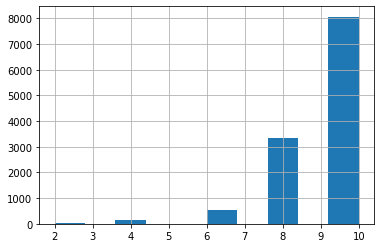

In [56]:
KNN_df['rating'].hist(grid=True)

In [57]:
random_item = np.random.choice(KNN_item_user_df.shape[0])
print(random_item)
distances, indices = model_knn.kneighbors(KNN_item_user_df.iloc[random_item,:].values.reshape(1, -1), n_neighbors = 20)

571


In [58]:
for i in range(0, len(distances.flatten())):
    if i == 0:
        print('Recommendations for {0}:\n'.format(KNN_item_user_df.index[random_item]))
    else:
        print('{0}: {1}, with distance of {2}:'.format(i, KNN_item_user_df.index[indices.flatten()[i]], distances.flatten()[i]))

Recommendations for 1497935:

1: 1329021, with distance of 0.7281363760864816:
2: 286193, with distance of 1.0:
3: 304354, with distance of 1.0:
4: 291513, with distance of 1.0:
5: 2931769, with distance of 1.0:
6: 2940176, with distance of 1.0:
7: 294486, with distance of 1.0:
8: 2955585, with distance of 1.0:
9: 2960025, with distance of 1.0:
10: 296430, with distance of 1.0:
11: 297536, with distance of 1.0:
12: 298336, with distance of 1.0:
13: 298830, with distance of 1.0:
14: 299987, with distance of 1.0:
15: 300980, with distance of 1.0:
16: 301873, with distance of 1.0:
17: 2903392, with distance of 1.0:
18: 2850568, with distance of 1.0:
19: 287235, with distance of 1.0:


In [59]:
cloth_df[(cloth_df.item_id == '1198944') & (cloth_df.rented_for == 'wedding')]

,fit,user_id,bust_size,item_id,weight,rating,rented_for,review_text,body_type,review_summary,category,height,size,age,review_date
102907,fit,502589,32d,1198944,128lbs,8,wedding,I'm a short and very curvy gal but petite over...,hourglass,solid and striking,dress,"5' 2""",20,54,"November 21, 2016"


In [60]:
cloth_df[(cloth_df.item_id == '2955585') & (cloth_df.rented_for == 'wedding') & (cloth_df.body_type == 'hourglass')]

,fit,user_id,bust_size,item_id,weight,rating,rented_for,review_text,body_type,review_summary,category,height,size,age,review_date
13594,fit,603079,34b,2955585,150lbs,10,wedding,I am in love with this top/skirt combo. I ord...,hourglass,Favorite RTR so far!,skirt,"5' 5""",8,30,"June 27, 2016"
51936,fit,810381,34g,2955585,170lbs,10,wedding,Loved this skirt! I wore it with a black body ...,hourglass,Fun & Different!,skirt,"5' 5""",16,26,"September 21, 2015"
119140,fit,262397,36d,2955585,170lbs,10,wedding,"I'm short (5'3) and curvy, especially my hips ...",hourglass,it's a stand out print in a perfect shape,skirt,"5' 3""",24,35,"February 4, 2016"


In [62]:
import random
def Rand(start, end, num):
    res = []
  
    for j in range(num):
        res.append(random.randint(start, end))
  
    return res

In [63]:
#Recommendation for something furthest to reduce the serendipity
random_reco = Rand(10, len(distances.flatten()), 1)
#random_reco = np.random.choice(len(distances.flatten())

In [64]:
KNN_item_user_df.index[indices.flatten()[random_reco[0]]]

'299987'

In [65]:
i = 6
print('{0}: {1}, with distance of {2}:'.format(i, KNN_item_user_df.index[indices.flatten()[random_reco[0]]], distances.flatten()[random_reco[0]]))

6: 299987, with distance of 1.0:


Item based flitering based on product category and body type

In [67]:
cloth_df.groupby(['category', 'body_type'])['user_id'].count()

category  body_type        
ballgown  apple                 3
          athletic              1
          full bust             2
          hourglass             5
          pear                  1
                               ..
vest      full bust            20
          hourglass            63
          pear                 22
          petite               28
          straight & narrow    28
Name: user_id, Length: 391, dtype: int64

In [70]:
newdf = cloth_df[(cloth_df.category == "dress") & (cloth_df.body_type == "hourglass")]

In [71]:
newdf.shape

(21146, 15)

In [81]:
KNN_df = newdf [['item_id', 'user_id', 'rating']]
KNN_df['rating'] = pd.to_numeric(KNN_df['rating'])
KNN_df.dtypes

item_id    object
user_id    object
rating      int64
dtype: object

In [82]:
##create a item_id X user_id matrix

KNN_item_user_df = KNN_df.pivot_table(index='item_id',columns='user_id',values='rating').fillna(0)
KNN_item_user_df.head()

user_id,100090,100156,100157,100197,1002,100254,100255,100285,100540,100659,...,999141,99921,999282,999314,999362,999431,999561,999635,999987,999997
item_id,,,,,,,,,,,,,,,,,,,,,
1000254,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1000270,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1000739,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1001783,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1001829,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [83]:
from scipy.sparse import csr_matrix

KNN_item_user_matrix = csr_matrix(KNN_item_user_df.values)

from sklearn.neighbors import NearestNeighbors

model_knn = NearestNeighbors(metric = 'cosine', algorithm = 'brute')
model_knn.fit(KNN_item_user_matrix)

NearestNeighbors(algorithm='brute', metric='cosine')

In [84]:
KNN_item_user_df.shape

(2272, 12724)

<AxesSubplot:>

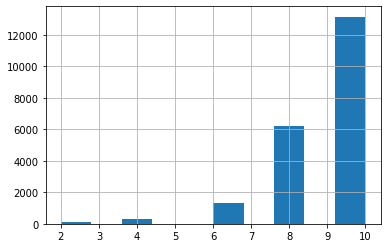

In [85]:
KNN_df['rating'].hist(grid=True)

In [86]:
random_item = np.random.choice(KNN_item_user_df.shape[0])
print(random_item)
distances, indices = model_knn.kneighbors(KNN_item_user_df.iloc[random_item,:].values.reshape(1, -1), n_neighbors = 20)

2110


In [79]:
KNN_item_user_df.shape[0]

2272

In [87]:
for i in range(0, len(distances.flatten())):
    if i == 0:
        print('Recommendations for {0}:\n'.format(KNN_item_user_df.index[random_item]))
    else:
        print('{0}: {1}, with distance of {2}:'.format(i, KNN_item_user_df.index[indices.flatten()[i]], distances.flatten()[i]))

Recommendations for 851603:

1: 548685, with distance of 0.7606093069768444:
2: 588349, with distance of 0.7606093069768444:
3: 1419870, with distance of 0.8205936707890046:
4: 356619, with distance of 0.8327525336461261:
5: 255241, with distance of 0.8393138319050544:
6: 1675253, with distance of 0.8467151651287586:
7: 383302, with distance of 0.877665383701477:
8: 466311, with distance of 0.8803046534884222:
9: 1257763, with distance of 0.8847840627159619:
10: 463324, with distance of 0.9091021767177461:
11: 211146, with distance of 0.9120589983927011:
12: 1413486, with distance of 0.917882305875506:
13: 1479699, with distance of 0.9281389610191488:
14: 497719, with distance of 0.9395855857211147:
15: 682043, with distance of 0.9440282921450444:
16: 195076, with distance of 0.9470801980802938:
17: 781825, with distance of 0.9507514631215165:
18: 1676837, with distance of 0.9667233734847444:
19: 125424, with distance of 0.967848630803631:


# Performing basket analysis - here our basket is list of products picked by the user specific to the occassion

In [90]:
cloth_df.head()

,fit,user_id,bust_size,item_id,weight,rating,rented_for,review_text,body_type,review_summary,category,height,size,age,review_date
0,fit,420272,34d,2260466,137lbs,10,vacation,An adorable romper! Belt and zipper were a lit...,hourglass,So many compliments!,romper,"5' 8""",14,28,"April 20, 2016"
1,fit,273551,34b,153475,132lbs,10,other,I rented this dress for a photo shoot. The the...,straight & narrow,I felt so glamourous!!!,gown,"5' 6""",12,36,"June 18, 2013"
3,fit,909926,34c,126335,135lbs,8,formal affair,I rented this for my company's black tie award...,pear,Dress arrived on time and in perfect condition.,dress,"5' 5""",8,34,"February 12, 2014"
4,fit,151944,34b,616682,145lbs,10,wedding,I have always been petite in my upper body and...,athletic,Was in love with this dress !!!,gown,"5' 9""",12,27,"September 26, 2016"
5,fit,734848,32b,364092,138lbs,8,date,Didn't actually wear it. It fit perfectly. The...,athletic,Traditional with a touch a sass,dress,"5' 8""",8,45,"April 30, 2016"


In [89]:
from mlxtend.frequent_patterns import apriori
from mlxtend.frequent_patterns import association_rules

In [187]:
basket = cloth_df[cloth_df['rented_for'] =="wedding"].groupby(['user_id','item_id'])['item_id'].count().unstack().reset_index().fillna(0).set_index('user_id')


In [188]:
basket

item_id,1000254,1000270,1000739,1001122,1001785,1002863,1003076,1004015,1005880,1006362,...,989029,989581,992169,992520,992623,993753,994626,998947,999526,999837
user_id,,,,,,,,,,,,,,,,,,,,,
100011,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
100033,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
100042,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
100043,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
100139,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
999952,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
99998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
999987,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [184]:
#cloth_df[cloth_df['rented_for'] =="wedding"].groupby(['user_id','item_id'])['item_id'].count()
#df.groupby('day').filter(lambda x : x['total_bill'].mean() > 20)
tmp = cloth_df[cloth_df['rented_for'] =="wedding"].groupby(['item_id']).filter(lambda x: x['user_id'].count() > 2)
#.filter(lambda x: x['item_id'].count() > 2)

In [191]:
tmp[tmp['item_id']=='616682']

,fit,user_id,bust_size,item_id,weight,rating,rented_for,review_text,body_type,review_summary,category,height,size,age,review_date
4,fit,151944,34b,616682,145lbs,10,wedding,I have always been petite in my upper body and...,athletic,Was in love with this dress !!!,gown,"5' 9""",12,27,"September 26, 2016"
11577,fit,877430,32d,616682,115lbs,10,wedding,I adore this dress. I received nonstop complim...,hourglass,February Beach Wedding,gown,"5' 6""",2,28,"February 26, 2017"
17824,fit,734565,34b,616682,135lbs,10,wedding,fit true to size and was the perfect length wi...,athletic,Elegant and classic,gown,"5' 5""",8,30,"May 16, 2016"
18416,fit,883461,36b,616682,160lbs,10,wedding,"LOVE this dress, however my heals got stuck in...",hourglass,"Loved this dress, however my heals got stuck i...",gown,"5' 8""",20,37,"March 31, 2017"
19295,fit,701079,34a,616682,130lbs,10,wedding,This dress was wonderful for a black tie weddi...,straight & narrow,Rent the Runway was great. I ordered this 2 da...,gown,"5' 5""",8,27,"October 11, 2016"
19968,fit,853260,34d,616682,133lbs,10,wedding,"Fit true to size, I am 5'6"" with long legs so ...",petite,Perfect for a winter wedding! Tons of complime...,gown,"5' 6""",9,29,"February 1, 2016"
21773,fit,438068,34d,616682,135lbs,10,wedding,I rented this for a friends winter wedding and...,hourglass,Elegant and comfortable,gown,"5' 4""",12,31,"April 19, 2016"
23618,fit,118301,34b,616682,128lbs,10,wedding,I rented this dress for a black tie wedding an...,straight & narrow,Very Elegant,gown,"5' 7""",8,33,"March 22, 2016"
33288,fit,186124,34b,616682,128lbs,10,wedding,This dress fit just right and made my slim fig...,athletic,Loved this dress--I wanted to keep it!,gown,"5' 3""",8,29,"November 5, 2016"
34426,fit,683824,34c,616682,115lbs,8,wedding,I ordered the 2L since the notes on the dress ...,pear,I got so many compliments all night on how per...,gown,"5' 5""",5,23,"December 1, 2015"


In [164]:
np.count_nonzero(basket_matrix.loc["999987"])

1

In [192]:
tmp[tmp['user_id']=='151944']

,fit,user_id,bust_size,item_id,weight,rating,rented_for,review_text,body_type,review_summary,category,height,size,age,review_date
4,fit,151944,34b,616682,145lbs,10,wedding,I have always been petite in my upper body and...,athletic,Was in love with this dress !!!,gown,"5' 9""",12,27,"September 26, 2016"
2275,fit,151944,34b,466944,145lbs,10,wedding,I didn't end up wearing this even though it wa...,athletic,"Didn't end up wearing. I would've chosen this,...",gown,"5' 9""",16,27,"October 8, 2017"
29719,fit,151944,34b,1427750,145lbs,10,wedding,I wore an 8 since they didn't have a 6. Materi...,athletic,The pattern is amazing!!,dress,"5' 9""",16,27,"November 1, 2016"
107984,fit,151944,34b,524341,145lbs,10,wedding,"Unfortunately, this was too formal so I never ...",athletic,The colors of this dress are absolutely amazing!,gown,"5' 9""",16,27,"October 11, 2016"


In [123]:
basket

item_id,1000254,1000270,1000739,1001122,1001785,1002863,1003076,1004015,1005880,1006362,...,989029,989581,992169,992520,992623,993753,994626,998947,999526,999837
user_id,,,,,,,,,,,,,,,,,,,,,
100011,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
100033,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
100042,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
100043,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
100139,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
999952,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
99998,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
999987,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [137]:
arr = np.array(basket_matrix)

In [138]:
np.count_nonzero(basket_matrix)

42579

In [128]:
def my_encode_units(x):
    if x <= 0:
        return 0
    if x >= 1:
        return 1

basket_matrix = basket.applymap(my_encode_units)

In [207]:
freq_items = apriori(basket_matrix, min_support=0.01, use_colnames=True)

In [208]:
freq_items

,support,itemsets
0,0.011538,(123793)
1,0.014173,(126335)
2,0.010569,(127865)
3,0.010812,(131117)
4,0.011084,(131533)
5,0.013265,(136110)
6,0.012720,(136860)
7,0.026287,(174086)


In [155]:
freq_items.shape

(103, 2)

In [213]:
association_rules(freq_items, metric="confidence", min_threshold=0.08)


,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction


### There were no association rules found by rules mining implies that there are no combination of products which leads to sell of each other neither are bought together 

# Running the basket analysis based on category

In [214]:
basket = cloth_df[cloth_df['category'] =="dress"].groupby(['user_id','item_id'])['item_id'].count().unstack().reset_index().fillna(0).set_index('user_id')


In [215]:
basket_matrix = basket.applymap(my_encode_units)

In [216]:
freq_items = apriori(basket_matrix, min_support=0.01, use_colnames=True)

In [217]:
freq_items

,support,itemsets
0,0.014083,(124204)
1,0.035521,(126335)
2,0.014385,(130259)
3,0.019786,(136110)
4,0.019344,(172027)
5,0.029632,(174086)


In [218]:
association_rules(freq_items, metric="confidence", min_threshold=0.08)

,antecedents,consequents,antecedent support,consequent support,support,confidence,lift,leverage,conviction


# User Based Recommednation

In [14]:
#preparing data 

# creating item by the occurence
item_buy_frequnecy=pd.DataFrame(data['item_id'].value_counts())
item_buy_frequnecy.reset_index(inplace=True)
item_buy_frequnecy.columns=["item_id","count"]
print("shape :",item_buy_frequnecy.shape)
print("***********************")
print(item_buy_frequnecy.head())
print("***********************")
print(item_buy_frequnecy.tail())
print("***********************")       
print(item_buy_frequnecy.describe())
print("***********************")
print(type(item_buy_frequnecy))

# Selected item who sold more than 200+
item_selected=item_buy_frequnecy[item_buy_frequnecy["count"]>200 ]

# selecting the required record
df=pd.merge(data,item_selected,on="item_id", how ="inner")

print("shape of the new data frame:",df.shape)

shape : (5850, 2)
***********************
   item_id  count
0   126335   2241
1   174086   1724
2   123793   1714
3   132738   1582
4   145906   1478
***********************
      item_id  count
5845  1149636      1
5846  2400845      1
5847  2814635      1
5848  2516970      1
5849   217917      1
***********************
            item_id        count
count  5.850000e+03  5850.000000
mean   1.539604e+06    32.913504
std    8.216237e+05    85.000916
min    1.233730e+05     1.000000
25%    8.290940e+05     5.000000
50%    1.531970e+06    14.000000
75%    2.255916e+06    32.000000
max    2.966087e+06  2241.000000
***********************
<class 'pandas.core.frame.DataFrame'>
shape of the new data frame: (55211, 16)


In [15]:
#getting # of buy by customer
customer_id_frequnecy=pd.DataFrame(df['user_id'].value_counts())

#percentile distribution
print ("percentile of product bought",np.percentile(customer_id_frequnecy, [50,75,90,95,99]))
#selecting custimer who bought 3+ item from most occuring item list
retained_customer_id=customer_id_frequnecy[customer_id_frequnecy['user_id'] > 3]
retained_customer_id.reset_index(inplace=True)
retained_customer_id.columns=["user_id","Number_item_bought"]
retained_customer_id.sort_values(by="Number_item_bought",ascending=False)
# selecting data to run model
df2=pd.merge(df,retained_customer_id,how="inner",on="user_id",)
# subsetting column
pre_data_selection=df2.loc[:,["user_id","item_id","rating"]]
#creating pivot table 
pre_KNN_data=pre_data_selection.pivot_table(index="user_id",columns="item_id",values="rating")
#calculating rating by each customer 
Mean_user_rating=pre_KNN_data.mean(axis=1)
# Centralized the rating below averge rating( in negative ) is bad and (positive for good)

pre_KNN_data2=pre_KNN_data.sub(Mean_user_rating,axis=0).fillna(0)

percentile of product bought [1. 1. 2. 2. 3.]


In [16]:
# selecting the sample target user
# trying to predict for item id 123373 for user 4251
target_user_x=pre_KNN_data2.loc[4251,:]



#Other user Y
#selecting all user except 4251 and dropped the column 123373
Other_user_y=pre_KNN_data2.drop([4251])
Other_user_y2=Other_user_y.drop([123373],axis=1)

#Other user Y raw
Other_user_y_raw1=pre_KNN_data.loc[:,123373]
Other_user_y_raw1.drop([4251],inplace=True)
Other_user_y_raw2=Other_user_y_raw1.fillna(0)

In [18]:
# intitaing the model with cosine similarity with 5 neighbor
user_knn = KNeighborsRegressor(metric='cosine', n_neighbors=5)
#getting the mean rating for 
user_knn.fit(Other_user_y, Other_user_y_raw2)

user_user_pred = user_knn.predict(target_user_x.values.reshape(1,-1))
user_user_pred

array([0.])